In [7]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot  as plt
import matplotlib
font = {'family' : 'Times New Roman',
            'weight' : 'bold',
            'size'   : 40}
matplotlib.rc('font', **font)
from easymore.easymore import easymore
import contextily as ctx
from shapely.geometry import Polygon
import glob
from fpdf import FPDF
from PIL import Image
import PIL
from PyPDF2 import PdfFileMerger
import os
import matplotlib as mpl
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Set up the NS objective functions

In [8]:
# definision fo NS values

def NS(s,o):
    """
    Created on Thu Jan 20 15:36:37 2011
    @ author:                  Sat Kumar Tomer
    @ author's webpage:        http://civil.iisc.ernet.in/~satkumar/
    @ author's email id:       satkumartomer@gmail.com
    @ author's website:        www.ambhas.com
    Nash Sutcliffe efficiency coefficient
    input:
        s: simulated [time]
        o: observed [time]
    output:
        ns: Nash Sutcliffe efficient coefficient
    """
    s,o = filter_nan(s,o)
    return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


def filter_nan(s,o):
    """
    Created on Thu Jan 20 15:36:37 2011
    @ author:                  Sat Kumar Tomer
    @ author's webpage:        http://civil.iisc.ernet.in/~satkumar/
    @ author's email id:       satkumartomer@gmail.com
    @ author's website:        www.ambhas.com
    this functions removed the data  from simulated and observed data
    whereever the observed data contains nan
    this is used by all other functions, otherwise they will produce nan as
    output
    """
    data = np.array([s.flatten(),o.flatten()])
    data = np.transpose(data)
    data = data[~np.isnan(data).any(1)]
    return data[:,0],data[:,1]


# Create the south saskatchewan river and its bounding box

EASYMORE version 0.0.5 is initiated.


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


number of lakes in network topology:  7


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


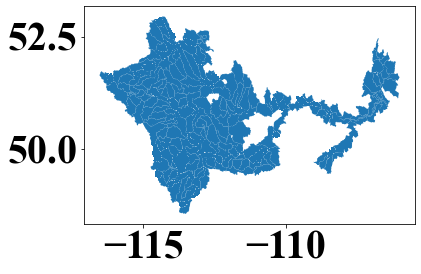

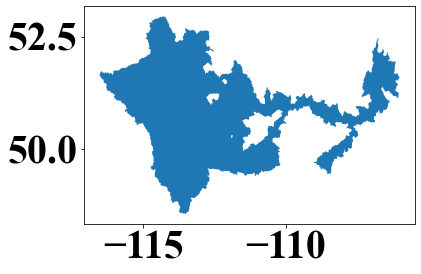

In [9]:
# define the target river segment
target_segment = 3044087 # segment that passes Saskatoon

Ntopo_df = pd.read_csv('../data/Network_topology_Doll_param.csv')
Ntopo_df_3000000 = Ntopo_df [Ntopo_df['ID']<4000000]
Ntopo_df_3000000 = Ntopo_df_3000000 [Ntopo_df_3000000['ID']>2999999]
Ntopo_df_7000000 = Ntopo_df [Ntopo_df['ID']>6999999]
Ntopo_df = Ntopo_df_3000000.append(Ntopo_df_7000000)

cat = gpd.read_file('/Volumes/F:/hydrography/test/hydrolake_sub100km_final_corrected_basins_3000000.shp')

# initializing easymore
esmr = easymore()
# load the files and calculating the downstream of each segment
# get all the upstream
seg_IDs      = np.array(Ntopo_df.ID)
down_IDs     = np.array(Ntopo_df.ID_next)
NTOPO        = esmr.get_all_downstream (seg_IDs,down_IDs)
up_subbasins = esmr.get_all_upstream(target_segment,NTOPO) # segment ID
# subset
cat_up = cat.loc[cat['ID'].isin(up_subbasins)]

# plotting
cat_up.plot()

cat_up ['dissolve'] = 1
cat_up_dissolve = cat_up.dissolve(by='dissolve')
cat_up_dissolve.plot()


Ntopo_df_sub = Ntopo_df.loc [Ntopo_df['ID'].isin(up_subbasins)]
print('number of lakes in network topology: ', Ntopo_df_sub.lake.sum())


min_lon, min_lat, max_lon, max_lat = cat_up_dissolve.geometry.iloc[0].bounds
min_lon, min_lat, max_lon, max_lat = min_lon-0.1, min_lat-0.1, max_lon+0.1, max_lat+0.1
box = Polygon([[min_lon, min_lat],[min_lon,max_lat],[max_lon,max_lat],[max_lon,min_lat]])
box = gpd.GeoDataFrame(pd.DataFrame(['p1'], columns = ['geometry']),
                       crs = {'init':'epsg:4326'},
                       geometry = [box])


# Calculate the NS values for a given year with and without lakes

In [10]:
# read mizuRoute output and make it to dataframe
simulation = xr.open_dataset('/Users/shg096/Downloads/HDMA_CLM_no_lake.h.1999-01-01-00000.nc')
# a none leap year
print(simulation)
# FLOW
FLOW = np.array(simulation['IRFroutedRunoff'][:])
COLUMNS = list(np.array(simulation['reachID'][:]).astype(str))
# dataindex
dateindex = pd.date_range(str(simulation.time.values[0]),
                          str(simulation.time.values[-1]),
                          freq= 'D') #
print(len(dateindex))
simulation = pd.DataFrame(FLOW[:,:],index = dateindex, columns = COLUMNS) # 
simulation_no_lake = simulation



# read mizuRoute output and make it to dataframe
simulation = xr.open_dataset('/Users/shg096/Downloads/HDMA_CLM_lake.h.1999-01-01-00000.nc')
# a none leap year
print(simulation)
# FLOW
FLOW = np.array(simulation['IRFroutedRunoff'][:])
COLUMNS = list(np.array(simulation['reachID'][:]).astype(str))
# dataindex
dateindex = pd.date_range(str(simulation.time.values[0]),
                          str(simulation.time.values[-1]),
                          freq= 'D') #
print(len(dateindex))
simulation = pd.DataFrame(FLOW[:,:],index = dateindex, columns = COLUMNS) # 
simulation_lake = simulation

# lake simulation should have less seg than the lake simulation



# loop over the segment and calculate the values of NSE
shp = gpd.read_file('/Volumes/F:/hydrography/HDMA/processed/hdma_global_stream.shp')
shp ['obj'] = -9999
# shp = shp.drop(columns='geometry')
for index, row in shp.iterrows():
    #print(index)
    if str(row['seg_id']) in COLUMNS:
        obs_seg = np.array(simulation_lake    [str(row['seg_id'])])
        sim_seg = np.array(simulation_no_lake [str(row['seg_id'])])
        print(1-NS(sim_seg,obs_seg))
        shp ['obj'].loc[index] = 1-NS(sim_seg,obs_seg)
        

<xarray.Dataset>
Dimensions:          (time: 365, hru: 295335, seg: 278758)
Coordinates:
  * time             (time) object 1999-01-01 00:00:00 ... 1999-12-31 00:00:00
Dimensions without coordinates: hru, seg
Data variables:
    basinID          (hru) int32 ...
    reachID          (seg) int32 ...
    basRunoff        (time, hru) float32 ...
    IRFroutedRunoff  (time, seg) float32 ...
    volume           (time, seg) float32 ...
365
<xarray.Dataset>
Dimensions:          (time: 365, hru: 298277, seg: 298277)
Coordinates:
  * time             (time) object 1999-01-01 00:00:00 ... 1999-12-31 00:00:00
Dimensions without coordinates: hru, seg
Data variables:
    basinID          (hru) int32 ...
    reachID          (seg) int32 ...
    basRunoff        (time, hru) float32 ...
    IRFroutedRunoff  (time, seg) float32 ...
    volume           (time, seg) float32 ...
365
2.220446049250313e-16


/Users/shg096/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


3.552713678800501e-15
8.881784197001252e-16
2.4424906541753444e-15
2.4424906541753444e-15
1.1102230246251565e-16
7.771561172376096e-16
7.771561172376096e-16
1.3322676295501878e-15
3.1086244689504383e-15
7.771561172376096e-16
0.0
3.3306690738754696e-16
2.220446049250313e-16
3.3306690738754696e-16
6.661338147750939e-16
4.551914400963142e-15
1.6653345369377348e-15
1.1102230246251565e-16
3.885780586188048e-15
3.3306690738754696e-16
4.218847493575595e-15
2.9976021664879227e-15
2.4424906541753444e-15
0.0
4.107825191113079e-15
3.552713678800501e-15
1.1102230246251565e-15
2.3314683517128287e-15
1.5543122344752192e-15
0.0
2.220446049250313e-16
4.451994328746878e-14
0.0
0.0
2.220446049250313e-16
1.7763568394002505e-15
2.1094237467877974e-15
1.1102230246251565e-15
3.9968028886505635e-15
2.7755575615628914e-15
3.3306690738754696e-16
2.55351295663786e-15
2.220446049250313e-15
1.0147438445073931e-13
3.452793606584237e-14
1.3322676295501878e-15
4.218847493575595e-15
8.881784197001252e-16
0.0
1.110223

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_81252/690557491.py:18: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


5.551115123125783e-16
5.551115123125783e-16
1.887379141862766e-15
1.4432899320127035e-15
0.0
1.1102230246251565e-16
3.3306690738754696e-15
0.0
1.6653345369377348e-15
1.3322676295501878e-15
0.0
2.1094237467877974e-15
1.27675647831893e-14
8.881784197001252e-16
3.2032737995457694e-07
0.0
1.4765966227514582e-14
3.9968028886505635e-15
0.0
0.0
2.220446049250313e-16
2.4424906541753444e-15
6.772360450213455e-14
8.881784197001252e-16
1.1102230246251565e-16
3.885780586188048e-15
8.881784197001252e-16
0.0
3.1086244689504383e-15
1.1102230246251565e-16
7.771561172376096e-16
3.4416913763379853e-15
6.661338147750939e-16
6.661338147750939e-16
1.6653345369377348e-15
1.1102230246251565e-16
7.771561172376096e-16
2.220446049250313e-16
2.220446049250313e-16
5.551115123125783e-15
0.0
4.9960036108132044e-15
1.1102230246251565e-16
8.992806499463768e-15
2.220446049250313e-16
0.0
9.992007221626409e-15
2.220446049250313e-16
1.1218517165234587e-06
2.886579864025407e-15
1.5543122344752192e-15
1.6653345369377348e-1

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_81252/690557491.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - sum((s-o)**2)/sum((o-np.mean(o))**2)


0.0
2.1094237467877974e-15
3.3306690738754696e-16
2.220446049250313e-16
3.885780586188048e-15
1.1102230246251565e-15
1.887379141862766e-15
1.2101430968414206e-14
1.9984014443252818e-15
3.3306690738754696e-15
1.4432899320127035e-15
1.7554841583722336e-06
7.771561172376096e-16
0.0
3.3306690738754696e-16
2.9976021664879227e-15
1.1102230246251565e-15
5.10702591327572e-15
nan
5.6035770529317475
3.885780586188048e-15
4.884981308350689e-15
6.661338147750939e-16
1.0
0.0
0.0
0.0
0.0
1.2212453270876722e-15
4.440892098500626e-16
5.551115123125783e-16
0.0
5.551115123125783e-16
1.2212453270876722e-15
8.104628079763643e-14
1.9984014443252818e-15
0.0
7.771561172376096e-16
3.9968028886505635e-15
4.440892098500626e-16
1.5731860258938468e-13
2.55351295663786e-15
3.3306690738754696e-16
4.440892098500626e-16
1.3988810110276972e-14
0.0
7.771561172376096e-16
2.886579864025407e-15
7.771561172376096e-16
1.3322676295501878e-15
4.907185768843192e-14
4.440892098500626e-16
2.19824158875781e-14
1.6653345369377348e

3.9968028886505635e-15
2.7755575615628914e-15
2.220446049250313e-16
6.661338147750939e-16
5.551115123125783e-16
3.6637359812630166e-15
2.7755575615628914e-15
3.6637359812630166e-15
1.9984014443252818e-15
0.0
0.0
2.7755575615628914e-15
1.6653345369377348e-15
1.4432899320127035e-15
1.1102230246251565e-16
1.2212453270876722e-15
4.440892098500626e-16
5.551115123125783e-16
1.5543122344752192e-15
6.439293542825908e-15
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
7.771561172376096e-16
7.771561172376096e-16
0.0
5.625014898313907e-09
2.013944566670034e-12
6.5503158452884236e-15
9.992007221626409e-16
0.0005684374552987759
0.0
1.1102230246251565e-16
5.551115123125783e-16
0.0
6.661338147750939e-16
1.2558465378731398e-10
4.6629367034256575e-15
9.547918011776346e-15
inf
8.881784197001252e-16
2.4424906541753444e-15
0.0
5.551115123125783e-16
1.887379141862766e-15
1.1102230246251565e-16
0.0
1.5021317523178368e-13
0.0
5.551115123125783e-16
9.43689570931383e-15
0.0
2.22

1.509903313490213e-14
3.9968028886505635e-15
1.1102230246251565e-15
1.3322676295501878e-15
1.7763568394002505e-15
0.0
9.992007221626409e-16
1.1102230246251565e-16
2.0761170560490427e-14
1.2212453270876722e-15
0.0
4.440892098500626e-16
9.992007221626409e-16
5.551115123125783e-16
3.6637359812630166e-15
5.551115123125783e-15
1.9984014443252818e-15
9.992007221626409e-16
4.9960036108132044e-15
5.329070518200751e-15
2.220446049250313e-15
7.662648293660368e-12
3.3306690738754696e-16
1.1102230246251565e-15
1.1102230246251565e-16
6.661338147750939e-16
8.881784197001252e-16
3.774758283725532e-15
1.887379141862766e-15
1.2212453270876722e-15
0.0
8.881784197001252e-16
9.992007221626409e-16
3.774758283725532e-15
5.662137425588298e-15
4.440892098500626e-16
3.4416913763379853e-15
4.3298697960381105e-15
2.220446049250313e-16
3.3306690738754696e-16
3.1086244689504383e-15
1.7763568394002505e-15
8.881784197001252e-16
2.4424906541753444e-15
1.1102230246251565e-16
7.771561172376096e-16
9.992007221626409e-16

1.1102230246251565e-16
0.0
7.771561172376096e-16
5.551115123125783e-16
2.886579864025407e-15
1.2212453270876722e-15
4.440892098500626e-16
nan
0.0
6.661338147750939e-16
2.7755575615628914e-15
1.9984014443252818e-15
5.995204332975845e-15
1.1102230246251565e-16
2.220446049250313e-16
1.5543122344752192e-15
0.0
0.0
1.3322676295501878e-15
2.220446049250313e-16
7.66053886991358e-15
1.4432899320127035e-15
9.992007221626409e-16
5.551115123125783e-16
3.219646771412954e-15
2.886579864025407e-15
1.7763568394002505e-15
2.220446049250313e-15
5.405009773085112e-12
5.551115123125783e-16
3.774758283725532e-15
0.0
1.4432899320127035e-15
2.6645352591003757e-15
1.1102230246251565e-16
2.55351295663786e-15
3.552713678800501e-15
8.326672684688674e-15
1.5543122344752192e-15
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-16
7.771561172376096e-16
3.552713678800501e-15
1.1102230246251565e-15
3.552713678800501e-15
2.886579864025407e-15
3.1086244689504383e-15
4.440892098500626e-16
2.331468351712

1.0702549957386509e-13
1.9984014443252818e-15
9.992007221626409e-16
1.9984014443252818e-15
3.3306690738754696e-16
7.771561172376096e-16
5.551115123125783e-16
0.0
3.9968028886505635e-15
1.2656542480726785e-14
3.3306690738754696e-16
1.2212453270876722e-15
3.1086244689504383e-15
2.6645352591003757e-15
4.773959005888173e-15
0.0
0.0
2.220446049250313e-16
5.10702591327572e-15
1.887379141862766e-15
0.0
5.551115123125783e-16
0.0
0.0
4.440892098500626e-16
2.220446049250313e-16
1.6653345369377348e-15
3.3306690738754696e-16
6.661338147750939e-16
4.218847493575595e-15
1.7763568394002505e-15
2.9976021664879227e-15
3.774758283725532e-15
1.9984014443252818e-15
5.440092820663267e-15
1.3322676295501878e-15
4.440892098500626e-15
1.6653345369377348e-15
0.0
2.220446049250313e-16
5.995204332975845e-15
3.3306690738754696e-16
9.992007221626409e-16
4.440892098500626e-16
3.4416913763379853e-15
4.884981308350689e-15
3.3306690738754696e-16
0.0
5.551115123125783e-16
1.3322676295501878e-15
7.771561172376096e-16
7.

7.41295913542217e-13
3.552713678800501e-15
5.218048215738236e-14
2.220446049250313e-16
5.551115123125783e-16
0.0
6.661338147750939e-16
0.0
1.1102230246251565e-16
1.5543122344752192e-15
0.0
2.6645352591003757e-15
2.4424906541753444e-15
1.6653345369377348e-15
0.0
nan
2.3314683517128287e-15
3.3306690738754696e-16
3.3306690738754696e-15
4.218847493575595e-15
2.6645352591003757e-15
2.220446049250313e-16
2.1094237467877974e-15
2.55351295663786e-15
0.0
3.552713678800501e-15
0.0
1.1102230246251565e-16
6.661338147750939e-16
9.992007221626409e-16
0.0
0.0
2.220446049250313e-16
1.1102230246251565e-15
1.1102230246251565e-16
0.0
1.7763568394002505e-15
5.551115123125783e-16
3.774758283725532e-15
1.7763568394002505e-15
2.4424906541753444e-15
1.9984014443252818e-15
1.554312234475219e-14
1.2212453270876722e-15
4.9960036108132044e-15
3.3306690738754696e-15
1.1102230246251565e-16
5.551115123125783e-16
0.0
7.327471962526033e-15
5.551115123125783e-16
1.1102230246251565e-15
2.886579864025407e-15
6.6613381477

5.551115123125783e-16
4.440892098500626e-16
0.0
1.021405182655144e-14
3.9968028886505635e-15
8.548717289613705e-15
5.10702591327572e-15
1.432187701766452e-14
2.220446049250313e-16
nan
0.0
0.0
nan
0.0
nan
1.6653345369377348e-15
1.5543122344752192e-15
2.3314683517128287e-15
2.220446049250313e-15
8.881784197001252e-16
1.2001510896197942e-13
8.881784197001252e-16
2.405853294362714e-13
2.55351295663786e-15
2.220446049250313e-16
1.9984014443252818e-15
3.219646771412954e-15
7.513012004745079e-07
1.6653345369377348e-15
1.6653345369377348e-15
4.440892098500626e-16
5.551115123125783e-16
2.7755575615628914e-15
1.887379141862766e-15
2.4424906541753444e-15
1.887379141862766e-15
6.5503158452884236e-15
2.6645352591003757e-15
3.1086244689504383e-15
3.219646771412954e-15
2.220446049250313e-16
1.1102230246251565e-16
8.881784197001252e-16
1.5543122344752192e-15
6.661338147750939e-16
2.220446049250313e-16
1.1102230246251565e-16
5.551115123125783e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.3322

3.3306690738754696e-16
0.0
4.440892098500626e-16
4.440892098500626e-16
0.0
1.1102230246251565e-16
5.551115123125783e-16
3.774758283725532e-15
2.4424906541753444e-15
0.0
3.1086244689504383e-15
1.6653345369377348e-15
1.1102230246251565e-15
3.3306690738754696e-16
8.881784197001252e-16
8.881784197001252e-16
2.4424906541753444e-15
0.0
1.1213252548714081e-14
4.323027049224493e-06
4.440892098500626e-16
2.55351295663786e-15
0.0
0.0
1.4900192191191763e-11
2.886579864025407e-15
3.774758283725532e-15
0.0
0.0
7.66053886991358e-15
1.4432899320127035e-15
2.4424906541753444e-15
6.661338147750939e-16
4.440892098500626e-16
1.1102230246251565e-16
6.661338147750939e-16
1.1102230246251565e-16
4.440892098500626e-16
0.0
4.551914400963142e-15
8.881784197001252e-16
3.3306690738754696e-16
6.661338147750939e-15
0.0
2.220446049250313e-15
nan
4.3298697960381105e-15
1.6653345369377348e-15
1.7763568394002505e-15
7.438494264988549e-15
1.887379141862766e-15
2.220446049250313e-16
3.3306690738754696e-15
9.4368957093138

9.992007221626409e-16
0.0
1.4432899320127035e-15
1.84297022087776e-14
4.9960036108132044e-15
2.886579864025407e-15
0.0
1.6653345369377348e-15
1.5543122344752192e-15
inf
3.3306690738754696e-16
5.218048215738236e-15
0.0
4.9960036108132044e-15
5.88418203051333e-15
3.552713678800501e-15
9.992007221626409e-16
1.0769163338864018e-14
5.1514348342607263e-14
0.0
7.549516567451064e-15
9.992007221626409e-16
6.661338147750939e-16
1.1102230246251565e-16
3.3306690738754696e-16
0.0
1.887379141862766e-15
1.9984014443252818e-15
0.0
9.992007221626409e-16
2.1094237467877974e-15
2.220446049250313e-15
3.3306690738754696e-16
4.440892098500626e-16
2.220446049250313e-16
1.4432899320127035e-15
1.1102230246251565e-15
2.9976021664879227e-15
9.992007221626409e-16
1.6653345369377348e-15
3.6637359812630166e-15
0.0
1.5543122344752192e-15
2.886579864025407e-15
4.3298697960381105e-15
1.0769163338864018e-14
2.220446049250313e-16
1.1102230246251565e-16
5.81756864903582e-14
3.3306690738754696e-16
2.1094237467877974e-15
4

5.440092820663267e-15
2.220446049250313e-16
2.220446049250313e-16
0.0
1.9984014443252818e-15
3.3306690738754696e-16
1.1102230246251565e-15
0.0
9.992007221626409e-16
1.2212453270876722e-15
7.771561172376096e-16
1.1102230246251565e-15
4.440892098500626e-15
5.551115123125783e-16
7.771561172376096e-16
2.1094237467877974e-15
4.773959005888173e-15
1.1102230246251565e-16
9.103828801926284e-15
3.3306690738754696e-16
6.994405055138486e-15
5.551115123125783e-16
0.0
4.440892098500626e-16
2.6645352591003757e-15
1.1102230246251565e-15
1.959164698628335e-05
1.3322676295501878e-15
1.1102230246251565e-16
2.220446049250313e-16
8.881784197001252e-16
0.0
2.220446049250313e-16
3.3306690738754696e-16
2.886579864025407e-15
2.220446049250313e-16
5.551115123125783e-16
9.658940314238862e-14
1.3322676295501878e-15
0.0
8.104628079763643e-15
1.1102230246251565e-15
1.887379141862766e-15
2.682298827494378e-13
2.1094237467877974e-15
2.220446049250313e-16
3.1086244689504383e-15
4.440892098500626e-16
1.554312234475219

1.1102230246251565e-15
2.1094237467877974e-15
3.4416913763379853e-15
0.0
1.2212453270876722e-15
3.3306690738754696e-16
4.440892098500626e-16
1.1102230246251565e-16
4.218847493575595e-15
1.1102230246251565e-16
0.0
2.220446049250313e-16
1.1102230246251565e-16
8.992806499463768e-15
nan
7.771561172376096e-16
2.1094237467877974e-15
2.220446049250313e-16
2.9976021664879227e-15
2.220446049250313e-15
3.3306690738754696e-16
3.852473895449293e-14
2.220446049250313e-16
4.440892098500626e-16
0.0
1.5543122344752192e-15
1.887379141862766e-15
1.887379141862766e-15
8.992806499463768e-15
4.3298697960381105e-15
3.4416913763379853e-15
0.0
0.0
8.881784197001252e-16
1.7763568394002505e-15
2.220446049250313e-16
5.551115123125783e-16
8.881784197001252e-16
6.661338147750939e-16
4.54081217071689e-14
4.440892098500626e-16
1.2323475573339238e-14
2.220446049250313e-16
2.220446049250313e-16
1.1102230246251565e-16
3.4372504842394846e-13
2.0650148258027912e-14
2.220446049250313e-16
6.661338147750939e-16
2.2204460492

1.1102230246251565e-15
5.995204332975845e-15
6.439293542825908e-15
3.3306690738754696e-16
1.887379141862766e-15
2.220446049250313e-15
2.7755575615628914e-15
7.549516567451064e-15
1.887379141862766e-15
2.1094237467877974e-15
1.6209256159527285e-14
1.0
1.6653345369377348e-15
3.3306690738754696e-16
1.1102230246251565e-15
0.0
4.440892098500626e-15
4.982680934517703e-13
0.0
1.7763568394002505e-15
4.440892098500626e-16
2.220446049250313e-16
3.3306690738754696e-16
0.0
1.6764367671839864e-14
0.0
0.8972367272876709
2.1094237467877974e-15
0.0
0.00016037201355545427
2.9976021664879227e-15
0.0
7.771561172376096e-16
1.1102230246251565e-16
2.1094237467877974e-15
1.6653345369377348e-15
4.3298697960381105e-15
7.771561172376096e-16
2.220446049250313e-16
0.0
7.771561172376096e-16
1.6653345369377348e-15
2.1094237467877974e-15
2.3314683517128287e-15
nan
0.0
1.6542323066914832e-14
3.3306690738754696e-16
0.9981709114535733
6.661338147750939e-16
3.885780586188048e-15
4.9960036108132044e-15
2.1094237467877974

0.0
3.774758283725532e-15
0.0
1.887379141862766e-15
1.3322676295501878e-15
1.3988810110276972e-14
1.1102230246251565e-16
0.0
1.1102230246251565e-15
0.17506982720196618
8.881784197001252e-16
1.2212453270876722e-15
4.218847493575595e-15
2.220446049250313e-15
1.1102230246251565e-15
1.7763568394002505e-15
6.661338147750939e-16
2.6645352591003757e-15
0.0
4.107825191113079e-15
1.1324274851176597e-14
1.3322676295501878e-15
0.0
3.3306690738754696e-16
1.1102230246251565e-15
0.0019453032547805948
1.7763568394002505e-15
3.3306690738754696e-16
5.773159728050814e-15
6.661338147750939e-16
2.220446049250313e-16
3.4416913763379853e-15
0.022260959640868605
1.4432899320127035e-15
5.551115123125783e-15
9.992007221626409e-16
5.995204332975845e-15
5.551115123125783e-16
1.3433698597964394e-14
1.887379141862766e-15
8.881784197001252e-16
4.773959005888173e-15
7.771561172376096e-16
0.0
1.1102230246251565e-16
1.2212453270876722e-15
3.885780586188048e-15
0.0
1.1102230246251565e-16
5.218048215738236e-15
1.7763568

4.9960036108132044e-15
6.661338147750939e-16
0.0
3.3306690738754696e-16
0.0
2.6645352591003757e-15
0.0
7.882583474838611e-15
9.992007221626409e-16
4.374278717023117e-14
4.440892098500626e-16
1.815214645262131e-13
9.992007221626409e-16
1.1102230246251565e-15
2.220446049250313e-16
0.0
0.0
1.5543122344752192e-15
1.1102230246251565e-16
2.220446049250313e-16
6.8833827526759706e-15
1.3322676295501878e-15
0.0
4.884981308350689e-15
4.6629367034256575e-15
0.0
3.3306690738754696e-16
0.0
3.1086244689504383e-15
0.0
7.771561172376096e-16
2.1094237467877974e-15
2.55351295663786e-15
1.4432899320127035e-15
4.884981308350689e-15
1.5543122344752192e-15
2.1094237467877974e-15
3.3306690738754696e-16
3.3306690738754696e-16
6.661338147750939e-16
0.0
1.1102230246251565e-15
5.551115123125783e-16
3.9968028886505635e-15
1.6653345369377348e-15
0.0
4.107825191113079e-15
0.0
nan
2.1094237467877974e-15
5.773159728050814e-15
3.9968028886505635e-15
2.7755575615628914e-15
0.0
5.551115123125783e-16
0.0
4.77395900588817

1.2212453270876722e-15
5.440092820663267e-15
0.0
3.3306690738754696e-16
2.886579864025407e-15
0.0
4.773959005888173e-15
0.0
2.220446049250313e-16
4.773959005888173e-15
1.9984014443252818e-15
3.3306690738754696e-16
9.992007221626409e-15
5.551115123125783e-16
5.329070518200751e-15
0.0
1.6653345369377348e-15
5.551115123125783e-16
1.3322676295501878e-15
2.3314683517128287e-15
1.3322676295501878e-15
1.1102230246251565e-15
6.5503158452884236e-15
9.992007221626409e-16
0.0
4.551914400963142e-15
4.773959005888173e-15
3.885780586188048e-15
1.3423706590742768e-12
1.1102230246251565e-16
3.6637359812630166e-15
4.440892098500626e-15
2.7056135110115065e-13
3.3306690738754696e-16
9.992007221626409e-16
0.0
0.0
1.4432899320127035e-15
1.1102230246251565e-16
1.1102230246251565e-16
9.2148511043888e-15
0.0
1.887379141862766e-15
1.1102230246251565e-16
1.4432899320127035e-15
4.440892098500626e-16
0.0
6.661338147750939e-16
6.439293542825908e-15
0.0
5.551115123125783e-16
1.4432899320127035e-15
4.218847493575595

1.9984014443252818e-15
6.088463067044358e-13
2.220446049250313e-16
4.440892098500626e-16
7.771561172376096e-16
1.1102230246251565e-16
1.1102230246251565e-15
3.3306690738754696e-16
3.552713678800501e-15
8.881784197001252e-16
2.4424906541753444e-15
5.551115123125783e-16
2.4424906541753444e-15
2.7755575615628914e-15
1.27675647831893e-14
6.0898663859498825e-06
1.887379141862766e-15
1.0880185641326534e-14
3.6637359812630166e-15
2.9976021664879227e-15
2.220446049250313e-16
1.5543122344752192e-15
2.886579864025407e-15
5.218048215738236e-15
8.881784197001252e-16
3.885780586188048e-15
0.0
2.6645352591003757e-15
0.0
2.220446049250313e-16
3.3306690738754696e-16
1.4432899320127035e-15
0.0
3.3306690738754696e-16
5.773159728050814e-15
0.0
2.55351295663786e-15
1.9984014443252818e-15
1.2212453270876722e-15
1.1102230246251565e-16
4.440892098500626e-16
1.1102230246251565e-15
1.887379141862766e-15
3.885780586188048e-15
9.2148511043888e-15
1.1102230246251565e-16
3.774758283725532e-15
6.661338147750939e-16

8.881784197001252e-16
2.55351295663786e-15
0.0
1.1102230246251565e-15
8.881784197001252e-16
6.661338147750939e-16
1.1102230246251565e-15
5.551115123125783e-16
1.3322676295501878e-15
7.771561172376096e-16
1.1102230246251565e-16
1.6653345369377348e-15
0.0
1.1102230246251565e-15
0.0
1.1102230246251565e-16
4.440892098500626e-16
4.773959005888173e-15
6.661338147750939e-16
5.329070518200751e-15
0.0
1.2212453270876722e-15
0.0
0.0
1.1102230246251565e-16
2.9976021664879227e-15
3.219646771412954e-15
0.0
0.0
4.107825191113079e-15
5.551115123125783e-15
2.9976021664879227e-15
5.551115123125783e-16
3.3306690738754696e-16
0.0
0.0
1.3322676295501878e-15
2.220446049250313e-16
2.1981305664553474e-12
3.219646771412954e-15
0.003662231443502195
8.881784197001252e-16
6.661338147750939e-16
nan
2.886579864025407e-15
2.3314683517128287e-15
1.3322676295501878e-15
7.3001391266019136
2.220446049250313e-15
3.1530333899354446e-14
2.55351295663786e-15
3.6637359812630166e-14
1.1102230246251565e-15
8.881784197001252e-

9.992007221626409e-16
3.3306690738754696e-16
1.1102230246251565e-16
4.440892098500626e-16
4.884981308350689e-15
6.661338147750939e-16
2.220446049250313e-15
4.440892098500626e-16
8.881784197001252e-16
0.0
3.219646771412954e-15
8.881784197001252e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
4.884981308350689e-15
2.220446049250313e-16
5.551115123125783e-16
2.55351295663786e-15
0.4333216847806963
2.6645352591003757e-15
0.0
1.3322676295501878e-15
1.6653345369377348e-15
8.326672684688674e-15
9.992007221626409e-16
2.886579864025407e-15
5.551115123125783e-16
1.1102230246251565e-16
6.661338147750939e-16
3.552713678800501e-15
1.4210854715202004e-14
3.3306690738754696e-16
3.774758283725532e-15
0.0
5.10702591327572e-15
4.3298697960381105e-15
1.5543122344752192e-15
5.10702591327572e-15
0.0
2.886579864025407e-15
8.881784197001252e-16
1.9984014443252818e-15
2.220446049250313e-16
2.4424906541753444e-15
2.55351295663786e-15
1.0743406164692715e-11
0.0
2.220446049250313e-16
6.661338147750939e-16


6.106226635438361e-15
4.551914400963142e-15
8.881784197001252e-16
3.3306690738754696e-16
0.0
4.440892098500626e-16
1.6653345369377348e-15
0.0
1.6653345369377348e-15
7.771561172376096e-16
5.551115123125783e-16
1.7763568394002505e-15
5.551115123125783e-16
1.2212453270876722e-15
1.4432899320127035e-15
7.771561172376096e-16
5.218048215738236e-15
0.0
6.661338147750939e-16
0.06317118541388445
9.992007221626409e-16
1.6653345369377348e-15
1.9198609368942243e-10
3.3306690738754696e-16
4.440892098500626e-16
4.884981308350689e-15
1.1102230246251565e-16
1.1102230246251565e-14
2.220446049250313e-16
6.661338147750939e-16
nan
1.3322676295501878e-15
0.0
1.1102230246251565e-15
8.326672684688674e-15
0.0
3.6637359812630166e-15
1.2212453270876722e-15
0.0
1.1102230246251565e-16
0.0
1.9984014443252818e-15
1.887379141862766e-15
1.887379141862766e-15
7.438494264988549e-15
0.0
0.0
7.771561172376096e-16
0.0
3.3306690738754696e-16
6.661338147750939e-16
4.773959005888173e-15
7.771561172376096e-16
3.33066907387546

5.551115123125783e-16
1.2212453270876722e-15
1.7763568394002505e-15
2.220446049250313e-16
9.992007221626409e-16
8.43769498715119e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.0
0.0
6.8833827526759706e-15
1.1102230246251565e-16
6.661338147750939e-16
9.713341242445495e-13
1.0103029524088925e-14
4.6629367034256575e-15
3.3306690738754696e-16
2.220446049250313e-16
2.220446049250313e-16
2.55351295663786e-15
0.0
1.1102230246251565e-16
8.881784197001252e-16
5.10702591327572e-15
2.220446049250313e-16
0.0
3.885780586188048e-15
8.881784197001252e-16
1.1102230246251565e-16
2.220446049250313e-16
6.661338147750939e-16
5.329070518200751e-15
6.661338147750939e-16
0.0
0.0
7.771561172376096e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1324274851176597e-14
1.2212453270876722e-15
2.6645352591003757e-15
8.881784197001252e-16
1.6653345369377348e-15
0.0
1.1102230246251565e-15
4.551914400963142e-15
6.8833827526759706e-15
1.3322676295501878e-15
2.4424906541753444e-15
1.0658141036401503e-14
5.21804

4.6629367034256575e-15
1.5543122344752192e-15
0.0
1.1102230246251565e-16
4.440892098500626e-16
2.220446049250313e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
8.215650382226158e-15
6.328271240363392e-15
5.440092820663267e-15
3.6637359812630166e-15
3.3306690738754696e-15
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
3.1086244689504383e-15
5.551115123125783e-16
0.0
6.661338147750939e-16
8.881784197001252e-16
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
5.551115123125783e-16
2.220446049250313e-16
1.887379141862766e-15
1.4432899320127035e-15
4.440892098500626e-16
8.881784197001252e-16
3.219646771412954e-15
1.1102230246251565e-16
0.0
3.774758283725532e-15
2.220446049250313e-15
2.9976021664879227e-15
0.0
3.9968028886505635e-15
9.992007221626409e-16
5.551115123125783e-16
1.1102230246251565e-16
9.547918011776346e-15
5.551115123125783e-16
1.1102230246251565e-16
1.6653345369377348e-15
7.771561172376096e-16
2.4424906541753444e-15
1.2989609388114332e-14
3.4416913763379853e-

6.661338147750939e-16
3.9968028886505635e-15
3.3306690738754696e-16
1.1102230246251565e-16
1470934225518592.0
5.551115123125783e-16
3.219646771412954e-15
0.0
5.10702591327572e-15
0.0
4.218847493575595e-15
9.992007221626409e-16
4.440892098500626e-16
1.9984014443252818e-15
0.0
2.4424906541753444e-15
7.993605777301127e-15
2.220446049250313e-16
1.887379141862766e-15
3.885780586188048e-15
6.661338147750939e-16
4.440892098500626e-15
2.55351295663786e-15
9.2148511043888e-15
1.6653345369377348e-15
7.216449660063518e-15
4.440892098500626e-16
8.881784197001252e-16
5.551115123125783e-16
1.2212453270876722e-15
3.3306690738754696e-16
inf
3.219646771412954e-15
4.107825191113079e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-15
1.1102230246251565e-16
1.5543122344752192e-15
9.103828801926284e-15
0.0
1.3322676295501878e-15
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
2.1094237467877974e-15
4.440892098500626e-16
3.4416913763

5.551115123125783e-16
2.220446049250313e-16
4.6629367034256575e-15
4.440892098500626e-16
1.1102230246251565e-16
3.3306690738754696e-16
5.551115123125783e-16
1.1102230246251565e-15
3.3306690738754696e-15
0.022929069444629024
0.0
2.220446049250313e-16
0.0
1.5543122344752192e-15
3.774758283725532e-15
1.4432899320127035e-15
4.9960036108132044e-15
1.1102230246251565e-16
1.9984014443252818e-15
1.3322676295501878e-15
7.771561172376096e-16
0.0
1.9984014443252818e-15
0.0
0.0
1.7763568394002505e-15
6.661338147750939e-16
7.771561172376096e-16
1.2212453270876722e-15
0.6549206622534361
1.5543122344752192e-15
2.220446049250313e-15
1.1102230246251565e-16
2.886579864025407e-15
4.440892098500626e-16
3.1086244689504383e-15
0.0
3.3306690738754696e-16
2.220446049250313e-16
4.3298697960381105e-15
0.0
1.1102230246251565e-16
1.4432899320127035e-15
5.995204332975845e-15
0.0
3.6637359812630166e-15
9.992007221626409e-16
3.3306690738754696e-16
5.551115123125783e-15
1.887379141862766e-15
0.0
6.5503158452884236e-1

0.0
2.55351295663786e-15
1.1102230246251565e-16
2.220446049250313e-15
1.1102230246251565e-16
0.0
5.551115123125783e-16
1.1102230246251565e-15
0.0
1.887379141862766e-15
0.0
1.6653345369377348e-15
1.1102230246251565e-16
3.3306690738754696e-16
7.771561172376096e-16
1.5543122344752192e-15
8.548717289613705e-15
3.219646771412954e-15
4.107825191113079e-15
0.0
0.0
8.770761894538737e-15
3.3306690738754696e-16
0.06539897010069196
5.551115123125783e-16
9.992007221626409e-16
0.0
2.2426505097428162e-14
2.886579864025407e-15
0.0
3.552713678800501e-15
1.1102230246251565e-16
4.440892098500626e-16
1.3322676295501878e-15
1.6653345369377348e-15
1.5543122344752192e-15
1.6653345369377348e-15
1.7430501486614958e-14
2.220446049250313e-16
0.0
5.551115123125783e-16
4.107825191113079e-15
1.9984014443252818e-15
1.8096635301390052e-14
2.1094237467877974e-15
3.219646771412954e-15
6.328271240363392e-15
1.1102230246251565e-15
2.6867397195928788e-14
1.4432899320127035e-15
8.881784197001252e-16
2.4424906541753444e-15

4.440892098500626e-15
2.6645352591003757e-15
1.1102230246251565e-16
1.2212453270876722e-15
2.1094237467877974e-15
1.6653345369377348e-15
4.440892098500626e-16
1.1102230246251565e-15
1.1102230246251565e-16
0.0
4.440892098500626e-16
7.216449660063518e-15
0.0
4.440892098500626e-16
0.0
0.0
1.5543122344752192e-15
0.0
3.9968028886505635e-15
1.3322676295501878e-15
0.0002926081361110944
1.1102230246251565e-16
2.9976021664879227e-15
7.771561172376096e-16
1.1102230246251565e-16
2.944942378835247e-05
4.6629367034256575e-15
0.0
0.0
4.440892098500626e-16
0.0
3.3306690738754696e-16
0.0
1.1102230246251565e-16
1.9984014443252818e-15
2.3314683517128287e-15
2.220446049250313e-16
5.551115123125783e-16
2.220446049250313e-16
1.2212453270876722e-15
2.4424906541753444e-15
2.220446049250313e-16
1.2212453270876722e-15
0.0
1.1102230246251565e-16
1.4432899320127035e-15
8.881784197001252e-16
0.0
4.440892098500626e-16
8.43769498715119e-15
2.6645352591003757e-15
nan
2.3314683517128287e-15
0.0
0.0
8.881784197001252e

3.3306690738754696e-16
1.7763568394002505e-15
2.6645352591003757e-15
9.992007221626409e-16
2.0650148258027912e-14
6.661338147750939e-16
3.1086244689504383e-15
0.003671005311598363
8.881784197001252e-16
0.0
3.2169457075958974e-07
0.0
0.0
1.9984014443252818e-15
0.0
0.01380197406670336
3.885780586188048e-15
6.994405055138486e-15
3.3306690738754696e-16
8.43769498715119e-15
6.661338147750939e-16
4.440892098500626e-16
2.1094237467877974e-15
0.0
3.3306690738754696e-16
3.3306690738754696e-16
1.1102230246251565e-15
6.661338147750939e-16
8.881096050239456e-06
2.55351295663786e-15
3.3306690738754696e-16
3.3306690738754696e-16
4.440892098500626e-16
9.992007221626409e-16
1.887379141862766e-15
0.0
1.4432899320127035e-15
9.992007221626409e-16
nan
5.551115123125783e-16
1.2212453270876722e-15
1.7763568394002505e-15
2.3647750424515834e-14
1.2212453270876722e-15
1.1102230246251565e-16
0.0
4.551914400963142e-15
0.0
1.3322676295501878e-15
9.992007221626409e-16
8.881784197001252e-16
6.661338147750939e-16
0.

4.551914400963142e-15
4.440892098500626e-16
3.774758283725532e-15
2.220446049250313e-16
0.0
0.0
3.3306690738754696e-16
3.3306690738754696e-15
1.1102230246251565e-16
6.8833827526759706e-15
0.0
4.6629367034256575e-15
1.6653345369377348e-15
1.1102230246251565e-15
1.3322676295501878e-15
5.551115123125783e-16
8.881784197001252e-16
2.220446049250313e-16
2.220446049250313e-16
0.0
2.1094237467877974e-15
4.440892098500626e-16
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-16
2.3478058926107437e-05
0.0
1.6209256159527285e-14
8.881784197001252e-16
1.2212453270876722e-15
1.3766765505351941e-14
1.1102230246251565e-15
0.0
0.0
2.220446049250313e-16
7.993605777301127e-15
2.220446049250313e-15
9.992007221626409e-16
2.2604140781368187e-13
3.774758283725532e-15
6.661338147750939e-16
5.551115123125783e-16
6.661338147750939e-16
8.881784197001252e-16
9.992007221626409e-16
8.770761894538737e-15
1.5543122344752192e-15
8.881784197001252e-16
1.3322676295501878e-15
1.1102230246251565e-15
2.90656

9.992007221626409e-16
3.9968028886505635e-15
1.1102230246251565e-16
0.0
3.3912993473328434e-05
3.774758283725532e-15
6.5503158452884236e-15
2.220446049250313e-16
7.771561172376096e-15
3.3306690738754696e-16
3.9968028886505635e-15
1.1102230246251565e-16
3.3306690738754696e-16
2.220446049250313e-16
0.0
2.9976021664879227e-15
1.1102230246251565e-16
1.9984014443252818e-15
1.1102230246251565e-16
0.0
0.0
1.2212453270876722e-15
1.1102230246251565e-16
2.6645352591003757e-15
4.440892098500626e-16
2.220446049250313e-16
5.551115123125783e-16
0.0008284488250952515
2.6645352591003757e-15
2.220446049250313e-16
2.1094237467877974e-15
7.771561172376096e-16
0.0
4.440892098500626e-16
1.6431300764452317e-14
0.029719071051454216
1.4432899320127035e-15
1.5543122344752192e-15
0.0005158885078232478
1.1102230246251565e-15
0.0
0.0
4.6629367034256575e-15
7.105427357601002e-15
1.5543122344752192e-15
0.0
9.992007221626409e-16
0.0
0.0
4.440892098500626e-16
5.551115123125783e-16
0.0
5.551115123125783e-16
0.0
1.6653

1.1102230246251565e-16
4.6629367034256575e-15
1.1102230246251565e-16
4.440892098500626e-16
9.992007221626409e-16
5.440092820663267e-15
0.0021972983887457165
1.1102230246251565e-16
2.220446049250313e-16
4.90553064591559e-06
7.771561172376096e-16
3.3306690738754696e-16
0.0
2.808864252301646e-14
2.55351295663786e-15
1.887379141862766e-15
2.7755575615628914e-15
0.0
0.0
6.661338147750939e-16
2.220446049250313e-16
4.440892098500626e-16
7.771561172376096e-16
nan
3.3306690738754696e-16
1.1102230246251565e-16
2.55351295663786e-15
4.551914400963142e-15
1.7763568394002505e-15
3.219646771412954e-15
3.6637359812630166e-15
1.5543122344752192e-15
2.6645352591003757e-15
4.440892098500626e-16
0.0
0.0
3.3306690738754696e-16
1.4432899320127035e-15
5.662137425588298e-15
2.4424906541753444e-15
4497003773952.0
1.6653345369377348e-15
7.771561172376096e-16
4.440892098500626e-16
3.3306690738754696e-15
2.220446049250313e-16
2.55351295663786e-15
3.6637359812630166e-15
2.3314683517128287e-15
5.551115123125783e-16

2.220446049250313e-15
0.0
0.0
2.3314683517128287e-15
0.0
9.992007221626409e-16
1.3322676295501878e-15
2.7755575615628914e-15
1.6653345369377348e-15
8.881784197001252e-16
2.1094237467877974e-15
1.9984014443252818e-15
1.5543122344752192e-15
1.2212453270876722e-15
1.1102230246251565e-16
5.551115123125783e-16
8.881784197001252e-16
1.1102230246251565e-15
8.326672684688674e-15
5.329070518200751e-15
0.0
4.060202132283308e-07
6.661338147750939e-16
0.0
1.176836406102666e-14
0.0
6.661338147750939e-16
0.0
3.3306690738754696e-16
1.1435297153639112e-14
0.0
0.0
1.0436096431476471e-14
4.440892098500626e-15
0.0
7.771561172376096e-16
4.6629367034256575e-15
6.661338147750939e-16
1.1102230246251565e-16
5.551115123125783e-16
5.551115123125783e-16
5.551115123125783e-16
1.7763568394002505e-15
0.0
2.6645352591003757e-15
1.2321360349019082
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.6263389340772286
1.1102230246251565e-16
4.440892098500626e-16
2.220446049250313e-16
1.776356839400250

1.9984014443252818e-15
4.440892098500626e-16
1.4432899320127035e-15
1.2212453270876722e-15
2.1094237467877974e-15
2.4424906541753444e-15
2.7755575615628914e-15
6.217248937900877e-15
2.886579864025407e-15
0.0
1.3322676295501878e-15
2.220446049250313e-16
0.43845676961169466
2.220446049250313e-16
2.1871393585115584e-14
2.220446049250313e-16
0.0
1.0325074129013956e-14
2.55351295663786e-15
0.0005580634404829254
1.021405182655144e-14
9.992007221626409e-16
1.2212453270876722e-15
0.0
6.661338147750939e-16
2.220446049250313e-16
1.6653345369377348e-15
7.771561172376096e-16
1.1102230246251565e-16
2.55351295663786e-15
3.3306690738754696e-16
0.0
3.3306690738754696e-16
5.551115123125783e-16
0.0862755327177619
6.661338147750939e-16
1.1102230246251565e-15
1.2212453270876722e-15
1.1102230246251565e-16
1.1102230246251565e-15
2.220446049250313e-16
2.220446049250313e-16
1.865174681370263e-14
1.7763568394002505e-15
1.3322676295501878e-15
3.219646771412954e-15
2.3314683517128287e-15
0.0
2.220446049250313e-1

5.88418203051333e-15
5.551115123125783e-16
4.440892098500626e-16
5.995204332975845e-15
0.0
1.3514226256505779e-05
1.1102230246251565e-16
1.2212453270876722e-15
8.881784197001252e-16
3.9968028886505635e-15
4.691115838006965e-07
1.7763568394002505e-15
8.881784197001252e-16
9.992007221626409e-16
2.4424906541753444e-15
3.1321611970724916e-12
8.326672684688674e-15
5.551115123125783e-16
9.2148511043888e-15
3.1086244689504383e-15
4.440892098500626e-16
9.992007221626409e-16
5.551115123125783e-15
7.771561172376096e-16
3.3306690738754696e-16
0.0
1.0547118733938987e-14
0.0
0.0
1.3322676295501878e-15
0.0
1.4432899320127035e-15
2.220446049250313e-15
1.4432899320127035e-15
0.0
0.0
0.0
3.774758283725532e-15
7.771561172376096e-16
4.440892098500626e-16
4.440892098500626e-16
5.551115123125783e-16
1.354472090042691e-14
3.3306690738754696e-16
1.5543122344752192e-15
3.885780586188048e-15
1.9984014443252818e-15
0.0
0.0
1.0103029524088925e-14
2.6645352591003757e-15
1.1102230246251565e-15
1.1102230246251565e-

0.0
8.881784197001252e-16
9.992007221626409e-16
0.0038926853561531694
1.1102230246251565e-16
0.0
1.3322676295501878e-15
1.1102230246251565e-15
2.3314683517128287e-15
1.1102230246251565e-16
2.220446049250313e-15
3.4416913763379853e-15
3.6637359812630166e-15
2.3314683517128287e-15
4.6629367034256575e-15
3.4416913763379853e-15
1.6653345369377348e-15
4.3298697960381105e-15
1.1102230246251565e-16
4.440892098500626e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
5.551115123125783e-16
1.3322676295501878e-15
6.661338147750939e-16
0.0
8.881784197001252e-16
3.3306690738754696e-16
2.220446049250313e-16
0.0
6.661338147750939e-16
7.771561172376096e-16
9.658940314238862e-15
9.992007221626409e-16
1.1102230246251565e-16
8.557599073810707e-12
0.0
2.7755575615628914e-15
1.1102230246251565e-16
9.547918011776346e-15
7.771561172376096e-16
0.0
2.3314683517128287e-15
0.0
2.3314683517128287e-15
4.440892098500626e-16
1.3655743202889425e-14
0.0
3.1086244689504383e-15
4.218847493575595e-

2.220446049250313e-16
2.1094237467877974e-15
6.661338147750939e-16
2.4424906541753444e-15
1.2212453270876722e-15
0.0
2.220446049250313e-15
5.218048215738236e-15
2.55351295663786e-15
4.3298697960381105e-15
2.6645352591003757e-15
0.0
2.55351295663786e-15
2.7755575615628914e-15
3.1086244689504383e-15
8.770761894538737e-15
1.887379141862766e-15
0.011530950818733565
1.1288951847987505e-05
2.220446049250313e-16
8.881784197001252e-16
0.0
0.0
1.1102230246251565e-16
8.881784197001252e-16
3.774758283725532e-15
0.0
8.881784197001252e-16
2.55351295663786e-15
0.0
1.1102230246251565e-16
0.0
1.4432899320127035e-15
0.0
2.9976021664879227e-15
1.7763568394002505e-15
2.6645352591003757e-15
0.0
1.9984014443252818e-15
5.551115123125783e-16
7.66053886991358e-15
4.884981308350689e-15
1.1102230246251565e-16
1.5543122344752192e-15
3.1086244689504383e-15
1.4432899320127035e-15
2.220446049250313e-16
2.7755575615628914e-15
3.6637359812630166e-15
6.661338147750939e-16
0.0
2.6645352591003757e-15
0.0
2.6645352591003

2.1094237467877974e-15
0.0
7.882583474838611e-13
3.219646771412954e-15
7.105427357601002e-15
1.8174350913113813e-13
1.4432899320127035e-15
0.0
1.3322676295501878e-15
0.11111111111111116
0.0
0.22753776944149173
2.1094237467877974e-15
2.1094237467877974e-15
2.7755575615628914e-15
1.5543122344752192e-15
0.0
1.9984014443252818e-15
4.440892098500626e-16
6.661338147750939e-16
0.0
2.220446049250313e-16
2.220446049250313e-16
5.551115123125783e-16
0.0
4.440892098500626e-16
3.3306690738754696e-16
8.881784197001252e-16
0.11096688227499651
1.1102230246251565e-16
3.219646771412954e-15
1.3322676295501878e-15
0.0
1.1102230246251565e-16
2.220446049250313e-15
5.88418203051333e-15
0.004126944492122253
0.0
6.661338147750939e-16
3.3306690738754696e-16
6.328271240363392e-15
4.440892098500626e-16
1.454392162258955e-14
0.0
1.716626840675417e-12
7.771561172376096e-16
0.0
3.4416913763379853e-15
6.661338147750939e-16
0.0
7.771561172376096e-16
1.1102230246251565e-16
8.881784197001252e-16
1.887379141862766e-15
1.

0.0
3.3306690738754696e-16
1.1102230246251565e-16
5.88418203051333e-15
8.881784197001252e-16
8.881784197001252e-16
0.0
8.881784197001252e-16
2.220446049250313e-16
2.220446049250313e-16
2.220446049250313e-16
6.217248937900877e-15
7.771561172376096e-16
1.1102230246251565e-16
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-15
8.881784197001252e-16
0.0
1.1102230246251565e-16
1.6653345369377348e-15
7.771561172376096e-16
1.9984014443252818e-15
3.3306690738754696e-16
3.3306690738754696e-16
2.4424906541753444e-15
2.7755575615628914e-15
1.1102230246251565e-16
1.1102230246251565e-16
9.992007221626409e-16
1.1102230246251565e-16
5.662137425588298e-15
1.1102230246251565e-16
7.771561172376096e-16
2.1649348980190553e-14
4.6629367034256575e-15
2.220446049250313e-16
1.5543122344752192e-15
2.220446049250313e-16
2.886579864025407e-15
1.5543122344752192e-15
2.3314683517128287e-15
0.0
5.551115123125783e-16
0.0
0.0
4.773959005888173e-15
3.219646771412954e-15
9.992007221626409e-16
5.5511151

1.1102230246251565e-15
0.0
1.2212453270876722e-15
5.551115123125783e-16
2.220446049250313e-16
3.4416913763379853e-15
0.0
6.661338147750939e-16
2.220446049250313e-16
1.1102230246251565e-16
4.440892098500626e-16
3.3306690738754696e-16
1.9984014443252818e-15
4.3298697960381105e-15
0.12491504517350749
0.0
2.886579864025407e-15
2.55351295663786e-15
8.215650382226158e-15
5.551115123125783e-16
1.1102230246251565e-16
4.440892098500626e-15
2.220446049250313e-16
1.5543122344752192e-15
6.661338147750939e-16
1.1102230246251565e-16
4.107825191113079e-15
4.551914400963142e-15
0.0
0.0
0.0
5.662137425588298e-15
0.036151917323412164
7.771561172376096e-16
9.992007221626409e-16
3.552713678800501e-15
7.771561172376096e-16
1.1102230246251565e-16
105884096.0
6.5503158452884236e-15
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-15
1.4432899320127035e-15
3.3306690738754696e-16
7.771561172376096e-16
2.220446049250313e-16
1.6653345369377348e-15
7.771561172376096e-16
0.0
2.6867397195928788e-14
2.109423746787

1.2212453270876722e-15
2.3314683517128287e-15
2.886579864025407e-15
0.0
9.992007221626409e-16
1.1102230246251565e-16
3.3306690738754696e-16
2.6645352591003757e-15
1.1102230246251565e-16
6.661338147750939e-16
0.0
0.0
0.0
3.774758283725532e-15
4.218847493575595e-15
8.881784197001252e-16
2.7755575615628914e-15
2.6645352591003757e-15
2.1094237467877974e-15
5.551115123125783e-16
2.1094237467877974e-15
2.220446049250313e-16
3.3306690738754696e-16
3.4416913763379853e-15
1.1102230246251565e-16
2.886579864025407e-15
2.60726530335351
2.3314683517128287e-15
1.6653345369377348e-15
0.014688923790353248
1.1102230246251565e-16
4.9960036108132044e-15
2.3314683517128287e-15
2.220446049250313e-16
2.7755575615628914e-15
0.11082393602840324
8.58202398035246e-14
0.0
4.440892098500626e-16
2.220446049250313e-15
3.3306690738754696e-16
2.220446049250313e-16
7.66053886991358e-15
1.1102230246251565e-15
0.0
2.886579864025407e-15
1.6542323066914832e-14
2.220446049250313e-16
3.3306690738754696e-15
0.0
1.77635683940

0.0
8.881784197001252e-16
3.6637359812630166e-15
0.0
1.7763568394002505e-15
9.992007221626409e-16
0.0
3.885780586188048e-15
6.661338147750939e-16
3.885780586188048e-15
1.1102230246251565e-16
1.2212453270876722e-15
2.3314683517128287e-15
4.3298697960381105e-15
0.0
4.3298697960381105e-15
0.0
0.0
2.220446049250313e-16
0.0
0.0
3.774758283725532e-15
5.551115123125783e-16
1.2212453270876722e-15
2.220446049250313e-16
5.537543171452164e-06
1.887379141862766e-15
0.0
1.2212453270876722e-15
4.3298697960381105e-15
4.440892098500626e-16
0.0
1.1102230246251565e-16
1.3322676295501878e-15
1.5543122344752192e-15
3.219646771412954e-15
3.219646771412954e-15
1.4432899320127035e-15
7.771561172376096e-16
1.887379141862766e-15
3.3306690738754696e-16
1.1102230246251565e-15
4.440892098500626e-16
2.7755575615628914e-15
8.104628079763643e-15
8.881784197001252e-16
2.886579864025407e-15
1.1102230246251565e-15
2.1094237467877974e-15
0.0
1.1102230246251565e-16
1.5543122344752192e-15
0.0
1.3322676295501878e-15
1.1102

8.881784197001252e-16
1.1102230246251565e-15
1.1102230246251565e-16
0.008957471515920412
0.0
8.881784197001252e-16
1.4432899320127035e-15
0.0
2.3314683517128287e-15
6.661338147750939e-16
2.7755575615628914e-15
2.3314683517128287e-15
3.3306690738754696e-16
0.0
0.0
3.3306690738754696e-16
0.0
4.551914400963142e-15
0.0
6.661338147750939e-16
2.220446049250313e-16
2.1094237467877974e-15
2.220446049250313e-15
3.6637359812630166e-15
2.4424906541753444e-15
1.2212453270876722e-15
0.0
1.4432899320127035e-15
4.440892098500626e-16
0.0
1.2989609388114332e-14
2.220446049250313e-16
1.6653345369377348e-15
3.3306690738754696e-16
1.1102230246251565e-16
0.0
1.035838081975271e-13
1.1102230246251565e-16
0.0
6.5503158452884236e-15
1.1102230246251565e-16
3.219646771412954e-15
0.0
6.661338147750939e-16
6.661338147750939e-16
1.4432899320127035e-15
1.1102230246251565e-15
4.440892098500626e-16
0.0
1.1102230246251565e-15
6.661338147750939e-15
6.661338147750939e-16
0.0699351685360119
3.4416913763379853e-15
2.886579

3.6637359812630166e-15
3.3306690738754696e-16
3.546009544763695e-05
5.551115123125783e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
1.4432899320127035e-15
4.440892098500626e-16
1.6653345369377348e-15
4.440892098500626e-16
1.4432899320127035e-15
3.3306690738754696e-16
1.1102230246251565e-16
1.887379141862766e-15
0.0
3.3306690738754696e-16
4.218847493575595e-15
2.3314683517128287e-15
0.0
1.1102230246251565e-16
1.6653345369377348e-15
0.0
1.887379141862766e-15
2.6645352591003757e-15
7.771561172376096e-16
1.1102230246251565e-15
1.1102230246251565e-15
5.773159728050814e-15
5.551115123125783e-15
0.0
4.440892098500626e-16
nan
5.551115123125783e-16
2.220446049250313e-16
3.3306690738754696e-16
0.0
0.0
1.9984014443252818e-15
5.551115123125783e-16
0.00530831030368939
0.0
0.0
0.0
1.3322676295501878e-15
1.1102230246251565e-16
8.881784197001252e-16
4.440892098500626e-16
0.0
2.7755575615628914e-15
4.440892098500626e-16
1.3322676295501878e-15
8.777886578137384e-05
2.220446049250313e-16
2.220446

1.1102230246251565e-16
0.0
1.2212453270876722e-15
2.220446049250313e-16
2.6645352591003757e-15
0.0
3.3306690738754696e-16
4.218847493575595e-15
9.992007221626409e-16
5.551115123125783e-16
1.4432899320127035e-15
0.09519955925448476
6.772360450213455e-15
8.881784197001252e-16
1.1102230246251565e-16
9.992007221626409e-16
0.0
0.0
1.1102230246251565e-16
3.3306690738754696e-16
4.440892098500626e-16
4.440892098500626e-16
2.7755575615628914e-15
0.0
9.992007221626409e-16
8.881784197001252e-16
1.7763568394002505e-15
2.3314683517128287e-15
7.771561172376096e-16
7.771561172376096e-16
6.661338147750939e-16
0.0
1.4432899320127035e-15
1.1102230246251565e-15
4.6629367034256575e-15
5.551115123125783e-16
0.0
2.220446049250313e-16
7.771561172376096e-16
0.0
0.0
0.0
2.220446049250313e-16
0.0
9.992007221626409e-16
2.220446049250313e-16
1.1102230246251565e-15
1.1102230246251565e-16
2.4424906541753444e-15
0.0
3.3306690738754696e-16
0.0
1.6653345369377348e-15
0.0
1.1102230246251565e-16
0.0
1.887379141862766e-1

8.881784197001252e-15
2.4424906541753444e-15
4.440892098500626e-16
0.0
2.1094237467877974e-15
2.4424906541753444e-15
0.0
2.55351295663786e-15
3.774758283725532e-15
0.0
1.1102230246251565e-16
3.9968028886505635e-15
1.4432899320127035e-15
2.220446049250313e-15
6.661338147750939e-16
8.881784197001252e-16
1.9984014443252818e-15
1.2212453270876722e-15
1.1102230246251565e-16
5.551115123125783e-16
9.992007221626409e-16
3.3306690738754696e-16
1.4432899320127035e-15
0.0
3.552713678800501e-15
0.0
1.1102230246251565e-16
7.771561172376096e-16
9.880984919163893e-15
1.6653345369377348e-15
4.440892098500626e-16
2.220446049250313e-16
2.3314683517128287e-15
1.6653345369377348e-15
1.1102230246251565e-16
2.220446049250313e-16
1.7763568394002505e-15
2.220446049250313e-16
2.4424906541753444e-15
3.1086244689504383e-15
7.771561172376096e-16
0.0
9.992007221626409e-16
1.6653345369377348e-15
1.9984014443252818e-15
1.1102230246251565e-16
1.3322676295501878e-15
4.440892098500626e-16
1.2212453270876722e-15
1.11022

2.4868995751603507e-14
3.219646771412954e-15
1.542275276378291e-07
4.3298697960381105e-15
3.1086244689504383e-15
1.3322676295501878e-15
2.220446049250313e-16
7.771561172376096e-16
2.220446049250313e-16
1.1102230246251565e-16
5.440092820663267e-15
0.0
1.1102230246251565e-15
9.992007221626409e-16
6.439293542825908e-15
1.4432899320127035e-15
4.440892098500626e-16
7.771561172376096e-16
6.661338147750939e-16
2.475797344914099e-14
2.220446049250313e-15
3.4416913763379853e-15
1.6653345369377348e-15
0.0
2.220446049250313e-16
1.1102230246251565e-16
0.0
2.55351295663786e-15
5.551115123125783e-16
1.7763568394002505e-15
1.2212453270876722e-15
nan
9.992007221626409e-16
6.661338147750939e-16
0.0
4.829973833109236e-06
3.774758283725532e-15
0.0
0.0
0.0
8.881784197001252e-16
0.0
5.551115123125783e-16
7.771561172376096e-16
1.9984014443252818e-15
3.774758283725532e-15
0.0
0.0
0.0
2.220446049250313e-15
5.551115123125783e-16
8.881784197001252e-16
4.218847493575595e-15
9.992007221626409e-16
1.22124532708767

2.220446049250313e-15
0.0
7.771561172376096e-16
1.1102230246251565e-16
6.661338147750939e-16
0.0
0.0
3.3306690738754696e-16
nan
8.881784197001252e-16
0.0
0.0
3.3306690738754696e-16
1.2212453270876722e-15
1.3322676295501878e-15
0.03660532046188958
0.0
0.0
3.3306690738754696e-16
0.0
1.4432899320127035e-15
2.220446049250313e-15
4.440892098500626e-16
1.7763568394002505e-15
1.4432899320127035e-15
5.995204332975845e-15
0.0
0.0
2.220446049250313e-15
0.0
0.0
1.5543122344752192e-15
3.9968028886505635e-15
1.6653345369377348e-15
1.5543122344752192e-15
8.881784197001252e-16
9.992007221626409e-16
8.881784197001252e-16
1.3322676295501878e-15
1.2212453270876722e-15
7.771561172376096e-16
0.0
2.886579864025407e-15
6.328271240363392e-15
3.3306690738754696e-16
7.771561172376096e-16
1.1102230246251565e-16
2.6645352591003757e-15
3.3306690738754696e-16
1.1102230246251565e-16
0.10178157924260689
1.2212453270876722e-15
0.0
0.0
0.0
0.0
0.0
1.1102230246251565e-15
1.1102230246251565e-16
2.220446049250313e-15
0.0

1.1102230246251565e-16
2.6645352591003757e-15
0.0
1.3322676295501878e-15
1.2212453270876722e-15
3.219646771412954e-15
6.661338147750939e-16
2.55351295663786e-15
4.6629367034256575e-15
3.885780586188048e-15
2.220446049250313e-15
0.0
1.6653345369377348e-15
1.1102230246251565e-16
1.1102230246251565e-16
0.0
2.6645352591003757e-15
8.881784197001252e-16
1.1102230246251565e-15
3.3306690738754696e-16
3.4416913763379853e-15
0.0
0.26196057228919933
1.6653345369377348e-15
1.2212453270876722e-15
0.0
5.551115123125783e-16
1.3322676295501878e-15
3.3306690738754696e-16
0.0
0.0
3.885780586188048e-15
8.881784197001252e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
5.10702591327572e-15
2.220446049250313e-16
0.0
5.218048215738236e-15
1.3322676295501878e-15
0.0
0.0
0.0
0.0
1.6653345369377348e-15
6.661338147750939e-16
6.661338147750939e-16
1.4432899320127035e-15
0.0
6.661338147750939e-16
0.0
5.329070518200751e-15
0.0
1.7541523789077473e-14
1.1102230246251565e-16
9.992007221626409e-16
3.3504578712310

7.771561172376096e-16
2.220446049250313e-16
1.5543122344752192e-15
0.0
0.0
9.992007221626409e-16
3.3306690738754696e-16
7.771561172376096e-16
nan
1.1102230246251565e-16
1.9984014443252818e-15
0.0
9.992007221626409e-16
0.0
2.220446049250313e-16
9.992007221626409e-16
0.0
1.1102230246251565e-16
1.4432899320127035e-15
8.881784197001252e-16
2.3314683517128287e-15
5.551115123125783e-16
8.881784197001252e-16
2.220446049250313e-16
4.440892098500626e-16
3.3306690738754696e-16
2.1094237467877974e-15
3.3306690738754696e-16
6.661338147750939e-16
0.0005119211130945045
4.440892098500626e-16
0.0
8.326672684688674e-15
1.887379141862766e-15
2.4424906541753444e-15
1.3322676295501878e-15
7.771561172376096e-16
2.220446049250313e-16
3.3306690738754696e-15
1.887379141862766e-15
9.992007221626409e-16
1.1102230246251565e-16
1.1102230246251565e-15
2.1094237467877974e-15
2.220446049250313e-16
1.1102230246251565e-16
3.885780586188048e-15
2.1094237467877974e-15
0.0
0.0
0.0
1.1102230246251565e-16
4.440892098500626

5.10702591327572e-15
1.7763568394002505e-15
3.3306690738754696e-16
2.886579864025407e-15
2.1094237467877974e-15
1.3322676295501878e-15
1.9984014443252818e-15
1.5543122344752192e-15
9.325873406851315e-15
2.886579864025407e-15
0.0034155181372242938
1.9984014443252818e-15
0.0
7.771561172376096e-16
0.0
8.881784197001252e-16
5.88418203051333e-15
0.0
0.0
4.440892098500626e-16
1.6653345369377348e-15
4.440892098500626e-16
1.1102230246251565e-16
4.440892098500626e-16
0.0
1.2212453270876722e-14
4.440892098500626e-16
1.1102230246251565e-16
0.0
3.3306690738754696e-16
4.440892098500626e-16
2.19824158875781e-14
1.3322676295501878e-15
5.551115123125783e-16
0.0
0.0
1.6653345369377348e-15
2.9976021664879227e-15
1.1102230246251565e-15
4.218847493575595e-15
3.5628063203008153e-06
1.4432899320127035e-15
1.1102230246251565e-16
3.6637359812630166e-15
2.4424906541753444e-15
1.1102230246251565e-16
0.0
5.773159728050814e-15
8.881784197001252e-16
7.771561172376096e-16
1.3322676295501878e-15
0.0
0.0
3.6637359812

2.7755575615628914e-15
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-15
8.881784197001252e-16
8.881784197001252e-16
2.1094237467877974e-15
2.6645352591003757e-15
2.9976021664879227e-15
4.440892098500626e-16
0.0
0.005503452295460454
3.3306690738754696e-16
1.1102230246251565e-16
0.0
4.533929640615497e-07
7.771561172376096e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-15
1.9984014443252818e-15
1.702267598960403
0.0
3.4416913763379853e-15
3.3306690738754696e-15
3.4416913763379853e-15
0.0
1.3322676295501878e-15
5.551115123125783e-16
0.0
5.440092820663267e-15
2.220446049250313e-16
3.3306690738754696e-15
1.687538997430238e-14
2.220446049250313e-15
1.1102230246251565e-16
0.0
8.881784197001252e-16
2.3314683517128287e-15
7.771561172376096e-16
1.1102230246251565e-16
2.1094237467877974e-15
2.1094237467877974e-15
0.0
4.440892098500626e-16
0.0008411548787354839
1.1102230246251565e-15
2.220446049250313e-16
3.3306690738754696e-16
1.3322676295501878e-15
0.0
1.

8.881784197001252e-16
3.3306690738754696e-15
4.107825191113079e-15
9.293676939137185e-13
2.220446049250313e-16
7.771561172376096e-16
8.881784197001252e-16
1.0436096431476471e-14
1.7763568394002505e-15
5.551115123125783e-16
3.885780586188048e-15
9.992007221626409e-16
nan
1.1102230246251565e-16
2.220446049250313e-16
5.551115123125783e-16
2.7755575615628914e-15
8.104628079763643e-15
6.661338147750939e-16
0.0
0.0
2.9976021664879227e-15
2.886579864025407e-15
6.661338147750939e-16
0.0
1.1102230246251565e-15
6.661338147750939e-16
2.220446049250313e-16
0.0
1.6653345369377348e-15
nan
5.551115123125783e-16
1.6653345369377348e-15
2.3314683517128287e-15
0.0
3.3306690738754696e-16
1.3322676295501878e-15
2.220446049250313e-16
1.1102230246251565e-15
nan
8.881784197001252e-16
2.220446049250313e-15
9.992007221626409e-16
8.881784197001252e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
7.771561172376096e-16
0.0
1.1102230246251565e-16
0.0
4.440892098500626e-16
1.2212453270876722e-15
8.88178419700125

4.440892098500626e-16
4.440892098500626e-16
1.6653345369377348e-15
1.1102230246251565e-16
8.881784197001252e-16
1.2212453270876722e-15
0.0
3.3306690738754696e-16
6.661338147750939e-16
0.0
0.0
6.661338147750939e-16
2.1094237467877974e-15
3.4416913763379853e-15
8.881784197001252e-16
0.0
5.551115123125783e-16
2.9976021664879227e-15
1.6653345369377348e-15
2.220446049250313e-16
5.551115123125783e-16
0.0
0.0
4.440892098500626e-16
3.219646771412954e-15
2.3314683517128287e-15
0.0
2.6645352591003757e-15
3.3306690738754696e-16
1.9984014443252818e-15
1.9984014443252818e-15
5.551115123125783e-16
1.1102230246251565e-15
4.440892098500626e-16
0.0
0.0
0.0
1.3322676295501878e-15
1.7763568394002505e-15
1.1102230246251565e-16
3.1086244689504383e-15
0.0
0.31799325266453016
1.1102230246251565e-16
3.3306690738754696e-16
0.37932563988995005
0.0
4.440892098500626e-16
2.2093438190040615e-14
0.0
2.220446049250313e-16
1.4432899320127035e-15
1.3322676295501878e-15
0.0
2.55351295663786e-15
4.440892098500626e-16
3.

6.994405055138486e-15
0.0
0.0
1.1102230246251565e-16
1.7763568394002505e-15
3.4416913763379853e-15
1.1102230246251565e-15
1.1102230246251565e-16
1.5543122344752192e-15
9.992007221626409e-16
1.3322676295501878e-15
0.0
0.0
2.220446049250313e-15
1.7763568394002505e-15
2.220446049250313e-16
nan
0.0
0.0
1.4277468096679513e-13
1.4432899320127035e-15
1.2212453270876722e-15
2.1094237467877974e-15
5.995204332975845e-15
1.3322676295501878e-15
3.219646771412954e-15
nan
0.0
1.3322676295501878e-15
1.1102230246251565e-16
9.753080770436018e-05
7.771561172376096e-16
4.0044619419088434e-05
3.1086244689504383e-15
1.3322676295501878e-15
7.771561172376096e-16
7.771561172376096e-16
0.0
5.551115123125783e-16
7.771561172376096e-16
3.3306690738754696e-16
3.3306690738754696e-15
1.432187701766452e-14
8.881784197001252e-16
5.551115123125783e-16
1.6653345369377348e-15
1.1102230246251565e-16
6.8833827526759706e-15
0.0
0.0
1.4611005047293624e-05
0.0
8.881784197001252e-16
1.1102230246251565e-16
0.0
4.298545624070726

5.551115123125783e-16
1.1102230246251565e-16
0.0
6.661338147750939e-16
0.0
9.992007221626409e-16
6.661338147750939e-16
1.1102230246251565e-16
0.0
0.0
5.551115123125783e-16
3.3306690738754696e-16
4.218847493575595e-15
1.1102230246251565e-16
0.0
4.440892098500626e-16
5.329070518200751e-15
2.220446049250313e-15
2.3314683517128287e-15
1.1546319456101628e-14
1.2212453270876722e-15
1.4432899320127035e-15
1.6653345369377348e-15
2.4424906541753444e-15
1.1102230246251565e-16
2.3314683517128287e-15
2.6645352591003757e-15
5.10702591327572e-15
5.218048215738236e-15
2.220446049250313e-16
1.1102230246251565e-16
0.0
1.3322676295501878e-15
0.0
1.1102230246251565e-16
2.1094237467877974e-15
9.992007221626409e-16
5.551115123125783e-16
0.0
0.0
1.1102230246251565e-16
3.6637359812630166e-15
3.3306690738754696e-16
0.0
8.881784197001252e-16
2.220446049250313e-16
2.220446049250313e-16
1.1102230246251565e-15
2.220446049250313e-16
4.440892098500626e-16
1.887379141862766e-15
1.1102230246251565e-15
1.1102230246251

1.4432899320127035e-15
4.440892098500626e-16
0.0
4.440892098500626e-15
2.1649348980190553e-14
7.771561172376096e-16
3.3306690738754696e-16
0.0
nan
0.0
5.551115123125783e-16
1.887379141862766e-15
1.1102230246251565e-16
6.661338147750939e-16
1.2212453270876722e-15
9.992007221626409e-16
5.551115123125783e-16
2.220446049250313e-16
2.220446049250313e-16
8.881784197001252e-16
0.0
4.440892098500626e-16
1.1102230246251565e-16
9.992007221626409e-16
3.774758283725532e-15
0.0
2.1094237467877974e-15
2.3314683517128287e-15
1.554312234475219e-14
2.220446049250313e-16
1.5543122344752192e-15
0.0
0.0
3.774758283725532e-15
1.9984014443252818e-15
4.440892098500626e-16
2.1094237467877974e-15
3.3306690738754696e-16
6.661338147750939e-15
1.887379141862766e-15
0.0
3.3306690738754696e-16
8.881784197001252e-16
4.440892098500626e-16
1.1102230246251565e-16
4.107825191113079e-15
2.1094237467877974e-15
7.771561172376096e-16
nan
4.440892098500626e-16
2.220446049250313e-16
7.771561172376096e-16
9.992007221626409e-16

3.552713678800501e-15
7.771561172376096e-16
1.4432899320127035e-15
0.0
7.771561172376096e-16
1.3322676295501878e-15
6.661338147750939e-16
1.1102230246251565e-15
1.9984014443252818e-15
6.661338147750939e-16
0.0
1.6653345369377348e-15
2.7755575615628914e-15
7.771561172376096e-16
0.0
0.0
8.881784197001252e-16
8.881784197001252e-16
1.7763568394002505e-15
0.0
1.5543122344752192e-15
9.992007221626409e-16
1.6653345369377348e-15
0.0
5.995204332975845e-15
1.3322676295501878e-15
2.9976021664879227e-15
1.1102230246251565e-16
1.2212453270876722e-15
4.440892098500626e-16
0.4262757821397398
0.0
0.0
0.0
1.887379141862766e-15
1.887379141862766e-15
0.0007991087694804166
8.881784197001252e-16
5.551115123125783e-16
7.771561172376096e-16
1.1102230246251565e-16
0.0
1.1102230246251565e-16
1.5543122344752192e-15
7.216449660063518e-15
1.1102230246251565e-16
5.218048215738236e-15
5.551115123125783e-16
1.4432899320127035e-15
0.09767748083969441
1.1102230246251565e-16
1.1102230246251565e-16
1.2212453270876722e-1

1.1102230246251565e-15
3.3306690738754696e-16
2.051859255225441e-05
0.0
3.6637359812630166e-15
0.0
1.9984014443252818e-15
2.220446049250313e-16
2.220446049250313e-16
0.0
18374.118708900387
1.1102230246251565e-15
2.220446049250313e-16
0.0
1.4432899320127035e-15
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
6.106226635438361e-15
1.2212453270876722e-15
6.994405055138486e-15
4.440892098500626e-16
0.0
1.3322676295501878e-15
1.1102230246251565e-16
7.771561172376096e-16
0.0
6.661338147750939e-16
7.771561172376096e-16
1.7763568394002505e-15
2.3314683517128287e-15
0.0
3.3306690738754696e-16
0.0
1.1102230246251565e-15
1.5543122344752192e-15
1.1102230246251565e-16
1.1102230246251565e-16
3.3306690738754696e-16
1.1102230246251565e-16
0.0
2.3314683517128287e-15
0.0
1.1102230246251565e-16
5.551115123125783e-16
2.220446049250313e-16
2.220446049250313e-16
1.5543122344752192e-15
2.1094237467877974e-15
0.0
1.1102230246251565e-16
6.661338147750939e-16
0.0
0.0
1.1102230246251565e-15
0.0
0.0
0.0
0.0


0.0
0.0
5.662137425588298e-15
1.1102230246251565e-16
7.771561172376096e-16
9.992007221626409e-16
1.1102230246251565e-16
0.0
2.220446049250313e-16
1.1102230246251565e-16
1.4432899320127035e-15
1.3322676295501878e-15
0.0
0.0
9.992007221626409e-16
nan
6.8833827526759706e-15
0.0
1.9984014443252818e-15
1.1102230246251565e-16
1.887379141862766e-15
2.55351295663786e-15
6.661338147750939e-16
0.0
2.3314683517128287e-15
4.440892098500626e-16
2.4424906541753444e-15
5.551115123125783e-16
4.107825191113079e-15
5.551115123125783e-16
3.9968028886505635e-15
5.995204332975845e-15
6.661338147750939e-15
0.0
1.2212453270876722e-15
4.218847493575595e-15
0.0
0.0
1.2212453270876722e-15
1.1102230246251565e-16
3.774758283725532e-15
1.1102230246251565e-16
2.6645352591003757e-15
0.0
0.0
0.0
3.885780586188048e-15
3.774758283725532e-15
1.1102230246251565e-15
0.0
0.0
8.881784197001252e-16
0.0
0.0
2.220446049250313e-16
7.105427357601002e-15
9.992007221626409e-16
1.1102230246251565e-16
7.882583474838611e-15
1.1102230

6.661338147750939e-16
9.992007221626409e-16
4.440892098500626e-16
2.220446049250313e-16
9.992007221626409e-16
4.440892098500626e-16
0.0
0.0
2.1094237467877974e-15
0.0
3.3306690738754696e-16
8.881784197001252e-16
1.1102230246251565e-16
1.1102230246251565e-15
5.551115123125783e-16
5.551115123125783e-16
1.1102230246251565e-16
1.3322676295501878e-15
5.551115123125783e-16
9.992007221626409e-16
0.0
5.551115123125783e-16
0.0
1.2212453270876722e-15
5.551115123125783e-16
inf
4.440892098500626e-16
2.6645352591003757e-15
0.0
5.10702591327572e-15
3.3306690738754696e-16
0.0
4.218847493575595e-15
1.1102230246251565e-16
1.4432899320127035e-15
5.551115123125783e-16
24.315026962474164
0.0
7.216449660063518e-15
2.220446049250313e-15
1.1102230246251565e-16
0.0
4.440892098500626e-15
0.05038780996282821
2.55351295663786e-15
0.0
0.0
3.885780586188048e-15
5.551115123125783e-16
3.3306690738754696e-16
1.1102230246251565e-16
1.2212453270876722e-15
1.6653345369377348e-15
nan
0.0
2.6645352591003757e-15
1.77635683

1.3322676295501878e-15
6.661338147750939e-16
1.4432899320127035e-15
4.440892098500626e-16
5.551115123125783e-16
0.0
1.1102230246251565e-16
0.0
3.1086244689504383e-15
0.0
9.992007221626409e-16
3.3306690738754696e-16
9.242206999715563e-11
0.01600102190046715
2.220446049250313e-16
8.881784197001252e-16
1.3322676295501878e-15
4.440892098500626e-16
5.551115123125783e-16
2.4424906541753444e-15
0.0
0.0
1.1102230246251565e-16
4.440892098500626e-16
0.0002648196030736738
4.440892098500626e-16
4.440892098500626e-16
6.661338147750939e-16
3.1086244689504383e-15
4.551914400963142e-15
5.551115123125783e-16
3.3306690738754696e-16
2.220446049250313e-16
1.6653345369377348e-15
0.0
3.3306690738754696e-16
1.1102230246251565e-16
3.3306690738754696e-16
9.992007221626409e-16
1.1102230246251565e-15
4.440892098500626e-16
2.220446049250313e-16
2.4424906541753444e-15
2.1094237467877974e-15
1.0103029524088925e-14
5.551115123125783e-16
7.771561172376096e-15
1.1102230246251565e-16
1.3322676295501878e-15
0.0
4.440892

3.1086244689504383e-15
2.220446049250313e-16
2.1094237467877974e-15
8.881784197001252e-16
1.7379984256027308
2.55351295663786e-15
1.1102230246251565e-15
0.0001087191892802375
0.0
1.4432899320127035e-15
1.6653345369377348e-15
1.1102230246251565e-16
6.661338147750939e-16
nan
1.1102230246251565e-16
9.992007221626409e-16
2.220446049250313e-16
2.220446049250313e-16
5.551115123125783e-16
2.220446049250313e-16
0.0
7.771561172376096e-16
1.2212453270876722e-15
0.0
3.774758283725532e-15
3.3306690738754696e-16
3.3306690738754696e-16
1.9984014443252818e-15
7.771561172376096e-16
4.440892098500626e-16
4.440892098500626e-16
1.1102230246251565e-15
3.6637359812630166e-15
1.1102230246251565e-16
1.1102230246251565e-16
5.218048215738236e-15
1.1102230246251565e-16
0.0
1.887379141862766e-15
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-15
2.4424906541753444e-15
0.0
2.220446049250313e-16
0.0
1.1102230246251565e-16
5.551115123125783e-16
6.661338147750939e-16
7.771561172376096e-16
2.886579864

1.2212453270876722e-15
6.661338147750939e-16
0.0
4.440892098500626e-16
0.0
8.881784197001252e-16
0.0
1.3322676295501878e-15
2.220446049250313e-16
0.0
6.661338147750939e-16
5.551115123125783e-16
1.1102230246251565e-16
3.3306690738754696e-16
1.4432899320127035e-15
6.661338147750939e-16
5.551115123125783e-16
2.1094237467877974e-15
1.6653345369377348e-15
5.551115123125783e-16
0.0
6.661338147750939e-15
0.0
9.992007221626409e-16
5.551115123125783e-16
0.0
0.0
1.2212453270876722e-15
1.1102230246251565e-16
2.220446049250313e-16
0.0
3.552713678800501e-15
1.1102230246251565e-16
3.3306690738754696e-16
2.4424906541753444e-15
1.7763568394002505e-15
3.3306690738754696e-16
1.2212453270876722e-15
3.3306690738754696e-16
0.0
3.4416913763379853e-15
1.1102230246251565e-16
5.551115123125783e-16
4.440892098500626e-16
9.43689570931383e-15
4.440892098500626e-16
6.661338147750939e-16
1.3322676295501878e-15
0.0
1.4432899320127035e-15
0.0
0.0
3.3306690738754696e-16
2.220446049250313e-16
1.7541523789077473e-14
2.2

1.6653345369377348e-15
3.3306690738754696e-16
2.220446049250313e-16
1.6653345369377348e-15
1.887379141862766e-15
2.6645352591003757e-15
5.551115123125783e-16
0.0
5.551115123125783e-16
4.218847493575595e-15
0.0
0.0
7.771561172376096e-16
0.0
nan
3.3306690738754696e-16
4.440892098500626e-16
1.5543122344752192e-15
5.551115123125783e-16
4.440892098500626e-16
7.771561172376096e-16
3.885780586188048e-15
1.1102230246251565e-16
1.1102230246251565e-16
4.440892098500626e-16
1.4432899320127035e-15
4.773959005888173e-15
2.220446049250313e-16
3.885780586188048e-15
1.4432899320127035e-15
1.3322676295501878e-15
0.0
2.220446049250313e-16
2.220446049250313e-16
3.3306690738754696e-16
0.0
4.440892098500626e-16
1.5543122344752192e-15
0.0
5.551115123125783e-16
6.661338147750939e-16
0.0
0.0
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
0.0
0.0
8.881784197001252e-16
1.3322676295501878e-15
2.220446049250313e-15
1.1102230246251565e-16
7.771561172376096e-16
8.326672684688674e-15


3.3306690738754696e-16
0.0
nan
0.0
4.107825191113079e-15
0.0
3.6637359812630166e-15
1.9500220012069747e-05
2.220446049250313e-16
5.551115123125783e-16
6.661338147750939e-16
1.1102230246251565e-16
2.220446049250313e-16
0.0
24514478080.0
5.551115123125783e-16
0.0
0.0
2.220446049250313e-16
5.551115123125783e-16
4.440892098500626e-16
0.0
8.881784197001252e-16
0.0
1.6653345369377348e-15
3.3306690738754696e-16
2.1094237467877974e-15
0.0
2.220446049250313e-16
1.887379141862766e-15
1.2212453270876722e-15
1.1102230246251565e-16
8.881784197001252e-16
8.881784197001252e-16
5.551115123125783e-16
2.220446049250313e-16
9.992007221626409e-15
1.199040866595169e-14
2.220446049250313e-16
1.0769163338864018e-14
4.440892098500626e-16
0.0
1.1102230246251565e-16
4.440892098500626e-16
1.1102230246251565e-16
1.1102230246251565e-16
2.4424906541753444e-15
0.0
52983840.0
1.5543122344752192e-15
0.0
0.0
1.021405182655144e-14
2.220446049250313e-16
3.1086244689504383e-15
0.0
0.0
3.3306690738754696e-16
1.887379141862

4.440892098500626e-16
1.1102230246251565e-16
1.1213252548714081e-14
8.881784197001252e-16
4.440892098500626e-16
8.881784197001252e-16
3.1086244689504383e-15
0.0
0.0
3.3306690738754696e-16
9.325873406851315e-15
2.220446049250313e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
1.2212453270876722e-15
4.773959005888173e-15
0.0
0.0
0.0
7.771561172376096e-16
1.9984014443252818e-15
3.3306690738754696e-16
7.771561172376096e-16
2.1094237467877974e-15
1.2212453270876722e-15
4.440892098500626e-16
2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-16
3.6637359812630166e-15
2.55351295663786e-15
1.1102230246251565e-16
9.992007221626409e-16
1.2212453270876722e-15
8.881784197001252e-16
0.0
7.771561172376096e-16
2.220446049250313e-16
0.0
0.0
2.6645352591003757e-15
3.3306690738754696e-16
6.328271240363392e-15
0.0
9.992007221626409e-16
0.0
0.0
1.1102230246251565e-16
1.5543122344752192e-15
2.220446049250313e-16
3.652633751016765e-14
4.884981308350689e-15
1.3322676295501878e-15
2.442490

7.771561172376096e-16
1.1102230246251565e-16
2.6645352591003757e-15
0.0
1.1102230246251565e-16
2.220446049250313e-16
4.440892098500626e-16
9.992007221626409e-16
4.440892098500626e-16
3.3306690738754696e-16
1.0769163338864018e-14
2.220446049250313e-15
2.220446049250313e-16
1.1102230246251565e-16
4.6629367034256575e-15
8.881784197001252e-16
4.884981308350689e-15
4.440892098500626e-16
2.220446049250313e-16
5.551115123125783e-15
0.0
6.661338147750939e-16
0.0
1.1102230246251565e-16
0.0
3.3306690738754696e-16
6.217248937900877e-15
1.6653345369377348e-15
3.552713678800501e-15
0.0
1.3322676295501878e-15
5.551115123125783e-16
6.661338147750939e-16
9.992007221626409e-16
6.661338147750939e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
8.881784197001252e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
6.661338147750939e-16
0.0
1.1102230246251565e-16
8.881784197001252e-16
1.1102230246251565e-16
1.2212453270876722e-15
2.220446049250313e-16
6.661338147750939e-16
0.0


2.0764612251866765e-11
0.0
3.3306690738754696e-16
0.0
3.3306690738754696e-16
3.9968028886505635e-15
2.886579864025407e-15
0.0
2.886579864025407e-15
1.1102230246251565e-16
1.887379141862766e-15
6.661338147750939e-16
8.881784197001252e-16
1.5543122344752192e-15
1.1102230246251565e-16
1.6653345369377348e-15
1.1102230246251565e-16
0.0
7.771561172376096e-16
1.3322676295501878e-15
0.0
1.2212453270876722e-15
5.551115123125783e-16
0.0
0.0
7.771561172376096e-16
0.0
0.0
0.0
4.440892098500626e-16
9.992007221626409e-16
1.1102230246251565e-16
9.992007221626409e-16
2.9976021664879227e-15
3.885780586188048e-15
2.220446049250313e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
2.220446049250313e-16
2.220446049250313e-16
1.3322676295501878e-15
0.0
5.551115123125783e-16
1.1102230246251565e-16
0.0
5.551115123125783e-16
0.0
0.0
7.771561172376096e-16
5.440092820663267e-15
9.992007221626409e-16
3.3306690738754696e-16
8.881784197001252e-16
1.2212453270876722e-15
1.8373080834521716e-12
5.551115123125783e

1.7763568394002505e-15
2.220446049250313e-16
6.661338147750939e-16
2.220446049250313e-16
3.9968028886505635e-15
0.0
1.1102230246251565e-16
3.3306690738754696e-15
0.0
0.0
9.992007221626409e-16
1.1102230246251565e-15
3.3306690738754696e-16
7.771561172376096e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.007519703228336172
6.661338147750939e-16
1.1102230246251565e-16
8.881784197001252e-16
0.0
0.0
0.0
9.992007221626409e-16
1.1102230246251565e-15
0.0
8.881784197001252e-16
0.0
5.551115123125783e-16
1.9984014443252818e-15
7.771561172376096e-16
0.10887323983412456
1.1102230246251565e-15
1.1102230246251565e-16
2.220446049250313e-16
0.0
8.770761894538737e-15
7.771561172376096e-16
1.1102230246251565e-16
1.6653345369377348e-15
1.1102230246251565e-16
2.9976021664879227e-15
0.0
0.0
3.3306690738754696e-16
1.2212453270876722e-15
0.0
0.0
1.1102230246251565e-16
1.0658141036401503e-14
0.0
4.440892098500626e-16
6.661338147750939e-16
2.220446049250313e-16
4.440892098500626e-16
3.3306690738754696e-16
9

0.0
0.0
7.771561172376096e-16
2.220446049250313e-16
1.887379141862766e-15
5.551115123125783e-16
6.661338147750939e-16
1.9984014443252818e-15
1.1102230246251565e-16
1.1102230246251565e-16
9.992007221626409e-16
0.0
1.3322676295501878e-15
1.1102230246251565e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
1.1102230246251565e-16
4.511550085539717e-05
1.1102230246251565e-15
3.9968028886505635e-15
4.440892098500626e-16
3.3306690738754696e-16
1.6653345369377348e-15
7.771561172376096e-16
1.9984014443252818e-15
3.315228092048983e-10
1.1102230246251565e-16
0.0
6.661338147750939e-16
0.0
1.7763568394002505e-15
1.1102230246251565e-16
1.3322676295501878e-15
0.0
7.771561172376096e-16
9.992007221626409e-16
1.4432899320127035e-15
2.220446049250313e-16
1.1102230246251565e-16
0.0028365842652260387
5.551115123125783e-16
0.0
2.55351295663786e-15
2.6645352591003757e-15
0.0
3.774758283725532e-15
4.440892098500626e-16
0.0
8.881784197001252e-16
0.0
7.771561172376096e-16
3.219646771412954e-15
2.22044604925

2.220446049250313e-16
2.220446049250313e-16
2.3314683517128287e-15
1.1102230246251565e-15
0.0
0.0
8.881784197001252e-16
1.1102230246251565e-15
1.1102230246251565e-16
3.219646771412954e-15
0.0
1.1102230246251565e-16
9.992007221626409e-16
1.887379141862766e-15
0.0
0.0
5.551115123125783e-16
5.551115123125783e-16
7.105427357601002e-15
2.220446049250313e-16
0.0
7.771561172376096e-16
1.7763568394002505e-15
2.220446049250313e-16
0.0
7.771561172376096e-16
0.0
9.992007221626409e-16
0.0
2.220446049250313e-16
2.220446049250313e-15
2.220446049250313e-16
0.0
0.0
3.3306690738754696e-16
1.887379141862766e-15
4.440892098500626e-16
6.661338147750939e-16
2.220446049250313e-16
1.3322676295501878e-15
0.0
5.551115123125783e-16
8.881784197001252e-16
5.551115123125783e-16
3.3306690738754696e-16
1.1102230246251565e-16
2.55351295663786e-15
7.771561172376096e-16
9.992007221626409e-16
6.661338147750939e-16
7.771561172376096e-16
3.3306690738754696e-16
3.4416913763379853e-15
2.7755575615628914e-15
3.10862446895043

2.220446049250313e-16
0.0
0.0
3.1086244689504383e-15
0.0
3.3306690738754696e-16
0.0
2.220446049250313e-16
5.551115123125783e-16
1.1102230246251565e-16
1.3322676295501878e-15
1.1102230246251565e-16
2124.886431270124
0.0
0.0
0.0
1.4432899320127035e-15
1.1102230246251565e-16
1.4432899320127035e-15
0.0
3.3306690738754696e-16
1.3322676295501878e-15
1.9984014443252818e-15
1.1102230246251565e-16
3.3306690738754696e-16
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-16
3.3306690738754696e-16
8.881784197001252e-16
0.0
0.0
2.220446049250313e-15
3.3306690738754696e-16
0.0
9.992007221626409e-16
4.440892098500626e-16
1.887379141862766e-15
3.3306690738754696e-16
5.551115123125783e-16
3.3306690738754696e-16
1.1102230246251565e-15
0.0
2.220446049250313e-16
nan
5.551115123125783e-16
4.440892098500626e-16
7.771561172376096e-16
4.440892098500626e-16
1.1102230246251565e-16
2.3314683517128287e-15
147.26560661335978
0.0
6.661338147750939e-16
7.771561172376096e-16
1.1102230246251565e-16
0.0
2

1.5543122344752192e-15
0.0
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
7.771561172376096e-16
0.0012001694707529653
3.3306690738754696e-16
0.0
0.0
0.0
0.0
1.2212453270876722e-15
0.0
6.661338147750939e-16
1.5543122344752192e-15
1.1102230246251565e-16
0.0
0.0
7.771561172376096e-16
1.1102230246251565e-16
0.0
nan
76035.76131824793
4.3298697960381105e-15
1.3322676295501878e-15
1.1102230246251565e-16
0.0
0.0
2.6645352591003757e-15
0.0
2.886579864025407e-15
0.0
3.3306690738754696e-15
2.886579864025407e-15
2.220446049250313e-16
3226494591565824.0
6.293868469375852e-05
8.881784197001252e-16
7.771561172376096e-16
1.3322676295501878e-15
0.0
6.5503158452884236e-15
5.551115123125783e-16
0.0
6.5503158452884236e-15
2.220446049250313e-16
0.0
1.1102230246251565e-16
6.661338147750939e-16
2.886579864025407e-15
9.992007221626409e-16
3.3306690738754696e-16
1.2212453270876722e-15
1.1102230246251565e-16
3.774758283725532e-15
3.3306690738754696e-16
8.881784197001252e-16
1.1102230246251565e-16
6.161737

1.6653345369377348e-15
6.661338147750939e-16
0.0
3.774758283725532e-15
9.992007221626409e-16
5.551115123125783e-16
0.0
8.881784197001252e-16
1.1102230246251565e-16
1.7820247027291547
9.992007221626409e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
0.0
5.551115123125783e-16
3.3306690738754696e-16
1.1102230246251565e-16
0.0
7.005729329989663e-12
0.0
3.3306690738754696e-16
0.0
5.551115123125783e-16
0.0
5.551115123125783e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
3.3306690738754696e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
8.881784197001252e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.887379141862766e-15
1.1102230246251565e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
7.216449660063518e-15
1.9984014443252818e-15
0.0
1.1102230246251565e-16
9.45570886426994e-05
0.0
4.551914400963142e-15
0.0
0.0
8.881784197001252e-16
8.881784197001252e-16
5.551115123125783e-16
5.551115123125783e-16
0.0
0.0
0.0
2.220446

0.0002440374472363338
6.661338147750939e-16
0.0
1.1102230246251565e-16
0.0
3.3306690738754696e-16
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-16
7.771561172376096e-16
5.773159728050814e-15
0.0
6.661338147750939e-16
2.513433905448892e-12
5.551115123125783e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
4.440892098500626e-16
5.551115123125783e-16
1.2212453270876722e-15
0.0
2.55351295663786e-15
4.440892098500626e-16
2.7755575615628914e-15
3.3306690738754696e-16
2.1094237467877974e-15
3.225914852238899
6.661338147750939e-16
4.551914400963142e-15
7.771561172376096e-16
1.3322676295501878e-15
1.7763568394002505e-15
5.551115123125783e-16
0.0
3.3306690738754696e-16
1.021405182655144e-14
0.0
3.3306690738754696e-16
1.1102230246251565e-16
8.881784197001252e-16
1.6653345369377348e-15
0.0
7.771561172376096e-16
3.3306690738754696e-16
0.0
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
0.0
8.659739592076221e-15
0.0
0.0
0.0
2.220446049250313e-15
1.1368683772161603e-13
0.0


6.783462680459706e-14
7.771561172376096e-16
6.661338147750939e-16
1.9984014443252818e-15
1.887379141862766e-15
0.0
0.0
3.3306690738754696e-16
9.992007221626409e-16
4.9960036108132044e-14
inf
8.881784197001252e-16
2.220446049250313e-16
1.7763568394002505e-15
2.3314683517128287e-15
7.105427357601002e-15
1.887379141862766e-15
1.4432899320127035e-15
2.220446049250313e-15
5.551115123125783e-16
0.0
3.3306690738754696e-16
5.551115123125783e-16
0.0
1.1102230246251565e-16
3.6637359812630166e-15
1.1102230246251565e-16
3.3306690738754696e-16
7.771561172376096e-16
1.3100631690576847e-14
1.1102230246251565e-16
4.440892098500626e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
2.4424906541753444e-15
0.0
6.661338147750939e-16
2.6645352591003757e-15
7.771561172376096e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
2.501105259999914e-05
1.1102230246251565e-16
1.1102230246251565e-16
2.220446049250313e-16
4.440892098500626e-16
0.0
3.3306690738754696e-15
1.1102230246251565e-16
0.0
6.328271240363

5.551115123125783e-16
1.1102230246251565e-16
0.0
1.6653345369377348e-15
4.440892098500626e-16
5.551115123125783e-16
2.6645352591003757e-15
3.3306690738754696e-16
1.2212453270876722e-15
0.0
3.3306690738754696e-16
4.440892098500626e-16
3.3306690738754696e-16
0.0
0.0
0.0
0.004580974516462111
1.7763568394002505e-15
9.992007221626409e-16
4.440892098500626e-16
3.3306690738754696e-16
0.0
0.0016455179528226394
0.0
6.661338147750939e-16
0.0
5.551115123125783e-16
2.3314683517128287e-15
1.4432899320127035e-15
1.5543122344752192e-15
4.440892098500626e-16
0.0
3.552713678800501e-15
1.0103029524088925e-14
9.992007221626409e-16
0.00011805393083008653
4.773959005888173e-15
4.440892098500626e-16
0.0
3.3306690738754696e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
0.0
0.0
3.3306690738754696e-16
1.0389883365111503
0.0
1.1102230246251565e-16
2.220446049250313e-16
1.5543122344752192e-15
0.0
0.0
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
0.0
2.220446049250313e-15
2.4424906541753444e-15
nan
2.

1.2212453270876722e-15
9.992007221626409e-16
0.0
0.0
6.661338147750939e-16
132880.37084642082
3.219646771412954e-15
1.4432899320127035e-15
1.7763568394002505e-15
3.3306690738754696e-16
4.440892098500626e-15
3.3306690738754696e-16
1.887379141862766e-15
7.771561172376096e-16
2.220446049250313e-16
6.661338147750939e-16
8.881784197001252e-16
1.1102230246251565e-16
9.992007221626409e-16
0.0
1.1102230246251565e-16
0.0
9.992007221626409e-16
0.0
1.887379141862766e-15
0.0
0.0
0.0
6.661338147750939e-16
2.220446049250313e-16
2.4424906541753444e-15
0.0
1.7763568394002505e-15
0.2613369033149726
0.0
7.771561172376096e-16
0.0
4.440892098500626e-16
0.0
3.6637359812630166e-15
1.7763568394002505e-15
2.1094237467877974e-15
6.661338147750939e-16
1.9984014443252818e-15
0.0
7.771561172376096e-16
9.992007221626409e-16
2.4424906541753444e-15
2.220446049250313e-16
6.661338147750939e-16
1.4432899320127035e-15
2.220446049250313e-16
4.440892098500626e-16
0.0006203535409944338
0.0
8.208721502533933e-08
nan
1.44328

2.220446049250313e-15
3.3306690738754696e-16
0.0
1.9984014443252818e-15
6.661338147750939e-16
1.6653345369377348e-15
0.0
0.0
2.220446049250313e-16
0.0
4.440892098500626e-16
0.0
0.0
1.4432899320127035e-15
0.0
1.2212453270876722e-15
2.220446049250313e-16
2.220446049250313e-16
6.661338147750939e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
1.4432899320127035e-15
0.0
0.0
1.6653345369377348e-15
1.2212453270876722e-15
0.0
1.2212453270876722e-15
3.3306690738754696e-16
1.1102230246251565e-16
3.3306690738754696e-16
2.1094237467877974e-15
0.0
1.2212453270876722e-15
2.4424906541753444e-15
3.133821753831256e-05
0.0
1.2212453270876722e-15
0.09865525325310198
1.1102230246251565e-16
5.218048215738236e-15
1.1102230246251565e-16
3.3306690738754696e-16
5.551115123125783e-16
6.661338147750939e-16
3.008704396734174e-14
3.3306690738754696e-16
4.440892098500626e-15
1.4432899320127035e-15
4.440892098500626e-16
1.1102230246251565e-15
1.887379141862766e-15
0.0
5.551115123125783e-16
8.881784197001252e-16


0.0
0.0
9.165891154960804e-07
2.9976021664879227e-15
5.551115123125783e-16
2.220446049250313e-16
1.4432899320127035e-15
0.0
4.440892098500626e-16
4.440892098500626e-16
8.881784197001252e-16
0.0
1.1102230246251565e-16
7.771561172376096e-16
188693.9305567902
4.440892098500626e-16
0.0
5.551115123125783e-16
0.0
0.0
6.661338147750939e-16
1.3322676295501878e-15
0.0
1.1102230246251565e-15
0.0
1.1102230246251565e-16
3.219646771412954e-15
5.551115123125783e-16
0.0
1.1102230246251565e-16
1.2212453270876722e-15
0.0
1.1102230246251565e-16
9.992007221626409e-16
6.8833827526759706e-15
1.4432899320127035e-15
0.0
1.9984014443252818e-15
0.0
0.0
2.7755575615628914e-15
1.1102230246251565e-16
0.0
7.882583474838611e-15
5.551115123125783e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.92578569624402e-06
7.771561172376096e-16
1.1102230246251565e-16
6.661338147750939e-16
8.881784197001252e-16
0.0007541421092398526
3.6637359812630166e-15
2.220446049250313e-16
5.551115123125783e-16

3.3306690738754696e-16
3.885780586188048e-15
1.1102230246251565e-16
1.0658141036401503e-14
3.3306690738754696e-16
2.220446049250313e-16
3.708144902248023e-14
2.886579864025407e-15
0.0
6.661338147750939e-16
0.0
2.3314683517128287e-15
0.0
1.3322676295501878e-15
0.0
5.662137425588298e-15
2.4646951146678475e-14
1.7763568394002505e-15
3.3306690738754696e-16
0.0
2.3314683517128287e-15
3.3306690738754696e-16
0.002999766104517021
0.0
4.9960036108132044e-15
0.0
5.329070518200751e-15
2.4424906541753444e-15
2.220446049250313e-16
2.1094237467877974e-15
0.0
5.440092820663267e-15
0.0
2.220446049250313e-16
0.0
1.6653345369377348e-15
8.881784197001252e-16
8.881784197001252e-16
0.0
0.0
1.1102230246251565e-16
1.9984014443252818e-15
3.3306690738754696e-16
0.0
2.3314683517128287e-15
3.3306690738754696e-16
0.00017181281190159492
0.0003508654286610291
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.6653345369377348e-15
0.0
0.0
6.661338147750939e-16
2.220446049250313e-16
0.0
7.771561172376096e-16
5.551115

1.1102230246251565e-16
2.3314683517128287e-15
1.1102230246251565e-16
5.551115123125783e-16
0.0
0.0
9.992007221626409e-16
6.661338147750939e-16
1.1102230246251565e-16
1.7763568394002505e-15
4.440892098500626e-16
3.996749896550966e-05
5.551115123125783e-16
0.0
0.0
59186.00660001992
4.440892098500626e-16
0.0
0.0
nan
1.1102230246251565e-16
5.551115123125783e-16
0.0
1.7763568394002505e-15
1.1102230246251565e-16
1.1102230246251565e-16
nan
0.0
1.2212453270876722e-15
1.1102230246251565e-16
1.3322676295501878e-15
3.3306690738754696e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
2.0462474065618963e-05
6.661338147750939e-16
1.4432899320127035e-15
3.3306690738754696e-16
nan
3.3306690738754696e-16
2.220446049250313e-16
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
6.661338147750939e-16
4.440892098500626e-16
1.3322676295501878e-15
1.887379141862766e-15
0.0
0.0
0.0
nan
1.1102230246251565e-16
0.0
4.440892098500626e-16
3.6637359812630166e-15
1.1102230246251565e-16
3.3306690738754696e-16
1.4

1.1102230246251565e-16
0.0
1.3322676295501878e-15
2.55351295663786e-15
1.1102230246251565e-16
3.774758283725532e-15
1.1102230246251565e-15
0.0
2.220446049250313e-16
9.992007221626409e-16
2.7755575615628914e-15
1.3322676295501878e-15
0.0
2.2577551903535897
0.0
0.0
5.551115123125783e-16
0.0
1.2212453270876722e-15
4.440892098500626e-16
1.6653345369377348e-15
1.7763568394002505e-15
9.992007221626409e-16
1.2212453270876722e-15
0.0
0.0
0.0
3.3306690738754696e-16
7.771561172376096e-16
0.0
4.440892098500626e-16
1.7763568394002505e-15
0.0
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-16
0.0
1.5543122344752192e-15
8.881784197001252e-16
8.881784197001252e-16
9.080365781510835e-08
0.0
5.551115123125783e-16
1.887379141862766e-15
5.551115123125783e-16
4.440892098500626e-16
3.3306690738754696e-16
1.1102230246251565e-16
2.7755575615628914e-15
0.0
4.440892098500626e-16
0.0
7.771561172376096e-16
4.9960036108132044e-15
0.0
0.0
1.2212453270876722e-15
0.0
2.55351295663786e-15
3.6637359812630166e-15
9.9

1.1102230246251565e-15
0.0
4.440892098500626e-16
3.4906342870622e-06
1.1102230246251565e-16
1.1102230246251565e-16
2.654654274181212e-12
0.0
6.661338147750939e-16
3.3306690738754696e-15
0.0
1.5390100801537798e-06
0.0
5.551115123125783e-16
nan
2.220446049250313e-16
6.661338147750939e-16
9.992007221626409e-16
1.9984014443252818e-15
1.1102230246251565e-16
0.0
0.0
0.0
8.881784197001252e-16
1.4432899320127035e-15
5.551115123125783e-16
3.3306690738754696e-16
1.1102230246251565e-16
1.3322676295501878e-15
4.440892098500626e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
2.220446049250313e-16
4.884981308350689e-15
3.885780586188048e-15
8.881784197001252e-16
0.0
7.771561172376096e-16
3.3306690738754696e-16
9.992007221626409e-16
1.1102230246251565e-16
0.0
3.3306690738754696e-16
0.0
2.1094237467877974e-15
0.0
2.1094237467877974e-15
2.220446049250313e-16
0.0
0.0
6.661338147750939e-16
5.551115123125783e-16
2.220446049250313e-16
1.9984014443252818e-15
1.3322676295501878e-15
0.0
0.0
0.0
0.0
1.332

5.551115123125783e-16
7.771561172376096e-16
0.0
7.771561172376096e-16
0.0
0.0
0.0
3.3306690738754696e-16
0.0
2.220446049250313e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-15
0.0
2.3314683517128287e-15
6.661338147750939e-16
1.1102230246251565e-16
2.3314683517128287e-15
3.3306690738754696e-16
0.0
1.1102230246251565e-16
5.551115123125783e-16
0.0
0.0
2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
2.4424906541753444e-15
0.0
1.1102230246251565e-16
2.220446049250313e-16
8.163559777107677
0.0
2.9976021664879227e-15
2.220446049250313e-16
0.0
6.661338147750939e-16
3.3306690738754696e-16
4.107825191113079e-15
1.1102230246251565e-16
6.661338147750939e-16
0.0
0.0
1.1102230246251565e-15
4.6629367034256575e-15
8.881784197001252e-16
2.220446049250313e-16
0.0
6.661338147750939e-16
2.220446049250313e-16
8.881784197001252e-16
1.2212453270876722e-15
5.551115123125783e-16
4.4408920985006

1.1102230246251565e-16
1.1102230246251565e-16
1.3322676295501878e-15
6.661338147750939e-16
4.440892098500626e-16
895.2102644931083
6.661338147750939e-16
6.661338147750939e-16
0.0
5.551115123125783e-16
2.3314683517128287e-15
0.0
7.771561172376096e-16
1.5543122344752192e-15
2.0539125955565396e-14
1.4432899320127035e-15
7.771561172376096e-16
3.3073543903583413e-13
3.6637359812630166e-15
4.440892098500626e-16
0.0
0.0
2.1094237467877974e-15
0.0
1.1102230246251565e-16
0.0
5.551115123125783e-16
1.887379141862766e-15
0.0
3.885780586188048e-15
1.1102230246251565e-16
2.220446049250313e-16
1.2212453270876722e-15
0.0
0.0
3.1086244689504383e-15
7.771561172376096e-16
2.220446049250313e-16
0.0
0.0002845944068654571
2.220446049250313e-16
1.3322676295501878e-15
0.0
1.1102230246251565e-16
7.771561172376096e-16
0.0
0.0
0.0
5.551115123125783e-16
1.4432899320127035e-15
0.0
0.0
0.0
0.0
1.1102230246251565e-16
0.0
0.0
2.220446049250313e-16
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
1.110223024625156

1.1102230246251565e-15
6.661338147750939e-16
2.220446049250313e-16
2.220446049250313e-15
5.773159728050814e-15
4.440892098500626e-16
1.1102230246251565e-15
1.2212453270876722e-15
0.0
5.10702591327572e-15
1.1102230246251565e-16
0.0
0.0003039102375592684
1.7763568394002505e-15
3.3306690738754696e-15
4.440892098500626e-16
1.1102230246251565e-16
1.1102230246251565e-16
6.661338147750939e-16
0.0
0.0
0.0
0.0
0.0
0.0
6.661338147750939e-16
0.0
2.7422508708241367e-14
0.0
4.440892098500626e-16
0.0
4.440892098500626e-16
1.1390888232654106e-13
1.7763568394002505e-15
1.1102230246251565e-16
4.440892098500626e-16
0.0
9.992007221626409e-16
8.881784197001252e-16
6.439293542825908e-15
0.25
0.0
0.0
4.440892098500626e-16
1.1102230246251565e-16
0.2369111511569726
2.220446049250313e-16
0.0
0.0
0.0
6.661338147750939e-16
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
1.2212453270876722e-15
0.0
6.661338147750939e-16
0.0
1.1102230246251565e-16
0.0003611521367090642
0.0
1.7763568394002505e-15
5.55111512312

1.6653345369377348e-15
inf
1.1102230246251565e-15
1.1102230246251565e-16
6.661338147750939e-16
8.881784197001252e-16
1.1102230246251565e-15
0.0
3.4416913763379853e-15
3.3306690738754696e-16
1.1102230246251565e-16
4.440892098500626e-16
0.0
2.6645352591003757e-15
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.3322676295501878e-15
0.0
1.1102230246251565e-15
0.0
0.0
1.3322676295501878e-15
0.0
0.0
2.220446049250313e-16
0.0
1.1102230246251565e-16
2.7755575615628914e-15
1.1102230246251565e-16
3.1086244689504383e-15
0.0
2.220446049250313e-16
0.0
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-16
4.107825191113079e-15
1.887379141862766e-15
1.7763568394002505e-15
4.440892098500626e-16
0.0032879803946793684
1.1102230246251565e-15
4.773959005888173e-15
2.7755575615628914e-15
4.440892098500626e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
5.551115123125783e-16
1.9984014443252818e-15
1.1102230246251565e-16
1.1102230246251565e-16
9.992007221626409e-16
0.0
2.220446049250313e-16
1.909

0.0
1.1102230246251565e-16
0.0
4.440892098500626e-16
0.027997158552938828
2.220446049250313e-16
4.440892098500626e-16
0.0
5.551115123125783e-16
0.0
4.440892098500626e-16
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
1.1102230246251565e-15
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
0.0
0.0
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
2.55351295663786e-15
1.7763568394002505e-15
6.661338147750939e-16
4.818065005296468e-06
7.771561172376096e-16
9.992007221626409e-16
0.0
0.0
6.661338147750939e-16
0.0
4.5315973196125015e-12
1.9984014443252818e-15
0.0
3.219646771412954e-15
0.0
1.1102230246251565e-16
0.0
4.440892098500626e-16
1.2212453270876722e-15
0.0
0.0
4.440892098500626e-16
1.7763568394002505e-15
0.0
0.0
4.440892098500626e-16
3.3306690738754696e-16
0.0
0.0
1.1102230246251565e-16
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
1.3322676295501878e-15
4.4408

1.1102230246251565e-16
1.3322676295501878e-15
9.880984919163893e-15
4.440892098500626e-16
6.661338147750939e-16
1.1102230246251565e-16
6.661338147750939e-16
1.6653345369377348e-15
9.992007221626409e-16
0.0
0.0
1.4432899320127035e-15
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
7.771561172376096e-16
6.661338147750939e-16
5.551115123125783e-16
2.220446049250313e-16
9.992007221626409e-16
0.0
7.66053886991358e-15
2.220446049250313e-16
1.1102230246251565e-16
1.887379141862766e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
9.992007221626409e-16
0.0
4.440892098500626e-16
7.771561172376096e-16
7.771561172376096e-16
1.1102230246251565e-16
8.881784197001252e-16
4369.203148456736
2.220446049250313e-16
1.7763568394002505e-15
1.1102230246251565e-16
0.0
2.220446049250313e-16
0.0
5.551115123125783e-16
0.0
2165.4747836541737
0.0
6.661338147750939e-16
1.3322676295501878e-15
4.440892098500626e-16
0.004022280154194036
3.330669073875469

8.881784197001252e-16
2.220446049250313e-16
3.3306690738754696e-16
2.220446049250313e-16
1.1102230246251565e-16
5.551115123125783e-16
0.0
2.220446049250313e-16
1.2212453270876722e-15
3.552713678800501e-15
2.220446049250313e-16
1.9984014443252818e-15
6.661338147750939e-16
2.220446049250313e-16
3.3306690738754696e-16
2.220446049250313e-16
6.661338147750939e-16
3.3306690738754696e-16
3.3306690738754696e-16
0.0
5.551115123125783e-16
0.0
0.0
1.3322676295501878e-15
2.220446049250313e-16
5.551115123125783e-16
0.0
1.1102230246251565e-16
0.0
1.4432899320127035e-15
9.992007221626409e-16
0.0
0.0
2.220446049250313e-15
2.220446049250313e-16
0.0
0.0
0.0
9.992007221626409e-16
8.881784197001252e-16
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
2.9976021664879227e-15
1.1102230246251565e-16
0.0
4.773959005888173e-15
2.220446049250313e-16
0.0
7.016609515630989e-14
2.220446049250313e-15
1.5543122344752192e-15
1.1102230246251565e-16
2.220446049250313e-16
0.0
nan
1.0
1.4432899320127035e-15
0.0
2

5.551115123125783e-16
1.5543122344752192e-15
6.661338147750939e-16
0.0
4.440892098500626e-16
nan
7.819677131037928e-06
2.220446049250313e-16
2.220446049250313e-16
5.551115123125783e-16
0.0
1.1102230246251565e-16
8.881784197001252e-16
0.3213076384694995
0.0
1.1102230246251565e-15
3.3306690738754696e-16
5.551115123125783e-16
2.220446049250313e-16
0.0
2.55351295663786e-15
1.4432899320127035e-15
0.0
0.0
7.771561172376096e-16
1.3322676295501878e-15
1.1102230246251565e-16
0.0
1.2212453270876722e-15
5.551115123125783e-16
2.1094237467877974e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
4.440892098500626e-16
0.0
8.881784197001252e-16
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
8.881784197001252e-16
1.1102230246251565e-16
0.0
3.3306690738754696e-15
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
2.220446049250313e-16
5.662137425588298e-15
5.551115123125783e-16
0.0
0.0
0.0
0.0
3.3306690738754696e-16
1.2212453270876722e-15
2.220446049250313e-16
5.628830

0.0
0.0
0.0
0.0
5.551115123125783e-16
1.1102230246251565e-16
2.220446049250313e-15
0.0
4.440892098500626e-16
5.551115123125783e-16
0.0
2.220446049250313e-16
7.771561172376096e-16
1.1102230246251565e-16
0.019784821585581702
0.0
1.6653345369377348e-15
5.551115123125783e-16
0.0
0.0
2.220446049250313e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.9984014443252818e-15
2.418890816078742
2.220446049250313e-16
1.3322676295501878e-15
9.992007221626409e-16
0.5776279425670897
4.440892098500626e-16
0.0
1.1102230246251565e-15
1.7763568394002505e-15
0.6985281444593973
0.0
5.551115123125783e-16
1.1102230246251565e-16
0.0
0.0
1.4432899320127035e-15
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-16
5.551115123125783e-16
1.3322676295501878e-15
4.440892098500626e-16
1.4432899320127035e-15
1.2212453270876722e-15
0.0
3.3306690738754696e-16
2.55351295663786e-15
1.6653345369377348e-15
8.881784197001252e-16
nan
0.0
0.0
2.220446049250313e-16
5.551115123125783e-16
4.440892098500626e-16


3.3306690738754696e-16
3.3306690738754696e-16
0.0
inf
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
3.3306690738754696e-16
1.1102230246251565e-16
9.992007221626409e-16
0.000751287803130718
6.661338147750939e-16
0.10732372018969982
3.3306690738754696e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
9.992007221626409e-16
1.5543122344752192e-15
5.551115123125783e-16
3.219646771412954e-15
0.0
2.886579864025407e-15
6.661338147750939e-16
4.440892098500626e-16
8.881784197001252e-16
2.220446049250313e-16
0.6135852299046636
5.551115123125783e-16
0.0
1.7808384232545225
7.549516567451064e-15
2.220446049250313e-16
0.0
4.440892098500626e-16
1.1102230246251565e-16
0.0
0.0
6.661338147750939e-16
1.4432899320127035e-15
0.0
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
3.219646771412954e-15
1.9984014443252818e-15
2.220446049250313e-16
0.0
2.220446049250313e-16
5.551115123125783e-16
6.661338147750939e-16
1.776356

0.0
3.3306690738754696e-16
0.0
0.0
0.0
1.2212453270876722e-15
0.0
1.7763568394002505e-15
0.0
4.440892098500626e-16
0.0
0.0
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
4.440892098500626e-16
4.440892098500626e-16
5.551115123125783e-16
1.5543122344752192e-15
1.1102230246251565e-16
0.0
1.1102230246251565e-15
0.0
4.440892098500626e-16
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
0.0
0.0
0.0
4.440892098500626e-16
0.6029471302440235
0.0
1.6653345369377348e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
5.551115123125783e-16
2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-16
0.0
1.6653345369377348e-15
1.1102230246251565e-16
6.661338147750939e-16
1.1102230246251565e-16
5.551115123125783e-16
317.67623289656285
2.1094237467877974e-15
0.0
0.0
2.220446049250313e-16
5.551115123125783e-16
2.220446049250313e-16
0.0
0.0
0.0
1.1102230246251565e-1

0.0
0.0
2.523494974491835
0.0
1.1102230246251565e-16
4.440892098500626e-16
0.0
2.220446049250313e-16
1.1102230246251565e-16
7.216449660063518e-15
8.881784197001252e-16
1.1102230246251565e-16
5.551115123125783e-16
3.11972669919669e-14
0.0
1.1102230246251565e-16
1.1102230246251565e-15
0.0
1.1102230246251565e-16
0.0
2.220446049250313e-16
9.992007221626409e-16
4.440892098500626e-16
2.55351295663786e-15
0.0
0.0
0.0
2.1094237467877974e-15
1.1102230246251565e-16
8.881784197001252e-16
2.220446049250313e-16
0.0
0.0009457550681879479
0.0
3.3306690738754696e-16
1.1102230246251565e-16
8.881784197001252e-16
1.887379141862766e-15
3.3306690738754696e-16
0.0
1.1102230246251565e-15
1.1102230246251565e-15
3.3306690738754696e-16
0.0
2.220446049250313e-16
5.551115123125783e-16
0.0
3.3306690738754696e-16
2.220446049250313e-16
2.220446049250313e-16
3.219646771412954e-15
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
3.3306690738754696e-16
0.0
5.551115123125783e-16
7.7715

0.0
1.9984014443252818e-15
0.0
1.1102230246251565e-16
1.2212453270876722e-15
1.1102230246251565e-16
5.551115123125783e-16
1.6653345369377348e-15
4.440892098500626e-16
2.220446049250313e-16
0.0
3.885780586188048e-15
1.6653345369377348e-15
0.0
8.881784197001252e-16
7.771561172376096e-16
6.661338147750939e-16
9.992007221626409e-16
76263.62275810727
2.4424906541753444e-15
3.3306690738754696e-16
4.440892098500626e-16
3.3306690738754696e-16
0.0
3.3306690738754696e-16
2.220446049250313e-15
0.0
1.4432899320127035e-15
7.438494264988549e-15
8.881784197001252e-16
49143228.35718856
0.0
4.440892098500626e-16
0.0
0.0
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.3322676295501878e-15
0.0
6.661338147750939e-16
0.0
0.0
0.0
0.0
0.0
1.1102230246251565e-16
0.0
1.6542323066914832e-14
0.0
2.220446049250313e-16
0.0
0.0
0.0
0.0
1.887379141862766e-15
1.1102230246251565e-16
3.3306690738754696e-16
3.3306690738754696e-16
3.3306690738754696e-15
0.0
0.0
0.0
6.661338147750939e-16
1.11

4.440892098500626e-16
4.440892098500626e-16
6.661338147750939e-16
1.7119639039719914e-13
5.551115123125783e-16
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.887379141862766e-15
0.0
1.1102230246251565e-16
1.3322676295501878e-15
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
0.0
1.1102230246251565e-16
0.0
1.7763568394002505e-15
0.0
4.440892098500626e-16
1.9984014443252818e-15
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-15
1.887379141862766e-15
2.9976021664879227e-15
0.0
0.0
0.0
0.0
8.881784197001252e-16
0.0
0.00022695561780783358
1.1102230246251565e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.0
4.440892098500626e-15
1.1102230246251565e-16
0.0
6.661338147750939e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
2.220446049250313e-16
9.992007221626409e-16
3.3306690738754696e-16
1.3322676295501878e-15
2.220446049250313e-16
1.1102230246251565e-16
50.47119671416423

0.0
2.220446049250313e-16
0.0
7.771561172376096e-16
2.220446049250313e-16
0.0
4.440892098500626e-16
216567232.69654217
0.0
0.0
0.0
1.1102230246251565e-16
6.661338147750939e-16
4.440892098500626e-16
1.2212453270876722e-15
5.551115123125783e-16
0.000380008777529528
1.1102230246251565e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-15
1.1102230246251565e-16
8.881784197001252e-16
2.220446049250313e-16
5.551115123125783e-16
4.440892098500626e-16
0.0
1.887379141862766e-15
8.881784197001252e-16
0.0
9.992007221626409e-16
1.1102230246251565e-16
6.661338147750939e-16
0.0
2.220446049250313e-16
3.219646771412954e-15
0.0
4.440892098500626e-16
0.0
2.220446049250313e-16
3.3306690738754696e-16
1.4432899320127035e-15
3.3306690738754696e-16
4.440892098500626e-16
0.0
0.0
3.3306690738754696e-16
6.661338147750939e-16
0.0
0.0
2.220446049250313e-16
3.3306690738754696e-16
5.551115123125783e-16
0.0
2.220446049250313e-16
0.0
0.0
7.771561172376096e-16
1.55431223447

1.1102230246251565e-16
0.0
0.0
3.3306690738754696e-16
0.0
0.01767611272482139
0.0
0.0
0.0
0.4107393221315705
3.3306690738754696e-16
0.0
1.1102230246251565e-16
0.0
0.36639680275150777
0.0
0.0
0.0
5.329070518200751e-15
0.0
0.0
0.0
4.107825191113079e-15
4.218847493575595e-15
0.0
3.3306690738754696e-16
0.0
1.4432899320127035e-15
5.551115123125783e-16
0.0
2.55351295663786e-15
1.1102230246251565e-16
3.3306690738754696e-16
6.661338147750939e-16
7.771561172376096e-16
0.0
9.992007221626409e-16
3.3306690738754696e-16
0.0
0.0
2.220446049250313e-16
1.1102230246251565e-16
2.3314683517128287e-15
0.0
0.0
8.881784197001252e-16
1.5543122344752192e-15
0.0
0.0
6.661338147750939e-16
3.6637359812630166e-15
0.0
0.0
2.220446049250313e-16
4.440892098500626e-16
4.440892098500626e-16
1.7763568394002505e-15
4.440892098500626e-16
0.0
0.0
0.0
0.0
3.774758283725532e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
6.661338147750939e-16
2.220446049250313e-16
0.0
2.220446049250313e-16
0.0
0.0
2.22044604925031

1.4718937838088317
2.55351295663786e-15
2.220446049250313e-16
0.0
0.0
0.0
3.1530333899354446e-14
0.0
0.0
9.992007221626409e-16
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
3.3306690738754696e-16
0.008969723385541917
4.440892098500626e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
1.2101430968414206e-13
6.661338147750939e-16
2.4424906541753444e-15
1.1102230246251565e-16
6.772360450213455e-15
0.0
6.661338147750939e-16
989.1810894189559
3.3306690738754696e-16
0.0
0.0
1.1102230246251565e-16
0.0
2.220446049250313e-16
1.7763568394002505e-15
1.3322676295501878e-15
4.551914400963142e-15
0.0
0.0
2.220446049250313e-16
1.4969969767203763
1.1102230246251565e-15
0.0
0.0
2.220446049250313e-16
0.0
0.0
1.9191686516640037e+38
0.0
0.0
0.0
4.773959005888173e-15
1.1102230246251565e-16
5.551115123125783e-16
0.0
5.551115123125783e-16
1.3322676295501878e-15
0.0
0.0
0.033042947464581474
0.00016166943327788896
6.661338147750939e-16
1.1102230246251565e-16
7.771561172376096e-16
4.440892098500626e-

0.0
0.0
1.1102230246251565e-16
0.0
0.0
2.220446049250313e-16
1.1102230246251565e-15
0.0
0.0
3.3306690738754696e-16
0.0
3.3306690738754696e-16
2.220446049250313e-16
0.0
0.0
4.551914400963142e-15
1.1102230246251565e-16
0.0
2.4424906541753444e-15
2.55351295663786e-15
0.0
5.329070518200751e-15
0.0
3.3306690738754696e-16
6.661338147750939e-16
1.1102230246251565e-16
0.0
0.0
0.0
0.0
3.3306690738754696e-16
0.0
0.0
4.440892098500626e-16
5.551115123125783e-16
8.881784197001252e-16
3.3306690738754696e-16
0.0014217823214267566
8.881784197001252e-16
2.220446049250313e-16
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
2.220446049250313e-16
0.0
0.0
2.220446049250313e-16
0.0
3.3306690738754696e-16
0.0
0.0
3.3306690738754696e-16
0.0
0.0
4.440892098500626e-16
1.1102230246251565e-16
4.1300296516055823e-14
0.0
0.0
0.0
4.440892098500626e-16
3.3306690738754696e-15
7.771561172376096e-16
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
5.551115123125783e-16
0.0
0.0
0.0


2.220446049250313e-16
2.220446049250313e-16
5.551115123125783e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.2212453270876722e-15
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
9.992007221626409e-16
1.1102230246251565e-16
4.440892098500626e-16
1.1102230246251565e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
4.440892098500626e-16
1.1102230246251565e-16
0.0
4.6629367034256575e-15
1.2212453270876722e-15
4.440892098500626e-16
1.1102230246251565e-16
1.9984014443252818e-15
0.0
8.881784197001252e-16
1.1102230246251565e-15
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.2212453270876722e-15
0.0
0.0
1.5543122344752192e-15
5.551115123125783e-16
5.551115123125783e-16
nan
2.220446049250313e-16
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
0.0
3.3306690738754696e-16
2.220446049250313e-15
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
9.992007221626409e-16


0.0
0.0
0.00042337153509586223
17860.027376452224
1.1102230246251565e-16
3.3306690738754696e-16
0.0
1.3322676295501878e-15
0.0
3.3306690738754696e-16
1.1102230246251565e-16
0.0
1.5543122344752192e-15
4.440892098500626e-16
0.0
1.2946561145699143e-05
3.3306690738754696e-16
1.5543122344752192e-15
1.5543122344752192e-15
0.0
0.0
4.440892098500626e-16
1.1102230246251565e-16
1.1102230246251565e-15
1.5543122344752192e-15
1.1102230246251565e-16
0.0
0.0
9.992007221626409e-16
2.220446049250313e-16
1.2212453270876722e-15
0.0
2.220446049250313e-16
1.0616853859681066
0.008678553035277647
0.006346070196251996
5.551115123125783e-16
5.551115123125783e-16
0.0
3.319566843629218e-14
9.992007221626409e-16
0.0
2.220446049250313e-16
1.1102230246251565e-16
7.771561172376096e-16
0.0
3.3306690738754696e-16
0.0
0.0
5.153732316638364
0.0
2.220446049250313e-16
4.440892098500626e-16
3.3306690738754696e-16
5.551115123125783e-16
7.771561172376096e-16
9.992007221626409e-16
5565.204728624915
3.3306690738754696e-16
0.21

0.0
0.0
2.220446049250313e-16
5.551115123125783e-16
1.1102230246251565e-16
0.0
9.992007221626409e-16
0.0
1.3944401189291966e-13
0.0
6.661338147750939e-16
1.1102230246251565e-16
5.551115123125783e-16
4.440892098500626e-16
0.0
0.0
0.0
5.551115123125783e-16
0.00025177368818896095
2.220446049250313e-16
4.440892098500626e-16
8.881784197001252e-16
2.220446049250313e-16
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-15
1.1102230246251565e-16
2.0179733111345963
1.1102230246251565e-16
0.0026207460527770676
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
7.771561172376096e-16
0.0
0.0
0.005794700352017235
0.0020667978492227013
0.006365761959606142
0.0
1.1102230246251565e-16
5.551115123125783e-16
2.3314683517128287e-15
1.9984014443252818e-15
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.6047533485658853
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
2.220446049250313e-15
1.1102230246251565e-16
0.0
3.77475828372553

7.771561172376096e-16
1.3322676295501878e-15
0.22334049169101855
1.1102230246251565e-16
0.0
1.1102230246251565e-16
0.0
8.881784197001252e-16
0.17392359196548224
1.1102230246251565e-16
6.661338147750939e-16
1.6653345369377348e-15
2.220446049250313e-16
1.1102230246251565e-16
1.1102230246251565e-16
4.440892098500626e-16
0.0
0.0
0.0
0.0
0.0
9.992007221626409e-16
1.5380208317907507
1.7763568394002505e-15
3.3306690738754696e-16
1.4432899320127035e-15
0.0
2.220446049250313e-16
1.04426918547841
1.1102230246251565e-16
7.771561172376096e-16
3.4416913763379853e-15
5.551115123125783e-16
7.771561172376096e-16
6.661338147750939e-16
0.0
0.0
1.1102230246251565e-16
0.0
9.992007221626409e-16
1.1657341758564144e-14
2.220446049250313e-16
1.1102230246251565e-15
0.0
9.992007221626409e-16
0.0
0.0
8.881784197001252e-16
6.661338147750939e-16
7.771561172376096e-16
3.3306690738754696e-16
5.551115123125783e-16
6.661338147750939e-16
0.0
2.120525977034049e-14
1.1102230246251565e-16
2.220446049250313e-16
0.0
2.21267

0.0
0.0
6.661338147750939e-16
4.440892098500626e-16
6.661338147750939e-16
1.587618925213974e-14
3.3306690738754696e-16
2.220446049250313e-16
0.6830587041523999
0.0
0.0
0.0
4.440892098500626e-16
1.1102230246251565e-16
8.992806499463768e-15
1.1102230246251565e-16
0.0
2.220446049250313e-16
7.771561172376096e-16
0.0
1.1102230246251565e-16
8.881784197001252e-16
0.03990307712989516
0.0
0.0
6.661338147750939e-16
0.0
3.3306690738754696e-16
324.7591652159196
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
4.440892098500626e-16
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
0.0
2.4381071385159925
2.220446049250313e-16
0.0
1.5543122344752192e-15
0.0
0.0
1.1102230246251565e-16
nan
3.3306690738754696e-16
0.0
1.1102230246251565e-16
0.0
0.0
2.220446049250313e-16
1.22544994540956
0.03436235372499563
0.0
1.5543122344752192e-15
1.1102230246251565e-16
9.992007221626409e-16
0.0
2.220446049250313e-16
6.661338147750939e-16
3.3728575488112256e-13


1.1102230246251565e-16
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.001529814104475724
0.0
1.2212453270876722e-15
0.0
2.220446049250313e-16
2.220446049250313e-16
3.219646771412954e-15
7.771561172376096e-16
7.771561172376096e-16
0.0
0.0
1.2212453270876722e-15
1.6653345369377348e-15
1.1102230246251565e-16
0.5369433304469791
0.0
0.0
1.1102230246251565e-16
6.661338147750939e-16
1.1102230246251565e-16
1.1102230246251565e-16
2.220446049250313e-16
5.10702591327572e-15
1.1102230246251565e-16
4070525.4781656377
0.0
2.1094237467877974e-15
2.220446049250313e-16
1.1102230246251565e-16
4.440892098500626e-16
9.992007221626409e-16
0.0
0.0
1.6653345369377348e-15
3.3306690738754696e-16
0.0
0.0
0.11796561576544928
4.9960036108132044e-15
0.0
3.9664591193266845
0.0
0.007127238906465494
3.3306690738754696e-16
2.220446049250313e-16
0.0
0.0
1.3322676295501878e-15
0.0
0.0
3.47499806707674e-14
1.2501111257279263e-13
0.0
0.0
3.441691376337985

1.1102230246251565e-16
4.440892098500626e-16
0.0
0.0
4.440892098500626e-16
0.0
4.440892098500626e-16
6.661338147750939e-16
0.0
0.10239606616779262
0.0
0.0
0.0026098565492339576
5.551115123125783e-16
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
1.9984014443252818e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.0
3050913.4173075045
3.3306690738754696e-16
6.5503158452884236e-15
0.0
6.705702023002136e-05
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.0
0.0
9.992007221626409e-16
1.1102230246251565e-16
1.1102230246251565e-15
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-15
0.0
0.0
2.220446049250313e-16
2.220446049250313e-16
1.336401203182292
2.220446049250313e-16
0.0
1.4432899320127035e-15
0.0
0.0
3.219646771412954e-15
0.0
2.6645352591003757e-15
1.1102230246251565e-16
0.4056561488411812
0.0
0.0
0.10968622576116349
0.0
0.0
0.0
0.0
0.0
4.440892098500626e-16
0.0
0.0
4.440892098500626e-16
6.661338147750939e-1

0.0
0.0
0.0
1.514961692451227
0.0
0.11759923172016773
0.0
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.9984014443252818e-15
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.13515223351626315
0.0
0.0
17.61115185360425
0.0
1.1102230246251565e-16
0.0
2.220446049250313e-16
5.551115123125783e-16
0.09194936312822466
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
2.220446049250313e-16
1.1102230246251565e-16
0.0
1.9984014443252818e-15
2.9976021664879227e-15
0.0
2.220446049250313e-16
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
0.0
0.0
3.3306690738754696e-16
5.551115123125783e-16
0.13134265837214631
7.771561172376096e-16
0.0
7.600654098327553e-07
1.1102230246251565e-16
6.661338147750939e-16
6.661338147750939e-16
0.0
2.220446049250313e-16
6.661338147750939e-16
9.992007221626409e-16
43070.443377036405
4.440892098500626e-16
nan
0.0
3.3306690738754696e-16
2.220446049250313e-16
0.0
inf
0.0
0.

8.642696342884634
1.1102230246251565e-16
0.0
2.886579864025407e-15
1.1102230246251565e-16
2.220446049250313e-16
4.440892098500626e-16
0.0
0.0
0.0
0.12385885150064857
0.0
2.220446049250313e-16
0.0
0.0
0.0
7.771561172376096e-16
0.0005198440111076064
0.0
8.696217528803007e-05
0.0
5.551115123125783e-16
2.220446049250313e-16
0.0
0.0
0.0
4.440892098500626e-16
0.0
0.0
5.551115123125783e-16
1.1102230246251565e-16
0.0
7.771561172376096e-16
5.551115123125783e-16
5.551115123125783e-16
2.220446049250313e-16
4.440892098500626e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.05636258052171761
44802.271723406055
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-15
0.043137151577297694
7.771561172376096e-16
3.3306690738754696e-16
7.993605777301127e-15
0.0
0.10181815012429274
1.1102230246251565e-16
0.0
0.2543254956821994
0.0
7.771561172376096e-16
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
4267.189606

1.1102230246251565e-16
2.275957200481571e-14
6.661338147750939e-16
2.220446049250313e-16
0.0
0.0
0.6637736913405893
1.1102230246251565e-16
1.3324625864536774
0.0
1.1102230246251565e-16
0.0
0.015423115715290314
3.3306690738754696e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
0.0
4.440892098500626e-16
0.0
6.661338147750939e-16
1.1102230246251565e-16
0.0
0.0
4.6629367034256575e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.009934082930490473
0.0
0.0
0.0
0.0
0.0
1.9984014443252818e-15
4.440892098500626e-16
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
4.440892098500626e-16
3.3306690738754696e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
0.0
0.07911078622070389
1.1102230246251565e-16
17620267.773407403
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
7.771561172376096e-16
9.450178033965084e-05
2.930988785010413e-14
2.220446049250313e-16
0.0
2.22044604

1.2212453270876722e-15
1.1102230246251565e-16
0.19509838374107402
3.3306690738754696e-16
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.0
4.440892098500626e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
0.0
0.0
3.3306690738754696e-16
1.1715805558604917
2.2870594307278225e-14
0.0
0.0
1.1102230246251565e-16
0.06287331496565618
7.771561172376096e-16
0.0
1.27675647831893e-14
1.3322676295501878e-15
1.1102230246251565e-16
1.1102230246251565e-16
0.0
1.1102230246251565e-16
1081.1524183926974
0.0
0.0
0.0
0.0
0.005857129653601856
0.0
0.0
7.771561172376096e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
4.440892098500626e-16
9.992007221626409e-16
0.0
0.0
0.0
0.0
8.881784197001252e-16
7.771561172376096e-16
1.887379141862766e-15
0.000769145679253902
0.005831424748853564
0.0
3.3306690738754696e-16
0.0
4.440892098500626e-16
13.213796883008172
0.0
2.5289980766884015
0.0
0.0
6.661338147750939e-16
8.881784197001252e-16
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.

0.0
9.992007221626409e-16
2.220446049250313e-16
4.440892098500626e-16
4.440892098500626e-16
2.220446049250313e-16
0.0
0.0
2.4424906541753444e-15
0.0
2.220446049250313e-16
3.3306690738754696e-16
2.220446049250313e-16
7.771561172376096e-16
1.1102230246251565e-16
0.0
2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
0.0
0.21704686820479435
0.0018266929960319978
1.5543122344752192e-15
4.440892098500626e-16
0.0
1.1102230246251565e-16
6.661338147750939e-16
0.0
4.440892098500626e-16
0.03338499946202478
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.7763568394002505e-15
0.002235436096671317
0.0
0.0
3.3306690738754696e-16
0.0
0.0
0.0
0.0
8.881784197001252e-16
0.026900937977780925
3.3306690738754696e-16
6.661338147750939e-16
0.007948668337375397
8.881784197001252e-16
2.55351295663786e-15
0.0
6.661338147750939e-16
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
0.0
3.3

0.0
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
0.0
0.0
1.1102230246251565e-16
0.0
5.551115123125783e-16
0.0
0.0
5.551115123125783e-16
3.3306690738754696e-16
6.661338147750939e-16
1.1102230246251565e-16
1.2212453270876722e-15
6.661338147750939e-16
1.1102230246251565e-16
0.0
1.3322676295501878e-15
2.220446049250313e-16
0.0
0.0
0.0
7.771561172376096e-16
0.0
0.0
5.551115123125783e-16
1.1102230246251565e-15
0.0
0.0
0.0
9.992007221626409e-16
0.0
3.3306690738754696e-16
1.1102230246251565e-16
2.220446049250313e-16
6.661338147750939e-16
2.220446049250313e-16
0.0
inf
3.3306690738754696e-16
0.0
0.0
1.6653345369377348e-15
0.0
0.0
0.0
302446.96665062656
0.015943572320850197
5.551115123125783e-16
1.7763568394002505e-15
3.3306690738754696e-16
3.3306690738754696e-16
0.00905862968211446
7.771561172376096e-16
1.1102230246251565e-15
1.1102230246251565e-16
0.0
0.6536411339445981
0.0
2.220446049250313e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16


1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.052148771275522865
0.0
1.1102230246251565e-16
0.0799184945748943
0.0
6.439293542825908e-15
7.771561172376096e-16
0.0
1.1102230246251565e-16
0.0
5.551115123125783e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
2.220446049250313e-16
8.881784197001252e-16
2.220446049250313e-16
0.0
0.0
0.0
0.0
0.0
0.022681360330673472
0.0
4.440892098500626e-16
2.220446049250313e-16
0.0
0.0
0.0
5.551115123125783e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
0.0
1.1102230246251565e-16
9.992007221626409e-16
6.661338147750939e-16
3.3306690738754696e-16
0.0
0.13817692608904752
0.0
0.0
0.0
7.771561172376096e-16
0.0
1.887379141862766e-15
3.3306690738754696e-16
8.881784197001252e-16
2.220446049250313e-16
181846298066944.0
5.551115123125783e-16
1.3322676295501878e-15
0.0
3.3306690738754696e-16
4.440892098500626e-16
0.03162127052347419
0.0
0.03453020930215056
0.0
0.447793425065

0.0
0.0
0.0
0.0
5.551115123125783e-16
1.3322676295501878e-15
0.0
0.048736696268296575
0.0
1.1102230246251565e-16
0.0
0.0
2.1094237467877974e-15
6.661338147750939e-16
1.1102230246251565e-16
5.551115123125783e-16
0.00023524575177558127
6.661338147750939e-16
0.0
0.00022760138733635138
3.3306690738754696e-16
0.0
4.440892098500626e-16
0.0
3.4169655821273723
0.0
0.0
0.0
2.220446049250313e-16
0.0
0.0
0.0
3.695363524058859e-05
1.1102230246251565e-16
2.6645352591003757e-15
1.1102230246251565e-16
3.3306690738754696e-16
0.0013869079164836595
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.45348928086237994
0.0
5.551115123125783e-16
2.220446049250313e-16
0.0
0.0
1.1435297153639112e-14
4.440892098500626e-16
8.881784197001252e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.013602102364336899
3.3306690738754696e-16
1.1102230246251565e-16
0.0
0.0
0.0
2.220446049250313e-16
0.0
0.0
0.0
0.0
0.0005573459586331042
2.1094237467877974e-15
404130.12279162114
1.3322676295501878e-15
1.1102230246

2.220446049250313e-16
3.4416913763379853e-15
0.0
0.0
1.1102230246251565e-16
3.3306690738754696e-16
7.771561172376096e-16
0.0
0.0
3.3306690738754696e-14
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
0.0
5.519903344050048
0.0
0.0
0.0
4.440892098500626e-16
9.992007221626409e-16
4831.438887143553
1.6653345369377348e-15
6.661338147750939e-16
0.0009070788478378056
0.0
0.0
0.0
1.1102230246251565e-16
2.220446049250313e-16
1.1102230246251565e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
0.019483805283479372
0.0
0.0
0.0
0.0
0.0
1.1102230246251565e-16
0.0
6.661338147750939e-16
0.0
0.0
0.0
4966.5042281870365
0.0
0.010417494978291253
0.0
0.14650198687890015
4.440892098500626e-16
0.0
2.220446049250313e-16
0.0
0.0
0.0
0.0
5.551115123125783e-16
3.3306690738754696e-16
0.0
0.0
0.0
4.440892098500626e-16
3.3306690738754696e-16
4.440892098500626e-16
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
3544.3898202603955
0.0
0.0
0.0
2.39126444

4.440892098500626e-16
9.419132140919828e-13
0.0
3.720142388191036
0.0
0.0
0.0
1.1102230246251565e-16
0.0
0.012061129509898683
7.771561172376096e-16
1.7458852121901105
2.220446049250313e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.024915079542596863
3.3306690738754696e-16
0.20954075559843632
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.3733098254303697
2.220446049250313e-16
0.0
0.02167610317223878
0.0
1.1102230246251565e-16
1.1102230246251565e-16
1661.7303067454977
0.0
4.440892098500626e-16
4.3298697960381105e-15
8.881784197001252e-16
0.0
8.881784197001252e-16
1.1102230246251565e-16
4.440892098500626e-16
4.6629367034256575e-15
0.0
1520.753204125511
5.551115123125783e-16
2.220446049250313e-16
1.1102230246251565e-16
0.007979616251054145
2.8669501992041018
0.0
1.824725339070429e+35
1.1102230246251565e-16
4.440892098500626e-16
0.0
1.1102230246251565e-16
0.006843841258506789
5.551115123125783e-16
0.01299064353760837
1.1102230246251565e-16
0.0
0.0


0.0
6.661338147750939e-16
0.12223193859753645
0.12442028467336685
1.1102230246251565e-16
0.09927566960727285
75193025.71835528
1.1102230246251565e-16
8.881784197001252e-16
4426.672118114868
0.0
0.0
0.0
2.220446049250313e-16
0.0
0.3270109325310613
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
3.3306690738754696e-16
2.220446049250313e-16
0.0
2.220446049250313e-16
3.4416913763379853e-15
0.0
0.0
3.3306690738754696e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0024833806914049683
0.0
0.19911452598980028
5.551115123125783e-16
1.1102230246251565e-16
0.0
0.0
0.20267606666378235
4.440892098500626e-16
3.3306690738754696e-16
0.09609296633793707
2.220446049250313e-16
0.03330280381535833
0.0
2.220446049250313e-16
0.0
0.0
inf
0.0
1.1102230246251565e-16
3.3306690738754696e-16
0.0
0.0
0.0
4.440892098500626e-16
0.0
0.0
9.992007221626409e-16
0.0
2.220446049250313e-16
0.0
0.09662898540541631
0.0001563469043803778
0.0
0.0
0.006062497487272611
0.0
1.11

0.0
0.0
0.0
0.28695594439685657
1.1102230246251565e-15
0.0
0.0023619915018003868
0.0
1.1102230246251565e-16
0.0
0.028801521981158817
2.220446049250313e-16
4.440892098500626e-16
0.0
5.551115123125783e-16
0.0
0.0
6.661338147750939e-16
8.881784197001252e-16
1.1102230246251565e-16
5.551115123125783e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.0
2.220446049250313e-16
2.179320106142462
0.0
0.00017558477853873988
5.551115123125783e-16
1.1102230246251565e-16
0.06663455894637149
0.0
0.10444551664912738
6.661338147750939e-16
1.1102230246251565e-16
0.01955971479679064
31865.093191474545
0.01716454192619421
88129.59667272093
6.306494548303948
0.0
0.0
0.0
0.0
0.09931014410235961
0.011147937654329532
2.220446049250313e-16
0.000932522189674545
0.28411263558072575
0.0
3.4416913763379853e-15
0.0
0.0
4.440892098500626e-16
3.3306690738754696e-16
0.0
1.1102230246251565e-16
4.440892098500626e-16
2.220446049250313e-16
0.0
0.0778868196833834
1.1102230246251565e-16
0.0
0.0
3.3306690738754696e-16
1.554312234475219

0.0
7.771561172376096e-16
1.1102230246251565e-16
2.220446049250313e-16
6.0273607866645484e-05
0.0
0.029879964046146235
2.220446049250313e-16
12.184288757045389
2.220446049250313e-16
6.661338147750939e-16
0.06994317888152568
0.0
3.3306690738754696e-16
0.0
0.0
1.2212453270876722e-15
9.705012217031683e-05
0.0
0.0
0.004385327021997232
4.485687620430359
0.0
4.440892098500626e-16
0.0
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
0.21747820922629313
0.0
1.1102230246251565e-16
0.0
0.0
0.0
0.0
1.676905931311079
0.0
3.3306690738754696e-16
0.0
4.440892098500626e-16
0.0
0.31162284484888114
3.3306690738754696e-16
0.08394610712990813
5401.645951628936
0.0
0.010929741989995079
0.0
0.0
0.0
0.0
0.0
0.014499973502399954
0.0
9.409963228823592e-05
3.6637359812630166e-15
3.3306690738754696e-16
0.004367283286189294
4.5474904977617046
0.0
1.1102230246251565e-16
0.0
0.0
0.0
0.0
3.3306690738754696e-16
2.220446049250313e-16
0.0
0.0
0.0
1.1102230246251565e-16
0.0
0.6130427443526434
9.241834

0.0
0.05625183443495663
2.220446049250313e-16
31043.591396992593
65000.518801786806
1.1102230246251565e-16
0.00020847304121074384
0.0
0.0
3.3306690738754696e-16
0.029629654021451013
3.3306690738754696e-16
0.0
9449.41279398878
0.24525318381035688
0.14159816021026916
0.00043213603125680233
0.63047083356536
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.00015561409526954062
0.0
1.2212453270876722e-15
6.504335431622987e-05
0.0
1.5543122344752192e-15
0.0
0.0
0.0
0.0
0.0
0.0
1.1102230246251565e-16
0.31419514468760834
0.0
0.0
0.0
0.0
0.0
2.220446049250313e-16
2.2458144675610647
0.0
0.0
0.0
0.0
1.1102230246251565e-16
0.6231148792282811
0.0
5.551115123125783e-16
1.1102230246251565e-16
0.0
1.2212453270876722e-15
0.028819991450716897
0.0
0.0
0.0
2.220446049250313e-16
0.0
8.881784197001252e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.1102230246251565e-16
6.249556951076762e-05
0.0
0.0
3.3306690738754696e-16
6.661338147750939e-16
166376.98887453947
0.0
1.1102230246251565e-16
0.0432234

3.3306690738754696e-16
3.3306690738754696e-16
1.1102230246251565e-16
0.0
0.0
61544392.92657341
3.3306690738754696e-16
0.02959202754583168
7.771561172376096e-16
1.1102230246251565e-16
0.0
0.0
0.0
9.992007221626409e-16
0.0
5.551115123125783e-16
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.0
0.0
1.1102230246251565e-16
1.3322676295501878e-15
2.3885426567504808e-05
0.0002579515297573831
1.1102230246251565e-16
0.03610997916487724
0.0
0.11586416023854906
0.02605351507660736
0.0
0.06883784654456049
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
2.220446049250313e-16
0.0
0.0
0.0
0.01893194373005802
1.1102230246251565e-16
3.3306690738754696e-16
0.0
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
0.03510066615139418
1.1102230246251565e-16
0.9286059841880813
0.0
100445944.892057
8.71624368414814e-06
1.1102230246251565e-16
0.0
7.771561172376096e-16
0.0
0.0
0.5286809689545776
684492.7242411678
1.1102230246251565e-16
0.0
1.1102230246251565e-16
2.220446049250313e-16
0.0
0.92161

3.3306690738754696e-16
0.0
0.04554164173846986
0.0
0.0
1.1102230246251565e-16
0.0
1.1102230246251565e-16
3.444888990844497e-06
0.0
0.5730873620375636
0.0
0.0050236176264516486
0.5012205169738662
0.0
3.3306690738754696e-16
0.0
0.0
0.0
0.010198342182266229
0.0
2.220446049250313e-16
0.0
0.12050971669639032
0.8464902260038669
0.04412208502239534
0.4966725339655669
0.0015358504192662936
0.0
0.1197782558256899
0.0
0.5531449409448632
0.0
1180977.3024498213
7.771561172376096e-16
0.0
0.0004827968788454484
5.551115123125783e-16
0.0
0.00988182542071725
0.10760571978801425
0.0
0.8064036081450205
0.4410555477735022
0.0015211120030094172
1.1102230246251565e-16
1.1102230246251565e-16
0.0
0.1068954286113355
1.1102230246251565e-16
0.0
0.03835288666511283
0.009640968193966315
2.220446049250313e-16
0.7510198741516078
2.220446049250313e-16
0.0015160741603830186
0.0
2.220446049250313e-16
0.0
0.47848307640033394
0.0
2.220446049250313e-16
0.0004754922079791557
0.427279369309566
0.038235406699869245
0.0
1.110

0.0070312032465874585
0.1538922149076205
0.00848440324211941
0.0
0.0
0.0
0.4613829993635086
0.0029315594204387674
4.440892098500626e-16
0.0
0.006936007738708394
1.2244655201944725
0.0
0.0
0.4558148306051497
0.0
0.0
0.33601348168785083
1.3159572809229303e-06
0.0
0.15353305154423247
1.1102230246251565e-16
0.0
0.0
0.33275341392354774
0.0
1.2023292242224979
1.1102230246251565e-16
0.15227235147519458
0.0
0.0028233210430220756
0.15179847594630624
0.0
2.220446049250313e-16
1.1799928752645512
0.0
0.0
0.0
1.2516637428738875e-06
0.0
0.0
0.0
1.1752002497811276e-06
0.0
0.0
0.08064273718624226
0.0
0.029628158059733622
0.0
1.1102230246251565e-16
1.0821966911489511e-06
0.1505535979084316
0.07882437500057005
0.0
1.1102230246251565e-16
0.0027105688105996117
0.0
0.02926254196261968
0.0010799494108693075
0.15014024903779666
0.0
1.501219533638244
0.0
0.0
0.07662240377019258
0.02900046863870065
0.0
0.006753940202563702
0.0026575684628460383
0.008252484361816137
0.001082781916202924
0.0
0.0
1.11664872630805

0.03711969989740016
0.03950876068159914
4.440892098500626e-16
0.04726359954360104
1.1102230246251565e-16
0.0394162174999807
0.0
0.0
0.0
0.03129620981172898
0.0
0.039128558799898516
0.0
0.0
0.0
0.00021095376437252344
0.00020567486376865673
0.0
0.0
0.0
0.0009330993025976619
0.0
0.0
0.0009335801303771429
0.0
0.0
0.0
4.440892098500626e-16
3.0245467486089694e-06
0.0003018871012014923
0.0
0.00029824015043600216
2.95458112131719e-06
0.0009322163738502143
6.661338147750939e-16
1.5278597175913895e+38
0.0
0.0
24960156.556383077
2.220446049250313e-16
0.0002909804511506131
0.0
0.0002882219040536427
0.0004101021584718145
0.0
1.1102230246251565e-16
1.26246481286273
0.0
0.027681842196716988
0.0
0.0009281756647414596
40234332.27204588
0.024973399762045934
0.000929743566885799
0.024526083392937603
0.023496529124727106
0.0
0.022824374026670036
0.00038191653864516617
1.220626509865775
0.028109756229445892
0.027998573262814408
0.0
1.1102230246251565e-16
7655658.8731287075
0.0
29693458.54997279
0.0
0.62696

0.0
0.0
19.189770537188597
19.02459742540978
19.006098365532885
1.1102230246251565e-16
18.215112239549605
2.220446049250313e-16
17.713258793945503
17.748303145847466
17.781447040788084
14.86824767136379
0.0
1.1102230246251565e-16
1.1102230246251565e-16
16.928516713712693
0.0
0.0
2.9467132534044538e-06
2.701342614264135e-06
2.598128438058289e-06
2.4733943506660694e-06
2.4271279565057924e-06
14.0021622735305
14.003248955903368
2.2669292674137864e-06
2.2316703107705393e-06
0.0
13.992136042468344
0.0
13.95827763382483
0.0
13.95066217050769
13.892238559802106
13.920381065888476
0.0
14.687993923137348
0.0002183204400797445
2.081753414429066e-06
0.0002183144191154618
1.9621865797736504e-06
8.94939891530333e-05
8.866712676691701e-05
8.695832628424771e-05
0.0
0.021627647106076453
8.436660637467508e-05
7.771561172376096e-16
2.220446049250313e-16
8.292537413023826e-05
8.186081007321988e-05
0.0
8.012770465393171e-05
7.964968854912158e-05
7.829022756256077e-05
7.848493303286297e-05
0.0
0.0
0.021542

0.04903907647476369
0.048335145867577034
0.048289924191044054
0.04823906718325566
183679200622.92477
210902445.85836083
18956212504.498184
1177564555.9077609
337911851.41854155
1561903289.2728763
0.44840673154000643
0.44806242688568265
0.44771097992407705
0.44752170782510436
0.44697693423440776
0.5456420100376418
0.5461035525672483
0.047196808572329885
0.04709282375572954
0.0462278145145848
0.04561648632321813
0.04558718752893398
0.04548715471618059
0.045178182200267925
0.04509346246883994
0.04491388678296537
0.04472513148133761
0.041643053097275784
0.04132314667950476
0.04105266562547072
0.11385786834857314
0.11366579031488122
0.11354168035237
0.11348605020238822
0.11335364442572982
0.113188253108231
0.112982180352452
0.11287156854237967
0.11281762541826046
0.11265044902559462
0.11259605627230262
0.11248533406426653
0.1124288968760917
0.11231460860877052
0.11201700301758954
0.11194585270258495
0.11176335234246759
0.11157708700848068
0.11121113660489101
0.11109572434213721
0.1108409170

6.619551573550098e-10
1.873023958154363e-11
3.1086244689504383e-15
2.985389713217046e-13
3.0309088572266774e-14
5.784261958297066e-14
5.995204332975845e-15
3.421629646283009e-11
2.220446049250313e-16
5.906386491005833e-14
2.3092638912203256e-14
7.87148124459236e-14
4.107825191113079e-15
1.1546319456101628e-13
7.342237928753548e-12
8.68850325019821e-10
1.092459456231154e-13
3.096523037982024e-12
1.2113643421685083e-12
8.881784197001252e-16
4.628519789662278e-13
9.048317650695026e-14
2.220446049250313e-15
0.012912270201894671
1.3158363287857355e-12
7.360778653264788e-14
1.3506973317589654e-12
0.0019405759630092279
9.448664073374857e-12
6.0882410224394334e-12
4.6629367034256575e-15
4.218847493575595e-14
1.1102230246251565e-16
1.8740564655672642e-13
1.999511667349907e-13
2.623457007189245e-13
2.631228568361621e-14
5.218048215738236e-15
2.3314683517128287e-15
1.525446435834965e-12
7.327471962526033e-15
2.4424906541753444e-15
1.7851387035250355e-11
4.919893381583051e-10
2.3581137043038325e-1

2.3236967905404526e-13
1.6430190541427692e-12
3.1086244689504383e-15
7.438494264988549e-15
1.2612133559741778e-13
1.928457393773897e-13
2.098321516541546e-14
8.670841822322473e-14
7.311307115287491e-11
4.4075854077618715e-14
2.631228568361621e-14
4.5472728471551704e-08
5.861977570020827e-14
1.1823875212257917e-13
4.629630012686903e-14
1.3877787807814457e-14
2.889577466191895e-12
5.684341886080802e-14
8.418821195732562e-13
0.0003193582146954199
8.01581023779363e-14
2.708944180085382e-13
1.887379141862766e-15
0.0
6.807210350956439e-11
3.734555253931404e-08
3.197442310920451e-14
9.973577519417631e-12
7.967564386035519e-10
2.5558005711801e-09
4.518607710224387e-14
4.007905118896815e-14
8.881784197001252e-15
1.338566075625991e-05
0.0
7.66053886991358e-15
3.5915714846623814e-13
6.183942247162122e-14
3.419486915845482e-14
4.218847493575595e-15
1.992850329202156e-13
6.954319897722883e-09
8.393286066166183e-14
1.1213252548714081e-14
6.329548687400433e-07
1.4654943925052066e-14
6.09512440519211e

4.440892098500626e-16
1.2212453270876722e-15
7.283063041541027e-14
2.1572743591491417e-12
3.774758283725532e-15
7.771561172376096e-15
5.964565508165265e-10
2.519218167407189e-11
6.75359768109729e-12
1.199040866595169e-14
7.171607752098907e-11
2.7893243270682433e-12
1.0658141036401503e-14
1.2729284293300225e-10
3.1086244689504383e-15
9.481304630298837e-14
1.7885445457999083e-08
4.044253820723043e-11
2.220446049250313e-15
5.440092820663267e-14
3.2507330161024584e-13
1.538769112130467e-13
2.4313884239290928e-14
1.6263693403129054e-07
0.0
7.66053886991358e-15
7.549516567451064e-15
9.769962616701378e-15
5.995204332975845e-15
7.183142969324763e-14
8.548717289613705e-15
2.0436263792333875e-10
2.90878432451791e-14
1.4258039193748573e-11
9.547918011776346e-15
1.2712053631958042e-13
1.3578027591165664e-13
1.6375789613221059e-12
3.1896707497480747e-13
3.9968028886505635e-15
7.628342402199451e-13
1.6542323066914832e-14
2.886579864025407e-15
8.670841822322473e-14
2.631228568361621e-13
7.30193683295

1.6653345369377348e-13
1.5576429035490946e-13
2.2630859947136983e-05
5.864886354345344e-11
7.776002064474596e-13
2.2033911349916835e-06
2.475797344914099e-14
8.077516433502296e-11
2.201683280134148e-12
0.012704073220967671
3.1086244689504383e-15
4.763966998666547e-13
8.620678146331606e-06
4.1744385725905886e-14
5.35460564776713e-13
7.87148124459236e-14
5.717648576819556e-14
4.929390229335695e-14
1.176836406102666e-14
5.623279619726418e-13
5.129230373768223e-14
5.095923683029469e-13
1.6835977056928186e-11
3.674838211509268e-14
9.992007221626409e-16
5.867528685143952e-13
4.966027589148325e-13
1.1479706074624119e-13
1.5539280973086989e-10
2.8735902546372927e-12
5.262457136723242e-14
4.3480996581024556e-11
9.658940314238862e-15
1.0893397295319573e-11
1.84297022087776e-14
7.140954494389007e-12
1.587618925213974e-14
0.016857792936246674
1.882605182856878e-12
1.2101430968414206e-14
3.441691376337985e-14
2.0670132272471164e-12
2.0827783941967937e-13
6.661338147750939e-15
1.9761969838327786e-14

1.5543122344752192e-15
2.7977620220553945e-14
6.5503158452884236e-15
2.1094237467877974e-15
2.6645352591003757e-15
6.994405055138486e-15
5.440092820663267e-15
9.495626507316501e-12
3.907985046680551e-14
4.551914400963142e-15
7.983101957265148e-10
1.1910139541271292e-11
1.5654144647214707e-14
1.95110594347625e-12
1.0436096431476471e-14
1.716404796070492e-13
1.7181833733559415e-10
2.2870594307278225e-14
7.66053886991358e-15
9.992007221626409e-15
1.9095836023552692e-14
4.674038933671909e-14
6.796896379057671e-12
2.844613433694576e-12
7.172040739078511e-14
6.994405055138486e-15
8.881784197001252e-15
1.2212453270876722e-14
2.1094237467877974e-13
8.326672684688674e-15
4.496403249731884e-14
2.275957200481571e-13
8.149037000748649e-14
7.216449660063518e-14
7.438494264988549e-15
3.0386804183990535e-13
2.354783035229957e-13
3.7769787297747826e-13
8.326672684688674e-15
1.3988810110276972e-14
4.807265696626928e-14
2.8410607200157756e-13
2.8712032751343486e-11
1.109667913112844e-12
1.94289029309402

1.0524914273446484e-13
6.117328865684613e-14
8.615330671091215e-14
3.694822225952521e-13
2.6867397195928788e-14
3.1086244689504383e-15
3.219646771412954e-15
0.007211145688021725
6.039613253960852e-14
3.774758283725532e-15
1.6497914145929826e-13
5.551115123125783e-15
2.4980018054066022e-14
1.8096635301390052e-14
5.630607091688944e-12
3.945288540307956e-12
3.3306690738754696e-16
0.0009554340820060458
4.4875214655348827e-13
2.039146629329025e-12
0.009720810137672564
6.230148841268601e-09
2.6966207045120427e-12
4.114342200267629e-11
3.3084646133829665e-14
6.661338147750939e-16
1.5065726444163374e-13
8.659739592076221e-15
1.6353585152728556e-13
2.3314683517128287e-14
2.042810365310288e-14
1.1102230246251565e-16
5.596634267135414e-13
0.14462792817040326
3.1530333899354446e-14
8.415490526658687e-14
2.0095036745715333e-14
9.015712620907834e-10
4.218847493575595e-15
6.328271240363392e-15
4.821698595947055e-12
0.0009256230169926161
1.5420997812043424e-13
5.651035195342047e-14
3.2573943542502093e

5.274669589994119e-13
2.55351295663786e-14
2.4424906541753444e-15
1.0769163338864018e-14
5.662137425588298e-15
8.104628079763643e-15
1.149524919696887e-12
7.366988130641516e-10
4.085620730620576e-14
2.0872192862952943e-14
1.7206291946791907e-10
4.773959005888173e-15
1.3988810110276972e-14
2.1094237467877974e-14
7.771561172376096e-15
1.3322676295501878e-15
5.934142066621462e-13
2.3225865675158275e-13
3.4416913763379853e-15
3.3276714717089817e-12
3.26405569239796e-14
1.2789769243681803e-13
1.1121104037670193e-12
0.01860241617630287
1.5165646516379638e-13
5.4211168797446696e-05
9.880984919163893e-15
4.440892098500626e-15
6.691314169415818e-13
2.8289925957381e-11
0.6123000296089982
1.1819434320159417e-12
3.547162563677375e-13
1.2367884494324244e-13
2.905342633141572e-12
9.880984919163893e-14
inf
1.1324274851176597e-14
2.663314013773288e-12
3.3054670112164786e-12
0.0001501184572519909
6.661338147750939e-15
3.934630399271555e-13
3.9745984281580604e-14
4.19968932963144e-08
1.312283615106935e-

0.0022325106404207373
2.0761170560490427e-14
8.881784197001252e-16
0.005440503612784142
1.3433698597964394e-14
6.397105067890152e-13
4.3920422854171193e-13
1.2339684829498765e-11
8.770761894538737e-15
0.0072223260883245155
4.141131881851834e-14
2.886579864025407e-15
0.0048382063392200525
1.4754462388522072e-06
3.414484517350047e-08
1.4298562334147391e-12
1.4266365866433262e-13
1.3442247315254008e-11
6.816769371198461e-14
2.2726265314076954e-13
9.68225499775599e-13
7.438494264988549e-15
7.617240171953199e-13
1.6986412276764895e-14
8.876233081878127e-12
5.972999872483342e-14
4.495293026707259e-13
2.55351295663786e-15
1.672155494403249e-06
2.5646151868841116e-14
4.146579188568644e-06
2.2870594307278225e-14
2.5202062658991053e-13
2.1094237467877974e-15
1.0547118733938987e-14
9.592326932761353e-14
1.7857236245255592e-08
4.6407322429331543e-14
2.3430146711689304e-12
4.434230760352875e-13
1.2290168882600483e-13
9.43689570931383e-15
1.4444001550373287e-13
2.9531932455029164e-14
6.3282712403633

8.515410598874951e-14
1.7430501486614958e-13
7.716050021144838e-14
1.7763568394002505e-15
6.8833827526759706e-15
2.453592884421596e-14
7.549627589753527e-11
5.6288307348495437e-14
4.367617378875366e-13
5.600520047721602e-12
1.1508061170673045e-10
1.7763568394002505e-15
1.0259868063577926e-05
2.020605904817785e-14
6.827871601444713e-14
3.3306690738754696e-16
6.982627809293263e-10
9.880984919163893e-15
6.772360450213455e-15
7.327471962526033e-15
2.8353985825901873e-12
7.553957459549565e-13
2.1323953713903165e-10
3.7758685067501574e-13
5.551115123125783e-15
2.1094237467877974e-15
1.8385293287792592e-13
8.992806499463768e-15
7.704947790898586e-14
3.969602424547247e-12
6.961098364399732e-14
3.2307490016592055e-14
4.7018167137480305e-11
1.3877787807814457e-14
1.8540724511240114e-14
5.440092820663267e-15
1.9139134721513074e-11
2.539080057317733e-13
4.168887457467463e-12
8.881784197001252e-16
2.2093438190040615e-14
1.156186257844638e-12
8.674172491396348e-13
8.215650382226158e-14
1.28539068278

1.63202784619898e-14
7.749356711883593e-14
7.249756350802272e-13
6.639133687258436e-14
1.1102230246251565e-15
5.140332604014475e-14
9.2148511043888e-15
9.2148511043888e-15
6.894484982922222e-14
3.9324099532223045e-13
2.1760371282653068e-14
2.334743509635473e-11
6.155076448521868e-13
5.608846720406291e-13
2.0555779300934773e-12
9.103828801926284e-15
1.765254609153999e-14
1.1823875212257917e-13
4.350408921993676e-12
3.976263762694998e-12
3.377298440909726e-13
1.061766230492367e-10
4.506950368465823e-12
2.5578983375851294e-11
1.3433698597964394e-14
1.2545520178264269e-14
2.9531932455029164e-14
2.2714052860806078e-12
3.5176972446038235e-11
7.438494264988549e-15
4.3298697960381105e-15
3.540501225529624e-13
0.4141265285027863
1.2545520178264269e-14
1.6764367671839864e-14
1.9095836023552692e-14
5.140332604014475e-14
3.552713678800501e-15
5.1181281435219717e-14
5.382361223382759e-13
3.219646771412954e-14
3.3306690738754696e-15
4.2743586448068527e-14
2.375877272697835e-12
3.3306690738754696e-15

8.304468224196171e-14
6.531442053869796e-13
6.650235917504688e-14
3.105036386741311e-05
4.640732242933154e-13
7.157607839758384e-13
4.984901380566953e-14
1.1868284133242923e-13
1.5217160864722246e-10
4.6629367034256575e-15
1.5543122344752192e-15
6.397637974941972e-11
1.2903222934568248e-10
1.6775469902086115e-13
1.532107773982716e-14
1.3976009238803044e-10
1.4988010832439613e-14
1.709743457922741e-14
1.3655743202889425e-14
6.661338147750939e-16
3.297362383136715e-14
6.621370118864434e-13
8.992806499463768e-15
3.739231146937527e-12
9.43689570931383e-15
7.034151039420067e-12
2.063904602778166e-13
3.4581226771024376e-12
1.1006973110738727e-11
1.509903313490213e-14
2.220446049250313e-16
1.9041822983068002e-05
1.0658141036401503e-13
8.992806499463768e-15
3.9745984281580604e-14
1.552757922240744e-12
5.329070518200751e-15
9.43689570931383e-15
5.10702591327572e-15
7.882583474838611e-15
2.9430902159788275e-12
1.1524380449934313e-08
1.4774848011711583e-11
3.952393967665557e-14
4.4153569689342476

6.661338147750939e-16
2.653433028854124e-14
1.4199752484955752e-13
2.1094237467877974e-15
1.4210854715202004e-14
7.971401316808624e-14
9.944267631567527e-13
1.0342837697407958e-12
7.838174553853605e-14
1.7985612998927536e-14
2.7755575615628914e-15
1.8540724511240114e-14
1.2352896483491804e-11
2.899680495715984e-12
1.7763568394002505e-15
1.7845724897824766e-12
1.5543122344752192e-15
5.88418203051333e-15
2.043598623657772e-11
5.773159728050814e-15
2.3514523661560816e-13
2.9898306053155466e-13
8.104628079763643e-15
5.834221994405198e-13
3.808064974464287e-14
1.5765166949677223e-14
8.533752593464783e-10
2.3314683517128287e-15
5.950795411990839e-14
9.35918009759007e-14
3.6116665214080967e-12
8.93951579428176e-13
1.2290168882600483e-13
1.3722356584366935e-13
8.216760605250784e-13
1.2645440250480533e-12
1.362243651215067e-13
6.683542608243442e-14
1.765254609153999e-14
4.241051954068098e-14
3.197442310920451e-14
2.4424906541753444e-15
9.425793479067579e-14
5.329070518200751e-15
5.4511950509095

5.440092820663267e-15
1.7763568394002505e-15
1.7573720256791603e-12
4.568567746332519e-13
1.273181560179637e-11
4.3520742565306136e-14
3.808064974464287e-14
5.154765503334602e-13
1.6880697548897412
2.6645352591003757e-15
3.9968028886505635e-15
8.859579736508749e-14
1.2471135235614383e-12
8.215650382226158e-15
4.139466547314896e-12
1.0547118733938987e-14
0.01014121896424458
2.649724883951876e-11
3.219646771412954e-15
8.215650382226158e-15
5.100364575127969e-13
6.292744103575387e-13
5.440092820663267e-15
3.963496197911809e-14
3.757549826843842e-12
1.3866685577568205e-13
2.55351295663786e-15
8.248957072964913e-14
1.3433698597964394e-14
4.300102496301861e-10
7.771561172376096e-16
1.509903313490213e-14
7.771561172376096e-15
6.994405055138486e-15
1.177502539917441e-11
9.880984919163893e-15
1.2930767567809198e-12
8.215650382226158e-15
9.203748874142548e-14
6.661338147750939e-15
2.597244641577845e-11
5.2128301675224975e-12
6.61926180534067e-10
2.502442697505103e-13
8.659739592076221e-15
1.5765

7.51620987671231e-14
1.0325074129013956e-14
7.316369732279782e-14
2.0162022718039907e-08
1.5693046861997573e-10
7.216449660063518e-15
8.992806499463768e-15
4.3298697960381105e-15
1.9984014443252818e-15
1.680877659282487e-12
1.4876988529977098e-14
1.7580381594939354e-12
1.750211087170328e-11
7.216449660063518e-15
0.3291363864940361
8.304468224196171e-14
1.7474910407599964e-13
4.9960036108132044e-14
2.9976021664879227e-15
1.6431300764452317e-14
0.00013871982508895098
6.655787032627813e-13
6.622480341889059e-13
1.254552017826427e-13
7.827072323607354e-14
7.187739292646711e-11
2.220446049250313e-15
1.1050049764094183e-12
1.8437140703042587e-11
5.995204332975845e-15
7.882583474838611e-15
8.715250743307479e-14
1.2878587085651816e-14
1.244004899092488e-12
9.992007221626409e-16
3.7192471324942744e-13
2.4424906541753444e-14
2.9905449228095904e-09
2.2870594307278225e-14
2.5908164502652653e-12
5.995204332975845e-15
1.7985612998927536e-14
5.236601929081708e-06
5.806688463394494e-12
6.8722805224297

2.120525977034049e-14
8.748557434046234e-14
2.9753977059954195e-14
7.216449660063518e-15
1.930455795218222e-12
3.787636870811184e-11
7.086808917478038e-11
4.800604358479177e-13
3.297362383136715e-14
4.440892098500626e-15
7.549516567451064e-15
5.88418203051333e-15
3.6769876032849425e-10
3.4416913763379853e-15
1.4210854715202004e-14
1.9984014443252818e-14
0.0
2.1094237467877974e-14
0.0005408967083905258
1.2434497875801753e-14
1.4432899320127035e-15
1.1392928822573367e-09
4.6629367034256575e-14
0.004481936314133517
1.1639800234775066e-11
2.55351295663786e-15
2.6756374893466273e-14
1.3988810110276972e-14
3.7636560534792807e-14
5.10702591327572e-15
1.5303314171433158e-12
1.6993835645844908
2.046696145896476e-12
6.296074772649263e-13
3.930189507173054e-14
9.281464485866309e-14
1.6908696665041134e-13
6.772360450213455e-15
3.1794566979215233e-12
8.326672684688674e-15
1.2212453270876722e-15
2.786659791809143e-14
2.6201263381153694e-14
4.440892098500626e-16
2.323574666007744e-11
3.90622822832309

6.656786233349976e-12
4.0523140398818214e-14
2.1160850849355484e-13
7.505107646466058e-14
5.81312775693732e-13
6.66577903984944e-13
2.7034374738832412e-11
1.3167245072054357e-13
7.832290371823092e-12
2.042810365310288e-14
2.4646951146678475e-14
0.0002595165725779447
6.994405055138486e-15
1.0547118733938987e-14
5.440092820663267e-15
2.309819002732638e-12
1.7763568394002505e-15
8.881784197001252e-16
1.5543122344752192e-15
4.163336342344337e-14
8.104628079763643e-15
5.773159728050814e-15
1.2578826869003024e-13
1.5543122344752192e-15
7.882583474838611e-15
1.3322676295501878e-15
3.2529534621517087e-14
5.218048215738236e-15
1.3310463842231002e-12
0.003229201008378646
8.482103908136196e-14
1.0654810367327627e-12
4.674038933671909e-14
9.2148511043888e-15
2.4868995751603507e-14
6.157518939176043e-12
2.1649348980190553e-14
2.7466917629226373e-13
9.149347945935915e-13
2.9641844534467054e-12
5.752065490582936e-13
8.104628079763643e-15
2.886579864025407e-15
9.992007221626409e-15
6.328271240363392e-

4.440892098500626e-15
3.460565167756613e-13
1.7197354651443675e-12
1.9539925233402755e-14
1.4432899320127035e-15
1.4432899320127035e-15
1.2394529846915248e-12
3.108624468950438e-14
2.220446049250313e-15
1.6420198534206065e-13
8.79296635503124e-14
4.362288308357165e-12
7.442935157087049e-13
1.965094753586527e-14
2.7755575615628914e-15
4.551914400963142e-15
3.5149660959632456e-13
6.902811655606911e-12
2.55351295663786e-15
8.804068585277491e-14
8.326672684688674e-15
1.9095836023552692e-14
3.8624659026709196e-13
2.8754776337791554e-14
2.60735877333218e-12
6.604605751192594e-12
3.914646384828302e-12
4.085620730620576e-14
1.748490241482159e-12
3.885780586188048e-15
6.061817714453355e-14
1.1435297153639112e-14
3.375077994860476e-14
0.0004365734839593127
2.8343993818680246e-13
0.005751418893864657
5.440092820663267e-15
2.1094237467877974e-15
5.3761246565642296e-09
1.8096635301390052e-14
9.547918011776346e-15
1.709743457922741e-14
3.011479954295737e-12
1.2212453270876722e-15
2.5757174171303632e

2.1094237467877974e-15
6.328271240363392e-15
7.96049237639096e-09
4.440892098500626e-15
7.072120666862247e-14
2.475797344914099e-14
5.866007679600216e-11
4.296563105299356e-14
3.4416913763379853e-15
1.4299672557172016e-13
3.3306690738754696e-16
5.051514762044462e-14
0.0
1.2545520178264269e-14
1.5543122344752192e-15
4.2513337739080725e-08
1.0103029524088925e-14
1.6463497232166446e-12
1.2212453270876722e-15
6.237232952344129e-13
1.9584334154387761e-13
7.993605777301127e-15
6.217248937900877e-15
3.930189507173054e-14
1.1102230246251565e-13
1.0316525411724342e-10
3.9968028886505635e-15
5.359316553876781e-06
2.6756374893466273e-14
1.5765166949677223e-14
5.093592214677756e-12
1.1102230246251565e-15
8.958056518793e-12
9.43689570931383e-15
5.10702591327572e-15
1.887379141862766e-15
6.661338147750939e-16
1.6986412276764895e-14
1.2989609388114332e-14
5.984102102729594e-14
5.773159728050814e-15
4.440892098500626e-16
1.097837680763547e-06
6.750155989720952e-14
2.291500322826323e-13
2.7755575615628

8.357758929378178e-13
1.532107773982716e-14
4.199973702156967e-13
4.218847493575595e-15
4.340972026284362e-14
1.6764367671839864e-14
3.4416913763379853e-15
8.104628079763643e-15
2.1094237467877974e-15
1.85346960002164e-10
1.6542323066914832e-14
4.6629367034256575e-15
4.036659895234607e-12
4.907185768843192e-14
1.0547118733938987e-14
8.215650382226158e-15
1.3322676295501878e-15
2.3092638912203256e-14
3.11972669919669e-14
6.228240145844666e-12
1.291189377639057e-13
1.5856771451439045e-10
6.292744103575387e-13
1.1324274851176597e-14
6.994405055138486e-15
9.248157795127554e-14
2.453104386290761e-11
1.199040866595169e-14
3.930189507173054e-14
3.608224830031759e-14
6.650235917504688e-14
1.409194982926465e-11
1.3063994330764217e-12
2.6334490144108713e-13
5.577829309544313e-09
1.018193851143323e-05
3.7481129311345285e-13
1.0547118733938987e-14
1.0103029524088925e-14
3.0843727572005264e-10
9.992007221626409e-16
7.294165271787278e-14
9.914291609902648e-14
6.772360450213455e-15
0.0028053259704000

4.551914400963142e-14
0.18737889312034695
1.0527095417600663e-08
4.8405723873656825e-14
6.852296507986466e-13
1.9206858326015208e-14
8.60268278835008e-09
2.0317081350640365e-14
4.212186155427844e-13
3.1818991885756986e-13
9.336975637097567e-14
1.938338378693061e-12
4.218847493575595e-15
1.057376408652999e-12
7.105427357601002e-15
0.01811722132867888
3.340661081097096e-13
1.1657341758564144e-14
2.886579864025407e-14
4.8960835385969403e-14
4.868327962981311e-13
1.021405182655144e-13
1.4432899320127035e-15
0.009659760518953009
0.0006353801796097347
1.7763568394002505e-14
1.3344880755994382e-13
9.658940314238862e-15
1.988964548615968e-12
3.254063685176334e-13
7.425171588693047e-13
6.772360450213455e-15
1.9328982858723975e-13
2.05613304160579e-13
8.43769498715119e-15
4.551914400963142e-15
1.6653345369377348e-15
1.1102230246251565e-15
1.4066858788908121e-11
1.1945999744966684e-13
1.5187517909964754e-11
4.9960036108132044e-15
3.2529534621517087e-14
1.695310558602614e-13
9.46687173097871e-13
8

2.275957200481571e-14
1.911026892287282e-12
6.162070853577006e-12
9.447997939560082e-13
5.810883945245315e-06
1.0758061108617767e-13
8.815170815523743e-14
9.43689570931383e-15
1.9984014443252818e-15
1.6653345369377348e-15
1.9095836023552692e-14
9.558717484203783e-09
3.963496197911809e-14
2.0539125955565396e-14
2.287170453030285e-12
3.526068326209497e-13
9.011680290882396e-13
2.1538326677728037e-14
8.237854842718662e-14
2.7755575615628914e-15
1.887379141862766e-15
3.1308289294429414e-14
2.3314683517128287e-14
1.3766765505351941e-14
7.216449660063518e-15
9.103828801926284e-15
1.7763568394002505e-15
1.389471870893999e-10
2.9976021664879227e-15
7.061018436615996e-14
1.879829625295315e-12
3.493019506972672e-08
9.494849351199264e-12
3.397282455352979e-14
4.440892098500626e-15
3.176348073452573e-13
5.551115123125783e-15
1.8700596626786137e-12
6.361577931102147e-13
4.007905118896815e-14
3.319566843629218e-14
1.6986412276764895e-14
2.6423307986078726e-14
5.218048215738236e-15
4.440892098500626e

1.8984813721090177e-14
3.863576125695545e-14
1.2789769243681803e-13
1.6908696665041134e-13
3.4416913763379853e-15
1.8293944137326434e-10
1.454392162258955e-14
3.7383096618270883e-11
2.1094237467877974e-15
5.551115123125783e-16
0.3465300325800589
9.992007221626409e-16
1.1383671782994043e-11
7.214229214014267e-13
4.75175454539567e-14
7.517320099736935e-13
6.3676393047273905e-09
4.9356407849643347e-11
3.008704396734174e-14
8.770761894538737e-15
1.8995915951336428e-13
1.4765966227514582e-14
8.926193117986259e-14
6.5503158452884236e-15
3.3306690738754696e-15
2.656208586415687e-12
8.137934770502397e-14
8.482103908136196e-14
3.086420008457935e-14
4.207745263329343e-14
3.9612757518625585e-13
5.773159728050814e-15
9.408029910673577e-13
1.2656542480726785e-14
2.0095036745715333e-13
4.596323321948148e-14
4.091615934953552e-12
3.432587547536059e-12
2.9976021664879227e-15
1.4988010832439613e-14
2.7755575615628914e-14
9.71445146547012e-14
8.548717289613705e-15
2.4424906541753444e-15
6.92477741814912

1.432187701766452e-14
4.440892098500626e-16
5.717648576819556e-14
6.494804694057166e-14
4.611873112181364e-05
1.220357148667972e-12
4.2366110619695974e-13
1.9095836023552692e-14
5.029310301551959e-14
1.262323578998803e-13
5.211386877590485e-13
2.3133717164114387e-12
5.2735593669694936e-14
1.354472090042691e-13
2.0761170560490427e-14
1.6431300764452317e-14
2.7755575615628914e-15
2.4983126678534973e-11
2.9976021664879227e-14
6.250555628639631e-14
3.774758283725532e-15
1.4432899320127035e-15
1.45328193923433e-13
3.297362383136715e-14
4.3298697960381105e-15
1.3100631690576847e-14
4.440892098500626e-15
5.190292640122607e-13
3.3306690738754696e-14
1.7541523789077473e-14
2.124749265419723e-10
7.549516567451064e-15
7.889244812986362e-13
3.3306690738754696e-16
1.4765966227514582e-14
6.037392807911601e-13
1.021405182655144e-14
1.4199752484955752e-13
1.8562928971732617e-13
5.218048215738236e-15
3.453903829608862e-13
1.461053500406706e-13
8.999466315895432e-05
5.995204332975845e-15
5.1087776876679

1.6764367671839864e-14
5.694333893302428e-13
3.8968828164342995e-14
2.701172618913006e-13
1.8984813721090177e-14
9.992007221626409e-16
1.7852386235972517e-13
7.993605777301127e-15
9.758860386455126e-14
2.842170943040401e-14
4.230504835334159e-12
2.5202062658991053e-14
1.6864287744056128e-13
8.08242361927114e-14
7.993605777301127e-15
6.672107311089803e-12
2.0095036745715333e-14
1.931454995940385e-12
1.630917623174355e-13
3.697708805816546e-12
4.455547042425678e-12
1.79134485023269e-12
1.5987211554602254e-14
1.7854606682021767e-12
3.11972669919669e-14
8.548717289613705e-15
1.5976109324356003e-12
3.6637359812630166e-15
2.9976021664879227e-15
2.3514523661560816e-13
3.3306690738754696e-15
4.440892098500626e-16
1.2186918141310343e-12
2.109012964268686e-11
6.223910276048628e-13
1.4099832412739488e-14
2.652322805829499e-13
4.551914400963142e-15
5.662137425588298e-15
1.3768982620732118e-09
0.0
2.6423307986078726e-14
1.1879386363489175e-14
6.661338147750939e-15
8.326672684688674e-15
1.1102230246

6.439293542825908e-15
1.0227485525149405e-11
7.097729266547503e-07
2.842170943040401e-14
1.7430501486614958e-14
2.183808689437683e-13
6.269429420058259e-13
3.885780586188048e-15
2.7755575615628914e-15
8.232303727595536e-13
1.4432899320127035e-15
3.396172232328354e-13
2.3879437316409735e-09
2.2494228701930297e-12
1.5409895581797173e-13
3.4416913763379853e-15
6.217248937900877e-15
3.0440094889172542e-12
1.4419576643831533e-12
8.970602038971265e-14
7.820410985459603e-13
1.4876988529977098e-14
1.3322676295501878e-14
2.4424906541753444e-15
7.549516567451064e-15
8.326672684688674e-15
2.9742874829707944e-13
2.609024107869118e-14
3.1086244689504383e-15
6.428191312579656e-14
3.933187109339542e-12
8.260059303211165e-14
5.3732573945808326e-11
3.3306690738754696e-15
1.2645440250480533e-13
5.551115123125783e-14
2.2315482794965646e-14
2.8177460364986473e-13
7.549516567451064e-15
2.0761170560490427e-14
1.5543122344752192e-15
7.393475588624021e-05
6.7390537594747e-14
1.4432899320127035e-15
0.0
7.99804

5.218048215738236e-15
1.0047518372857667e-13
4.718003765447065e-12
1.281966754973496e-10
5.080380560684716e-13
8.362089249924765e-07
2.270406085358445e-13
3.2529534621517087e-13
1.3167245072054357e-13
1.7685852782278744e-12
0.00010499504193861586
9.880984919163893e-15
6.661338147750939e-16
7.027711745877241e-14
1.5765166949677223e-14
7.531752999057062e-13
3.3306690738754696e-14
2.936539900133539e-13
6.417089082333405e-14
3.1381564014054675e-12
5.3618220974271935e-12
1.1302070390684094e-13
2.886579864025407e-15
1.3100631690576847e-14
3.8968828164342995e-14
2.528532938583794e-12
0.06258972053175449
0.0
5.662137425588298e-15
5.995204332975845e-15
0.3667960678804243
3.552713678800501e-13
7.661947143411396e-08
9.527711952728168e-12
2.2537527399890678e-14
1.1213252548714081e-14
2.475797344914099e-14
3.097522238704187e-14
3.885780586188048e-15
2.369215934550084e-12
1.4876988529977098e-14
2.4091839634365897e-14
3.219646771412954e-15
1.1500800312091997e-12
6.439293542825908e-15
9.2148511043888e

2.304822999121825e-13
1.1286527268339341e-12
7.771561172376096e-15
8.881784197001252e-15
1.3311574065255627e-13
1.1916023723301805e-12
1.7619239400801234e-13
1.6857626405908377e-12
4.9960036108132044e-14
3.552713678800501e-15
7.372991106535665e-13
8.659739592076221e-15
1.5654144647214707e-14
2.2426505097428162e-14
3.2608360456265473e-12
1.0436096431476471e-13
3.0531133177191805e-14
4.729550084903167e-14
1.4654943925052066e-14
9.392486788328824e-14
3.4083846855992306e-14
3.5800594211377046e-07
1.3698767675762724e-09
1.51586521113245e-11
3.708144902248023e-14
5.110245560047133e-12
2.3014923300479495e-12
9.126033262418787e-14
1.1435297153639112e-14
1.5477619186299307e-12
8.43769498715119e-15
0.0005777580931340953
3.3536618411211805e-06
2.403632848313464e-13
1.4210854715202004e-14
3.6637359812630166e-15
2.879588456572435e-08
8.63844551446391e-11
2.9976021664879227e-15
3.4638958368304884e-14
1.085798118083403e-12
2.255973186038318e-13
2.4313884239290928e-14
3.3306690738754696e-16
9.88098491

1.0343947920432583e-12
4.218847493575595e-15
0.004361365572471354
6.1382010585475655e-12
5.10702591327572e-15
3.168576512280197e-13
3.952393967665557e-14
0.0018626714808609446
2.836451173937604e-08
1.547879602270541e-10
1.4521717162097048e-13
4.6629367034256575e-15
5.551115123125783e-15
1.8340000629279984e-09
8.970602038971265e-13
3.6637359812630166e-15
9.992007221626409e-16
3.7125857943465235e-13
7.815970093361102e-14
2.292719825103262e-08
1.099120794378905e-14
4.440892098500626e-16
1.8241852473011022e-11
6.84935441697121e-11
1.7763568394002505e-15
1.40032430095971e-12
4.9404924595819466e-14
2.1327384303049257e-13
6.561418075534675e-14
5.162537064506978e-14
2.199351811782435e-13
2.7977620220553945e-14
6.661338147750939e-15
8.415490526658687e-14
1.708855279503041e-12
9.992007221626409e-16
3.2197577937154165e-12
1.2090328738167955e-13
1.0880185641326534e-14
2.353672812205332e-14
1.9095836023552692e-14
0.09256075980320944
3.7558844923069046e-13
1.9872992140790302e-14
3.34238304811052e-08

2.7755575615628914e-15
3.021592775986903e-08
1.2545520178264269e-14
2.2315482794965646e-14
1.4432899320127035e-15
9.25592935629993e-13
5.440092820663267e-15
4.707345624410664e-14
1.4210854715202004e-14
5.5844218138645374e-14
0.0008494764051076853
5.639932965095795e-13
1.8207657603852567e-13
1.5876189252139739e-13
8.857679700824406e-09
4.4297898682543746e-14
1.2656542480726785e-14
1.830757767606883e-12
1.1290968160437842e-13
4.3298697960381105e-15
9.159339953157541e-14
1.4432899320127035e-15
2.6756374893466273e-13
3.774758283725532e-15
0.0035401685583520415
9.259260025373806e-14
2.7977620220553945e-14
0.01705175809546855
4.884981308350689e-15
2.435940338330056e-12
1.5853984791647235e-13
1.2320144904265362e-12
1.3322676295501878e-15
6.727951529228449e-14
6.06603656194693e-12
1.1657341758564144e-14
4.246603069191224e-13
9.992007221626409e-15
3.7536384001057854e-09
2.475797344914099e-14
1.4445111773397912e-12
8.970602038971265e-14
3.6637359812630166e-15
3.8968828164342995e-14
1.09912079437

3.4139358007223564e-13
4.085620730620576e-14
4.353184479555239e-13
1.099120794378905e-13
3.219646771412954e-15
6.911138328291599e-13
1.0880185641326534e-14
5.750955267558311e-14
2.1049828546892968e-13
2.7755575615628914e-15
5.551115123125783e-16
1.6986412276764895e-14
1.7286172493413687e-13
9.103828801926284e-15
6.493694471032541e-13
4.6521968555257587e-07
5.129230373768223e-14
1.917910275039958e-12
3.1086244689504383e-15
1.4765966227514582e-14
1.834377094667161e-11
8.415386909543798e-08
4.078959392472825e-13
6.106226635438361e-15
3.941291737419306e-14
1.1513012765362873e-13
2.7533531010703882e-14
5.270228697895618e-13
2.609024107869118e-14
4.994560320881192e-12
4.037326029049382e-12
4.1100456371623295e-13
2.773559160118566e-12
1.432187701766452e-14
2.90878432451791e-14
1.3988810110276972e-14
7.438494264988549e-15
1.509903313490213e-13
4.218847493575595e-15
2.5757174171303632e-14
1.199040866595169e-14
1.3841150448001827e-12
7.438494264988549e-15
4.6629367034256575e-15
7.549516567451064

6.9748651299050834e-12
2.02171612784241e-13
7.314149286230531e-13
4.773959005888173e-15
4.9404924595819466e-14
9.736655925962623e-14
0.007528973648119552
1.520672476829077e-12
1.1790568521519162e-13
6.434606958372058e-09
7.66053886991358e-15
9.692247004977617e-14
2.3764556988936647e-09
1.1102230246251565e-15
1.9761969838327786e-14
1.687538997430238e-14
1.9984014443252818e-15
4.773959005888173e-15
7.51620987671231e-14
2.3340218646694666e-12
6.394884621840902e-14
1.1435297153639112e-14
2.169153745512631e-12
7.993605777301127e-15
5.146993942162226e-13
7.827072323607354e-14
5.304645611658998e-13
4.218847493575595e-15
4.1799896877137144e-13
1.887379141862766e-15
8.049116928532385e-14
1.887379141862766e-15
1.8984813721090177e-14
3.885780586188048e-15
1.5698553568199713e-12
5.662137425588298e-15
4.674038933671909e-14
4.6629367034256575e-15
3.3473559479801906e-09
0.0
6.63225030450576e-12
7.770450949351471e-13
1.1102230246251565e-16
1.795230630818878e-13
1.3955503419538218e-13
1.589839371263224

2.1094237467877974e-15
2.19824158875781e-14
9.403589018575076e-14
3.186340080674199e-14
8.286735520002253e-09
1.1102230246251565e-16
8.215650382226158e-15
2.298161660974074e-14
0.005098123968696244
3.885780586188048e-15
0.0
1.2878587085651816e-14
2.9976021664879227e-15
1.0462297694857625e-11
6.636882154964496e-10
6.772360450213455e-15
0.0
0.1397414683937267
3.4638958368304884e-14
3.3306690738754696e-16
4.085620730620576e-14
1.7319479184152442e-14
1.1128209465027794e-11
1.8207657603852567e-14
2.9176661087149114e-13
7.771561172376096e-16
5.129230373768223e-14
8.881784197001252e-16
2.9976021664879227e-15
0.2991678499667829
9.32254273777744e-13
3.9612757518625585e-13
4.081800453192841e-10
8.992806499463768e-15
2.876610061264273e-11
1.1093348462054564e-12
6.8833827526759706e-15
9.070522111187529e-14
1.609823385706477e-14
1.4988010832439613e-14
3.9968028886505635e-15
4.318767565791859e-14
5.67323965583455e-14
8.215650382226158e-15
3.1086244689504383e-15
9.114931032172535e-14
3.24473781176948

0.0
5.88418203051333e-15
3.88100662718216e-12
4.496403249731884e-14
1.7763568394002505e-14
4.526379271396763e-13
1.6653345369377348e-15
4.1744385725905886e-14
1.4210854715202004e-14
6.035216770783336e-11
1.2212453270876722e-15
5.242473122279989e-13
1.9984014443252818e-15
0.0
4.2521541843143495e-14
7.982503547054876e-14
1.2212453270876722e-15
1.0771816981614002e-05
5.662137425588298e-15
3.3306690738754696e-16
1.6542323066914832e-14
9.43689570931383e-15
1.0151879337172431e-12
0.0
9.094898707850962e-05
1.9872992140790302e-14
8.548717289613705e-15
1.0769163338864018e-14
3.1086244689504383e-15
6.210587599753126e-13
1.568078999980571e-12
2.7678970226929778e-12
2.2648549702353193e-14
2.2426505097428162e-14
1.0632605906835124e-12
6.782607808730745e-10
9.2148511043888e-15
0.0
1.5827117394451307e-11
6.927791673660977e-14
6.716849298982197e-14
6.605826996519681e-14
0.20853748424226093
0.001189976765759826
2.10864659067056e-12
4.596323321948148e-14
1.4902290512708305e-09
1.0436096431476471e-14
2.7

2.098321516541546e-14
1.5409895581797173e-13
1.0367706693159562e-11
3.9968028886505635e-15
2.4401591858236316e-12
1.3988810110276972e-14
0.005225111598476717
2.955302669249704e-12
4.6629367034256575e-15
1.0436096431476471e-14
8.43769498715119e-15
1.4799272918253337e-13
2.426947531830592e-13
4.6851411639181606e-14
1.3322676295501878e-14
4.297673328323981e-13
1.2212453270876722e-15
8.881784197001252e-16
1.7330581414398694e-13
3.282929483816588e-13
1.1102230246251565e-15
1.6885381981524006e-12
1.2224665724147599e-12
0.11734293952753416
2.7533531010703882e-14
7.771561172376096e-16
2.531308496145357e-14
1.5731645985894716e-09
0.0004129020944600992
3.219646771412954e-15
4.93032281667638e-11
1.1213252548714081e-14
2.2648549702353193e-14
2.1871393585115584e-14
3.170796958329447e-13
4.407030296249559e-12
1.1435297153639112e-14
6.45039577307216e-14
1.4288570326925765e-13
3.885780586188048e-15
3.6637359812630166e-15
6.27387031215676e-13
7.429612480791548e-13
2.23487894857044e-13
3.057110120607831

8.282263763703668e-14
2.9976021664879227e-15
9.71445146547012e-14
8.548717289613705e-15
8.770761894538737e-15
6.339373470609644e-14
2.3026025530725747e-13
8.64863736182997e-14
1.0313971898767704e-13
3.3306690738754696e-16
1.5987211554602254e-14
7.016609515630989e-14
6.631951039559603e-06
4.773959005888173e-14
8.637535131583718e-13
1.254552017826427e-13
1.3348211425068257e-12
1.0769163338864018e-14
9.781979054879208e-05
3.5571545708990016e-13
1.4876988529977098e-14
2.8421709430404007e-13
1.1102230246251565e-16
1.4432899320127035e-15
5.262457136723242e-14
1.7474910407599964e-13
2.1538326677728037e-14
8.104628079763643e-15
8.215650382226158e-15
1.1735057370287905e-13
2.248201624865942e-13
1.6209256159527285e-14
3.6637359812630166e-15
0.0
8.104628079763643e-15
3.552713678800501e-15
2.911337837474548e-12
6.5503158452884236e-15
2.420799558255915e-06
2.461364445593972e-13
0.0
2.3314683517128287e-15
3.552713678800501e-15
4.829470157119431e-14
2.4019547351095127e-08
5.995204332975845e-15
2.4624

0.06200699397551879
8.43769498715119e-15
8.149037000748649e-14
4.030109579389318e-14
1.0669243266647754e-13
7.439937554920562e-12
0.012912480845026053
4.2521541843143495e-14
4.522647811810998e-10
2.739919402472424e-12
6.816769371198461e-14
9.992007221626409e-16
6.111777750561487e-13
4.565237077258644e-13
1.7763568394002505e-15
3.2529534621517087e-14
1.4069856391074609e-12
2.7422508708241367e-14
1.199040866595169e-14
1.887379141862766e-15
2.4424906541753444e-15
3.11972669919669e-14
9.43689570931383e-15
7.549516567451064e-15
3.1086244689504383e-15
7.527756196168411e-12
3.3306690738754696e-16
8.104628079763643e-15
2.19824158875781e-14
2.708944180085382e-14
2.1949109196839345e-13
1.9984014443252818e-15
6.8833827526759706e-15
1.444067088129941e-10
3.6637359812630166e-15
2.0761170560490427e-12
1.63202784619898e-14
7.387312983553329e-12
1.9285129049251282e-11
5.10702591327572e-15
0.0
6.195355171101369e-07
4.92465683361587e-05
8.699929665567652e-12
1.554312234475219e-14
2.5861535135618396e-12


1.0769163338864018e-14
5.10702591327572e-15
3.3373304120232206e-13
8.859579736508749e-14
0.0002806618337344302
1.667554982986985e-13
2.3092638912203256e-14
0.0001248551313891566
4.0680792068314986e-12
1.1435297153639112e-14
1.942890293094024e-14
4.118927421359331e-13
3.808064974464287e-14
4.978240042419202e-13
4.9960036108132044e-15
3.0116686922099234e-10
2.3092638912203256e-14
4.107825191113079e-15
1.9984014443252818e-15
0.0013177227600935648
4.516942375687449e-12
4.3298697960381105e-15
9.992007221626409e-16
8.615330671091215e-14
6.539213615042172e-14
1.0769163338864018e-14
7.216449660063518e-15
8.326672684688674e-15
4.9960036108132044e-14
1.1546319456101628e-14
9.992007221626409e-16
9.992007221626409e-16
8.562117681520931e-11
1.0565992525357615e-12
8.215650382226158e-15
1.2945200467129325e-12
2.0605739337042905e-13
2.3312463071079037e-12
2.517985819849855e-13
4.974909373345326e-13
9.257039579324555e-13
3.5582647939236267e-13
3.1086244689504383e-15
8.05022715155701e-13
1.8096635301390

3.83026943495679e-14
1.0436096431476471e-14
3.035127704720253e-12
4.551914400963142e-15
0.0
9.769962616701378e-15
1.887379141862766e-15
1.4707124407209449e-12
4.729550084903167e-14
2.55351295663786e-15
2.4991120284312274e-13
1.0413891970983968e-13
1.3722356584366935e-13
2.632338791386246e-13
5.773159728050814e-15
7.551737013500315e-13
4.218847493575595e-15
4.0366932019253454e-11
1.1102230246251565e-16
1.6393553181615061e-12
1.6786572132332367e-13
6.583622536027178e-14
6.724620860154573e-13
4.773959005888173e-15
4.773959005888173e-15
7.327471962526033e-15
2.602362769721367e-13
3.885780586188048e-15
7.771561172376096e-16
5.711431327881655e-12
1.1435297153639112e-14
1.887379141862766e-14
6.328271240363392e-15
1.8207657603852567e-13
9.149347945935915e-13
1.7763568394002505e-15
8.215650382226158e-15
1.1295020474477724e-10
7.761569165154469e-13
2.8199664825478976e-14
3.6310288109575595e-11
3.5416114485542494e-14
3.3306690738754696e-15
0.0
4.218847493575595e-15
4.9960036108132044e-14
1.032507

5.410523409221657e-05
5.639932965095795e-14
1.602495913743951e-12
1.822986206434507e-13
5.773159728050814e-15
1.5165646516379638e-12
3.1844527015323365e-12
2.675193400136777e-12
2.849998914644658e-08
2.9976021664879227e-15
2.4907853557465387e-12
1.5654144647214707e-14
4.496403249731884e-14
0.000491425081332153
2.3314683517128287e-15
6.106226635438361e-15
4.518607710224387e-14
6.164199151115213e-10
3.9968028886505635e-15
1.887379141862766e-15
6.733515878210028e-08
1.0236256287043943e-12
1.4077584653549025e-09
6.497025140106416e-13
0.002869622964320695
1.532107773982716e-14
4.107825191113079e-15
6.838973831690964e-14
1.4432899320127035e-15
2.842170943040401e-14
5.551115123125783e-16
1.0402789740737717e-13
5.329070518200751e-15
2.220446049250313e-14
1.0675904604795505e-12
3.885780586188048e-15
4.062306047103448e-13
8.1601392309949e-14
1.3578027591165664e-13
7.771561172376096e-16
5.342282172193791e-12
6.641657113171107e-09
4.014566457044566e-13
2.0650148258027912e-14
7.105427357601002e-15


4.005473730472886e-11
3.497202527569243e-14
1.5364376437787541e-12
2.942091015256665e-14
7.216449660063518e-15
3.1863400806741993e-13
4.440892098500626e-15
7.494005416219807e-14
1.6131540547803525e-13
2.469136006766348e-13
1.4083967684985765e-05
6.317169010117141e-14
1.865174681370263e-14
1.0580425424677742e-13
1.4432899320127035e-15
8.715250743307479e-14
4.884981308350689e-15
1.1102230246251565e-14
1.5878409698188989e-12
5.28577182024037e-13
1.7674750552032492e-13
3.9579211685847326e-08
2.7755575615628914e-15
1.887379141862766e-15
1.333377852574813e-13
3.842481888227667e-13
6.106226635438361e-15
6.752376435770202e-13
5.329070518200751e-15
9.041989379454662e-12
8.104628079763643e-14
3.042011087472929e-14
8.548717289613705e-15
1.5543122344752192e-15
2.142730437526552e-14
1.7024381904207075e-11
7.771561172376096e-15
1.0302869668521453e-13
8.05364682676668e-06
9.880984919163893e-15
1.6986412276764895e-14
9.059419880941277e-14
1.4432899320127035e-15
1.1102230246251565e-16
8.140377261156573

3.785860513971784e-14
7.608358387756198e-13
1.3655743202889425e-14
7.66053886991358e-15
9.57012247226885e-14
1.6462652943083356e-06
4.1033842990145786e-13
5.551115123125783e-15
6.994405055138486e-15
4.96269692007445e-14
2.220446049250313e-16
2.9976021664879227e-15
4.141131881851834e-14
1.2914455616019893e-08
0.001636504355821411
3.044231533522179e-13
6.813438702124586e-13
7.549516567451064e-15
1.514233183286251e-12
2.919775532461699e-12
1.2212453270876722e-15
2.886579864025407e-15
6.886713421749846e-13
1.2323475573339238e-14
2.857936109990078e-12
3.3084646133829665e-13
6.209144309821113e-12
9.880984919163893e-15
1.7219559111936178e-13
0.0017920187374490526
6.88338275267597e-14
1.0869083411080283e-13
5.4793947157349976e-12
1.3050560632166253e-11
1.0031975250512914e-12
4.3298697960381105e-15
4.6851411639181606e-14
2.55351295663786e-15
6.772360450213455e-15
3.4861002973229915e-14
2.6352253712502716e-12
5.117017920497346e-13
9.907142042298034e-07
1.3455681013851972e-11
4.8405723873656825e-

6.729061752253074e-13
3.3306690738754696e-15
7.105427357601002e-15
5.2159165875309554e-11
0.000981640470204992
4.869438186005937e-13
2.5524249380737274e-11
22514266800128.0
6.340483693634269e-13
1.1213252548714081e-14
4.163336342344337e-14
4.3298697960381105e-15
6.661338147750939e-15
2.4372825979668278e-09
0.4325327490947066
3.5759173400151667e-12
1.5210055437364645e-14
9.43689570931383e-15
3.8191672047105385e-14
3.4727776210274897e-13
1.8640644583456378e-13
3.8746783559417963e-14
3.319566843629218e-14
9.525713551283843e-14
1.2545520178264269e-14
6.661338147750939e-15
5.515587986337778e-13
1.5603629499594263e-11
2.8979041388765836e-12
3.4638958368304884e-14
3.7911895844899846e-12
7.420730696594546e-13
7.438494264988549e-15
1.2012613126444194e-13
7.582823258189819e-14
6.106226635438361e-14
4.637936368290241e-09
8.659739592076221e-14
4.3298697960381105e-15
2.4980018054066022e-14
1.4699352846037073e-13
6.185274514791672e-12
2.623457007189245e-12
1.2656542480726785e-14
1.726252474298917e-1

6.439293542825908e-15
1.652011860642233e-13
5.10702591327572e-15
9.992007221626409e-15
7.882583474838611e-15
4.163336342344337e-14
0.0005727838910315475
2.220446049250313e-15
1.9984014443252818e-15
4.6629367034256575e-15
4.894973315572315e-12
6.06514838352723e-13
2.220446049250313e-15
5.2749853369116195e-05
3.382849556032852e-13
2.9753977059954195e-13
2.55351295663786e-15
3.530509218307998e-14
1.468203336685292e-11
8.615330671091215e-14
9.869882688917642e-13
3.6637359812630166e-15
1.021405182655144e-14
0.0
4.440892098500626e-16
0.0005445596271983488
5.10702591327572e-15
1.6397994073713562e-13
3.113251878517076e-10
4.154898647357186e-12
5.210498699170785e-12
4.227729277772596e-13
1.8762769116165146e-14
2.7977620220553945e-13
1.1945999744966684e-13
3.164135620181696e-14
1.4706014184184824e-12
1.2401191185062999e-13
1.6653345369377348e-14
2.5424107263916085e-14
5.089262344881718e-13
5.0876292757018327e-05
0.0
1.3322676295501878e-15
1.354472090042691e-14
6.772360450213455e-15
9.69224700497

5.4067861299245124e-14
1.2545520178264269e-14
3.7914116290949096e-13
2.3314683517128287e-15
5.917488721252084e-14
1.4432899320127035e-14
5.440092820663267e-15
4.440892098500626e-16
1.9317880628477724e-14
6.217248937900877e-15
1.777133995517488e-12
7.327471962526033e-15
7.587486194893245e-12
1.1102230246251565e-16
7.298606163885779e-13
2.55351295663786e-15
5.0757953395930144e-11
1.63202784619898e-14
1.2534417948018017e-13
6.712519429186159e-12
4.6851411639181606e-14
4.6629367034256575e-15
1.8076651286946799e-12
1.1823875212257917e-13
3.0832558728377535e-11
2.502442697505103e-13
4.594102875898898e-13
4.3298697960381105e-14
1.1102230246251565e-16
1.0436096431476471e-14
1.5871060864317428
6.994405055138486e-15
2.1094237467877974e-15
1.8762769116165146e-13
1.6764367671839864e-14
1.2922996006636822e-13
1.6446843886797069e-12
6.742606473153501e-12
1.0624834345662748e-13
7.016953684768623e-11
4.266972886135534e-09
9.2148511043888e-15
7.809086710608426e-12
6.184386336371972e-12
2.22044604925031

1.6653345369377348e-15
9.547918011776346e-15
6.439293542825908e-15
1.1102230246251565e-15
0.0006211300913719908
3.774758283725532e-15
3.3306690738754696e-15
2.631228568361621e-14
9.952261237344828e-12
5138504744960.0
1.0880185641326534e-14
4.773959005888173e-15
6.439293542825908e-15
2.3314683517128287e-15
2.0539125955565396e-14
5.564437799421285e-13
4.18554080283684e-14
2.43038922320693e-12
2.832734047331087e-12
1.3211653993039363e-14
1.199040866595169e-12
4.3076653355456074e-14
8.621192648661236e-11
6.050715484207103e-14
1.6653345369377348e-15
1.304956143144409e-12
6.994405055138486e-15
2.7344793096517606e-13
1.1357581541915351e-13
3.4083846855992306e-14
1.9206858326015208e-14
7.549516567451064e-15
1.1712852909795402e-13
1.5199952407840556e-11
4.9182879990894435e-14
3.7753022930075986e-11
2.3314683517128287e-15
1.1324274851176597e-14
3.2651659154225854e-13
3.552713678800501e-15
3.26405569239796e-14
8.881784197001252e-16
2.527615902581104e-06
9.242606680004428e-13
3.608224830031759e-14

2.8754776337791554e-14
6.5503158452884236e-15
8.510303572961675e-12
0.0
3.4416913763379853e-15
1.0769163338864018e-14
0.0
1.7087248282976475e-09
2.19824158875781e-14
6.887823644774471e-13
5.262457136723242e-14
5.9711124933414794e-12
8.344436253082677e-13
8.870681966755001e-14
1.821653938804957e-12
5.551115123125783e-16
3.5083047578154947e-14
5.440092820663267e-15
3.806954751439662e-13
0.043918278789818355
1.0658141036401503e-14
5.995204332975845e-15
3.774758283725532e-15
2.653433028854124e-14
4.618527782440651e-14
2.879918525877656e-13
1.2945200467129325e-13
1.1102230246251565e-16
9.825473767932635e-14
4.143907439413397e-12
2.6274538100778955e-12
3.751443600208404e-13
0.0
8.681944052568724e-14
1.1784762055100373e-10
6.217248937900877e-15
1.4575451956488905e-11
6.994405055138486e-15
5.662137425588298e-15
5.662137425588298e-15
2.886579864025407e-14
8.992806499463768e-15
3.552713678800501e-15
9.920128407725493e-06
7.216449660063518e-15
1.333155807969888e-12
1.4854339980274744e-11
2.109423

2.786659791809143e-14
7.105427357601002e-15
2.1683698914198857e-07
9.2148511043888e-15
4.9960036108132044e-15
1.4988010832439613e-14
1.1102230246251565e-14
5.2513549064769904e-14
2.666178389176821e-11
1.0103029524088925e-14
2.639222174138922e-12
3.774758283725532e-15
2.3647750424515834e-14
1.887379141862766e-14
0.32047212057601704
1.021405182655144e-14
1.4432899320127035e-15
2.8621549574836536e-13
1.4432899320127035e-15
3.1086244689504383e-15
2.8382851624542127e-12
1.2323475573339238e-14
3.883005028626485e-12
2.2526425169644426e-13
1.8540724511240114e-14
2.853273173286652e-14
5.88418203051333e-15
3.6637359812630166e-15
2.920996777788787e-13
8.559819519859957e-14
2.2859492077031973e-13
1.6653345369377348e-15
0.005488013598331287
3.1086244689504383e-15
5.007105841059456e-14
2.424949130386267e-12
1.0769163338864018e-14
3.3306690738754696e-16
3.4428015993626104e-13
2.0039525594484076e-13
3.96248612389849e-05
5.995204332975845e-15
5.440092820663267e-15
7.949196856316121e-14
4.60936622204144

5.750955267558311e-14
7.338574192772285e-14
4.884981308350689e-15
7.771561172376096e-16
8.770761894538737e-15
1.0336176359260207e-13
0.0003493559898151144
2.204902926905561e-13
1.9625412406298892e-12
3.419486915845482e-14
3.6637359812630166e-14
2.9976021664879227e-15
1.4168666240266248e-12
6.994405055138486e-15
4.440892098500626e-15
7.549516567451064e-15
5.99409410995122e-13
3.632416948340378e-07
1.6640022693081846e-12
3.9968028886505635e-15
3.219646771412954e-15
9.769962616701378e-15
8.384626326574107e-12
5.866418462119327e-13
3.772537837676282e-13
3.4794389591752406e-13
2.195865711485112e-11
1.3178347302300608e-13
1.3322676295501878e-15
1.5139889342208335e-11
2.8199664825478976e-14
1.5354384430565915e-13
4.451994328746878e-14
2.280065025672684e-12
5.440092820663267e-15
1.3156142841808105e-13
3.0120350658080497e-13
3.885780586188048e-14
5.88418203051333e-15
6.994405055138486e-15
1.6764367671839864e-14
3.3306690738754696e-16
0.0
5.329070518200751e-15
1.7763568394002505e-15
6.9988459472

5.88418203051333e-15
1.1435297153639112e-14
3.3306690738754696e-16
1.1224354778960333e-13
1.9984014443252818e-15
1.2212453270876722e-15
1.192379528447418e-13
2.298161660974074e-14
8.992806499463768e-15
1.0880185641326534e-14
6.551426068313049e-13
1.5543122344752192e-15
4.699574063238288e-13
8.770761894538737e-15
6.217248937900877e-15
1.992850329202156e-13
3.4416913763379853e-15
1.2856382625159313e-12
9.969802761133906e-14
1.3988810110276972e-14
4.773959005888173e-15
1.1546319456101628e-14
1.8540724511240114e-14
3.552713678800501e-15
2.653433028854124e-13
7.194245199571014e-14
3.810018966987627e-11
4.285460875053104e-14
1.2039258479035198e-12
1.141753358524511e-12
9.19183618108832e-11
3.6415315207705135e-14
1.354472090042691e-14
2.1727064591914313e-13
3.4505731605349865e-13
2.9753977059954195e-14
1.1124434706744069e-13
5.995204332975845e-15
7.882583474838611e-15
5.10702591327572e-15
3.4861002973229915e-14
3.667066650336892e-13
1.4066525722000733e-13
4.551914400963142e-15
5.1070259132757

5.56776846849516e-13
5.114797474448096e-13
1.2779777236460177e-12
4.718447854656915e-14
9.992007221626409e-16
1.3489209749195652e-13
1.5543122344752192e-15
1.9206858326015208e-13
8.881784197001252e-15
6.661338147750939e-16
4.6629367034256575e-15
0.000535871323290249
1.6465717678215697e-12
2.7200464103316335e-14
5.440092820663267e-14
1.013951895567633e-05
7.880140984184436e-12
1.9984014443252818e-15
2.220446049250313e-16
1.3766765505351941e-14
5.895284260759581e-14
2.4202861936828413e-14
4.440892098500626e-16
1.6231460620019789e-13
2.1460611066004276e-13
9.43689570931383e-15
5.362377208939506e-13
6.84230450076484e-13
0.0009484082776690661
2.7755575615628914e-15
3.1086244689504383e-15
2.942091015256665e-14
3.197442310920451e-14
8.659739592076221e-15
1.7252865802674933e-13
4.39648317751562e-14
5.895284260759581e-14
5.1414428270391e-13
4.5075054799781356e-14
5.995204332975845e-15
2.3314683517128287e-15
1.9984014443252818e-15
1.758593271006248e-13
1.3100631690576847e-14
4.2787995369053533e-

9.325873406851315e-15
3.993472219576688e-13
4.030109579389318e-14
1.2212453270876722e-15
1.2989609388114332e-14
2.3792079417717105e-13
1.5465984049001236e-09
8.104628079763643e-15
9.551524793316446e-09
3.219646771412954e-15
8.881784197001252e-16
3.420930205777495e-11
3.668620962571367e-11
2.3314683517128287e-15
3.9968028886505635e-13
1.2212453270876722e-15
1.389999226830696e-13
8.992806499463768e-15
3.6637359812630166e-15
7.771561172376096e-16
1.9984014443252818e-15
5.854317031150913e-12
2.8199664825478976e-14
1.7763568394002505e-15
6.017408793468348e-13
2.7755575615628914e-15
0.005193471150200968
4.107825191113079e-15
2.2093438190040615e-14
6.5503158452884236e-15
4.773959005888173e-15
2.5669466552358244e-12
7.027711745877241e-14
2.55351295663786e-15
1.6295853555448048e-12
1.0325074129013956e-14
2.7144952952085077e-13
2.4424906541753444e-15
9.547918011776346e-15
7.327471962526033e-15
8.881784197001252e-15
1.1790568521519162e-12
9.992007221626409e-15
2.844391389089651e-12
7.216449660063

2.1538326677728037e-14
9.447997939560082e-14
1.6986412276764895e-14
3.419486915845482e-14
4.3520742565306136e-14
2.220446049250313e-16
2.400324383700081e-11
2.4503843398804293e-11
2.719084912783387e-08
1.4876988529977098e-14
3.7192471324942744e-12
1.3422596367718143e-13
4.50476021296442e-06
1.0047518372857667e-13
7.105427357601002e-15
1.75603975804961e-12
0.00011023243721963727
4.107825191113079e-15
2.7533531010703882e-14
6.106226635438361e-15
3.219646771412954e-15
1.688649220454863e-13
2.19824158875781e-14
7.66053886991358e-15
4.9404924595819466e-14
5.730971253115058e-13
1.9023704833642796e-10
1.2434497875801753e-14
6.5503158452884236e-15
4.3298697960381105e-15
8.881784197001252e-16
8.881784197001252e-16
8.798628492456828e-12
5.316080908812637e-12
3.3306690738754696e-15
5.218048215738236e-15
1.2405187987951649e-11
2.6334490144108713e-13
1.2897460877070444e-12
4.440892098500626e-16
1.2156942119645464e-13
1.4943601911454607e-13
1.3322676295501878e-15
9.547918011776346e-15
2.220446049250

9.303668946358812e-14
4.476419235288631e-13
1.5574352918434897e-10
2.220446049250313e-15
1.1672884880908896e-12
1.7763568394002505e-15
1.1879386363489175e-14
2.5091040356528538e-14
1.199040866595169e-14
9.71445146547012e-14
5.551115123125783e-15
3.7192471324942744e-14
1.1102230246251565e-16
2.6540991626688992e-12
7.287059844429677e-12
1.887379141862766e-15
1.5263346142546652e-12
6.661338147750939e-16
6.340483693634269e-13
5.075939668586216e-13
2.3647750424515834e-14
1.9761969838327786e-14
0.0003740865127946913
6.439293542825908e-15
5.773159728050814e-15
5.795364188543317e-14
8.182343691487404e-14
3.197442310920451e-14
5.029310301551959e-14
4.8627768478581856e-14
4.440892098500626e-16
2.5490720645393594e-13
6.272760089132134e-14
2.707833957060757e-13
1.0366008051931885e-10
4.440892098500626e-15
4.2388315080188477e-13
2.220446049250313e-16
2.7755575615628914e-15
1.908473379330644e-13
4.218847493575595e-15
8.104628079763643e-15
1.708633234898116e-13
3.2862601528904634e-14
1.06694930668282

8.435474541101939e-13
4.107825191113079e-15
7.716050021144838e-14
7.216449660063518e-15
6.550315845288424e-14
5.635480970767048e-10
1.673106098110111e-13
6.892264536872972e-13
3.552713678800501e-15
2.5057733665789783e-13
5.440092820663267e-15
3.552713678800501e-15
4.022338018216942e-13
1.1102230246251565e-16
1.0813572259849025e-13
1.3322676295501878e-13
1.7119639039719914e-13
1.5210055437364645e-14
1.0722533971829762e-12
1.0769163338864018e-14
9.43689570931383e-15
7.882583474838611e-15
5.440092820663267e-15
1.57862611871451e-12
2.945754751237928e-12
1.585331865783246e-11
1.3433698597964394e-14
7.149836278586008e-14
7.105427357601002e-15
4.551914400963142e-15
3.6415315207705135e-14
1.1213252548714081e-14
4.9960036108132044e-15
1.6134205083062625e-11
1.6695970240565572e-05
4.440892098500626e-16
9.781064846947629e-14
6.661338147750939e-16
1.887379141862766e-15
2.0284318669183676e-10
6.328271240363392e-15
3.885780586188048e-15
8.899880832302642e-12
3.064215547965432e-13
4.207745263329343e-

5.417888360170764e-13
4.884981308350689e-15
5.329070518200751e-15
2.5779378631796135e-12
1.2212453270876722e-15
1.077582467701177e-12
1.0547118733938987e-14
4.241051954068098e-14
1.45328193923433e-13
4.551914400963142e-15
2.475797344914099e-14
2.609024107869118e-14
0.0002706407284356338
4.9960036108132044e-15
2.220446049250313e-16
1.3322676295501878e-15
2.5091040356528538e-14
1.1102230246251565e-16
2.4424906541753444e-15
7.33746396974766e-13
3.83026943495679e-14
7.365330567665751e-12
5.329070518200751e-15
2.1094237467877974e-15
2.6929569685307797e-12
3.5416114485542494e-14
2.6645352591003757e-15
9.847678228425139e-14
4.5916270785539837e-10
1.609823385706477e-14
4.496403249731884e-14
1.887379141862766e-15
1.0769163338864018e-14
7.549516567451064e-15
3.5860203695392556e-14
6.350475700855895e-14
2.220446049250313e-15
2.9976021664879227e-15
0.0
5.551115123125783e-16
8.326672684688674e-15
1.2212453270876722e-15
1.2101430968414206e-14
2.531308496145357e-14
7.127631818093505e-14
1.91502369517

1.6986412276764895e-14
1.2996270726262082e-12
1.5853984791647235e-13
1.476097022390377e-11
3.774758283725532e-15
2.23487894857044e-13
9.992007221626409e-15
8.659739592076221e-15
1.4654943925052066e-14
1.822986206434507e-13
5.074829445561591e-13
1.1102230246251565e-14
1.4099832412739488e-14
1.3031797863050087e-12
6.661338147750939e-16
1.8540724511240114e-14
4.418687638008123e-14
7.568612403474617e-12
6.5503158452884236e-15
1.609823385706477e-14
7.396305790052793e-13
2.5557334026871104e-13
8.755218772193984e-13
1.669337001963811e-09
0.0552037728125494
1.8052226380405045e-13
0.0
5.892351384595429e-09
1.1102230246251565e-15
3.441691376337985e-14
1.9632428571725313e-08
4.969988864900188e-10
5.0778270477280785e-12
5.517808432387028e-13
3.608224830031759e-14
2.2026824808563106e-13
6.38102903849358e-11
1.145417094505774e-12
1.9084844815608903e-11
8.104628079763643e-15
2.298161660974074e-14
8.215650382226158e-15
3.730349362740526e-14
2.6162405575291814e-12
4.218847493575595e-15
1.13445919325272

1.2212453270876722e-15
7.216449660063518e-15
1.0691447727140257e-13
0.0
2.3314683517128287e-15
9.591869565284128e-08
1.9984014443252818e-15
4.440892098500626e-16
9.392486788328824e-14
2.3314683517128287e-15
4.451994328746878e-14
0.0
3.219646771412954e-14
9.183764859699295e-13
0.0
1.056807974464391e-10
1.1102230246251565e-15
2.3225865675158275e-13
2.8843594179761567e-13
1.3211653993039363e-14
4.884981308350689e-15
7.66053886991358e-15
1.099120794378905e-14
1.2656542480726785e-14
2.9844047233495985e-09
6.8833827526759706e-15
2.1613710821100085e-11
3.5338398873818733e-13
5.517808432387028e-14
3.3306690738754696e-14
6.41819930535803e-13
2.3314683517128287e-15
1.0325074129013956e-14
3.352873534367973e-14
5.88418203051333e-15
0.013101809342590198
5.773159728050814e-15
8.870681966755001e-14
3.83026943495679e-14
1.0889067425523535e-12
2.020605904817785e-14
3.8968828164342995e-14
3.9968028886505635e-15
1.2878587085651816e-14
1.8939294577080545e-12
5.639932965095795e-14
1.5865087021893487e-13
2.

5.329070518200751e-15
2.275957200481571e-14
1.9984014443252818e-15
1.2712053631958042e-13
5.551115123125783e-16
2.2857271630982723e-12
2.3314683517128287e-15
1.3988810110276972e-14
8.215650382226158e-15
6.5503158452884236e-15
2.7755575615628914e-15
0.0
1.6250334411438416e-12
5.873079800267078e-14
3.3084646133829665e-14
7.090556242150825e-08
6.661338147750939e-16
6.439293542825908e-15
7.749356711883593e-13
3.2085445411667024e-13
9.992007221626409e-15
5.967781824267604e-12
9.476863738200336e-13
8.394396289190809e-13
1.865174681370263e-14
6.46430128041775e-05
7.882583474838611e-15
5.7050039914408046e-08
1.176836406102666e-14
8.701928067011977e-13
3.2307490016592055e-14
4.7406523151494184e-14
2.7755575615628914e-15
7.895906151134113e-13
9.50350909079134e-14
5.551115123125783e-16
9.620415575284369e-12
3.6004532688593827e-13
1.2212453270876722e-15
1.3988810110276972e-14
3.1086244689504383e-15
2.1094237467877974e-15
9.992007221626409e-15
4.440892098500626e-16
4.244700146927016e-10
5.773159728

4.9404924595819466e-14
9.658940314238862e-15
1.9273471707492718e-13
4.157785227221211e-13
1.4432899320127035e-15
9.103828801926284e-15
5.1181281435219717e-14
1.1091128016005314e-13
3.6359804056473877e-13
5.440092820663267e-15
5.318301354861887e-12
2.2093438190040615e-14
1.9984014443252818e-15
5.551115123125783e-16
1.9617640845126516e-12
4.876099524153688e-13
3.304467810494316e-12
5.820011139689996e-12
9.303668946358812e-14
1.7635892746170612e-12
2.7333690866271354e-13
1.213473765915296e-13
1.617594946878853e-13
1.2545520178264269e-14
0.0008656880503715714
1.1401990462900358e-13
1.6653345369377348e-14
8.992806499463768e-15
1.8474111129762605e-13
7.327471962526033e-15
1.325606291402437e-13
0.007472777171658729
0.0
1.7923440509548527e-12
3.552713678800501e-15
7.105427357601002e-15
1.4654943925052066e-14
1.1273171285353101e-10
2.6645352591003757e-15
2.3400684786900605e-05
5.723199691942682e-13
6.661338147750939e-15
2.4498070239076242e-11
7.877655888743895e-05
4.6629367034256575e-15
1.33226

6.883382752675971e-13
0.11691801572527205
3.902433931557425e-13
6.938893903907228e-14
9.936496070395151e-14
2.1338486533295509e-13
7.438494264988549e-15
4.3298697960381105e-15
3.042011087472929e-14
3.6637359812630166e-15
7.882583474838611e-15
1.556199613617082e-12
1.7970567256497816e-09
2.5797142200190137e-12
1.6181500583911657e-12
4.8508530525737115e-11
3.6637359812630166e-15
5.806466418789569e-14
5.551115123125783e-15
0.06014095721184509
2.971924928374392e-10
2.3314683517128287e-15
2.220446049250313e-16
1.6653345369377348e-15
7.771561172376096e-16
1.1179945857975326e-12
4.474198789239381e-13
3.5441649615108872e-12
2.396971510165713e-13
4.176659018639839e-13
3.3306690738754696e-15
1.13464793116691e-13
5.07038855346309e-13
4.0745185003743245e-14
5.5067062021407764e-14
3.623767952376511e-13
5.773159728050814e-15
1.1546319456101628e-14
4.440892098500626e-16
5.184741524999481e-14
1.986188991054405e-13
1.1579626146840383e-13
5.194733532221107e-13
8.869571743730376e-13
7.51620987671231e-13


2.4595561656237663e-06
8.881784197001252e-16
1.8829382497642655e-13
4.5274894944213884e-13
1.0535905481390273e-11
3.019806626980426e-14
2.1316282072803006e-14
6.09512440519211e-14
4.4370379864044907e-05
1.1938228183794308e-12
6.8833827526759706e-15
5.551115123125783e-15
2.1449508835758024e-13
4.941360034449449e-05
1.0769163338864018e-14
9.425793479067579e-14
8.992806499463768e-15
4.773959005888173e-15
5.619948950652542e-13
1.7985612998927536e-14
2.220446049250313e-16
4.107825191113079e-15
4.6629367034256575e-15
4.218847493575595e-15
4.54081217071689e-14
1.3211653993039363e-14
9.958700530887654e-14
4.2743586448068527e-14
0.0
6.661338147750939e-16
1.0411671524934718e-12
7.771561172376096e-15
6.439293542825908e-15
1.9018120411828932e-13
1.3322676295501878e-15
1.1102230246251565e-16
1.894132628521561e-10
1.2656542480726785e-14
5.595524044110789e-14
1.2423353012991356e-08
0.00016452947206602175
3.3306690738754696e-16
6.714628852932947e-13
0.0011987693551459566
5.551115123125783e-15
3.219646

3.774758283725532e-15
7.327471962526033e-15
3.7059244561987725e-13
3.91986443304404e-12
2.6543565123660073e-09
9.092726571680032e-14
4.263256414560601e-14
5.218048215738236e-15
5.921929613350585e-13
3.774758283725532e-15
1.1102230246251565e-16
6.8833827526759706e-15
0.0
2.098321516541546e-14
6.772360450213455e-15
0.0
1.368904989362818e-13
1.6542323066914832e-14
3.2529534621517087e-14
5.196398866758045e-12
2.55351295663786e-15
3.552713678800501e-15
2.6645352591003757e-15
1.08169029289229e-12
1.9040324872321435e-13
4.022338018216942e-13
5.218048215738236e-15
5.1514348342607263e-14
4.751912197065167e-10
1.0769163338864018e-13
2.6423307986078726e-14
1.3877787807814457e-13
2.249089803285642e-12
1.56097357262297e-13
1.532107773982716e-14
1.709743457922741e-14
4.829470157119431e-14
1.3498886413110256e-06
1.5543122344752192e-15
1.1546319456101628e-14
7.638334409421077e-14
3.674838211509268e-14
3.5836889011875428e-12
4.285460875053104e-14
1.4410694859634532e-13
8.881784197001252e-16
1.554312234

7.771561172376096e-15
4.3298697960381105e-15
4.3076653355456074e-14
3.3306690738754696e-16
1.3100631690576847e-13
3.4083846855992306e-14
3.1397107136399427e-12
5.0737192225369654e-14
2.90878432451791e-14
4.00723898508204e-12
1.4432899320127035e-15
0.0003876774647617598
3.774758283725532e-15
6.761147197664741e-12
2.3647750424515834e-14
2.886579864025407e-15
1.6431300764452317e-14
9.248157795127554e-14
9.80315828513767e-12
0.0
5.1514348342607263e-14
7.771561172376096e-16
2.220446049250313e-16
1.1879386363489175e-14
8.992806499463768e-15
4.496403249731884e-14
8.515410598874951e-14
5.995204332975845e-15
5.440092820663267e-15
7.438494264988549e-15
3.3306690738754696e-15
4.618527782440651e-14
8.58202398035246e-14
1.2212453270876722e-15
1.6653345369377348e-15
9.18043419062542e-13
2.2444268665822165e-12
3.697042672001771e-14
2.9753977059954195e-14
3.3306690738754696e-15
2.667244203280461e-11
3.3306690738754696e-16
5.551115123125783e-16
9.736655925962623e-14
1.6332490915260678e-12
8.88178419700

1.9761969838327786e-14
9.992007221626409e-16
5.395683899678261e-13
5.25135490647699e-13
5.007105841059456e-14
2.1199597632914902e-11
8.43769498715119e-14
1.6364687382974807e-13
1.1102230246251565e-15
2.1094237467877974e-15
8.72635297355373e-13
4.551914400963142e-15
2.220446049250313e-15
6.5503158452884236e-15
1.2735257293172708e-11
1.509903313490213e-14
3.3306690738754696e-15
2.886579864025407e-15
3.9312997301976793e-13
1.91402449445377e-13
1.0982794948088852
1.3211653993039363e-14
3.574918139293004e-14
1.1945999744966684e-13
5.206945985491984e-14
2.4069635173873394e-13
9.808820422563258e-13
2.3314683517128287e-15
3.375077994860476e-14
3.596012376760882e-13
6.772360450213455e-15
5.662137425588298e-15
5.463407504180395e-12
1.1803891197814664e-12
1.1102230246251565e-15
4.3298697960381105e-15
1.0880185641326534e-14
4.2743586448068527e-14
5.329070518200751e-15
2.8329271220872698e-05
1.5614176618328202e-12
2.5202062658991053e-14
3.3306690738754696e-16
9.325873406851315e-15
3.064215547965432

0.14308264005321047
5.444944495280879e-11
4.773959005888173e-15
9.2148511043888e-15
9.28812582401406e-13
2.6645352591003757e-14
5.10702591327572e-15
4.884981308350689e-15
3.9968028886505635e-15
5.084821452783217e-14
1.3688062160399639e-06
1.5713763623637078e-11
6.661338147750939e-14
4.207745263329343e-14
6.372680161348399e-14
8.215650382226158e-15
5.581091144790662e-13
1.2878587085651816e-14
8.43769498715119e-15
2.886579864025407e-15
9.658940314238862e-15
6.328271240363392e-15
9.727017225014123e-08
2.7755575615628914e-15
5.440092820663267e-15
3.6637359812630166e-15
3.3306690738754696e-16
6.039613253960852e-14
2.7977620220553945e-14
5.430100813441641e-13
3.5860203695392556e-14
6.994405055138486e-15
1.1801670751765414e-13
1.5210055437364645e-14
1.3322676295501878e-15
1.0114131754335176e-13
8.162784691512215e-07
1.8838271571564036e-06
7.330913653902371e-12
6.217248937900877e-15
3.608224830031759e-14
5.662137425588298e-15
6.106226635438361e-15
6.328271240363392e-15
6.206146707654625e-14
2.

5.869749131193203e-13
1.034206054129072e-11
0.0
1.4099832412739488e-14
6.74847613191254e-06
1.3655743202889425e-14
1.0880185641326534e-14
1.0147549467376393e-11
1.1817657963320016e-11
6.294964549624638e-13
5.551115123125783e-16
5.541047878954153e-05
8.326672684688674e-15
1.0116707471752306e-10
1.8019540645175525e-06
1.9984014443252818e-15
4.884981308350689e-15
1.7552626019323725e-13
5.662137425588298e-15
6.661338147750939e-16
2.220446049250313e-16
5.551115123125783e-15
4.529709940470639e-14
7.66053886991358e-15
4.277689313880728e-13
1.1857181902996672e-13
2.55351295663786e-15
3.774758283725532e-15
5.4962701057093e-12
1.454392162258955e-14
6.431521981653532e-13
1.3747891713933313e-12
1.3077650073967106e-11
9.914291609902648e-14
1.724176357242868e-13
9.360901642718744e-08
9.212630658339549e-13
2.9467539519600905e-12
1.0541533201902098e-07
5.662137425588298e-15
1.2212453270876722e-15
3.885780586188048e-15
1.7733433610445104e-09
2.6645352591003757e-15
4.218847493575595e-15
1.11022302462515

8.43769498715119e-15
1.517674874662589e-13
1.1729839322072166e-11
1.0513812043200232e-12
2.877698079828406e-13
1.2878587085651816e-13
9.547918011776346e-15
1.837419105754634e-13
5.162537064506978e-14
3.774758283725532e-15
0.08099094334035783
5.551115123125783e-15
4.496403249731884e-14
1.5867640534850125e-11
4.627409566637652e-13
5.440092820663267e-15
4.707345624410664e-14
3.6637359812630166e-15
1.7804646645913635e-12
5.440092820663267e-15
3.46183193222771e-10
8.89282625315957e-09
2.823297151621773e-13
6.661338147750939e-16
8.881784197001252e-14
3.0120350658080497e-12
5.939693181744587e-14
4.907185768843192e-14
7.809308755213351e-13
6.872280522429719e-14
1.587618925213974e-14
2.2570834090629432e-13
2.0872192862952943e-14
1.6542323066914832e-14
1.73749903353837e-13
1.554312234475219e-14
2.6733060209949144e-12
9.514611321037592e-14
1.2434497875801753e-14
8.104628079763643e-15
2.220446049250313e-16
2.4628077355259848e-12
9.2148511043888e-15
5.773159728050814e-15
7.105427357601002e-15
7.993

2.6645352591003757e-15
7.982503547054876e-14
1.3855139258112104e-11
1.2142842287232725e-11
1.9212050384576074e-05
2.26929586233382e-13
5.218048215738236e-15
0.0
1.5765166949677223e-14
1.0769163338864018e-14
8.104628079763643e-15
1.3988810110276972e-14
1.5958345755962e-12
4.551914400963142e-15
5.739853037312059e-14
4.4075854077618715e-13
5.218048215738236e-15
6.328271240363392e-15
1.2212453270876722e-15
0.003431663310192623
6.5503158452884236e-15
7.66053886991358e-15
1.7763568394002505e-15
0.006423912193743941
2.6645352591003757e-15
1.787459069646502e-14
4.0967229608668276e-14
2.630118345336996e-13
5.140332604014475e-14
5.10702591327572e-15
3.3306690738754696e-16
0.0
1.674127503292766e-11
2.19824158875781e-14
3.7988345802375534e-10
3.462119479991088e-12
1.887379141862766e-15
0.0
2.324807013565078e-13
8.43769498715119e-15
1.6653345369377348e-15
1.1776413177955192e-10
2.8974600496667335e-12
2.6645352591003757e-15
3.219646771412954e-15
8.293365993949919e-14
9.992007221626409e-15
1.78928361

2.8199664825478976e-14
1.8285373215576328e-13
9.466316619466397e-12
5.4511950509095186e-14
5.5067062021407764e-14
4.760636329592671e-13
1.4011014570769476e-13
3.419486915845482e-14
8.021361352916756e-13
2.1393997684526767e-13
0.0
4.651834473179406e-14
5.939693181744587e-14
5.218048215738236e-15
1.5587531265737198e-13
6.649125694480063e-13
1.9451107391432743e-13
1.021405182655144e-14
3.800082470917232e-11
1.3322676295501878e-14
1.0513812043200232e-13
7.549516567451064e-15
5.551115123125783e-16
1.4654943925052066e-14
3.419486915845482e-14
0.004161703632410196
9.336975637097567e-14
0.0014243411251914084
2.7755575615628914e-15
8.43769498715119e-15
1.454392162258955e-14
1.1102230246251565e-16
1.1168843627729075e-13
1.9518830995934877e-12
1.7541523789077473e-13
2.64142041572768e-11
1.1444178937836114e-12
4.773959005888173e-15
4.430900091279e-12
2.2093438190040615e-14
6.328271240363392e-15
0.017362848227745475
3.2229774404868294e-13
1.176836406102666e-14
6.772360450213455e-15
7.77156117237609

2.886579864025407e-15
7.105427357601002e-15
7.327471962526033e-15
2.541855614879296e-12
7.327471962526033e-15
6.5503158452884236e-15
3.1086244689504383e-15
1.5543122344752192e-15
4.241273998673023e-11
2.1094237467877974e-15
2.55351295663786e-15
0.0
6.439293542825908e-15
3.930189507173054e-14
3.441691376337985e-14
3.524958103184872e-13
3.036459972349803e-13
2.3214763444912023e-13
1.1013412404281553e-13
9.797052058502231e-12
1.9393642247678144e-10
2.3314683517128287e-15
5.10702591327572e-15
4.3298697960381105e-15
4.852784840636559e-13
0.0011830541758440782
1.1524114995609125e-12
6.661338147750939e-15
1.7763568394002505e-15
0.00010083616811318308
2.3314683517128287e-14
2.1873614031164834e-12
1.1102230246251565e-15
4.0967229608668276e-14
2.2426505097428162e-14
0.4480893762178557
3.9296343956607416e-12
1.6653345369377348e-14
4.319877788816484e-13
1.554312234475219e-14
7.442335636653752e-11
7.386313782831166e-13
0.3996470565556869
1.1857181902996672e-13
1.5365486660812167e-12
4.7739590058881

2.6026958366287545e-12
1.7763568394002505e-15
1.27675647831893e-14
8.516520821899576e-13
1.63202784619898e-14
1.3378187446733136e-13
3.774758283725532e-15
2.6989521728637555e-13
4.3298697960381105e-15
1.4876988529977098e-14
3.3728575488112256e-13
5.3179682879545e-14
1.2434497875801753e-14
4.451994328746878e-14
2.919886554764162e-14
3.341771304121721e-14
1.6209256159527285e-14
1.9761969838327786e-14
5.022648963404208e-13
5.551115123125783e-16
4.107825191113079e-15
8.104628079763643e-15
6.294964549624638e-13
2.99615887655591e-12
1.787459069646502e-14
3.757917310664993e-10
3.3306690738754696e-16
1.9206858326015208e-14
2.4424906541753444e-14
1.6161183502561016e-11
3.2085445411667024e-14
3.885780586188048e-15
9.349409024750344e-10
3.3306690738754696e-15
1.5543122344752192e-15
5.10702591327572e-15
1.358135826023954e-12
8.992806499463768e-15
3.885780586188048e-15
0.00010368755214462677
6.772360450213455e-15
2.32136532218874e-12
8.43769498715119e-15
2.6645352591003757e-15
5.995204332975845e-15

3.601563491884008e-13
9.2148511043888e-15
2.9976021664879227e-15
5.329070518200751e-15
1.5432100042289676e-14
1.084687895058778e-13
1.0169642905566434e-13
9.470202400052585e-14
0.0012302397625753025
7.154277170684509e-13
6.162614862859073e-11
6.494804694057166e-14
1.233457780358549e-13
1.3389289676979388e-13
1.0219656232379748e-09
1.479372180313021e-12
2.3314683517128287e-15
0.0
4.802824804528427e-13
1.6653345369377348e-15
3.885780586188048e-15
1.1102230246251565e-16
2.786659791809143e-14
8.626432901337466e-14
1.894040480010517e-13
2.9976021664879227e-15
4.3298697960381105e-15
1.0436096431476471e-14
6.217248937900877e-15
6.924803020225134e-06
2.6887070347925146e-10
8.770761894538737e-15
1.5293322164211531e-12
8.715250743307479e-14
2.9976021664879227e-15
1.6764367671839864e-14
1.1546319456101628e-14
2.6857627233312087e-11
7.338574192772285e-14
5.945244296867713e-13
1.7930101847696278e-13
3.2862601528904634e-14
3.0753177782116836e-14
8.43769498715119e-15
7.771561172376096e-16
2.275957200

3.141931159689193e-14
3.8191672047105385e-14
2.0539125955565396e-14
9.880984919163893e-15
4.0445424787094453e-13
2.1871393585115584e-14
6.994405055138486e-15
1.709743457922741e-14
3.3306690738754696e-16
3.219646771412954e-15
2.9976021664879227e-15
7.216449660063518e-15
2.986499936241671e-14
6.035172361862351e-13
2.9742874829707944e-12
8.282263763703668e-14
8.992806499463768e-15
1.4432899320127035e-15
1.0769163338864018e-14
1.6492696097714088e-11
1.0658141036401503e-14
1.532107773982716e-14
9.758860386455126e-14
2.4424906541753444e-15
5.517808432387028e-14
0.0002745076848035266
2.919886554764162e-14
1.9917401061775308e-13
1.7763568394002505e-15
2.886579864025407e-15
1.5543122344752192e-15
7.771561172376096e-16
1.7763568394002505e-14
3.6637359812630166e-15
4.75175454539567e-14
2.6756374893466273e-14
1.0103029524088925e-14
4.551914400963142e-14
1.5432100042289676e-14
5.551115123125783e-15
8.104628079763643e-15
4.884981308350689e-14
6.8833827526759706e-15
2.3203661214665772e-14
2.320366121

1.2212453270876722e-15
8.680833829544099e-13
4.2743586448068527e-14
6.106226635438361e-15
2.2393198406689407e-13
1.79999348759452e-11
2.098321516541546e-14
4.3298697960381105e-15
2.3314683517128287e-15
1.676991878696299e-12
3.3006930522105904e-13
6.661338147750939e-15
1.199040866595169e-14
1.4432899320127035e-15
7.112697097966247e-10
3.774758283725532e-15
1.6087131626818518e-13
1.709743457922741e-14
0.0
9.2148511043888e-15
5.0182080713057076e-14
5.329070518200751e-15
1.2427392448444152e-11
1.31117339208231e-13
4.440892098500626e-16
1.3211653993039363e-14
3.774758283725532e-15
2.5923707624997405e-13
3.1086244689504383e-15
1.3378187446733136e-13
2.653433028854124e-14
2.6645352591003757e-15
9.07718344933528e-13
2.334799020786704e-13
1.3322676295501878e-15
6.661338147750939e-16
6.661338147750939e-16
3.341771304121721e-14
9.547918011776346e-15
3.774758283725532e-15
1.1102230246251565e-16
6.994405055138486e-15
4.1141534623534426e-12
9.992007221626409e-16
9.892087149410145e-14
4.8849813083506

6.661338147750939e-16
3.219646771412954e-15
6.439293542825908e-15
3.524958103184872e-13
3.6359804056473877e-13
3.8535841184739184e-13
3.9968028886505635e-15
1.0696998842263383e-12
1.4432899320127035e-15
4.96269692007445e-14
5.10702591327572e-15
4.692803095784903e-06
4.3298697960381105e-15
3.4416913763379853e-15
1.7763568394002505e-15
7.66053886991358e-15
2.986499936241671e-14
4.976019596369952e-13
1.1769474284051284e-12
0.0007449022842359598
7.375766664097227e-12
5.617728504603292e-14
5.551115123125783e-15
1.6043832928858137e-12
2.942091015256665e-14
1.2212453270876722e-15
11591.760041343505
7.78632713860361e-12
1.4210854715202004e-14
2.37476704967321e-13
2.886579864025407e-15
4.815037257799304e-13
3.783915512534097e-05
7.216449660063518e-15
2.7755575615628914e-15
4.5141668181258865e-13
1.5543122344752192e-15
3.9180658717441474e-11
1.702327168118245e-11
1.944222560723574e-12
3.3306690738754696e-16
1.887379141862766e-15
1.1213252548714081e-14
9.769962616701378e-15
1.554312234475219e-14


7.105427357601002e-15
3852.994468138973
1.6653345369377348e-15
3.1885605267234496e-13
1.1213252548714081e-14
2.6645352591003757e-15
1.1213252548714081e-14
5.773159728050814e-15
1.4266365866433262e-13
0.044261752433067625
4.107825191113079e-15
3.304023721284466e-13
1.887379141862766e-15
1.5698553568199713e-13
8.43769498715119e-15
4.551914400963142e-15
6.439293542825908e-15
6.864508961257343e-13
3.0953017926549364e-13
2.9976021664879227e-15
1.4432899320127035e-15
5.557899787067555e-07
8.154144026661925e-12
9.992007221626409e-16
2.4424906541753444e-15
8.104628079763643e-15
0.929527603942818
1.0313971898767704e-13
3.3384406350478457e-13
1.1122103238392356e-11
1.887379141862766e-15
3.885780586188048e-15
2.795319531401219e-12
5.662137425588298e-15
3.8613556796462944e-13
2.220446049250313e-15
4.551914400963142e-15
1.3322676295501878e-15
1.766364832178624e-13
2.9976021664879227e-15
8.533618256478803e-12
1.457833853635293e-12
3.064215547965432e-14
2.886579864025407e-15
9.769962616701378e-15
0.0

0.0003412290334081636
7.726042028366464e-13
0.028120032355480218
4.7406523151494184e-14
5.551115123125783e-16
2.50813814162143e-11
9.547918011776346e-15
3.597122599785507e-14
4.9960036108132044e-15
5.995204332975845e-15
5.88418203051333e-15
3.186340080674199e-14
6.439293542825908e-15
385191.1663147235
9.98378721361881e-07
1.4277468096679513e-13
4.136164744039661e-09
7.893685705084863e-14
3.530509218307998e-14
8.593126210598712e-14
4.107825191113079e-15
1652.8036511693424
3.028688411177427e-13
6.772360450213455e-14
8.770761894538737e-15
2.099431739566171e-13
1.687538997430238e-14
4.732880753977042e-13
1.3880008253863707e-12
8.879563750952002e-13
6.368239269249898e-13
0.0032270442219995976
1.77515890875668e-10
1.0325074129013956e-14
3.8746783559417963e-14
1.1657341758564144e-14
6.661338147750939e-16
2.55351295663786e-15
4.218847493575595e-15
1.1102230246251565e-16
3.086420008457935e-14
9.135248113523176e-12
1.9243958976233877e-05
7.427392034742297e-14
0.0
2.298161660974074e-14
9.71445146

7.982503547054876e-14
3.219646771412954e-15
1.1102230246251565e-16
1.0779155346085645e-12
1.9984014443252818e-14
5.617728504603292e-14
3.4956371131045216e-11
1.4707149108561524e-06
4.773959005888173e-15
5.88418203051333e-15
5.218048215738236e-15
3.2383938264324286e-07
2.9918583629107154e-05
1.176836406102666e-14
2.220446049250313e-15
2.1760371282653068e-14
0.00022126434557956376
3.164135620181696e-14
3.3306690738754696e-16
7.549516567451064e-15
1.887379141862766e-15
6.405986852087153e-14
3.0115909765981996e-12
7.882583474838611e-15
3.0964120156795616e-13
4.884981308350689e-15
6.994405055138486e-15
0.0
6.23945339839338e-13
1.3322676295501878e-15
1.2212453270876722e-15
1.3873346915715956e-12
3.2862601528904634e-13
1.429634188809814e-12
5.10702591327572e-15
1.304512053934559e-13
9.992007221626409e-15
2.7533531010703882e-14
7.438494264988549e-14
1.6209256159527285e-14
0.13329894285916888
6.439293542825908e-15
4.551914400963142e-15
3.552713678800501e-15
3.086420008457935e-14
9.3258734068513

9.992007221626409e-16
1.9872992140790302e-14
6.111777750561487e-13
1.9984014443252818e-15
1.045454600667739e-08
3.7470027081099033e-13
1.1102230246251565e-15
2.9130031720114857e-12
2.3869795029440866e-14
0.012598573077431063
6.328271240363392e-15
1.6542323066914832e-14
1.1516352793616846e-07
1.5438095246622652e-11
8.770761894538737e-15
6.8833827526759706e-15
9.547918011776346e-14
4.18554080283684e-14
4.3298697960381105e-15
3.1086244689504383e-15
3.2927544024730082e-09
7.771561172376096e-15
0.0035489112708020354
1.488809076022335e-13
3.7203573555188996e-12
9.992007221626409e-16
4.378053475306842e-12
7.66053886991358e-15
5.995204332975845e-15
2.1094237467877974e-15
5.314637618880624e-13
1.3655743202889425e-14
2.453592884421596e-14
5.2333874400734e-07
1.2068124277675452e-13
7.771561172376096e-16
1.8318679906315083e-14
7.882583474838611e-15
136.81751617278613
1.887379141862766e-15
1.393885007416884e-12
1.0125233984581428e-13
1.4099832412739488e-14
5.440092820663267e-15
2.2370993946196904e-

4.440892098500626e-16
3.3306690738754696e-16
9.299228054260311e-13
5.440092820663267e-15
7.788214517745473e-13
1.891076184534768e-11
1.695310558602614e-13
4.8183679268731794e-14
9.90862947247706e-12
1.787459069646502e-14
0.0006698858812750341
2.502442697505103e-13
3.1086244689504383e-15
9.827694213981886e-13
5.262457136723242e-14
6.661338147750939e-16
9.43689570931383e-15
2.2315482794965646e-14
1.7763568394002505e-15
3.219646771412954e-15
9.658940314238862e-15
1.120215031846783e-13
3.6626257582383914e-13
4.551914400963142e-15
1.765254609153999e-14
3.6637359812630166e-15
1.1896683638212835e-10
1.6542323066914832e-14
4.0188499746629525e-05
1.2434497875801753e-14
1.1102230246251565e-16
3.3306690738754696e-14
9.969802761133906e-14
8.326672684688674e-15
4.3298697960381105e-15
8.28050165324612e-07
6.661338147750939e-16
9.536815781530095e-14
1.2212453270876722e-15
1.8762769116165146e-14
3.808064974464287e-14
2.6756374893466273e-14
5.551115123125783e-16
2.2714476521912275e-08
1.411870620415811

1.0325074129013956e-14
5.939693181744587e-14
1.2545520178264269e-14
2.220446049250313e-16
1.7055246104291655e-12
8.659739592076221e-15
2.383648833870211e-13
1.4432899320127035e-15
1.0712541964608135e-12
0.00026160152623666555
0.003547824192951743
8.881784197001252e-16
1.0325074129013956e-14
8.670841822322473e-14
7.37188088351104e-14
5.551115123125783e-16
4.440892098500626e-16
1.1879386363489175e-14
2.9976021664879227e-15
7.882583474838611e-15
7.993605777301127e-15
1.929567616798522e-13
9.103828801926284e-15
1.2113643421685083e-12
4.551914400963142e-15
3.419486915845482e-14
1.5987211554602254e-14
3.412825577697731e-13
1.4797052472204086e-12
4.687361609967411e-13
3.3306690738754696e-14
4.107825191113079e-15
7.327471962526033e-15
0.0
1.3877787807814457e-14
2.0317081350640365e-14
10.289436030590988
4.630740235711528e-13
6.072919944699606e-14
7.338574192772285e-13
1.1102230246251565e-15
2.220446049250313e-16
5.662137425588298e-15
9.992007221626409e-16
1.2989609388114332e-14
7.29416527178727

4.440892098500626e-15
1.2212453270876722e-15
3.885780586188048e-15
6.328271240363392e-15
2.3314683517128287e-15
1.9984014443252818e-15
2.55351295663786e-15
1.5987211554602254e-14
1.1213252548714081e-14
8.992806499463768e-15
6.217248937900877e-15
5.10702591327572e-15
7.59170504238682e-13
1.6653345369377348e-15
3.6637359812630166e-14
5.484501741648273e-14
5.965228311310966e-13
2.466915560717098e-13
1.2545520178264269e-14
7.771561172376096e-15
5.551115123125783e-15
1.9251267247000214e-13
1.0658141036401503e-14
5.1958437552457326e-14
4.884981308350689e-15
0.0018011225464610314
4.475923578550756e-06
9.336975637097567e-14
1.7430501486614958e-14
3.394398095935003e-10
4.99755792304768e-12
5.67323965583455e-14
1.8485213360008856e-13
9.103828801926284e-15
9.992007221626409e-16
1.6542323066914832e-14
2.7200464103316335e-14
7.882583474838611e-15
3.774758283725532e-15
0.0027225569743641875
1.822986206434507e-13
4.773959005888173e-15
3.4731106879348772e-12
8.381455441908159e-07
1.113553693699032e-13

2.220446049250313e-16
3.008704396734174e-14
2.7422508708241367e-14
2.1094237467877974e-15
0.3009525474193724
4.611949711019747e-10
3.1308289294429414e-14
7.681826108552059e-08
1.5909495942878493e-13
9.559020242022598e-14
1.411093464298574e-13
6.306066779870889e-14
1.5654144647214707e-14
1.9984014443252818e-15
0.0004743128523676532
7.207567875866516e-13
6.683542608243442e-14
1.7337797864058757e-11
1.0436096431476471e-14
0.0
7.656753009399608e-11
143031.3301616316
6.8833827526759706e-15
3.3306690738754696e-16
8.326672684688674e-15
1.1302070390684094e-13
2.55351295663786e-15
2.708944180085382e-14
2.220446049250313e-15
8.992806499463768e-15
5.077049891610841e-13
4.2932324362254803e-13
8.992806499463768e-15
4.440892098500626e-16
7.16093850883226e-14
1.6653345369377348e-15
4.333422509716911e-12
2.4424906541753444e-15
1.1940245462360721e-06
1.2212453270876722e-15
1.1102230246251565e-16
1.0325074129013956e-14
7.549516567451064e-15
2.7755575615628914e-15
3.3306690738754696e-15
2.264854970235319

3.197442310920451e-14
1.887379141862766e-15
1.8274270985330077e-13
2.4424906541753444e-15
7.949196856316121e-14
1.9805301842978906e-10
1.127320459204384e-12
7.993605777301127e-15
1.3322676295501878e-13
1.1546319456101628e-14
9.585598981232124e-11
1.2101430968414206e-14
1.0658141036401503e-14
5.662137425588298e-15
1.7319479184152442e-14
1.1102230246251565e-16
8.537615059367454e-14
4.440892098500626e-15
3.6193270602780103e-14
5.67323965583455e-14
3.886890809212673e-13
2.4424906541753444e-15
7.760458942129844e-14
2.220446049250313e-15
5.551115123125783e-16
3.397282455352979e-14
3.460121078546763e-11
7.993605777301127e-14
1.8540724511240114e-14
8.215650382226158e-15
6.5503158452884236e-15
2.689537481614934e-10
1.2989609388114332e-14
1.7763568394002505e-15
1.3877787807814457e-14
0.6818681248830439
3.3306690738754696e-15
1.5924715879300777e-08
5.149214388211476e-13
5.184741524999481e-14
0.4737579634402438
4.3298697960381105e-15
4.6629367034256575e-15
1.4475938225899654e-09
6.661338147750939e

2.135402965564026e-12
3.530509218307998e-14
1.6697754290362354e-13
1.5543122344752192e-15
1.432187701766452e-14
1.3066214776813467e-12
7.66053886991358e-15
8.659739592076221e-15
3.6845483464276185e-07
6.439293542825908e-15
3.4416913763379853e-15
3.6637359812630166e-15
3.3306690738754696e-16
6.785419217103517e-05
7.382983113757291e-14
5.218048215738236e-15
1.4654943925052066e-14
4.4853010194856324e-14
1.0580425424677742e-13
6.328271240363392e-15
8.881784197001252e-16
1.3322676295501878e-15
1.5439871603462052e-12
1.680877659282487e-13
6.961098364399732e-14
1.9539925233402755e-14
2.886357819420482e-12
6.953326803227355e-13
1.3322676295501878e-15
1.1879386363489175e-14
3.1086244689504383e-15
3.3306690738754696e-15
6.661338147750939e-16
3.3306690738754696e-15
3.5413894039493243e-12
3.8413716652030416e-14
9.170442183403793e-14
2.220446049250313e-15
0.011677858196975088
5.440092820663267e-15
1.1722284254389592e-09
6.439293542825908e-15
3.536837489548361e-12
8.881784197001252e-15
1.94289029309

8.465450562766819e-13
1.0325074129013956e-14
4.556355293061642e-13
3.730349362740526e-14
1.9539925233402755e-14
1.2323475573339238e-14
9.658940314238862e-15
1.509903313490213e-13
4.3298697960381105e-15
8.104628079763643e-15
0.0003611674273799048
1.2045919817182948e-13
1.3200551762793111e-13
1.1917455911003572e-10
8.624212455288216e-13
3.885780586188048e-15
2.7755575615628914e-15
4.517497487199762e-13
4.263256414560601e-14
1.4448442442471787e-12
2.220446049250313e-15
5.340172748447003e-14
5.551115123125783e-16
1.1879386363489175e-14
3.630429290524262e-14
1.9984014443252818e-13
3.552713678800501e-15
7.175371408152387e-13
2.501221452178015e-12
9.43689570931383e-15
8.992806499463768e-15
6.994405055138486e-15
7.127631818093505e-14
1.6653345369377348e-15
2.1649348980190553e-14
5.662137425588298e-15
5.984102102729594e-14
3.1086244689504383e-15
2.259551756811362e-08
3.26405569239796e-14
5.551115123125783e-15
1.7280843593869832e-06
4.773959005888173e-15
1.4988010832439613e-14
1.6079015896508508

5.1958437552457326e-14
9.769962616701378e-15
2.2989388170913116e-12
2.2795099141603714e-12
1.7029710974725276e-12
2.6645352591003757e-15
2.9531932455029164e-14
9.103828801926284e-15
1.7186252421197423e-13
1.4710455076283324e-13
1.4843459794633418e-10
3.234967849152781e-12
6.517009154549669e-14
2.2258861420709763e-12
3.6637359812630166e-15
6.8833827526759706e-15
1.199040866595169e-14
3.5227376571356217e-12
4.489741911584133e-13
2.2451422720948244e-08
4.6629367034256575e-15
4.700684286262913e-13
1.1102230246251565e-16
1.922684234045846e-12
7.438494264988549e-15
0.08603447198761793
9.658940314238862e-15
4.440892098500626e-15
1.1102230246251565e-14
7.771561172376096e-16
4.2299497238218464e-14
5.329070518200751e-15
8.954836872021588e-12
5.773159728050814e-15
2.7533531010703882e-14
5.10702591327572e-15
7.771561172376096e-15
1.7541523789077473e-14
1.587618925213974e-14
3.6637359812630166e-15
3.6637359812630166e-15
2.531308496145357e-13
5.88418203051333e-15
5.218048215738236e-14
1.419975248495

2.9531932455029164e-14
1.9176660259745404e-11
1.468825061579082e-13
2.220446049250313e-15
3.219646771412954e-15
6.994405055138486e-15
1.1213252548714081e-14
1.1368683772161603e-13
5.845324224651449e-13
5.551115123125783e-16
8.770761894538737e-15
3.3306690738754696e-16
1.2989609388114332e-13
3.8746783559417963e-14
5.218048215738236e-15
0.4287100232725184
2.291500322826323e-13
8.804068585277491e-14
5.551115123125783e-15
2.1538326677728037e-14
7.105427357601002e-15
1.3211653993039363e-14
4.218847493575595e-15
1.6209256159527285e-14
3.774758283725532e-14
5.218048215738236e-15
1.1435297153639112e-14
2.5091040356528538e-14
1.887379141862766e-15
1.5543122344752192e-15
6.772360450213455e-15
1.7763568394002505e-15
2.55351295663786e-15
3.1316760296107304e-10
1.0658141036401503e-14
3.6637359812630166e-15
1.3877787807814457e-14
5.995204332975845e-15
1.0825053076146673e-09
6.661338147750939e-16
2.7755575615628914e-15
9.992007221626409e-16
5.551115123125783e-15
6.661338147750939e-16
4.99600361081320

1.6764367671839864e-14
6.59472476627343e-14
5.621059173677168e-13
2.3425705819590803e-14
8.881784197001252e-16
3.8968828164342995e-14
5.90671955791322e-12
4.4075854077618715e-14
1.5765166949677223e-14
7.693845560652335e-14
1.1102230246251565e-15
9.992007221626409e-16
1.2212453270876722e-15
3.0753177782116836e-14
5.10702591327572e-15
6.850076061937216e-14
9.880984919163893e-15
1.488809076022335e-13
3.6848302187308946e-13
5.662137425588298e-15
3.430589146091734e-14
9.481304630298837e-14
4.107825191113079e-15
1.1102230246251565e-16
3.6637359812630166e-15
2.220446049250313e-16
5.120896670929298e-06
4.496403249731884e-14
8.72635297355373e-13
8.659739592076221e-15
1.8779422461534523e-12
5.977107697674455e-12
7.327471962526033e-15
4.773959005888173e-15
1.2323475573339238e-13
9.188128036186072e-11
1.1102230246251565e-16
3.3306690738754696e-15
1.021405182655144e-13
3.9968028886505635e-15
5.873079800267078e-14
3.3833602586241796e-11
6.661338147750939e-16
2.3406943050474638e-11
4.318767565791859e

3.8746783559417963e-13
1.7763568394002505e-15
9.738944095616375e-10
4.218847493575595e-15
1.9864983599404695e-05
6.672440377997191e-14
7.549516567451064e-15
1.921796055626146e-13
1.4134249326502868e-12
2.7755575615628914e-15
2.1316282072803006e-14
2.1516122217235534e-13
3.141931159689193e-14
1.1501910535116622e-13
2.220446049250313e-16
1.1102230246251565e-14
2.6645352591003757e-15
6.328271240363392e-15
0.004469094643846594
2.020605904817785e-14
2.55351295663786e-15
1.1024514634527804e-12
1.887379141862766e-15
5.218048215738236e-15
8.597611116600845e-06
5.931921620572211e-13
2.220446049250313e-15
1.1268763699945339e-13
9.2148511043888e-15
3.774758283725532e-15
0.3440179302866455
1.1102230246251565e-15
2.7445490324851107e-11
6.962208587424357e-13
6.390998841254714e-12
9.992007221626409e-16
1.1546319456101628e-14
5.340172748447003e-14
1.0436096431476471e-14
2.220446049250313e-15
1.181775672558937
6.328271240363392e-15
1.2001732940802867e-11
8.548717289613705e-15
9.992007221626409e-16
6.88

1.0547118733938987e-14
2.220446049250313e-15
8.770761894538737e-15
2.0539125955565396e-14
2.936095810923689e-12
1.3566925360919413e-13
4.440892098500626e-16
4.3587355946783646e-13
3.3306690738754696e-16
3.3306690738754696e-16
6.561418075534675e-14
3.3306690738754696e-15
2.853273173286652e-14
4.6629367034256575e-15
1.7541523789077473e-14
1.5543122344752192e-15
2.9976021664879227e-15
4.3298697960381105e-15
0.010838268267201911
2.1094237467877974e-14
4.1167069753100805e-13
1.9587311672619734e-07
2.0085710872308482e-11
7.771561172376096e-16
2.9976021664879227e-15
0.0
2.886579864025407e-15
6.8833827526759706e-15
9.992007221626409e-16
3.8968828164342995e-14
1.2212453270876722e-15
1.9206858326015208e-14
1.099120794378905e-14
2.6645352591003757e-15
1.4099832412739488e-14
2.2293278334473143e-13
2.595701431573616e-13
3.68594044175552e-14
5.4289905904170155e-14
1.172440392660512e-06
1.63202784619898e-14
3.863576125695545e-14
6.439293542825908e-14
1.3322676295501878e-15
1.0893508317622036e-12
9.99

9.747758156208874e-14
1.4976908602193362e-13
1.099120794378905e-14
4.440892098500626e-15
2.161154510904595e-08
8.659739592076221e-15
1.1102230246251565e-16
3.885780586188048e-15
7.551737013500315e-13
1.0103029524088925e-12
5.306866057708248e-14
4.382050278195493e-13
3.4439335494518275e-08
6.772360450213455e-15
3.68594044175552e-14
1.4988010832439613e-14
2.3425705819590803e-13
1.0491607582707729e-13
1.887379141862766e-15
6.812328479099961e-13
1.3389289676979388e-13
2.6645352591003757e-15
2.103095475547434e-12
2.4418389532598894e-10
1.1390888232654106e-13
2.8754776337791554e-14
0.2697923780771081
7.165046334023373e-12
5.6621374255882984e-14
3.086420008457935e-14
2.5790480862042386e-13
6.609541570719848
5.773159728050814e-15
6.351585923880521e-13
1.1435297153639112e-14
1.1213252548714081e-14
2.7755575615628914e-15
8.031353360138382e-13
7.771561172376096e-16
3.552713678800501e-15
1.5765166949677223e-14
7.771561172376096e-16
2.7993818374483226e-10
1.05419706297738e-09
3.3306690738754696e-16

2.5579538487363607e-13
2.1094237467877974e-15
1.1102230246251565e-15
6.139533326177116e-14
1.1879386363489175e-14
9.818987294352155e-07
8.881784197001252e-16
1.5543122344752192e-15
8.659739592076221e-15
0.0
1.91446858366362e-12
5.551115123125783e-16
4.440892098500626e-16
2.141176125292077e-12
3.352873534367973e-14
1.874833621684502e-12
2.708944180085382e-14
1.9984014443252818e-15
4.440892098500626e-15
3.473887844052115e-13
1.770447899396288e-09
5.88418203051333e-15
9.880984919163893e-15
2.1094237467877974e-15
3.1530333899354446e-14
1.957101147809226e-12
1.006972283335017e-13
1.2889689315898067e-13
3.4361402612148595e-13
3.013145288832675e-13
7.027711745877241e-14
1.5432100042289676e-14
1.1102230246251565e-16
1.1102230246251565e-15
8.881784197001252e-16
1.887379141862766e-14
1.8762769116165146e-14
3.1086244689504383e-15
3.643751966819764e-13
0.29365492744553656
1.1102230246251565e-15
4.773959005888173e-15
3.219646771412954e-15
5.684341886080802e-14
3.3639757646142243e-14
1.9984014443252

1.609823385706477e-14
2.9531932455029164e-14
7.980717205946508e-05
8.992806499463768e-15
8.770761894538737e-15
5.88418203051333e-15
2.973177259946169e-13
1.2323475573339238e-14
2.7358115772813107e-12
2.042810365310288e-14
4.773959005888173e-15
2.4047280131278548e-05
0.0005144737391719056
2.8890587921992505e-08
3.0712099530205705e-12
2.7533531010703882e-14
7.549516567451064e-15
1.4432899320127035e-15
4.218847493575595e-15
3.353983757392598e-13
2.747506447553505e-05
2.1571633368466792e-13
5.995204332975845e-15
3.985700658404312e-14
6.681322162194192e-13
0.0
6.66355859380019e-13
2.9953817204386723e-13
2.4424906541753444e-15
2.919886554764162e-14
9.98412463815157e-12
7.771561172376096e-16
3.042011087472929e-14
6.106226635438361e-15
2.220446049250313e-15
4.027445044130218e-11
5.306866057708248e-14
3.3861802251067274e-14
5.218048215738236e-15
4.4181060732118027e-07
2.5243112981687688e-05
5.165723404587652e-11
2.55351295663786e-15
1.6986412276764895e-14
7.327471962526033e-15
5.551115123125783

6.0285110237146e-14
2.808864252301646e-14
3.634263193941223e-06
3.574918139293004e-14
3.219646771412954e-15
1.432187701766452e-14
9.992007221626409e-16
6.957767695325856e-13
5.573319583618286e-14
2.220446049250313e-16
3.47499806707674e-14
4.884981308350689e-15
3.858025010572419e-13
2.6867397195928788e-14
5.864642105279927e-12
5.988542994828094e-13
3.219646771412954e-14
3.963496197911809e-14
2.964295475749168e-14
7.568390358869692e-13
2.9976021664879227e-15
2.3314683517128287e-14
1.687538997430238e-13
1.454392162258955e-14
2.673861132507227e-12
5.0959236830294685e-14
1.2821965711395933e-12
1.3877787807814457e-14
6.772360450213455e-15
2.6726398871801393e-12
7.51620987671231e-14
5.662137425588298e-15
8.129386053212784e-12
0.0
1.8318679906315083e-14
3.1086244689504383e-15
3.8338221486355906e-12
1.2212453270876722e-15
1.3433698597964394e-14
1.503241975342462e-13
2.986499936241671e-14
1.0118572646433677e-12
4.440892098500626e-16
3.3306690738754696e-16
1.2569945084806022e-12
2.109423746787797

1.6653345369377348e-15
7.251976796851523e-13
3.3806291099836017e-13
0.0
8.881784197001252e-16
1.0436096431476471e-14
6.355360682164246e-12
1.0297535057990359e-07
7.615019725903949e-13
7.993605777301127e-15
9.992007221626409e-15
3.3306690738754696e-14
1.942890293094024e-14
9.149347945935915e-13
3.68594044175552e-14
4.8415826903180914e-11
5.184741524999481e-13
4.551914400963142e-15
1.1102230246251565e-14
3.552713678800501e-15
4.440892098500626e-16
1.652011860642233e-13
4.196643033083092e-14
1.6653345369377348e-15
1.5210055437364645e-14
3.4416913763379853e-15
1.6775469902086115e-12
1.2989609388114332e-14
6.772360450213455e-15
9.547918011776346e-15
7.105427357601002e-15
6.603606550470431e-13
6.661338147750939e-16
2.1094237467877974e-14
1.8030021919912542e-13
2.957634137601417e-13
1.7319479184152442e-14
6.683542608243442e-14
1.1102230246251565e-15
1.3211653993039363e-14
1.1324274851176597e-14
3.97015753605956e-13
4.440892098500626e-16
0.31420343850414245
29066.465979016
1.3877787807814457e-

6.439293542825908e-15
0.6333255501792358
1.0769163338864018e-13
4.6629367034256575e-15
2.964295475749168e-14
1.1102230246251565e-15
3.3306690738754696e-16
4.6629367034256575e-15
2.731148640577885e-14
3.552713678800501e-15
6.661338147750939e-15
4.363176486776865e-14
3.219646771412954e-15
3.2085445411667024e-14
1.1324274851176597e-14
4.9960036108132044e-15
1.2595377970603394e-05
3.1553648582871574e-12
8.881784197001252e-16
5.354331755746955e-09
7.102096688527126e-13
3.094789247093388e-07
1.1058931548291184e-12
2.220446049250313e-15
3.3306690738754696e-15
2.5868196473766147e-14
9.829914660031136e-13
1.1102230246251565e-15
4.218847493575595e-15
2.169375790117556e-13
1.4318827235015874e-09
3.06676906092207e-12
3.219646771412954e-15
7.061018436615996e-14
2.1360690993788012e-13
1.8207657603852567e-14
3.3306690738754696e-15
2.4313884239290928e-14
1.5578096590473933e-09
5.044951345567483e-09
1.8740564655672642e-13
3.1086244689504383e-15
4.769790118430706e-10
2.4578729607149796e-08
9.73665592596

3.774758283725532e-15
3.8184431394583385e-08
4.4075854077618715e-14
8.326672684688674e-15
4.0467629247586956e-13
6.328271240363392e-15
5.662137425588298e-15
1.9417800700693988e-13
0.0
9.992007221626409e-15
12364.231230096477
5.551115123125783e-15
1.2212453270876722e-15
4.991562718714704e-13
2.4646951146678475e-14
1.887379141862766e-15
5.6066262743570405e-14
1.587618925213974e-14
4.440892098500626e-16
3.4650060598551136e-13
1.6209256159527285e-14
1.0547118733938987e-14
2.745581539898012e-13
2.1094237467877974e-15
3.9968028886505635e-15
2.3314683517128287e-15
9.547918011776346e-15
6.106226635438361e-15
1.5976109324356003e-13
1.397770788003072e-13
8.870681966755001e-14
2.9976021664879227e-15
2.1760371282653068e-14
2.964295475749168e-14
2.9976021664879227e-15
2.6645352591003757e-13
2.3203661214665772e-14
4.518607710224387e-14
7.771561172376096e-16
8.254508188088039e-13
2.7755575615628914e-15
8.852918398360998e-13
3.397282455352979e-14
5.551115123125783e-16
8.193445921733655e-14
8.737455203

1.2212453270876722e-15
8.659739592076221e-15
3.4416913763379853e-15
4.3298697960381105e-15
8.881784197001252e-16
2.2426505097428162e-14
1.7763568394002505e-14
1.1657341758564144e-14
5.384581669432009e-14
4.296563105299356e-14
5.995204332975845e-15
1.0880185641326534e-14
1.982969344282992e-12
6.209366354426038e-12
1.2212453270876722e-14
4.418687638008123e-14
5.995204332975845e-15
1.3322676295501878e-15
3.3306690738754696e-16
7.549516567451064e-15
0.0
5.728750807065808e-14
1.176836406102666e-14
7.216449660063518e-15
1.1102230246251565e-16
4.474198789239381e-14
2.220446049250313e-16
1.0957901253050295e-12
9.525713551283843e-14
2.8976820942716586e-14
0.037535520980819914
1.3322676295501878e-15
1.16995302334999e-12
2.928768338961163e-13
8.168310472456142e-11
8.215650382226158e-15
5.88418203051333e-15
1.6653345369377348e-14
2.4424906541753444e-15
1.2745360322696797e-13
0.0005446983493070379
2.328914838756191e-12
1.176836406102666e-14
1.354472090042691e-14
4.440892098500626e-15
1.776356839400

1.9539925233402755e-14
1.1213252548714081e-14
1.887379141862766e-15
2.0805579481475434e-13
5.746625397762273e-12
6.59694521232268e-13
3.752553823233029e-14
7.771561172376096e-15
1.9984014443252818e-15
2.3343338373393863e-10
3.219646771412954e-15
1.5543122344752192e-15
2.220446049250313e-16
0.0004534660713811922
4.107825191113079e-14
1.5165646516379638e-13
2.2426505097428162e-14
3.1086244689504383e-15
4.6629367034256575e-15
1.7763568394002505e-15
2.3314683517128287e-15
1.3100631690576847e-14
1.3855583347321954e-13
5.995204332975845e-15
6.328271240363392e-15
3.1086244689504383e-15
7.948086633291496e-13
5.551115123125783e-15
2.7755575615628914e-15
3.3306690738754696e-14
2.51687559682523e-13
1.0436096431476471e-14
6.8833827526759706e-15
3.183009411600324e-13
3.275157922644212e-13
6.056266599330229e-13
4.610312132058425e-11
5.551115123125783e-16
1.2212453270876722e-15
2.3314683517128287e-15
1.1035616864774056e-13
0.0
2.204647575609897e-11
1.6653345369377348e-15
7.327471962526033e-15
2.33146

2.220446049250313e-16
1021.2492921455749
1.0436096431476471e-14
9.769962616701378e-15
7.549516567451064e-15
6.071365632465131e-12
1.5210055437364645e-14
4.5852210917018965e-14
3.2884805989397137e-13
4091.075473437965
1.6431300764452317e-14
3.260725023324085e-13
6.661338147750939e-15
6.217248937900877e-15
2.220446049250313e-16
5.218048215738236e-15
1.7763568394002505e-15
5.551115123125783e-16
1.1102230246251565e-16
1.2434497875801753e-14
5.329070518200751e-15
2.2315482794965646e-14
5.551115123125783e-15
1.59539048638635e-13
1.7779111516347257e-12
6.106226635438361e-15
1.0436096431476471e-14
1.7718049249992873e-12
6.772360450213455e-15
1.8207657603852567e-14
2.4424906541753444e-14
2.4313884239290928e-14
0.633862041194326
8.770761894538737e-15
3.6637359812630166e-15
6.0285110237146e-14
1.191269305422793e-13
5.773159728050814e-15
1.2212453270876722e-14
1.887379141862766e-15
1.7918999617450027e-13
4.022338018216942e-13
3.3306690738754696e-15
3.5898506389742124e-11
2.3314683517128287e-15
2.5

1.4699352846037073e-13
0.42490740289196116
2.277067423506196e-13
1.5543122344752192e-15
3.7969627442180354e-14
1.2212453270876722e-15
3.9968028886505635e-15
4.218847493575595e-15
1.2323475573339238e-14
1.0717637888291165e-10
7.771561172376096e-16
5.573319583618286e-14
5.035305505884935e-12
4.5852210917018965e-14
9.202638651117923e-13
1.1057821325266559e-13
7.327471962526033e-15
0.0058403013076436805
1.887379141862766e-15
2.1158630403306233e-12
3.519406988061746e-14
6.598422919168456e-10
8.285594432777543e-13
2.998712389512548e-13
1.1102230246251565e-16
2.9976021664879227e-15
1.0880185641326534e-14
7.771561172376096e-16
1.7763568394002505e-15
1.3211653993039363e-14
8.548717289613705e-15
6.838973831690964e-13
2.9976021664879227e-15
8.770761894538737e-15
2.886579864025407e-15
1.0547118733938987e-14
1.5432100042289676e-14
3.219646771412954e-15
1.9984014443252818e-15
4.3853809472693683e-14
2.1094237467877974e-15
1.7763568394002505e-15
2.964295475749168e-14
6.994405055138486e-15
2.5646151868

0.01065255393995046
2.220446049250313e-16
4.5197179332490123e-13
3.6637359812630166e-15
4.773959005888173e-15
9.992007221626409e-16
0.00025417616557321665
2.1094237467877974e-14
2.2870594307278225e-14
4.0101255649460654e-13
0.0003040498608773978
5.072764430735788e-11
8.881784197001252e-16
1.0813572259849025e-13
1.6431300764452317e-14
0.6644234489650716
1.3922196728799463e-13
1.9872992140790302e-14
4.0112357879706906e-13
1.6653345369377348e-15
0.004012108137012804
7.771561172376096e-16
3.055333763768431e-13
1622.8596725809864
2.886579864025407e-15
7.438494264988549e-15
1.609823385706477e-14
8.881784197001252e-16
2.398081733190338e-14
1.0895950808276211e-11
1.0880185641326534e-14
2.8110846983508964e-13
9.681144774731365e-14
1.1102230246251565e-15
1.2212453270876722e-15
3.552713678800501e-15
2.2140903555012414e-09
3.0397906414236786e-13
1.2101430968414206e-14
6.150635556423367e-14
1.0992674162046967e-06
2.55351295663786e-15
2.1246626680238023e-10
4.731770530952417e-13
1.908473379330644e-1

3.097522238704187e-14
287.64333547242967
6.705747068735946e-14
4.241051954068098e-14
2.605893278939675e-11
1.2989609388114332e-13
3.2673863614718357e-13
1.1285750112222104e-11
4.110378704069717e-12
1.6764367671839864e-14
0.20969544714653077
4.440892098500626e-16
0.0005412164438133305
3.774758283725532e-15
2.5934809855243657e-13
1.9984014443252818e-15
3.8413716652030416e-14
2.1649348980190553e-13
922.0552547723036
1.4765966227514582e-14
9.992007221626409e-16
1.887379141862766e-15
1.3877787807814457e-14
627.2467847649064
4.440892098500626e-16
8.881784197001252e-16
3.2379199321752594e-10
1.199040866595169e-14
1.96787842244861e-05
9.325873406851315e-15
1.846156560958434e-11
0.9220362588893671
1.6486811915683575e-13
7.549516567451064e-15
1.190963994091021e-10
3.984590435379687e-13
9.992007221626409e-15
4.551914400963142e-15
1.0369483049998962e-13
1.1102230246251565e-15
6.167499844167423e-11
1.2678746941219288e-13
2.1094237467877974e-15
1.2434497875801753e-14
3.019806626980426e-13
3.88578058

1.0658141036401503e-14
9.547918011776346e-15
2.7755575615628914e-15
4.6851411639181606e-14
1.1890488593735427e-12
7.793765632868599e-13
7.66053886991358e-15
2.431321488582938e-07
1.1102230246251565e-15
2.55351295663786e-15
1.765254609153999e-14
1.800494198178626e-09
3.4416913763379853e-15
0.0007392937519364873
1.6997219920433793e-07
1.3300471835009375e-13
3.7070346792233977e-13
0.00018678399532079393
5.1736392947532295e-14
9.880984919163893e-15
5.10702591327572e-15
4.085620730620576e-14
6.661338147750939e-16
1.7430501486614958e-14
9.880984919163893e-15
3.1086244689504383e-15
1.5543122344752192e-15
1.4876988529977098e-14
8.770761894538737e-15
7.105427357601002e-15
4.0112357879706906e-13
1.2867484855405564e-13
2.120525977034049e-14
3.597122599785507e-14
3.3306690738754696e-14
3.774758283725532e-15
7.105427357601002e-15
2.3314683517128287e-15
2.941839172265759e-08
3.3306690738754696e-16
6.056266599330229e-13
3.843592111252292e-13
1.3211653993039363e-14
0.0
2.4424906541753444e-15
0.0560026

2.1094237467877974e-14
3.552713678800501e-15
6.5503158452884236e-15
7.105427357601002e-15
3.219646771412954e-15
4.773959005888173e-15
3.3306690738754696e-15
8.987189510034632e-05
1.6653345369377348e-15
3.1086244689504383e-15
3.1086244689504383e-15
1.8486989716848257e-11
2.4424906541753444e-15
4.39648317751562e-14
2.4868995751603507e-14
8.215650382226158e-15
3.8391512191537913e-13
8.43769498715119e-15
7.150689346202554e-07
1.9872992140790302e-14
0.0
8.071321389024888e-13
2.1094237467877974e-15
2.1316282072803006e-14
3.689755272429096e-06
5.824229987183571e-13
2.7755575615628914e-15
3.774758283725532e-15
2.3869795029440866e-14
8.55279180811408e-11
0.00010026180685462904
1.9206858326015208e-14
0.0
1.1102230246251565e-16
1.1546319456101628e-14
3.4416913763379853e-15
2.220446049250313e-16
4.98277798476584
4.518607710224387e-14
476349.2730966385
5.551115123125783e-15
4.773959005888173e-15
3.6637359812630166e-15
8.435177056842491e-08
0.004714240204357845
7.506217869490683e-13
2.16493489801905

1.765254609153999e-14
1.765254609153999e-14
2.9531932455029164e-14
4.263256414560601e-14
1.1102230246251565e-16
4.6629367034256575e-15
6.772360450213455e-15
2.1815882433884326e-13
0.13559344852312638
1.6181500583911657e-12
9.992007221626409e-16
6.772360450213455e-15
9.2148511043888e-15
4.1300296516055823e-14
1.0441647546599597e-12
7.090994458280875e-13
4.317657342767234e-13
1.1102230246251565e-15
3.247402347028583e-13
5.551115123125783e-16
7.627232179174825e-14
2.4313884239290928e-14
0.01320486446376068
2.220446049250313e-16
5.643263634169671e-13
24.338866555150027
6.5503158452884236e-15
1.6431300764452317e-14
1.6653345369377348e-15
1.2212453270876722e-15
6.17284001691587e-14
7.771561172376096e-15
7.882583474838611e-15
4.0967229608668276e-14
2.55351295663786e-15
3.822497873784414e-13
2.1360690993788012e-13
3.885780586188048e-15
3.7125857943465235e-13
4.4450998437639555e-11
2.1094237467877974e-15
7.939093826792032e-12
4.689582056016661e-13
0.05165771379853257
1.521116566038927e-12
3.563

1.1657341758564144e-14
0.00011908144837713408
2.6756374893466273e-14
1.0880185641326534e-13
1.7763568394002505e-15
1.4765966227514582e-14
2.531308496145357e-14
5.662137425588298e-15
2.4424906541753444e-15
5.10702591327572e-15
2.9976021664879227e-15
1.0857981180834031e-11
3.3306690738754696e-15
3.219646771412954e-15
1.3322676295501878e-15
0.0
3.2007729799943263e-13
1.2648770919554408e-12
1.709743457922741e-14
5.218048215738236e-15
2.220446049250313e-16
1.4765966227514582e-14
4.9960036108132044e-15
9.214851104388799e-14
1.887379141862766e-15
5.88418203051333e-15
1.2212453270876722e-15
3.419486915845482e-14
1.1213252548714081e-14
1.4432899320127035e-15
5.551115123125783e-16
5.950795411990839e-14
2.353672812205332e-14
1.5432100042289676e-14
8.548717289613705e-15
4.1744385725905886e-14
6.106226635438361e-15
1.2212453270876722e-15
5.162537064506978e-14
4.218847493575595e-15
3.6415315207705135e-14
3.774758283725532e-15
1.2212453270876722e-15
5.547999837318685e-10
7.09432512735475e-14
2.637445

3.885780586188048e-15
1.3944401189291966e-12
4.9960036108132044e-15
5.284661597215745e-14
7.771561172376096e-15
6.106226635438361e-15
3.6637359812630166e-15
1.1324274851176597e-14
5.206945985491984e-13
3.774758283725532e-15
2.7755575615628914e-15
1.6653345369377348e-15
4.440892098500626e-15
2.4424906541753444e-15
2.6645352591003757e-15
4.374278717023117e-13
3.1086244689504383e-15
2.3647750424515834e-14
3.552713678800501e-14
6.328271240363392e-15
8.104628079763643e-15
4.884981308350689e-15
1.2212453270876722e-15
6.661338147750939e-15
2.9976021664879227e-15
0.0001496917547256782
1.509903313490213e-14
2.679601617927574e-06
6.994405055138486e-15
8.881784197001252e-16
1.652011860642233e-13
1.9984014443252818e-15
2.220446049250313e-16
3.3306690738754696e-15
5.551115123125783e-16
1.2245759961615477e-13
5.88418203051333e-15
9.992007221626409e-16
2.55351295663786e-15
2.1094237467877974e-14
6.980305222725747e-12
6.261657858885883e-14
0.0
2.220446049250313e-16
6.311617894994015e-13
1.550981565401

1.3100631690576847e-14
1.7705865662520637e-09
1.9984014443252818e-15
7.993605777301127e-15
inf
1.1102230246251565e-16
1.9872992140790302e-14
5.551115123125783e-16
9.325873406851315e-15
3.885780586188048e-15
3.552713678800501e-15
1.6653345369377348e-15
1.8540724511240114e-14
6.661338147750939e-16
9.992007221626409e-16
8.615330671091215e-14
4.485388727104578e-10
1.9984014443252818e-15
3.019806626980426e-14
1.6209256159527285e-14
1.559863349598345e-13
8.252309946499281e-11
7.438494264988549e-15
8.881784197001252e-16
9.661160760288112e-13
8.207294288631317e-09
6.217248937900877e-15
6.894484982922222e-14
2.7755575615628914e-15
3.8302860883021594e-10
2.9976021664879227e-15
3.1086244689504383e-15
1.0619594092986517e-10
3.219646771412954e-15
1.509903313490213e-13
2.55351295663786e-15
2.2163382240592e-11
1.1746159600534156e-13
4.440892098500626e-16
9.658940314238862e-15
1.5298873279334657e-13
4.04121180963557e-14
1.199040866595169e-14
1.255662240851052e-13
0.734492354146992
2.6645352591003757e-

1.7763568394002505e-15
1.532107773982716e-14
4.440892098500626e-16
1.2562173523633646e-12
2.020605904817785e-14
7.771561172376096e-16
5.5067062021407764e-14
1.042055330913172e-12
2.631228568361621e-13
1.2770895452263176e-11
2.1171953079601735e-13
5.329070518200751e-15
1.9206858326015208e-14
1.765254609153999e-14
0.010528603220136157
5.218048215738236e-15
5.551115123125783e-16
5.440092820663267e-15
0.869501789463118
1.27675647831893e-14
5.440092820663267e-14
6.5503158452884236e-15
2.042810365310288e-14
8.881784197001252e-16
1.0160761121369433e-12
1.0436096431476471e-14
2.7988722450800196e-13
1.5210055437364645e-14
4.0878411766698264e-13
1.0695888619238758e-12
2.0095036745715333e-14
2.55351295663786e-15
4.2743586448068527e-14
1.6653345369377348e-15
1.6653345369377348e-15
2.142730437526552e-14
1.509903313490213e-13
1.887379141862766e-15
1.5543122344752192e-15
5.763167720829188e-13
1.2737144672314571e-11
4.884981308350689e-15
1.787459069646502e-14
1.9984014443252818e-15
8.992806499463768e-

8258591.091412279
1.1646239528317892e-13
1.2090425960398221e-05
3.1086244689504383e-15
5.10702591327572e-15
1.0962780098737264
7.416289804496046e-14
7.216449660063518e-15
1.4583884421899178
3.9968028886505635e-15
3.844702334276917e-13
3.452793606584237e-14
1.1435297153639112e-14
7.722711359292589e-13
5.773159728050814e-15
7.105427357601002e-15
4.973799150320701e-14
7.105427357601002e-15
6.039613253960852e-14
4.218847493575595e-15
1.6653345369377348e-15
1.9984014443252818e-15
2.098321516541546e-14
2.068489823869868e-11
1.0769163338864018e-14
7.549516567451064e-15
2.6380342355025732e-11
1.9374390980431144e-11
3.319566843629218e-14
1.1102230246251565e-16
1.8207657603852567e-14
3.885780586188048e-15
5.551115123125783e-15
1.1157741397482823e-13
6.539213615042172e-14
4.107825191113079e-14
2.1287327456320781e-10
1.6653345369377348e-15
1.5543122344752192e-15
6.705747068735946e-14
1.6192602814157908e-12
6.772360450213455e-15
6.772360450213455e-15
2.3647750424515834e-14
2.609024107869118e-14
0.0

2.0161805405205513e-06
8.548717289613705e-15
0.302904664117006
2.6645352591003757e-15
0.2929377647505911
6.661338147750939e-16
4.440892098500626e-16
4.9960036108132044e-15
1.6653345369377348e-15
1.609823385706477e-14
4.063416270128073e-14
3.197442310920451e-14
2.4424906541753444e-13
5.039302308773586e-13
1.8873572613320455e-05
3.4083846855992306e-14
3.3306690738754696e-16
1.9872992140790302e-14
2.9976021664879227e-15
9.336975637097567e-13
1.2956302697375577e-13
9.481304630298837e-13
1.4022116801015727e-13
2.220446049250313e-16
1.6872059305228504e-12
1.863232697019157e-07
1.0689227281091007e-12
8.237854842718662e-14
5.218048215738236e-15
4.884981308350689e-14
5.762057497804562e-14
7.66053886991358e-15
6.5503158452884236e-15
5.651923373761747e-12
0.0002329473487693301
6.661338147750939e-16
4.18554080283684e-14
1.1102230246251565e-15
3.552713678800501e-15
8.204548151979907e-14
2.4424906541753444e-15
1.3945511412316591e-12
10562.078421712344
3.552713678800501e-15
1.887379141862766e-15
1.11

8.992806499463768e-15
1.1102230246251565e-15
9.658940314238862e-15
6.850076061937216e-14
1.0880185641326534e-14
4.107825191113079e-15
1.0547118733938987e-14
12.14883146012988
2.5208390930231417e-11
2.9976021664879227e-15
1.7319479184152442e-14
1.5543122344752192e-15
5.717648576819556e-14
4.6074255521943996e-14
4.9960036108132044e-15
1.7319479184152442e-14
6.5503158452884236e-15
2.2315482794965646e-14
1.3322676295501878e-15
3.766986722553156e-13
9.103828801926284e-15
1.0153655694011832e-11
8.881784197001252e-16
6.439293542825908e-15
2.569056078982612e-13
7.243095012654521e-13
2104.2341958248844
2.55351295663786e-15
4.118927421359331e-14
1.471156529930795e-12
6.772360450213455e-15
3.941291737419306e-14
7.116529587847253e-14
3.3306690738754696e-16
1.9757244851259514e-06
6.661338147750939e-16
2.6645352591003757e-15
2.3314683517128287e-15
8.881784197001252e-16
8.881784197001252e-15
8.145529802020077
1.1634027075047015e-12
3.175237850427948e-14
8.61866134016509e-13
4.700296818427319e-10
8.88

8.215650382226158e-15
9.325873406851315e-15
6.520339823623544e-13
3.5272673670760923e-11
1.1657341758564144e-14
2.0095036745715333e-14
9.769962616701378e-15
9.992007221626409e-16
1.1102230246251565e-16
3.9035441545820504e-13
3.3306690738754696e-15
1.765254609153999e-14
1.5385925866695516e-10
1.291189377639057e-13
2.220446049250313e-16
2.2259971643734389e-13
5.551115123125783e-16
1.8194028788613585
7.549516567451064e-15
9.547918011776346e-15
2.7611246622427643e-13
1.2906649623254265
0.33983664249081214
4.218847493575595e-15
6.994405055138486e-14
1.176836406102666e-14
7.084333120133124e-13
4.107825191113079e-15
5.651035195342047e-14
4.954925358902074e-13
5.551115123125783e-15
9.992007221626409e-16
5.551115123125783e-16
4.440892098500626e-15
4.3853809472693683e-14
8.615330671091215e-14
2.220446049250313e-16
11.94431616228816
7.216449660063518e-15
1.1102230246251565e-16
3.2318592246838307e-12
7.127631818093505e-14
3.4327801743084505
1.1102230246251565e-16
1.1324274851176597e-14
5.706546346

2.1094237467877974e-15
0.0034759761860014837
6.772360450213455e-15
4.1966430330830917e-13
0.0002608444307750091
2.142730437526552e-14
8.659739592076221e-15
8.881784197001252e-16
4.884981308350689e-15
3.4416913763379853e-15
1.8103296639537803e-12
5.10702591327572e-15
5.218048215738236e-15
8.881784197001252e-16
4.718447854656915e-14
3.0109248427834245e-13
0.0004275584996678017
6.772360450213455e-15
5.995204332975845e-15
3.6570746431152656e-13
1.199040866595169e-14
1.3655743202889425e-14
6.777545805092267e-05
1.1657341758564144e-14
5.211386877590485e-13
1.9095836023552692e-12
6.5503158452884236e-15
9.14823772291129e-14
1.4432899320127035e-15
3.632649736573512e-13
5.218048215738236e-15
1.653122083666858e-13
1.8762769116165146e-14
99.11927187727213
8.537615059367454e-14
3.885780586188048e-15
4.218847493575595e-14
8.881784197001252e-16
6.661338147750939e-15
1.3133938381315602e-13
0.901626799218002
4.440892098500626e-15
6.661338147750939e-16
3.3306690738754696e-16
1.6986412276764895e-14
6.661

0.0002862390275886195
1.609823385706477e-14
5.551115123125783e-16
5.551115123125783e-16
9.992007221626409e-16
1.8282042546502453e-12
1.0325074129013956e-14
116.52338043580158
5.218048215738236e-15
0.003202783446475843
8.133140638228612
1.8895995879120164e-13
1.4432899320127035e-14
5.995204332975845e-15
5.88418203051333e-15
304.1551190998848
6.661338147750939e-16
9.181544413650045e-14
5.750955267558311e-14
8.43769498715119e-15
1.2656542480726785e-14
1.3877787807814457e-14
5.10702591327572e-15
2.220446049250313e-16
4.8627768478581856e-14
0.7000354201951848
2.9254376698872875e-13
3.7969627442180354e-14
8.137934770502397e-14
4.3298697960381105e-15
1.2290168882600483e-13
1.4432899320127035e-14
4.142242104876459e-13
1.354472090042691e-14
2.468025783741723e-13
3.281297455970389e-10
8.659739592076221e-15
1.6542323066914832e-14
1.2101430968414206e-14
2.1338486533295509e-13
8.881784197001252e-16
3.297362383136715e-14
3.3503977370230587e-11
8.992806499463768e-15
0.03265578547732528
2.793321129956

3.1086244689504383e-15
3.885780586188048e-15
3.8191672047105385e-14
4.9960036108132044e-15
2.3314683517128287e-15
1.454392162258955e-14
1.8207657603852567e-14
4.9960036108132044e-15
2.186584246999246e-12
3.743672039036028e-13
5.5289106626332796e-14
2.5845992013273644e-13
4.2521541843143495e-14
1.1670664434859646e-12
2.55351295663786e-15
6.328271240363392e-15
3.885780586188048e-15
2.6645352591003757e-14
8.881784197001252e-16
8.983372078330554e-06
1.252680181806909e-10
9.325873406851315e-15
2.220446049250313e-15
2.1183055309847987e-13
2.1316282072803006e-14
1.2212453270876722e-15
8.215650382226158e-15
1.6764367671839864e-14
0.00015501562243847022
9.992007221626409e-15
2.3314683517128287e-15
8.881784197001252e-15
1.4210854715202004e-14
1.4432899320127035e-15
3.219646771412954e-15
2.3314683517128287e-15
3.9968028886505635e-15
9.288620983483042e-10
8.326672684688674e-15
1.2945200467129325e-13
3.008704396734174e-14
2.3647750424515834e-14
0.0027714184468580205
3.752553823233029e-14
163.116836

3.774758283725532e-15
1.2212453270876722e-15
1.5021317523178368e-13
6.439293542825908e-15
1.4432899320127035e-15
6.439293542825908e-15
7.473988095085815e-11
1.2312373343092986e-13
1.1657341758564144e-14
8.881784197001252e-16
5.218048215738236e-15
3.1618041518299833e-12
8.555533512066756
3.1808996544535617e-06
1.3885559368986833e-12
7.993605777301127e-15
6.323830348264892e-13
2.9753977059954195e-14
2.0505819264826641e-13
4.248823515240474e-13
0.0
6.217248937900877e-15
1.0880185641326534e-14
1.887379141862766e-15
1.5376588891058418e-13
3.3306690738754696e-16
6.661338147750939e-16
0.00011999892122849243
2.5979218776228663e-14
5.551115123125783e-16
5.551115123125783e-15
3.774758283725532e-15
1.4432899320127035e-15
1.3322676295501878e-15
7.105427357601002e-15
2.4424906541753444e-15
2.4424906541753444e-15
3.1086244689504383e-15
1.3620993222218658e-11
3.774758283725532e-15
689.3882493984436
5.7409632603366845e-12
3.1086244689504383e-15
6.517009154549669e-14
9.322232076280912e-07
2.33146835171

4.3298697960381105e-15
5.400764232561883
2.220446049250313e-15
2.220446049250313e-15
2.3203661214665772e-14
6.328271240363392e-15
4.563016631209393e-13
1.9984014443252818e-15
9.992007221626409e-16
1.0247358517290195e-13
3.538280779480374e-13
2.020605904817785e-13
0.43457057868448534
2.786659791809143e-14
2.55351295663786e-15
2.2083268336192674e-07
5.995204332975845e-15
2.4091839634365897e-14
1.4432899320127035e-15
2.220446049250313e-16
2.546851618490109e-13
1.432187701766452e-14
4.0589753780295723e-13
6.661338147750939e-15
7.882583474838611e-15
2.6645352591003757e-15
0.0002327807406117266
3.774758283725532e-15
1.6120438317557273e-13
1.5543122344752192e-15
2.6645352591003757e-15
2.886579864025407e-15
3.219646771412954e-15
5.551115123125783e-15
2.220446049250313e-16
6.661338147750939e-16
3.3306690738754696e-16
2.4100399453885757e-10
9.547918011776346e-15
8.881784197001252e-16
3.4416913763379853e-15
5.639932965095795e-14
2.453592884421596e-13
5.562217353372034e-14
4.363176486776865e-14
4.

2.886579864025407e-15
1.6764367671839864e-14
2.3314683517128287e-15
7.882583474838611e-15
1.8984813721090177e-14
5.551115123125783e-16
4.6074255521943996e-14
4.4151349243293225e-12
1.1102230246251565e-15
2.5779378631796135e-13
8.348655100576252e-12
2.6068036618198676e-13
8.548717289613705e-15
5.5067062021407764e-14
4.3298697960381105e-15
1.2101430968414206e-14
3.985700658404312e-13
6.661338147750939e-15
1.1879386363489175e-14
2.353672812205332e-12
6.5503158452884236e-15
1.6986412276764895e-14
0.3053284722511358
2.0017321133991572e-13
1.4734879982825078e-12
6.8833827526759706e-15
2.1649348980190553e-14
1.1324274851176597e-14
2.4646951146678475e-14
1.9206858326015208e-14
2.7755575615628914e-14
7.771561172376096e-16
3.5652463655777566e-06
5.470179864630609e-12
1.2656542480726785e-14
2.6645352591003757e-15
2.220446049250313e-15
1.2212453270876722e-15
6.661338147750939e-15
3.171907181354072e-13
1.3766765505351941e-14
6.217248937900877e-15
2.6645352591003757e-15
5.551115123125783e-15
5.77315

7.091605080944419e-11
2.4183216784656736e-07
2.808864252301646e-14
1.0769163338864018e-14
1.1879386363489175e-14
4.9960036108132044e-15
3.0753177782116836e-14
1.9984014443252818e-15
1.5903389716243055e-11
6.994405055138486e-15
5.551115123125783e-16
6.872280522429719e-14
9.992007221626409e-16
3.885780586188048e-15
1.887379141862766e-14
2.3314683517128287e-15
3.3306690738754696e-15
2.4980018054066022e-14
7.216449660063518e-15
1.142419492339286e-13
1.0547118733938987e-14
3.6637359812630166e-15
3.774758283725532e-15
3.3306690738754696e-15
1.9872992140790302e-14
5.984102102729594e-14
1.532107773982716e-14
3.219646771412954e-15
2.98000098453155e-06
7.105427357601002e-15
4.440892098500626e-15
3.774758283725532e-15
9.306999615432687e-13
5.095923683029469e-13
0.5104598307355179
2.298161660974074e-14
5.773159728050814e-15
2.042810365310288e-14
4.440892098500626e-16
4.9960036108132044e-15
0.2190662557042018
5.773159728050814e-15
2.9976021664879227e-13
1.84297022087776e-14
3.574918139293004e-14
2.

5.88418203051333e-15
1.488809076022335e-13
7.771561172376096e-16
1.1324274851176597e-14
2.220446049250313e-16
3.652633751016765e-14
2.5157653738006047e-13
7.771561172376096e-16
1.9984014443252818e-15
1.7763568394002505e-15
6.59472476627343e-14
4.107825191113079e-14
0.0007956149257155598
3.7429503940700215e-11
2.0483614804334138e-13
3.086420008457935e-14
0.00015660462116207086
7.993605777301127e-15
3.774758283725532e-15
2.3314683517128287e-15
286.45802852823306
3.351485755587191e-11
2.9976021664879227e-14
9.103828801926284e-15
6.661338147750939e-16
2.6645352591003757e-15
2.6079138848444927e-13
8.326672684688674e-15
1.1546319456101628e-14
1.2434497875801753e-14
1.5543122344752192e-15
2.0746871776111675e-08
1.375566327510569e-13
5.420471667793585
0.0
2.1094237467877974e-15
0.001999992637704673
3.046373153736681e-10
1.176836406102666e-14
4.055644708955697e-13
6.772360450213455e-15
0.0
1.2878587085651816e-14
3.1020524953999433
6.328271240363392e-15
0.09809780831883752
2.3567814366742823e-12

1.2212453270876722e-15
2.7422508708241367e-14
1.3988810110276972e-14
3.042088803084653e-11
1.1213252548714081e-14
5.1514348342607263e-14
2.220446049250313e-15
2.55351295663786e-15
1.1102230246251565e-15
8.326672684688674e-15
9.992007221626409e-16
2.7755575615628914e-15
4.624078897563777e-13
9.992007221626409e-16
1.6342482922482304e-13
3.885780586188048e-15
2.773337115513641e-13
3.697042672001771e-14
9.868772465893016e-13
4.218847493575595e-15
1.0880185641326534e-14
1.3711254354120683e-13
1.709743457922741e-14
3.982365548438338e-10
7.216449660063518e-15
4.973799150320701e-14
5.241613408868417e-07
6.328271240363392e-15
6.200928659438887e-12
1.085442846715523e-11
8.282263763703668e-14
4.440892098500626e-15
2.3314683517128287e-15
9.348077867343818e-14
4.218847493575595e-15
4.3298697960381105e-15
8492790.88230557
3.1086244689504383e-15
5.395683899678261e-14
4.773959005888173e-15
4.6629367034256575e-15
1.099120794378905e-14
7.016609515630989e-14
370.75383381258246
3.552713678800501e-15
5.107

2.4424906541753444e-15
359.42636179875564
2.9976021664879227e-15
1.0103029524088925e-14
1.7212897773788427e-12
7.216449660063518e-15
1.8096635301390052e-13
1.2878587085651816e-14
2.0483614804334138e-13
1.6653345369377348e-15
2.1094237467877974e-15
4.9960036108132044e-15
1.1102230246251565e-16
1.7108536809473662e-13
6.417089082333405e-14
9.992007221626409e-16
8.43769498715119e-15
3.219646771412954e-15
1.1102230246251565e-15
1.5151037526355806
0.5461241848119714
1.5432100042289676e-14
1.4099832412739488e-14
6.3761218527247365e-12
4.3298697960381105e-15
5.551115123125783e-16
7.771561172376096e-16
1.6009416015094757e-13
6.505906924303417e-14
2.968847390150131e-12
1.832867191353671e-12
1.4556089262368972
6.661338147750939e-16
3.907985046680551e-14
2.829958489769524e-13
1.3244960683778118e-13
3.886224675397898e-12
3.3306690738754696e-16
1.4654943925052066e-14
1.4210854715202004e-13
4.1089354141377044e-13
6.994405055138486e-15
5.218048215738236e-15
4.316323011233081e-07
6.328271240363392e-15


9.103828801926284e-15
6.439293542825908e-15
1.3211653993039363e-14
1062.2106599589165
3.875680626430622e-07
3.3306690738754696e-15
6.328271240363392e-15
1.0114131754335176e-13
1.7763568394002505e-15
1.27675647831893e-14
1.9984014443252818e-15
5.989136238315762e-05
2.9761572872821773e-07
2.9976021664879227e-15
2.1094237467877974e-15
0.4659959742342241
3.5860203695392556e-14
0.03289124687392564
5.551115123125783e-16
1.9984014443252818e-14
7.749356711883593e-14
2.6978419498391304e-14
6.838973831690964e-14
3.141931159689193e-14
9.325873406851315e-15
3.885780586188048e-15
1.965094753586527e-14
2.220446049250313e-16
4.440892098500626e-16
8.292255770925294e-13
4.050093593832571e-13
2047.3018359076625
1.3322676295501878e-15
8.548717289613705e-15
1.887379141862766e-15
8.659739592076221e-15
4.629630012686903e-14
1.9984014443252818e-15
2.6645352591003757e-15
1.5998313784848506e-13
1.2212453270876722e-14
6.217248937900877e-15
0.7606446111371882
4.440892098500626e-16
3.3306690738754696e-16
4.718447

4.107825191113079e-15
6.661338147750939e-16
9.614531393253856e-14
2.375877272697835e-14
3.6637359812630166e-15
3.099077738877298e-08
0.00033704146464064166
9.992007221626409e-15
5.83344483828796e-12
8.881784197001252e-15
2.220446049250313e-16
2.3425705819590803e-14
1.1102230246251565e-15
5.88418203051333e-15
2.3647750424515834e-14
2.55351295663786e-15
2.886579864025407e-15
4.773959005888173e-15
7.082770792088411e-08
6.882646674810644e-10
8.93729534823251e-14
3.219646771412954e-15
2.6645352591003757e-15
46990.27035369413
2.7755575615628914e-15
3.5860203695392556e-14
9.43689570931383e-15
1.9051427102567686e-13
1.212363542890671e-13
4.884981308350689e-14
2.9976021664879227e-15
5.551115123125783e-15
3.885780586188048e-14
8.455249476235771e-06
4.6629367034256575e-15
5.757616605706062e-13
7.993605777301127e-15
1688.135880817349
2.7755575615628914e-15
2.7755575615628914e-15
1.0869083411080283e-13
1.2545520178264269e-14
6.726841306203823e-13
8.451017663446692e-13
1.9984014443252818e-15
1.55431

1.8107737531636303e-13
2.4424906541753444e-15
1.7574830479816228e-13
1.887379141862766e-15
2.9976021664879227e-15
3.9113157157544265e-13
1.7430501486614958e-14
3.9968028886505635e-15
3.4416913763379853e-15
4.39648317751562e-14
4.9960036108132044e-15
3.3306690738754696e-16
1.454392162258955e-14
4.6851411639181606e-14
0.01922903293003675
3.922639990605603e-12
3.9094568192243675
1.9328982858723975e-13
2.1449508835758024e-13
6.661338147750939e-16
1.1146639167236572e-13
1.4432899320127035e-15
4.107825191113079e-15
5.88418203051333e-15
6.517009154549669e-14
1.5543122344752192e-15
5.472289288377397e-13
4.551914400963142e-15
5.218048215738236e-15
1.1102230246251565e-15
9.992007221626409e-16
9.992007221626409e-16
2.858824288409778e-13
2.7755575615628914e-15
1.8762769116165146e-14
3.1086244689504383e-15
7.848166561075232e-13
1.2656542480726785e-14
8.881784197001252e-16
3.3306690738754696e-15
5.88418203051333e-15
0.401745899730638
3.042011087472929e-14
6.086242620995108e-13
6.661338147750939e-16


3.4416913763379853e-15
1.545430450278218e-13
2.7755575615628914e-15
1.0769163338864018e-14
4.440892098500626e-15
2.3792079417717105e-13
1.2983503161478893e-11
1.3877787807814457e-14
5.0959236830294685e-14
3.219646771412954e-15
5.03375119365046e-13
6.428191312579656e-14
6.5503158452884236e-15
9.941492074005964e-12
8.615330671091215e-14
5.995204332975845e-15
2.0539125955565396e-14
9.592326932761353e-14
2.9753977059954195e-14
9.992007221626409e-16
1.2212453270876722e-15
9.71445146547012e-14
1.7763568394002505e-15
7.549516567451064e-15
7.438494264988549e-15
5.551115123125783e-16
9.43689570931383e-15
3.1086244689504383e-15
7.549516567451064e-15
2.353672812205332e-14
2.6212037249589093
2.9976021664879227e-15
16887.80842829762
0.20697563260237983
5.3734794391857577e-14
1.4432899320127035e-15
1.0547118733938987e-14
2.220446049250313e-15
2.812616806124879e-11
131.36769501507754
1.1448619829934614e-12
4.551914400963142e-15
0.9382632672971847
1.4432899320127035e-15
1.199040866595169e-14
1.2684298

5.6531446190888346e-12
1.4249712521063884e-12
5.662137425588298e-15
1.446620601086579e-13
7.771561172376096e-16
1.887379141862766e-15
4.773959005888173e-15
4.440892098500626e-16
1.587618925213974e-14
6.008527009271347e-13
3.0794145011725504e-11
11.670628950641303
5.440092820663267e-15
5.440092820663267e-14
2.220446049250313e-16
5.157096971686315e-12
5.329070518200751e-15
0.020356037530342097
0.04415866901299381
6.661338147750939e-16
9.992007221626409e-16
0.0
1.587618925213974e-14
5.218048215738236e-15
3.3306690738754696e-16
5.218048215738236e-14
8.326672684688674e-15
1.567634910770721e-13
1.887379141862766e-15
2.3314683517128287e-15
0.6115548862247195
9.43689570931383e-14
3.1086244689504383e-15
8.881784197001252e-16
1.4432899320127035e-15
5.995204332975845e-15
1.4988010832439613e-13
2.637889906509372e-13
1.2212453270876722e-15
3.5926817076870066e-13
1.7541523789077473e-14
5.551115123125783e-16
4.551914400963142e-15
4.440892098500626e-14
1.3877787807814457e-14
3.2529534621517087e-14
2.2

6.661338147750939e-15
6.328271240363392e-15
8.359424263915116e-12
6.8833827526759706e-15
3.022617721337717e-06
4.318767565791859e-14
68.08841444364772
7.771561172376096e-16
3.7414515929867775e-14
7.66053886991358e-15
1.667554982986985e-13
9.79216707719388e-13
1.315947351088198e-12
1.5143442055887135e-13
5.53113110868253e-13
2.6423307986078726e-13
6.661338147750939e-16
3.219646771412954e-15
4.9960036108132044e-15
2.9976021664879227e-15
4.440892098500626e-16
0.048973456250578695
7.66053886991358e-15
4.496403249731884e-14
8.104628079763643e-15
3.9019676378870827e-11
131.91520334711467
1.2589929099249275e-13
8.493206138382448e-14
2.531308496145357e-14
1.3322676295501878e-15
1.3322676295501878e-15
3.4650060598551136e-13
2.3314683517128287e-15
2.864375403532904e-14
3.093081346605686e-13
3.6637359812630166e-15
3.4416913763379853e-15
6.661338147750939e-16
1.1102230246251565e-16
2.511324481702104e-13
7.771561172376096e-16
1.1102230246251565e-15
3.552713678800501e-15
3.497202527569243e-14
8.7707

3.3306690738754696e-16
1.6653345369377348e-15
5.662137425588298e-15
9.2148511043888e-15
2.4225066397320916e-13
6.661338147750939e-15
3.037736728828122e-11
7.618350394977824e-13
6.661338147750939e-16
3.4416913763379853e-15
1.941002913952161e-12
1.6431300764452317e-14
1.6653345369377348e-15
1.4432899320127035e-15
0.08213891032715437
1.7319479184152442e-14
3.11972669919669e-14
2.907674101493285e-13
3.4416913763379853e-15
7.993605777301127e-15
5.069884055550982
3.885780586188048e-15
2.3314683517128287e-15
6.661338147750939e-16
5.995204332975845e-15
2.6645352591003757e-15
4.551914400963142e-15
2.6645352591003757e-15
7.065934983741964
7.771561172376096e-14
7.207567875866516e-13
3.9190872769268026e-14
1.2945200467129325e-13
7.203571072977866e-12
0.5380365677096484
348.159319077501
3.8191672047105385e-14
7.771561172376096e-16
594530.7264176217
2.3292479056635784e-13
1.270685068774837
3.885780586188048e-15
7.438494264988549e-15
3.774758283725532e-15
1.2212453270876722e-15
4.773959005888173e-15


1.3100631690576847e-14
1.2212453270876722e-15
2.098321516541546e-14
1.454392162258955e-14
9.992007221626409e-16
1.1057821325266559e-13
1.3310463842231002e-12
0.0
6.106226635438361e-15
2.320366121466577e-13
7.216449660063518e-15
2.7669300184385293e-10
2.5091040356528538e-14
2.6645352591003757e-15
1.6653345369377348e-15
2.4424906541753444e-15
12.993021862429408
2.0443646775447633e-12
8.43769498715119e-15
9.325873406851315e-15
2.1094237467877974e-15
2.3092638912203256e-13
3.6126657221302594e-13
1.4432899320127035e-15
3.1086244689504383e-15
4.551914400963142e-15
1.1879386363489175e-14
2.4424906541753444e-15
4.440892098500626e-15
7.66053886991358e-15
4.440892098500626e-16
2.220446049250313e-16
1.1102230246251565e-16
1.0010881013045037e-12
2.220446049250313e-16
3.219646771412954e-15
1.8207657603852567e-14
3.082090138661897e-12
2516.6141908038485
2.1083135237631723e-13
7.105427357601002e-15
5.551115123125783e-15
2.531308496145357e-14
4.4275694222051243e-13
1.1102230246251565e-16
9.99200722162

1.6653345369377348e-15
1.1102230246251565e-16
5.007105841059456e-14
8.881784197001252e-16
3.3084646133829665e-14
5.905498312586133e-12
5.440092820663267e-15
1.1102230246251565e-16
23103.332371121734
5.551115123125783e-15
3.091749078976136e-12
3.4668934389969763e-12
1.4344081478157023e-13
1.773026170326375e-13
2.9198865547641617e-13
5.88418203051333e-15
0.4928191117731764
5.773159728050814e-15
4.218847493575595e-15
2.6645352591003757e-15
1.1102230246251565e-15
1.1102230246251565e-15
4.2521541843143495e-14
4.3298697960381105e-15
2.1316282072803006e-14
2.220446049250313e-15
3.6637359812630166e-15
3.68594044175552e-14
3.040900864448304e-13
1.6653345369377348e-15
6.017408793468348e-14
0.8643841290439926
2.0039525594484076e-13
1.7541523789077473e-14
8.248957072964913e-14
1.1102230246251565e-16
2.220446049250313e-13
8.548717289613705e-15
2.1094237467877974e-15
2.9098945475425353e-13
1.5543122344752192e-15
0.00019014715952692107
6.594702561812937e-11
1.6042446489675324
2.886579864025407e-15
1.

1.3322676295501878e-15
1.9984014443252818e-15
9.565681580170349e-13
4.6629367034256575e-15
2.142730437526552e-14
3.0808688933348094e-13
2.545741395465484e-13
263.6684071582939
3.3306690738754696e-16
3.597122599785507e-14
1.5998313784848506e-13
1.2212453270876722e-15
1.5765166949677223e-14
1.9984014443252818e-15
3.9968028886505635e-15
3.3325564530173324e-12
3.6637359812630166e-15
3.9968028886505635e-15
6.469269564490787e-13
0.0004488278303566018
5.332094292764822e-07
6.8833827526759706e-15
1.2212453270876722e-15
3.3306690738754696e-15
2.1538326677728037e-14
5.665468094662174e-13
6.661338147750939e-16
4.440892098500626e-16
1.3047927183151842e-09
1.1933787291695808e-12
1.092637091915094e-11
0.0009510756302425483
0.12294502112092764
2.1593837828959295e-13
5.850875339774575e-14
6.705747068735946e-14
2.3314683517128287e-15
1.5210055437364645e-14
245.1918705528639
2.2672974608894947e-12
2.1094237467877974e-15
1686.807296561074
1.0325074129013956e-14
0.0008827050391746472
3.774758283725532e-15

2.2537527399890678e-14
1.5543122344752192e-15
2.3314683517128287e-15
2.3314683517128287e-15
1.1102230246251565e-16
8.326672684688674e-15
0.009687857609881445
1.3322676295501878e-15
8.215650382226158e-15
1.6986412276764895e-14
1.9984014443252818e-15
8.770761894538737e-15
0.0006942417267586931
5.218048215738236e-15
1.554312234475219e-14
1.8496315590255108e-13
1.6653345369377348e-15
0.5881878980372737
9.43689570931383e-15
1.13464793116691e-13
1.099120794378905e-14
1.3655743202889425e-14
3.219646771412954e-15
4.440892098500626e-15
7.771561172376096e-16
1.1544432076959765e-11
1.2656542480726785e-14
5.773159728050814e-15
0.01318196854562037
5.864198016070077e-13
1.3733458814613186e-13
1.3168850265650747
1.4432899320127035e-15
2.3425705819590803e-14
2.590458272688723
7.771561172376096e-16
3.377298440909726e-13
2.4424906541753444e-15
5.218048215738236e-15
5.724998253242575e-11
2.4080737404119645e-13
4.440892098500626e-14
4.2510439612897244e-13
3.774758283725532e-15
0.0029396838838708916
9.5923

4.218847493575595e-15
4.6629367034256575e-15
3.219646771412954e-15
2.0883295093199195e-13
1.1546319456101628e-14
7.549516567451064e-15
7.582823258189819e-14
1.7763568394002505e-15
7.551737013500315e-13
4.867217739956686e-13
3.524958103184872e-13
5.440092820663267e-15
5.329070518200751e-15
3.74111852607939e-12
4.440892098500626e-16
1.1102230246251565e-15
3.552713678800501e-15
7.771561172376096e-16
1.1102230246251565e-16
1.84297022087776e-14
7.771561172376096e-16
6.661338147750939e-16
2.7755575615628914e-15
143.42176132549048
6.850076061937216e-14
4.5774495305295204e-12
4.551914400963142e-15
2.2393198406689407e-13
303.63225853130757
4.0523140398818214e-14
0.030328725391261413
5.329070518200751e-15
5.662137425588298e-15
3.3306690738754696e-16
9.50128864474209e-12
0.0
1.1102230246251565e-15
1.6198153929281034e-13
2.4424906541753444e-15
2.2870594307278225e-14
6.832312493543213e-13
9.844791648561113e-12
3.2862601528904634e-14
1.7763568394002505e-15
4.107825191113079e-15
2.387090525246549e-12

4.599653991022024e-13
5.551115123125783e-16
7.438494264988549e-15
2.6645352591003757e-15
9.00390872971002e-14
1.2101430968414206e-14
1.1102230246251565e-15
6.439293542825908e-15
68954.41419668762
2.220446049250313e-16
1.4432899320127035e-15
6.661338147750939e-16
1.1102230246251565e-16
1.9872992140790302e-13
1.921129921811371e-12
1.3322676295501878e-15
2.220446049250313e-16
2.220446049250313e-16
2.4424906541753444e-15
1.8453349959202114e-11
5.218048215738236e-15
6.772360450213455e-15
3.3306690738754696e-16
4.628519789662278e-13
3.3306690738754696e-15
1.5210055437364645e-14
0.4409166337512981
3.3306690738754696e-16
15148.015435102498
4.874284309508425e-10
4.773959005888173e-15
1.0980105713542798e-13
5.551115123125783e-16
4.340972026284362e-14
1.4432899320127035e-15
1.936228954946273e-13
2.6645352591003757e-15
5.295763827461997e-14
4.093177179798069e-05
8.326672684688674e-15
1.0325074129013956e-14
3.4416913763379853e-15
3.4416913763379853e-15
5.3512749786932545e-14
1.1102230246251565e-16


4.3298697960381105e-15
1.1178835634950701e-12
2.1094237467877974e-15
7.027711745877241e-14
1.2878587085651816e-14
1.2212453270876722e-14
2.6645352591003757e-15
1.5543122344752192e-15
1.163513729807164e-13
2.7977620220553945e-14
9.992007221626409e-16
1.9484414082171497e-13
0.19773068782906034
4.6629367034256575e-15
3.6637359812630166e-15
6.139533326177116e-14
2.3514523661560816e-13
6.994405055138486e-14
1.5187850976872141e-13
4.218847493575595e-15
5.995204332975845e-15
7.771561172376096e-16
1.199040866595169e-14
1.0103029524088925e-14
9.769962616701378e-15
2.55351295663786e-15
4.440892098500626e-15
4.9960036108132044e-15
7.327471962526033e-15
2.220446049250313e-16
2.786659791809143e-13
5.63882274207117e-13
5.10702591327572e-15
3.4416913763379853e-15
1.659783421814609e-13
1.945543726122878e-11
1.5543122344752192e-15
6.661338147750939e-15
1.9761969838327786e-14
3.3306690738754696e-16
1.4679127913197476e-09
6.59472476627343e-14
1.2179146580137967e-13
6.983302824892235e-14
2.139577404136616

2.9976021664879227e-15
5.10702591327572e-15
3.6637359812630166e-15
2.7755575615628914e-15
2.8881341762598822e-12
3.1752378504279477e-13
5.784261958297066e-14
1351.4770151138532
10944840.84299881
8.770761894538737e-15
2.220446049250313e-16
1.887379141862766e-15
7.771561172376096e-16
3.552713678800501e-15
2.2870594307278225e-14
1.8137186197364485e-09
1.6320489900668087
2.7755575615628914e-15
1.261298843147074e-10
8.104628079763643e-15
8.881784197001252e-16
0.04953484224836502
6.183942247162122e-14
6.482592240786289e-13
2.3623791811644423e-10
4.440892098500626e-16
5.88418203051333e-15
6.661338147750939e-16
0.001792523570480542
1.1102230246251565e-15
5.773159728050814e-15
3.3306690738754696e-16
1.2212453270876722e-15
912187.9970007717
2.51909604287448e-13
8.659739592076221e-15
0.0011080379985451971
2.6645352591003757e-15
2.220446049250313e-16
5.551115123125783e-16
7.527312106958561e-14
4.773959005888173e-15
0.8672676994487363
3.3306690738754696e-16
0.10596109852781288
5.5067062021407764e-1

5.928590951498336e-14
1.5543122344752192e-15
2.886579864025407e-15
0.3277928281469846
0.08633600968256505
5.551115123125783e-16
2.220446049250313e-16
7.771561172376096e-16
0.009348061816085163
7.327471962526033e-15
3.885780586188048e-15
3.8602454566216693e-13
3.2807090377673376e-13
2.2870594307278225e-14
3.885780586188048e-15
9.581779814027414e-12
4.773959005888173e-15
2.886579864025407e-15
4.440892098500626e-16
7.993605777301127e-15
6.661338147750939e-16
1.4210854715202004e-14
1.6653345369377348e-15
2.0800028366352308e-12
1.3100631690576847e-13
8.770761894538737e-15
8.215650382226158e-15
0.02289351383200844
0.001568728183019008
1.5543122344752192e-15
1.2148339423312393e-07
4.3298697960381105e-15
1.0824674490095276e-13
9.992007221626409e-16
2.5646151868841116e-14
9.547918011776346e-15
6.106226635438361e-15
1.887379141862766e-15
1.1288747714388592e-12
8.659739592076221e-15
1605397233.89589
1.6653345369377348e-15
3.885780586188048e-14
4.3298697960381105e-15
3.1086244689504383e-15
1.55431

2.6645352591003757e-15
4.107825191113079e-15
1.1102230246251565e-15
3.7414515929867775e-14
7.771561172376096e-16
2.55351295663786e-15
1.2212453270876722e-15
2.2426505097428162e-14
2.8310687127941492e-14
0.00034313936677943246
2.55351295663786e-15
1.3322676295501878e-15
6.0440722674308756
1.6764367671839864e-14
3.319566843629218e-14
5.773159728050814e-15
8.881784197001252e-16
2.0439205883349132e-13
8.881784197001252e-16
1.485056522199102e-11
2.1094237467877974e-15
1.8089862940939838e-11
3.479161403419084e-11
1.7430501486614958e-14
2.7684521342052903e-12
2.55351295663786e-15
2.566835632933362e-13
1.6653345369377348e-15
8.415490526658687e-14
0.501079838061761
8.771872117563362e-13
1.6653345369377348e-15
0.0014243580395274513
7.342046668856739e-06
1.1823875212257917e-13
0.0004971341523097861
1.709743457922741e-14
3.4416913763379853e-15
2.478801405754062
8883.165391327979
9.992007221626409e-16
8.215650382226158e-15
2.3070434451710753e-13
6.439293542825908e-15
8.64863736182997e-14
6.66133814

3.4416913763379853e-15
0.5388310196218798
1.4210854715202004e-14
0.013522976867413772
6.439293542825908e-15
3.086420008457935e-14
1.1996070803377279e-11
911.1903316245924
3319.9945889058076
4.440892098500626e-16
4.3864911702939935e-13
4.75175454539567e-14
4.39648317751562e-14
1.1102230246251565e-16
9.992007221626409e-16
3.6637359812630166e-14
3.3306690738754696e-16
9.992007221626409e-16
0.7442806198556956
6.850076061937216e-14
4.551914400963142e-15
1.4432899320127035e-15
6.8833827526759706e-15
5.5844218138645374e-14
0.14787699519643016
1.470157022529197
1.4432899320127035e-15
5.218048215738236e-15
5.878630915390204e-13
9.992007221626409e-16
6.328271240363392e-14
0.007946247906485682
8.881784197001252e-16
1.2212453270876722e-15
1.7763568394002505e-15
2.5135449277513544e-13
3.219646771412954e-15
7.771561172376096e-15
8.304468224196171e-14
1.056266185628374e-12
1.2297429741181531e-10
3.4416913763379853e-15
9.992007221626409e-15
6.217248937900877e-14
4.6629367034256575e-15
5.50640806271037

7.771561172376096e-16
6.572520305780927e-14
0.06534652089293957
1.1102230246251565e-16
1.3933298959045715e-13
5.262457136723242e-14
4.9960036108132044e-15
1.52433621281034e-13
3.219646771412954e-15
3.219646771412954e-15
1.1102230246251565e-16
5.551115123125783e-16
6.229461391171753e-13
4.9960036108132044e-15
9.992007221626409e-16
3.141931159689193e-14
2.220446049250313e-16
8.104628079763643e-15
2.220446049250313e-15
1.730837695390619e-13
2.55351295663786e-15
2.886579864025407e-15
1.2212453270876722e-15
2.095768003584908e-12
4929.122377920371
1.887379141862766e-15
2.0872192862952943e-13
3.552713678800501e-15
1.4432899320127035e-15
1.0547118733938987e-14
5.773159728050814e-15
2.6645352591003757e-15
3.3306690738754696e-16
2.4802382370125997e-13
6.428191312579656e-14
1.1102230246251565e-15
3.3306690738754696e-16
1.2212453270876722e-14
2.220446049250313e-16
0.045061159542238105
1.099120794378905e-14
0.0
1.2212453270876722e-14
4.107825191113079e-15
1.1324274851176597e-14
3.552713678800501e-1

4.6629367034256575e-15
0.24484667099894852
1.913976754863711e-10
1.886268918838141e-13
2.1538326677728037e-14
4.344953126943259
7.882583474838611e-15
6.661338147750939e-16
3.3306690738754696e-16
1.0880185641326534e-14
0.018156839280635273
2.532822104182353
2.8797861872931207e-09
3.552713678800501e-15
3.441691376337985e-14
1.765254609153999e-14
4.04121180963557e-14
1.3322676295501878e-15
5.662137425588298e-15
6.020184351029911e-11
1.8318679906315083e-14
2.220446049250313e-16
8.79296635503124e-14
2.55351295663786e-15
2.3092638912203256e-14
1.587618925213974e-14
4.1300296516055823e-14
2481.39612045756
7.549516567451064e-14
6.439293542825908e-15
1.1546319456101628e-14
3.941291737419306e-14
4.654594265574019e-09
0.26057011098534444
4.218847493575595e-15
3.3306690738754696e-16
1.865174681370263e-14
1.2323475573339238e-13
8.104628079763643e-15
140.19536226229485
1.7763568394002505e-15
0.026362952808769657
1.1102230246251565e-15
1.6542323066914832e-14
5.1202375672687594e-12
0.00862985493340828

1.1166623181679824e-12
1.3655743202889425e-14
5.10702591327572e-15
1.0654144233512852e-11
2.220446049250313e-16
5.10702591327572e-15
1.3262831002270485
0.04120526361115606
1.5432100042289676e-14
5.773159728050814e-14
8.881784197001252e-15
3.3306690738754696e-15
1.6653345369377348e-15
9.992007221626409e-16
4.551914400963142e-15
1.3322676295501878e-15
1.0546008510914362e-12
1.7208456881689926e-14
5.522249324485529e-13
3655.2128066718246
9.325873406851315e-15
4.218847493575595e-15
4.440892098500626e-16
2.042810365310288e-14
1.3322676295501878e-14
3.885780586188048e-14
1.340039190722564e-13
8.881784197001252e-16
5.218048215738236e-15
6.072919944699606e-14
2.0317081350640365e-14
1.7763568394002505e-15
7.771561172376096e-15
2.3314683517128287e-15
2.7755575615628914e-15
1.5543122344752192e-15
5.329070518200751e-15
2.788880237858393e-13
2.0761170560490427e-14
7.260858581048524e-14
1.0491607582707729e-13
2.4424906541753444e-15
5.995204332975845e-15
3.219646771412954e-15
6.661338147750939e-16
6.

0.004879071392968726
1.3322676295501878e-15
7.771561172376096e-16
2.298161660974074e-14
1.1285417045314716e-12
4.9960036108132044e-15
2.7533531010703882e-14
4.440892098500626e-16
2.5424107263916085e-14
3.219646771412954e-15
1.7208456881689926e-14
7.105427357601002e-15
1.554312234475219e-14
7.882583474838611e-15
0.0050615896036062535
3.3306690738754696e-15
1.4286408465646918
2.220446049250313e-16
0.1376703246204447
0.09102862796225519
4.773959005888173e-15
7.771561172376096e-15
6.294964549624638e-14
7.771561172376096e-16
0.9208299209076029
2.1094237467877974e-15
3.730701103509512
9.362801181800329e-06
1.1879386363489175e-14
6.439293542825908e-15
2.504441098949428e-12
1.3167245072054357e-13
3.7192471324942744e-14
7.591427695208264e-05
1.3367085216486885e-13
2.531308496145357e-14
0.16067652745473526
6.217248937900877e-15
1.5543122344752192e-15
4.012790100205166e-12
178.5272557554702
0.0001439141680182887
3.219646771412954e-15
8.43769498715119e-14
2.3569812768187148e-11
2.653433028854124e-

1.2434497875801753e-14
0.3575370903102444
3.885780586188048e-15
9.992007221626409e-16
6.294964549624638e-14
2.3314683517128287e-15
3.6637359812630166e-15
2.220446049250313e-15
3.2860381082855383e-12
1.8233636822628796e-11
7.849276784099857e-14
2.55351295663786e-15
4.551914400963142e-15
5.551115123125783e-16
7.438494264988549e-15
1.1102230246251565e-16
2.1094237467877974e-15
5.643263634169671e-13
5.551115123125783e-15
0.008870073234324094
3.1086244689504383e-15
5.329070518200751e-15
3.3306690738754696e-15
6063.425377857586
4.440892098500626e-16
7.017719738655614e-13
1.2545520178264269e-14
0.29462274793976273
3.5455083313706837e-11
1.887379141862766e-15
3.738120923912902e-13
1.5543122344752192e-15
7.205347429817266e-14
0.9382614026666428
1.2916199084587137
8.511104368224743
3.219646771412954e-15
23247.704161436868
0.002992101603915276
1.0247358517290195e-13
2.220446049250313e-15
8.260346883743388
1.659783421814609e-13
9.392486788328824e-14
6.960765297492344e-12
3.8191672047105385e-14
5.4

1.9984014443252818e-15
5.662137425588298e-15
9.325873406851315e-15
1.1102230246251565e-16
0.0035356245196219716
2.55351295663786e-15
2.928768338961163e-13
0.020373000512246997
1.4499512701604544e-13
2.9976021664879227e-15
7.571721027943568e-14
5.551115123125783e-16
3.3306690738754696e-16
1.3322676295501878e-15
3.3306690738754696e-16
0.45984338786021284
0.0
8.548717289613705e-14
30178.03907384906
0.09063861366017156
1.0458300891968975e-13
0.08672430354079641
8.253662529866812e-05
1.9984014443252818e-15
3.423927807943983e-13
1.112887559884257e-12
2.0727863869751673e-13
0.11506062703232689
0.8036447205332512
1.3321566072477253e-11
4.810596365700803e-13
2.220446049250313e-16
0.09125805509704965
9.451328608633958e-13
3.6637359812630166e-15
2.886579864025407e-15
5.10702591327572e-15
1.6653345369377348e-15
6.661338147750939e-15
0.011422752405411019
5.488942633746774e-13
3.6071146070071336e-13
0.046018293382329434
5.484501741648273e-14
2.4202861936828413e-14
6.8833827526759706e-15
2.3314683517

0.018080802301993937
8.182343691487404e-14
0.011786683807987863
4.85218804110953
13.820477419170114
2.6201263381153694e-14
7.260858581048524e-14
5.662137425588298e-15
7.327471962526033e-15
3.3306690738754696e-16
6.661338147750939e-16
2.1094237467877974e-15
49.50561436879054
3.186340080674199e-14
4.440892098500626e-16
6.661338147750939e-16
1.2213563493901347e-12
1.2212453270876722e-15
0.10319587366252936
4.5075054799781356e-14
3.219646771412954e-15
1.9609536217046752e-11
0.4218654797907907
1.6653345369377348e-15
0.6013623964629043
3.3306690738754696e-15
1.6653345369377348e-15
7.771561172376096e-16
2.2050139492080234e-12
1.887379141862766e-15
4.702080402224294
0.5545968490655645
4.224302000754854e-05
2.2183366255035253e-12
3.3306690738754696e-16
0.0
1.5543122344752192e-15
2.4424906541753444e-15
3.105293799876563e-13
2.886579864025407e-15
0.31242542791919514
9.547918011776346e-15
6.661338147750939e-16
1.1102230246251565e-14
1.1213252548714081e-14
1.6395377914970721
6.328271240363392e-15
5

0.0009710805110818566
0.10034496379932134
9.992007221626409e-16
1.9166156946399189
3.419486915845482e-14
2.1094237467877974e-15
8.177014620969203e-12
1.9984014443252818e-14
3.1373126319067524e-11
6.317169010117141e-14
9.08162434143378e-14
4.107825191113079e-15
0.5668835147324026
0.05712986776756557
1.887379141862766e-15
2.220446049250313e-15
17533.957156008637
5.456746166032644e-12
2.7755575615628914e-15
7.549516567451064e-15
2.648137265026662e-11
2.220446049250313e-15
4.440892098500626e-16
1.9984014443252818e-15
inf
1.4432899320127035e-15
1.4432899320127035e-15
2.871070502522598
2.220446049250313e-16
1.9984014443252818e-15
2.6201263381153694e-14
5.739853037312059e-14
2.220446049250313e-15
1.7763568394002505e-15
0.013603411343703353
4.773959005888173e-15
5.440092820663267e-15
7.771561172376096e-16
9.992007221626409e-16
2.0095036745715333e-14
4.440892098500626e-16
5.440092820663267e-15
14.52103519308518
2.220446049250313e-15
7.549516567451064e-15
1.4432899320127035e-15
2.331468351712828

2.6645352591003757e-15
0.021580915448820903
0.03546375858401729
1.5127922003061876
7.448819339117563e-12
0.0288533450757259
2.4065132468449986
1.7763568394002505e-15
1.4765966227514582e-14
2.1178614417749486e-12
2.098321516541546e-14
274.71202473250145
9.348077867343818e-14
1.2212453270876722e-15
5.551115123125783e-16
4.118927421359331e-14
4.3076653355456074e-14
1.2434497875801753e-14
1.2212453270876722e-15
3.4416913763379853e-15
2.6423307986078726e-13
3.7828407073448034e-11
4.440892098500626e-16
5.551115123125783e-16
3.1086244689504383e-15
1.3322676295501878e-15
4.440892098500626e-16
6.272760089132134e-14
2.1300628595517936e+29
4.773959005888173e-15
5.995204332975845e-15
6.661338147750939e-16
4.6009290395985065
1.4893963840023616e-10
1.1102230246251565e-16
2.220446049250313e-15
0.004686489386095727
8.14229173660008
1.0183601771962536e-05
3.2085445411667024e-14
3.1086244689504383e-15
3.3306690738754696e-15
2.4000557097281217e-10
0.0006186226328552813
1.0816569862015513e-11
2.5535129566

1.7763568394002505e-15
4.773959005888173e-15
1.887379141862766e-15
1.9984014443252818e-15
5.773159728050814e-15
8.770761894538737e-15
0.03165369250034333
75430399.74083251
1.3322676295501878e-15
1.1102230246251565e-15
2.4424906541753444e-15
0.007448411572962166
4.3298697960381105e-15
1.5543122344752192e-15
6.5503158452884236e-15
8.315570454442422e-14
1.4432899320127035e-15
2.3092638912203256e-14
9.103828801926284e-15
1.554312234475219e-14
8.881784197001252e-16
5.873079800267078e-14
0.6907236991213513
0.006754599391764593
7.216449660063518e-15
5.88418203051333e-15
1.2514592256823496
3.885780586188048e-15
2.55351295663786e-15
2.2093438190040615e-14
7.716050021144838e-14
3.0309088572266774e-14
0.01088890036378165
0.1432240134792928
2.3314683517128287e-15
1.2212453270876722e-15
4.6629367034256575e-15
9.992007221626409e-16
6.5503158452884236e-15
2.4424906541753444e-15
5.4500848278848935e-12
0.5499361038126548
4.206635040304718e-13
0.0
1.9984014443252818e-15
1.0658141036401503e-14
81.9429854

8.881784197001252e-16
1.2212453270876722e-15
4.884981308350689e-15
2.9976021664879227e-15
5.551115123125783e-16
1.8929483983269153
4.440892098500626e-16
2.9976021664879227e-15
1.5543122344752192e-15
2.6645352591003757e-15
2.942091015256665e-14
9.747758156208874e-14
1.4876988529977098e-14
7.771561172376096e-16
3.0494051728169325e-11
4.674038933671909e-14
9.992007221626409e-15
8.881784197001252e-16
4.332201264389823e-12
1.006972283335017e-12
7002.912737373388
4.884981308350689e-15
9.992007221626409e-16
9.992007221626409e-16
1.546540673302843e-12
3.3306690738754696e-15
4.6629367034256575e-15
7.66053886991358e-15
5.218048215738236e-15
3.3306690738754696e-16
5.440092820663267e-15
2.6645352591003757e-15
0.002790218975648684
3.774758283725532e-14
0.12285966654467328
0.0004817283407526629
2.7755575615628914e-15
0.35807187816996455
0.02873954894069808
0.05627422157902062
3.3306690738754696e-15
5.551115123125783e-15
0.02893469943232585
0.0
1.4299583739330046e-10
8.644797521526266
9.9920072216264

3.552713678800501e-15
2.1094237467877974e-15
2.0483614804334138e-13
6.661338147750939e-16
4.773959005888173e-15
2.1094237467877974e-15
1.1357581541915351e-13
2.0095036745715333e-14
2.220446049250313e-15
2.7755575615628914e-15
8.770761894538737e-15
2.7755575615628914e-15
1.8207657603852567e-14
8.881784197001252e-16
3.552713678800501e-15
0.025737116928766457
5.551115123125783e-15
42324.85216101549
0.006887848156871601
2599.9405805749334
8.881784197001252e-16
0.5921087891559002
7.66053886991358e-15
4.440892098500626e-16
0.12873880137656835
4.2743586448068527e-14
2.3647750424515834e-14
1.5543122344752192e-15
6.772360450213455e-15
2.4424906541753444e-15
3.8413716652030416e-14
1.4432899320127035e-15
3.3306690738754696e-16
4.655827873850888
1.0894931289155718
0.004966087687653942
1925.29011875175
0.02779461039732567
1.5543122344752192e-15
8.659739592076221e-15
2.6645352591003757e-15
1.1021239742753643
4.6629367034256575e-15
0.0
1.7175150190951172e-12
8.659739592076221e-15
1.887379141862766e-1

8.79296635503124e-14
1.1102230246251565e-16
8.881784197001252e-16
202164.2771985875
7.663681594882732e-07
2.3203661214665772e-14
3.4872105203476167e-13
8.43769498715119e-15
9.325873406851315e-15
2.1094237467877974e-15
5.540012892879531e-14
3.9001171186566452
2.3314683517128287e-15
2.220446049250313e-16
7.771561172376096e-16
1864.5078876105863
7606.883751630986
1.5654144647214707e-14
3.9968028886505635e-15
0.5832833444658565
0.5015427644025863
9.2148511043888e-15
1.3322676295501878e-15
1.6653345369377348e-15
1.1113332476497817e-13
8.837375276016246e-13
0.004925978505330608
3.5005331966431186e-13
8.738565426824607e-13
4.107825191113079e-15
0.06046193767471242
4.107825191113079e-15
3.552713678800501e-15
8.781864124784988e-14
4.3298697960381105e-15
2.2870594307278225e-14
0.004080609958796999
1.7763568394002505e-15
1.3322676295501878e-15
3.652633751016765e-14
1082.8640875510157
0.004322926422124285
5.10702591327572e-15
1.7763568394002505e-15
0.013234287274635381
3.3306690738754696e-15
1.222

1.4538338199976408e-08
1.6653345369377348e-14
1.2212453270876722e-15
3.219646771412954e-15
0.3470243072882867
2.1094237467877974e-15
1.3720471425671121e-09
5.218048215738236e-15
14.384714421047166
4.773959005888173e-15
0.1703634974975785
3.985700658404312e-14
6.661338147750939e-16
429.30307922746647
4.9960036108132044e-15
0.0
1.5432100042289676e-14
1.887379141862766e-15
8.992806499463768e-15
3.552713678800501e-15
0.020008432937988818
1.1330014704213909e-10
8.659739592076221e-15
2.8310687127941492e-14
1.4432899320127035e-15
0.28575812188549654
1.7763568394002505e-15
4.440892098500626e-15
1.0180745135812685e-13
5.218048215738236e-15
9.747758156208874e-14
1.9984014443252818e-14
0.03838934297380925
9.43689570931383e-15
5.46229728115577e-14
4.440892098500626e-15
8.881784197001252e-16
2.3314683517128287e-15
2.9976021664879227e-15
2.2209567518416407e-11
5.5546939416348245e+28
1.2706169449927529e-11
9.325873406851315e-15
7.771561172376096e-16
3.4377314328537523e-09
4.063416270128073e-14
5.4733

1.2878587085651816e-14
6.071809721674981e-13
6.661338147750939e-16
0.020586148610313715
8.104628079763643e-15
1.4099832412739488e-14
0.000825409895748419
38985816.83324411
2.5868196473766147e-14
3.774758283725532e-15
5.551115123125783e-16
2.7755575615628914e-15
1.4099832412739488e-14
5.551115123125783e-16
0.8169307807811316
6.106226635438361e-15
0.008003480336131519
1851100.017160157
17.366216921089084
5.6066262743570405e-14
1.7763568394002505e-15
1.2212453270876722e-15
6.228351168147128e-14
2.1094237467877974e-15
7.549516567451064e-15
3.3306690738754696e-15
4.773959005888173e-15
2.7875682549582947e-05
7.038813976123492e-14
1.2212453270876722e-15
5.394573676653636e-13
2.220446049250313e-16
2.9976021664879227e-15
1.1102230246251565e-15
7.481415487120557e-11
2.2074564398621987e-12
5.551115123125783e-15
2.07333383794861e-09
0.05370414575825677
2.1094237467877974e-15
2.8438793794598705
1.4432899320127035e-15
3.3306690738754696e-15
6.661338147750939e-16
3.3306690738754696e-16
7.771561172376

1.7064127888488656e-13
0.0007829452120069469
173508.79374108132
7.216449660063518e-15
3.7448932843631155e-12
2.1094237467877974e-15
0.32341667911856586
1.6653345369377348e-15
2.1094237467877974e-15
0.0
9.992007221626409e-16
2.4116930362749756e-06
4.440892098500626e-16
1.7763568394002505e-15
8.992806499463768e-15
1.6431300764452317e-14
0.23760814571818956
2.7755575615628914e-15
1.1102230246251565e-16
0.018128317136273386
2.6645352591003757e-15
1.7763568394002505e-15
1.0547118733938987e-14
4.6629367034256575e-15
0.05605683059896249
4.9960036108132044e-15
1.0748555497403667
0.0030133480890540687
4194.421041696951
0.06446148874623125
4.773959005888173e-15
2.9951596758337473e-12
4.6851411639181606e-14
2.220446049250313e-15
0.10937139102909521
1.9984014443252818e-15
108180.4326063043
5.88418203051333e-15
1.3322676295501878e-15
2.220446049250313e-16
1.7763568394002505e-15
2.6056728898993242e-05
3.3306690738754696e-15
1.0436096431476471e-14
8.881784197001252e-16
1.1213252548714081e-14
4.551914

6.8752861541828905
0.016665715701347894
1.176836406102666e-14
0.05364009267779435
1.3322676295501878e-15
4.440892098500626e-15
5.10480546722647e-13
1.887379141862766e-15
6.838973831690964e-14
0.051613093984974934
0.0
0.0
3.035349749325178e-13
1.021405182655144e-14
0.10361751802623087
20.67031722576364
9.769962616701378e-15
0.0024353226122760807
1.5210055437364645e-14
1.448178373841813e-05
1.7763568394002505e-15
3.885780586188048e-15
9.992007221626409e-16
9.992007221626409e-16
6.683542608243442e-14
0.0038120736166001867
2.4424906541753444e-15
0.0007128794392579074
1.6653345369377348e-15
1.509903313490213e-14
5.551115123125783e-16
0.11676585919562033
1.1102230246251565e-16
1.3522516439934407e-13
9.992007221626409e-16
1.1102230246251565e-15
2.848055125070914e-12
6.117786506384438
4.220892531348053e-05
2.9976021664879227e-15
4415.688282599864
0.00015258045960653277
0.00011512282554093645
2.6645352591003757e-15
0.009162000782979685
1.6653345369377348e-15
14.851765498262006
5.218048215738236

8.117038693646707
1.1102230246251565e-15
6.661338147750939e-16
0.1854712103544942
7.771561172376096e-16
1.7763568394002505e-15
6.361577931102147e-14
21872.506772210454
1.887379141862766e-14
4.218847493575595e-15
0.00042619845321556493
0.0018074131176133434
5.551115123125783e-16
2.3880897259687117e-13
13236343.003654122
3.3306690738754696e-15
3.885780586188048e-15
7.993605777301127e-15
4.551914400963142e-15
1.0442300383995993
3.3306690738754696e-16
2.919886554764162e-14
3.774758283725532e-15
0.11531784273624934
7.460698725481052e-14
8.881784197001252e-16
1.2212453270876722e-15
3079.107990810631
1.130255837338979
0.009615123588251895
2.7755575615628914e-15
1.3322676295501878e-15
3.855360475313319e-12
0.4240631258054668
237688921.09232476
1.3322676295501878e-15
1.9984014443252818e-15
7.560618797697316e-14
1.9059198663740062e-12
1.9625195161031286
3.219646771412954e-15
2.9976021664879227e-15
0.005649186552416863
0.10425204915526509
2.1094237467877974e-15
0.011606538218254636
1.665334536937

2.1094237467877974e-15
1.7541523789077473e-14
1.446842645691504e-12
2.9976021664879227e-15
3.186340080674199e-14
2.149320721400727e-10
6.8833827526759706e-15
2.673417043297377e-13
0.0002016739038133153
1.5490546205808249
1.4432899320127035e-15
1.7763568394002505e-15
0.001083653687143471
2.55351295663786e-15
2.919886554764162e-14
4.440892098500626e-16
0.0029243402907054294
1.083455426364204
1.4432899320127035e-15
6.8833827526759706e-15
1.416424542666217e-05
4.907185768843192e-14
1.8609436214234165e-10
0.0003935210432919334
2.0650148258027912e-13
3.552713678800501e-15
9.992007221626409e-16
3.9968028886505635e-15
1.9984014443252818e-15
4.718447854656915e-14
1.5788170770747456e-10
3.699128781065042e-10
9.2148511043888e-15
0.09323987879590179
3.530509218307998e-14
1.887379141862766e-15
6.115108419635362e-13
1.5210055437364645e-14
1.5543122344752192e-15
6.250555628639631e-14
2.1094237467877974e-15
4.9960036108132044e-14
0.008931986363774347
9.992007221626409e-15
4.440892098500626e-16
9.01656

1.5335510639147287e-12
0.0024149924787189025
7.216449660063518e-15
4.440892098500626e-16
8.881784197001252e-16
1.6653345369377348e-15
2.9976021664879227e-15
3.4416913763379853e-15
1.7763568394002505e-15
1.5543122344752192e-15
5.773159728050814e-15
2.4424906541753444e-15
8.060219158778636e-14
0.12892412129000363
1.1102230246251565e-16
1.2212453270876722e-15
1.021405182655144e-14
3.4416913763379853e-15
1.326938559031987e-12
1.9984014443252818e-15
1.4210854715202004e-14
2.8551200303983393e-06
2.886579864025407e-15
5.551115123125783e-16
7.462102886717995
1.1102230246251565e-15
2.4424906541753444e-15
7.294165271787278e-14
1.3877787807814457e-14
0.04797254910017035
5.417888360170764e-14
1.2212453270876722e-15
0.6838756194459749
0.34640308268533115
6.661338147750939e-16
6.195044477408373e-14
9.658940314238862e-15
0.4426063724098088
2.220446049250313e-16
1.0884114777976455
1.4021449486571926
7.74121877711309e-11
3.3306690738754696e-15
0.1413187726832501
1.3322676295501878e-15
0.016804638776078

2.1094237467877974e-14
2.3647750424515834e-14
7.105427357601002e-15
4343.641169121919
1.6273649094955545e-12
0.06795184608352955
0.005872476276923333
0.22755981444031015
0.2121393103927045
2.6645352591003757e-15
3.863576125695545e-14
7.760458942129844e-14
4.440892098500626e-16
2.220446049250313e-16
9.992007221626409e-16
1.9095836023552692e-14
1.4582752919506055
7.771561172376096e-15
3.1530333899354446e-14
25.064704601188094
1.392435345042815
0.2062528226883391
2.6645352591003757e-15
3.3306690738754696e-16
4.440892098500626e-16
0.0047265109588999765
1.0769431370876115
1.1102230246251565e-15
5344.133220618213
5.551115123125783e-16
0.10448798346237287
1.176836406102666e-14
3.0964120156795616e-12
678896059.2569866
2.4424906541753444e-15
1.0547118733938987e-14
3.774758283725532e-15
2.9976021664879227e-15
1.0482462870635496
2.886579864025407e-15
3.3306690738754696e-16
5.224510054679943e-05
1.9018120411828932e-13
7.636193434972511
2.4424906541753444e-15
2.220446049250313e-16
1.332267629550187

4.551914400963142e-14
3.668176873361517e-13
1.7655854556153372e-10
0.01337739705337182
6.94999613415348e-14
6.8833827526759706e-15
7.771561172376096e-16
1.3349321648092882e-11
0.28359798894375277
3.4416913763379853e-15
0.020107421284836335
5.551115123125783e-16
7.134802286472784
1.2734258092450546e-13
1.1746159600534156e-13
0.1063860752566399
1.1657341758564144e-14
3.708144902248023e-14
0.11243344562962676
1.3322676295501878e-15
1.0325074129013956e-14
0.0045688866726448785
2.220446049250313e-16
2.786659791809143e-14
1.3322676295501878e-15
0.0015276174247556007
1.2434497875801753e-14
3.3306690738754696e-16
9.381384558082573e-14
1.1440027556885735
2.220446049250313e-15
1.4432899320127035e-15
1.1102230246251565e-15
1.554312234475219e-14
6.694644838489694e-14
2.1094237467877974e-15
0.007301931242429283
1.0547118733938987e-14
0.024054078097077602
5.773159728050814e-15
0.9891247229874205
1.9984014443252818e-15
0.009294822964559746
1.3322676295501878e-15
1.63202784619898e-13
3.330669073875469

2.4646951146678475e-14
3.9882330193178226
1.1712852909795402e-13
2.55351295663786e-15
0.012544967883463709
0.0009498853113358852
7.771561172376096e-16
2.886579864025407e-15
2.3728447851733296
0.00010610988117798481
3.944622406493181e-13
27855958.03650171
0.1675682306552959
3.8931673380648846e-06
4.463096558993129e-14
0.1567749713020219
1.7763568394002505e-15
0.002515351429882573
1.9984014443252818e-15
1.4432899320127035e-15
1.5543122344752192e-15
0.2099888079885972
1.4432899320127035e-15
3.9734882051334353e-13
0.0
1.1446399383885364e-13
1.0369483049998962e-13
0.7023908850694826
1.270095140171179e-13
4.884981308350689e-15
4.107825191113079e-15
0.018033347104683295
5.329070518200751e-15
0.0013550890866442789
2.220446049250313e-15
1.5543122344752192e-15
0.00781921643369965
1.1102230246251565e-16
4.420441790387031e-11
2.6645352591003757e-15
5.551115123125783e-16
5.089262344881718e-13
1.4432899320127035e-15
2.098321516541546e-14
6.772360450213455e-15
2.9976021664879227e-15
2.753353101070388

0.00862783502725617
7.931433287922118e-13
1.3322676295501878e-15
4.440892098500626e-16
0.12024356386019897
0.015083123190486103
0.2968126520342309
0.5288642616927752
1.4210854715202004e-14
3.3306690738754696e-15
2318931.9214048707
1.617594946878853e-13
2.55351295663786e-15
5.551115123125783e-15
2.220446049250313e-16
0.02011745378834673
0.002986103645078453
3.3306690738754696e-16
0.000545534240487755
3.1530333899354446e-14
1.5543122344752192e-15
5.338440800528588e-11
0.06938117249503595
5.551115123125783e-16
0.007979001031863553
7.094145826336273e-09
8.645461036460578e-05
3.3306690738754696e-16
1.0547118733938987e-14
2.0576651493797726e-11
2.147937383512044e-11
0.5610963643977748
22.30306850776293
1.3322676295501878e-15
7.629101764439206e-05
9.547918011776346e-15
7.521083755790414e-11
1.1102230246251565e-16
3.3306690738754696e-15
1.965094753586527e-14
0.09638647186941829
3.3306690738754696e-16
2.731148640577885e-14
1.27675647831893e-14
2.4313884239290928e-14
5.551115123125783e-16
7.8825

15.196309836636969
5.551115123125783e-16
4.218847493575595e-15
1.1102230246251565e-16
0.0043722841057154405
0.3696924607178331
3.141931159689193e-13
4.3298697960381105e-15
1.333377852574813e-13
0.003962469104306421
0.1536588985207561
6.328271240363392e-15
1.2212453270876722e-15
2.6645352591003757e-15
3.1988183140552215
7.771561172376096e-16
4.551914400963142e-15
7.109979272001965e-12
9.959435699591346e-06
8.881784197001252e-16
2.7755575615628914e-15
8.619007676524564
9.992007221626409e-16
1.3322676295501878e-15
0.0025395404816374034
1.257027815171341e-11
0.006122243178490083
7.882583474838611e-15
3.136157999961142e-12
0.09940246254998109
1.1102230246251565e-15
0.006194938079700285
1.3322676295501878e-15
1.4876988529977098e-14
8.301500682872387e-05
7.771561172376096e-16
0.026342495940381738
6.439293542825908e-15
0.0008318134780260777
1.4876988529977098e-14
9.413685386761017e-10
0.7919306627710675
1.0103029524088925e-14
2.3314683517128287e-15
2.1094237467877974e-15
6.217248937900877e-15


0.00039225923125496553
7.771561172376096e-16
0.2803504722467183
0.07907587447581166
6.106226635438361e-15
3.3306690738754696e-16
6.426411259363718e-06
3.9968028886505635e-15
1.0616396099827892
3.133049375492192e-13
4.6629367034256575e-15
3.3306690738754696e-16
0.30142650582510755
2.55351295663786e-15
0.005334390446352311
2.7755575615628914e-14
0.00048570694589067376
2.7755575615628914e-15
8.881784197001252e-16
6099503.968715687
5.551115123125783e-16
9.00390872971002e-14
1.9312277999232548
4.0312198024139434e-13
0.1195997633359519
28.831678692037165
3.1086244689504383e-15
1685478.4983091648
0.08681210577889331
1.887379141862766e-15
7.216449660063518e-15
1.432187701766452e-14
0.005173197922154871
0.5484383197273808
1.6653345369377348e-15
1.6653345369377348e-15
9.992007221626409e-16
1.2212453270876722e-15
7.438494264988549e-15
0.0
1.4099832412739488e-14
1.8596235662471372e-13
1.5543122344752192e-15
5.551115123125783e-16
27770285607.480618
6.661338147750939e-16
35924.79933936589
1.90138530

2466.112989905623
0.02260736313211409
1.3309304237259567
0.001162504114389673
0.000762528016534203
0.008232970122895589
1.1615164385858634e-10
1.7930101847696278e-13
1.2143619443349962e-12
0.19716527363586633
4.440892098500626e-16
1.7763568394002505e-15
9.805489753489383e-13
0.27571875710697835
12.425159478176235
2.3314683517128287e-14
0.0035857448146874304
0.00521013045846852
5.218048215738236e-15
1.496580637194711e-13
1.6764367671839864e-14
1.6653345369377348e-15
1.1102230246251565e-16
0.02530458203099517
2.220446049250313e-15
7.926992395823618e-14
5.88418203051333e-15
0.0005669388153268784
1.8995915951336428e-13
1.3322676295501878e-15
7.771561172376096e-16
1.1102230246251565e-16
8.109068971862143e-13
0.7746283432692447
0.0
0.0036940310346812444
15.847048158900742
3.3306690738754696e-16
4.3298697960381105e-15
9.992007221626409e-16
4.75175454539567e-14
0.019020885541384258
3.17977925545776e-07
8.529843498195078e-13
0.8008989518409967
9.992007221626409e-16
125449.23640684642
3.44169137

4.3298697960381105e-15
3.3306690738754696e-16
0.7325618231976905
0.02158704183560034
0.39325994051245017
0.04085343862907598
5.68389323790875
7.960032877285528e-08
9.992007221626409e-16
0.004768023014120826
0.2800220043210372
1.2212453270876722e-14
2.886579864025407e-15
5.218048215738236e-15
1.0206580025595713e-10
6.661338147750939e-16
2.986499936241671e-14
2651.3736878983823
0.008953778327800754
0.9569012561776484
3.0897954347297585e-05
8.881784197001252e-16
1.5476508963274682e-13
0.030990303985661716
2.864375403532904e-14
4.196643033083092e-14
0.002598680392529862
5.773159728050814e-15
0.09633237880705059
0.0006424722806624983
0.026243601958298113
16.367957277750723
0.010332095211228687
0.013159878620033094
0.0835250073761572
7.661649092938205e-13
0.06446901557289408
8.770761894538737e-15
0.003397068602035036
1.1102230246251565e-16
2.0570337654618114
0.027170073585092602
0.003293966662668124
4.440892098500626e-16
6.629427523674458e-05
0.04177088808980833
6.661338147750939e-15
1.39888

4.440892098500626e-16
2435706.6295911246
1.6894263765721007e-12
0.36106108583253227
4.620748228489902e-13
0.6787301974049715
0.0027750884316096736
0.0007135908254038981
2.475797344914099e-14
7.691292047695697e-12
5.034861416675085e-13
0.0018544178373773867
1.3322676295501878e-15
0.2267683741793517
6.661338147750939e-16
0.00029620489360271396
9.880984919163893e-15
3.3306690738754696e-15
18045.918023907085
0.04022370568041511
8.51541059887495e-12
3.219646771412954e-15
0.046606608160995044
0.3165302462883759
3.810285420513537e-13
0.4727159339233975
0.2817097529667161
3.4416913763379853e-15
1.1102230246251565e-15
0.43313482465570274
0.0005909797662212446
9.992007221626409e-16
2.1094237467877974e-15
0.23554225931627526
12.340153203606969
7.127631818093505e-14
5.551115123125783e-16
0.37642777969770724
0.12172469102176975
7.549516567451064e-15
5.423750042923138
2.886579864025407e-15
0.008373742086238645
2.1094237467877974e-15
1.0867666119768242
1.580469088935388e-11
0.00833662628765941
8.4376

0.0005873366164182992
6.217248937900877e-15
6.217248937900877e-15
6.639133687258436e-14
0.0979174750777253
0.0009249435546586637
2.298161660974074e-14
0.7159778578956223
0.3333692694850421
0.7942518563163662
0.04049734839068997
2.7755575615628914e-15
0.0031510185962507764
2.9976021664879227e-15
6.8833827526759706e-15
2.55351295663786e-15
0.2793334804201715
704820.5513741522
0.014896102332632943
0.09735926279534801
1613532.4163877752
0.4505835284366303
0.08028303953853233
0.004078382142733927
0.16893300237208686
0.0033795332644970255
0.001162936274783033
0.00671165832164744
6.439293542825908e-15
3.1086244689504383e-15
4.8183679268731794e-14
0.008195253532890412
0.11225169857604322
3.887316588635503e-05
0.7934862254694075
0.02102703638952963
1.9539925233402755e-14
3.74289488291879e-12
4.3298697960381105e-15
0.7982944837619207
9.992007221626409e-15
13722.458752316677
1.1102230246251565e-16
0.4456046427214235
1.787459069646502e-14
839605.4675646249
8.881784197001252e-16
0.00091899687792096

0.05337010709781753
1.887379141862766e-15
2.530995159066851e-05
4.6629367034256575e-15
0.03279444589485969
6.439293542825908e-15
22816.1006346556
3.6637359812630166e-15
955355737.0913428
5.551115123125783e-16
2.0365615017548677
9.992007221626409e-16
8354.94389210481
9.992007221626409e-16
287876.68681081047
0.0035700047368844023
0.023114508222706
1.4210854715202004e-14
0.0001128693834608896
0.006203131032455178
0.0008720066076661759
2.9976021664879227e-15
0.0005638241126533217
1.7389933735906296
2926.757467958696
0.07258250414040301
7.66053886991358e-15
2.4373161760293804e-05
0.000488685701445557
2.693623102345555e-12
3.6637359812630166e-15
128465061.52669773
0.35720355024584016
0.04126216381059766
3.4416913763379853e-15
0.0008280676476377646
6.251665851664256e-13
2.0794477251229182e-13
0.09008919328564868
9.836575998178887e-14
2.5424107263916085e-14
2.0205755503764338
0.001851226782005
1.4112044866010365e-12
0.10864786094359369
1.6653345369377348e-15
2.3314683517128287e-15
0.3074878788

0.03594655903122568
0.005009095620440829
1.5210055437364645e-14
1.2323475573339238e-14
0.0031178865141101575
2.2926771592324258e-11
0.0029373498330860226
2.55351295663786e-15
0.3812800716658473
2.5524786231522683
2.3681202795960377
1.1657341758564144e-14
6.661338147750939e-15
1.8773824083469353
0.000988564772326228
4.550237964195958e-11
4.45210535104934e-12
2.220446049250313e-15
0.013005920110152669
2.0790368034274995
6.661338147750939e-16
1398161.9990860582
0.004829633965950264
5.551115123125783e-16
0.001636915248666715
0.15110052887686498
0.000769655928433477
6.4249154004825115e-06
4.440892098500626e-16
0.0029279463006289808
0.012021923775275112
6.217248937900877e-15
0.03210762303687331
0.030669613769228055
0.0008092197295026526
0.004203332939344273
0.002156796871050637
8.029543696608243e-11
0.18582988083434704
0.5910333821062246
0.1971100718240414
1.0103029524088925e-14
5.551115123125783e-16
0.0012794532594365693
0.0003764212382092458
0.27233183475045886
0.0016299309733589507
0.0079

0.0006690988812461107
1545.89954875524
0.05099409319350168
1.9984014443252818e-15
4.218847493575595e-15
0.00030468592774823833
0.10234051627382701
3.6637359812630166e-15
1.4815995447633943
2.220446049250313e-16
3.774758283725532e-15
0.12908695697259043
6.987971991313619
0.022350914572209835
0.2699040832791658
4498266.244377871
0.004284875311779124
11715.755047250992
2.2155652190926887
0.13740071930265685
0.21530659594213064
0.02430763889890697
0.270975778225367
0.005374264217657632
1.2212453270876722e-15
2.220446049250313e-15
0.0028948441602357766
0.00016653538890398778
1.2789846891673375
6.439293542825908e-15
1.4297701516496881
0.9218843352384597
7.771561172376096e-16
6.0306433583456887e-05
8.881784197001252e-16
0.7748745388141572
2.156201659700065
0.9875048727291631
0.1680861399061293
2.1760371282653068e-14
0.005238711052684808
4.2302419552386894e-05
0.0002966286166833365
0.016168445846533097
0.0014500722719418269
3.3306690738754696e-16
1.0103029524088925e-14
0.11111259362836312
0.04

3.1820725218234536e-05
0.00015869750496766422
2.383648833870211e-13
0.7874605582803534
0.5072575210826427
3.3306690738754696e-16
2.6201263381153694e-14
0.007291289897229936
0.09468552492121063
0.0021707982750143184
0.006058963680458773
0.0018965956117258376
2.646699599484492e-07
4.218847493575595e-15
11.067805859709821
0.001294767914680528
0.0016868453498584124
1.1435297153639112e-14
0.026573011698861726
3.617844469838705e-05
2.786659791809143e-14
4.104294405893327e-06
0.0018811308718804653
0.04308141368465068
3.1086244689504383e-15
0.0009173352702697146
5222023710.7164345
9.927281219290762e-12
0.0021153047127453473
3.3306690738754696e-16
0.00015254933375297153
0.02011688498022013
0.04943978698003537
2.2326585025211898e-13
0.024999034338248793
0.006010010129591126
0.3362703468607876
0.04303338551831015
1420553874.9812505
0.7986983667929063
2.986518587494899
0.0012453319056381362
3.9272640194321085e-06
0.13393286064519305
0.06758382229383086
0.04260858654185218
0.005996922229437152
0.18

0.0007900124464287339
0.11821100536004436
2.5192695659148612e-05
0.032390233522958
1.887379141862766e-15
0.01607513582734854
7.105427357601002e-15
0.0022085842917473064
11.544064859489486
0.268412930063898
0.014091935544421452
0.00011338436848795652
0.03537834616192703
0.0010957076982281988
5.551115123125783e-16
3.3306690738754696e-16
0.01786360911742435
3.175237850427948e-14
6.439293542825908e-15
494508.4016917063
0.36704208057893783
0.0001230353106844717
12649257.449722417
0.001085145630767781
6.661338147750939e-16
1.509903313490213e-14
0.0008694527352229864
0.01590769277696802
4.440892098500626e-16
3.341771304121721e-14
0.2660409638642579
11.582661317538513
0.03225474245155591
3.4416913763379853e-15
0.6733989287881303
5.662137425588298e-15
6651.409485828477
0.013617187367899186
0.03415557642500544
0.11536628632862855
149297.19888265998
0.01768879323961836
0.0320938309857125
9.218181773462675e-13
0.0028130524197083062
1.4599432773820809e-13
0.17202819576004902
0.01571239106440636
6.6

0.023578424583153068
0.006308241773054446
0.005886856168411114
0.00018513675845099886
0.0005497365910882568
0.133554283296354
2.4750201887968615e-12
0.0843464689226665
1.261567569108331
0.023333093966527496
15.390874959745485
0.008379832142060839
9.769962616701378e-15
0.0005373346678626545
0.0005973781329098315
5.374794597445831e-05
2.225755468820978e-09
45173613209.41802
0.023127674506247087
0.0015343026592369302
0.08298322309943151
0.0057266288575955615
0.2998730748379095
0.0005214052076800701
0.13231701523118722
0.022964339083298535
52896.62225312733
7.438494264988549e-15
0.0059163936562269814
1.0684479538225489e-05
0.0005870561015310916
6.56030785251005e-13
0.001543577794465567
0.002797397940559776
0.008084325382819224
0.004197431616489444
0.0005190202548193135
0.022789605366600685
0.026047589249218683
2.0156076859234595e-05
1.6610193381412022
0.7048940677148007
0.019993552783464152
1.1102230246251565e-16
161670.70957495048
6.994405055138486e-15
0.0027416102140630505
1.033503594671

0.0671211363399723
3.9979131116751887e-13
0.0009844322659263716
2.9976021664879227e-14
0.8549199824776381
0.018952795818286017
0.03447381022749174
0.0003708437747237392
0.010394725497744894
0.015267168668171793
0.08396611351980965
0.00036695189089486213
0.01865591861489546
0.016368448899129806
4.884080061351437e-05
0.015184568634644013
0.16165062355068294
0.00023242962139125023
0.00036094608593284505
3.219646771412954e-14
0.0030764246593053546
1.587618925213974e-14
2.4333834287544684
4.802699353145812e-05
1.354472090042691e-14
0.8250391344463058
0.06444448203927777
0.08173492567948704
0.015896750452356945
0.0598418580257567
3.197442310920451e-14
0.0003276457899198393
0.752934576362763
2.4023534581502703
0.8142115721191477
1.1102230246251565e-16
55309.46918005394
0.017004802782574213
0.00035002521965499245
0.000947943226636716
0.015679930120859886
0.08045243286200887
0.0903927589843363
0.7480351517955862
0.05918357821399356
0.0003193064109895394
164821978.78047544
0.8050519595747035
222

0.001346341277992713
6.102859795298343e-07
0.007913622573173518
0.19446945071855104
0.05937642986171221
12.044011166190018
0.5870662324662023
0.007843685096572073
61227.106143627876
0.007754280473055042
0.05852596987420777
4.851847050790781e-07
0.0076966483941419694
0.05798800659596004
10.497524793279828
4.683082868162103e-07
8.215650382226158e-15
0.5870029113400848
0.007568091157710399
0.009874085075539885
0.5861613724726142
7.327471962526033e-15
0.008745557737012799
0.00979668724371352
9.188780014487808
5.327960295176126e-13
0.008688073425074716
0.001262837594748878
0.010175316229044329
0.008658684716580378
4.311495991338177e-07
8.563212105879042
0.19329427369281205
0.07567180016753738
3.3306690738754696e-16
7.815970093361102e-14
4.0637675491339564e-07
7.784818976688931
0.010099130261892464
0.008591475165343643
4.757305660518796e-13
1.865174681370263e-14
0.0002946773854185514
0.19143593339050347
0.008557250908694525
121760.57477738494
7.073702308235281
0.00016925154539670917
0.218033

1.7428011519877153
0.4566061575278233
0.00017546033134763217
1.9918402850737178
1.7332991638811825
0.00800503284340981
1.7303069407546579
1.988672624216853
0.0002670990410778007
0.0001711612696854159
1.988414491452461
0.005531882581776837
120578382.86605714
0.0026613990856876324
1.9855425201863404
0.007887183796819408
0.00016376725046407525
0.0006640908783934751
0.00786497366414951
5484037164.744634
5.501422636333686e-07
0.0009719228243967315
0.007849491115228924
0.00016109519408813444
1.7028087502698557
5.431584276793799e-07
0.00010093918520792666
1.6975537514543695
478003717.1291621
0.4505589132065433
1.9810113037904602
1.6922874245295854
0.007809809903605913
0.0009299683978724049
0.0006434049587268342
5.348453075981752e-07
0.00010010305158947297
1.68712705884429
0.449131054161655
0.006321974546480202
5.300177902123338e-07
0.002646300354767983
0.007746085802398217
0.4480847144889122
0.00624617219794843
1.975967343442385
0.0008839914453996345
0.47531523338058557
0.0012819669972119474


6.717199205408253e-05
0.03713852065499301
0.0023225173259872056
2.335361395135211
0.037096713779430024
0.16345213285217408
0.0023186792292236857
0.007699936356036052
345278211816.51556
0.16162735720056254
2304137.8423024677
0.009000507416857872
6.574781365609184e-05
2067866.803785055
0.008994610529370117
0.15870614864157495
1196217.4489104087
0.008987904969190996
0.0023149710876416707
6.481426267890278e-05
2.306998898273171
0.0023108609194850693
0.11271169101153977
2035780.0417650833
0.003522437400973244
0.20688685611043722
0.1116588356846
0.0023068565308892452
0.0023049704517638103
1.7416483669911331
0.0010304538315627498
0.0023032418262527443
1.7407616201344447
0.0036566978328617106
0.2063269859986303
0.00230095018695331
6.330512329955074e-05
0.0010179463304780256
0.0036094655549275823
1.7381520724231505
49602.0689102752
0.2061477548757683
0.20592464917977304
1.7372964868657654
0.0010083679719464778
0.09751345936282285
57868.228037267196
0.003537193152192364
0.000999516069077444
9295

0.00018538245737298453
0.18835052755597603
0.056337262195008564
0.01627038613208065
0.0009952846950664895
0.05595036099621675
0.0009921004435738956
0.00018310139838284556
0.18681100684949015
0.24211015782297662
0.0017513560793518401
0.01613072568564422
0.000976603416719457
0.00018167466693430612
0.05494845804641557
0.0009738897623458032
0.0017333833198603932
0.054762697106200964
0.0009719657588894703
0.016034198753017703
0.01600729147634916
0.01597977934485717
0.0009611498039324706
0.2404895668182192
0.01592428847530114
0.015891101122252116
0.0009512744689254005
0.00017385477048670328
0.2376905822628398
0.0016937171696327358
0.015730824626274842
0.015700928878506493
0.015620021191683375
0.000924685428520422
0.015545386213538848
0.0017019920771307318
0.1866094580040093
0.18561763929166908
0.00240597520888175
0.015418986373071375
0.0008994089829091889
0.0016039386757468188
0.0015954228192383013
0.0023999649484035546
0.18461954828998384
0.18413843956850695
2.870199104421549
0.001535181452

0.0007876845880266936
0.006584566239904666
0.032690607249247106
328009.73430281476
0.006570439917120585
152142.29554780733
0.000782690481455961
356837528.5200428
14591456.553360816
0.006521819783135596
7.682854352708546e-12
7.663425449777606e-12
32235860.50588808
0.0006140875765988651
7.617573238860587e-12
0.0006128350553341599
0.0006111022114649867
0.03267575965167724
17344874.81901528
260250156.15587822
0.000606101446501417
0.0006015520528249718
0.03259604562618057
7.635669874161977e-12
7.538636381809738e-12
7.425393633297972e-12
0.0005884114668004425
0.0005865825061605046
0.0005847864233361477
8037435.106602728
743365.8973378169
7.372102928115964e-12
885428.4957232791
40068194.16482653
2772517.7941529783
0.19382893548961566
7.337130902840272e-12
0.19119857124108353
12982310.290591931
5680130.819130133
7.313483152415756e-12
31503918.165882856
7.183365013929688e-12
393361.23335591593
101210352.10532132
7.211786723360092e-12
0.22959700420964912
7.227329845704844e-12
7.158718062783009e-

0.11455011916932634
0.11418327485125523
0.11328217480213076
0.3271696900159542
0.3180426056307122
0.31678713899327304
0.31541990076629134
0.009475955912651934
0.3135581668177829
0.009428896446288193
0.3109195713754074
0.009383548970310351
0.30418700034072055
0.10778003964494975
0.3020411532230399
0.10736157309450545
0.009301927337980742
0.30023719513028224
0.2997257907349431
0.009200616015302199
0.009194855065644658
0.009082625169877678
0.28422254474553654
0.2819495918628543
0.008965970571373605
0.280157473731127
0.008926708705628617
0.0011643850440390402
0.277902817213842
0.10064229464670094
0.0011586739567810422
0.10032842087684357
0.008844534040142182
0.008788396749947469
0.0011549276600312242
0.0011507552610697802
0.008906432371228457
0.008862615891984782
0.008862330004653751
0.25327769428378
0.2528304224353036
0.25220842005846067
0.2515653372453486
0.2502767690373502
0.08761553151389645
0.08742922128034969
0.24523747878943114
0.08704576129441155
0.24430998273112148
0.2442827516309

1.1479706074624119e-13
6.159517340620368e-13
1.1712852909795402e-13
1.0169642905566434e-13
6.905587213168474e-14
1.1546319456101628e-14
3.885780586188048e-15
6.88338275267597e-14
5.557554416668609e-12
4.218292382063282e-12
6.661338147750939e-15
6.963985922416335
1.8884893648873913e-13
6.605826996519681e-14
1.5643042416968456e-13
8.992806499463768e-15
3.738120923912902e-12
1.1651790643441018e-12
1.2656542480726785e-14
3.7481129311345285e-13
3.0753177782116836e-14
7.105427357601002e-15
4.2963533731898984e-05
4.263256414560601e-14
1.5898393712632242e-13
6.139533326177116e-14
8.43769498715119e-15
1.2545520178264269e-14
2.8754776337791554e-14
8.093525849517391e-14
6.006306563222097e-14
2.345901251032956e-13
0.015217432791324703
1.1868284133242923e-13
1.8540724511240114e-14
3.319566843629218e-14
6.248335182590381e-12
3.885780586188048e-15
9.259260025373806e-14
6.761258219967203e-14
1.2434497875801753e-14
7.438494264988549e-15
7.993605777301127e-15
7.771561172376096e-16
4.389821839367869e-13


2.3631097079146457e-12
2.4591439995447217e-13
1.7430501486614958e-14
4.069300452158586e-12
2.786659791809143e-14
5.551115123125783e-16
1.2545520178264269e-14
2.3779866964446228e-12
4.551914400963142e-15
3.552713678800501e-15
1.6653345369377348e-15
1.5132339825640884e-13
3.108624468950438e-14
6.439293542825908e-15
0.43260389392600007
6.639133687258436e-14
1.383337888682945e-13
1.1446399383885364e-13
9.547918011776346e-15
5.329070518200751e-15
9.658940314238862e-15
1.9984014443252818e-15
5.74207348336131e-13
8.348877145181177e-14
0.0
7.882583474838611e-15
3.006039861475074e-12
3.275157922644212e-14
3.341771304121721e-14
1.0880185641326534e-14
1.7708057242771247e-13
3.504974088741619e-13
8.992806499463768e-15
0.02244109960130536
2.1369572777985013e-12
3.004596571543061e-12
4.4941828036826337e-13
1.093913848393413e-11
2.3314683517128287e-15
8.850697952311748e-13
6.217248937900877e-15
2.90878432451791e-14
5.163647287531603e-13
9.547918011776346e-15
1.6209256159527285e-14
1.7885692926711272e

5.10702591327572e-15
1.176836406102666e-14
4.028999356364693e-13
2.920996777788787e-13
1.1823875212257917e-13
3.8155034687292755e-12
1.765254609153999e-14
5.473399511402022e-14
1.1102230246251565e-15
2.1005419625907962e-13
8.881784197001252e-15
1.1471934513451743e-12
3.952393967665557e-14
3.774758283725532e-15
7.405187574249794e-14
7.663869538987456e-13
6.38932240448753e-11
6.504796701278792e-13
2.745581539898012e-13
9.547918011776346e-15
7.438494264988549e-15
1.1268763699945339e-13
3.2585045772748344e-13
0.003114989194088147
1.1834977442504169e-13
7.66053886991358e-15
1.5376588891058418e-13
7.771561172376096e-15
9.747758156208874e-14
4.29101199017623e-13
4.424238753131249e-12
1.145861183715624e-12
4.910516437917067e-13
9.880984919163893e-15
4.083400284571326e-13
1.2035927809961322e-12
2.020605904817785e-14
1.1102230246251565e-15
1.254552017826427e-13
9.2148511043888e-15
2.5091040356528538e-14
1.2656542480726785e-14
4.551026222543442e-12
3.708144902248023e-14
7.815970093361102e-14
5.58

4.451994328746878e-14
1.1213252548714081e-14
7.521760991835436e-13
3.008704396734174e-13
1.7708057242771247e-13
1.8984813721090177e-14
3.26405569239796e-14
9.769962616701378e-15
2.3869795029440866e-14
9.725553695716371e-14
3.134159598516817e-13
5.995204332975845e-15
6.5503158452884236e-15
1.0437206654501097e-12
2.9976021664879227e-14
1.0103029524088925e-14
9.43689570931383e-15
7.216449660063518e-15
1.425526363618701e-13
1.4654943925052066e-14
0.0017165929699154425
5.286882043264995e-13
5.895284260759581e-14
1.1057821325266559e-13
1.532107773982716e-14
3.9968028886505635e-15
1.176836406102666e-14
4.440892098500626e-16
1.6431300764452317e-14
2.1538326677728037e-14
6.694644838489694e-14
1.4432899320127035e-15
0.00016183734904706704
4.2299497238218464e-14
1.7763568394002505e-15
3.885780586188048e-15
1.6975310046518644e-13
8.981704269217516e-14
1.035838081975271e-13
6.328271240363392e-15
0.0
3.5416114485542494e-14
1.2823075934420558e-13
2.6867397195928788e-14
2.2426505097428162e-14
1.887379

1.4432899320127035e-15
1.4199752484955752e-13
1.4458434449693414e-12
1.1590728377086634e-13
5.757616605706062e-13
4.440892098500626e-16
4.030109579389318e-14
3.5582647939236267e-13
0.0022801280226500964
8.386624728018433e-13
6.924461004587101e-13
1.4233059175694507e-13
9.700684699964768e-12
1.5987211554602254e-14
1.5898393712632242e-13
7.138734048339757e-14
8.881784197001252e-15
7.038813976123492e-14
5.937472735695337e-13
2.0441426329398382e-12
3.146993776681484e-11
1.411537553508424e-12
1.8540724511240114e-14
9.658940314238862e-15
5.46229728115577e-14
1.4199752484955752e-13
2.7422508708241367e-14
7.771561172376096e-15
1.488809076022335e-13
1.6986412276764895e-14
9.179323967600794e-13
2.2426505097428162e-14
3.863576125695545e-13
4.496403249731884e-14
4.689582056016661e-13
2.1094237467877974e-15
1.0147438445073931e-13
3.241851231905457e-14
3.652633751016765e-14
3.774758283725532e-15
1.5210055437364645e-14
2.9735103268535568e-12
3.3584246494910985e-13
3.7969627442180354e-14
1.42108547152

6.661338147750939e-15
1.2323475573339238e-14
7.993605777301127e-15
3.9968028886505635e-15
2.3236967905404526e-13
1.0013101459094287e-12
4.4297898682543746e-14
1.5865087021893487e-13
5.995204332975845e-15
1.965094753586527e-14
3.5860203695392556e-14
0.6688668175930422
5.162537064506978e-14
1.503241975342462e-13
9.57012247226885e-14
2.8310687127941492e-14
4.773959005888173e-14
9.57012247226885e-14
3.8491432263754177e-13
2.7755575615628914e-15
1.2656542480726785e-14
1.3072386395585056e-08
5.3290705182007514e-14
2.1292967389285877e-12
8.398960055810978e-05
3.552713678800501e-15
1.5765166949677223e-14
7.815970093361102e-14
0.015111065793055767
4.3076653355456074e-14
1.965094753586527e-14
3.6637359812630166e-15
3.0586644328423063e-13
1.4099832412739488e-14
3.049782648645305e-13
8.874012635828876e-13
3.93796106834543e-13
3.6161074135065974e-12
1.4654943925052066e-14
3.0309088572266774e-14
1.6653345369377348e-14
1.8463008899516353e-13
1.6986412276764895e-14
1.389999226830696e-13
1.338928967697

1.9684254226604025e-13
7.716050021144838e-14
1.8096635301390052e-14
9.663381206337363e-13
2.2870594307278225e-14
9.325873406851315e-14
4.773959005888173e-14
1.1832312907245068e-11
4.030109579389318e-14
1.9317880628477724e-14
9.314771176605063e-14
2.275957200481571e-14
4.18554080283684e-14
1.9984014443252818e-15
5.662137425588298e-15
4.529709940470639e-14
3.065325770990057e-13
1.2612133559741778e-13
7.904787935331115e-14
7.882583474838611e-15
4.5274894944213884e-13
2.1760371282653068e-14
1.0512701820175607e-12
8.215650382226158e-14
3.029798634202052e-13
3.552713678800501e-15
4.007905118896815e-13
6.050715484207103e-14
5.651035195342047e-14
1.1554091017274004e-12
2.375877272697835e-14
1.9984014443252818e-15
0.0005084346872736845
2.874755988813149e-11
6.277200981230635e-13
6.838973831690964e-14
7.793765632868599e-14
6.5503158452884236e-15
7.327471962526033e-15
4.9960036108132044e-15
2.7200464103316335e-13
4.5008441418303846e-13
3.260725023324085e-13
4.529709940470639e-14
2.053912595556539

4.2876813211023546e-13
7.405187574249794e-14
5.750955267558311e-13
6.639133687258436e-14
1.0325074129013956e-14
8.913980664715382e-13
2.7622348852673895e-12
1.3382628338831637e-12
2.405853294362714e-13
1.4432899320127035e-15
7.306377725058155e-13
4.529709940470639e-14
9.281464485866309e-14
4.39648317751562e-14
8.881784197001252e-15
1.2878587085651816e-14
2.0872192862952943e-14
5.995204332975845e-15
1.284528039491306e-13
3.430589146091734e-14
4.6629367034256575e-15
1.0046408149833042e-12
3.6637359812630166e-15
1.8096635301390052e-14
2.0949908474676704e-13
2.0838886172214188e-13
4.938272013532696e-13
3.765876499528531e-13
1.509903313490213e-14
7.061018436615996e-14
1.1324274851176597e-14
3.3206770666538432e-12
1.2023715356690445e-13
1.6842083283563625e-13
7.51620987671231e-14
3.186340080674199e-14
2.474687121889474e-13
3.219646771412954e-15
8.992806499463768e-15
7.605027718682322e-14
2.4202861936828413e-14
2.7755575615628914e-15
2.375877272697835e-14
1.4765966227514582e-13
4.884981308350

1.7844392630195216e-11
2.3314683517128287e-15
7.549516567451064e-15
3.2507330161024584e-13
1.475486399726833e-13
1.7996715229173788e-13
8.881784197001252e-16
1.3322676295501878e-14
3.040900864448304e-13
2.5091040356528538e-14
2.2870594307278225e-14
3.2543523431627364e-11
6.217248937900877e-15
4.363176486776865e-14
2.1094237467877974e-15
9.547918011776346e-15
1.120301445201033e-05
6.117328865684613e-13
1.021405182655144e-14
3.9968028886505635e-15
7.038813976123492e-14
5.355715870791755e-13
8.960610031749638e-13
3.1374902675906924e-13
4.1744385725905886e-14
1.1879386363489175e-14
2.522315689645893e-12
2.220446049250313e-15
2.7555735471196385e-13
1.0258460747536446e-13
6.334932578511143e-13
7.072120666862247e-14
1.1435297153639112e-14
9.547918011776346e-15
3.5216274341109965e-13
6.52811138479592e-14
4.118927421359331e-14
2.90878432451791e-14
6.8833827526759706e-15
1.7330581414398694e-12
1.7430501486614958e-14
1.3655743202889425e-14
2.3314683517128287e-14
1.0413891970983968e-13
1.842970220

1.0658141036401503e-14
2.4591439995447217e-13
8.981704269217516e-14
8.626432901337466e-14
5.262457136723242e-14
1.1546319456101628e-14
5.218048215738236e-15
3.9968028886505635e-15
1.4444001550373287e-13
1.3322676295501878e-15
6.8833827526759706e-15
3.219646771412954e-15
4.837241718291807e-13
3.9968028886505635e-15
1.3802292642139946e-12
4.6851411639181606e-14
1.7208456881689926e-14
3.574918139293004e-14
6.518119377574294e-13
5.10702591327572e-15
1.4773737788686958e-12
9.103828801926284e-15
6.217248937900877e-15
7.653877531765829e-13
6.694644838489694e-14
2.7755575615628914e-15
7.438494264988549e-14
9.43689570931383e-15
2.9976021664879227e-15
4.1300296516055823e-14
2.1094237467877974e-15
2.0095036745715333e-14
1.467714838554457e-13
1.1546319456101628e-14
1.0653700144303002e-12
5.329070518200751e-15
1.246347469674447e-11
1.505628954845406e-11
2.453592884421596e-14
5.88418203051333e-15
2.453592884421596e-14
9.2148511043888e-15
2.0539125955565396e-14
2.930988785010413e-14
8.448797217397441

7.527312106958561e-14
1.5210055437364645e-13
1.6542323066914832e-14
2.453592884421596e-14
2.208444538354115e-11
5.5844218138645374e-14
1.0259570970561072e-12
3.730349362740526e-14
6.481482017761664e-13
1.5010215292932116e-13
1.9706458687096529e-13
1.9095836023552692e-14
1.213473765915296e-13
4.881650639276813e-13
8.104628079763643e-15
0.00647692639726738
8.093525849517391e-14
4.984901380566953e-14
0.0
3.519406988061746e-14
2.964295475749168e-14
4.92828000631107e-13
3.141931159689193e-14
8.992806499463768e-15
9.32032229172819e-13
7.267519919196275e-13
2.370326157574709e-13
2.665645482125001e-13
4.2810199829546036e-13
3.885780586188048e-14
1.0547118733938987e-14
6.916689443414725e-14
1.9572121701116885e-12
4.973799150320701e-14
1.2434497875801753e-14
1.3988810110276972e-14
0.005016724488204782
1.346700528870315e-13
1.1505241204190497e-12
2.731148640577885e-14
3.3306690738754696e-15
4.863665026277886e-12
1.2612133559741778e-13
2.7200464103316335e-14
5.662137425588298e-15
1.654232306691483

1.2212453270876722e-14
8.292255770925294e-13
7.138734048339757e-14
6.994405055138486e-15
1.9206858326015208e-14
1.1102230246251565e-14
1.84297022087776e-14
1.532107773982716e-14
2.986499936241671e-14
4.9960036108132044e-14
2.1316282072803006e-14
1.2989609388114332e-14
6.661338147750939e-15
2.5202062658991053e-14
1.9939605522267811e-13
6.025180354640725e-13
2.6645352591003757e-15
1.1648940688724352e-06
7.915890165577366e-14
2.5979218776228663e-14
1.546096584092993e-12
2.3314683517128287e-15
6.498024340828579e-12
2.4091839634365897e-14
4.107825191113079e-15
4.618527782440651e-14
1.099120794378905e-14
3.552713678800501e-15
1.0547118733938987e-13
3.3162361745553426e-13
7.771561172376096e-16
1.219691014853197e-12
0.0003972122922265564
4.2676973066591017e-13
8.452127886471317e-13
7.475131624801179e-13
2.0761170560490427e-14
5.551115123125783e-16
3.608224830031759e-14
1.5876189252139739e-13
5.762057497804562e-14
3.58268970046538e-13
2.0261570199409107e-13
4.551914400963142e-15
8.1046280797636

2.339239912885205e-13
5.218048215738236e-15
2.8310687127941492e-14
1.1968204205459188e-13
1.4577228313328305e-13
1.192379528447418e-13
1.63202784619898e-14
5.440092820663267e-15
2.7755575615628914e-15
1.7696955012524995e-13
8.559819519859957e-14
3.1086244689504383e-15
1.3100631690576847e-13
1.4022116801015727e-13
6.283862319378386e-14
6.639133687258436e-14
1.0624834345662748e-13
1.4244161405940758e-13
1.3933298959045715e-13
7.959188863537747e-13
2.653433028854124e-14
4.475309012264006e-13
8.359979375427429e-14
9.769962616701378e-15
9.482414853323462e-13
3.552713678800501e-15
7.116529587847253e-14
1.2545520178264269e-14
1.2989609388114332e-13
2.4917845564687013e-12
4.54081217071689e-14
5.873079800267078e-14
3.2085445411667024e-14
1.7208456881689926e-14
9.658940314238862e-15
1.0880185641326534e-14
2.7755575615628914e-15
5.861977570020827e-14
5.10702591327572e-15
2.0650148258027912e-14
1.7319479184152442e-14
5.88418203051333e-14
3.552713678800501e-15
1.0103029524088925e-14
3.6637359812630

9.57012247226885e-14
7.66053886991358e-15
1.021405182655144e-14
1.6542323066914832e-14
9.670042544485113e-14
1.48991929904696e-13
5.10702591327572e-14
7.593925488436071e-14
2.886579864025407e-15
2.1815882433884326e-13
7.771561172376096e-16
7.849276784099857e-14
1.0126344207606053e-12
2.954636535434929e-12
4.0523140398818214e-14
1.199040866595169e-14
1.0880185641326534e-14
4.769518113789672e-13
2.5757174171303632e-14
1.616706768459153e-12
3.1086244689504383e-15
2.7755575615628914e-15
1.5765166949677223e-14
1.609823385706477e-14
1.8329782136561334e-13
8.093525849517391e-14
1.1435297153639112e-13
1.3133938381315602e-13
5.329070518200751e-15
1.3422596367718143e-13
5.218048215738236e-15
1.4632739464559563e-13
6.772360450213455e-15
5.950795411990839e-14
1.2378986724570495e-13
3.774758283725532e-14
5.0182080713057076e-14
1.0769163338864018e-14
0.00016612262182291726
8.215650382226158e-14
1.0158540675320182e-13
1.5765166949677223e-14
4.2743586448068527e-14
2.616795669041494e-13
1.5853984791647

4.594102875898898e-13
1.9761969838327786e-14
3.4139358007223564e-13
5.551115123125783e-15
6.8833827526759706e-15
7.438494264988549e-15
1.9984014443252818e-15
2.262634524186069e-13
2.5357493882438575e-13
3.6193270602780103e-14
6.039613253960852e-14
2.3314683517128287e-15
2.4661384045998602e-12
2.453592884421596e-14
9.922063171075024e-13
1.0946799022804043e-13
4.6629367034256575e-14
1.9984014443252818e-15
3.31568106304303e-12
4.6629367034256575e-15
7.874558186249381e-05
1.199040866595169e-14
2.7111646261346323e-13
3.4861002973229915e-14
4.9960036108132044e-15
9.325873406851315e-14
1.5543122344752192e-15
8.64863736182997e-14
7.80486786311485e-14
1.2212453270876722e-13
0.006670486171518886
5.662137425588298e-15
9.2148511043888e-15
2.5202062658991053e-14
0.018501140681999373
1.7763568394002505e-15
7.438494264988549e-15
3.6637359812630166e-15
4.18554080283684e-14
1.304512053934559e-13
6.5503158452884236e-15
1.787459069646502e-13
5.995204332975845e-15
1.6431300764452317e-14
2.5868196473766147

9.43689570931383e-15
5.1736392947532295e-14
3.885780586188048e-15
9.992007221626409e-16
3.219646771412954e-15
9.803269307440132e-14
4.568567746332519e-13
5.895284260759581e-14
5.10702591327572e-15
3.042011087472929e-14
3.530509218307998e-13
6.106226635438361e-15
7.593925488436071e-14
1.2878587085651816e-14
8.43769498715119e-15
1.099120794378905e-14
3.785860513971784e-14
5.10702591327572e-15
3.3861802251067274e-14
1.0325074129013956e-14
1.3522516439934407e-13
2.220446049250313e-16
5.218048215738236e-15
3.885780586188048e-15
2.5249802249049935e-12
3.392194976470364e-06
1.1102230246251565e-16
1.3133938381315602e-13
2.142730437526552e-14
7.549516567451064e-14
1.0746958878371515e-13
9.658940314238862e-15
4.773959005888173e-15
1.1102230246251565e-16
1.2101430968414206e-14
6.861178292183467e-14
7.105427357601002e-15
2.0539125955565396e-14
8.781864124784988e-14
1.3322676295501878e-15
6.672440377997191e-14
9.658940314238862e-14
6.116218642659987e-13
2.609024107869118e-14
2.840727653108388e-12
4

2.9742874829707944e-13
1.4432899320127035e-15
5.051514762044462e-14
5.739853037312059e-14
3.2585045772748344e-13
1.3722356584366935e-13
1.1102230246251565e-16
1.0769163338864018e-14
5.885292253537955e-13
6.672440377997191e-14
1.3322676295501878e-15
1.6764367671839864e-14
2.3314683517128287e-15
3.3306690738754696e-16
4.218847493575595e-15
1.2545520178264269e-14
1.5543122344752192e-15
3.1086244689504383e-15
3.3306690738754696e-15
3.774758283725532e-15
3.4083846855992306e-13
7.693845560652335e-14
4.030109579389318e-14
2.3792079417717105e-13
3.941291737419306e-14
2.778888230636767e-13
2.2426505097428162e-14
1.653122083666858e-13
1.3322676295501878e-15
7.604139540262622e-12
1.6342482922482304e-13
5.551115123125783e-16
4.6629367034256575e-15
4.906075545818567e-13
8.654188476953095e-13
1.7030821197749901e-13
8.548717289613705e-15
1.0436096431476471e-13
2.3314683517128287e-15
1.5487611193520934e-13
7.882583474838611e-15
5.795364188543317e-14
2.9753977059954195e-14
6.661338147750939e-16
1.02806

2.7200464103316335e-14
1.2434497875801753e-14
3.6193270602780103e-14
1.815214645262131e-13
7.054357098468245e-13
1.0547118733938987e-14
2.475797344914099e-14
5.306866057708248e-14
6.94999613415348e-14
2.220446049250313e-16
3.497202527569243e-14
6.269429420058259e-13
5.995204332975845e-15
9.681144774731365e-14
2.4424906541753444e-15
4.5630166312093934e-14
3.396838366143129e-12
2.886579864025407e-15
2.220446049250313e-16
9.336975637097567e-14
4.1300296516055823e-14
3.785860513971784e-14
5.027089855502709e-13
3.3306690738754696e-15
8.992806499463768e-15
9.992007221626409e-16
3.4416913763379853e-15
2.3314683517128287e-15
2.646771690706373e-13
9.880984919163893e-15
2.3869795029440866e-14
5.995204332975845e-15
1.821875983409882e-13
3.0531133177191805e-14
1.4210854715202004e-13
4.2743586448068527e-14
2.6756374893466273e-14
1.6353585152728556e-13
3.086420008457935e-14
1.3211653993039363e-14
2.360778239562933e-12
4.9960036108132044e-15
4.170708223227848e-11
2.8976820942716586e-14
6.661338147750

9.958700530887654e-14
1.887379141862766e-15
9.2148511043888e-15
3.804694337361525e-09
1.247890679678676e-13
1.6431300764452317e-14
5.017097848281082e-13
5.343503417520878e-13
5.551115123125783e-16
1.4918288826493153e-11
2.55351295663786e-15
2.573496971081113e-13
7.51620987671231e-14
3.885780586188048e-15
7.993605777301127e-15
2.849942504212777e-13
2.6594282331871e-12
2.142730437526552e-14
4.884981308350689e-15
7.771561172376096e-16
2.0650148258027912e-14
6.195044477408373e-14
4.9960036108132044e-15
9.603429163007604e-14
1.8707257964933888e-13
4.773959005888173e-15
1.333377852574813e-13
8.326672684688674e-14
1.2656542480726785e-14
7.172040739078511e-14
2.6201263381153694e-14
9.35918009759007e-14
5.6941961035228417e-08
1.1857181902996672e-13
1.4988010832439613e-14
0.0003936588074322511
7.993605777301127e-15
1.4765966227514582e-14
2.5091040356528538e-14
0.0002473451983570074
1.971756091734278e-13
1.4943601911454607e-13
2.9976021664879227e-15
2.220446049250313e-16
9.658940314238862e-15
1.2

1.8741674878697268e-12
1.8540724511240114e-14
3.7636560534792807e-14
3.9968028886505635e-15
6.080691505871982e-13
5.029310301551959e-14
7.771561172376096e-16
9.048317650695026e-14
1.454392162258955e-14
2.220446049250313e-15
1.7763568394002505e-13
2.6423307986078726e-14
4.163336342344337e-14
1.1757261830780408e-12
9.992007221626409e-16
1.4943601911454607e-13
1.509903313490213e-14
3.885780586188048e-14
6.405986852087153e-14
0.0
4.53859172466764e-13
3.885780586188048e-15
5.1958437552457326e-14
4.196643033083092e-14
8.493206138382448e-14
2.8332891588433995e-13
1.0880185641326534e-14
2.3869795029440866e-13
9.47353306912646e-13
1.0547118733938987e-14
1.4521717162097048e-13
3.4416913763379853e-15
7.882583474838611e-14
1.8096635301390052e-14
1.177946629127291e-13
6.117328865684613e-14
2.275957200481571e-14
0.00046153421668737593
7.993605777301127e-15
9.64783808399261e-14
4.827249711070181e-13
1.1333156635373598e-12
1.1435297153639112e-14
9.325873406851315e-15
2.220446049250313e-15
5.2180482157

3.1308289294429414e-14
6.639133687258436e-14
1.9984014443252818e-15
8.448797217397441e-14
3.4416913763379853e-15
3.318456620604593e-13
2.55351295663786e-15
6.517009154549669e-14
9.992007221626409e-16
3.694600181347596e-12
2.1382895454280515e-13
2.3314683517128287e-15
5.040412531798211e-13
1.5432100042289676e-14
1.2656542480726785e-14
1.887379141862766e-15
2.5091040356528538e-14
6.328271240363392e-15
4.396372155213157e-12
6.38378239159465e-14
1.5210055437364645e-14
2.120525977034049e-14
2.5944801862465283e-12
9.836575998178887e-14
7.882583474838611e-15
1.2656542480726785e-13
2.041700142285663e-13
7.771561172376096e-16
1.6553425297161084e-13
2.7144952952085077e-13
2.4868995751603507e-14
7.771561172376096e-15
9.533857481258678e-09
4.6074255521944e-13
6.505906924303417e-14
1.5987211554602254e-14
6.772360450213455e-15
1.3433698597964394e-14
0.015992293698652182
2.7755575615628914e-15
7.66053886991358e-15
2.2093438190040615e-14
7.565059689795817e-13
1.176836406102666e-14
7.718270467194088e-1

9.325873406851315e-15
4.440892098500626e-15
3.68594044175552e-14
5.995204332975845e-14
0.002412746331767468
3.552713678800501e-15
1.3911094498553211e-13
4.32542890393961e-13
1.2878587085651816e-14
1.509903313490213e-14
1.1435297153639112e-14
0.002204180466316097
2.5646151868841116e-14
5.995204332975845e-15
8.770761894538737e-15
2.0650148258027912e-14
2.042810365310288e-14
7.860379014346108e-14
4.773959005888173e-14
2.375877272697835e-14
5.4067861299245124e-14
2.220446049250313e-16
9.068301665138279e-13
5.10702591327572e-15
2.0161650127192843e-13
6.5503158452884236e-15
1.0325074129013956e-14
7.127631818093505e-14
3.0309088572266774e-14
1.7430501486614958e-14
2.886579864025407e-15
1.6986412276764895e-14
1.3988810110276972e-14
3.3306690738754696e-16
2.5912605394751154e-13
7.993605777301127e-14
4.107825191113079e-15
9.103828801926284e-15
3.368416656712725e-13
4.775735362727573e-12
1.6209256159527285e-14
6.661338147750939e-16
3.6637359812630166e-15
6.5503158452884236e-15
8.659739592076221e-

2.7355895326763857e-13
5.218048215738236e-15
2.1760371282653068e-14
4.551914400963142e-15
5.878630915390204e-13
2.395861287141088e-13
1.5987211554602254e-14
1.0624834345662748e-13
2.537969834293108e-13
4.9960036108132044e-15
1.6764367671839864e-13
1.2434497875801753e-14
7.549516567451064e-15
1.3322676295501878e-14
1.2989609388114332e-14
4.4297898682543746e-14
1.1879386363489175e-14
5.562217353372034e-14
1.1102230246251565e-16
1.0316192344816955e-12
1.5376588891058418e-13
9.103828801926284e-15
4.0811798385220754e-13
8.881784197001252e-15
9.459100169806334e-14
9.459100169806334e-14
5.995204332975845e-15
3.3084646133829665e-14
2.708944180085382e-14
6.994405055138486e-15
1.1879386363489175e-14
1.2216894162975223e-12
1.865174681370263e-14
9.547918011776346e-15
1.028066520802895e-13
1.155742168634788e-13
1.149524919696887e-12
1.1102230246251565e-15
1.272475209990187e-05
2.3314683517128287e-15
4.6629367034256575e-15
7.038813976123492e-14
4.6851411639181606e-14
9.992007221626409e-16
1.67088565

1.0402789740737717e-13
4.596323321948148e-14
1.1879386363489175e-14
4.440892098500626e-16
1.0061387456516968e-06
0.0
1.9317880628477724e-14
2.9976021664879227e-15
1.1546319456101628e-13
3.885780586188048e-15
1.1324274851176597e-14
1.7530421558831222e-13
7.438494264988549e-15
4.9960036108132044e-15
4.0967229608668276e-14
0.0012580875806530445
1.7763568394002505e-15
0.18280425050613713
1.0758061108617767e-13
1.36546329798648e-12
1.0458300891968975e-13
7.649436639667329e-14
1.2434497875801753e-14
2.9976021664879227e-15
1.509903313490213e-14
7.338574192772285e-14
7.716050021144838e-14
1.554312234475219e-14
5.562217353372034e-14
2.2681856393091948e-13
1.887379141862766e-15
3.0309088572266774e-14
6.772360450213455e-15
1.9761969838327786e-14
1.887379141862766e-14
5.706546346573305e-14
6.317169010117141e-13
4.440892098500626e-16
1.887379141862766e-15
8.943956686380261e-13
0.0006076934850671734
1.4876988529977098e-14
7.549516567451064e-15
4.218847493575595e-14
1.63202784619898e-14
8.88178419700

2.5868196473766147e-14
1.0325074129013956e-14
8.315570454442422e-14
1.3100631690576847e-14
1.8318679906315083e-14
4.551914400963142e-15
8.104628079763643e-15
4.163336342344337e-14
2.3203661214665772e-14
4.3298697960381105e-14
8.881784197001252e-16
2.90878432451791e-14
3.164135620181696e-14
1.0880185641326534e-14
4.2299497238218464e-14
5.853095785823825e-13
6.661338147750939e-15
1.7541523789077473e-14
1.4988010832439613e-14
6.59472476627343e-14
1.8762769116165146e-14
4.884981308350689e-15
5.205835762467359e-13
2.5868196473766147e-14
4.6074255521943996e-14
1.1335377081422848e-13
1.0658141036401503e-14
1.354472090042691e-14
1.4210854715202004e-14
0.021965795090127083
2.5868196473766147e-14
1.3322676295501878e-14
4.4853010194856324e-14
2.503552920529728e-13
2.3314683517128287e-15
7.105427357601002e-15
3.447242491461111e-13
3.7414515929867775e-14
7.904787935331115e-14
1.3888890038060708e-13
2.7755575615628914e-15
1.6764367671839864e-14
7.316369732279782e-14
3.8691272408186705e-13
6.43929354

5.734301922188934e-13
9.43689570931383e-15
3.8180569816859133e-13
1.9984014443252818e-14
5.366818101038007e-13
9.43689570931383e-15
3.2085445411667024e-14
7.216449660063518e-15
3.352873534367973e-14
2.4646951146678475e-14
2.4424906541753444e-15
2.0305979120394113e-13
1.5765166949677223e-14
1.3766765505351941e-14
1.2212453270876722e-15
2.6423307986078726e-12
5.440092820663267e-15
4.440892098500626e-15
7.216449660063518e-15
5.813349801542245e-12
1.5765166949677223e-14
4.884981308350689e-15
1.4410694859634532e-13
5.218048215738236e-15
1.3988810110276972e-14
7.733434371715031e-05
5.1514348342607263e-14
5.661815460911157e-11
1.4921397450962104e-13
3.774758283725532e-15
2.1361801216812637e-12
6.694644838489694e-14
1.0325074129013956e-14
1.5121237595394632e-13
3.9968028886505635e-15
3.375077994860476e-14
1.2101430968414206e-14
9.547918011776346e-15
2.1760371282653068e-14
2.885469641000782e-13
0.00018148871812651013
0.002211846735781009
4.6629367034256575e-15
7.549516567451064e-15
7.8825834748

2.9753977059954195e-14
1.2523315717771766e-13
4.093392291792952e-13
1.6964207816272392e-13
9.992007221626409e-16
1.5354384430565915e-13
8.215650382226158e-15
0.00035978919428092393
7.771561172376096e-16
3.552713678800501e-15
9.325873406851315e-15
1.3004042287434459e-12
5.10702591327572e-15
4.873879078104437e-14
1.4099832412739488e-14
1.837419105754634e-13
9.547918011776346e-15
2.5990321006474915e-13
4.9960036108132044e-15
2.2382096176443156e-13
4.9960036108132044e-15
1.6431300764452317e-14
8.770761894538737e-15
5.129230373768223e-14
1.1879386363489175e-14
9.992007221626409e-16
0.0002831361668164112
8.659739592076221e-15
9.914291609902648e-14
2.55351295663786e-15
5.901945598907332e-13
1.4710455076283324e-13
1.0536016503692736e-13
4.551914400963142e-15
1.5098987244721584e-05
1.6542323066914832e-14
3.7636560534792807e-14
2.4868995751603507e-14
2.55351295663786e-15
5.662137425588298e-15
2.9976021664879227e-14
6.106226635438361e-15
3.044231533522179e-13
0.00029670449093510687
1.354472090042

3.020916850005051e-13
7.30526750203353e-14
7.105427357601002e-15
1.1324274851176597e-14
8.293365993949919e-14
5.194289443011257e-12
1.454392162258955e-14
4.218847493575595e-15
8.237854842718662e-13
420336.799331108
1.887379141862766e-15
1.6264767310758543e-13
1.7208456881689926e-14
7.549516567451064e-15
5.329070518200751e-15
4.163336342344337e-13
8.693046282814976e-13
3.6637359812630166e-15
1.8318679906315083e-14
1.2878587085651816e-14
1.3072876114961218e-12
6.661338147750939e-16
2.3314683517128287e-15
1.3433698597964394e-14
1.2212453270876722e-15
2.3880897259687117e-13
1.4432899320127035e-15
1.7541523789077473e-14
6.961098364399732e-14
6.339373470609644e-14
1.4099832412739488e-14
7.060241280498758e-12
3.730349362740526e-14
7.216449660063518e-15
2.984279490192421e-13
1.3777867735598193e-13
2.2093438190040615e-14
3.574918139293004e-14
8.354428260304303e-13
4.6629367034256575e-15
3.4416913763379853e-15
1.2656542480726785e-14
4.8627768478581856e-14
0.015297411301469
2.042810365310288e-14


1.5765166949677223e-14
1.0325074129013956e-14
2.886579864025407e-15
3.8191672047105385e-14
3.4416913763379853e-15
6.661338147750939e-15
5.083711229758592e-13
2.7755575615628914e-15
1.9095836023552692e-14
4.9960036108132044e-15
2.0095036745715333e-14
5.910494316196946e-12
9.992007221626409e-16
6.439293542825908e-15
2.575717417130363e-13
7.549516567451064e-15
3.1086244689504383e-15
1.6653345369377348e-15
3.186340080674199e-14
1.0591527654923993e-13
1.1401990462900358e-13
3.4083846855992306e-14
6.827871601444713e-14
1.887379141862766e-14
4.9960036108132044e-15
3.077538224260934e-13
9.736655925962623e-14
5.240252676230739e-14
2.220446049250313e-15
1.7208456881689926e-14
1.496580637194711e-13
5.88418203051333e-15
1.0880185641326534e-14
1.3311574065255627e-13
2.1094237467877974e-15
35590.40970262833
1.7319479184152442e-14
2.3314683517128287e-15
9.85878045867139e-14
3.6715075424353927e-13
2.220446049250313e-16
4.1825015950625044e-07
3.3306690738754696e-16
1.199040866595169e-14
8.8044138258358

6.661338147750939e-16
6.761258219967203e-14
5.1958437552457326e-14
4.9960036108132044e-14
3.319566843629218e-14
3.774758283725532e-15
1.4765966227514582e-14
6.17284001691587e-14
9.769962616701378e-15
5.551115123125783e-16
3.588240815588506e-13
6.772360450213455e-15
1.4432899320127035e-15
6.8833827526759706e-15
8.215650382226158e-15
2.9976021664879227e-15
4.96269692007445e-14
7.616129948928574e-14
1.1102230246251565e-16
7.549516567451064e-15
5.950795411990839e-14
5.551115123125783e-15
1.6653345369377348e-13
1.4577228313328305e-13
6.261657858885883e-14
3.963496197911809e-14
1.7208456881689926e-14
2.020605904817785e-14
1.1102230246251565e-14
1.1213252548714081e-14
4.106714968088454e-13
1.0325074129013956e-14
2.1538326677728037e-14
8.992806499463768e-15
2.6782345599940527e-05
6.661338147750939e-15
5.179190409876355e-13
1.5210055437364645e-14
4.0190073491430667e-14
3.008704396734174e-14
1.9728663147589032e-13
2.098321516541546e-14
5.551115123125783e-15
2.97761815204467e-13
4.107825191113079

1.687538997430238e-14
5.029310301551959e-14
9.2148511043888e-15
3.9812597663058114e-13
2.120525977034049e-14
1.6653345369377348e-14
1.1646239528317892e-13
1.532107773982716e-14
1.2212453270876722e-15
8.43769498715119e-15
7.882583474838611e-15
2.3314683517128287e-15
6.106226635438361e-15
9.303668946358812e-14
1.0191847366058937e-13
2.55351295663786e-15
3.2862601528904634e-14
3.9745984281580604e-14
2.360334150353083e-13
2.956523914576792e-13
1.4765966227514582e-14
5.218048215738236e-15
1.1657341758564144e-13
2.1094237467877974e-15
0.010789035928703283
5.651035195342047e-14
1.3766765505351941e-14
5.828670879282072e-14
0.001328245781425763
1.2101430968414206e-14
1.1646239528317892e-13
65133.617368851585
0.0007707828017264884
6.084022174945858e-14
4.440892098500626e-15
1.7763568394002505e-14
8.382405880524857e-12
1.1546319456101628e-14
2.440270208126094e-13
252017.79909525916
2.2792878695554464e-13
2.731148640577885e-14
7.938094626069869e-14
2.6645352591003757e-15
1.5543122344752192e-15
8.1

2.1538326677728037e-14
1.2212453270876722e-14
8.992806499463768e-15
4.352886672509548e-05
3.382849556032852e-13
2.2426505097428162e-14
1.3100631690576847e-14
6.661338147750939e-16
7.605027718682322e-14
8.859579736508749e-14
7.738254481637341e-14
4.6074255521943996e-14
3.219646771412954e-15
1.532107773982716e-14
6.217248937900877e-15
1.354472090042691e-14
0.0
5.662137425588298e-15
6.106226635438361e-15
8.770761894538737e-15
1.0980105713542798e-13
5.440092820663267e-15
2.3203661214665772e-14
5.679900993982301e-13
1.6553425297161084e-12
1.5210055437364645e-14
0.3584725656615002
5.551115123125783e-16
8.881784197001252e-16
2.0317081350640365e-14
3.3506530883187224e-13
1.6653345369377348e-15
5.551115123125783e-16
0.12749503249546235
4.285460875053104e-14
0.0007137673834552993
7.815970093361102e-14
0.0019310797259769474
9.103828801926284e-14
1.9761969838327786e-14
3.552713678800501e-15
1.3511414209688155e-13
2.278177646530821e-13
4.141131881851834e-14
1.2179146580137967e-13
4.96269692007445e-

2.3314683517128287e-15
1.3777867735598193e-13
3.1086244689504383e-15
2.4646951146678475e-14
1.0103029524088925e-14
4.796163466380676e-14
8.763090253438577e-11
1.3100631690576847e-14
7.993605777301127e-15
7.284839398380427e-12
5.083711229758592e-13
4.9960036108132044e-15
1.5620837956475953e-13
1.3211653993039363e-14
5.262457136723242e-14
3.5627056860221273e-13
9.992007221626409e-15
7.993605777301127e-15
4.773959005888173e-15
5.551115123125783e-16
5.995204332975845e-15
9.43689570931383e-15
1.1879386363489175e-14
1.7430501486614958e-14
1.9872992140790302e-14
1.099120794378905e-14
1.7474910407599964e-13
2.5202062658991053e-14
1.1657341758564144e-14
2.3314683517128287e-15
4.773959005888173e-15
1.7985612998927536e-14
4.474198789239381e-14
1.7985612998927536e-14
8.326672684688674e-15
1.0769163338864018e-14
1.7319479184152442e-14
1.1834977442504169e-13
8.770761894538737e-15
7.993605777301127e-15
3.4416913763379853e-15
6.478369705020803e-06
8.770761894538737e-15
4.1300296516055823e-14
7.1054273

6.354916592954396e-13
8.881784197001252e-16
5.551115123125783e-15
2.0756729668391927e-12
3.0531133177191805e-14
6.394884621840902e-14
4.3298697960381105e-15
1.5543122344752192e-15
7.216449660063518e-15
1202.4443616289575
2.631228568361621e-14
6.927791673660977e-14
5.995204332975845e-14
2.6645352591003757e-15
1.8762769116165146e-14
1.0325074129013956e-13
3.4416913763379853e-15
7.771561172376096e-16
5.773159728050814e-15
4.851674617611934e-14
8.992806499463768e-15
1.2656542480726785e-14
3.6637359812630166e-15
12884.782841140817
1.1102230246251565e-15
7.416289804496046e-14
1.887379141862766e-15
1.0658141036401503e-14
1.1102230246251565e-14
6.439293542825908e-15
2.9976021664879227e-15
1.7763568394002505e-15
6.994405055138486e-15
3.9190872769268026e-14
8.769651671514112e-13
1.6431300764452317e-14
3.774758283725532e-15
1.102784530360168e-12
3.530509218307998e-14
1.2568834861781397e-12
1.1213252548714081e-14
2.4868995751603507e-14
5.828670879282072e-14
1.5543122344752192e-15
2.597921877622866

3591.082638355822
1.7763568394002505e-15
2.466915560717098e-13
6.439293542825908e-15
1.4099832412739488e-14
6.661338147750939e-14
7.882583474838611e-15
390.7770861010322
2.6645352591003757e-15
6.994405055138486e-15
1.230238133587136e-12
9.880984919163893e-15
1.5210055437364645e-14
3.552713678800501e-15
6.661338147750939e-16
1.2712053631958042e-13
0.0
8.246514497949699
3.0123730936360005e-05
1.787459069646502e-14
9.833691418104085e-05
1.730837695390619e-13
4.551914400963142e-15
2.7755575615628914e-15
0.009115972044042908
4.296563105299356e-14
1.7763568394002505e-14
1.4432899320127035e-15
5.440092820663267e-15
5.440092820663267e-15
3.885780586188048e-15
1.2212453270876722e-15
5.10702591327572e-15
2.9976021664879227e-15
2.220446049250313e-15
5.362377208939506e-14
2.3647750424515834e-14
7.438494264988549e-15
5.064837438339964e-13
4.884981308350689e-15
7.097655796428626e-13
1.5654144647214707e-14
1.765254609153999e-14
6.09512440519211e-14
2.3092638912203256e-14
5.218048215738236e-14
0.00011

1.2878587085651816e-14
1.1102230246251565e-15
5.440092820663267e-15
24322.575619267383
1.9984014443252818e-14
1.865174681370263e-14
1.4699352846037073e-13
1.3522516439934407e-13
9.070522111187529e-14
8.770761894538737e-15
3.3306690738754696e-16
7.993605777301127e-15
3.930189507173054e-14
2.7533531010703882e-14
4.551914400963142e-15
7.993605777301127e-15
2.275957200481571e-14
1.7763568394002505e-15
7.216449660063518e-15
1.554312234475219e-14
1.7430501486614958e-14
3.774758283725532e-15
1.1546319456101628e-14
0.8884566899891306
1.1546319456101628e-14
0.0
3.141931159689193e-14
5.6066262743570405e-14
3.6637359812630166e-13
4.218847493575595e-15
0.000298103723108456
5.10702591327572e-15
1.0269562977782698e-13
4.884981308350689e-15
4.363176486776865e-14
2.220446049250313e-16
2.9976021664879227e-15
4.144351528623247e-12
2.3037127760972e-13
4.440892098500626e-14
3.219646771412954e-15
1.1546319456101628e-14
2.4424906541753444e-15
2.0661250488274163e-13
1.2212453270876722e-14
5.551115123125783e-

1.8762769116165146e-14
5.88418203051333e-15
2.4424906541753444e-15
2.55351295663786e-15
2.3314683517128287e-15
4.773959005888173e-15
2.7422508708241367e-14
6.328271240363392e-14
2.7977620220553945e-14
2.4424906541753444e-15
6.650235917504688e-14
2.26929586233382e-13
2.042810365310288e-14
6.694644838489694e-14
3.2807090377673376e-13
140.5690847848392
5.773159728050814e-15
3.697042672001771e-14
4.9404924595819466e-14
1.0395906357985041e-11
1.0702549957386509e-13
2.3880897259687117e-13
3.574918139293004e-14
6.994405055138486e-15
2.55351295663786e-15
3.017253114023788e-12
8.326672684688674e-15
4.141131881851834e-14
4.9960036108132044e-15
3.3084646133829665e-14
7.66053886991358e-15
0.11575940002626217
1.2989609388114332e-14
2.1316282072803006e-14
2.7755575615628914e-15
2.3314683517128287e-15
1.0103029524088925e-14
1.532107773982716e-14
1.1546319456101628e-14
3.5860203695392556e-14
2.601252546696742e-13
8.881784197001252e-16
2.4424906541753444e-15
9.658940314238862e-15
0.41129999638501924
3.

1.7763568394002505e-15
1.3433698597964394e-14
1.0347278589506459e-13
1.0661471705475378e-12
1.765254609153999e-14
2.298161660974074e-14
1.0694778396214133e-12
3.11972669919669e-14
1.6264767310758543e-13
2.3425705819590803e-14
1.4432899320127035e-14
2.55351295663786e-15
2.1094237467877974e-15
2.631228568361621e-14
1.84297022087776e-14
1.0658141036401503e-14
5.395683899678261e-14
3.219646771412954e-14
4.551914400963142e-15
4.3298697960381105e-15
0.00021145241185416275
4.773959005888173e-15
1.6653345369377348e-15
0.03771436705736153
1.4765966227514582e-14
2.3314683517128287e-15
1.1126655152793319e-12
1.4677330818502199e-06
1.9095836023552692e-14
3.352873534367973e-14
1.1102230246251565e-15
2.6867397195928788e-14
1.2878587085651816e-14
4.440892098500626e-15
2.9976021664879227e-14
2.5646151868841116e-14
9.992007221626409e-16
5.10702591327572e-15
77.55040203957492
2.786659791809143e-14
5.184741524999481e-14
4.3298697960381105e-15
1.3322676295501878e-15
2.829958489769524e-13
1.953992523340275

1.4099832412739488e-14
7.205347429817266e-14
2.786659791809143e-14
5.551115123125783e-15
4.884981308350689e-15
6.439293542825908e-15
2.7755575615628914e-15
0.046051035101318916
5.075939668586216e-13
7.105427357601002e-15
4.6629367034256575e-15
1.1435297153639112e-14
3.552713678800501e-15
1.2323475573339238e-14
0.5230383807765464
4.440892098500626e-15
5.218048215738236e-15
3.774758283725532e-15
3.774758283725532e-15
3.3306690738754696e-15
1.6653345369377348e-15
3.3306690738754696e-16
6.45039577307216e-14
7.216449660063518e-15
1.4432899320127035e-15
1.9984014443252818e-15
8.881784197001252e-16
2.9242089572320236
1.4636070133633439e-12
3.1086244689504383e-15
3.3306690738754696e-16
210.12798367558906
6.772360450213455e-15
5.440092820663267e-15
1.1746159600534156e-13
1.0391687510491465e-13
8.43769498715119e-15
5.839773109528323e-14
3.552713678800501e-14
5.995204332975845e-15
1.1102230246251565e-16
2.6645352591003757e-15
4.773959005888173e-15
1.9184653865522705e-13
3.9968028886505635e-15
2.2

1.5232259897857148e-13
1.6653345369377348e-15
2.6556534749033744e-13
6.661338147750939e-16
6.09512440519211e-14
5.551115123125783e-15
5.551115123125783e-16
3.4083846855992306e-14
4.440892098500626e-15
2.3092638912203256e-14
8.881784197001252e-16
6.106226635438361e-15
1.2545520178264269e-14
1027.5229559128363
1.1879386363489175e-14
1.8984813721090177e-14
4.9960036108132044e-15
2.1649348980190553e-14
1.7985612998927536e-14
8.548717289613705e-15
1.887379141862766e-15
3.9968028886505635e-15
2.5779378631796135e-13
2.0761170560490427e-14
4.440892098500626e-15
7.216449660063518e-15
1.6764367671839864e-14
1.1879386363489175e-14
7.062128659640621e-13
5.773159728050814e-15
4.3853809472693683e-14
4.813939700369228
4.884981308350689e-15
4.884981308350689e-15
1.1102230246251565e-14
2.4424906541753444e-15
2.55351295663786e-15
9.43689570931383e-15
1.5543122344752192e-15
2.0539125955565396e-14
7094519.687716242
1.4988010832439613e-13
2.275957200481571e-14
6.072919944699606e-14
2.142730437526552e-14
4.

3.6637359812630166e-15
7.938094626069869e-14
1.1879386363489175e-14
9.992007221626409e-15
6.439293542825908e-15
1.6042722705833512e-13
3.2862601528904634e-14
9.43689570931383e-15
2.886579864025407e-15
4.96269692007445e-14
5.040412531798211e-14
4.107825191113079e-15
1.3988810110276972e-14
3.141931159689193e-14
5.551115123125783e-16
2.886579864025407e-15
5.218048215738236e-15
1.3322676295501878e-15
1.3500311979441904e-13
5.88418203051333e-15
1.9984014443252818e-15
5.972999872483342e-14
1.2656542480726785e-14
6.106226635438361e-15
3.774758283725532e-15
4.884981308350689e-15
1.6653345369377348e-15
6.050715484207103e-14
1.1324274851176597e-14
5.10702591327572e-15
4.440892098500626e-15
2.7276024872736335
3.941291737419306e-14
1.8784973576657649e-13
1.4210854715202004e-14
5.995204332975845e-15
8.770761894538737e-15
4.9960036108132044e-15
3.552713678800501e-15
8.448797217397441e-14
9.103828801926284e-15
7.993605777301127e-15
5.995204332975845e-15
1.3322676295501878e-14
0.0
2.4424906541753444e-

5.551115123125783e-16
4.440892098500626e-16
4.884981308350689e-15
9.43689570931383e-15
6.572520305780927e-14
9.137135492665038e-14
1087865.06447078
1.3322676295501878e-15
9.880984919163893e-15
1.176836406102666e-14
5.74651437545981e-13
1.6542323066914832e-14
1.3766765505351941e-14
8.43769498715119e-15
5.01521046913922e-12
8.992806499463768e-15
4.39648317751562e-14
5.084821452783217e-14
1.354472090042691e-14
1.7763568394002505e-15
6.328271240363392e-15
4.107825191113079e-15
4.440892098500626e-16
9.992007221626409e-16
9.2148511043888e-15
1.199040866595169e-14
2.55351295663786e-15
6.661338147750939e-16
5.3179682879545e-14
8.104628079763643e-15
3.4638958368304884e-14
1.7763568394002505e-15
3.0531133177191805e-14
8.770761894538737e-15
9.43689570931383e-15
0.0007523863504856898
9.43689570931383e-15
2.1649348980190553e-14
2.6978419498391304e-14
4.107825191113079e-15
25231234.45374643
4.3298697960381105e-15
1.000310945187266e-13
2.4424906541753444e-15
4.96269692007445e-14
2.220446049250313e-16

4.551914400963142e-15
3.3306690738754696e-16
1.354472090042691e-14
1.1102230246251565e-15
3.4416913763379853e-15
1.9317880628477724e-14
3.275157922644212e-14
1.1657341758564144e-14
4.785061236134425e-14
1.0658141036401503e-14
2.4424906541753444e-15
1.6209256159527285e-14
1.5987211554602254e-14
8.471001677889944e-14
5.88418203051333e-15
4.3298697960381105e-15
1.4988010832439613e-14
2.4424906541753444e-14
1.9872992140790302e-14
8.881784197001252e-16
5.551115123125783e-16
1.1324274851176597e-14
1.1213252548714081e-14
3.9968028886505635e-15
3.5083047578154947e-14
1.3322676295501878e-15
5.839773109528323e-14
2.9976021664879227e-15
1.2212453270876722e-15
2.1094237467877974e-15
4.440892098500626e-16
2.55351295663786e-14
2.084998840246044e-13
5.6288307348495437e-14
2.6978419498391304e-14
2.886579864025407e-15
2.1094237467877974e-15
3.852473895449293e-14
3.9968028886505635e-15
2.7755575615628914e-15
0.33490543870132905
7.005507285384738e-14
2.1094237467877974e-15
2.7200464103316335e-14
4.773959

3.6637359812630166e-15
8.326672684688674e-15
1.4432899320127035e-15
1.6653345369377348e-15
1.9984014443252818e-15
4.451994328746878e-14
1.2212453270876722e-15
4.440892098500626e-16
3.141931159689193e-14
1.687538997430238e-14
9.992007221626409e-16
6.994405055138486e-15
2.475797344914099e-14
4.3298697960381105e-15
2.5868196473766147e-14
1.199040866595169e-14
170.33011800633392
3.1086244689504383e-15
2.90878432451791e-14
3.774758283725532e-15
7.549516567451064e-15
1.0091927293842673e-13
6.661338147750939e-16
233.34848784409482
4.007905118896815e-14
3.26405569239796e-14
2.55351295663786e-15
0.00016911287841681055
7.993605777301127e-15
1.9984014443252818e-15
3.885780586188048e-15
1.2212453270876722e-15
1.6653345369377348e-15
4.773959005888173e-15
2.0872192862952943e-14
7.882583474838611e-15
1.8540724511240114e-14
1.887379141862766e-15
5.28133092814187e-13
1.3322676295501878e-15
3.6637359812630166e-15
9.2148511043888e-15
1.6542323066914832e-14
5.1736392947532295e-14
2.886579864025407e-15
2.2

1.2101430968414206e-14
1.0658141036401503e-14
7.771561172376096e-15
1.5343282200319663e-13
6.772360450213455e-15
4.107825191113079e-15
0.2004574426113731
0.00020669304921894227
1.532107773982716e-14
2.55351295663786e-15
9.992007221626409e-16
3.1086244689504383e-15
1.6653345369377348e-15
1.0325074129013956e-14
1.1102230246251565e-16
488.5746810332739
4.440892098500626e-15
4.3298697960381105e-15
3.452793606584237e-14
1.7430501486614958e-14
7.249756350802272e-14
4.113376306236205e-13
2.1094237467877974e-15
7.993605777301127e-15
0.9505921909300947
8.326672684688674e-15
2.2426505097428162e-14
1.6653345369377348e-15
2.1094237467877974e-15
6.5503158452884236e-15
7.66053886991358e-15
7.105427357601002e-15
0.4546548418443732
2.4424906541753444e-14
9.968789238319982
3.0753177782116836e-14
1.1102230246251565e-15
4.107825191113079e-15
1.199040866595169e-14
1.2212453270876722e-14
9.992007221626409e-15
0.0011598159705978883
2.0317081350640365e-14
1.454392162258955e-14
8.659739592076221e-15
3.9185636

1.9984014443252818e-15
2.3570034812792073e-13
3.6637359812630166e-15
6.672440377997191e-14
8.881784197001252e-16
3.219646771412954e-15
2.9976021664879227e-15
1.2212453270876722e-15
8.770761894538737e-15
1.0291767438275201e-13
1.0880185641326534e-14
1.2434497875801753e-14
9.43689570931383e-15
1.8418599978531347e-13
2.3736568266485847e-13
8.214540159201533e-13
2.7755575615628914e-15
2.4424906541753444e-15
3.4416913763379853e-15
1.2101430968414206e-14
5.440092820663267e-15
2.475797344914099e-14
2.531308496145357e-14
1.865174681370263e-14
4.6629367034256575e-14
8.881784197001252e-16
7.105427357601002e-15
1.6653345369377348e-15
1.3877787807814457e-14
4.3298697960381105e-15
1.0746958878371515e-13
3.219646771412954e-15
6.8833827526759706e-15
7.771561172376096e-16
5.551115123125783e-16
2.6334490144108713e-13
4.440892098500626e-15
0.16776537035872274
5.995204332975845e-15
2.7533531010703882e-14
8.459899447643693e-14
6.794564910705958e-14
5.551115123125783e-15
1.887379141862766e-15
2.10942374678

2.4980018054066022e-14
4.107825191113079e-15
3.4416913763379853e-15
1.454392162258955e-14
5.551115123125783e-16
5.5844218138645374e-14
5.551115123125783e-15
2.9976021664879227e-15
2.4424906541753444e-15
9.992007221626409e-16
1.021405182655144e-14
3.885780586188048e-15
1.0325074129013956e-14
4.6629367034256575e-15
5.773159728050814e-15
3.3306690738754696e-16
4.884981308350689e-15
9.2148511043888e-15
6.217248937900877e-15
2.55351295663786e-15
2.4424906541753444e-15
2.9976021664879227e-15
4.6629367034256575e-15
2.7755575615628914e-15
1.7319479184152442e-14
7.771561172376096e-15
1.2212453270876722e-15
5.440092820663267e-15
1.199040866595169e-14
5.306866057708248e-14
1.2989609388114332e-14
1.196957485882777e-05
1.2545520178264269e-14
1.021405182655144e-14
9.769962616701378e-15
2.220446049250313e-15
4.107825191113079e-15
6.661338147750939e-16
1.942890293094024e-14
6.8833827526759706e-15
3.219646771412954e-14
4.884981308350689e-15
5.67323965583455e-14
1.0436096431476471e-14
8.881784197001252e

2.2093438190040615e-14
2.3314683517128287e-14
1.9984014443252818e-15
5.88418203051333e-15
0.12592266101181404
2.7755575615628914e-14
3.885780586188048e-15
1.2323475573339238e-14
4.107825191113079e-15
7.771561172376096e-16
1.4432899320127035e-15
4.440892098500626e-15
2.4104827066474033
2.3314683517128287e-15
8.992806499463768e-15
1.2434497875801753e-14
1.1857181902996672e-13
2.254862963013693e-13
8.992806499463768e-15
1.1057821325266559e-13
2.5868196473766147e-14
1.2212453270876722e-15
5.88418203051333e-15
5.218048215738236e-15
1.9984014443252818e-15
0.19963477171422683
1.63202784619898e-14
3.608224830031759e-14
1.1879386363489175e-14
4.107825191113079e-15
2.4424906541753444e-15
9.992007221626409e-16
1.1879386363489175e-14
3.170796958329447e-13
2.3314683517128287e-15
3.1086244689504383e-15
3.1086244689504383e-15
2.042810365310288e-14
1.7763568394002505e-15
7.771561172376096e-16
5.773159728050814e-15
2.6645352591003757e-15
4.440892098500626e-16
4.551914400963142e-15
1.5543122344752192e-1

0.0006356354938898967
3.9968028886505635e-15
6.661338147750939e-16
2.220446049250313e-16
0.0
2.6645352591003757e-15
5.721598450303311
8.770761894538737e-15
3.774758283725532e-15
2.220446049250313e-16
0.013192300676978297
5.88418203051333e-15
4.551914400963142e-15
1.3322676295501878e-15
2.220446049250313e-16
8.992806499463768e-15
2.886579864025407e-15
1.3211653993039363e-14
993.6090089593059
3.552713678800501e-15
1.3988810110276972e-14
0.0289390576585975
8.881784197001252e-15
7.327471962526033e-15
1.199040866595169e-14
9.992007221626409e-15
2.7755575615628914e-15
2.708944180085382e-14
2.220446049250313e-16
3.608224830031759e-14
1.9984014443252818e-15
0.9795591576148354
3.1086244689504383e-15
1.4432899320127035e-15
1.887379141862766e-15
6.661338147750939e-15
9.769962616701378e-15
9.992007221626409e-16
3.808064974464287e-14
1.6653345369377348e-15
8.104628079763643e-15
2.7755575615628914e-15
1.3655743202889425e-14
9.992007221626409e-16
1.7763568394002505e-15
4.551914400963142e-14
1.7208456

1.4099832412739488e-14
6.916689443414725e-14
2.4424906541753444e-15
3.907985046680551e-14
2.5868196473766147e-14
5.10702591327572e-15
1.0769163338864018e-14
2.55351295663786e-15
4.440892098500626e-16
1.7763568394002505e-15
2.3936408410918375e-13
5.10702591327572e-15
3.6832789735208316e-05
1.2212453270876722e-15
4.107825191113079e-15
2.0317081350640365e-14
6.306066779870889e-14
3.1086244689504383e-15
1.1102230246251565e-14
2.886579864025407e-15
3.730349362740526e-14
6.661338147750939e-16
0.27650131771299924
4.9960036108132044e-15
2.6645352591003757e-15
3.885780586188048e-15
8.548717289613705e-15
5.551115123125783e-16
1.4988010832439613e-14
7.771561172376096e-16
2.1094237467877974e-15
9.2148511043888e-15
0.0008599761972302167
43.72695363382255
1.3322676295501878e-15
6.661338147750939e-16
2.220446049250313e-16
7.549516567451064e-15
21826837.06789385
3.774758283725532e-15
4.9960036108132044e-15
5.88418203051333e-15
8.659739592076221e-15
1.887379141862766e-15
1.2212453270876722e-15
2.453592

1.2434497875801753e-14
7.105427357601002e-15
6.106226635438361e-15
0.010505327015411958
3.1086244689504383e-15
2.220446049250313e-16
1.3322676295501878e-15
5.329070518200751e-15
2.886579864025407e-15
1.3758553441812642
3.1086244689504383e-15
1.7763568394002505e-15
1.7763568394002505e-15
8.770761894538737e-15
1.7763568394002505e-15
9.348077867343818e-14
9.992007221626409e-15
2.994271497414047e-13
4.440892098500626e-16
1.7763568394002505e-15
3.3306690738754696e-15
5.218048215738236e-15
4.551914400963142e-15
3.885780586188048e-15
2.220446049250313e-16
2.3314683517128287e-15
8.326672684688674e-15
2.6645352591003757e-15
1.5654144647214707e-14
0.00016509256852581533
2.1094237467877974e-14
4.3298697960381105e-15
9.992007221626409e-15
2.4424906541753444e-14
2.220446049250313e-15
0.5558325758245324
0.12463893855418162
3.630429290524262e-14
1.1102230246251565e-14
3.430589146091734e-14
4.551914400963142e-15
3.3306690738754696e-15
1.3433698597964394e-14
7.105427357601002e-15
1031181.7695136731
1.0

7.216449660063518e-15
3.774758283725532e-15
4.551914400963142e-15
5943173.04407319
3.774758283725532e-15
1.9984014443252818e-15
1.6764367671839864e-14
1.793856674980887e-06
1.7763568394002505e-15
0.0009584204149506448
1.5543122344752192e-15
1.9317880628477724e-14
1.5543122344752192e-15
3.1086244689504383e-15
3.9968028886505635e-15
3.3306690738754696e-16
5.1514348342607263e-14
2.7755575615628914e-15
1.1102230246251565e-16
1.6653345369377348e-14
8.104628079763643e-15
4.0523140398818214e-14
0.2536556035200286
1.7763568394002505e-15
8.881784197001252e-16
2.3314683517128287e-14
3.6637359812630166e-15
2.6645352591003757e-15
5.218048215738236e-15
2.886579864025407e-15
1.0325074129013956e-14
9.43689570931383e-14
5.662137425588298e-15
5.828670879282072e-14
1.2212453270876722e-14
0.0039626650394015694
0.5237774239404493
9.992007221626409e-16
5.995204332975845e-15
6.328271240363392e-15
3.630429290524262e-14
1.4099832412739488e-14
1.3100631690576847e-14
8265.096066980252
7.771561172376096e-16
6.66

3.1086244689504383e-15
2.4424906541753444e-15
8.326672684688674e-15
12.928570650426758
2.886579864025407e-15
7.327471962526033e-15
1.6597009581068398
0.004354801836911282
2.55351295663786e-15
0.0015707811060764465
7.66053886991358e-15
2.7755575615628914e-15
5.773159728050814e-15
1.9984014443252818e-15
1.4432899320127035e-15
2.7755575615628914e-15
9.325873406851315e-15
6.328271240363392e-15
2.6645352591003757e-15
6.439293542825908e-15
1.509903313490213e-14
10031352.735686483
3.6637359812630166e-15
2.220446049250313e-16
2.4424906541753444e-15
3.3306690738754696e-15
6.106226635438361e-15
5.10702591327572e-15
3.774758283725532e-15
3.552713678800501e-15
0.02644027563066398
5.551115123125783e-15
2.55351295663786e-15
2.098321516541546e-14
3.552713678800501e-15
1.6174489716771918
2.886579864025407e-15
1.3322676295501878e-15
1.5987211554602254e-14
2.4424906541753444e-15
7.882583474838611e-15
2.220446049250313e-16
1.6653345369377348e-14
1.1102230246251565e-16
11.431852218500211
1.065814103640150

40610786.99001093
5.218048215738236e-15
3.219646771412954e-15
0.06884176689435362
2.6201263381153694e-14
3.339522149386737
1.7763568394002505e-15
2.9976021664879227e-15
2.6706858386486703
1.1533425232566958
2.220446049250313e-15
1.887379141862766e-15
7.771561172376096e-16
0.12730716094589878
0.0007338088258486142
1.0880185641326534e-14
2.220446049250313e-15
1.0436096431476471e-14
5.719961987009357
7.540386282919995
1.3322676295501878e-15
4.440892098500626e-16
0.8822100753945454
6.772360450213455e-15
1.1102230246251565e-16
5.995204332975845e-15
6.661338147750939e-16
2.1094237467877974e-15
2.9976021664879227e-15
2.343125693471393e-12
1.2212453270876722e-15
6.439293542825908e-15
2.4424906541753444e-15
2.220446049250313e-16
2.55351295663786e-15
6.5503158452884236e-15
0.003490923609435592
6.439293542825908e-15
5.551115123125783e-16
2.220446049250313e-15
19.24617639641629
2.220446049250313e-16
3.3306690738754696e-15
6.106226635438361e-15
1.7763568394002505e-15
3.1086244689504383e-15
0.0
1.77

4.105933461066767
0.04573662975783066
1.4432899320127035e-15
3.086420008457935e-14
4.218847493575595e-15
3.3306690738754696e-16
0.03253394901255102
2.220446049250313e-15
2.731148640577885e-14
5.551115123125783e-16
0.0
1.3433698597964394e-14
3.219646771412954e-15
2.3314683517128287e-15
3.3306690738754696e-15
2.1094237467877974e-15
5.551115123125783e-16
5.551115123125783e-16
0.030970124189500736
0.003721801481774145
6.661338147750939e-16
3.6637359812630166e-15
1.5765166949677223e-14
1.942890293094024e-14
0.04634592894682321
1.709743457922741e-14
4.107825191113079e-15
1.5543122344752192e-15
3.774758283725532e-15
4.440892098500626e-16
4.9960036108132044e-15
3.6193270602780103e-14
4.440892098500626e-16
3.552713678800501e-15
3.552713678800501e-15
0.0006615966265423046
2.55351295663786e-15
2.4424906541753444e-15
2.3314683517128287e-15
0.2589684852856178
0.003666391186495477
0.1255134977688097
2.5868196473766147e-14
2.9976021664879227e-15
1.1102230246251565e-15
3.9968028886505635e-15
6.6613381

9.992007221626409e-16
1.3322676295501878e-15
1.4432899320127035e-15
4.884981308350689e-15
3.3306690738754696e-16
0.2391303968284164
1.9984014443252818e-15
7.771561172376096e-16
2.220446049250313e-15
0.0004602715931774082
1081698.4542652909
6.772360450213455e-15
7.771561172376096e-16
0.19134410706007687
1.6653345369377348e-15
1.3322676295501878e-15
1.1102230246251565e-14
0.23758702500398454
0.0032888683806341357
1.9984014443252818e-15
0.00029858095958035236
2.3314683517128287e-15
2.7755575615628914e-15
1.1102230246251565e-15
8.881784197001252e-16
0.23651054381166103
4.440892098500626e-16
1.4432899320127035e-15
2.7755575615628914e-15
1.1102230246251565e-16
1.5642424670003763e-06
185620.88363902087
3.471633448958657
3.885780586188048e-15
1.3322676295501878e-14
1.4432899320127035e-15
9.992007221626409e-16
9.658940314238862e-15
1.7763568394002505e-15
2436398.2259747577
1.1102230246251565e-15
0.00028567208448337933
5.551115123125783e-16
1.7763568394002505e-15
1.7763568394002505e-15
0.0029492

7.771561172376096e-16
0.008702111263771406
0.08195784923514438
0.0021808821873848805
9.992007221626409e-16
0.10782567772417095
0.08045598323742498
1.6653345369377348e-15
0.07759731160634598
2.1094237467877974e-15
2.220446049250313e-15
1.2212453270876722e-15
0.07419505558983919
1.3322676295501878e-15
7.771561172376096e-16
5.551115123125783e-16
1.2212453270876722e-15
1.1102230246251565e-15
0.0070998859906752365
2.220446049250313e-15
1.3322676295501878e-15
0.0067967127014735285
1.6653345369377348e-15
1.6653345369377348e-15
0.006336146391803021
1.0197011264859344
0.973613533755322
1.4432899320127035e-15
0.26182223983396435
0.963357719170952
0.26058586005245044
0.9374443657454031
0.2604766911719403
2.6645352591003757e-15
0.2601667557796812
0.006030773789431398
0.6918779488431018
0.6606669644368417
0.64655978436056
0.07765731812715027
0.04645945881714819
0.01645420184422619
0.04619089061031223
0.016246480952885944
0.04489351657311014
0.016086825135447125
0.0442287022355512
0.0744998437658516

1.3877787807814457e-14
6.397290565129943e-05
5.995204332975845e-15
4.440892098500626e-15
1.2182477249211843e-12
1.4976908602193362e-13
9.2148511043888e-15
1.113553693699032e-13
2.1094237467877974e-15
2.8310687127941492e-14
2.4424906541753444e-15
4.3298697960381105e-15
1.2212453270876722e-15
0.0
9.325873406851315e-15
3.4416913763379853e-15
6.106226635438361e-15
2.4424906541753444e-15
5.218048215738236e-15
9.992007221626409e-16
4.440892098500626e-16
3.5840297911371444e-05
1.432187701766452e-14
1.765254609153999e-14
1.5543122344752192e-15
6.106226635438361e-15
2.220446049250313e-16
0.0
7.771561172376096e-16
8.881784197001252e-16
0.0
1.4299672557172016e-13
3.452793606584237e-14
4.0745185003743245e-14
4.440892098500626e-16
4.440892098500626e-15
1.887379141862766e-15
7.549516567451064e-15
4.735101200026293e-13
2.609024107869118e-14
2.6645352591003757e-15
0.0009930388479408858
6.217248937900877e-15
5.88418203051333e-15
4.3298697960381105e-15
5.839773109528323e-14
1.5543122344752192e-15
2.1649

0.0
1.1213252548714081e-14
9.325873406851315e-15
2.808864252301646e-14
7.771561172376096e-15
1.5543122344752192e-15
6.217248937900877e-15
6.109254411479359e-05
1.887379141862766e-15
9.124669876237057e-06
9.20608034249426e-12
7.771561172376096e-16
3.3306690738754696e-15
3.5433878053936496e-12
3.552713678800501e-15
1.993072373807081e-12
4.3298697960381105e-15
3.375077994860476e-14
2.220446049250313e-15
5.995204332975845e-15
7.771561172376096e-16
7.771561172376096e-16
7.771561172376096e-16
4.218847493575595e-15
4.518607710224387e-14
2.9086177910642164e-11
2.5979218776228663e-14
2.220446049250313e-15
0.0
1.3322676295501878e-15
5.374589662210383e-13
2.531308496145357e-14
4.551914400963142e-15
3.885780586188048e-15
1.5543122344752192e-15
8.215650382226158e-15
0.5220490704886588
0.0
4.773959005888173e-15
2.220446049250313e-15
6.439293542825908e-15
1.3322676295501878e-14
0.005901099755526884
1.304956143144409e-12
3.3306690738754696e-16
5.773159728050814e-15
1.1435297153639112e-14
3.10484971066

2.864375403532904e-14
2.220446049250313e-16
3.1086244689504383e-15
1.340039190722564e-13
3.6637359812630166e-15
5.551115123125783e-16
4.04121180963557e-14
5.551115123125783e-15
7.549516567451064e-15
3.3162361745553426e-13
0.0
9.9289465538277e-12
9.103828801926284e-15
1.5543122344752192e-15
2.1094237467877974e-15
6.905587213168474e-14
6.439293542825908e-15
1.1102230246251565e-15
1.4432899320127035e-15
9.992007221626409e-16
3.6637359812630166e-15
0.1410793014099948
4.551914400963142e-15
3.3306690738754696e-16
3.1086244689504383e-15
8.881784197001252e-15
1.6653345369377348e-15
8.215650382226158e-15
0.0
1.2212453270876722e-15
2.964295475749168e-14
8.881784197001252e-16
3.774758283725532e-15
1.2989609388114332e-14
1.4432899320127035e-15
5.0182080713057076e-14
8.271161533457416e-14
1.1102230246251565e-16
1.971756091734278e-13
4.218847493575595e-15
5.982991879704969e-12
1.4432899320127035e-15
2.942091015256665e-14
1.2101430968414206e-14
3.7425618160114027e-13
4.3298697960381105e-15
1.22124532

4.773959005888173e-15
2.4424906541753444e-15
1.7985612998927536e-14
nan
0.00018708025803326755
0.4293674823472018
1.4432899320127035e-15
1.7763568394002505e-15
0.002226946129683438
8.548717289613705e-15
9.658940314238862e-15
8.149200614315788e-08
2.9476421303797906e-13
4.773959005888173e-15
6.283862319378386e-13
3.4416913763379853e-15
4.3298697960381105e-15
7.771561172376096e-16
6.612288494523e-11
1.1102230246251565e-16
1.1102230246251565e-16
0.0
8.881784197001252e-16
0.0
4.773959005888173e-15
3.0065949729873864e-12
3.4416913763379853e-15
0.0
3.297362383136715e-14
4.414704689814641e-06
3.6637359812630166e-15
6.772360450213455e-15
5.551115123125783e-16
1.1102230246251565e-16
7.438494264988549e-15
1.0103029524088925e-14
4.773959005888173e-15
4.551914400963142e-15
0.00013662515059231772
2.6645352591003757e-15
3.4416913763379853e-15
2.2870594307278225e-14
2.7755575615628914e-15
0.0
7.327471962526033e-15
3.6637359812630166e-15
8.618451251440895e-06
2.609024107869118e-14
2.7755575615628914e-

2.55351295663786e-15
1.2212453270876722e-15
4.440892098500626e-16
3.552713678800501e-15
4.884981308350689e-15
6.153566545208378e-11
8.93729534823251e-14
6.5503158452884236e-15
1.354472090042691e-14
3.552713678800501e-15
2.919886554764162e-14
5.651035195342047e-14
1.7208456881689926e-14
2.220446049250313e-15
5.17103249109141e-10
5.218048215738236e-15
6.661338147750939e-16
0.027354549757021895
0.0
7.438494264988549e-15
1.4432899320127035e-15
1.2323475573339238e-14
2.886579864025407e-15
8.881784197001252e-16
2.731148640577885e-14
3.885780586188048e-15
0.0
2.220446049250313e-16
3.375077994860476e-13
4.107825191113079e-15
4.551914400963142e-15
1.3322676295501878e-15
2.3314683517128287e-15
0.0
3.0753177782116836e-14
1.5543122344752192e-15
1.7763568394002505e-15
5.784261958297066e-14
2.9976021664879227e-15
9.2148511043888e-15
5.10702591327572e-15
2.6911383121941412e-09
2.4044100044307015e-12
0.0
4.218847493575595e-15
2.7755575615628914e-15
6.328271240363392e-15
4.6074255521943996e-14
4.400924

5.186961971048731e-13
8.881784197001252e-15
1.0103029524088925e-14
1.7763568394002505e-15
1.320304765517477e-07
1.1720043998630914e-06
6.661338147750939e-16
1.2101430968414206e-14
3.885780586188048e-15
9.880984919163893e-15
3.552713678800501e-15
4.6629367034256575e-15
0.0005443347587326119
0.000791960659484503
5.10702591327572e-15
0.11664678866059497
9.96425164601078e-13
4.440892098500626e-16
1.587618925213974e-14
7.438494264988549e-15
3.1086244689504383e-15
2.212674488077937e-13
7.771561172376096e-16
1.9984014443252818e-15
0.0
0.0
0.0
2.3314683517128287e-15
2.2426505097428162e-14
1.5543122344752192e-15
7.771561172376096e-16
2.7755575615628914e-15
3.3306690738754696e-16
4.3298697960381105e-15
2.55351295663786e-15
8.881784197001252e-16
4.440892098500626e-16
3.583692957997986e-05
5.551115123125783e-15
1.1102230246251565e-14
2.0317081350640365e-14
1.1102230246251565e-16
0.0017652801076669666
0.6739226289583014
3.3306690738754696e-16
3.5188074676284486e-11
2.6645352591003757e-15
1.11022302

1.3877787807814457e-14
4.107825191113079e-15
4.107825191113079e-15
1.1102230246251565e-16
2.220446049250313e-15
5.551115123125783e-15
2.9976021664879227e-15
1.7319479184152442e-14
3.11972669919669e-14
0.00044380760420370535
1.2212453270876722e-15
1.6653345369377348e-15
2.504663143554353e-13
2.0317081350640365e-14
2.148281552649678e-13
0.0005834727115245908
7.105427357601002e-15
8.104628079763643e-15
1.1324274851176597e-14
8.881784197001252e-16
1.7430501486614958e-14
5.995204332975845e-14
1.4432899320127035e-15
5.88418203051333e-15
5.10702591327572e-15
2.4784951868639382e-11
0.0
8.130163209330021e-13
1.887379141862766e-15
2.1094237467877974e-15
1.3322676295501878e-15
4.9960036108132044e-15
3.9968028886505635e-14
8.992806499463768e-15
5.551115123125783e-16
1.4988010832439613e-14
8.881784197001252e-15
1.887379141862766e-15
9.658940314238862e-15
5.551115123125783e-16
1.887379141862766e-15
1.887379141862766e-15
1.3322676295501878e-15
0.04735965615594162
2.298161660974074e-13
3.2714941866629

6.439293542825908e-15
8.326672684688674e-15
1.4119527769196338e-10
1.032396390598933e-12
3.552713678800501e-15
1.887379141862766e-15
7.549516567451064e-15
6.994405055138486e-15
1.5543122344752192e-15
7.771561172376096e-16
3.1086244689504383e-15
1.6397994073713562e-13
1.8984813721090177e-14
4.440892098500626e-16
0.0
3.219646771412954e-15
3.552713678800501e-15
0.09213930281445881
1.1102230246251565e-15
2.4807742787236187e-05
2.8976820942716586e-14
4.440892098500626e-16
0.00013573637241315328
2.581268532253489e-13
6.694644838489694e-14
1.3877787807814457e-14
9.992007221626409e-16
6.328271240363392e-15
5.995204332975845e-15
3.3306690738754696e-16
8.43769498715119e-15
8.340038568011021e-05
1.7763568394002505e-15
0.00016142680105435403
4.773959005888173e-15
5.684341886080802e-14
4.596323321948148e-14
1.1102230246251565e-16
9.880984919163893e-15
9.992007221626409e-16
3.3306690738754696e-16
1.5543122344752192e-15
0.0
1.5418777365994174e-12
4.340972026284362e-14
8.268719042803241e-12
3.66373598

7.771561172376096e-16
5.329070518200751e-15
4.218847493575595e-15
9.592326932761353e-14
2.6645352591003757e-15
4.218847493575595e-15
1.3711254354120683e-12
1.1102230246251565e-16
3.452793606584237e-14
4.218847493575595e-15
7.771561172376096e-15
3.68594044175552e-14
2.120525977034049e-14
2.5202062658991053e-14
2.4424906541753444e-15
4.440892098500626e-16
5.218048215738236e-15
8.881784197001252e-16
5.773159728050814e-15
1.887379141862766e-15
5.3512749786932545e-14
1.9984014443252818e-15
5.262457136723242e-14
5.1077328243276376e-05
3.552713678800501e-15
4.551914400963142e-15
0.05391856905389081
4.773959005888173e-15
4.551914400963142e-15
7.771561172376096e-16
1.4432899320127035e-15
2.220446049250313e-15
5.10702591327572e-15
3.2795988147427124e-13
2.8310687127941492e-14
0.0
3.497202527569243e-14
4.773959005888173e-14
1.1102230246251565e-16
0.009687164786302604
1.3322676295501878e-15
4.551914400963142e-15
0.07056107574400017
0.0
2.55351295663786e-15
3.6637359812630166e-15
6.661338147750939e

2.74443312520134e-09
1.2323475573339238e-14
0.00418218653561353
7.488587527859636e-11
4.363176486776865e-14
2.220446049250313e-15
7.438494264988549e-15
4.773959005888173e-15
2.6645352591003757e-14
1.586089090810372e-05
3.484099675432617e-10
5.551115123125783e-16
1.4099832412739488e-14
6.661338147750939e-16
6.106226635438361e-15
4.440892098500626e-16
0.0016585801382206222
4.440892098500626e-16
3.739231146937527e-13
0.0
2.5091040356528538e-14
0.0
4.397593400540245e-12
8.326672684688674e-15
0.0
1.3655743202889425e-14
0.0
2.5091040356528538e-14
0.0
1.7763568394002505e-15
3.3306690738754696e-16
0.0013388207608507896
2.886579864025407e-15
1.5543122344752192e-15
2.1649348980190553e-14
5.329070518200751e-15
3.071643051022477e-09
1.0436096431476471e-14
1.1102230246251565e-16
3.1530333899354446e-14
2.3314683517128287e-15
2.1094237467877974e-15
1.5987211554602254e-14
8.304455810015376e-06
1.3433698597964394e-13
1.5432100042289676e-14
2.942091015256665e-14
5.440092820663267e-15
1.2434497875801753e

5.773159728050814e-15
6.727951529228449e-14
2.220446049250313e-16
4.829470157119431e-14
3.9968028886505635e-15
1.3322676295501878e-15
5.775155832443701e-06
3.9968028886505635e-14
4.440892098500626e-16
4.107825191113079e-15
0.0
1.3322676295501878e-14
1.3322676295501878e-15
0.00044378907144915214
1.0547118733938987e-14
5.662137425588298e-15
4.773959005888173e-15
7.66053886991358e-15
4.773959005888173e-15
4.551914400963142e-15
2.4424906541753444e-15
2.9555480285381464e-10
4.6629367034256575e-15
3.6637359812630166e-15
2.6645352591003757e-15
1.7763568394002505e-15
5.912910799099613e-06
1.9984014443252818e-15
1.284528039491306e-13
5.662137425588298e-15
6.439293542825908e-15
6.439293542825908e-15
9.658940314238862e-15
0.0
5.551115123125783e-15
7.438494264988549e-15
1.1102230246251565e-15
1.0935696792557792e-13
1.5543122344752192e-15
1.4432899320127035e-15
1.1324274851176597e-14
1.1102230246251565e-16
2.3425705819590803e-14
1.6653345369377348e-15
1.3089529460330596e-13
5.1958437552457326e-14
9

0.002683193120052829
2.220446049250313e-16
1.1102230246251565e-16
4.440892098500626e-15
0.0038107975235083247
7.105427357601002e-15
7.549516567451064e-15
8.881784197001252e-16
7.549516567451064e-15
1.289676143656493e-10
3.4361402612148595e-13
3.3306690738754696e-16
0.0
2.1094237467877974e-15
6.106226635438361e-15
6.661338147750939e-16
4.440892098500626e-16
0.0
1.1468603844377867e-13
8.286807700030874e-05
6.8833827526759706e-15
0.0014737125538647478
9.57012247226885e-14
0.0
1.978417429882029e-13
3.6637359812630166e-15
1.4432899320127035e-15
1.7763568394002505e-15
1.9984014443252818e-14
1.3322676295501878e-15
2.220446049250313e-15
4.3298697960381105e-15
2.0355850338660275e-10
6.661338147750939e-15
2.4424906541753444e-15
3.9968028886505635e-15
4.884981308350689e-15
4.828248911792343e-12
8.186229472073592e-12
1.5543122344752192e-15
4.9960036108132044e-15
4.618527782440651e-14
7.771561172376096e-16
1.1102230246251565e-16
3.219646771412954e-15
5.007105841059456e-14
8.770761894538737e-14
8.54

7.222000775186643e-13
8.881784197001252e-16
1.8984813721090177e-14
4.551914400963142e-15
3.885780586188048e-15
6.661338147750939e-16
7.549516567451064e-15
1.3100631690576847e-14
4.440892098500626e-16
4.440892098500626e-16
1.2323475573339238e-14
0.0
0.0
1.0084599821880147e-11
1.4091514621838996e-09
7.882583474838611e-15
5.88418203051333e-15
0.0
5.88418203051333e-15
2.1094237467877974e-15
3.3306690738754696e-16
1.1102230246251565e-16
2.1039370246001e-10
1.942890293094024e-14
3.552713678800501e-15
9.992007221626409e-16
2.220446049250313e-15
6.420948870544674e-05
0.0
1.447286734901354e-12
6.661338147750939e-16
8.881784197001252e-16
6.439293542825908e-15
5.329070518200751e-15
4.884981308350689e-15
0.0005631800452445823
1.709743457922741e-14
4.107825191113079e-15
6.8833827526759706e-15
0.0
0.4265409548617338
1.887379141862766e-15
5.662137425588298e-15
4.9960036108132044e-15
4.440892098500626e-16
1.3100631690576847e-14
3.219646771412954e-15
4.440892098500626e-15
2.2870594307278225e-14
5.51780

2.220446049250313e-16
5.329070518200751e-15
9.198450891834131e-05
1.6653345369377348e-15
3.4083846855992306e-14
5.82621728639765e-11
1.2212453270876722e-15
1.7763568394002505e-15
3.7192471324942744e-14
7.771561172376096e-16
9.547918011776346e-15
1.8207657603852567e-14
1.1102230246251565e-15
4.773959005888173e-15
4.440892098500626e-16
1.1268763699945339e-13
3.6637359812630166e-15
1.6653345369377348e-15
5.551115123125783e-16
2.9976021664879227e-15
6.661338147750939e-16
1.6653345369377348e-15
0.0
3.1086244689504383e-15
4.107825191113079e-15
8.992806499463768e-15
9.992007221626409e-15
5.551115123125783e-16
4.9960036108132044e-15
8.1601392309949e-14
0.0
9.880984919163893e-15
1.1102230246251565e-16
7.105427357601002e-15
0.00609598472010775
5.551115123125783e-16
2.2637447472106942e-13
3.086420008457935e-14
4.45121717262964e-12
2.9976021664879227e-14
0.41683260176460846
3.6637359812630166e-14
5.995204332975845e-15
3.8746783559417963e-14
4.96269692007445e-14
1.3322676295501878e-15
3.33066907387

2.4424906541753444e-15
4.6629367034256575e-15
3.6637359812630166e-15
0.0
7.771561172376096e-16
6.328271240363392e-14
0.0
1.887379141862766e-15
5.10702591327572e-15
6.772360450213455e-15
1.1102230246251565e-15
2.4424906541753444e-15
1.2256862191861728e-13
4.6629367034256575e-15
1.887379141862766e-15
4.773959005888173e-15
9.547918011776346e-15
5.972999872483342e-14
1.9984014443252818e-15
3.9968028886505635e-15
6.661338147750939e-16
2.4424906541753444e-15
4.9960036108132044e-15
0.0001198838135189062
3.885780586188048e-15
1.3100631690576847e-14
3.885780586188048e-15
1.2434497875801753e-14
1.8318679906315083e-14
1.0206723144445817e-05
3.1086244689504383e-15
4.440892098500626e-15
4.440892098500626e-15
1.5543122344752192e-15
7.771561172376096e-16
1.9984014443252818e-15
1.1102230246251565e-16
3.3306690738754696e-16
1.199040866595169e-14
1.1102230246251565e-16
1.2212453270876722e-14
2.55351295663786e-15
4.6629367034256575e-15
2.935429677108914e-13
5.2735593669694936e-14
1.658284620731365e-11
2.

9.992007221626409e-16
2.6645352591003757e-15
4.001243780749064e-13
1.099120794378905e-13
4.773959005888173e-15
4.773959005888173e-15
4.9960036108132044e-15
1.5543122344752192e-15
9.992007221626409e-16
4.9960036108132044e-15
8.357758929378178e-13
7.66053886991358e-15
6.59472476627343e-14
1.887379141862766e-15
7.771561172376096e-16
1.3322676295501878e-15
2.220446049250313e-16
2.142730437526552e-14
6.106226635438361e-15
4.440892098500626e-15
2.220446049250313e-16
9.992007221626409e-15
1.4432899320127035e-14
0.0
4.440892098500626e-15
2.6645352591003757e-15
8.881784197001252e-16
3.219646771412954e-15
2.7755575615628914e-15
5.662137425588298e-15
4.036548872932144e-12
0.0
0.002045822697713584
nan
4.218847493575595e-15
5.96189764223709e-14
9.992007221626409e-16
6.844746991419015e-12
4.518607710224387e-14
8.881784197001252e-16
2.220446049250313e-15
2.3314683517128287e-15
5.88418203051333e-15
2.6375684096802132e-05
4.116562144063085e-05
1.7541523789077473e-14
3.786970736996409e-13
1.665334536937

7.346558805743086e-09
1.0279554985004324e-12
8.326672684688674e-15
3.3306690738754696e-16
6.661338147750939e-16
2.1094237467877974e-15
5.6677107451719166e-11
1.887379141862766e-15
1.099120794378905e-14
1.0325074129013956e-14
1.6653345369377348e-15
3.219646771412954e-15
9.43689570931383e-15
3.6637359812630166e-15
4.629630012686903e-14
1.1945999744966684e-13
1.7763568394002505e-15
3.3306690738754696e-15
3.0664359940146824e-13
3.2862601528904634e-14
8.992806499463768e-15
2.6645352591003757e-15
5.88418203051333e-15
1.3322676295501878e-15
6.8833827526759706e-15
0.0035066932759018066
3.552713678800501e-15
6.106226635438361e-15
9.43689570931383e-15
2.3314683517128287e-14
1.4210854715202004e-14
4.6629367034256575e-15
6.710187960834446e-13
8.548717289613705e-15
3.297362383136715e-14
1.4988010832439613e-14
1.1102230246251565e-16
7.51620987671231e-14
4.218847493575595e-15
8.992806499463768e-15
0.0
8.659739592076221e-15
3.1086244689504383e-15
1.2101430968414206e-14
1.5556053854171026e-05
5.2180482

3.83026943495679e-14
1.199040866595169e-14
1.099120794378905e-14
1.1102230246251565e-16
3.064215547965432e-14
0.0
4.9960036108132044e-15
8.104628079763643e-15
6.328271240363392e-15
1.2212453270876722e-15
1.2212453270876722e-15
2.220446049250313e-14
3.5416114485542494e-14
2.6645352591003757e-15
1.408662823609852e-06
0.0038135307285522835
4.6629367034256575e-15
1.3655743202889425e-14
3.774758283725532e-15
3.885780586188048e-15
5.739853037312059e-14
5.551115123125783e-15
7.327471962526033e-15
7.771561172376096e-16
8.453682198705792e-12
3.459454944731988e-13
0.0
3.3306690738754696e-16
3.885780586188048e-15
8.93729534823251e-14
3.3306690738754696e-16
2.886579864025407e-15
5.4955147093527223e-05
6.217248937900877e-15
7.438494264988549e-15
2.854754735936993e-07
3.3306690738754696e-16
2.220446049250313e-15
4.551914400963142e-15
1.2323475573339238e-14
2.220446049250313e-16
1.5543122344752192e-15
6.5503158452884236e-15
8.490985692333197e-13
1.5543122344752192e-15
1.1879386363489175e-14
2.9976021

1.5432100042289676e-14
1.1879386363489175e-14
2.7755575615628914e-15
3.3306690738754696e-16
0.0
1.0
5.440092820663267e-15
1.6209256159527285e-14
2.220446049250313e-15
4.3298697960381105e-15
2.220446049250313e-16
3.4416913763379853e-15
4.2443826231419735e-13
7.771561172376096e-16
2.220446049250313e-15
5.218048215738236e-15
1.9984014443252818e-15
0.002233781721949768
4.347233684143248e-11
3.4416913763379853e-15
8.01581023779363e-14
9.992007221626409e-16
3.552713678800501e-15
0.0
0.5113681131991498
4.3298697960381105e-15
3.3306690738754696e-16
1.887379141862766e-15
3.219646771412954e-15
4.528926595970262e-05
1.1102230246251565e-15
1.7402745910999329e-12
1.5543122344752192e-15
1.2426726314629377e-12
4.3298697960381105e-15
0.0
5.551115123125783e-16
3.8968828164342995e-14
1.1102230246251565e-16
7.600928886297709e-09
0.08090515674809184
0.0
5.218048215738236e-15
2.9976021664879227e-15
4.596323321948148e-14
9.992007221626409e-15
4.440892098500626e-16
1.5543122344752192e-15
6.328271240363392e-1

2.4018564914740637e-12
2.028377465990161e-13
1.3322676295501878e-15
6.357026016701184e-12
6.816769371198461e-14
4.440892098500626e-16
0.0
1.638911228951656e-12
3.4416913763379853e-15
6.217248937900877e-15
3.3306690738754696e-16
3.774758283725532e-15
3.774758283725532e-15
5.995204332975845e-15
1.3100631690576847e-14
3.3306690738754696e-16
0.0009232668206630157
1.5543122344752192e-15
3.4416913763379853e-15
0.0005186519037476689
1.368904989362818e-13
8.881784197001252e-16
0.3020179612658851
4.835462452668082e-08
1.9984014443252818e-15
6.772360450213455e-15
3.774758283725532e-15
2.55351295663786e-15
3.3306690738754696e-15
1.4432899320127035e-15
3.885780586188048e-15
0.003937337617583636
8.881784197001252e-15
1.1102230246251565e-15
3.767351985928258e-10
5.440092820663267e-15
4.440892098500626e-15
8.393286066166183e-14
3.3306690738754696e-16
3.1086244689504383e-15
2.220446049250313e-16
1.2212453270876722e-15
2.220446049250313e-15
1.1102230246251565e-16
1.532107773982716e-14
1.110223024625156

4.884981308350689e-15
9.658940314238862e-15
3.3306690738754696e-15
2.886579864025407e-15
2.1316282072803006e-14
4.107825191113079e-15
1.4014345239843351e-12
2.220446049250313e-16
1.1102230246251565e-16
0.0
9.325873406851315e-15
1.2656542480726785e-14
3.3306690738754696e-16
3.3306690738754696e-16
0.0
4.551914400963142e-15
7.127631818093505e-14
0.00021279924473038836
6.439293542825908e-15
4.1810999107383395e-13
1.5432100042289676e-14
1.2212453270876722e-15
3.3306690738754696e-15
6.5503158452884236e-15
1.1102230246251565e-15
1.0726974863928262e-12
1.352751244354522e-11
0.0
5.440092820663267e-15
5.10702591327572e-15
1.3100631690576847e-14
1.1281520162498282e-10
5.0182080713057076e-14
6.661338147750939e-16
0.031812601627610126
1.5543122344752192e-15
2.55351295663786e-15
3.6637359812630166e-15
1.354472090042691e-14
8.104628079763643e-15
0.0
8.659739592076221e-15
2.220446049250313e-16
4.3298697960381105e-15
1.3100631690576847e-14
2.3314683517128287e-15
9.992007221626409e-16
0.0
4.218847493575

1.9984014443252818e-15
5.329070518200751e-15
7.771561172376096e-16
4.3298697960381105e-15
2.220446049250313e-16
1.4432899320127035e-15
2.1094237467877974e-15
4.218847493575595e-15
1.7985612998927536e-14
2.6645352591003757e-15
0.004963850447110896
3.4416913763379853e-15
8.659739592076221e-15
9.129474953795125e-12
4.773959005888173e-15
3.6637359812630166e-15
1.709743457922741e-14
2.886579864025407e-15
0.0
2.220446049250313e-16
0.00010933311997018968
1.3322676295501878e-15
9.728288891253101e-05
8.215650382226158e-15
9.43689570931383e-15
4.9960036108132044e-15
7.771561172376096e-16
1.6653345369377348e-15
2.220446049250313e-16
2.7755575615628914e-15
4.440892098500626e-16
2.1094237467877974e-15
5.995204332975845e-15
9.103828801926284e-15
4.449611334944592e-08
6.661338147750939e-16
0.0
7.438494264988549e-15
2.9531932455029164e-14
3.3306690738754696e-15
4.32764934998886e-13
2.6645352591003757e-15
2.886579864025407e-15
8.548717289613705e-15
2.55351295663786e-15
0.0
1.1102230246251565e-15
1.1102

3.3306690738754696e-16
3.219646771412954e-15
2.6645352591003757e-15
3.3306690738754696e-16
2.220446049250313e-16
9.43689570931383e-15
1.4432899320127035e-15
1.0962342145148796e-12
3.3306690738754696e-15
4.941602682606572e-13
3.1086244689504383e-15
3.774758283725532e-15
1.6653345369377348e-15
6.661338147750939e-16
1.1102230246251565e-15
3.3306690738754696e-16
8.881784197001252e-16
1.9984014443252818e-15
3.552713678800501e-15
4.997668945350142e-12
7.327471962526033e-15
6.328271240363392e-15
2.1094237467877974e-15
2.7755575615628914e-15
2.55351295663786e-15
6.661338147750939e-16
0.01337387956246705
1.3322676295501878e-15
1.1102230246251565e-16
2.3314683517128287e-15
1.7763568394002505e-15
2.220446049250313e-16
1.95535602384167e-05
2.142730437526552e-14
3.4416913763379853e-15
0.002484040535413512
2.7755575615628914e-15
8.992806499463768e-15
0.0
4.6629367034256575e-15
3.452793606584237e-14
1.603162047558726e-13
6.661338147750939e-16
0.0
6.994405055138486e-15
3.6329828034808997e-12
1.7763568

1.1102230246251565e-15
4.807265696626928e-14
6.661338147750939e-16
4.773959005888173e-15
0.398048543626367
4.884981308350689e-15
4.618527782440651e-14
4.6629367034256575e-15
5.218048215738236e-15
6.8833827526759706e-15
5.551115123125783e-16
7.882583474838611e-15
1.2212453270876722e-15
4.440892098500626e-16
6.8833827526759706e-15
2.930988785010413e-14
4.9960036108132044e-15
2.375877272697835e-14
1.7962220599798684e-10
4.6629367034256575e-15
5.440092820663267e-15
2.099431739566171e-13
2.9976021664879227e-15
7.51620987671231e-14
1.7763568394002505e-15
1.0058620603103918e-13
4.5630166312093934e-14
2.55351295663786e-15
2.9976021664879227e-15
7.4495964952348e-14
2.220446049250313e-15
3.2990610243643914e-11
3.6637359812630166e-15
1.3322676295501878e-15
5.218048215738236e-15
5.551115123125783e-16
0.0
3.4416913763379853e-15
5.4254135073428245e-08
2.220446049250313e-16
1.0648038006877414e-11
1.2212453270876722e-14
3.1086244689504383e-15
3.552713678800501e-15
0.0
9.658940314238862e-15
1.565414464

1.3322676295501878e-15
5.864198016070077e-13
1.2212453270876722e-15
5.551115123125783e-16
9.992007221626409e-16
4.440892098500626e-15
4.765077221691172e-13
1.5143442055887135e-13
1.2212453270876722e-15
0.0
8.104628079763643e-15
0.0
1.3322676295501878e-15
7.216449660063518e-15
2.886579864025407e-15
2.220446049250313e-16
3.785860513971784e-14
1.334043986389588e-12
1.1102230246251565e-16
2.765922117342612e-06
0.0
0.19424989610978016
1.3211653993039363e-14
2.886579864025407e-15
1.3322676295501878e-15
0.0
1.6653345369377348e-15
7.915890165577366e-14
5.329070518200751e-15
3.774758283725532e-15
7.638334409421077e-14
3.6637359812630166e-15
2.220446049250313e-16
8.37108160567368e-14
6.217248937900877e-15
1.887379141862766e-15
2.9976021664879227e-15
2.55351295663786e-15
9.212408613734624e-12
2.220446049250313e-15
1.3766765505351941e-14
3.552713678800501e-15
4.440892098500626e-15
2.4424906541753444e-15
4.440892098500626e-15
1.4432899320127035e-15
0.1302697825947592
4.773959005888173e-15
0.0
1.332

2.733183679382023e-10
4.107825191113079e-15
1.3322676295501878e-15
3.885780586188048e-15
1.887379141862766e-15
5.10702591327572e-15
5.81756864903582e-14
4.773959005888173e-15
8.881784197001252e-16
8.781864124784988e-14
1.0658141036401503e-14
1.3322676295501878e-15
3.3306690738754696e-16
1.887379141862766e-15
6.661338147750939e-16
5.551115123125783e-16
1.4432899320127035e-15
4.440892098500626e-16
9.658940314238862e-15
1.865174681370263e-14
2.886579864025407e-15
5.773159728050814e-15
8.881784197001252e-16
3.3306690738754696e-16
1.454392162258955e-12
1.5132339825640884e-13
3.4083846855992306e-14
2.220446049250313e-16
1.7683632336229493e-12
1.1213252548714081e-14
3.552713678800501e-15
1.8207657603852567e-14
3.6637359812630166e-15
1.759703494030873e-13
3.3306690738754696e-16
0.0
7.66053886991358e-15
0.0006132213393506003
9.032774528350274e-13
8.970602038971265e-14
1.3322676295501878e-15
0.0
1.9984014443252818e-15
2.6645352591003757e-15
1.1102230246251565e-15
1.887379141862766e-15
3.31646561

4.551914400963142e-15
2.3092638912203256e-14
3.219646771412954e-15
3.1874503036988244e-13
7.638334409421077e-14
3.3306690738754696e-16
1.0880185641326534e-14
5.773159728050814e-15
3.6637359812630166e-15
2.691513678598767e-12
1.3952838884279117e-11
1.887379141862766e-15
2.456593817257158e-10
4.773959005888173e-15
4.2299497238218464e-14
0.0
6.661338147750939e-16
2.55351295663786e-15
6.8833827526759706e-15
1.199040866595169e-14
0.0
6.5083272104971e-11
1.7180589153453774e-05
1.6653345369377348e-15
1.099120794378905e-14
1.0325074129013956e-14
2.3314683517128287e-15
4.9404924595819466e-14
1.1102230246251565e-16
8.881784197001252e-16
4.107825191113079e-15
2.220446049250313e-15
0.0
1.6542323066914832e-14
1.6653345369377348e-15
3.197442310920451e-14
1.1102230246251565e-15
1.7348433800634666e-10
1.609823385706477e-14
9.658940314238862e-15
0.0
1.2212453270876722e-15
1.7763568394002505e-15
1.9662049766111522e-13
1.1102230246251565e-16
1.887379141862766e-15
1.5543122344752192e-15
2.4424906541753444

1.5654144647214707e-14
0.0
4.440892098500626e-16
3.6637359812630166e-15
1.2101430968414206e-14
5.5067062021407764e-14
2.55351295663786e-15
2.3203661214665772e-14
9.769962616701378e-15
3.3306690738754696e-15
2.4973023649010884e-11
3.3306690738754696e-15
6.661338147750939e-16
1.1401990462900358e-13
4.318767565791859e-14
0.0
1.3322676295501878e-15
4.440892098500626e-16
3.552713678800501e-15
1.1102230246251565e-15
1.0635936575909e-13
1.2212453270876722e-15
0.0
1.1177059278111301e-11
5.218048215738236e-15
0.0
4.218847493575595e-15
1.2212453270876722e-15
2.886579864025407e-15
3.219646771412954e-15
1.557087792036782e-12
0.011532926320677706
6.614036096586062e-09
4.440892098500626e-16
4.773959005888173e-15
2.9976021664879227e-15
2.55351295663786e-15
0.0
4.9960036108132044e-15
3.3306690738754696e-15
2.4424906541753444e-14
1.554312234475219e-14
1.1102230246251565e-16
2.9976021664879227e-15
4.107825191113079e-15
1.9745961323813788e-06
1.887379141862766e-15
9.880984919163893e-15
0.0
7.882583474838

0.0
5.995204332975845e-15
1.5065726444163374e-13
0.0
2.9976021664879227e-15
1.2878587085651816e-14
2.220446049250313e-15
1.2212453270876722e-15
1.887379141862766e-15
5.10702591327572e-15
4.218847493575595e-14
1.6653345369377348e-15
1.2212453270876722e-15
1.2212453270876722e-15
2.55351295663786e-15
1.1435297153639112e-14
0.0
4.6349590832051035e-12
1.1102230246251565e-16
1.1102230246251565e-16
7.882583474838611e-15
5.915334888584312e-11
2.986499936241671e-14
6.072919944699606e-14
9.992007221626409e-15
2.6645352591003757e-15
0.00015408467260069614
1.2212453270876722e-15
1.340039190722564e-13
7.771561172376096e-16
1.1030287794255855e-11
3.9968028886505635e-15
1.787459069646502e-14
8.992806499463768e-15
4.218847493575595e-15
0.028993164862954668
4.440892098500626e-16
8.559819519859957e-14
3.6637359812630166e-15
6.8833827526759706e-15
7.66053886991358e-15
5.88418203051333e-15
5.88418203051333e-15
4.440892098500626e-16
1.1657341758564144e-14
8.881784197001252e-16
2.886579864025407e-15
6.77236

2.220446049250313e-16
1.6542323066914832e-14
5.551115123125783e-15
8.694687636534582e-09
7.771561172376096e-16
1.049881966364019e-06
9.992007221626409e-16
1.3322676295501878e-15
3.219646771412954e-14
1.2212453270876722e-15
7.771561172376096e-16
0.003718171718754215
0.0008948019740541158
2.6645352591003757e-15
7.482903185973555e-14
1.4432899320127035e-15
0.0
1.9872992140790302e-13
4.551914400963142e-15
2.1094237467877974e-15
9.992007221626409e-15
8.348877145181177e-14
1.8984813721090177e-14
1.2212453270876722e-15
4.440892098500626e-15
1.1102230246251565e-15
1.5543122344752192e-15
3.3306690738754696e-15
1.7763568394002505e-15
1.2989609388114332e-14
6.661338147750939e-16
1.0103029524088925e-14
1.5543122344752192e-15
1.2212453270876722e-15
7.327471962526033e-15
2.220446049250313e-16
8.881784197001252e-15
0.0
0.0
8.603541764240497e-06
1.9018120411828932e-13
4.440892098500626e-16
0.0
2.220446049250313e-16
0.0
1.3322676295501878e-15
3.219646771412954e-15
3.4416913763379853e-15
4.4741987892393

5.88418203051333e-15
1.1102230246251565e-16
1.9984014443252818e-15
1.2212453270876722e-15
2.220446049250313e-16
2.1094237467877974e-15
0.0
5.773159728050814e-15
2.4424906541753444e-15
2.1094237467877974e-15
7.327471962526033e-15
2.731148640577885e-14
7.882583474838611e-15
3.3306690738754696e-15
4.551914400963142e-15
8.104628079763643e-14
2.3037127760972e-13
5.995204332975845e-15
6.974310018392771e-12
2.55351295663786e-15
3.885780586188048e-15
3.275157922644212e-14
1.7763568394002505e-15
5.551115123125783e-16
4.440892098500626e-16
1.4432899320127035e-15
1.1102230246251565e-16
3.774758283725532e-15
4.440892098500626e-16
3.3306690738754696e-15
1.1102230246251565e-14
0.0
2.4424906541753444e-15
2.26600767961882e-05
6.612008718320794e-10
1.2212453270876722e-15
5.329070518200751e-15
7.771561172376096e-16
1.1102230246251565e-15
0.0
5.839773109528323e-14
1.1726355640950814e-06
4.884981308350689e-15
0.007241463404989101
1.887379141862766e-15
1.0164091790443308e-12
5.551115123125783e-16
1.6653345

4.884981308350689e-15
1.1102230246251565e-15
3.6637359812630166e-15
1.8979860360035516e-06
1.7141843500212417e-13
6.5503158452884236e-15
6.113110018191037e-11
7.771561172376096e-16
2.3314683517128287e-15
nan
2.220446049250313e-16
2.220446049250313e-15
5.551115123125783e-16
2.55351295663786e-15
4.440892098500626e-15
6.995515278163111e-13
2.220446049250313e-16
0.7248268495056204
1.1102230246251565e-16
1.1102230246251565e-15
5.750955267558311e-14
1.7030821197749901e-13
2.220446049250313e-16
4.440892098500626e-16
3.301348083795119e-11
2.55351295663786e-15
6.439293542825908e-15
0.006416972485190353
8.881784197001252e-16
1.7763568394002505e-15
2.220446049250313e-15
5.218048215738236e-15
4.440892098500626e-15
8.881784197001252e-16
9.836575998178887e-14
2.220446049250313e-16
2.353672812205332e-14
1.8540724511240114e-14
0.0
1.7763568394002505e-15
2.3314683517128287e-15
1.7763568394002505e-15
1.4432899320127035e-15
4.440892098500626e-16
9.2148511043888e-15
1.1102230246251565e-16
2.88657986402540

1.3682910298129514e-06
0.1502385123458806
6.106226635438361e-15
0.0
1.333377852574813e-12
0.0
1.7726120571381898e-10
25443699.59519755
3.3639757646142243e-14
6.439293542825908e-15
4.773959005888173e-15
6.661338147750939e-16
7.327471962526033e-15
5.995204332975845e-15
7.216449660063518e-15
7.771561172376096e-15
0.0
9.025002967177898e-13
1.887379141862766e-15
0.00015094365475609717
5.10702591327572e-15
3.4416913763379853e-15
0.0
1.1102230246251565e-16
8.881784197001252e-16
3.774758283725532e-15
6.772360450213455e-15
6.183942247162122e-14
5.10702591327572e-15
0.004533853642345709
4.3298697960381105e-15
5.5289106626332796e-14
7.771561172376096e-16
2.375877272697835e-14
3.3306690738754696e-15
3.6637359812630166e-15
1.5543122344752192e-15
3.3306690738754696e-15
3.6637359812630166e-15
9.992007221626409e-16
1.19513211638278e-06
1.4432899320127035e-14
4.218847493575595e-15
9.547918011776346e-15
5.773159728050814e-15
3.219646771412954e-15
1.8827414072219995e-09
2.3314683517128287e-15
1.698641227

0.0
5.218048215738236e-15
2.1094237467877974e-15
4.2577052994374753e-13
2.220446049250313e-16
0.0
0.0
3.985700658404312e-14
1.4432899320127035e-15
2.731148640577885e-14
2.3092638912203256e-14
1.7763568394002505e-15
6.661338147750939e-16
6.217248937900877e-15
3.552713678800501e-15
6.661338147750939e-15
4.884981308350689e-14
8.104628079763643e-15
2.220446049250313e-16
1.2212453270876722e-15
6.52811138479592e-14
3.219646771412954e-15
6.661338147750939e-16
2.2315482794965646e-14
3.4416913763379853e-15
2.1094237467877974e-15
1.1102230246251565e-16
6.328271240363392e-15
4.440892098500626e-15
5.551115123125783e-16
1.7763568394002505e-15
1.2212453270876722e-15
3.9968028886505635e-15
9.992007221626409e-16
1.2212453270876722e-15
4.107825191113079e-15
4.884981308350689e-15
1.1203626915090581e-10
2.2870594307278225e-14
4.7375846267572186e-05
1.792651183052385e-07
2.5990321006474915e-13
1.3322676295501878e-15
9.114931032172535e-13
6.661338147750939e-15
2.220446049250313e-16
0.0030305850497657216
1.

4.218847493575595e-15
2.220446049250313e-16
1.0
3.192504038906918e-10
1.587618925213974e-14
0.031242711764967845
5.551115123125783e-16
4.367728401177828e-12
0.0
4.6629367034256575e-15
3.1086244689504383e-15
4.551914400963142e-15
2.1094237467877974e-15
0.04419774232702711
7.368283760911254e-11
3.1086244689504383e-15
1.9984014443252818e-15
2.220446049250313e-14
4.551914400963142e-15
1.1657341758564144e-14
6.7390537594747e-14
6.661338147750939e-16
1.9984014443252818e-15
8.992806499463768e-15
3.3306690738754696e-15
1.5441753101752553e-06
4.440892098500626e-15
1.1102230246251565e-16
0.0
4.8960835385969403e-14
2.55351295663786e-15
4.884981308350689e-15
4.551914400963142e-15
0.0
2.6645352591003757e-15
2.220446049250313e-15
0.0
1.6653345369377348e-15
6.705954426788896e-05
2.3314683517128287e-15
4.107825191113079e-15
1.7763568394002505e-15
2.4091839634365897e-14
6.661338147750939e-16
2.7755575615628914e-15
2.6645352591003757e-15
2.220446049250313e-16
1.7763568394002505e-15
3.751443600208404e-13

0.0
1.1324274851176597e-14
4.349161364380905e-09
5.995204332975845e-15
5.218048215738236e-15
2.6137336473608386e-05
1.7763568394002505e-15
1.4432899320127035e-15
1.887379141862766e-15
2.1094237467877974e-15
6.5503158452884236e-15
1.3322676295501878e-15
2.7755575615628914e-15
4.440892098500626e-16
2.886579864025407e-15
4.107825191113079e-15
3.54231164401142e-08
3.219646771412954e-15
3.9968028886505635e-15
1.3322676295501878e-15
3.219773225815459e-08
2.55351295663786e-15
2.220446049250313e-16
6.994405055138486e-15
2.7755575615628914e-15
2.55351295663786e-15
4.440892098500626e-16
7.771561172376096e-16
5.531122223567664e-06
1.3322676295501878e-15
9.43689570931383e-14
0.0
2.220446049250313e-16
2.0095036745715333e-14
1.5165646516379638e-13
2.1094237467877974e-15
1.942890293094024e-14
0.0
4.440892098500626e-15
0.046724318224710126
8.215650382226158e-15
1.1102230246251565e-15
2.3314683517128287e-14
0.0
2.3314683517128287e-15
1.1102230246251565e-16
8.777423232686488e-13
1.1102230246251565e-16
6

2.4424906541753444e-15
5.88418203051333e-15
3.774758283725532e-15
1.1102230246251565e-16
1.9800827644189667e-12
0.0
6.5503158452884236e-15
3.774758283725532e-15
2.3314683517128287e-15
0.0
1.6653345369377348e-15
2.0141333045842202e-11
8.440660814734713e-08
6.217248937900877e-15
9.547918011776346e-15
5.995204332975845e-15
2.220446049250313e-16
1.2212453270876722e-15
1.9984014443252818e-15
2.7755575615628914e-15
8.326672684688674e-15
1.887379141862766e-15
1.9984014443252818e-15
8.881784197001252e-16
2.220446049250313e-15
3.3306690738754696e-16
9.43689570931383e-15
1.7732482149313e-12
0.031194703403003454
3.4416913763379853e-15
9.992007221626409e-16
0.0
5.551115123125783e-16
2.220446049250313e-16
3.1086244689504383e-15
3.552713678800501e-15
4.773959005888173e-15
0.0
4.440892098500626e-16
0.01428093790933116
1.1102230246251565e-16
3.6637359812630166e-15
0.00011684830454661288
0.010635586847925538
0.0
0.0
6.439293542825908e-15
3.219646771412954e-15
8.171319176852876e-11
6.772360450213455e-15

3.885780586188048e-15
8.659739592076221e-15
9.992007221626409e-16
1.3322676295501878e-15
4.9404924595819466e-14
1.887379141862766e-15
7.438494264988549e-15
7.66053886991358e-15
5.440092820663267e-15
7.549516567451064e-15
1.2101430968414206e-14
2.5701663020072374e-13
8.881784197001252e-16
5.440092820663267e-15
1.0991318966091512e-11
4.3298697960381105e-15
1.9095836023552692e-14
5.551115123125783e-16
8.881784197001252e-16
1.7763568394002505e-15
0.0
1.3322676295501878e-15
5.551115123125783e-15
3.774758283725532e-15
6.80566714095221e-14
2.1094237467877974e-15
7.310041461039418e-12
0.0
4.549693954913892e-13
7.327471962526033e-15
1.5654144647214707e-14
0.0
3.3306690738754696e-16
0.0
1.4432899320127035e-15
2.3314683517128287e-15
3.3306690738754696e-15
0.0001543190896734492
6.605826996519681e-14
5.548894677076532e-13
0.26942781931415705
2.220446049250313e-15
1.2101430968414206e-14
2.4424906541753444e-15
1.4432899320127035e-15
5.329070518200751e-15
1.6653345369377348e-14
3.4416913763379853e-15


0.0
0.0
0.0
1.2212453270876722e-15
1.7763568394002505e-15
5.218048215738236e-15
2.886579864025407e-15
1.4432899320127035e-15
1.3322676295501878e-15
3.6269517389442285e-09
1.3433698597964394e-14
6.661338147750939e-16
6.188629674275248e-06
3.519406988061746e-14
3.3306690738754696e-15
2.4424906541753444e-15
0.0
3.4416913763379853e-15
2.4424906541753444e-15
2.220446049250313e-16
3.3306690738754696e-16
5.662137425588298e-15
2.6645352591003757e-15
2.220446049250313e-16
1.2776446567386301e-12
7.208229580846215e-05
1.1102230246251565e-15
7.993605777301127e-15
4.440892098500626e-16
3.4416913763379853e-15
3.2529534621517087e-14
3.5638159090467525e-14
758673.5660977201
5.551115123125783e-15
1.1102230246251565e-15
0.0
5.409006575973763e-13
2.886579864025407e-15
5.995204332975845e-15
4.107825191113079e-15
2.220446049250313e-15
1.1102230246251565e-15
2.9772734166932935e-08
2.220446049250313e-15
8.548717289613705e-15
3.4416913763379853e-15
4.440892098500626e-15
0.0019507906412863374
1.305722197031400

4.50195436485501e-13
1.1102230246251565e-16
1.1102230246251565e-16
1.4654943925052066e-14
1.3322676295501878e-15
4.3298697960381105e-15
5.551115123125783e-16
3.3306690738754696e-15
3.1086244689504383e-15
1.0658141036401503e-14
3.3776049401801345e-08
1.1102230246251565e-15
1.4654943925052066e-14
1.5543122344752192e-15
3.0498936709477675e-12
0.0
3.1086244689504383e-15
0.0
1.9984014443252818e-15
1.1102230246251565e-16
8.215650382226158e-15
8.751888103120109e-13
5.551115123125783e-16
7.438494264988549e-15
2.7755575615628914e-15
1.1102230246251565e-16
2.3203661214665772e-14
1.6964207816272392e-13
0.0
4.6629367034256575e-15
7.438494264988549e-15
2.653433028854124e-14
4.440892098500626e-16
7.216449660063518e-15
0.0
1.0325074129013956e-14
8.97446739155372e-05
3.597122599785507e-14
1.0202949596305189e-13
4.440892098500626e-16
0.0
1.1102230246251565e-14
1.2808420990495506e-11
0.0
0.0
2.3359092438113294e-13
2.220446049250313e-16
4.440892098500626e-16
5.773159728050814e-15
9.992007221626409e-16
4.

8.881784197001252e-16
3.774758283725532e-15
4.4606526139467917e-07
4.3298697960381105e-15
4.773959005888173e-15
3.552713678800501e-15
3.774758283725532e-15
5.329070518200751e-15
2.886579864025407e-15
7.549516567451064e-15
1.6653345369377348e-15
0.0
0.0
8.326672684688674e-15
5.218048215738236e-15
0.0
2.6434410216324977e-13
0.0
5.551115123125783e-16
2.220446049250313e-16
8.218981051300034e-13
3.6637359812630166e-15
1.865174681370263e-14
2.55351295663786e-15
1.5024854793654896e-07
4.3298697960381105e-15
7.771561172376096e-16
4.773959005888173e-15
0.0
0.0
8.992806499463768e-15
5.10702591327572e-15
1.1102230246251565e-16
6.661338147750939e-16
1.0547118733938987e-14
4.7636304233100724e-05
1.1102230246251565e-16
1.1102230246251565e-15
0.38347180785877466
0.0
1.6653345369377348e-15
1.1102230246251565e-16
1.0547118733938987e-14
1.4432899320127035e-15
7.083222897108499e-14
1.7319479184152442e-14
5.662137425588298e-15
1.5543122344752192e-15
5.972999872483342e-14
1.1102230246251565e-15
3.108624468

3.1086244689504383e-15
7.771561172376096e-16
3.552713678800501e-15
0.0
2.555011757721104e-11
4.3298697960381105e-14
2.55351295663786e-15
4.0523140398818214e-14
8.215650382226158e-15
1.2212453270876722e-15
2.3314683517128287e-15
0.0
0.0
6.994405055138486e-15
1.5543122344752192e-15
1.5543122344752192e-15
0.0
9.325873406851315e-15
1.3322676295501878e-15
1.2212453270876722e-15
1.0769163338864018e-14
0.0
1.7763568394002505e-15
4.218847493575595e-15
1.0547118733938987e-14
3.552713678800501e-15
0.0
8.548717289613705e-15
6.994405055138486e-15
6.328271240363392e-15
1.2212453270876722e-15
2.1094237467877974e-15
1.9984014443252818e-15
0.0
0.0
0.004296115509936138
8.881784197001252e-16
1.942890293094024e-14
1.6653345369377348e-14
1.4654943925052066e-14
9.658940314238862e-15
3.3306690738754696e-16
2.4424906541753444e-15
6.798854701450807e-08
13250.444443436387
8.104628079763643e-15
2.6645352591003757e-15
5.551115123125783e-16
2.9976021664879227e-15
2.6645352591003757e-15
0.013184279597761361
2.1094

0.0
6.661338147750939e-16
1.1102230246251565e-16
1.7763568394002505e-15
3.885780586188048e-15
1.9984014443252818e-15
4.773959005888173e-15
0.0
0.002118378638447105
9.992007221626409e-16
0.0
0.0
1.5543122344752192e-15
2.8199664825478976e-14
0.32634954957922613
1.9984014443252818e-15
5.6621374255882984e-14
4.218847493575595e-15
0.0
2.220446049250313e-16
1.1102230246251565e-16
7.105427357601002e-15
2.1319723764179344e-11
0.0
1.1879386363489175e-14
3.4416913763379853e-15
3.3306690738754696e-16
3.552713678800501e-15
4.448734377549002e-07
1.1102230246251565e-16
6.661338147750939e-16
1.3322676295501878e-15
0.0
2.4479451798953278e-09
0.004703834769015369
0.00016833813017624877
2.220446049250313e-16
6.217248937900877e-15
1.887379141862766e-15
2.7755575615628914e-15
1.8428591985752973e-12
2.220446049250313e-16
1.3800072196090696e-13
3.3306690738754696e-15
4.218847493575595e-15
5.551115123125783e-16
1.3766765505351941e-14
4990.538970016798
6.8833827526759706e-15
6.439293542825908e-15
9.9920072216

9.266124967322042e-08
1.9984014443252818e-15
1.2212453270876722e-14
2.020605904817785e-14
3.397282455352979e-14
1.06736546268138e-08
4.107825191113079e-15
0.0
2.55351295663786e-15
1.1102230246251565e-16
2.220446049250313e-15
3.9968028886505635e-15
6.106226635438361e-15
1.3322676295501878e-15
6.106226635438361e-15
0.0016203768568046062
2.220446049250313e-16
2.3314683517128287e-15
7.549516567451064e-15
6.328271240363392e-15
2.7755575615628914e-15
2.220446049250313e-15
2.6645352591003757e-15
0.0
2.1010833202717016e-05
0.0
2.3014923300479495e-13
1.7763568394002505e-15
1.1102230246251565e-16
7.771561172376096e-16
1.4432899320127035e-15
2.6645352591003757e-15
1.2212453270876722e-14
4.440892098500626e-16
8.881784197001252e-16
3.3306690738754696e-16
1.887379141862766e-15
2.6645352591003757e-15
1.7541523789077473e-14
0.0
4.440892098500626e-16
3.3306690738754696e-15
1.4432899320127035e-15
4.440892098500626e-15
1.6653345369377348e-15
7.771561172376096e-16
4.3298697960381105e-15
0.0042913506536115

6.5503158452884236e-15
4.440892098500626e-16
3.552713678800501e-15
2.886579864025407e-14
1.887379141862766e-15
2.9976021664879227e-15
6.076250613773482e-13
1.1102230246251565e-15
1.2434497875801753e-14
1.1102230246251565e-15
0.0
9.992007221626409e-16
1.887379141862766e-15
1.509903313490213e-14
4.440892098500626e-16
3.774758283725532e-15
0.0
3.3306690738754696e-16
2.1094237467877974e-15
9.992007221626409e-16
3.3306690738754696e-16
1.7763568394002505e-14
1.2212453270876722e-15
5.551115123125783e-16
1.3578027591165664e-13
2.220446049250313e-15
0.004762927829585761
5.773159728050814e-15
0.0
3.219646771412954e-15
1.1102230246251565e-16
1.1102230246251565e-16
0.506445407572213
5.551115123125783e-16
1.1213252548714081e-14
3.1086244689504383e-15
2.886579864025407e-15
5.10702591327572e-15
5.329070518200751e-15
2.3314683517128287e-15
44.94775843358498
0.0010040597044268518
5.907940803240308e-12
1.887379141862766e-15
4.440892098500626e-16
6.272760089132134e-14
3.3306690738754696e-16
0.0
1.6542323

6.106226635438361e-15
1.687538997430238e-14
2.220446049250313e-15
4.440892098500626e-16
1.4988010832439613e-14
8.881784197001252e-16
1.4432899320127035e-15
3.885780586188048e-15
0.00039480133976221854
0.0
1.4432899320127035e-15
8.881784197001252e-16
1.9984014443252818e-15
1.4432899320127035e-15
3.9968028886505635e-15
7.316369732279782e-14
4.440892098500626e-16
0.0
4.551914400963142e-15
7.94475596421762e-13
nan
3.1086244689504383e-15
3.3306690738754696e-16
5.218048215738236e-15
0.0
1.5241510297192562e-06
2.7755575615628914e-15
1.2656542480726785e-14
0.0
1.1102230246251565e-14
0.0
4.9960036108132044e-15
2.220446049250313e-15
3.885780586188048e-15
0.0
9.992007221626409e-16
5.10702591327572e-15
1.5543122344752192e-15
5.551115123125783e-16
2.9976021664879227e-15
7.771561172376096e-16
3.4416913763379853e-15
7.105427357601002e-15
6.661338147750939e-16
0.0
6.661338147750939e-16
4.440892098500626e-16
1.1102230246251565e-16
3.885780586188048e-15
0.0
4.440892098500626e-16
1.963984530561902e-13
8.

2.3092638912203256e-14
0.008725376714885491
1.5543122344752192e-15
0.0
1.6653345369377348e-15
0.006145856447204112
5.329070518200751e-15
5.551115123125783e-16
2.220446049250313e-16
2.886579864025407e-15
3.774758283725532e-15
3.3306690738754696e-16
6.772360450213455e-15
1.942890293094024e-14
0.0007623497511582977
2.6645352591003757e-15
0.0
3.3306690738754696e-16
7.882583474838611e-15
1.5543122344752192e-15
7.982208183321404e-07
4.440892098500626e-16
2.3314683517128287e-15
3.3306690738754696e-16
6.224729620640801e-10
2.412831178189023e-07
2.3314683517128287e-15
4.0190073491430667e-14
1.0103029524088925e-14
1.4432899320127035e-15
1.0100809078039674e-12
5.218048215738236e-15
0.0
6.328271240363392e-15
7.993605777301127e-15
4.440892098500626e-15
1.9984014443252818e-15
7.993605777301127e-15
1.1102230246251565e-14
2.9690105583846105e-05
2.4424906541753444e-15
1.2212453270876722e-15
5.551115123125783e-16
0.0
1.1102230246251565e-16
8.881784197001252e-16
3.3306690738754696e-16
5.88418203051333e-1

1.669664406733773e-12
1.3322676295501878e-15
1.2323475573339238e-14
5.773159728050814e-15
0.0
1.1102230246251565e-16
4.440892098500626e-16
5.928590951498336e-14
6.661338147750939e-16
0.0
1.6653345369377348e-15
1.1102230246251565e-16
2.5790480862042386e-13
6.106226635438361e-15
1.1102230246251565e-16
2.2648549702353193e-14
1.1102230246251565e-16
4.551914400963142e-15
2.1094237467877974e-15
0.00019366243931340232
5.551115123125783e-16
2.4424906541753444e-15
6.861178292183467e-14
2.1094237467877974e-15
1.6653345369377348e-15
6.512679284753631e-12
1.6653345369377348e-15
1.1102230246251565e-15
1.6653345369377348e-15
1.1102230246251565e-15
0.0
0.0
1.6653345369377348e-15
9.992007221626409e-16
1.1102230246251565e-16
1.2212453270876722e-14
5.773159728050814e-15
3.3306690738754696e-16
2.1094237467877974e-15
5.10702591327572e-15
4.367820549688872e-10
6.783462680459706e-14
2.4942492515833692e-11
4.107825191113079e-15
1.5543122344752192e-15
2.220446049250313e-16
5.551115123125783e-16
2.109423746787

5.995204332975845e-15
2.6645352591003757e-15
0.0
5.773159728050814e-15
4.0878411766698264e-13
6.439293542825908e-15
3.3306690738754696e-15
0.1759718773741974
5.551115123125783e-16
5.551115123125783e-16
2.148503597254603e-11
1.709743457922741e-14
1.4432899320127035e-15
5.966116489730666e-12
2.3314683517128287e-15
2.1094237467877974e-15
0.04587353313256104
2.6645352591003757e-15
5.773159728050814e-15
0.0020312355239253677
1.3926226838378852e-10
1.9984014443252818e-15
3.3306690738754696e-16
1.4221956945448255e-13
3.590601500569335e-07
1.887379141862766e-15
5.440092820663267e-15
6.772360450213455e-15
0.0
109.79223411453704
2.7755575615628914e-15
3.219646771412954e-15
8.881784197001252e-16
3.3306690738754696e-15
1.0658141036401503e-14
1.687538997430238e-14
1.7774670624248756e-13
1.9984014443252818e-15
1.1102230246251565e-16
5.10702591327572e-15
8.881784197001252e-14
8.881784197001252e-16
5.773159728050814e-15
4.9960036108132044e-15
7.771561172376096e-16
4.440892098500626e-16
292.16519647071

1.9984014443252818e-15
2.4424906541753444e-15
3.3306690738754696e-16
7.771561172376096e-16
1.1102230246251565e-16
3.9968028886505635e-15
1.3322676295501878e-15
3.4416913763379853e-15
0.0
1.4432899320127035e-15
5.440092820663267e-15
8.881784197001252e-16
1.1102230246251565e-16
4.551914400963142e-15
1.1102230246251565e-15
3.3306690738754696e-15
1.9984014443252818e-14
3.9968028886505635e-15
7.771561172376096e-16
2.9976021664879227e-15
1.9601677960889852e-05
2.0905499553691698e-13
3.449956757495265e-06
9.690026558928366e-13
5.218048215738236e-14
2.886579864025407e-15
1.035838081975271e-13
5.773159728050814e-15
1.4133139103478243e-13
0.0
2.4424906541753444e-15
0.0
0.30392253413935744
6.661338147750939e-16
4.218847493575595e-15
6.661338147750939e-16
1.1102230246251565e-16
6.661338147750939e-16
1.9984014443252818e-15
3.219646771412954e-15
7.771561172376096e-16
1.1102230246251565e-16
6.661338147750939e-16
2.220446049250313e-16
1.1102230246251565e-16
4.440892098500626e-16
2.220446049250313e-16


1.5543122344752192e-15
2.220446049250313e-15
7.771561172376096e-16
0.0
0.0
0.3947916620474978
3.4416913763379853e-15
0.0011777997407126373
5.5844218138645374e-14
2.5464741426617366e-11
1.8052226380405045e-13
0.0
5.662137425588298e-15
2.220446049250313e-16
1.3322676295501878e-15
5.2513549064769904e-14
0.0
1.4432899320127035e-15
2.886579864025407e-15
1.2545520178264269e-14
2.220446049250313e-16
1.2212453270876722e-15
1.5543122344752192e-15
5.995204332975845e-15
2.1094237467877974e-15
2.1094237467877974e-15
7.66053886991358e-15
1.199040866595169e-14
1.2212453270876722e-15
1.2212453270876722e-15
1.2323475573339238e-14
20054.89766966377
1.1102230246251565e-16
0.0
1.5543122344752192e-15
5.484501741648273e-14
1.0103029524088925e-14
5.329070518200751e-15
8.881784197001252e-16
1.1102230246251565e-16
3.4416913763379853e-15
8.881784197001252e-16
2.7755575615628914e-15
6.661338147750939e-16
1.2989609388114332e-14
0.0
0.00014009601077202838
2.220446049250313e-16
3.840372464480879e-12
1.565414464721

2.0858926808031697e-09
1.1102230246251565e-15
1.3322676295501878e-15
1.6653345369377348e-14
9.992007221626409e-16
0.0
2.220446049250313e-15
5.551115123125783e-16
2.220446049250313e-16
2.1094237467877974e-15
1.0036416142611415e-13
0.0
2.6645352591003757e-15
0.0
7.771561172376096e-15
3.1086244689504383e-15
4.773959005888173e-15
4.440892098500626e-15
1.1102230246251565e-16
0.0
7.771561172376096e-16
3.623767952376511e-13
1.7763568394002505e-15
1.1546319456101628e-14
2.7755575615628914e-15
2.1094237467877974e-15
1.3322676295501878e-15
1.887379141862766e-15
6.994405055138486e-15
0.0
6.661338147750939e-16
1.2212453270876722e-15
2.9976021664879227e-15
9.658940314238862e-15
1.609823385706477e-14
9.992007221626409e-16
4.440892098500626e-15
2.220446049250313e-16
0.0
2.6645352591003757e-15
1.0325074129013956e-14
4.440892098500626e-16
16.19740106217666
3.375077994860476e-14
4.884981308350689e-15
3.885780586188048e-15
3.6637359812630166e-15
1.6653345369377348e-15
7.771561172376096e-16
1.310063169057

2.886579864025407e-15
0.0
0.0
3.552713678800501e-15
4.3298697960381105e-15
2.964295475749168e-14
2.220446049250313e-16
3.141931159689193e-14
0.0
1.1102230246251565e-15
3.774758283725532e-15
1.214834824958544e-07
5.540426322059311e-06
2.1094237467877974e-15
1.3322676295501878e-15
2.9976021664879227e-15
9.992007221626409e-16
2.220446049250313e-16
1.917521696981339e-11
0.0
1.4432899320127035e-15
1.7763568394002505e-15
1.2212453270876722e-15
1.3322676295501878e-15
0.0
4.9960036108132044e-15
3.708144902248023e-14
2.7755575615628914e-15
0.0
6.661338147750939e-16
4311.35727020096
1.268984917146554e-13
0.0
6.910028105266974e-13
1.3811174426336947e-13
2.7755575615628914e-15
5.551115123125783e-15
3.3306690738754696e-16
2.886579864025407e-15
8.881784197001252e-16
3.3306690738754696e-15
1.4432899320127035e-15
3.774758283725532e-15
2.6645352591003757e-15
2.886579864025407e-15
2.220446049250313e-16
4.440892098500626e-16
7.771561172376096e-16
4.107825191113079e-15
0.0
2.6645352591003757e-15
1.5543122

1.4432899320127035e-15
1.2212453270876722e-15
0.0
2.646771690706373e-13
9.670042544485113e-14
1.1102230246251565e-16
2.7755575615628914e-15
1.1102230246251565e-16
5.440092820663267e-15
8.326672684688674e-15
4.551914400963142e-15
3.3738567495333882e-12
3.149702720861569e-13
5.551115123125783e-16
3.3306690738754696e-16
1.0079869520951412e-05
3.552713678800501e-15
9.658940314238862e-15
7.882583474838611e-15
0.0
4.551914400963142e-15
2.6645352591003757e-15
1.8207657603852567e-14
1.887379141862766e-15
0.0
2.3314683517128287e-15
2.4424906541753444e-15
1.3067324999838092e-13
15.681834605169962
9.992007221626409e-16
2.886579864025407e-15
7.261867452499715
8.548717289613705e-15
3.0859618802582496
3.3306690738754696e-16
6.106226635438361e-15
1.1102230246251565e-15
4.6851411639181606e-14
4.440892098500626e-16
2.1094237467877974e-15
0.0
7.771561172376096e-16
8.770761894538737e-15
3.3306690738754696e-16
7.260858581048524e-14
3.885780586188048e-15
1.7763568394002505e-13
1.3322676295501878e-15
0.0
4.

3.2999314392156975e-10
2.9976021664879227e-15
4.440892098500626e-16
6.661338147750939e-16
2.886579864025407e-15
1.4432899320127035e-15
7.771561172376096e-16
2.220446049250313e-15
3.6637359812630166e-15
1.1102230246251565e-16
0.0001934244050348921
1.0103029524088925e-14
0.0
9.992007221626409e-16
3.3306690738754696e-16
3.3306690738754696e-16
2.4424906541753444e-15
0.0
1.3322676295501878e-15
4.551914400963142e-15
1.5543122344752192e-15
2.220446049250313e-16
8.881784197001252e-16
0.0
1.4765966227514582e-14
4.884981308350689e-15
1.2212453270876722e-15
1.1102230246251565e-16
5.329070518200751e-15
1.3322676295501878e-15
5.551115123125783e-16
2.864375403532904e-14
6.661338147750939e-16
6.5503158452884236e-15
3.3306690738754696e-16
1.887379141862766e-15
3.3306690738754696e-16
5.551115123125783e-16
3.3306690738754696e-16
3.7259084706420253e-13
1.9984014443252818e-15
7.489564524121306e-13
5.551115123125783e-16
3.774758283725532e-15
8.992806499463768e-15
2.4424906541753444e-15
7.993605777301127e-1

0.0
55.79955255850351
1.1102230246251565e-16
1.3933298959045715e-13
2.220446049250313e-16
3.435057808132136e-05
1.3322676295501878e-15
0.0
0.0
8.881784197001252e-16
3.848396902172175
3.3306690738754696e-16
1.9984014443252818e-15
1.7763568394002505e-15
2.3314683517128287e-15
1.3322676295501878e-15
7.882583474838611e-15
6.661338147750939e-16
2.886579864025407e-15
4.635620811630427
1.000310945187266e-13
2.6645352591003757e-15
1.1102230246251565e-16
8.005041074454766e-12
1.2545520178264269e-14
8.045786259458509e-13
1.9815534087850375
8.215650382226158e-15
7.394085344003543e-14
0.0
8.881784197001252e-16
2.220446049250313e-15
3.6637359812630166e-15
1.2212453270876722e-15
5.551115123125783e-16
7.771561172376096e-16
1.1102230246251565e-16
1.2212453270876722e-15
0.0
0.0
5.88418203051333e-15
5.551115123125783e-16
1.0547118733938987e-14
3.1086244689504383e-15
1.1102230246251565e-16
409870732.938083
2.9976021664879227e-15
1.7763568394002505e-15
5.218048215738236e-15
2.220446049250313e-16
6.3888978

0.0
6.661338147750939e-16
0.3813313743465834
5.551115123125783e-16
1.3322676295501878e-15
1.1102230246251565e-16
1.2212453270876722e-15
1.5543122344752192e-15
1.1099260477376305e-07
3.8413716652030416e-14
2.220446049250313e-16
3.3306690738754696e-16
0.00021263024200046665
5.551115123125783e-16
47.51443651223136
0.09605341034351533
0.00013440527587316176
0.6629692375224326
8.43769498715119e-15
1.0325074129013956e-14
1.887379141862766e-15
8.881784197001252e-16
1.1102230246251565e-15
2.220446049250313e-15
4.440892098500626e-16
0.0
9.992007221626409e-16
0.0
1.3322676295501878e-15
1.0658141036401503e-14
2.3314683517128287e-15
9.769962616701378e-15
2.220446049250313e-16
2.886579864025407e-15
5.551115123125783e-16
1.1102230246251565e-16
0.0
37.32189835523395
2.220446049250313e-16
0.3823915051840874
8.881784197001252e-16
1.1324274851176597e-14
1.3655743202889425e-14
6.306510869080739e-12
5.551115123125783e-16
1.1102230246251565e-15
3.3306690738754696e-16
1.9984014443252818e-15
7.77156117237609

3.1086244689504383e-15
0.0
6.660012077019939e-05
1.7216445491463617e-08
8.215650382226158e-15
2756161.9908925504
3.9968028886505635e-15
1.1102230246251565e-16
2.220446049250313e-16
2.0095036745715333e-14
5.551115123125783e-16
6.661338147750939e-16
3.3306690738754696e-16
66201813.690367706
8.359979375427429e-14
4.3298697960381105e-15
3.219646771412954e-15
1.9984014443252818e-15
1.5654144647214707e-14
0.0
7.771561172376096e-16
1.7763568394002505e-15
9.992007221626409e-16
1.9984014443252818e-15
1.5543122344752192e-15
1.4432899320127035e-15
2.8288357418678345
6.661338147750939e-16
3.3306690738754696e-15
2.2093438190040615e-14
1.3322676295501878e-15
2.9976021664879227e-15
6.328271240363392e-15
4.440892098500626e-16
1.8668844248281857e-11
2401.5848462559734
1.1102230246251565e-16
1.887379141862766e-15
1.5543122344752192e-15
173.66447046136358
2.9976021664879227e-15
1.1102230246251565e-15
1.3322676295501878e-15
1.8207657603852567e-14
7.771561172376096e-16
1.1102230246251565e-16
4.919490248189

6.106226635438361e-15
0.31059483373108754
4.440892098500626e-16
3.9968028886505635e-15
4.384121744194225e-06
0.0
4.3298697960381105e-15
7.438494264988549e-15
1.1102230246251565e-16
7.993605777301127e-15
9.992007221626409e-16
1.6653345369377348e-15
1.1102230246251565e-15
1.5543122344752192e-15
2.220446049250313e-16
5.440092820663267e-15
7.66053886991358e-15
3.6637359812630166e-15
0.023597229310981738
0.0
1.9984014443252818e-15
0.0
0.00021001747465054788
7.771561172376096e-16
6.661338147750939e-16
1.9984014443252818e-15
1.7763568394002505e-15
0.0
0.0
35627.68970028923
1.6542323066914832e-14
7.771561172376096e-16
0.00018302873949604948
8.881784197001252e-16
3.3306690738754696e-15
0.11352603270791595
2.55351295663786e-15
3.3306690738754696e-15
3.3306690738754696e-16
1.4210854715202004e-14
0.0
5.484501741648273e-14
9.992007221626409e-16
2.6860513813176112e-11
5.551115123125783e-16
6.661338147750939e-16
1.7763568394002505e-15
0.0
1.5543122344752192e-15
0.0
0.0
8.770761894538737e-15
1.1102230

2.220446049250313e-15
8.881784197001252e-16
9.014921487082717e-08
4.440892098500626e-15
1.1102230246251565e-14
2.220446049250313e-16
2.9976021664879227e-15
0.0
1.2212453270876722e-15
1.1102230246251565e-15
6.661338147750939e-16
3.5371705564557487e-13
0.000493799310544385
2.220446049250313e-16
4.440892098500626e-16
5.414557691096888e-13
7.993605777301127e-15
1.7763568394002505e-15
2.6645352591003757e-15
5.551115123125783e-16
5.551115123125783e-16
4.440892098500626e-16
2.3314683517128287e-15
0.0
7.244425365560136e-05
2.220446049250313e-16
1.5543122344752192e-15
1.1102230246251565e-16
3.552713678800501e-15
1.5543122344752192e-15
0.0
0.0
1.1102230246251565e-15
2.220446049250313e-16
4.773959005888173e-14
7.771561172376096e-16
7.771561172376096e-16
7.716050021144838e-14
8.208023150046984e-11
9.325873406851315e-15
1.5543122344752192e-15
4.440892098500626e-16
0.03407427723537915
4.218847493575595e-15
0.0
3.3306690738754696e-16
4.440892098500626e-16
0.0
1.2552993165568587
100569.44474455579
0.0

1.2212453270876722e-15
3.219646771412954e-15
2.886579864025407e-15
1.2212453270876722e-15
1.1102230246251565e-16
1.454392162258955e-14
2.9976021664879227e-15
0.0
2.1094237467877974e-15
1.1102230246251565e-16
0.000580437666397482
1.887379141862766e-15
4.440892098500626e-16
6.661338147750939e-16
2.220446049250313e-16
3.3306690738754696e-16
9.992007221626409e-16
0.0
0.0
3.219646771412954e-15
3.0587754551447688e-12
4.9960036108132044e-15
8.43769498715119e-15
0.0
nan
5.88418203051333e-15
2.942091015256665e-14
6.661338147750939e-16
2.220446049250313e-16
2.042810365310288e-14
1.3322676295501878e-15
9.992007221626409e-16
0.0
5.440092820663267e-15
1.887379141862766e-15
8.881784197001252e-16
4.440892098500626e-16
1.3322676295501878e-15
2.899902540320909e-13
1.3322676295501878e-15
1.4641621248756564e-11
4.0745185003743245e-14
2.1094237467877974e-15
0.554091426756177
2.220446049250313e-15
2.7755575615628914e-15
1.3322676295501878e-15
4.107825191113079e-15
9.43689570931383e-15
2.220446049250313e-16

2.4424906541753444e-15
1.1102230246251565e-15
3.3639757646142243e-14
6.661338147750939e-16
0.004329891654704432
5.536601312567821
1.2212453270876722e-15
0.0
2.7755575615628914e-15
6.994405055138486e-15
1.6653345369377348e-15
2.55351295663786e-15
3.341771304121721e-14
4.440892098500626e-16
2.3314683517128287e-15
0.0
1.6653345369377348e-15
2.112099553132199
3.552713678800501e-15
1.4432899320127035e-15
0.0
1.7763568394002505e-15
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.6653345369377348e-15
1.1102230246251565e-16
0.0
1.1102230246251565e-16
4.3298697960381105e-15
1.596500709410975e-13
1.1102230246251565e-16
0.0
1.9984014443252818e-15
4.440892098500626e-16
1.4432899320127035e-15
5.551115123125783e-16
2.55351295663786e-15
1.4432899320127035e-15
8.881784197001252e-16
2.886579864025407e-15
2.55351295663786e-15
1.1102230246251565e-16
5.163827143661592e-10
0.00015590751841643158
1.2212453270876722e-15
1.7763568394002505e-15
30.911721749210404
0.0
5.551115123125783e-16
0.0
0.379260291699

5.440092820663267e-15
0.0
3.7914116290949096e-13
9.352518759442319e-13
0.0
1.5805880635433311e-06
2.3314683517128287e-15
6.52811138479592e-14
1.176836406102666e-14
0.0
2.6645352591003757e-15
2.220446049250313e-16
3.3306690738754696e-16
2.55351295663786e-15
1.6231460620019789e-13
4.440892098500626e-16
3.885780586188048e-15
5.551115123125783e-16
2.1094237467877974e-15
9.992007221626409e-16
1.2212453270876722e-15
3.6637359812630166e-15
372105.48750893614
3.4416913763379853e-15
2.9976021664879227e-15
1.1102230246251565e-16
2.304454134720816
5.329070518200751e-15
0.19165225152529464
1.4210854715202004e-14
0.02739662944018184
0.20299023945141492
0.0
8.881784197001252e-16
2.7755575615628914e-15
1.6941340089778378
3.11972669919669e-14
5.329070518200751e-15
0.0
4.440892098500626e-16
2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-15
1.27675647831893e-14
2.220446049250313e-16
0.0
2.2648549702353193e-14
0.433010858207716
1.5543122344752192e-15
0.0
1.5543122344752192e-15
7.7715611

2.1094237467877974e-15
0.002672964424037194
3.3306690738754696e-16
0.19996280440636904
6.536317037735359
1.6653345369377348e-14
0.0002571032071618795
2.7755575615628914e-15
82.82558712718587
1.1102230246251565e-16
1.4432899320127035e-15
0.0
1.6653345369377348e-15
5.551115123125783e-16
6.661338147750939e-16
1.6653345369377348e-15
3.3306690738754696e-16
1.7763568394002505e-15
2.220446049250313e-16
1.0149026063999145e-10
9.547918011776346e-15
2.220446049250313e-15
6.772360450213455e-15
1.9984014443252818e-15
0.0
7.882583474838611e-15
1.2523250361136649
3.774758283725532e-15
1.5842882561400984e-13
1.2212453270876722e-15
5.153016922154752e-05
3.674838211509268e-14
5.10702591327572e-15
7.549516567451064e-15
4.440892098500626e-16
0.0
3.1086244689504383e-15
2.3314683517128287e-15
5.218048215738236e-15
1.1102230246251565e-15
8.881784197001252e-16
1.1102230246251565e-16
5.551115123125783e-16
4.850564394587309e-13
7.771561172376096e-16
1.1102230246251565e-16
8.881784197001252e-16
1.29467547793638

5.662137425588298e-15
0.0
1.1102230246251565e-16
1.1102230246251565e-16
0.08827824914196825
9.992007221626409e-16
0.0
4.440892098500626e-16
5.551115123125783e-16
2.039590718538875e-12
0.0
9.992007221626409e-16
2.220446049250313e-16
4.440892098500626e-16
2.220446049250313e-15
1.7763568394002505e-15
5.551115123125783e-16
6.661338147750939e-16
6.661338147750939e-16
2.864375403532904e-14
4.454436819401053e-10
5.551115123125783e-16
8.881784197001252e-16
4.440892098500626e-15
2.0823054791563322e-07
0.0
2.55351295663786e-15
6.661338147750939e-16
0.15135358246294606
0.003968296982929331
0.0
2.220446049250313e-15
1.2212453270876722e-15
5.551115123125783e-16
3.3306690738754696e-16
6.661338147750939e-16
1.1102230246251565e-16
0.0
1.7763568394002505e-15
0.0
1.3322676295501878e-15
0.0
1.1102230246251565e-16
3.6637359812630166e-15
1.5210055437364645e-14
0.04217794158605781
1.9984014443252818e-15
5.662137425588298e-15
175.99676365165618
1.1102230246251565e-15
6.661338147750939e-16
3.3306690738754696e

3.3306690738754696e-16
32.13831954129522
8.881784197001252e-16
1.1102230246251565e-16
7.771561172376096e-16
5.551115123125783e-16
4.551914400963142e-15
5.551115123125783e-15
1.3322676295501878e-15
0.0
2.1094237467877974e-15
1.9539925233402755e-14
4.384270724244743e-12
3.3306690738754696e-16
0.00028282188769002126
0.0
1.2212453270876722e-15
12.630824538223365
0.0
3.4416913763379853e-15
2.265799259783956
7.771561172376096e-16
7.771561172376096e-16
3.3306690738754696e-16
6.661338147750939e-16
3.3306690738754696e-16
196.8546982392354
154.11918261723326
4.218847493575595e-15
1.1102230246251565e-15
9.992007221626409e-16
3.3306690738754696e-15
2.220446049250313e-16
0.2802925102640872
1.1102230246251565e-16
6.09512440519211e-14
0.0010628140826001164
3.1086244689504383e-15
4.318767565791859e-14
0.0
1.887379141862766e-15
1.4920350909966305
1.5937772593029202
4.440892098500626e-16
6.661338147750939e-16
8.881784197001252e-16
3.3306690738754696e-16
9.2148511043888e-15
0.7601873411690547
3.330669073

1.9306778398231472e-13
7.771561172376096e-16
0.0
1.4876988529977098e-14
2.4424906541753444e-15
8.881784197001252e-16
7.771561172376096e-16
9.658940314238862e-15
3.9968028886505635e-15
1.1102230246251565e-16
1.1102230246251565e-15
3.3306690738754696e-16
2.7755575615628914e-15
3.9968028886505635e-15
6.439293542825908e-15
3.885780586188048e-15
3.3306690738754696e-16
5.551115123125783e-16
6.320178997781191
2.1094237467877974e-15
9.992007221626409e-16
2.9976021664879227e-15
1.5543122344752192e-15
1.6653345369377348e-15
0.0
1.1102230246251565e-15
6884.897399331253
0.005636414356697039
0.0006822554293710592
4.440892098500626e-16
4.0957099739576135
8.43769498715119e-15
1.7763568394002505e-15
2.220446049250313e-15
5.551115123125783e-16
0.08486478559636179
5.551115123125783e-16
2.220446049250313e-16
0.0
3.552713678800501e-15
2.7755575615628914e-15
0.0
4.6629367034256575e-15
9.992007221626409e-16
1.9984014443252818e-15
2.1094237467877974e-15
0.0
0.0
2.220446049250313e-16
4.218847493575595e-15
1.8

0.0
1.3322676295501878e-15
1.2212453270876722e-15
0.0
5.551115123125783e-15
1.9984014443252818e-15
8.881784197001252e-16
2.220446049250313e-15
0.0
3.3306690738754696e-16
0.02774848055009116
0.0001813676433994882
6.661338147750939e-16
0.0
4.3298697960381105e-15
1.3322676295501878e-15
8.881784197001252e-16
1.1102230246251565e-16
9.992007221626409e-16
1.1102230246251565e-16
0.0008971466983350718
6.328271240363392e-15
4.1522341120980855e-14
4.6629367034256575e-15
4.773959005888173e-15
7.527312106958561e-14
1.381112347204912
0.0
0.0
2.220446049250313e-16
6195386.92757973
2.886579864025407e-15
2.220446049250313e-16
8.881784197001252e-15
4.884981308350689e-15
1.7657464379539078e-10
1.7763568394002505e-15
0.0
3.3306690738754696e-16
5.995204332975845e-15
3.3306690738754696e-16
0.0
5.551115123125783e-16
2.7755575615628914e-15
2.330913240200516e-12
1.2212453270876722e-15
6.589173651150304e-13
3.219646771412954e-15
1.1102230246251565e-16
0.0
1.9415147137698625
1.1102230246251565e-16
7.327471962526

0.37940431703954813
9.992007221626409e-16
0.0
6.217248937900877e-15
3.6637359812630166e-14
0.0
1.2212453270876722e-15
1.1102230246251565e-16
3.3306690738754696e-16
3.3306690738754696e-16
2.220446049250313e-16
7.771561172376096e-16
1.1102230246251565e-16
5.329070518200751e-15
1.7763568394002505e-15
1.199040866595169e-14
3.3306690738754696e-16
4.218847493575595e-15
1.887379141862766e-15
3.5708551117586844
6.661338147750939e-16
4.551914400963142e-15
0.0
2.220446049250313e-16
0.0
0.0
494.07636126775157
1.2101430968414206e-14
9.992007221626409e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
4.107825191113079e-15
2.3314683517128287e-15
7.771561172376096e-16
0.0
2.220446049250313e-16
1.7763568394002505e-15
1.8205148235581416
1.1348037209923945e-07
0.0
9.992007221626409e-16
6.934473619768511e-07
3.885780586188048e-15
0.0
1.1102230246251565e-15
1.0451639553821224e-12
2.7920110667878362e-11
2.6645352591003757e-15
1.1102230246251565e-16
1.0436096431476471e-14
1028315.0610879372
5.384581669432

7.771561172376096e-16
8.881784197001252e-16
3.11972669919669e-14
4.440892098500626e-16
6.661338147750939e-16
9.992007221626409e-16
6.478686766688817
1.942890293094024e-14
4.440892098500626e-16
2.79230133800647
3.4861002973229915e-14
0.992236128514965
7.771561172376096e-16
9.992007221626409e-16
2.55351295663786e-15
1.2212453270876722e-15
5.551115123125783e-16
0.0
9.992007221626409e-16
3.3306690738754696e-15
1.1102230246251565e-15
0.028999024518867045
1.2212453270876722e-15
3.3513506974119314
6.661338147750939e-16
9.992007221626409e-16
3.291811268013589e-13
2267.688644207163
2.6645352591003757e-15
4.551914400963142e-15
11.51227433443411
2571.658521285596
1.1102230246251565e-16
1.2212453270876722e-15
0.0
1.0436096431476471e-14
1.7590174705891524
9.992007221626409e-16
1.7763568394002505e-15
2.1094237467877974e-15
6.661338147750939e-16
3.7192471324942744e-13
1.5187850976872141e-13
1.1102230246251565e-16
0.00010162120557111187
8.085754288345015e-13
17788.66569911049
1.887379141862766e-14
1.5

2.886579864025407e-15
7.771561172376096e-16
5.551115123125783e-16
0.0
0.0
0.1106769456384259
3.3306690738754696e-16
0.0002411445490997366
1.9984014443252818e-15
8.104628079763643e-15
0.0
1.057003503614325
2.220446049250313e-16
0.0
0.0
0.05319796893022133
1.887379141862766e-15
1.3322676295501878e-15
1.2212453270876722e-15
4.1585512811082026e-11
1.4004819440176453
1.1102230246251565e-16
9.992007221626409e-16
3.1086244689504383e-15
0.2684849411753464
0.0
0.0
1.1102230246251565e-16
81564.97491601804
0.005513705139451264
1.27675647831893e-14
1.1102230246251565e-16
443829.5154434586
0.13540793272709795
2.6448243595211807e-09
2.4424906541753444e-15
1.1102230246251565e-16
1.1102230246251565e-16
1.2212453270876722e-15
6.661338147750939e-16
0.1661241896250416
0.2551442804411471
1032500920.3543639
1.6653345369377348e-15
1.9984014443252818e-15
7.741585150711217e-13
8.881784197001252e-16
8.881784197001252e-16
0.0
2.220446049250313e-16
4.440892098500626e-16
0.0
1.1102230246251565e-15
0.1345877348409

0.0
2.55351295663786e-15
3.4416913763379853e-15
0.0
3.1086244689504383e-15
5.995204332975845e-15
0.09797074762829061
9.481304630298837e-14
2.4424906541753444e-15
0.004150530843059497
0.0004357624180708619
1.1102230246251565e-16
0.025433899031029106
6.771860849852374e-11
0.6044642596698896
1.9984014443252818e-15
0.011368071728037887
5.773159728050814e-15
1.3211653993039363e-14
0.0002066484525049539
9.992007221626409e-16
1.9984014443252818e-15
0.0
0.0
9.992007221626409e-16
3.56414897595414e-12
0.34506108634421484
5.329070518200751e-15
1.2212453270876722e-15
3.3306690738754696e-16
0.0
4.440892098500626e-16
5.551115123125783e-16
3.096167766614144e-11
11.5349478350905
0.0
6.661338147750939e-16
2.0605739337042905e-13
1.1102230246251565e-16
2.187691666801873
6.661338147750939e-16
2.220446049250313e-16
1.1213252548714081e-14
6.328271240363392e-15
2.3314683517128287e-15
0.08155108500056274
1.1102230246251565e-16
1.1102230246251565e-15
2.220446049250313e-16
5.551115123125783e-16
5.55111512312578

2.220446049250313e-16
1.3322676295501878e-15
1.1102230246251565e-16
0.0
0.0
0.014711076707546233
1.3322676295501878e-15
6.661338147750939e-16
2.220446049250313e-16
1.4432899320127035e-15
0.9600447915789324
0.33292545475365354
0.0
1.2212453270876722e-15
3.8746783559417963e-14
0.0
0.0
2.459345057149958
4.196936780597188
5.551115123125783e-16
5.551115123125783e-16
0.0005666067315573953
0.0
1.1102230246251565e-16
0.000645299844646896
1.3322676295501878e-15
5.10702591327572e-15
7.771561172376096e-16
4.440892098500626e-16
3.3306690738754696e-16
0.0206680599269633
1.887379141862766e-15
2.220446049250313e-16
9.992007221626409e-16
8.881784197001252e-16
0.2925610080115242
0.0
3.3306690738754696e-16
129306145.65765439
1.4432899320127035e-15
0.0
1.3322676295501878e-15
3.3306690738754696e-15
3.354694300128358e-11
0.11164185311373565
3.3306690738754696e-16
1.9666485928509645
0.0
1.1102230246251565e-16
0.0
2.3314683517128287e-15
5.10702591327572e-15
3.3306690738754696e-16
1.5543122344752192e-15
0.106

5.551115123125783e-16
2.220446049250313e-16
2.220446049250313e-16
0.09461307396090579
0.00243639369475801
2.3987478670051132e-12
0.0
2.220446049250313e-16
0.016829994790601877
2.220446049250313e-16
0.48979629270804437
1764.6719400273344
0.0
2.220446049250313e-15
1.1102230246251565e-15
0.012081140596040263
3.5416114485542494e-14
0.0
0.015801467450064943
4.3438998641144595
3.885780586188048e-15
1.5543122344752192e-15
1125254401.560272
8.881784197001252e-16
0.975288543387344
2.220446049250313e-15
4.440892098500626e-16
2.6645352591003757e-15
0.0
0.0
0.0
1.1102230246251565e-16
1.1102230246251565e-16
6.661338147750939e-16
2.220446049250313e-16
25089.296494432725
0.021669464268948446
1.4432899320127035e-15
2.3314683517128287e-15
0.14124105360243866
2.5790480862042386e-13
1.4432899320127035e-15
1.7763568394002505e-15
5.218048215738236e-15
4.440892098500626e-16
2.1094237467877974e-15
4.440892098500626e-15
77539.57080807323
8.881784197001252e-16
7.771561172376096e-16
4.440892098500626e-16
0.2357

67.91712647690123
1.1102230246251565e-16
1.0935696792557792e-13
0.022181085686973745
7.771561172376096e-16
1.1102230246251565e-16
1.1102230246251565e-16
1.1102230246251565e-15
1.1435297153639112e-14
0.24997665986653383
1.1102230246251565e-16
2356.4692237289173
7.882583474838611e-15
5.551115123125783e-16
6.661338147750939e-15
3.3306690738754696e-16
5.551115123125783e-16
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
5.551115123125783e-16
1.1102230246251565e-16
0.0
0.1893993457870965
4.440892098500626e-16
5.551115123125783e-16
2.220446049250313e-16
4.440892098500626e-16
7.771561172376096e-16
6.661338147750939e-16
3815.108024462884
3.3306690738754696e-16
8.326672684688674e-15
7.809419777515814e-12
6.98840985080551e-11
5.551115123125783e-16
0.4317200834998076
7.771561172376096e-16
4.440892098500626e-16
0.04528180217263167
1.7763568394002505e-15
0.3669203413101241
1.1231993776505966e-05
4.440892098500626e-16
0.0
0.0
0.544385293448088
7.771561172376096e-16
4.996003610813

4.440892098500626e-16
0.0
1.2212453270876722e-15
0.0
2.220446049250313e-16
1.3322676295501878e-15
0.0
4.440892098500626e-16
5.551115123125783e-16
1.7763568394002505e-15
4.440892098500626e-16
2.220446049250313e-16
2.220446049250313e-16
1.2212453270876722e-15
1.1102230246251565e-15
5.551115123125783e-16
2.1094237467877974e-15
6.661338147750939e-16
1.1102230246251565e-16
4.440892098500626e-16
1.4432899320127035e-15
0.0
1.6653345369377348e-15
5.551115123125783e-16
1.4432899320127035e-15
1.1102230246251565e-16
1.5168977185453514e-12
0.0
2.220446049250313e-16
0.11759618626760715
3.4416913763379853e-15
6.661338147750939e-16
7.771561172376096e-16
0.0
92.83282424889659
5.3734794391857577e-14
2.220446049250313e-16
0.0
4.261131337102153e-05
3.3306690738754696e-16
0.0
0.38936843179314407
3.3306690738754696e-16
1.3389289676979388e-13
7.771561172376096e-16
1.1102230246251565e-16
1.2212453270876722e-15
8.881784197001252e-16
0.0
289116.3921995002
5.551115123125783e-16
0.0
0.0
1.1102230246251565e-16
0.

5.551115123125783e-16
1.0724754417879012e-13
1.1102230246251565e-16
1.3262472794311346
2.220446049250313e-16
0.0
5.551115123125783e-16
0.576485771136708
0.002169598886083368
1.4432899320127035e-15
1.483051493270561
7.771561172376096e-16
1.2212453270876722e-15
1.1102230246251565e-16
0.0
9.92837660944712e-05
2.1094237467877974e-15
1.1102230246251565e-16
20190.369318556764
2.220446049250313e-16
0.0
0.0
5.551115123125783e-16
5.551115123125783e-16
8.104628079763643e-15
1.2212453270876722e-15
0.00012191762532220984
0.0
7.771561172376096e-16
4.440892098500626e-16
1.1072254224586686e-12
6.661338147750939e-16
4.218847493575595e-15
38246.91917150528
0.39676115219690256
8.881784197001252e-16
0.008206068432678126
1.4432899320127035e-15
0.005956130684388161
1.7763568394002505e-15
7.771561172376096e-16
1.7461710083632696
5.274350955986051e-10
1.1102230246251565e-16
5.551115123125783e-16
0.5902421025567678
104688.18504806291
1.1102230246251565e-15
2.220446049250313e-16
5.551115123125783e-16
1.1102230

0.0
1.2212453270876722e-15
1.6209256159527285e-14
6.661338147750939e-16
1.1102230246251565e-16
2.220446049250313e-16
132962.04483613605
5.551115123125783e-16
4.440892098500626e-16
3.3306690738754696e-16
1.1102230246251565e-16
3.774758283725532e-15
0.017540033367849595
2.6645352591003757e-15
0.0
1.1102230246251565e-16
8.881784197001252e-16
0.0
6.661338147750939e-16
5.551115123125783e-16
762345.4425889923
1.1102230246251565e-16
1.5543122344752192e-15
0.19675536542864247
0.006938502975243566
0.01216906446146182
0.0
1.4432899320127035e-15
3.774758283725532e-15
0.05337418592162879
3.774758283725532e-15
0.10327653201554288
1.4976908602193362e-13
2.55351295663786e-15
0.03627887134198904
1.1102230246251565e-16
0.0
2.220446049250313e-16
2.3314683517128287e-15
25967.623719587013
2.220446049250313e-16
0.0
0.0
1.1102230246251565e-16
8.881784197001252e-16
1.1102230246251565e-16
1.1102230246251565e-15
1.067923527386938e-12
0.0
0.1952488514224613
0.07127133611826497
1.1102230246251565e-16
5.107025913

1.9984014443252818e-15
2.6411761666622624e-11
0.015602393256743063
0.30443951818313264
1.4432899320127035e-15
1.1102230246251565e-16
4.440892098500626e-16
4.884981308350689e-15
0.0
0.9501885638853698
5.551115123125783e-16
0.0
1.1102230246251565e-15
2.220446049250313e-16
2.9086621999852014e-11
0.17518456459092324
1.1102230246251565e-16
2.220446049250313e-16
0.0
1.1102230246251565e-16
1.5779575829378194
0.0
1.2884323662111352
0.0
3.375077994860476e-14
1.1102230246251565e-16
1.2034926102812777
1215.3851626529286
5.563660643304047e-12
0.0018645857281672784
4.632930039605299e-09
5.551115123125783e-16
1.6653345369377348e-15
3.3306690738754696e-16
0.0
0.04974155063501906
2.220446049250313e-16
3.497202527569243e-14
2.220446049250313e-16
0.007361341019431977
0.003993448038891567
5.773159728050814e-15
3004756.5398658602
9.992007221626409e-16
1.4432899320127035e-15
4.440892098500626e-16
0.0062483640428147025
5.662137425588298e-15
3.3306690738754696e-16
1.493299046972929e-06
0.00032687437806000474

3.3306690738754696e-16
1.9984014443252818e-15
2.55351295663786e-15
0.004951647667489012
5.551115123125783e-16
1.1102230246251565e-16
0.0
0.9123454254905978
0.0
3.1086244689504383e-15
0.003338968936482445
1.6653345369377348e-15
9.992007221626409e-16
1.3097449927130727
4.440892098500626e-16
0.14406198412937332
9.992007221626409e-16
0.02284191215168241
0.8783325323255902
0.0
2.220446049250313e-16
0.0
1.5543122344752192e-15
0.008026361669230098
0.0
1.3468115511727774e-12
9.992007221626409e-16
0.0
0.001379425943835888
0.0
0.7798998591937324
0.20277704900464744
3.4416913763379853e-15
338.40546015585903
1.8540724511240114e-14
6.348255254806645e-13
1.7763568394002505e-14
9.059419880941277e-14
1.1102230246251565e-16
0.38367114624292786
7.834466408951357e-11
3.0941915696303113e-13
1.1102230246251565e-16
7.494005416219807e-14
0.06861815257247983
4.6629367034256575e-15
2.220446049250313e-16
0.0
1.1102230246251565e-16
0.0
3.3306690738754696e-16
2.6867397195928788e-14
1.6653345369377348e-15
3.330669

1.2212453270876722e-15
0.2956631969135045
1.1102230246251565e-16
0.0
3.9433524725795976e-05
0.062317612430081826
5.887956788797055e-12
1.6653345369377348e-15
0.006875674403530763
5.687672555154677e-13
0.0
0.06042405144785623
293.5855327482028
3.3306690738754696e-16
0.6848556501656922
9.992007221626409e-16
0.0007181978305136338
0.0
0.001181910125903185
0.0
3.0132372443634425
6.661338147750939e-16
7.771561172376096e-16
3.3306690738754696e-16
4027.1153955911313
5.551115123125783e-16
2.220446049250313e-16
0.0
0.0008837103242521627
2.220446049250313e-16
0.000870929856376268
2.220446049250313e-16
0.12676977962536828
1.1102230246251565e-16
0.0
2.220446049250313e-16
1178.9847530246561
3.327923791495928
1.1102230246251565e-16
0.012407488106368714
2.220446049250313e-16
0.0
7.771561172376096e-16
8.881784197001252e-16
8.992806499463768e-15
0.0
4.440892098500626e-16
6.661338147750939e-16
0.05167554237835725
3.3306690738754696e-16
0.001504707117165549
0.0
1.9984014443252818e-15
0.0
1135.590296884040

1.0875078615413258e-11
1150.2003040572506
0.001663199161268003
0.0
16564385.086932076
1.0950129691877919e-12
1.3322676295501878e-15
0.3936276178547038
1.9984014443252818e-15
1.1102230246251565e-16
0.015945469972739823
1.887379141862766e-15
1.855737785660949e-12
6.661338147750939e-15
2.4424906541753444e-15
5.440092820663267e-14
8.881784197001252e-16
0.7749437997926983
0.38827454628490354
0.1219586017381108
0.07774861886187179
0.0
8.881784197001252e-16
0.0
4.440892098500626e-16
0.12793867485679844
0.07276216144639958
0.0017470949660589596
0.0
0.0
0.0
0.0
6.661338147750939e-16
1.1102230246251565e-16
2.9835022450360844
4.440892098500626e-16
0.0
0.0
0.9232544129899447
1.887379141862766e-15
0.00012674168724691182
0.05506995253990532
1.1102230246251565e-16
1.1102230246251565e-16
0.0
59037.148004742834
2.5979218776228663e-14
4.440892098500626e-16
1.1102230246251565e-16
7.420844873164212
2.220446049250313e-15
7.771561172376096e-16
1.1102230246251565e-16
6.328271240363392e-15
6.405986852087153e-

0.0020076611749786366
38057572194.10499
0.05109346377676183
8371.53167194135
0.15864858000149473
6.661338147750939e-16
0.09261725969696522
5.551115123125783e-16
0.0
0.0
0.018599344850070976
3.552713678800501e-15
0.0
5790.8971227745005
1.1102230246251565e-15
0.0
0.22294603543481717
2.220446049250313e-16
1.1102230246251565e-15
7.782219313412497e-12
0.3592985416995347
3332.8565728541444
7.695823175946091
1.5314369667340868
1.1102230246251565e-16
4.848343948538059e-13
6.041641675053629
1.1102230246251565e-16
242170.7113674618
7.771561172376096e-16
0.21825519392054038
0.4828218207528956
0.05279937110880584
1.1102230246251565e-16
0.29950472246986437
0.0043911029504547505
3.3306690738754696e-16
358814706.05249715
1.1102230246251565e-16
2.220446049250313e-16
1.2212453270876722e-15
7.771561172376096e-16
1.1102230246251565e-16
0.0
1.1102230246251565e-16
1.8752000165851186
0.15256464632700717
0.00415833586100256
0.000519523158755697
3.3306690738754696e-16
94001.00158778165
0.0
32352456614.04563
0

0.035647927432642224
3918486.4888998065
2.220446049250313e-16
0.0011507581231873232
0.0019228467155749662
1.4432899320127035e-15
0.0007107490287797669
0.8636966588849145
0.06544153025714239
0.003155999252910102
3.3306690738754696e-16
5.551115123125783e-16
2.55351295663786e-15
4.440892098500626e-16
1.865174681370263e-14
8.881784197001252e-16
8.881784197001252e-16
0.0034590124847410086
0.9154714675970443
0.0
19.505497630082502
0.0013452020566895317
0.6284982837928976
5.551115123125783e-16
9.992007221626409e-16
0.4336293660847079
0.0
3.8968828164342995e-14
0.16546527585764792
0.0010965628846186792
0.0025371651048544663
2.220446049250313e-16
0.056793122698931886
2.2648549702353193e-14
1.1102230246251565e-16
2.1464643396029714e-09
0.1477384310293577
0.0005293620564990054
1.699018703504862e-11
1.5543122344752192e-15
0.00018300625701661577
7.771561172376096e-16
0.005922505441799841
0.03485045122036878
0.2678757227070614
0.0030871031440741215
0.027595059382324982
9.258816678725523e-05
1.427411

0.292030524711549
2.298161660974074e-14
0.0
0.06531180944831338
221774021.56522712
0.04305332311578036
4.440892098500626e-16
0.0004223511322870577
0.003299762678876328
2.489120021209601e-13
0.5675364438883175
8.881784197001252e-16
0.0
1006841515.02002
0.4945948758623504
1.1102230246251565e-16
5.551115123125783e-16
2.220446049250313e-16
3.4061642395499803e-13
9.314771176605063e-14
0.0004554868106539933
0.000612079032281998
0.07940753052132277
1.5543122344752192e-15
0.006864071581428877
0.01790531310357335
1.1102230246251565e-16
0.02325577328418682
0.10646246927638714
0.0
0.16037022913788945
0.06241152421823126
0.0
0.009994401260940533
2.4868995751603507e-14
0.008536708197076637
1.8051103469751695e-05
0.0031899636479547633
0.012449440746139628
1.1102230246251565e-15
1.9247037053871359
6.661338147750939e-16
0.0
1.925029643322165
1.887379141862766e-15
0.022374206132420804
1.1102230246251565e-16
0.0
0.0006588916851373305
0.5543086714723233
3.981814877818124e-12
8.881784197001252e-16
1.66533

3.3306690738754696e-15
0.5552283082023824
1.140170826808818
0.015443926999668678
0.7082855174113643
0.2183857204785129
5.551115123125783e-16
7.061545041785775
0.1579910382618509
0.7053012353362307
3246.448501154194
0.14790124814458516
452014.3073870161
0.016720953222963075
81686.2162515194
1.2617556023242302
9.53640166834191e-10
0.5378011599394961
1.9376722448782857e-12
2.1094237467877974e-15
0.15493018926550373
0.008970075052486592
1.2212453270876722e-15
0.004182986660980159
2.5412800013709598
0.028799409253195574
0.2165293853938829
6.854273617361961
0.09504663121433576
0.028650204729795736
0.0
0.3871278018766273
1.4432899320127035e-15
2.397346064373856
0.0
3.1086244689504383e-15
0.15130203659852348
1.4954190775112641
1.1102230246251565e-16
0.38069903402966476
77447.59514946038
1.915134717478395e-12
1.1341593126413145
1.2212453270876722e-15
0.0014731165974037896
0.00023624524565268867
0.2112890409121253
1.5543122344752192e-15
0.015263788572833281
0.13690920196642042
0.1495544731163052

1.0796581294888468
0.1464567415865119
0.0
5.3512749786932545e-14
0.0
0.1609579875259789
0.10773484388198984
16.477044513138846
0.06376436320274625
0.0004443132988211085
2.3987051741558574e-05
5.417888360170764e-14
0.2950865914086386
16.33064468974301
4.166759932562104
5.3290705182007514e-14
0.0009628122985355647
1.1102230246251565e-16
1.0468662308012209
6.462275159435649e-12
0.14555208438987832
1.03827927695698
0.1597699207910347
0.008804136459553358
0.0
4.551914400963142e-14
0.0636718353921315
4.815752241427163e-10
1.0059567370249018
0.0
0.9993925023860911
2.348584847089441e-05
0.4599136534115178
0.1447832924166812
0.11862557116381489
0.0
0.0009333812862963864
4.881899329234329e-10
0.06273354391026431
0.12519928537813807
0.0036661339019737893
7973612.012857462
4.618527782440651e-14
3.3306690738754696e-16
8.881784197001252e-16
0.0009159234664480875
0.0
5.051514762044462e-14
0.0004340237767059829
0.1578783342447606
0.0
17.34492734765713
0.0036426355394426624
4.035699669405731
4.98490138

6.661338147750939e-16
2.0449208992801005e-10
4.440892098500626e-16
0.01787250189367251
0.007079350507957161
6.493477163760364e-05
0.017537643922120316
8.881784197001252e-16
1.3322676295501878e-15
7.771561172376096e-16
0.5748564501959904
7.771561172376096e-16
0.00699559704973951
6.294726979438892e-05
2.220446049250313e-16
0.5717743398956018
6.198691427683478e-05
0.0
0.0069154231587785775
6.135293582376633e-05
0.0014306491123358134
0.006874539192127993
0.5681412490020014
0.015751817369922594
0.5634729938993936
0.006798364101032406
3.143861009378433
0.015307766361503328
0.0
3.1409086196071603
0.006742975471441204
3.1402384465197843
0.006701738624852571
0.054733073491742834
0.015856769260321757
0.05460427972473314
0.006672337362934488
3.137587233609319
0.09621482710773543
3.1363523920688263
0.09577426362301855
0.053943052739170216
0.0955020457098531
3.1335081360807644
2.220446049250313e-16
3.1318055722323375
0.053433234581170774
0.01569148090145933
0.09476691469795462
0.0
3.128495708177964

4.555276187537236
4.558973193193007
4.577513484245723
4743131940.41676
4.58374503343968
1.3603257455635642
1.3595596967152852
4.602325935922453
4.628357964239899
4.6428660910389175
4.652757759525803
4.656543851857236
0.016262901747765013
1.3395516140596153
1.3411760482025867
1.3392256681019532
1.3413109196347306
4.675136566184168
1.362705372319517
0.8037800444367811
4.701582153662815
0.7507258094153251
0.7490063991447
0.7456248142085313
1.3839865586054045
1.3800985716933003
1.3796981684275629
4.7373629700496
4.750402622916555
4.753133145488074
4.761187463538377
4.769788343928861
4.78199163129147
4.78626335515984
1.3287333709370528
1.3280686702590057
1.3245869078725139
1.3164943410740102
7806964627.856198
3064723.1942461515
30906224477.973705
1301055.6309818132
5418791.183311619
694463302.0236645
25228203.943745323
0.2601445284416942
3045347.2753619514
35677794.840712205
6024204.842386852
1051522.4591599968
3924869.801813733
6389176.990292605
2.3419723784319664
2.3446541997751735
2.3464

4.3998138465894954e-13
0.00017566360569198913
3.232440648481827e-09
5.443423489737143e-13
1.049604847480623e-12
3.77908815352157e-12
2.44804176929847e-13
1.5154544286133387e-13
2.5424107263916085e-13
1.806250058411507e-06
6.400435736964027e-13
0.000825222115553359
2.36090480498774e-10
9.325873406851315e-15
6.509903727192068e-12
5.672129432809925e-13
9.237055564881302e-14
2.176905877782076e-09
2.2093438190040615e-14
8.626432901337466e-14
1.2434497875801753e-14
2.5174307083375425e-12
4.564681965746331e-12
1.773026170326375e-13
4.729550084903167e-14
0.0002347665108942687
4.773959005888173e-15
1.8096635301390052e-14
1.1360246077174452e-11
1.4510614931850796e-13
2.1094237467877974e-15
5.371236788676015e-11
4.496403249731884e-14
8.43769498715119e-15
1.3844481117075702e-13
2.5202062658991053e-14
6.938893903907228e-14
1.0647038806155251e-13
4.620415161582514e-12
3.1530333899354446e-14
1.1657341758564144e-14
0.0
1.511013536514838e-13
8.069100942975638e-13
2.05613304160579e-13
7.784476754313374e

3.4416913763379853e-15
2.5424107263916085e-14
6.13398221105399e-13
4.440892098500626e-14
4.590772206825022e-13
1.461053500406706e-13
4.629630012686903e-14
1.1089795748375764e-11
5.96189764223709e-14
4.742650716593744e-12
3.630429290524262e-14
1.8618440122963875e-13
3.3306690738754696e-16
9.86100090472064e-13
7.428169190859535e-12
3.630429290524262e-14
2.609024107869118e-13
7.771561172376096e-16
1.5276668818842154e-13
1.3655743202889425e-13
4.551914400963142e-14
6.106226635438361e-15
1.1903811270030928e-12
1.5343282200319663e-13
0.0022939046188825696
1.9585444377412387e-12
0.0011599367279075956
0.0009220730338549421
3.602673714908633e-13
6.394884621840902e-14
1.0325074129013956e-13
3.9102054927298013e-13
2.55351295663786e-14
3.064215547965432e-14
4.984901380566953e-14
3.885780586188048e-15
7.005507285384738e-14
0.14626558653454758
0.004959748396840324
3.963496197911809e-14
8.459899447643693e-14
0.0
1.1102230246251565e-15
0.06958652567815915
3.3975261337526597e-05
0.001393661400766577
7.

0.0021432785386582553
3.652633751016765e-14
7.87148124459236e-14
3.551203775487011e-11
6.701306176637445e-13
1.0380585280245214e-13
5.7482430834476794e-05
6.916689443414725e-14
8.104628079763643e-15
3.9035441545820504e-13
2.4313884239290928e-14
6.705747068735946e-14
1.554312234475219e-14
2.220446049250313e-16
1.3405943022348765e-12
6.994405055138486e-15
4.718447854656915e-14
4.074407478071862e-12
7.083222897108499e-14
0.026634479209624362
1.709743457922741e-14
2.7755575615628914e-15
1.765254609153999e-14
2.1094237467877974e-15
9.283726500441958e-06
1.2699841178687166e-12
2.220446049250313e-16
4.668043729338933e-12
1.8041124150158794e-13
1.5187850976872141e-13
3.3306690738754696e-16
2.510214258677479e-13
4.394350439085315e-10
5.19528864373342e-12
4.222259299968556e-07
0.00021004007101377287
3.0531133177191805e-14
9.052758542793526e-13
3.4772185131259903e-13
1.2212453270876722e-14
8.43769498715119e-15
8.799476553011942e-05
2.1194157540094238e-13
1.6998624730035772e-12
6.994405055138486e-

6.750155989720952e-14
5.488498544536924e-12
2.9677618140766526e-09
8.949507801503387e-13
3.318678665209518e-12
8.548717289613705e-15
5.1542720392872e-06
3.8512526501222055e-12
1.5141221609837885e-12
0.0
5.152545057285352e-13
9.230216903022281e-06
4.3149928075081334e-12
104.44576301003008
4.9960036108132044e-15
2.1926904736346842e-13
8.171241461241152e-14
0.012175331723024985
2.8310687127941492e-14
0.7783561202740706
2.220446049250313e-15
4.973799150320701e-14
5.027533944712559e-12
1.8623991238087e-12
1.5432100042289676e-14
1.9673151996357774e-13
2.8433921883674884e-12
5.169198402654729e-13
1.331932342196751e-10
2.0254908861261356e-12
3.774758283725532e-15
9.914291609902648e-14
7.982503547054876e-14
2.3314683517128287e-14
0.3970976763223639
7.895462061924263e-12
2.6056934387952424e-13
2.8821389719269064e-13
1.2960743589474077e-12
9.681144774731365e-14
2.5947466397724384e-11
5.0670578843892145e-12
9.425793479067579e-14
6.789013795582832e-13
2.8316238243064618e-12
2.09647773585786e-08
8.8

1.6575629757653587e-13
2.495218649922748e-06
1.3322676295501878e-14
1.4765966227514582e-14
1.5409895581797173e-13
1.5307310974321808e-11
7.416289804496046e-14
4.107825191113079e-15
1.8396395518038844e-13
4.894973315572315e-13
9.348077867343818e-14
2.9531932455029164e-14
7.216449660063518e-15
4.770466355275005e-09
2.6645352591003757e-15
3.4161562467716067e-13
4.440892098500626e-16
4.196643033083092e-14
7.66053886991358e-15
3.5358793670781097e-10
6.583622536027178e-14
2.886579864025407e-15
1.5765166949677223e-14
3.2123207595047276e-06
2.7755575615628914e-15
1.3677947663381929e-12
0.030679600952655317
5.662137425588298e-15
4.440892098500626e-15
4.218847493575595e-14
1.9095836023552692e-14
8.759659664292485e-14
9.25814980234918e-13
5.140332604014475e-12
0.003578703673174255
7.960299086562372e-14
1.84430248850731e-12
4.118927421359331e-14
4.6629367034256575e-14
7.773781618425346e-13
1.432187701766452e-13
7.230882559383645e-13
8.093525849517391e-14
7.650546862691954e-13
1.0473343539053546
2.

0.001798644641441527
1.6486811915683575e-13
0.0009020913811971232
2.7255975254547593e-13
4.6407322429331543e-14
1.0325074129013956e-14
6.905587213168474e-14
9.890747653118481e-07
3.530509218307998e-14
1.4432899320127035e-14
0.0014280944078925994
6.816769371198461e-14
6.139533326177116e-14
2.686739719592879e-13
1.545430450278218e-13
1.3389289676979388e-13
7.771561172376096e-16
1.0483991452758801e-10
2.0539125955565396e-14
4.674038933671909e-14
2.3869795029440866e-14
0.005634037129329972
8.881784197001252e-16
2.6545432518787493e-13
7.105427357601002e-15
1.241229341530925e-13
8.137934770502397e-14
6.059597268404104e-13
5.6066262743570405e-14
8.033307352661723e-10
1.078026556911027e-13
8.659739592076221e-14
6.554756737386924e-13
2.885469641000782e-13
1.2776446567386301e-12
8.855138844410249e-13
6.181721801112872e-13
8.319090707253896e-05
1.9442447651840666e-11
2.2870594307278225e-14
3.114841717888339e-12
3.913203094896289e-12
1.965094753586527e-13
6.094014182167484e-13
0.007626570296910717

4.3853809472693683e-14
1.3776757512573568e-12
2.5424107263916085e-14
4.284350652028479e-13
1.4460654895742664e-12
8.90065798841988e-13
3.6493030819428895e-12
5.773159728050814e-15
1.5476508963274682e-13
7.537521470390995e-05
1.2989609388114332e-14
1.0325074129013956e-14
1.2035927809961322e-12
3.219646771412954e-14
3.8053012463290514e-07
1.0325074129013956e-14
3.6637359812630166e-14
1.4624967903387187e-12
2.2815083156046967e-13
4.9766302190334955e-11
0.010925847222088114
1.452760134412756e-10
3.3306690738754696e-15
1.5589661337411485
4220764219768832.0
7.915890165577366e-14
1.48947520983711e-12
0.007880989379582592
0.038759101661526296
4.651834473179406e-14
0.1591950535296479
2.5091040356528538e-14
7.882583474838611e-15
4.163336342344337e-14
0.008808862320584532
2.3203661214665772e-14
6.150635556423367e-14
2.5421886817866834e-12
6.973310817670608e-13
3.9968028886505635e-15
2.203919956424646
0.013659875541401356
6.307177002895514e-13
1.9872992140790302e-14
3.657177893856556e-10
1.5676349

1.1246559239452836e-13
3.985700658404312e-14
7.205347429817266e-14
1.6608936448392342e-13
2.3869795029440866e-14
5.357806420747124e-10
6.958877918350481e-13
3.0464519795714295e-13
1.6023959936717347e-11
3.0753177782116836e-14
1.3555601086068236e-11
3.3639757646142243e-14
2.9765079290200447e-13
0.0008519924466942053
3.3306690738754696e-16
1.765254609153999e-14
4.18554080283684e-14
5.912825784548659e-12
3.941291737419306e-14
1.3922196728799463e-13
1.5409895581797173e-13
2.4202861936828413e-13
2.44804176929847e-13
1.0147438445073931e-13
0.00200802309578918
1.7945311903133643e-11
3.260725023324085e-13
0.002046953859044187
6.661338147750939e-16
2.533528942194607e-13
2.453592884421596e-14
1.354472090042691e-14
5.895284260759581e-14
1.346700528870315e-13
3.72346597998785e-12
9.181544413650045e-14
2.7191486395850006e-08
0.028053843114959287
0.002066414719112286
7.261907386535427e-08
8.648405325217823e-10
2.3148150063434514e-13
0.0018040522258818692
1.0369483049998962e-13
2.059337735038004
4.77

2.6867619240533713e-11
1.3922196728799463e-13
1.9206858326015208e-14
1.092237411626229e-12
3.9479530755670567e-13
1.616775757762312e-05
6.661338147750939e-15
1.0325074129013956e-14
2.1094237467877974e-13
1.9095836023552692e-14
2.4868995751603507e-14
3.5638159090467525e-13
6.117328865684613e-14
1.637578961322106e-13
1.6394663404639687e-12
9.667822098435863e-13
4.2299497238218464e-14
3.775424417540307e-12
6.661338147750939e-16
4.218847493575595e-15
2.275957200481571e-14
2.0261570199409107e-13
2.0938806244430452e-13
1.5432100042289676e-14
9.351408536417694e-13
1.6819878823071122e-13
8.001377338473503e-13
2.4213964167074664e-13
2.3314683517128287e-15
7.136513602290506e-13
6.94999613415348e-14
4.381384144380718e-12
1.9939605522267811e-13
1.7641443861293737e-13
0.078545315513188
3.843592111252292e-13
1.6251444634463041e-12
7.316369732279782e-14
9.199307982044047e-13
9.880984919163893e-15
3.159139616570883e-12
2.0083934515469082e-13
5.928590951498336e-14
1.124322857037896e-12
1.11477493902611

0.0024872343365341942
3.186340080674199e-14
6.034950317257426e-12
2.0349832929866807e-11
3.909761403519951e-12
8.829714737146332e-12
7.049916206369744e-14
5.5844218138645374e-14
1.1435297153639112e-14
6.09707839771545e-11
2.026478984618052e-11
4.765077221691172e-13
5.717648576819556e-14
1.4632739464559563e-13
4.263256414560601e-14
1.3586354263850353e-11
3.1441516057384433e-12
4.4575454438700035e-13
1.0391687510491465e-13
8.881784197001252e-16
4.1132652839337425e-12
2.106759211528697e-12
0.004121918047694573
2.275957200481571e-14
4.1522341120980855e-14
1.4210854715202004e-14
3.552713678800501e-15
1.071365218763276e-13
2.2243040742608855e-08
1.7763568394002505e-15
4.907185768843192e-14
7.617462216558124e-12
1.1102230246251565e-14
0.008300697116885969
5.089262344881718e-13
2.418065747633591e-13
1.3700152123874432e-13
0.0008229886968549316
0.013002528347077824
0.04802487252234866
5.995204332975845e-15
3.198552533945076e-13
2.0504709041802016e-12
7.09432512735475e-14
1.1435297153639112e-14


8.859579736508749e-14
9.847678228425139e-14
5.027089855502709e-13
1.234568003383174e-13
2.0372592501871623e-13
1.1247669462477461e-11
4.773959005888173e-15
1.2301715202056585e-11
1.7541523789077473e-14
5.551115123125783e-15
1.0536016503692736e-13
6.783462680459706e-14
5.662137425588298e-15
1.3211653993039363e-14
5.826450433232822e-13
7.738254481637341e-14
6.178391132038996e-13
7.716050021144838e-14
6.661338147750939e-16
3.7636560534792807e-14
1.2687628725416289e-12
3.297839531819904
2.220446049250313e-15
1.3489698247326487e-10
2.1804780203638074e-13
3.197442310920451e-14
5.3734794391857577e-14
2.1604940059205546e-13
1.7150725284409418e-12
5.5067062021407764e-14
1.4654943925052066e-13
1.2356782264077992e-12
3.819397353943543e-09
3.552713678800501e-15
1.5608314202997242e-05
5.551115123125783e-16
6.794564910705958e-14
0.4621756838939197
2.8055335832277706e-13
3.219646771412954e-15
3.341771304121721e-14
1.199040866595169e-14
3.297362383136715e-13
9.992007221626409e-15
0.000154435106309192


2.3376856006507296e-12
1.354472090042691e-14
3.9642733540290465e-12
5.243694367607077e-11
2.2604140781368187e-13
1.2248669079006902e-08
1.0953460360951794e-12
2.753353101070388e-13
9.547918011776346e-14
2.845501612114276e-13
0.0011493349942134357
2.0539125955565396e-14
1.2934098236883074e-13
2.4313884239290928e-14
2.19824158875781e-14
6.319389456166391e-13
3.348432642269472e-13
7.242351163228022e-10
1.1401990462900358e-13
8.659739592076221e-15
6.250555628639631e-14
8.715250743307479e-14
2.9484192864970282e-12
5.96189764223709e-14
1.887379141862766e-14
3.323452624215406e-12
6.555422871201699e-12
1.5747736448190608e-11
4.807265696626928e-14
2.842170943040401e-14
5.240252676230739e-14
1.6764367671839864e-14
2.7977620220553945e-14
1.5423218258092675e-12
4.218847493575595e-15
1.0870193634104908e-12
6.661338147750939e-15
4.6629367034256575e-14
0.11335243035318832
7.507439114817771e-12
1.887379141862766e-14
9.092726571680032e-14
8.881784197001252e-16
7.66053886991358e-15
1.864508547555488e-12

2.0438839509751006e-10
1.0325074129013956e-14
1.2788659020657178e-12
3.6415315207705135e-14
1.1209921879640206e-12
4.4063086512835525e-10
1.7264745189038422e-11
3.5416114485542494e-14
0.2578495310547446
2.55351295663786e-13
0.0015802172440868567
2.3617774402850955e-12
7.035483307049617e-13
0.3032173191695712
3.2419622542079196e-12
3.8968828164342995e-14
2.1197488209168114e-12
5.089262344881718e-13
5.218048215738236e-15
2.6645352591003757e-15
3.0976332610066493e-12
1.0036416142611415e-13
6.535549879060909e-12
5.329070518200751e-15
4.2177372705509697e-13
3.3306690738754696e-14
1.3550272015550036e-12
5.651035195342047e-14
0.0011368480230631306
0.1643737678874051
4.950262422198648e-12
9.092726571680032e-14
1.2212453270876722e-14
2.2082335959794364e-13
4.213588172707894e-06
3.2288616225173428e-12
0.01667995481485307
3.183009411600324e-13
1.4233059175694507e-13
4.986011603591578e-13
2.682298827494378e-13
2.6645352591003757e-15
8.125056183416746e-12
3.164135620181696e-14
4.759526106568046e-13

2.5268676040468563e-13
2.142730437526552e-14
0.32780085584028806
0.0008335088834682258
8.612000002017339e-13
5.81534820298657e-13
1.7363888105137448e-13
2.7533531010703882e-12
9.263700917472306e-13
2.4846791291111003e-13
6.022595450339008e-05
6.27475849057646e-12
1.454392162258955e-14
0.10851858011171256
3.397282455352979e-14
1.2757309464372923e-07
2.142730437526552e-14
5.906386491005833e-14
9.327739478592889e-07
1.3433698597964394e-14
1.8448255010389132
1.779465463869201e-12
5.728750807065808e-14
7.438494264988549e-15
1.0802072001214746e-05
1.0414383632695312e-05
3.2307490016592055e-14
3.6637359812630166e-14
1.6231460620019789e-13
2.0539125955565396e-14
1.8605374151325904e-06
2.1094237467877974e-15
5.96189764223709e-14
2.423537687756827e-06
1.908141523132567e-05
9.9253938401489e-13
1.765254609153999e-14
6.59755878817947e-08
3.168576512280197e-13
9.825473767932635e-14
4.4353409833775004e-13
1.0769163338864018e-14
4.0811798385220754e-13
4.496403249731884e-14
5.950795411990839e-14
1.7223

1.887379141862766e-15
1.0513812043200232e-13
1.1817213874110166e-12
1.0835776720341528e-13
0.012775361368651428
3.561373418392577e-12
2.8843594179761567e-13
6.661338147750939e-15
2.298161660974074e-14
4.3520742565306136e-14
4.118927421359331e-14
1.0772494007937894e-12
3.597122599785507e-14
5.853509609665686e-05
4.375388940047742e-13
2.403632848313464e-13
6.794564910705958e-14
2.481792549247075e-12
1.0115241977359801e-12
2.6464386237989856e-12
4.615419157971701e-12
1.0247358517290195e-13
3.219646771412954e-15
2.0310420012492614e-12
0.0002925353204668024
5.603295605283165e-13
1.1435297153639112e-14
0.013905462972770621
6.8833827526759706e-15
5.10702591327572e-15
2.3991919562149633e-13
1.0808021144725899e-12
9.945377854592152e-13
7.993605777301127e-15
2.1538326677728037e-14
2.944311461305915e-13
6.166178678768119e-13
7.494005416219807e-14
0.000878534075497317
3.219646771412954e-15
6.183942247162122e-14
3.0186964039558006e-13
6.816769371198461e-14
3.4083846855992306e-14
5.644800604720501e-

6.661338147750939e-15
1.5068279957120012e-11
3.7414515929867775e-14
8.683054275593349e-13
1.0236256287043943e-13
1.8424151093654473e-12
0.04999070490670032
1.2393419623890622e-12
1.7165158183729545e-12
0.001433322509736823
1.9417800700693988e-13
9.78328529299688e-13
2.51909604287448e-13
2.0961010704922955e-13
1.7763568394002505e-15
1.433297924791077e-13
3.22519788653608e-13
3.922417946000678e-12
5.63882274207117e-13
2.781108676686017e-13
2.4980018054066022e-14
1.9240165016753963e-13
2.0505819264826641e-13
2.87214696470528e-13
7.782663402622347e-14
6.957767695325856e-13
7.289724379688778e-13
0.00043667571254546456
1.52433621281034e-13
1.3386847186325213e-11
1.6719958750854857e-13
1.7864598689243394e-12
6.953030415091099e-06
1.0313971898767704e-13
1.1513012765362873e-13
2.808864252301646e-14
6.09512440519211e-14
1.5115686480271506e-12
3.125433245543263e-11
0.0005927982653833874
9.703349235223868e-14
1.4432899320127035e-14
2.6645352591003757e-15
3.7969627442180354e-14
1.687538997430238e-1

0.008783179995891288
7.724676454046175e-11
0.09394394792508232
0.589756333173197
1.0547118733938987e-14
3.1086244689504383e-13
4.241051954068098e-14
0.0015812978240463682
7.926992395823618e-14
9.2148511043888e-15
0.003937327963964066
4.5075054799781356e-14
2.768341111902828e-12
1.9517720772910252e-13
1.5210055437364645e-14
1.2980657155936548e-05
1.8318679906315083e-14
2.432498646953718e-13
2.4133195442033184e-10
1.1739831329293793e-11
1.887379141862766e-15
3.751443600208404e-12
1.9839685450051547e-13
2.4658053376924727e-13
2.8861468770458032e-11
3.885780586188048e-14
3.262945469373335e-13
7.782663402622347e-14
2.6180169143685816e-12
8.415490526658687e-14
1.7130741269966165e-13
1.035838081975271e-13
0.0005888860197256207
5.284661597215745e-14
3.774758283725532e-15
2.8754776337791554e-14
4.9960036108132044e-15
0.01167434223559416
1.5765166949677223e-14
2.0761170560490427e-14
5.440092820663267e-15
7.771561172376096e-15
5.218048215738236e-15
2.1316282072803006e-14
2.2648549702353193e-14
5.

2.603472992745992e-13
1.1657341758564144e-14
5.040412531798211e-14
1.3034018309099338e-13
2.2093438190040615e-14
4.043209238724366e-05
5.084821452783217e-14
3.353983757392598e-12
2.3314683517128287e-15
3.863576125695545e-14
1.4210854715202004e-13
1.687538997430238e-14
8.879397217498308e-11
1.900701818158268e-11
1.27675647831893e-14
1.1102230246251565e-15
1.5987211554602254e-14
8.909539772616881e-13
3.1308289294429414e-14
3.11972669919669e-13
1.6721068973879483e-12
1.1102230246251565e-14
2.6535440511565866e-12
1.4876988529977098e-14
1.9984014443252818e-15
0.012362444471194944
2.808864252301646e-13
2.97983859809392e-13
0.20321551249363246
3.697042672001771e-14
2.0775603459810554e-12
8.098188786220817e-12
4.6629367034256575e-15
9.081765339757908e-10
1.8529622280993863e-13
5.551115123125783e-15
3.108624468950438e-14
2.6201263381153694e-13
6.903366767119223e-13
6.414868636284154e-13
0.868515261809255
1.2915224445464446e-12
5.420219828522477e-12
2.3225865675158275e-13
4.773959005888173e-15
1

9.419132140919828e-13
2.183205491723683e-06
0.00047420421422139647
2.1971313657331848e-13
7.771561172376096e-16
1.0547118733938987e-13
1.2122525205882084e-12
3.5083047578154947e-14
2.965405698773793e-13
3.630429290524262e-14
2.7667867996683526e-12
7.482903185973555e-14
2.8888003100746573e-13
0.06957674732300456
0.002235079184011224
3.3306690738754696e-16
2.3351320876940918e-12
6.861178292183467e-14
1.8989254613188677e-11
1.848410313698423e-12
1.2423395645555502e-13
0.00011584613306547809
1.8984813721090177e-13
4.037770118259232e-12
1.1368683772161603e-13
7.271902820937814e-05
1.84297022087776e-14
4.023337218939105e-12
3.4161562467716067e-13
0.032247746356045104
0.40877163061486677
3.2085445411667024e-14
3.885780586188048e-15
2.5501822875639846e-13
2.3225865675158275e-13
2.273448096445918e-11
6.872280522429719e-14
7.009948177483238e-13
8.881784197001252e-16
9.2148511043888e-15
1.9384494009955233e-12
1.1102230246251565e-14
3.5553782140596013e-12
8.659739592076221e-14
1.8485213360008856e-

3.6637359812630166e-14
7.105427357601002e-14
2.660094367001875e-13
1.0722001064777942e-10
9.521272659185342e-13
1.4608292353557317e-10
1.1102230246251565e-16
2.0883295093199195e-13
0.0005873590824780894
6.892264536872972e-13
2.170486013142181e-13
2.4018564914740637e-12
0.028561197182082387
1.9606538614880265e-13
2.5757174171303632e-14
3.552713678800501e-15
2.8310687127941492e-14
6.815659148173836e-13
0.011191631419290249
3.991251773527438e-13
3.3584246494910985e-13
1.3655743202889425e-14
2.4446644708575604e-10
4.218847493575595e-15
1.66688884917221e-12
7.172705610403174e-05
7.360778653264788e-13
3.83026943495679e-14
9.658940314238862e-15
4.062306047103448e-13
3.3306690738754696e-16
1.0009770790020411e-12
4.218847493575595e-15
4.0967229608668276e-14
0.13643809682678631
2.1649348980190553e-14
1.4421019933763546e-11
7.227551890309769e-14
2.886579864025407e-15
1.0609291223317996e-12
1.7179591083049672e-12
1.903432966798846e-11
1.2989609388114332e-13
1.4432899320127035e-15
0.047650194669062

8.365530490550555e-13
1.0969003483296547e-13
3.974376383553135e-12
1.836308882730009e-13
7.80486786311485e-14
8.881784197001252e-16
0.04608488198545446
2.1094237467877974e-14
1.3143353072564423e-10
1.4765966227514582e-14
3.9968028886505635e-15
5.846434447676074e-13
9.536815781530095e-14
5.762057497804562e-14
7.549516567451064e-14
2.098321516541546e-14
1.8391177469823106e-11
4.7866155483689e-12
6.217248937900877e-15
3.340661081097096e-13
2.7755575615628914e-14
2.1094237467877974e-14
244787768721408.0
1.787459069646502e-14
3.3306690738754696e-16
2.7755575615628914e-15
3.8771985622076954e-11
4.6629367034256575e-15
2.8754776337791554e-14
5.829781102306697e-13
1.2934098236883074e-13
1.1102230246251565e-16
1.9984014443252818e-13
8.659739592076221e-15
0.000442469392249345
5.1736392947532295e-14
2.2870594307278225e-14
7.407074953391657e-12
0.00024825650494486595
9.992007221626409e-16
1.0313971898767704e-12
1.1212528628901097e-06
5.218048215738236e-15
3.9968028886505635e-14
6.561418075534675e-1

5.10702591327572e-15
2.5635049638594865e-12
5.6621374255882984e-14
2.1527224447481785e-13
1.2888801137478367e-11
3.452793606584237e-14
8.892886427247504e-14
6.343148228893369e-12
6.605826996519681e-14
6.317169010117141e-13
1.538668081835226e-10
0.0037328728715781967
0.025495615179333186
2.0198953620820248e-11
0.0038333751269598038
0.1366356993632547
3.1308289294429414e-14
1.7830181775480014e-12
9.82658399095726e-13
6.8833827526759706e-15
3.760325384405405e-13
1.669399897208379e-06
2.0569101977230275e-12
2.4913404672588513e-13
4.176135226519051e-06
3.2085445411667024e-14
2.4628333816778536e-09
7.394085344003543e-14
1.587618925213974e-14
3.2391866966463567e-12
2.1382895454280515e-11
2.731148640577885e-14
2.794431352981519e-12
2.957900591127327e-11
6.994405055138486e-15
4.960476474025199e-13
9.936496070395151e-14
1.0547118733938987e-14
1.6384449352813135e-11
4.851674617611934e-14
1.454392162258955e-14
8.404388296412435e-14
1.6719958750854857e-13
7.366329768387914e-13
1.609823385706477e-14

2.930988785010413e-14
3.497202527569243e-14
0.28648455173196674
3.9968028886505635e-15
1.1324274851176597e-14
1.4699352846037073e-13
8.43769498715119e-15
6.561418075534675e-13
5.140332604014475e-14
0.0
5.573319583618286e-14
0.0004596074662016614
4.71289673953379e-13
1.588729148238599e-12
1.5654144647214707e-14
1.3645646342763662e-05
1.2212453270876722e-14
5.702105454474804e-13
3.8391512191537913e-13
5.058287122494676e-12
4.835021272242557e-13
4.1322500976548326e-13
3.47499806707674e-14
0.02792869988083213
5.906386491005833e-14
3.83026943495679e-14
1.9539925233402755e-14
0.0005544034894708894
2.429723089392155e-12
7.728262474415715e-13
6.772360450213455e-15
1.389999226830696e-13
3.2529534621517087e-14
2.2282176104226892e-13
4.678590848072872e-12
3.162106716325663e-05
7.691625114603085e-13
3.353983757392598e-13
2.2015722578316854e-13
3.50941498084012e-13
1.6645573808204972e-12
5.773159728050814e-15
9.692247004977617e-14
0.002893375271268872
6.328271240363392e-15
5.394573676653636e-13
6.0

1.021405182655144e-14
1.3107387397681691e-08
0.002700512031862945
4.4875214655348827e-13
0.7857113157995639
3.8746783559417963e-14
4.085620730620576e-14
2.3203661214665772e-14
4.610756221268275e-13
1.226796442210798e-13
2.213340621892712e-12
0.004694285001462628
4.440892098500626e-14
9.303668946358812e-13
1.0957901253050295e-13
0.0001138417470044617
3.952393967665557e-14
7.165157356325835e-12
1.1729861792341436
2.6201263381153694e-14
2.9999336348396355e-12
7.797873458059712e-12
1.1612932837579137e-13
3.79363207514416e-13
1.5921597373846907e-11
2.8401725415960755e-12
1.887379141862766e-15
0.00016214124035773825
7.971401316808624e-13
9.480871643319233e-11
1.8205437157803317e-12
1.0791367799356522e-13
3.8602454566216693e-13
7.771561172376096e-16
2.0106138975961585e-13
9.992007221626409e-15
1.217881351323058e-11
2.733258064324673e-12
4.185873869744228e-12
3.7914116290949096e-13
1.2101430968414206e-14
1.3496056394668443e-07
1.4299672557172016e-12
2.0317081350640365e-14
4.509281836817536e-12

3.430589146091734e-14
3.68594044175552e-14
0.0422197466217038
4.866107516932061e-13
1.4432899320127035e-15
1.4632739464559563e-13
2.565725409908737e-13
0.00174000189656065
5.295763827461997e-14
4.030109579389318e-14
2.7200464103316335e-14
4.551914400963142e-15
5.609672491524442e-05
0.06998332390316675
1.1513012765362873e-13
1.2245759961615477e-13
0.0006334405265129295
1.1968204205459188e-13
1.821875983409882e-13
2.9231062015355747e-12
9.43689570931383e-15
8.115730310009894e-14
6.250555628639631e-14
9.103828801926284e-15
4.347633364432113e-12
9.248157795127554e-14
3.310685059432217e-13
0.0011965421695802059
3.219646771412954e-14
1.4666046155298318e-13
1.3831713552292513e-11
3.5083047578154947e-14
5.467827918215207e-07
5.218048215738236e-15
1.800781745942004e-13
8.935852058300497e-12
2.380373675947567e-11
3.197442310920451e-14
5.218048215738236e-15
4.249933738265099e-13
1.1565848279104785e-10
1.3322676295501878e-15
0.00010045661126167893
8.548717289613705e-15
5.51347856259099e-12
3.97570

1.439959262938828e-13
1.6653345369377348e-15
2.219335826225688e-12
0.00036408936709975137
3.2862601528904634e-14
4.036770917537069e-13
6.047384815133228e-13
5.88418203051333e-15
5.635603095299757e-12
3.774758283725532e-15
2.4202861936828413e-14
0.0035932214747705915
2.8399504969911504e-13
1.2601031329495527e-13
0.00399674141179851
2.0843806103454376e-05
0.0072572631653414765
3.907985046680551e-14
8.393286066166183e-14
0.17020324020686795
82.70813680123456
2.3540502880337044e-11
0.0003228162331526674
6.634692795159935e-13
4.4289016898346745e-12
3.3661962106634746e-13
4.773959005888173e-14
5.6066262743570405e-14
1.6986412276764895e-14
0.00490623068097773
1.1532996779806126e-12
1.099120794378905e-14
0.0014296628411705203
8.104628079763643e-15
9.658940314238862e-15
5.6584403829162966e-11
5.051514762044462e-14
1.27675647831893e-14
9.658940314238862e-15
6.551426068313049e-13
2.3425705819590803e-13
6.505906924303417e-14
3.751443600208404e-13
1.8096635301390052e-14
0.00027668185506302123
3.012

4.5152770411505116e-13
1.818954986632093e-10
3.885780586188048e-14
2.0487018302928206e-06
3.175237850427948e-14
6.572520305780927e-14
2.5731861086342178e-11
8.881784197001252e-16
1.0464962230116726e-12
1.432853835581227e-12
9.015010959956271e-14
2.9809488211185453e-13
3.6637359812630166e-15
1.963984530561902e-13
1.2989609388114332e-14
1.949995720451625e-12
8.330336420669937e-12
2.466915560717098e-13
7.605027718682322e-14
7.37188088351104e-14
6.850076061937216e-13
2.6645352591003757e-15
1.554312234475219e-14
4.107825191113079e-15
3.8191672047105385e-14
3.6637359812630166e-15
1.3399741993991299e-05
5.551115123125783e-15
1.1246559239452836e-13
5.029310301551959e-14
0.000751553766489832
8.43769498715119e-15
1.4338621445730837e-07
1.2365664048274994e-12
4.929390229335695e-14
3.1086244689504383e-15
4.773959005888173e-15
1.1879386363489175e-14
9.813261314661759e-13
0.00030037382161185455
5.1181281435219717e-14
2.9742874829707944e-13
3.5689299293650834e-09
4.718447854656915e-14
1.5830448063525

2.5091040356528538e-14
1.5751838061017764e-05
2.653433028854124e-14
2.3869795029440866e-14
8.215650382226158e-15
4.141131881851834e-14
5.662137425588298e-15
4.799494135454552e-13
0.016921217542869238
1.4855672247904295e-11
1.7431611709639583e-12
7.005507285384738e-14
0.08786452258820909
1.8984813721090177e-13
0.00014228761860779482
1.3655743202889425e-14
7.105427357601002e-14
2.325917236589703e-13
8.992806499463768e-15
1.7852386235972517e-13
4.363176486776865e-14
0.0001130468311524302
2.886579864025407e-14
4.618527782440651e-14
7.327471962526033e-15
6.546985176214548e-13
8.132752473910543e-06
3.7636560534792807e-14
3.3306690738754696e-16
7.815970093361102e-14
8.8662410746565e-13
4.984901380566953e-14
3.774758283725532e-15
7.460698725481052e-14
8.742784274318183e-12
4.118927421359331e-14
3.235566259363054e-10
2.97983859809392e-13
2.4424906541753444e-14
2.2426505097428162e-14
1.2656542480726785e-14
2.1593828725130493e-08
1.0436096431476471e-14
1.2989609388114332e-14
2.3651479704733802e-0

2.779554364451542e-12
2.6345592374354965e-13
1.3100631690576847e-14
4.525602115279526e-12
2.5368596112684827e-13
6.481482017761664e-13
0.005947039325130743
1.6697754290362354e-12
1.9095836023552692e-14
3.368668177738954e-08
2.375877272697835e-14
3.873235066009784e-12
1.787459069646502e-14
0.03315202309630416
1.4033219031261979e-13
2.4101942663889986e-11
8.326672684688674e-14
3.008082671840384e-11
7.283063041541027e-14
7.216449660063518e-15
6.328271240363392e-15
8.248957072964913e-14
3.3861802251067274e-14
5.21027665456586e-13
1.0769163338864018e-14
2.375877272697835e-14
2.0650148258027912e-14
1.1657341758564144e-14
5.754285936632186e-13
8.611666935109952e-11
1.3322676295501878e-15
7.873035556826835e-12
1.3655743202889425e-14
2.142730437526552e-14
0.017038846611909242
7.693845560652335e-14
7.216449660063518e-15
5.551115123125783e-15
1.5029089084350744e-12
6.8833827526759706e-15
4.2743586448068527e-14
1.1435297153639112e-14
2.3425705819590803e-14
8.448131083582666e-12
1.1657341758564144e

3.141931159689193e-14
1.1612932837579137e-13
2.886579864025407e-15
4.9960036108132044e-15
0.014067596102132485
2.807754029277021e-13
2.510214258677479e-13
1.021405182655144e-14
1.1057821325266559e-13
5.218048215738236e-15
4.931610675384945e-13
2.8888003100746573e-13
6.838973831690964e-14
2.5424107263916085e-14
0.005489714113006583
3.1314950632577165e-12
3.567146578120628e-13
9.413581025796702e-13
8.659739592076221e-15
1.6209256159527285e-14
1.3150480704382517e-11
1.1879386363489175e-14
1.1394442232577437
8.271161533457416e-14
2.540190280342358e-13
25.569993003887213
0.009465381835982223
2.6001423236721166e-13
26.93280662192494
5.839773109528323e-14
1.20570220474292e-12
2.5807134207411764e-12
inf
6.539213615042172e-14
4.225397809420883e-12
2.3314683517128287e-15
1.8740564655672642e-13
5.551115123125783e-16
8.659739592076221e-15
0.005639002237694202
1.3433698597964394e-13
6.927791673660977e-14
9.302558723334187e-13
6.250555628639631e-14
3.203530773987495e-10
2.530198273120732e-13
2.13018

8.992806499463768e-15
2.078337502098293e-13
3.1086244689504383e-15
2.398081733190338e-14
3.885780586188048e-15
5.662137425588298e-15
1.376676550535194e-13
5.963052274182701e-11
9.103828801926284e-15
2.142730437526552e-14
6.539704200392293e-08
4.2932324362254803e-13
1.404432126150823e-13
2.4424906541753444e-15
1.0480505352461478e-13
1.5374779884225198e-05
2.752242878045763e-13
9.769962616701378e-15
2.010502875293696e-12
5.10702591327572e-14
0.03952210047932858
1.071187583079336e-11
2.870037540958492e-12
5.204725539442734e-13
9.025002967177898e-13
6.018519016492974e-13
6.45039577307216e-14
4.030109579389318e-14
1.0636621807021385
2.1364021662861887e-12
4.718447854656915e-14
3.297362383136715e-14
5.84976511674995e-13
5.448855020850907e-06
8.22675261247241e-14
4.2377212849942225e-13
6.994405055138486e-15
5.218048215738236e-15
2.1871393585115584e-14
7.105427357601002e-15
3.307221163595386e-11
4.4930725806580085e-13
5.110382115902645e-05
7.19757586864489e-13
2.5646151868841116e-14
1.20947696

1.4432899320127035e-15
3.11972669919669e-14
1.4654943925052066e-14
1.6542323066914832e-14
3.1539735754296006
5.601075159233915e-13
8.881784197001252e-16
7.51620987671231e-14
4.931499653082483e-12
2.5131008385415043e-12
3.774758283725532e-15
3.774758283725532e-15
1.8984813721090177e-14
2.7755575615628914e-15
3.164135620181696e-14
9.769962616701378e-14
3.7831959787126834e-12
0.0001314369330857046
4.796163466380676e-14
1.4465095787841165e-12
7.904787935331115e-14
1.3211653993039363e-14
1.942890293094024e-14
0.0007039113351563486
5.88418203051333e-15
2.5646151868841116e-14
3.6637359812630166e-15
1.0031642183605527e-11
3.5504932327512506e-13
3.419486915845482e-14
37.54489856748567
3.134381643121742e-12
1.709743457922741e-14
0.006772301973056005
4.9404924595819466e-14
3.333999742949345e-13
4.063416270128073e-14
2.957634137601417e-13
0.0
3.774758283725532e-14
2.0272672429655358e-13
0.0008889792367273719
8.659739592076221e-15
0.0003105155128629855
5.306866057708248e-14
1.8118839761882555e-13
4

2.886579864025407e-15
4.884981308350689e-15
6.394884621840902e-14
1.0124857724447267e-06
2.4646951146678475e-14
0.00010935895440900012
5.262457136723242e-14
2.864375403532904e-14
2.0989858738298564
5.329070518200751e-15
3.5083047578154947e-14
0.7397592526951975
9.917622278976523e-13
1.1146639167236572e-13
6.328271240363392e-15
2.589040093425865e-13
3.2529534621517087e-13
8.215650382226158e-15
0.0
1.1054490656192684e-12
1.432187701766452e-14
2.217994687914171e-07
0.9718041373649513
2.6356694604601216e-13
2.8754776337791554e-14
4.654054919228656e-13
3.985700658404312e-14
5.725420137991932e-13
1.6653345369377348e-15
0.0001361063996118128
2.325917236589703e-13
1.8519642979941686e-05
7.993605777301127e-15
3.184119634624949e-13
1.0391687510491465e-13
1.1679546219056647e-13
1.9678925156085825e-11
7.2746320078920235e-09
7.327471962526033e-15
7.294165271787278e-14
6.050715484207103e-14
3.885780586188048e-15
7.216449660063518e-15
6.972200594645983e-14
1.2441159213949504e-12
2.570499368914625e-12

7.893685705084863e-14
8.848477506262498e-14
8.220091274324659e-13
2.1094237467877974e-15
1.1879386363489175e-14
3.3921754294397033e-12
6.8833827526759706e-15
2.018496481070997e-12
3.431699369116359e-13
9.43689570931383e-15
0.0003335565108451011
1.1735057370287905e-13
7.870371021567735e-13
0.00020254227591365304
1.078026556911027e-13
6.8833827526759706e-15
6.8833827526759706e-15
1.2574385976904523e-12
1.203762423074295e-09
1.5765166949677223e-14
8.781864124784988e-14
9.880984919163893e-15
7.771561172376096e-16
9.43689570931383e-15
8.870681966755001e-14
4.518607710224387e-14
1.6653345369377348e-15
1.7600698676289994e-11
6.328271240363392e-15
2.453592884421596e-14
4.3952841366490247e-10
1.8207657603852567e-14
5.706546346573305e-14
0.00010668803553115502
2.3503421431314564e-13
1.858513343222512e-13
3.565628492463446e-08
8.559819519859957e-14
2.6856294965682537e-13
4.285460875053104e-14
3.1530333899354446e-14
1.59539048638635e-13
6.228351168147128e-14
9.08162434143378e-14
1.5221157667610896

1.3902470643589737e-06
2.6407764863733973e-12
9.625633623500107e-14
1.1102230246251565e-15
1.79242245261637
8.659739592076221e-15
0.03893133574123808
2.1871393585115584e-14
4.884981308350689e-15
1.9984014443252818e-15
5.551115123125783e-16
3.4861002973229915e-14
2.55351295663786e-14
5.329070518200751e-15
2.9976021664879227e-15
8.570921750106208e-14
4.6629367034256575e-15
3.4849900742983664e-13
5.10702591327572e-15
2.1538326677728037e-14
1.2028156248788946e-12
1.38222766565832e-13
1.556421658222007e-12
739521025015808.0
1.5987211554602254e-14
2.702282841937631e-13
0.01601582856689121
0.05319846780976267
1.0331957511766632e-11
4.128919428580957e-13
1.2978657260665747
6.098455074265985e-13
7.006617508409363e-13
2.5868196473766147e-13
6.036282584886976e-12
1.66644475996236e-13
5.950795411990839e-14
4.218847493575595e-15
1.9484414082171497e-13
1.5084600235582002e-11
2.552402733613235e-13
6.250555628639631e-14
4.574118861455645e-13
2.1271873151818e-13
4.777289674962049e-13
1.1213252548714081

3.3639757646142243e-14
6.8833827526759706e-15
4.551914400963142e-15
1.2323475573339238e-14
9.992007221626409e-16
1.4654943925052066e-13
9.658940314238862e-15
1.1102230246251565e-15
5.457749407078438e-06
1.6624569498802089e-09
1.176836406102666e-14
5.437983396916479e-12
1.0658141036401503e-14
1.7763568394002505e-15
3.0819791163594346e-13
4.951594689828198e-14
7.327471962526033e-14
9.103828801926284e-15
9.159339953157541e-14
2.4424906541753444e-15
1.7319479184152442e-14
9.103828801926284e-15
9.103828801926284e-14
4.9960036108132044e-15
0.0020346365732780702
6.128431095930864e-14
2.0995982730198648e-11
2.4937829579130266e-12
1.801891968966629e-13
5.326850072151501e-13
9.2148511043888e-15
4.8183679268731794e-14
8.737455203799982e-14
7.882583474838611e-15
1.5349943538467414e-12
4.5811132665107834e-12
1.3200551762793111e-13
2.4980018054066022e-14
1.887379141862766e-15
3.659316739623719e-07
6.8833827526759706e-15
1.7208456881689926e-14
9.459100169806334e-14
2.220446049250313e-14
6.43929354282

1.701971896750365e-13
3.9968028886505635e-15
1.1102230246251565e-14
3.419486915845482e-14
1.346700528870315e-13
5.828670879282072e-14
4.440892098500626e-15
3.4416913763379853e-15
1.1509682096288998e-12
3.674838211509268e-13
7.494005416219807e-14
0.015402041096879815
1.7208456881689926e-14
6.5503158452884236e-15
4.3298697960381105e-15
2.545741395465484e-13
1.9517720772910252e-13
2.0294876890147862e-13
3.4057843656398745e-08
7.396305790052793e-13
1.27675647831893e-14
2.722932990195659e-12
1.0835776720341528e-13
1.0882295065073322e-11
5.246802992076027e-12
8.548717289613705e-15
3.4861002973229915e-14
5.995204332975845e-15
6.572520305780927e-14
9.181544413650045e-14
1.1213252548714081e-14
4.0869242079799584e-05
1.1084688722462488e-10
1.4876988529977098e-14
7.771561172376096e-15
0.0006020482258489723
3.590461261637756e-13
0.005809138107594314
1.4939161019356106e-12
6.716849298982197e-14
9.020562075079397e-13
1.617594946878853e-13
6.261657858885883e-14
3.4416913763379853e-15
9.41469124882132

1.6653345369377348e-15
1.7108536809473662e-13
4.447553436648377e-13
3.5416114485542494e-14
3.312017327061767e-12
1.8041124150158794e-13
3.219646771412954e-15
2.5202062658991053e-14
3.391731340229853e-13
5.3734794391857577e-14
1.4932499681208355e-13
4.18554080283684e-14
1.9340085088970227e-13
2.8254445501363357e-05
2.220446049250313e-15
6.106226635438361e-15
1.726863096962461e-11
6.351030812368208e-11
3.941291737419306e-14
4.2299497238218464e-14
2.4369395390522186e-13
5.46229728115577e-14
1.4291480965322734e-07
2.6645352591003757e-15
1.5200403713500066e-08
1.942446203884174e-12
1.4876988529977098e-14
0.003558960248238874
2.275957200481571e-14
1.8636203691357878e-11
1.8485213360008856e-13
7.527312106958561e-14
2.886579864025407e-15
8.97171226199589e-13
2.609024107869118e-14
1.6472379016363448e-12
1.0857981180834031e-13
3.0375701953744283e-13
1.0791367799356522e-13
0.0007279538321015577
9.67405044960401e-11
2.8199664825478976e-14
1.4210854715202004e-14
6.0285110237146e-14
1.45066181289621

2.8169688803814097e-12
0.6761379380226301
1.94094740280093e-11
0.0007799539816735201
1.1404210908949608e-12
1.3322676295501878e-14
2.7755575615628914e-15
5.995204332975845e-15
4.884981308350689e-15
3.419486915845482e-14
1.6431300764452317e-14
5.716538353794931e-13
5.040412531798211e-14
5.184741524999481e-14
3.3306690738754696e-16
2.1094237467877974e-14
1.2036264762649296e-06
0.0016226110503418933
7.657841027963741e-11
1.3322676295501878e-14
7.238654120556021e-14
7.264768189241266e-06
5.454303675378469e-12
0.0
2.734955150129892e-07
4.6629367034256575e-15
8.881784197001252e-15
3.574918139293004e-14
9.880984919163893e-15
4.065142666931365e-10
6.5503158452884236e-15
0.043043946774690256
3.319566843629218e-14
4.0945025148175773e-13
3.3673064336881e-13
6.994405055138486e-15
7.605027718682322e-14
3.070876886113183e-13
3.2585045772748344e-13
1.4765966227514582e-14
2.5424107263916085e-14
5.240252676230739e-14
0.1975309888731055
9.114931032172535e-14
5.090039500998955e-12
4.3520742565306136e-14


2.0761641827971107
0.5908474361950613
1.9640955528643644e-12
5.551115123125783e-16
2.7422508708241367e-13
2.653433028854124e-14
0.0009722212246353612
2.2937207688755734e-13
0.10055438973500763
2.035038804137912e-13
4.281464072164454e-12
4.9404924595819466e-14
4.2521541843143495e-14
2.8167090881936474e-10
1.0103029524088925e-14
6.517009154549669e-14
1.247890679678676e-13
2.703393064962256e-13
9.658940314238862e-15
3.6637359812630166e-15
8.905431947425768e-12
8.881784197001252e-15
1.7930101847696278e-13
2.9976021664879227e-14
1.199040866595169e-13
8.548717289613705e-15
3.3306690738754696e-16
1.4566126083082054e-13
0.002845027520298471
1.199040866595169e-14
3.3861802251067274e-14
9.761080832504376e-13
5.88418203051333e-15
1.3433698597964394e-14
1.8774504173535433e-10
inf
1.8207657603852567e-14
6.400435736964027e-13
5.495603971894525e-14
0.7724501654009096
4.2743586448068527e-14
4.629630012686903e-14
4.241051954068098e-14
0.0019093537709112818
1.2989609388114332e-14
4.107825191113079e-14
8

3.597429351076542e-07
5.274644651942495e-06
2.751132655021138e-13
0.0011126568371080392
4.984901380566953e-14
2.353672812205332e-14
2.3314683517128287e-15
4.851674617611934e-13
1.9984014443252818e-14
1.5409895581797173e-13
1.1207312387240265e-05
3.3306690738754696e-16
2.7746538400208465e-10
3.1677771517024667e-11
4.3709480479492413e-13
1.0103029524088925e-14
1.6819878823071122e-13
5.440092820663267e-15
6.572520305780927e-14
1.3100631690576847e-14
5.773159728050814e-15
2.6149604703817886e-10
5.5289106626332796e-14
8.43769498715119e-14
9.297451697420911e-12
6.630251903061435e-13
7.105427357601002e-15
5.750955267558311e-14
1.2367884494324244e-13
6.88338275267597e-14
4.3076653355456074e-14
5.1181281435219717e-14
2.930988785010413e-14
0.005471090518476607
2.5979218776228663e-14
0.16943387907487573
1.7037482535897652e-12
1.8096635301390052e-14
0.00018192215190571126
1.1102230246251565e-16
3.197442310920451e-14
4.440892098500626e-15
1.454392162258955e-14
4.3520742565306136e-14
4.3520742565306

2.716715741257758e-13
519709.14583064907
2.2537527399890678e-14
2.5435209494162336e-13
2.272515509105233e-12
4.440892098500626e-15
1.6286971771251046e-13
1.5354384430565915e-13
0.0009090507495808087
8.375522497772181e-13
3.29758442774164e-12
2.1322013645797e-06
1.0884626533425035e-12
3.4416913763379853e-15
2.6201263381153694e-13
6.994405055138486e-15
5.395683899678261e-14
3.0186964039558006e-13
2.9976021664879227e-15
1.0413891970983968e-13
0.0
0.0004922218690706082
25.679874324652104
1.078026556911027e-13
1.943778471513724e-12
1.6930901125533637e-13
7.176481631177012e-13
1.7121859485769164e-12
2.1094237467877974e-15
0.00039443549192619276
1.4988010832439613e-14
5.773159728050814e-15
3.3306690738754696e-15
4.718447854656915e-14
0.055656869738491044
1.7985612998927536e-14
0.00023481177436024403
9.880984919163893e-15
nan
8.1601392309949e-14
5.824229987183571e-13
0.0
1.2212453270876722e-14
3.3306690738754696e-16
1.3322676295501878e-13
1.9808096910045592e-05
1.3766765505351941e-14
7.9936057

2.4846791291111003e-13
0.00026652064888521565
4.3520742565306136e-14
1.2101430968414206e-14
0.00023923282192406248
9.381384558082573e-14
1.6764367671839864e-14
5.207279052399372e-12
5.007105841059456e-14
1.1102230246251565e-14
3.222985989204119e-09
0.0037064675490433574
8.448797217397441e-14
1.0857981180834031e-13
3.6637359812630166e-15
2.2426505097428162e-14
1.1160072865834536e-11
2.069677762506217e-12
1.244448988302338e-12
2.807754029277021e-13
4.218847493575595e-15
4.650724250154781e-13
1.0547118733938987e-14
5.551115123125783e-15
4.7406523151494184e-14
2.1249668691325496e-13
1.3322676295501878e-15
1.2101430968414206e-14
62.71717834414937
3.9968028886505635e-15
5.162537064506978e-14
2.0095036745715333e-14
7.985945238431214e-12
1.1514122988387498e-12
7.527312106958561e-14
1.6775469902086115e-13
8.215650382226158e-15
2.081512739948721e-11
7.327471962526033e-15
9.692247004977617e-14
2.6423307986078726e-14
0.0011545024320562813
8.43769498715119e-15
2.275957200481571e-14
6.88338275267597

5.4067861299245124e-14
3.1831204339027863e-12
4.440892098500626e-15
1.1168843627729075e-13
1.7136292385089291e-12
3.957500993578833e-12
1.3842260671026452e-12
0.0002186444628015094
1.609823385706477e-14
5.773159728050814e-15
9.547918011776346e-15
2.5202062658991053e-14
5.807715170225158e-06
0.041260051107054885
0.003609464718623223
4.107825191113079e-15
3.6759484345338933e-13
5.96189764223709e-14
7.824749337359549e-08
9.110941840084763e-06
7.771561172376096e-15
0.5242337377362729
7.327471962526033e-15
1.2212453270876722e-15
3.391731340229853e-13
7.37188088351104e-14
3.3306690738754696e-14
1.1735057370287905e-13
9.194867089945546e-13
5.471179065352771e-13
3.774758283725532e-15
3.7281289166912757e-13
3.452793606584237e-14
0.0051480277818468645
2.3389068459778173e-12
4.07868189222782e-08
2.5479275356232733e-09
8.881784197001252e-16
1.220472611862533e-10
6.439293542825908e-14
1.060818100029337e-12
1.2715550834485612e-10
1.2390088954816747e-13
5.329070518200751e-15
2.398081733190338e-14
6.4

0.00040078130772502885
4.799161068547164e-12
1.176836406102666e-14
6.09512440519211e-14
1.3600232051658168e-13
2.786659791809143e-14
8.104628079763643e-15
4.107825191113079e-15
1.2212453270876722e-15
1.1224354778960333e-13
1.3855583347321954e-13
1.2212453270876722e-15
4.440892098500626e-15
1.3078427230084344e-13
1.0547118733938987e-14
4.440892098500626e-15
2.3097079804301757e-12
1.184607967275042e-13
4.551914400963142e-15
1.6975310046518644e-13
8.869394108046436e-11
1.4941714532312744e-11
3.36952687973735e-13
5.784261958297066e-14
2.3203661214665772e-14
5.103806266504307e-12
3.3084646133829665e-14
1.709743457922741e-14
9.325873406851315e-15
4237.175391022412
5.960622503242696e-06
8.694619513915924e-06
8.162248654741688e-12
9.89985871058252e-13
1.379896197306607e-12
4.2599257454867256e-13
1.4988010832439613e-14
1.209143896119258e-12
3.008704396734174e-14
1.354472090042691e-14
4.727329638853917e-13
5.551115123125783e-16
1.2001510896197942e-13
4.057865155004947e-13
9.992007221626409e-16
4

7.774891841449971e-13
1.865174681370263e-14
1.1102230246251565e-16
2.640564433775694e-10
5.662137425588298e-15
3.4015013028465546e-12
0.0012015332378650934
2.3314683517128287e-15
1.730837695390619e-13
1.1732379333599576
2.2648549702353193e-14
6.994405055138486e-15
2.4424906541753444e-15
0.9478484541281674
9.591526383156967e-05
3.219646771412954e-14
6.155410570451991e-05
1.6653345369377348e-15
3.1308289294429414e-14
1.6837642391465124e-12
0.00020024633180115714
3.248512570053208e-13
5.384581669432009e-14
9.658940314238862e-15
8.426114038073695e-05
1.582067810090848e-13
0.0003054068276010513
8.504308368628699e-14
1.1213252548714081e-14
2.986499936241671e-14
2.7755575615628914e-15
2.3314683517128287e-15
6.705747068735946e-14
4.558575739110893e-13
3.941291737419306e-14
8.881784197001252e-16
5.950795411990839e-14
9.50350909079134e-14
1.709743457922741e-14
7.938094626069869e-14
4.773959005888173e-15
1.6986412276764895e-14
4.43312053732825e-13
5.205835762467359e-13
2.1094237467877974e-15
5.77

0.012239983170343693
9.103828801926284e-15
1.9984014443252818e-14
3.3806291099836017e-13
1.2212453270876722e-15
0.3110082135787434
9.582038185129704e-08
1.0969003483296547e-13
1.5154544286133387e-13
6.994405055138486e-15
8.548717289613705e-15
0.015110131407865768
3.2862601528904634e-14
1.5987211554602254e-14
9.992007221626409e-16
1.1324274851176597e-14
6.217248937900877e-15
0.0
5.662137425588298e-15
1.3710215417628291e-05
2.6645352591003757e-14
1.963984530561902e-13
7.216449660063518e-14
8.992806499463768e-15
9.992007221626409e-15
1.2197451937367987e-09
7.993605777301127e-15
3.906874823655926e-13
2.899902540320909e-13
1.0891287871572786e-13
0.0051524041967497825
1.4716818790061481e-05
9.582108407935053e-05
4.75175454539567e-14
4.810596365700803e-13
1.887379141862766e-14
4.374278717023117e-14
1.9761969838327786e-14
9.325873406851315e-15
3.4369256785127256e-05
0.06011100760993482
1.2101430968414206e-13
0.0017386103982622858
1197.0305610692685
5.546674231027282e-13
8.656408923002346e-13
0

0.7245799485022746
0.0008230549253582797
5.3179682879545e-13
1.4033219031261979e-12
1.0547118733938987e-14
3.8413716652030416e-14
1.4244161405940758e-13
1.8820500713445654e-12
9.46549084548387e-05
2.19824158875781e-14
2.7644553313166398e-14
2.075339899931805e-12
9.43689570931383e-15
9.547918011776346e-14
1.8041124150158794e-13
3.2529534621517087e-14
0.0019962476880784896
3.963496197911809e-14
20.992807272378794
8.409939411535561e-13
3.2862601528904634e-14
2.2510226760141805e-05
8.441025656225065e-13
9.381384558082573e-14
1.1831646773430293e-12
7.438494264988549e-15
3.808064974464287e-14
6.106226635438361e-15
1.3944401189291966e-13
1.176836406102666e-14
1.6781151716187481
5.062616992290714e-13
2.6434175067757693e-06
2.220446049250313e-16
3.2307490016592055e-14
4.796163466380676e-14
2.0223043240008565e-09
4.3298697960381105e-15
7.416289804496046e-14
5.784261958297066e-14
1.4654943925052066e-14
7.072120666862247e-14
1.2212453270876722e-15
6.480482817039501e-12
1.234568003383174e-13
7.4384

1.0014211682118912e-13
5.88418203051333e-15
4.440892098500626e-16
7.037703753098867e-13
0.004254996495171359
3.3306690738754696e-15
3.497202527569243e-14
1.3988810110276972e-14
5964.1589106409465
0.015634784578959837
2.1649348980190553e-13
8.215650382226158e-15
3.2718272535703363e-13
1.0680345496894006e-13
2.1516122217235534e-13
2.6645352591003757e-15
2.853273173286652e-14
5.395683899678261e-14
0.0006938724077401037
2.559064071760986e-13
1.0402789740737717e-13
4.263256414560601e-14
7.993605777301127e-15
5.3829163348950715e-12
3.3306690738754696e-16
2.2870594307278225e-14
3.4083846855992306e-14
7.771561172376096e-16
1.587618925213974e-14
2.7755575615628914e-15
3.8413716652030416e-14
1.6764367671839864e-14
1.7685852782278744e-12
1.1657341758564144e-14
1.7341683644644945e-13
0.020273285891790782
9.303668946358812e-14
3.430589146091734e-14
0.0003378925066294114
2.609024107869118e-14
2.995420572889907e+16
0.0004151803274414778
2.1871393585115584e-14
6.178391132038996e-13
0.00642286920164636

7.549516567451064e-15
107.57523918686752
3.11972669919669e-14
5.67323965583455e-13
2.5757174171303632e-14
0.0012043568291614237
4.39648317751562e-14
5.6288307348495437e-14
3.774758283725532e-15
1.709743457922741e-14
1.9984014443252818e-14
2.098321516541546e-14
7.20826731637203e-11
1.1179945857975326e-13
1.9984014443252818e-15
6.661338147750939e-15
1.4155343563970746e-13
3.68816088780477e-13
1.0342837697407958e-12
2.078337502098293e-13
8.770761894538737e-15
30.4587366773616
0.7310331321952307
0.00011976179131012454
1.8096635301390052e-14
1.2101430968414206e-13
1.0320633236915455e-12
5.773159728050814e-15
6.7343908227712745e-12
4.39648317751562e-14
1.7152945730458669e-12
0.00030303057956915236
1.9095836023552692e-14
5.440092820663267e-14
7.582823258189819e-14
4.696243394164412e-14
2.919886554764162e-14
9.614531393253856e-14
9.992007221626409e-15
1.1641687613916929e-11
1.0746958878371515e-13
0.020799153556529948
3.689271110829395e-13
3.3584246494910985e-13
8.026912468039882e-14
4.66293670

5.256017843180416e-12
4.107825191113079e-15
1.979527652906654e-13
7.66053886991358e-15
0.0200335459501384
6.593614543248805e-13
3.907985046680551e-14
3.197442310920451e-14
2.020605904817785e-14
4.187902811425559e-06
2.9964919434632975e-13
2.55351295663786e-15
5.545404135887111e-10
9.547918011776346e-15
1.6653345369377348e-15
0.4928240937497892
1.4976908602193362e-13
6.217248937900877e-15
5.184741524999481e-14
2.832992751444774e-05
5.662137425588298e-15
5.917488721252084e-14
1.199040866595169e-14
106.2683878418098
6.750155989720952e-14
9.493628105872176e-12
12.179540057916428
6.8833827526759706e-15
1.3655743202889425e-14
3.319566843629218e-13
5.773159728050814e-15
1.8613555141655524e-11
1.0436096431476471e-14
7.417400027520671e-13
1.0547118733938987e-14
5.433982799174508e-06
236.37477065319337
3.2307490016592055e-14
1.766364832178624e-13
1.1712852909795402e-12
1.351252443271278e-12
1.5132339825640884e-12
2.687849942617504e-13
2.9376501231581642e-12
0.017288405988241662
2.757793993168889

1.616484723854228e-13
0.0004876302373237884
0.0005357992659255073
1.765254609153999e-14
9.059419880941277e-14
3.885780586188048e-14
2.3314683517128287e-14
5.657696533489798e-13
4.505817940980705e-11
3.519406988061746e-14
1.0325074129013956e-14
4.3298697960381105e-15
3.2529534621517087e-14
4.8405723873656825e-14
5.007105841059456e-14
1.865618770580113e-12
5.873079800267078e-14
3.881785549331163e-06
4.621858451514527e-13
5.9648952444035785e-12
2.886579864025407e-15
3.730349362740526e-14
1.1102230246251565e-16
2.920996777788787e-13
5.784261958297066e-14
7.105427357601002e-15
6.104006189389111e-13
8.992806499463768e-15
3.765432410318681e-12
4.973799150320701e-14
2.00361949254102e-12
5.517808432387028e-14
0.21092373393603447
6.217248937900877e-15
1.0769163338864018e-14
3.6637359812630166e-15
1.6620038678638593e-13
6.772360450213455e-15
9.992007221626409e-16
1.6431300764452317e-14
2.354560990625032e-12
1.3696821454800556e-12
2.020605904817785e-14
2.580158309228864e-13
4.551914400963142e-15
8

3254.2268549534574
2.901012763345534e-13
1.9872992140790302e-14
1.4849232954361469e-12
4.0967229608668276e-14
4.063416270128073e-14
5.440092820663267e-15
1.9373391779708982e-13
8.215650382226158e-15
4.55935289522813e-12
9.214851104388799e-14
1.3100631690576847e-14
4.749645121648882e-12
8.215650382226158e-15
9.658940314238862e-15
7.704947790898586e-14
1.907363156306019e-13
1.1911582831203305e-12
0.011422790410319794
1.936228954946273e-13
0.023190224196847464
4.218847493575595e-15
5.88418203051333e-15
1.653122083666858e-13
2.1094237467877974e-15
0.22856678466459546
2.0872192862952943e-14
5.2359569426840835e-06
3.3306690738754696e-15
1.4425127758954659e-12
4.207745263329343e-14
1.6764367671839864e-14
2.3314683517128287e-15
2.8754776337791554e-14
7.16093850883226e-14
3.297362383136715e-14
0.17570397629457957
0.003854661272449822
1.354472090042691e-14
4.547806575772029e-12
1.5765166949677223e-14
1.199040866595169e-14
1.4721557306529576e-13
3.574918139293004e-14
1.8984813721090177e-14
2.0317

1.461053500406706e-13
4.318767565791859e-14
1.4765966227514582e-14
8.526512829121202e-14
0.43571722830130666
2.3647750424515834e-14
5.662137425588298e-15
1.3433698597964394e-14
3.1241675912951905e-13
0.0007783471087283722
5.440092820663267e-15
2.220446049250313e-14
0.005307674173328447
1.176836406102666e-13
1.7008616737257398e-13
1.379452108096757e-12
0.13393294116059906
1.0148548668098556e-12
2.4935609133081016e-13
2.9976021664879227e-15
2.886579864025407e-15
6.150635556423367e-14
3.219646771412954e-15
2.9976021664879227e-15
6.104006189389111e-13
1.144610730663409e-05
0.00013702258087222585
6.328271240363392e-15
4.4853010194856324e-14
5.309589434787654e-10
6.772360450213455e-15
2.1538326677728037e-14
1.41886502547095e-12
2.0539125955565396e-14
5.440092820663267e-14
1.176836406102666e-14
2.7755575615628914e-15
4.163336342344337e-14
1.63202784619898e-14
4.929390229335695e-14
2.5979218776228663e-14
6.494804694057166e-14
2.4980018054066022e-14
2.5233148903680558e-12
1.5165646516379638e-13

8.874012635828876e-13
8.768541448489486e-13
4.030109579389318e-14
1.2079226507921703e-13
2.027268329453711
3.128608483393691e-13
2.2222224060897133e-12
2.2093438190040615e-14
2.1094237467877974e-15
5.089950400982701e-05
2.255973186038318e-13
1.1102230246251565e-15
1.0769163338864018e-14
4.451994328746878e-14
6.772360450213455e-15
1.3100631690576847e-14
1.5765166949677223e-14
inf
4.884981308350689e-14
2.241540286718191e-13
2.1380675008231265e-12
4.551914400963142e-15
6.461498003318411e-14
3.335931531012193e-11
6.011968700647685e-12
2.55351295663786e-15
2.2715163083830703e-13
1.3300471835009375e-13
0.0007435837513539711
7.438494264988549e-15
1.0547118733938987e-14
6.5503158452884236e-15
4.957145804951324e-13
6.994405055138486e-15
4.731104397137642e-12
0.0001868596716217974
0.02365909761142404
3.3306690738754696e-16
1.6986412276764895e-14
3.6153260351598817
1.9539925233402755e-14
1.818899253436257e-09
7.527312106958561e-14
3.5771385853422544e-13
2.936539900133539e-13
1.5527248375946101e-0

0.38218632230393457
0.0
2.3869795029440866e-14
4.6407322429331543e-14
4.218847493575595e-15
2.2870594307278225e-14
1.3133938381315602e-13
9.50350909079134e-13
3.3850700020821023e-13
4.718447854656915e-14
9.103828801926284e-15
2.55351295663786e-15
0.0
4.1733283495659634e-13
0.00045410923639122025
5.321854068540688e-12
2.7766677845875165e-13
9.179776805368078e-08
4.4853010194856324e-14
9.637846076770984e-13
5.784261958297066e-14
2.375877272697835e-14
1.8054446826454296e-12
5.873079800267078e-14
2.738920201750261e-13
8.681944052568724e-14
8.781864124784988e-14
4.1522341120980855e-14
6.930189755394167e-11
1.9653287282594967e-05
6.616929226765933e-14
1.078026556911027e-13
7.949196856316121e-14
4.951594689828198e-14
5.967448757360216e-13
9.447997939560082e-14
8.515965710387263e-12
3.604216924912862e-11
6.677179956326995e-05
1.1435297153639112e-14
1.5365486660812167e-13
3.863576125695545e-14
1.5654144647214707e-14
3.0753177782116836e-14
0.010188926155349387
3.3306690738754696e-16
6.4503957730

1.0980105713542798e-13
1.609823385706477e-14
4.8960835385969403e-14
6.661338147750939e-15
1.162403506782539e-13
9.908700082661426e-09
2.7422508708241367e-14
2.0317081350640365e-14
9.015010959956271e-14
4.2665870836344766e-13
1.3674839038912978e-11
1.5631940186722204e-13
0.002888524891749178
2.9976021664879227e-15
0.0009028604252300232
1.4876988529977098e-14
7.14461823037027e-12
2.4302782009044677e-13
6.106226635438361e-15
6.439293542825908e-15
1.3092860129404471e-12
1.070362665167579e-08
9.603429163007604e-14
2.9976021664879227e-14
6.328271240363392e-15
1807.4674269233892
1.228230139815878e-08
0.0008654414961051238
1.4884140209225905e-07
6.8833827526759706e-15
1.1657341758564144e-14
0.11132129228069043
14.943323168799395
4.551914400963142e-15
8.215650382226158e-15
7.745026842087555e-12
3.8191672047105385e-14
2.220446049250313e-15
7.494005416219807e-14
2.4424906541753444e-15
3.854139229986231e-12
3.397282455352979e-14
2.59021530368164
8.659739592076221e-15
5.5844218138645374e-14
1.62236

5.417888360170764e-14
1.1324274851176597e-14
0.9531171644070069
5.950795411990839e-14
9.769962616701378e-15
2.7533531010703882e-14
1.6431300764452317e-14
4.5630166312093934e-14
2.4519275498846582e-12
1.8411938640383596e-12
6.217248937900877e-15
4.3298697960381105e-15
2.9976021664879227e-15
3.9968028886505635e-15
8.770761894538737e-15
0.01157370901763144
3.5416114485542494e-14
2.9531932455029164e-14
9.087175456556906e-13
2.7422508708241367e-13
7.286393710614902e-13
3.311795282456842e-13
1.84297022087776e-14
2.3314683517128287e-14
4.3298697960381105e-15
8.471001677889944e-13
1.4432899320127035e-14
2.731148640577885e-14
1.887379141862766e-15
1.1546319456101628e-14
3.405054016525355e-13
6.140643549201741e-13
7.205347429817266e-14
3.6193270602780103e-14
1.8207657603852567e-14
2.220446049250313e-16
4.4630965589931293e-13
7.558842440857916e-12
2.864375403532904e-14
1.1324274851176597e-14
1.8318679906315083e-14
4.363176486776865e-14
1.1657341758564144e-14
2.9032332093947844e-13
3.6637359812630

0.8924056764419009
0.16652676652909004
8.459899447643693e-14
9.880984919163893e-15
1.2904011192915732e-11
5.695444116327053e-14
2.7422508708241367e-14
2.416955524608966e-13
7.998046669399628e-13
6.992184609089236e-13
3.963496197911809e-14
1.1113332476497817e-13
4.440892098500626e-16
8.144863672399083e-10
5.413167725476509e-05
1.1879386363489175e-14
7.771561172376096e-16
3.6148861681795097e-13
3.4416913763379853e-15
3.219646771412954e-15
1.9244605908852463e-12
1.4432899320127035e-15
1.6986412276764895e-14
1.517674874662589e-13
1.2935666469830402
2.398081733190338e-14
1.6764367671839864e-14
8.326672684688674e-15
0.0003056824186615792
825.4059329939527
2.55351295663786e-14
1.0880185641326534e-14
1.6265683352445492e-06
3.977929097231936e-13
1.3888890038060708e-13
1.2212453270876722e-15
2.6645352591003757e-14
1.1102230246251565e-16
9.992007221626409e-16
2.55351295663786e-14
9.2148511043888e-15
1.0436096431476471e-14
6.217248937900877e-15
8.153991991044496e-05
4.973799150320701e-14
1.1757261

2.619227057465423e-11
1.2878587085651816e-13
5.841993555577574e-13
2.55351295663786e-15
1.84297022087776e-14
7.635003740347202e-13
6.994405055138486e-15
4.218847493575595e-14
6.106226635438361e-15
6.94999613415348e-14
3.042011087472929e-13
3.3639757646142243e-14
1862.534157958689
4.716328216858301e-09
1.942890293094024e-14
7.993605777301127e-15
0.0
7.216449660063518e-15
1.0880185641326534e-14
3.774758283725532e-15
6.938893903907228e-14
5.551115123125783e-16
0.015231202165976954
8.326672684688674e-15
3.1308289294429414e-14
0.006726582600390718
9.64783808399261e-14
2.3425705819590803e-14
5.10702591327572e-15
3.7969627442180354e-14
3.885780586188048e-15
8.548717289613705e-14
5.218048215738236e-15
0.10953041974149369
10385.397782055086
3.7636560534792807e-14
7.227551890309769e-14
0.14008489045012107
9.658940314238862e-15
6.439293542825908e-15
1.1657341758564144e-13
6.605826996519681e-14
11.27681431724209
4.085620730620576e-14
7.749356711883593e-14
2.3869795029440866e-14
5.490052856771399e-

2.1094237467877974e-15
2.9976021664879227e-15
2.453592884421596e-14
0.001637295943201389
5.46229728115577e-14
1.509903313490213e-13
5.662137425588298e-15
3.019806626980426e-14
2.108426649050088e-06
7.02327085377874e-13
2.3570034812792073e-13
1.1387365481230205e-05
1.8540724511240114e-14
1.8207657603852567e-14
5.3290705182007514e-14
2.0461410343841635e-13
0.010285927954324814
0.0001482828422227911
4.832800826193306e-13
4.652944696204031e-13
6.661338147750939e-15
7.068789997788372e-13
50.390261189148745
4.596323321948148e-14
4.326539126964235e-13
8.326672684688674e-15
2.5424107263916085e-14
0.0003810236746127904
7.716050021144838e-14
2.0650148258027912e-14
3.175237850427948e-14
9.992007221626409e-16
0.29457598858437173
1.021405182655144e-14
1.1213252548714081e-14
2.020605904817785e-14
5.618838727627917e-13
3.3084646133829665e-14
6.287192988452261e-13
5.928590951498336e-14
2.7755575615628914e-15
2.7644553313166398e-14
3.297362383136715e-14
34.501335641343054
1.0036416142611415e-13
10.8780

22.77487427811197
1.4435119766176285e-12
8.104628079763643e-15
8.215650382226158e-15
1.2068124277675452e-13
7.317479955304407e-13
2.5479618415147343e-13
7.065681373319421e-12
0.46997128967233537
2812.310294657637
1.326716514427062e-13
6.261657858885883e-14
7.438494264988549e-15
0.012995800756434361
3.339328813467546e-12
1.9984014443252818e-15
1.6542323066914832e-14
2.1782575743145571e-13
5.295763827461997e-14
4.1300296516055823e-14
1.3766765505351941e-14
4.596323321948148e-14
7.350786646043161e-13
5.397460256517661e-12
4.3298697960381105e-15
5.1958437552457326e-14
7909895635718.915
0.004237931318352595
1.5210055437364645e-14
1.5543122344752192e-15
2.398081733190338e-14
2.375877272697835e-14
1.9206858326015208e-14
1.6220358389773537e-13
8.881784197001252e-16
1.044362374358343e-10
4.952482868247898e-12
6.661338147750939e-16
1.199040866595169e-14
7.771561172376096e-15
5.551115123125783e-15
4.107825191113079e-15
1.0558220964185239e-13
1.27675647831893e-14
2.0827783941967937e-13
3.996802888

7.66053886991358e-15
1.7763568394002505e-14
1.765254609153999e-14
0.4221203370871529
1.7319479184152442e-14
8.548717289613705e-15
2.4646951146678475e-14
1.9018120411828932e-13
2.6645352591003757e-15
0.0002385016394060857
1.4876988529977098e-14
1.0658141036401503e-14
0.004439075927835434
0.015272621108475382
6.453726442146035e-13
7.629912413320561e-06
4.3010039973978564e-13
2.3314683517128287e-14
1.2212453270876722e-15
4.807265696626928e-14
4.4575454438700035e-13
8.393286066166183e-14
2.886579864025407e-15
2.59473427555168e-06
4.18554080283684e-14
4.218847493575595e-15
9.57012247226885e-14
8.770761894538737e-15
1.1335377081422848e-13
3.3306690738754696e-15
1.3087385973469854
7.327471962526033e-15
0.008012283796213437
5.995204332975845e-15
4.773959005888173e-15
1.375566327510569e-13
4.773959005888173e-14
8.326672684688674e-15
4.3021142204224816e-12
9.880984919163893e-15
9.235945341856677e-13
1.0658141036401503e-14
4.873879078104437e-14
1.1068923555512811e-13
8.22675261247241e-14
5.773159

7.7732296201161475
1.9251267247000214e-13
0.18075988885524696
3.11972669919669e-14
2.408184762714427e-12
0.00023495220163938235
3.774758283725532e-15
6.400361016789535e-05
8.659739592076221e-15
1.1102230246251565e-15
3.865796571744795e-13
6.039613253960852e-14
3.8202774277351637e-13
1.1102230246251565e-15
3.752553823233029e-14
2.2870594307278225e-14
4.890478066767192
6.463718449367661e-13
1.176836406102666e-14
9.547918011776346e-15
6.439293542825908e-15
1.690500518425342e-05
5.240252676230739e-14
3.76901843068822e-11
1.0469403122215226e-13
2.2364332608049153e-12
5.864198016070077e-13
1.0880185641326534e-14
7.438494264988549e-15
1.3322676295501878e-15
3.4002358153548506
5.218048215738236e-15
3.1308289294429414e-14
4.440892098500626e-15
7.013711833536718e-11
1.9417800700693988e-13
13.356645952191
2.1649348980190553e-14
0.001827574920853836
2.9976021664879227e-15
7.16093850883226e-14
1.5543122344752192e-15
6.98663349396611e-13
7.971401316808624e-14
4.877084131316156e-05
3.3629765638920617

15.159119895408065
1.1879386363489175e-14
0.2507208475623852
3.733962590795213
4.884981308350689e-15
2.7755575615628914e-14
2.7755575615628914e-14
7.278067037930214e-12
1.1102230246251565e-15
1.3722356584366935e-13
1.5420997812043424e-13
1.7985612998927536e-14
2.4313884239290928e-14
2.142730437526552e-14
4.690692279041286e-13
9.50246801224868
0.0033226974413754773
3.723668556770439
7.360778653264788e-14
1051580128296960.0
3.552713678800501e-14
2.90878432451791e-14
2.4532499519613893e-06
1.887379141862766e-14
1.3633538742396922e-13
3.519406988061746e-14
3.9968028886505635e-15
9.614531393253856e-13
6.661338147750939e-15
1.1102230246251565e-14
5.440092820663267e-15
0.006759919478504739
6.8833827526759706e-15
1.887379141862766e-15
0.04480618090078203
8.293365993949919e-14
5.88418203051333e-15
1.0658141036401503e-13
0.007187717459583576
1.3322676295501878e-14
4.138611675585935e-11
5.218048215738236e-15
1.7847945343874017e-12
5.10702591327572e-15
44.39081880601548
1.1035616864774056e-13
8.77

3.1086244689504383e-15
7.50521866876852e-12
133.0345067719815
1.0191847366058937e-13
2142.7446523848134
1.0169642905566434e-13
1.9984014443252818e-15
4.3298697960381105e-15
3.275157922644212e-14
6.106226635438361e-15
4.64574269101394
1.84297022087776e-14
2641.2567345326092
1.0547118733938987e-14
6.217248937900877e-15
1.7763568394002505e-14
1.0357159574425623e-11
7.116529587847253e-14
0.6039700306935234
2.1094237467877974e-15
0.0055093008118680675
4.218847493575595e-15
1045.9385444894451
0.00011789659007921394
1.0880185641326534e-14
2.2870594307278225e-14
97.16462212554481
4.54081217071689e-14
7.105427357601002e-15
9.103828801926284e-15
3.4638958368304884e-14
3.885780586188048e-15
8.848477506262498e-14
5.773159728050814e-15
0.004175202529084876
1.9557577779494295e-11
1.354472090042691e-14
3.9968028886505635e-15
9.370282327836321e-14
8.548717289613705e-15
1.9343082691136715e-11
3.3306690738754696e-15
5.362377208939506e-14
1.9095836023552692e-14
1.368904989362818e-13
8.23519474835166e-10


6.106226635438361e-15
9.992007221626409e-16
1.0174083797664935e-12
6.5815131122803905e-12
7.105427357601002e-15
1.5754064719430971e-13
1.5604103330426928
4.884981308350689e-15
4.39870362356487e-13
4.884981308350689e-15
3.4083846855992306e-14
2.6164626021341064e-12
1.1102230246251565e-15
3.219646771412954e-15
6.404876629062528e-13
3.3306690738754696e-16
3439.19251134271
6.8833827526759706e-15
6.217248937900877e-15
0.005074030314175637
0.0002998109357291723
124.44405245262273
3.0753177782116836e-14
3.3306690738754696e-16
5.517808432387028e-14
155.40576721226344
2.369215934550084e-13
1666.1897554725706
0.36824109957292217
45.392478112064566
1.63202784619898e-14
1.2101430968414206e-14
9.658940314238862e-15
4.374278717023117e-14
4.9960036108132044e-15
0.05817279656816243
2.59015031645049e-13
3.552713678800501e-14
3.687181428224662e-05
3.3872904481313526e-13
9.992007221626409e-13
1.9560686403963246e-11
4.422573418594311e-12
1.1934897514720433e-13
2.2772391258185203
4.118927421359331e-14
2.62

1.1898260154907803e-12
190.48694559114398
3.7270186936666505e-13
7324.877872918696
1.587618925213974e-14
7.216449660063518e-15
0.022814274650210797
2.786659791809143e-14
1.145195049900849e-12
1.2105516589144827e-10
1.0959788632192158e-11
4.007905118896815e-14
5.995204332975845e-15
2.353672812205332e-14
3.5205172110863714e-13
1.63202784619898e-14
4.440892098500626e-16
4.440892098500626e-15
1.0114131754335176e-13
4.551914400963142e-15
9.470202400052585e-14
3.4416913763379853e-15
9.181544413650045e-14
6.661338147750939e-15
2.4447111002245947e-13
814.5997856640691
1.7286172493413687e-13
1.6653345369377348e-15
2.942091015256665e-14
1.6160406346443779e-12
2.2737367544323206e-12
2.3792079417717105e-13
5.662137425588298e-15
1.5543122344752192e-15
0.181972731174755
1.0391687510491465e-13
1.5598962121998738e-06
1.035838081975271e-13
0.0013374816695377323
7.2686301422209e-13
6.17284001691587e-14
5.750955267558311e-14
2.919886554764162e-14
9.21046572344153e-11
7.549516567451064e-15
0.0858517336518

8.215650382226158e-15
3.310583890359098e-07
0.003196362174018086
8.882894420025877e-13
1.8096635301390052e-14
9.992007221626409e-15
1.3953171951186505e-11
5.4289905904170155e-14
1.248778858098376e-12
1.1650680420416393e-12
1.6442402994698568e-13
3.5083047578154947e-14
1.0658141036401503e-14
3.1474822748123188e-12
1.5543122344752192e-15
14962.216461402199
2.892130979148533e-13
1.7763568394002505e-15
1.3655743202889425e-14
3.111955138024314e-13
6.43405837049227
1.1102230246251565e-13
4.6074255521943996e-14
2.020605904817785e-14
6.703526622686695e-13
1.3954393196513593e-12
2.942091015256665e-14
3.9968028886505635e-15
1.1879386363489175e-14
2.361444373377708e-13
1.1879386363489175e-14
7.638334409421077e-14
2.3334234544591936e-10
6.8833827526759706e-15
9.170442183403793e-14
7.882583474838611e-15
1.6275869541004795e-13
5.950795411990839e-14
72.67373183602702
3.5071945347908695e-13
2.7200464103316335e-14
0.00981096734050002
4.707345624410664e-14
1.6975310046518644e-13
5.984102102729594e-14
2.

1.8762769116165146e-14
0.0023968688763440493
8.43769498715119e-15
9.992007221626409e-16
4.440892098500626e-16
3.3306690738754696e-16
2.396971510165713e-13
2.398081733190338e-14
3.4416913763379853e-15
4.440892098500626e-15
2.5512925105886097e-13
4.674038933671909e-14
1.965094753586527e-14
1.7397194795876203e-13
2.184563641094428e-11
0.0038452519276122032
1.8540724511240114e-14
0.0003112712797018746
1.4441781104324036e-12
5.551115123125783e-16
3.361755318564974e-12
3.795963543495873e-12
4.107825191113079e-14
3.774758283725532e-15
4.107825191113079e-15
1.2212453270876722e-15
5.129230373768223e-14
6.5503158452884236e-15
8.415490526658687e-14
5.062616992290714e-14
1.2323475573339238e-14
2.1094237467877974e-14
0.0004159796688057993
1.5618453500051948
7.687790094523805e-07
4.674038933671909e-14
2.754286175798981e-07
1.3718026714570897e-11
7.360778653264788e-14
3.9968028886505635e-15
0.006040183269869659
5.329070518200751e-15
2.375877272697835e-14
6.339967376822742e-05
1.6542323066914832e-14
1

4.6629367034256575e-15
7.882583474838611e-15
1.9761969838327786e-14
2.8873429132048045e-06
7.3546486678566225e-06
7.627232179174825e-14
1.4765966227514582e-14
1.1596575310748012
0.005252841802065866
0.00178676335375616
9.486189611607188e-12
8.659739592076221e-15
0.0005849902383570083
0.09059327729091982
9.547918011776346e-15
0.005559460925716908
5.229150445984487e-14
1.7763568394002505e-15
4.919398222114069e-13
1.2383427616668996e-12
4.308570686588984
3.2085445411667024e-14
8.104628079763643e-15
3.3306690738754696e-15
0.039353916894772856
9.214851104388799e-14
4.812816811750054e-13
1.915210532499323e-06
3.6637359812630166e-15
1.4654943925052066e-14
1.1879386363489175e-14
2.0128343436454088e-13
0.018299381527300596
3.774758283725532e-15
1.4765966227514582e-14
1.0091927293842673e-13
0.0005351435748855993
1.8463008899516353e-13
0.00016242522147680294
11.880217913145719
1.7763568394002505e-15
4.796163466380676e-14
3.3306690738754696e-15
9.43689570931383e-15
3.8968828164342995e-14
28950.289

3.6637359812630166e-15
5.662137425588298e-15
7.616129948928574e-14
3.3306690738754696e-16
6.550315845288424e-14
27519.59349494722
3.064215547965432e-14
8.992806499463768e-15
3.497202527569243e-14
1.7985612998927536e-14
6.106226635438361e-15
5.218048215738236e-15
2.353672812205332e-14
2.7755575615628914e-15
0.34265614504097663
6.23945339839338e-14
5.440092820663267e-15
2.6645352591003757e-15
1.4088730182493236e-13
1.3655743202889425e-14
1.6802448321584507e-10
2.7755575615628914e-15
2.488009798184976e-13
5.995204332975845e-15
0.0010300952833592891
1.1213252548714081e-14
0.001340150328050349
8.496536807456323e-13
1.1689591562519592
6.23945339839338e-14
5.2574763145352144e-05
8.215650382226158e-15
1.3589129821411916e-13
8.057898183144729e-07
0.00012622544034857075
2.184696867857383e-12
2.220446049250313e-15
8.326672684688674e-15
1.9330935655885964
2.8754776337791554e-14
3.930189507173054e-14
2.6645352591003757e-14
7.771561172376096e-16
1.6121303963874318
9.992007221626409e-16
5.48450174164

1.0103029524088925e-14
6.372680161348399e-14
4.516387264175137e-13
6.890044090823721e-13
0.004112018825209174
9.880984919163893e-15
1.1102230246251565e-14
2.4802382370125997e-13
1.8383832116053433e-05
0.000721951420698197
1.56097357262297e-13
18.90989949111988
1.2997380949286708e-12
5.218048215738236e-15
5.440092820663267e-15
2.220446049250313e-15
1.5729639812889218e-12
5.662137425588298e-15
29.06515130881512
1.9142487595047442e-10
7.349676423018536e-14
0.00377043476345007
4.440892098500626e-16
7.194245199571014e-14
1.2467804566540508e-13
6.439293542825908e-15
7.327471962526033e-15
2.0539125955565396e-14
4.6629367034256575e-15
3.774758283725532e-15
1.1835865620923869e-11
5.684341886080802e-14
3.774758283725532e-15
6.750155989720952e-14
1.4099832412739488e-14
0.0675591861987026
2.0659917456367083e-05
2847.2619701839963
0.0007996288322990042
8.970713548506204e-05
1.0014211682118912e-13
9.963042482935709
2.1305179842556754e-13
0.0004159736030124872
7.343709894747086e-06
4.296563105299356e

2.0183854587685346e-13
1.9384494009955233e-13
1.7255530337934033e-11
1.0195178035132813e-12
1.5543122344752192e-13
3.552713678800501e-15
3.1194586125327106e-07
0.03186502868844676
1.099120794378905e-14
5.228040222959862e-13
4.3298697960381105e-15
0.0011896064513278182
1.3578027591165664e-13
3.952393967665557e-14
2.220446049250313e-15
2.0863839922391492e-07
3.6637359812630166e-15
2.020605904817785e-14
2.042810365310288e-14
1.0802470029602773e-13
1.3877787807814457e-14
4.440892098500626e-16
5.329070518200751e-15
1.2434497875801753e-14
2.6423307986078726e-14
0.0007064010963797607
15.282701515473981
1.787459069646502e-14
6.09512440519211e-14
5.88418203051333e-15
1.795230630818878e-13
1.3633538742396922e-13
1.3100631690576847e-14
2.4424906541753444e-15
1.554312234475219e-14
9.769962616701378e-15
2.142730437526552e-14
1.6364687382974807e-13
0.037834332344643284
2.4646951146678475e-14
4.551914400963142e-15
1.2545520178264269e-14
0.004522287929975666
9.781064846947629e-14
386.55234065702865
1.

3.8968828164342995e-14
4.218847493575595e-15
2.142730437526552e-14
0.6262902228506642
1.942890293094024e-14
14.314676703533394
2.333688797762079e-13
4.6629367034256575e-15
2.964295475749168e-14
6.228351168147128e-14
6.69620337902333
3.219646771412954e-14
1.63202784619898e-14
7.438494264988549e-15
8.659739592076221e-15
5.218048215738236e-15
1.8540724511240114e-14
1.9317880628477724e-14
2.942091015256665e-14
6.994405055138486e-15
1.7319479184152442e-14
3.4083846855992306e-14
6.650235917504688e-14
1.3433698597964394e-14
1.432187701766452e-14
3.097522238704187e-14
1.900701818158268e-13
5.455635943008019e-13
0.0003205786971823832
1.8318679906315083e-14
1.8496315590255108e-13
3.9968028886505635e-15
3.5060843117662444e-13
1.1879386363489175e-13
9.769962616701378e-15
2.1871393585115584e-14
1.3655743202889425e-14
2.5424107263916085e-14
6.772360450213455e-15
1.27675647831893e-14
1.887379141862766e-15
1090.2195158105574
2.6645352591003757e-15
8.800737916203616e-13
433.54916428455766
2.91988655476

2.220446049250313e-16
2.0761170560490427e-14
3.219646771412954e-15
1.765254609153999e-14
2.6795232699328153e-12
6.772360450213455e-15
8.548717289613705e-15
2.531308496145357e-14
0.24448987728692617
2.5701663020072374e-13
0.0038963930366561206
2.2210011607626257e-12
2.653433028854124e-14
1.176836406102666e-14
2.4447111002245947e-13
9.880984919163893e-15
0.11249790076111443
8.61422044806659e-13
29.73519660739569
0.0005275821229658861
5.10702591327572e-15
2.220446049250313e-15
4.9960036108132044e-15
3.963496197911809e-14
1.2895240431021193e-12
1.5054624213917123e-13
608.9013760412955
8.326672684688674e-15
0.0004931206353984141
3.9968028886505635e-15
1.099120794378905e-14
5.721652432399971e-05
0.44739194728140164
14.983020810388807
0.0937709657253808
1.3311574065255627e-13
20.989162296288708
1.4432899320127035e-15
0.5658377166236724
2.3869795029440866e-14
3.885780586188048e-15
1.509903313490213e-14
1.065517655537017
1.822986206434507e-13
6.739118624253844
5.624389842751043e-13
2.7644553313

4.440892098500626e-16
1.5909495942878493e-13
1.1257661469699087e-13
1.070921129553426e-12
0.08771046359242751
0.0006089524625205733
4.285460875053104e-14
2.7359761618606093e-05
4.5075054799781356e-14
0.0007726321661142288
9.658940314238862e-15
8.215650382226158e-15
1.4432899320127035e-15
4.583000645652646e-13
7.782663402622347e-14
8.570921750106208e-14
9.769962616701378e-15
2.275957200481571e-14
1.3933298959045715e-13
1.2212453270876722e-14
2.1649348980190553e-14
3.124561885892163e-07
9.2148511043888e-15
6.876255120857877e-11
6.951826810719546
4.884981308350689e-15
0.0007619915382393039
0.0022548323644464574
1.1102230246251565e-15
1.9085844016331066e-12
3.097522238704187e-14
1.4703793738135573e-12
3.369103266622213
8.548717289613705e-15
1.1002310174035301e-13
1.2212453270876722e-15
0.002323565537293182
7.771561172376096e-15
2.1735946376111315e-12
1.7319479184152442e-14
1.1175434502614168
1.887379141862766e-15
2.4140689447449404e-12
0.25828589664922563
1.0658141036401503e-14
2.664535259

9.425793479067579e-14
3.676819516537201
2.1094237467877974e-15
0.0003796453604135719
3.319566843629218e-14
5.551115123125783e-15
1.5198953207118393e-13
1.2101430968414206e-14
6.127764962116089e-12
7.216449660063518e-15
6.106226635438361e-15
1.1102230246251565e-15
4.118927421359331e-14
5.3467991377842417e-05
5.329070518200751e-15
12.369257244465482
4.866158078931093e-05
1.887379141862766e-15
2.886579864025407e-15
3.2307490016592055e-14
1.3322676295501878e-15
1.0691447727140257e-12
2.929878561985788e-13
1.3766765505351941e-14
1.099120794378905e-14
1.7763568394002505e-14
5.614397835529417e-13
6.439293542825908e-15
5.218048215738236e-15
7.024267371047443e-05
1.6797674362578618e-13
0.005162634746969097
0.8498778063612795
1.7208456881689926e-14
3.6637359812630166e-15
0.45669429134101347
2.6645352591003757e-15
562.524195208492
1.887379141862766e-15
2.9976021664879227e-15
2.1094237467877974e-15
1.6117107648483397e-12
2.6932990340178264e-06
0.00023120031288159648
3.4416913763379853e-15
2.220446

0.46921181467774975
0.0016718887450587472
5.42565992134314e-12
1.7085222125956534e-12
2854.732306184038
2.3203661214665772e-14
6.272760089132134e-14
7.549516567451064e-15
0.28773494675437905
5.10702591327572e-15
1.2101430968414206e-14
3.686051464057982e-12
6980.069961122597
4.440892098500626e-14
0.32592256826263744
3.5216274341109965e-13
1.7763568394002505e-15
6.006306563222097e-14
0.00010612913439789207
1.3211653993039363e-14
1.1879386363489175e-14
1.8318679906315083e-14
2.6201263381153694e-14
3.33288951992472e-13
2.0317081350640365e-14
5.269118474870993e-13
22.594825598163954
7.66053886991358e-15
1.8174350913113813e-13
1.4432899320127035e-15
5.10702591327572e-15
6.328271240363392e-15
0.6606477411214576
1.704056892259942e-06
3.320455022048918e-12
7.037703753098867e-13
9.2148511043888e-15
8.84956774527268e-10
2.7977620220553945e-14
5.995204332975845e-15
0.001135439153598039
2.55351295663786e-15
8.58202398035246e-14
4.440892098500626e-16
4.1522341120980855e-14
21858072731.762497
2.70894

2.6423307986078726e-14
3.885780586188048e-14
4.112932217026355e-12
285393180.7986015
6.517009154549669e-14
1097975.722695253
6.683542608243442e-14
9.222622665561175e-13
7.327471962526033e-15
1.283417816466681e-13
6.661338147750939e-15
5.440092820663267e-15
0.6546830539045617
6.261657858885883e-14
1.0242473535981844e-11
1.3322676295501878e-15
7.105427357601002e-15
9.180638248296702
2.5383541957212055
1.7763568394002505e-15
0.5099143228144891
8.326672684688674e-15
2.220446049250313e-16
533137.1107846112
3.430589146091734e-14
5.218048215738236e-15
3.885780586188048e-15
1.9206858326015208e-14
2.882823069611759
4.218847493575595e-15
1.609823385706477e-14
55.51553517459674
0.00033755612455388384
0.0003758997732773439
19.95806485793865
8.659739592076221e-15
1.1102230246251565e-15
0.10434533650273936
3.0462299349665045e-11
1.4510614931850796e-13
2.220446049250313e-14
3.5205172110863714e-13
0.003129685607641708
6.328271240363392e-15
5.523405855931445
7.771561172376096e-15
1.325606291402437e-13


2.1094237467877974e-15
2.808864252301646e-14
0.38012456987489407
1.2578826869003024e-13
0.35563412796378746
9.992007221626409e-16
1.8096635301390052e-14
2.0872192862952943e-14
113894899.9617227
2.2859492077031973e-13
2.220446049250313e-15
7.3383704170018165
0.5711037938785644
22.354213483327154
7.216449660063518e-15
1.2434497875801753e-14
1.6764367671839864e-14
4.230241885461268
4.418687638008123e-14
3.4965002375096077
9.2148511043888e-15
0.8209725024938843
0.0002486777395699358
11.761888539859912
79208.10530553645
0.2572601852241223
1.1213252548714081e-13
8.537615059367454e-14
1.5262235919522027e-12
1.0325074129013956e-14
1.1102230246251565e-15
3.574918139293004e-14
7.771561172376096e-16
1635.1634992417178
5.440092820663267e-15
1.176836406102666e-14
591.2540136681943
7.770832789541069
1.2889689315898067e-13
3.3306690738754696e-14
1.9761969838327786e-14
7.771561172376096e-15
1.2212453270876722e-15
3.9968028886505635e-15
3.289590821964339e-13
1.2844697589811018
2.2093438190040615e-14
0.

6.106226635438361e-15
3.2529534621517087e-14
1.554312234475219e-14
9.992007221626409e-16
7.993605777301127e-15
8.992806499463768e-15
1.0646815187062129
1.458866800108094e-05
7.66053886991358e-15
9.103828801926284e-15
8.881784197001252e-16
485.62375084390743
3.863576125695545e-14
5.2735593669694936e-14
2.5723867480564877e-13
2.5868196473766147e-14
1.7357226766989697e-12
1.1862433804223014
3.175237850427948e-14
3.8191672047105385e-14
4.024526425226664
1.865174681370263e-14
6.8833827526759706e-15
97.55305770239337
7.438494264988549e-15
1.0325074129013956e-13
1.3877787807814457e-14
1.7763568394002505e-15
6.106226635438361e-15
14.9796297267452
3.494982081519993e-13
1.5765166949677223e-14
1.1324274851176597e-14
2.2093438190040615e-14
0.1294794577938183
4.610756221268275e-13
7.194245199571014e-14
0.6997237054589379
4.9960036108132044e-15
428175.52588801517
1.6475709685437323e-13
2.2537527399890678e-14
5.595524044110789e-14
9.992007221626409e-15
13284.778200106479
1304283.0134429738
156657.599

1.6253665080512292e-13
6.070699498650356e-13
5.625494337024861e-08
2.9753977059954195e-14
8.215650382226158e-15
1.1902794445235654
9.992007221626409e-16
1.0880185641326534e-14
0.0022236834234954372
7.864819906444609e-13
5.295763827461997e-14
1.0557108455765425
4.8405723873656825e-14
6.8833827526759706e-15
4.884981308350689e-15
5.473399511402022e-14
2.714086289046236e-09
0.01892933917455686
9.658940314238862e-15
26.615080206596318
0.5794986302091418
0.3943013763447025
1.9484414082171497e-13
667614.4971753152
2.886579864025407e-15
4.4297898682543746e-14
1.8377228949706392e-07
2.220446049250313e-15
7.105427357601002e-15
7.66053886991358e-15
1.4432899320127035e-15
1.5543122344752192e-15
5.329070518200751e-15
2.3314683517128287e-15
2.7922109069322687e-13
5.551115123125783e-16
720.7718454867932
3.0406835575775313
4.6074255521943996e-14
5.440092820663267e-15
1.5274305617819626
27877.199416289797
1.5054624213917123e-13
913218.9317932405
0.22395464565032785
2.963817981557951
4.75175454539567e-1

1.887379141862766e-15
0.9117506872321853
2.4175106361212784e-12
0.2110083515202109
9.325873406851315e-15
2.057243264630415e-13
0.0008425295637439767
8.659739592076221e-15
1.5987211554602254e-14
8.115730310009894e-14
0.5844287931973117
3.4416913763379853e-15
3.8968828164342995e-14
2.6978419498391304e-14
5.773159728050814e-15
5.639932965095795e-14
2.530198273120732e-13
0.00017425511318369669
1.3451442294803737
1.3322676295501878e-15
1109.662697809928
252.39580737076247
1.1102230246251565e-16
627.9456162662357
0.898471170421891
9.992007221626409e-15
5.10702591327572e-15
2.0317081350640365e-14
2.9531932455029164e-14
4.6629367034256575e-15
1.3088193958062015
1.6653345369377348e-15
4.107825191113079e-15
8.548717289613705e-15
4.406528229069775
1.20570220474292e-13
5.218048215738236e-15
1.5543122344752192e-15
3.6637359812630166e-15
8.992806499463768e-15
2.55351295663786e-15
4.796163466380676e-14
2.0650148258027912e-14
3.727250764636439
4.551914400963142e-15
12633.57055205881
9.547918011776346e

1.3322676295501878e-15
1.3211653993039363e-14
8.992806499463768e-15
0.7050472176098518
1.7330581414398694e-13
5094.397037255165
16.7442580630522
495411.1047424737
3.907985046680551e-14
30992.654658876123
0.07580777074742262
2.2870594307278225e-14
8.659739592076221e-15
0.9173898882295048
4.3298697960381105e-15
6.994405055138486e-15
7.771561172376096e-16
0.3951885280379752
7.016609515630989e-14
2.2648549702353193e-14
1.4432899320127035e-15
1.6198153929281034e-13
2.6645352591003757e-15
8.215650382226158e-15
1.4880682884069154
4.6629367034256575e-15
7.438494264988549e-15
8.752662487010454e-07
2.1094237467877974e-15
2.9976021664879227e-15
3.7969627442180354e-14
6.205790464486327e-05
4.618527782440651e-14
2.886579864025407e-14
0.03600503782904507
6.106226635438361e-15
17.160180501414757
2.886579864025407e-14
5.773159728050814e-15
4.3298697960381105e-15
2.7755575615628914e-15
6.439293542825908e-14
0.008131710068809306
2.3203661214665772e-14
4.451994328746878e-14
1.3877787807814457e-14
7435.77

4.979840106103557
4.382050278195493e-13
6.245534011517506e-06
1.2754508622779044
83.86140968869287
8.635572333790774
1.6431300764452317e-14
2.531308496145357e-14
17.774863043428056
2.0872192862952943e-14
8.615330671091215e-14
2.5636004251512072
4.218847493575595e-15
6.168427012283696
1.1659562204613394e-11
1.84297022087776e-14
8.704148513061227e-14
9.092726571680032e-13
2.55351295663786e-15
5.052699092455981e-08
1.7763568394002505e-15
3.6193270602780103e-14
0.9751265621376115
0.954483943683597
4.241051954068098e-14
2.9976021664879227e-15
876.3734707283248
6.039613253960852e-14
4.950028726800635
214.60278295309536
5.218048215738236e-15
2.9976021664879227e-15
1.1213252548714081e-14
0.4697092456987144
1.3613306626009969
1.6795899595323476
7.66053886991358e-15
2.9866115380271556
0.33384497709236394
2.531308496145357e-14
1.9984014443252818e-15
0.8891220514729085
6.106226635438361e-15
10.25959881426708
0.627024600700788
1.341149413747189e-13
3.552713678800501e-15
1.2545520178264269e-14
2.675

3.674838211509268e-14
3.346212196220222e-13
1.0769163338864018e-14
6.661338147750939e-15
7.438494264988549e-15
9.847140122154485e-05
8.493206138382448e-14
inf
0.06826462776862119
8.770761894538737e-15
1.2596536820241402
7.2191051067729575
1.7430501486614958e-14
0.21325210107090686
0.0003200371056191198
0.9608570492757348
2.6645352591003757e-15
0.5271355623492184
4.107825191113079e-15
1.0658141036401503e-14
5.706546346573305e-14
1.3589129821411916e-13
2.3314683517128287e-15
6.938893903907228e-14
3.6637359812630166e-15
0.0014160844374180304
5.662137425588298e-15
1.6653345369377348e-14
8.051391674692123
1.6653345369377348e-15
1.3344115289497056
1.7763568394002505e-15
1.5487611193520934e-13
0.02445913699277802
4.551914400963142e-15
3.552713678800501e-15
5.773159728050814e-15
1.9984014443252818e-15
1.7918999617450027e-13
0.46656961362166205
148642.64113166172
1.9984014443252818e-15
4.7628567756419216e-14
4.440892098500626e-14
9.005374224102525e-11
7.549516567451064e-15
2.667865928174251e-13

1.432187701766452e-14
4.440892098500626e-16
5.551115123125783e-15
3.6004532688593827e-13
1.0316446825238053
3.430589146091734e-14
5.88418203051333e-15
1.8810808466440676e-10
5.995204332975845e-15
6.328271240363392e-15
0.27078225079300977
0.1192705758104442
5.551115123125783e-15
76.66310400172763
0.00011958608166684481
9.103828801926284e-15
2.0317081350640365e-14
1.2671963478538828e-10
1.0880185641326534e-14
4.007905118896815e-14
0.1907671213543538
1.199040866595169e-14
1.0547118733938987e-14
1.9051783974315504
0.0001313181276336728
1.0227032559323193
2.220446049250313e-15
1.887379141862766e-15
1.5054624213917123e-13
0.0004869690823691153
1.9539925233402755e-14
1.0591103636215424
0.061087033070348684
6.217248937900877e-15
6.024969412266046e-11
2.55351295663786e-15
1.887379141862766e-14
5.484501741648273e-14
3.5506434500557105
3.6637359812630166e-15
12046.924985994612
1.4432899320127035e-14
7.316369732279782e-14
1.5799361818835678e-11
2.4424906541753444e-15
1.1149525747100597e-11
2.74225

3.2694533586235064
4.596323321948148e-14
1.4432899320127035e-14
2.5868196473766147e-14
0.08637498716830594
7.73660970843082e-08
8.548717289613705e-15
0.16557621675808776
7.216449660063518e-15
1.3211653993039363e-14
1.4233059175694507e-13
1448.6919252952641
638.7558347060108
0.00108671967691909
3.885780586188048e-15
3.6770586575585185e-13
2.0439205883349132e-13
114825605.2446854
1.9984014443252818e-15
5.440092820663267e-15
8.125167205719208e-12
0.3849591458742061
2.3314683517128287e-15
3933677.6794416835
0.39830112379901583
3.4416913763379853e-15
0.0
2.930988785010413e-14
0.22685199392106759
4.1300296516055823e-14
145843.99841603645
4.551914400963142e-15
3.019806626980426e-14
1.0658141036401503e-14
1.3322676295501878e-15
8.104628079763643e-15
0.03620033980680426
3.948064097869519e-12
9.547918011776346e-15
1.9539925233402755e-13
1.5543122344752192e-15
2.3425705819590803e-14
1.1102230246251565e-15
6.994405055138486e-15
1.454392162258955e-14
9.635625630721734e-13
2.7755575615628914e-15
2.2

1.709743457922741e-14
0.03154289718250047
0.004511052610838284
2.9976021664879227e-15
5.240252676230739e-14
6.183942247162122e-14
151220805.8169416
1.6994849971752046e-11
337043842.94081986
3.3306690738754696e-16
1.2212453270876722e-14
2.963414010292842
0.13981298482504323
0.7234573591537726
6.217248937900877e-15
4.2299497238218464e-14
4.118660493504042
6.505906924303417e-14
1.743962631185579
8.43769498715119e-15
2.0317081350640365e-14
0.03762551662220548
2.506976397561587
419.2524145733618
100559.63122444185
2.36762323624351e-06
1.1268763699945339e-13
204.1815442941825
3.9968028886505635e-15
1.0547118733938987e-14
0.7757007700053912
7.80486786311485e-14
6.072919944699606e-14
1.110301566523875
8.104628079763643e-15
5.218048215738236e-15
1.3100631690576847e-14
1.2208146514996667
1.0880185641326534e-14
5.440092820663267e-15
7.882583474838611e-15
1592.9588616411907
71.05256547633523
11982.725220447208
4.9960036108132044e-15
0.23142833568000287
0.0770031483572442
1.9984014443252818e-14
0.0

188.20216549500944
6.326490648720733
1.1048273407254783e-11
12147.842460759473
6.217248937900877e-15
0.04536098457514426
4.119438445271406e-05
4.093392291792952e-13
2.1538326677728037e-14
6.106226635438361e-15
0.002831683817033137
0.14402405907022886
2.220446049250313e-15
0.2445075224108142
1.199040866595169e-14
8.359979375427429e-14
2.9976021664879227e-15
8.770761894538737e-15
9.43689570931383e-15
2.9976021664879227e-15
5.551115123125783e-16
538912120.9491614
1.8762769116165146e-14
3.4072577842494765
2.3314683517128287e-15
1.7763568394002505e-15
0.06263146478925963
1.84297022087776e-14
3.4416913763379853e-15
7.771561172376096e-15
8.104628079763643e-15
6.8833827526759706e-15
1.2667644710973036e-13
5.10702591327572e-15
3.3306690738754696e-16
3.9190872769268026e-14
2.5979218776228663e-14
3.319566843629218e-14
77.97775481840434
175.69586675544858
4.881114244941515
1.942890293094024e-14
4.0190073491430667e-14
6.772360450213455e-15
8.099076964640517e-13
7.263525397311547
0.19544202646716724

3.6283503928875755
0.9161264058868066
583.8516226731534
0.3164816190207963
6.692903334419496
0.7237317876276155
6.661338147750939e-16
3.3639757646142243e-14
1.1102230246251565e-16
3.178274635545114
1.1461130933199115e-09
0.12310533653512723
1.3244960683778118e-13
4.8664176799384506e-08
0.1223283687599015
1.9317880628477724e-14
0.04261913247380822
4.551914400963142e-14
2.8976820942716586e-14
2.4424906541753444e-15
1535.8937386213338
2.7755575615628914e-15
3.3306690738754696e-16
1.6209256159527285e-14
7.649436639667329e-14
6.7593708408253406e-12
2.940110792571747
0.4073332624139435
0.17442236349667728
0.028251372364372362
1.3902961092798716
2.30593322214645e-13
17.74447514165413
3.0470737044652196e-11
0.9774231924668668
9193.79970217491
1.532107773982716e-14
1.5343282200319663e-12
0.0005912853396174977
4.107825191113079e-15
0.7209009240256091
0.027009258183740337
0.056430035048158245
3.552713678800501e-15
6.838973831690964e-14
inf
2.0761170560490427e-14
1.6653345369377348e-15
1.554312234

7.105427357601002e-15
1.3988810110276972e-14
2.3203661214665772e-14
1.3062884107739592e-12
1.7802426199864385e-12
3.4416913763379853e-15
1399.9636063160424
1.0880185641326534e-14
5.995204332975845e-15
0.045949365593156544
0.00026321258761941024
7.66053886991358e-15
82.23141295557751
6.772360450213455e-15
0.002869420195286354
1.5765166949677223e-14
0.5574802745472136
1.2350416631054417
7.216449660063518e-15
1.6653345369377348e-14
7.771561172376096e-16
2.708944180085382e-14
4.651834473179406e-14
4.440892098500626e-15
0.4610123438151821
0.7819325188685784
7.549516567451064e-15
4200.944190755805
6.816769371198461e-14
2102.2317572616603
2.0872192862952943e-14
1.0880185641326534e-14
2.853273173286652e-14
1.0880185641326534e-14
1.7208456881689926e-14
3.4416913763379853e-15
1.0935696792557792e-13
1.7042001483320313
3.82585821057102e-06
1.6653345369377348e-15
43.03688124074819
3.6548541970660153e-13
8.43769498715119e-15
3.552713678800501e-15
4.884981308350689e-15
2.1316282072803006e-14
5.087041

0.08863088139063979
0.32306836099190384
3.98661593671034
0.045066759545215884
7.188440561689546e-06
8.326672684688674e-15
1.1324274851176597e-14
6.217248937900877e-15
2.9531932455029164e-14
8.992806499463768e-15
5.029786862923563
4507.413387362346
5.111355783071758e-12
1.7763568394002505e-15
0.3991353359092493
2.5646151868841116e-14
6.661338147750939e-16
0.07619973687233361
4.696425028583612
1.6209256159527285e-14
3.1086244689504383e-15
1.8096746323692514e-11
7.538414337204813e-14
3.6637359812630166e-15
3.6637359812630166e-15
9.666711875411238e-13
8.881784197001252e-16
1.1138867606064196e-12
3.6637359812630166e-15
1460.1537021389843
6.661338147750939e-16
0.7219482754287797
2.8754776337791554e-14
0.11888690488244191
1.8762769116165146e-14
0.19440448715645053
2.05281105479541
7.771561172376096e-15
0.18019751343079937
0.40920868744307637
7.327471962526033e-15
3.341771304121721e-14
5.995204332975845e-15
8.881784197001252e-16
1.1102230246251565e-15
2.1094237467877974e-15
0.9805976428595597


1.3322676295501878e-15
6593.096785938331
0.7534045411969424
1.964446383340146e-10
1.1357581541915351e-13
1.3322676295501878e-15
0.05741548761470061
5.6288307348495437e-14
3.0524555394317865e-05
7124101.613102564
0.030122661680767604
14.84951524559774
0.11707078562894391
8.881784197001252e-16
0.49429842660247625
1.6209256159527285e-14
2.661049116862144
1.3322676295501878e-15
7.116529587847253e-14
1.2878587085651816e-14
5.918846636234556
0.09046140851372764
1.0103029524088925e-14
0.24723463560967163
1.7541523789077473e-14
1.8274270985330077e-13
0.8372009959910054
1.2101430968414206e-14
2353.293404001874
0.129166644760215
0.6835994360868566
3.219646771412954e-15
7.728262474415715e-13
0.3837286485090369
3.552713678800501e-15
24713.87022184084
7.993605777301127e-15
4.030109579389318e-14
101.78684415601523
2.9976021664879227e-15
1.9539925233402755e-14
7.771561172376096e-16
0.7170437032700496
9.103828801926284e-15
1.223522543591082
0.13519853145594274
1.6653345369377348e-15
3.3306690738754696

2.6645352591003757e-15
0.4681440717166623
8.888445535149003e-13
1.1124434706744069e-13
1.4432899320127035e-14
1.3433698597964394e-13
1.554312234475219e-14
0.22203809933236573
74739.60523640909
6.483702463810914e-14
2.7755575615628914e-15
6.661338147750939e-16
104.51127450744816
0.0371275683080603
1.7430501486614958e-14
4.3076653355456074e-14
243.0503151422737
3.065241811549532
5.608652252377622
3.219646771412954e-15
1.3146150834586479e-12
1.4231508329243248e-05
6.578071420904053e-13
2.6867397195928788e-14
6.439293542825908e-15
1.587618925213974e-14
8.659739592076221e-15
9.100981192836862
9.103828801926284e-15
0.085292855999205
5.551115123125783e-16
0.2695064735683508
3.774758283725532e-15
2.1538326677728037e-14
7.505107646466058e-14
6.59472476627343e-14
0.6373709425897052
2.4424906541753444e-15
7.882583474838611e-15
4.6407322429331543e-14
40.641345076227445
7.707168236947837e-13
5.551115123125783e-15
11152.731416494447
0.05449520093465432
2.241540286718191e-13
5.773159728050814e-15
3.3

8.992806499463768e-15
1.999511667349907e-13
1.3100631690576847e-14
7.863892815995754e-05
6.217248937900877e-15
4.4375614294267507e-13
5.293543381412746e-13
3.6415315207705135e-14
3.219646771412954e-15
6.443734434924409e-13
58888.80728463071
2074.0361204271344
3.4416913763379853e-15
0.003220743602554088
6.106226635438361e-15
0.037200473762837305
0.5653698231764445
0.23182687979396766
1.1435297153639112e-14
1.995403842158794e-12
1.52433621281034e-13
1.887379141862766e-15
2.2349972129534637
0.006992802303846579
6.759037773917953e-13
7.048294990985582e-05
6.5503158452884236e-15
9.103828801926284e-15
2.6645352591003757e-15
3.774758283725532e-15
73254.76053010703
1125.0425249725174
1.2101430968414206e-14
753148.7667238661
2.7755575615628914e-15
1.559863349598345e-13
2.7755575615628914e-15
9.08162434143378e-14
4.2521541843143495e-14
2.9976021664879227e-15
0.20091581241126244
7.549516567451064e-15
2.3314683517128287e-15
8.881784197001252e-16
2.55351295663786e-14
1.2236946953351966
0.3217660042

0.3872866960293997
2.461364445593972e-13
0.4507614284511555
0.20273070778457025
1.7763568394002505e-15
1714.0718985077087
8.93640716981281e-12
0.3876279375196441
2.4594770664521093e-12
0.027278764965885216
0.8422546203740024
0.371077688343068
132453.39531204806
18.129387361258978
0.2784914356391127
9.658940314238862e-15
6.8833827526759706e-15
0.795508774263419
3.645487160933716
0.20072720234209274
0.062320832833457906
1.3322676295501878e-15
4.2477524373030207e-05
5.662137425588298e-15
1.709743457922741e-14
1.8575479199242226
7.105427357601002e-15
2.393973907999225e-12
0.009689923493665376
0.32000401152717606
3.552713678800501e-15
1.1435297153639112e-14
1.187266690611889
4.440892098500626e-15
6.328271240363392e-15
0.040143659255319486
3.9968028886505635e-15
0.0214318089076041
6.397945716783324
0.5335877058836498
0.4894171821267761
6784.350900897296
2.886579864025407e-15
1.4432899320127035e-15
5.995204332975845e-15
0.14299625886709144
0.29595290767384186
1.6653345369377348e-15
1227.71859

3.774758283725532e-15
1.765254609153999e-14
6.328271240363392e-15
0.8285216807803778
3.9901415505028126e-13
367669.056983535
9.992007221626409e-16
0.18055986374667465
2.5753785814316084
0.8459819933247492
6.232347971035779e-12
0.005582296316209545
3.1086244689504383e-15
0.013404075993698972
1.2545520178264269e-14
0.031035711739641147
0.34335777832465353
4.551914400963142e-14
5.551115123125783e-16
1.212363542890671e-13
2.6645352591003757e-15
5.551115123125783e-16
8.770761894538737e-15
0.09882852042843382
1.6908538169602139e-07
2.4497805930501215e-05
0.338451886899223
62.733084917189224
1.63202784619898e-14
3.350952128066898
2.6399993302561597e-12
4.407053932997673e-05
8.992806499463768e-15
0.922918496151749
2.1760371282653068e-14
1.3211653993039363e-14
8.393286066166183e-14
1.9984014443252818e-15
6.106226635438361e-15
0.2458374105515866
0.1481406580618504
625357.5072840883
6.106226635438361e-15
0.37033334284236263
3.8191672047105385e-14
1445.7432659934625
8.881784197001252e-15
1966.5981

0.005680791030446386
9.992007221626409e-16
1.446091255151807
0.3962726198141244
1.84297022087776e-14
97985.7992491465
0.48089183765739607
1.1770431088432873
0.9038001756412384
0.009678490694114195
3.4416913763379853e-15
0.14258359928992292
6.737924188588346
2.7355895326763857e-13
2.6645352591003757e-15
255.11319774385618
4.884981308350689e-15
12260.067374331871
1.3322676295501878e-15
0.03586411283567237
1.0547118733938987e-14
7.66053886991358e-15
7.771561172376096e-15
2.1867313096737533
1.1213252548714081e-14
4.107825191113079e-15
4.773959005888173e-15
1.2101430968414206e-14
4.2543746303636e-13
5.329070518200751e-15
0.17887324746167976
3.3045084588164357
16.161179414196862
5.88418203051333e-15
0.6512527901959638
10.015792862719241
0.7031029602739152
3.441691376337985e-14
0.008410507313242221
1.2656542480726785e-14
1.7541523789077473e-14
4.6629367034256575e-15
1.4432899320127035e-15
1.9452484739629923
7.549516567451064e-15
139.53610155044532
1.485188871199535
0.04992460322262238
9.54791

1.56993496535085e-05
5.662137425588298e-15
0.06460111033937599
2.1538326677728037e-14
0.024722966848572225
0.29386016839276596
2.7755575615628914e-15
1.0547118733938987e-14
0.0001237514605713086
21.977177774145478
9.669516560151315
6.994405055138486e-15
0.3879624701131785
1.965094753586527e-14
17.312790012376013
1.3322676295501878e-15
7.549516567451064e-15
0.00010868278517239816
5.773159728050814e-15
6.328271240363392e-15
0.02240388199267518
1.3877787807814457e-14
1.2545520178264269e-14
7.416289804496046e-13
0.0002296927286233874
9.880984919163893e-15
1.7763568394002505e-15
742586.5309262632
0.02987079406170734
6.8833827526759706e-15
3.4416913763379853e-15
2.353672812205332e-13
0.37349108347164695
1.4066525722000733e-13
1.040652934326984
1.5987211554602254e-14
0.04345353146619879
2.886579864025407e-15
2218.7916153790147
0.007641777807090633
5.3734794391857577e-14
1.2715271186084567
4.149478596002553
0.0031345561753211015
0.04006953994541007
1.8540724511240114e-14
0.12011396313147471
0.

1411.3308810857795
0.18581484709737395
6.772360450213455e-15
8.657035647643275
0.1959780378801269
2572835.7795391944
476825.7171893599
6.938893903907228e-14
0.0731302359730549
8.659739592076221e-15
0.9365725009267756
42.884427342694195
2.067063997126206
0.030605671289208214
54020.682020850225
3.652633751016765e-14
7.105427357601002e-15
6.5503158452884236e-15
6.505906924303417e-14
7.771561172376096e-16
0.10120869364647667
8.104628079763643e-15
7.366280110259247
30.089310644926584
0.14257702891862856
850.2205969115994
89851260.18895352
0.05473553187345881
0.03490735575858572
0.03898306141745023
985.3336906930755
1.1657341758564144e-14
2.1094237467877974e-15
1.1694688896012295
1.9874642255145696
0.019825212526635827
0.3977452448059794
9.992007221626409e-16
1.0547118733938987e-14
2.914335439641036e-13
0.35340558198138317
0.002694299010774115
0.4112673429785332
0.4369484424037611
8.659739592076221e-15
8.215650382226158e-15
0.10984117485716038
1.3322676295501878e-15
0.08721277965334728
5.662

2.5304404999364993
0.665433933974602
0.13499399571256265
0.06073854614380447
0.0004895094280923384
0.035841631756393544
1.587618925213974e-14
417601838.7711879
3.4416913763379853e-15
0.11066928736997983
1.5876316126474088
0.0022941522131493253
0.04651912461659513
7.882583474838611e-15
1.2212453270876722e-15
0.9012484070260046
7.105427357601002e-15
519.1933984798198
0.0484524080667339
1.27675647831893e-14
3.842440927293336
1.1944018291797402
12.109921581728376
1.458808160471347
0.12584378789586614
0.059652491131561236
5.517808432387028e-14
1.2212453270876722e-14
0.017550203635198436
1.6653345369377348e-15
4.990195415079297
1.368790570138997e+33
3.552713678800501e-15
2.886579864025407e-15
1.4432899320127035e-15
4.107825191113079e-14
3.4416913763379853e-15
1.3322676295501878e-15
0.07213832033400835
0.08434506495013816
9948.977799121085
9.114931032172535e-14
0.17315182837383059
9.2148511043888e-15
0.015899293873242515
1.7763568394002505e-15
3.1141473970174
3.7539467999613003
0.243979411498

9.50350909079134e-14
0.2948459573459208
0.03249124119906821
2.9355670418330204
2.3992185023914865
0.5348352045328209
4.107825191113079e-15
0.2658278943659099
1.8895392049664461
7.995898214901813
0.012977589399878697
0.2540927737711445
2.02263753906651
0.33999876619474345
0.308845616777796
3138.645413858445
7.549516567451064e-15
7.012168623532489e-13
0.41757088786931795
0.28345114656903947
0.013231024210932807
1.7763568394002505e-15
2.55351295663786e-15
44211588.37747681
0.587388502695017
0.059429307822483235
4.364842402820569
203978578.15866873
0.023026392232616155
7.216449660063518e-15
6.647701933371053e-08
6.8833827526759706e-15
3.7988512759207267
52703.355146790105
0.006607979201640024
5.329070518200751e-15
0.000218127952832603
0.35244295810982706
1.3581669122686435e-10
0.007136793510144734
0.000536570029223804
4.551914400963142e-15
24.203248513019098
0.011417510541375964
1.9984014443252818e-15
0.08634121438294495
0.018552630312202445
5.379058407458137
11.466850777329569
2.132810930

6.3560571648607675
4048.752392988156
1.3773707916806681
0.3720263816559066
6.661338147750939e-16
0.04695817556784343
0.49715559830613876
0.005852378237920064
5.3512749786932545e-14
1091.0462975988466
0.18735937388646062
2151.911529742307
0.012095004563679956
3.608544814612107
0.000701594659735516
0.3256115488033702
5587.295474333175
2145407.950855124
2.220446049250313e-16
0.3360056026696272
0.0010728571690850064
5542872.129890797
2.95639700614915
4.884981308350689e-15
2.353672812205332e-14
1.2545520178264269e-14
1.874623596888221
0.009289671154250723
2.398081733190338e-14
16789.560500564687
0.006957015365052999
7.771561172376096e-16
0.23059689437643738
8.315887611264872
3.9968028886505635e-15
118392.23583588397
142197.98851584163
305838569.7860724
233132.1097692526
0.22362139120903946
3.1086244689504383e-15
0.053742579251952916
1.6653345369377348e-15
2.497955606727418
1879.2642027831077
6.661338147750939e-16
6.788037927985692
1.052189502474519
1.1448341601802228
0.04384799458887012
247

0.00783382949903555
28163193.274588697
1.674216321134736e-13
0.004129435943354687
76615.51665271448
1.3000711618360583e-13
0.08225275683309352
6975.856152997089
0.20611557090955446
2.220446049250313e-16
0.5932462744507362
5.143552250785888e-12
0.11353599509181833
7.669206639245466
0.00865474601770655
6.972200594645983e-14
56.36023361252162
34.79898175927582
2.3314683517128287e-15
0.44925199003895666
2.297717571764224e-12
0.007779966764144941
0.0741730909910654
2.220446049250313e-16
5.378353138399555
1.0590446925780228
0.08360090479364879
54450732.97818447
2619.900713799699
114548.85823991327
5.976985217538058
1.3446843248332614
0.022116119221812114
0.3296306714320415
0.023664324753888577
1.5576429035490946e-13
4.440892098500626e-15
0.0407844311349016
8.06267590090636
0.011173834648581904
3.774758283725532e-15
0.05283520587896062
2.735727171220496
7.993605777301127e-15
2.2278872736981246
1.5543122344752192e-15
0.13479802559536924
2.5310884684463453
0.03477124302552215
2.529752295877112


12.023821715207283
0.08927971472204566
4.440892098500626e-16
0.005709085791688162
9.658940314238862e-15
862373.1826489923
79265526.54679216
1.974045346206819
0.1941005668726148
0.337502634716386
1.1600430724561361
60.8985132724446
0.0020816180509726223
0.16960476004844638
9.736500996577252
0.2646689833277194
9.346455967136254
0.49650907658501453
4.338370565195455
0.0015409692605932168
229408.01808350952
1.1102230246251565e-15
1.837197061149709e-12
8.778561510855397
0.0302744684967442
0.14643728904739717
0.27446702779203
0.1024610319515401
0.642594685234979
1.9795666980290316
1.824957343588129
1.9539925233402755e-14
0.2858494814784398
14653.038929034274
29.47982971355114
7199138096.414297
0.13476938768819302
4.440892098500626e-16
14.512961996954337
9.325873406851315e-14
0.7334095280732206
6154.087033533435
48650.82713487607
0.015310745685638172
0.001458092515778775
1.3766765505351941e-14
0.014538534312109164
0.0004640395659388785
1.2212453270876722e-15
0.02498277026479545
5.107025913275

16.33541756799398
0.32210539190794996
2.3799536024716055
14175.293849005604
0.12936798543531713
8.881784197001252e-16
8.079457622524176
30147.181680399048
110397.36566786561
0.01758127911483187
0.5234052240055956
8.17752765993849
0.032559718646139046
1.829647544582258e-13
2.939398452907195
0.00653698988536533
0.5122495667943819
7.8354712582036585
1.3655743202889425e-14
0.061319950660801315
0.3052721795122022
0.5689616141063205
0.2215878475627544
0.1537159690906298
0.039809302059959695
0.00560515543051332
0.2681781605295084
0.8195875849649531
0.2041220777330499
0.12250073281311213
0.12045109304552126
0.03828458922205136
4.440892098500626e-16
0.02138706541127322
0.3061400410890842
0.13975711480043473
5502323.801472635
0.2593869001644886
0.010395379710670949
0.0029417770020550016
0.017116814219987342
8.104628079763643e-15
329999.96004298667
48044524.115756586
0.05049848414129798
0.21493791810323915
14.101177775333946
0.5064992518825178
0.00650242692292613
0.024524083564328003
0.4351282506

0.257250444582626
1.2212453270876722e-15
0.9007979656947424
0.429062873677859
0.6250713251423502
0.023043937616150978
0.050385763642256
0.02064287623407257
0.16226319846301307
0.048635576708531025
2.2315482794965646e-14
0.007440001518427497
21.362155512774933
0.20890993003481184
0.7016557910732868
0.0003030449209031616
0.9501345187830557
6.95439729523654
3.1086244689504383e-15
0.3597340695956288
1.7406164173978311
1.5899503935656867e-12
0.19540331594140237
0.01543782884906697
0.0658683783151145
0.008131349690078449
0.02018339629944721
1.3676544776981165
3.1086244689504383e-15
5.9962437641516235
0.8039925757788444
3.400994233412627
3.7767791240072044
0.5177726763222393
0.9272755882419413
0.001110457626728567
0.07205564408120269
0.3549671487817083
0.333597234565725
6.772360450213455e-15
0.297729030401487
0.026992610438213216
26752.630188209638
21472.301543020494
0.6718713420595908
0.592188539087189
0.0002569147512633263
3.388337636519648
1.3644468551005302
0.19838077719959624
1706539.444

6.60101803461572
6.80566714095221e-14
42807.18809737035
6.106226635438361e-15
0.0442502531141834
0.7317193019325113
4.640758555144062
0.2930206393986492
7.327471962526033e-15
424403486.3209389
0.9269944019209104
0.2095079949496128
12567.825135378704
3.82804898890754e-13
0.015617710293250098
5.151077558672118
0.0003864131056245945
2.4979610618360533
0.01825040149409618
0.04951923489394794
1.1032981035957525
0.08822466371005111
0.0754795063134488
3.251084974923413
0.9881244107904926
0.057797539609432014
0.34234761702142236
0.002378615961340813
0.01480326403851584
0.7854299447013449
0.044774721660206795
0.4723068069477847
0.04323922988826734
1.536233970538724
5.440092820663267e-15
1.4320156657598233
3.20826347051497
0.0002304252539762075
4.9960036108132044e-15
0.01812607285162815
0.1887931433376846
0.890402719429462
0.7563793514683969
543856.6865769455
17.223119118915612
1.0884049669915172
0.07329836830373293
0.46722376262815946
49619.70732446492
0.014296018620992723
0.20256960768788868
1

0.4832247935154037
7168860.012288389
0.000236693990510628
0.00018010719448968704
1.3322676295501878e-15
0.006368103740030162
0.13884426552248486
189024.1974893156
1.0061054088282528
113.68766792857791
0.608367899494238
0.29369856023309593
0.0001650985652076331
0.1935354640929724
610270.4597103916
2.20020854888077
10227.66747354547
0.0001775513303240439
0.01390515781712165
0.5996408873848631
0.200309467560141
0.2851982195005487
0.025354926528014965
1.0236280196898293
5.585532036889163e-13
4.1522341120980855e-14
8.911606227941688
0.948870278125915
2.118886317032985
0.006173377416304859
0.013749303449438699
0.8370621549103012
0.39688730893805635
0.28319247611179166
0.2717935756354133
9.992007221626409e-16
0.00017579895158292835
0.02673551408756325
8.794639487029064
0.03119036893541627
5.536682223805656e-13
0.4511317443306718
1.7307863733467819
0.00015975541730806064
1.1891828803650122
0.8339857883798392
0.160661448185214
102296.94497092014
1.0474439824610957
0.00017213992493358976
0.01354

0.9748152924570379
3.265700157551579
0.10420895608994662
10640802285.399359
0.9587559189431794
1.0236256287043943e-13
0.7477679157944245
1.3598449456316386
264573990.9132336
1.3553450646116967
0.43424638037560914
0.06978111436205925
0.12214187571023893
9.936496070395151e-14
2.6592399885868496
0.06967396508028612
0.7393793648028695
2.262319665585973
0.05402946406252884
3.9826824468391964
2.6352175167633636
0.43369458809547345
0.22703390048213623
3.822680486869653
1.0591527654923993e-13
0.04107679962344135
0.11875733427483082
0.09846268986576401
0.42922454026970513
1.3434241174445851
1.9247105555783157
0.7306435635510607
0.053734021133143184
0.0001304635911165697
2.2333612376912613
0.4244830629310593
0.4214393772483662
2.2218031548684474
0.42247768014981024
1.5608821910357253
0.8113508099419592
0.053384307833750366
2.2063550144449073
1.0602629885170245e-13
0.41661993136613895
1.505938431602925
0.18642168401499948
17435773.139483914
0.16729087196400438
0.41243124364280237
0.03396689274997

0.9771893144643197
12.79121295606726
491.1194109207955
0.029894723606104234
0.09782130876161499
0.19304102545305624
12.371797031001217
0.17019937523833573
0.0288700369083289
0.16927393154758585
0.028489114882751965
0.028008489139204173
0.0554047695468578
0.08853319661689252
0.1647198444344936
0.05530528177883798
2425072055.7230287
0.16382795245371995
0.3394186520607656
0.8271570307391553
0.1839901754343809
0.05502175997486258
0.8245900010734598
0.33413657975515754
0.0264983242280582
0.020218596267563838
325802.05708233017
0.17916527878179012
0.8128177905060165
0.05464756351068378
10068119393073.676
346.70242875272436
0.01969538232416468
26354.738290170528
0.019547975093195835
8.312305990600536e+37
0.019373027357518446
0.055215230734949605
0.01918145596312648
0.28541314087369574
75555237.13776843
211424622730.9007
0.056165988786523346
0.025048869111338967
0.09805436613855256
0.2855685935930816
97854.7558668044
0.02430078108199263
37946.31714434291
0.0967125892206192
1196553.7039621135
1

0.9064012719781078
0.8925902601442975
0.8767822869834807
840233.161392887
0.5066296874957273
0.5015342271826142
0.49638915010179385
0.4944520968430237
0.48460658311328164
0.4828476218368014
0.4692442148815692
0.01944475495216713
0.46775974065886494
0.019295557535352836
0.01919122052734512
0.4573396524864378
0.01906854169000116
0.4542613311310022
0.451859249202041
0.4491791840641566
0.44782310711065654
0.8853758704196472
0.018838076130551218
0.44475187858983267
0.018751481331307218
0.018641437470956035
0.4417843342943165
0.01853506926567572
0.43875193966988557
0.43673979972100674
0.4345670280000635
0.4327770699616218
0.8436239971050437
0.4312629865667359
0.005979908347240048
0.42817041429320724
0.01851430853303382
0.4239086889601773
0.005740094543400409
0.018365080723136917
0.7747670683007952
0.7692453340371509
0.7656027629634615
238258.20461636118
0.7624986440668857
0.7591044842147329
0.01818694011798816
0.009129178565234208
0.7540454710928649
0.018142860350861434
0.28962339139390814
8

0.2021789640455569
1.7553270336062843
1.7531896447715833
1.7515511994675068
0.20019358580917956
0.19961699651917408
0.19951801976263916
0.20052730562876475
1.696298548697565
1.633582524374495
1.6322850043643828
1.5651904185338643
1.5621466971720201
1.5576008494787827
1.5548813182047752
1.5464577076584747
1.5440311918006158
1.535117083034227
1.5304392026977383
1.5180488010364717
1.5210289805432782
1.5087612772707066
1.5072459211914735
1.5060876143340203
1.3631269431630202
1.3620679196453378
1.1898752067112328
1.1857373426574338
1.1844395825411063
1.4992403732196273
1.489884517268784
1.4885394847661464
1.4860360040272926
1.4819405996097876
1.4497941932360572
1.4474229410350536
1.3761787357507116
1.371049956061545
1.3698802244409283
1.3579089276954048
1.3550729295166513
1.3415708728450604
1.308192339014143
1.296061713273976
1.2911970298655338
1.281495710636484
1.2790368175962905
1.2740717957155778
1.2721227378296063
1.2705064164935869
1.2692572533949849
1.268013379543266
1.267536544205292

3.697042672001771e-14
9.2148511043888e-15
7.502887200416808e-13
1.6764367671839864e-14
1.9539925233402755e-14
2.531308496145357e-14
5.218048215738236e-15
5.329070518200751e-15
2.098321516541546e-14
7.87148124459236e-14
5.370148770111882e-13
1.4099832412739488e-14
2.142730437526552e-14
5.440092820663267e-15
1.887379141862766e-15
1.0935696792557792e-13
1.1528555887707626e-12
1.5420997812043424e-13
2.55351295663786e-15
8.659739592076221e-15
3.2529534621517087e-14
4.6629367034256575e-15
9.2148511043888e-15
1.9206858326015208e-13
5.218048215738236e-15
0.24431250759218293
1.4763942684651774
1.3555823130673161e-13
5.10702591327572e-15
4.206635040304718e-13
9.2148511043888e-15
7.438494264988549e-15
2.7977620220553945e-14
4.440892098500626e-16
1.1102230246251565e-14
1.2434497875801753e-14
0.0
1.0502709812953981e-13
1.1468603844377867e-13
1.5487611193520934e-13
6.217248937900877e-15
7.738254481637341e-14
4.651834473179406e-14
0.026942466321125957
7.216449660063518e-15
6.8833827526759706e-15
6.22

2.348121697082206e-13
1.1390888232654106e-13
1.8884893648873913e-13
3.730349362740526e-14
0.0024134017366675975
8.22675261247241e-14
5.473399511402022e-14
3.885780586188048e-13
3.6637359812630166e-15
9.2148511043888e-15
5.773159728050814e-15
4.176659018639839e-13
2.3891775224882394e-08
2.020605904817785e-14
5.88418203051333e-15
1.1002310174035301e-13
1.944000516118649e-13
8.770761894538737e-15
0.18585102370413575
4.218847493575595e-15
9.769962616701378e-15
4.3298697960381105e-15
2.0095036745715333e-14
1.5765166949677223e-14
7.771561172376096e-16
0.8310246729978288
8.848477506262498e-14
1.8629542353210127e-13
2.8068658508573208e-12
1.3322676295501878e-15
4.39648317751562e-14
7.771561172376096e-15
6.106226635438361e-15
6.794564910705958e-14
2.773337115513641e-13
6.0285110237146e-14
7.627232179174825e-14
1.2044809594158323e-12
0.28510687757892117
1.7985612998927536e-14
6.8833827526759706e-15
4.519868949115491e-07
1.0658141036401503e-14
1.3378187446733136e-13
7.327471962526033e-15
3.212985

1.9095836023552692e-14
5.0182080713057076e-14
2.6423307986078726e-14
3.086420008457935e-14
1.6209256159527285e-14
1.554312234475219e-14
5820.078274863241
0.00027121630522009
9.992007221626409e-16
3.3306690738754696e-14
2.0261570199409107e-13
4.6629367034256575e-15
2.886579864025407e-15
1.7319479184152442e-14
4.318767565791859e-14
2.2426505097428162e-14
6.215139514154089e-12
5.517808432387028e-14
3.371547485642168e-11
8.559819519859957e-14
3.198552533945076e-13
4.440892098500626e-16
5.556666238248908e-13
7.327471962526033e-15
1.3766765505351941e-14
6.661338147750939e-16
2.2680524125462398e-11
4.5075054799781356e-14
3.1184281658047652e-06
1.1578515923815758e-12
0.00957274195685831
0.14006019549072402
5.340172748447003e-14
4.474198789239381e-14
1.709743457922741e-14
1.021405182655144e-14
1.1723955140041653e-13
7.993605777301127e-15
1.9872992140790302e-14
2.4424906541753444e-15
4.04121180963557e-14
7.438494264988549e-15
0.001469829427943825
1.1102230246251565e-15
1.199040866595169e-14
0.01

1.0613732115416497e-13
5.3734794391857577e-14
1.1324274851176597e-14
1.6764367671839864e-14
7.949196856316121e-14
3.0309088572266774e-14
1.687538997430238e-14
5.147469359645385e-07
8.948397578478762e-14
0.45177093861965956
1.4843681839238343e-13
1.4921397450962104e-13
4.851674617611934e-14
2.0761170560490427e-14
4.9404924595819466e-14
2.5646151868841116e-14
1.7219559111936178e-13
2.1760371282653068e-14
1.0547118733938987e-14
4.651834473179406e-14
3.4416913763379853e-15
1.1324274851176597e-14
1.709743457922741e-14
5.950795411990839e-14
4.440892098500626e-15
7.327471962526033e-15
5.995204332975845e-15
5.88418203051333e-15
6.106226635438361e-15
3.1086244689504383e-15
1.4555023852835802e-13
9.092726571680032e-14
4.827249711070181e-13
9.325873406851315e-15
1.6830981053317373e-13
1.2434497875801753e-14
4.667377595524158e-13
2.2093438190040615e-14
9.089395902606157e-13
1.0880185641326534e-14
3.785860513971784e-14
1.3877787807814457e-14
3.452793606584237e-14
8.956613228860988e-12
7.99360577730

1.9206858326015208e-14
1.0436096431476471e-14
1.4654943925052066e-14
3.674838211509268e-14
1.2934098236883074e-13
9.769962616701378e-15
5.1514348342607263e-14
9.992007221626409e-14
1.0325074129013956e-14
1.0269562977782698e-13
1.4099832412739488e-14
8.025247133502944e-12
1.9761969838327786e-14
3.985700658404312e-14
1.1772249841612847e-11
4.1744385725905886e-14
7.287144221379549e-10
1.6653345369377348e-13
1.6264767310758543e-13
1.3766765505351941e-14
3.234079670733081e-13
1.1868284133242923e-13
2.6645352591003757e-15
1.8540724511240114e-14
2.6645352591003757e-15
7.838174553853605e-14
1.6653345369377348e-15
3.5649261320713777e-13
1.1379786002407855e-13
2.7422508708241367e-14
8.104628079763643e-15
1.9984014443252818e-15
1.3877787807814457e-14
8.732685241596982e-09
1.1102230246251565e-16
4.539701947692265e-13
1.1102230246251565e-14
7.438494264988549e-15
3.84969833788773e-12
2.6756374893466273e-13
6.761258219967203e-13
1.5543122344752192e-13
2.9465319073551655e-13
0.0006447986097478653
7.98

1.887379141862766e-13
5.10702591327572e-15
3.519406988061746e-13
6.439293542825908e-15
8.881784197001252e-16
5.329070518200751e-15
4.172995282658576e-12
4.3853809472693683e-14
1.1102230246251565e-15
3.3306690738754696e-16
3.191891195797325e-13
6.361577931102147e-14
5.551115123125783e-15
2.609024107869118e-14
1.3433698597964394e-13
2.55351295663786e-15
4.0777381471457375e-12
9.769962616701378e-15
1.6653345369377348e-15
1.8540724511240114e-14
1.9984014443252818e-15
3.375077994860476e-14
8.881784197001252e-16
2.1215251777562116e-12
1.1035616864774056e-13
1.892422006022354e-05
9.903189379656396e-14
1.9317880628477724e-14
6.258327189812007e-13
9.43689570931383e-15
2.4424906541753444e-15
7.074341112911497e-13
1.0602629885170245e-13
1.4432899320127035e-15
4.629630012686903e-14
5.284661597215745e-14
4.851674617611934e-14
1.454392162258955e-14
1.9384494009955233e-13
1.0769163338864018e-14
4.78617145915905e-13
8.881784197001252e-15
2.1649348980190553e-14
3.219646771412954e-15
3.219646771412954e-

1.0436096431476471e-14
1.3877787807814457e-14
6.994405055138486e-15
0.9680616389784552
5.706546346573305e-14
4.2221781626494703e-13
7.882583474838611e-15
2.1094237467877974e-15
3.8191672047105385e-14
2.7755575615628914e-15
1.0913492332065289e-13
9.547918011776346e-15
9.2148511043888e-15
1.029171758371028e-06
3.2307490016592055e-14
2.1969294044410503e-05
6.294964549624638e-14
2.4091839634365897e-14
8.548717289613705e-15
2.886579864025407e-15
1.1102230246251565e-14
1.0880185641326534e-14
5.773159728050814e-15
1.0090817070818048e-12
0.01049453761566721
4.9960036108132044e-15
1.0547118733938987e-14
4.118927421359331e-14
3.631539513548887e-13
1.3698153722430106e-11
1.0436096431476471e-14
6.661338147750939e-15
4.884981308350689e-15
8.770761894538737e-15
3.26405569239796e-14
1.102784530360168e-12
1.5987211554602254e-13
2.6978419498391304e-13
9.569131632636285e-07
4.218847493575595e-15
3.708144902248023e-14
9.170442183403793e-14
1.8318679906315083e-14
3.252834368527857e-08
2.0317081350640365e-

2.5091040356528538e-14
2.7755575615628914e-14
2.6201263381153694e-14
6.417089082333405e-14
1.1546319456101628e-13
8.881784197001252e-16
1.6653345369377348e-15
1.8762769116165146e-14
1.3766765505351941e-14
1.4988010832439613e-13
5.329070518200751e-15
1.8762769116165146e-14
5.0737192225369654e-14
2.0761170560490427e-14
3.765876499528531e-13
1.9984014443252818e-15
3.752553823233029e-14
3.6193270602780103e-14
4.773959005888173e-15
1.176836406102666e-14
6.5503158452884236e-15
5.0737192225369654e-14
8.359979375427429e-14
2.9531932455029164e-14
2.007283228522283e-13
1.4199752484955752e-13
1.0547118733938987e-14
1.4099832412739488e-14
5.573319583618286e-14
1.212363542890671e-13
9.425793479067579e-14
1.25821575380769e-12
1.84297022087776e-14
8.770761894538737e-15
2.0761170560490427e-14
5.46229728115577e-14
2.55351295663786e-15
4.551914400963142e-15
5.625500065775668e-13
1.5543122344752192e-15
1.1546319456101628e-14
6.581049002418737e-07
1.9206858326015208e-14
5.662137425588298e-15
7.58282325818

1.5016876631079867e-12
5.484501741648273e-14
7.327471962526033e-15
2.7755575615628914e-15
1.4432899320127035e-14
7.549516567451064e-15
1.3988810110276972e-14
3.552713678800501e-15
4.440892098500626e-16
5.10702591327572e-15
7.66053886991358e-15
6.328271240363392e-15
3.11972669919669e-14
2.5202062658991053e-14
6.328271240363392e-15
3.8968828164342995e-14
7.105427357601002e-15
3.269606807521086e-13
3.8968828164342995e-14
2.531308496145357e-14
5.1514348342607263e-14
1.0769163338864018e-14
4.489741911584133e-13
7.327471962526033e-14
0.00040821217301012513
2.6645352591003757e-14
4.218847493575595e-15
1.3322676295501878e-15
3.907985046680551e-14
5.88418203051333e-15
9.658940314238862e-15
1.3389289676979388e-13
1.0629275237761249e-12
1.8207657603852567e-14
1.2434497875801753e-14
4.829470157119431e-14
5.773159728050814e-15
3.9190872769268026e-14
5.218048215738236e-15
3.4794389591752406e-13
1.290079154614432e-13
1.587618925213974e-14
6.5503158452884236e-15
8.104628079763643e-15
1.176836406102666

1.176836406102666e-14
3.5649261320713777e-13
1.3322676295501878e-15
8.326672684688674e-15
7.183142969324763e-14
5.3179682879545e-14
3.325117958752344e-13
4.107825191113079e-15
4.6629367034256575e-15
2.2426505097428162e-14
5.329070518200751e-15
0.01964354758817466
1.078026556911027e-13
8.43769498715119e-15
2.6645352591003757e-15
1.1546319456101628e-14
5.484501741648273e-14
9.2148511043888e-15
0.0
3.552713678800501e-15
1.1102230246251565e-14
1.2256862191861728e-13
1.467714838554457e-13
7.216449660063518e-15
2.1094237467877974e-15
4.340972026284362e-14
8.282263763703668e-14
3.128608483393691e-13
7.105427357601002e-15
5.218048215738236e-15
1.3211653993039363e-14
1.8744672480863755e-11
1.8074430840897548e-13
4.9960036108132044e-14
1.0369483049998962e-13
2.525979425627156e-12
7.66053886991358e-15
2.55351295663786e-14
7.771561172376096e-16
5.839773109528323e-14
2.6645352591003757e-15
4.7839510131098e-13
6.195044477408373e-14
1.1213252548714081e-14
5.995204332975845e-15
2.220446049250313e-16
2

4.967248834475413e-12
1.1679546219056647e-13
1.8762769116165146e-14
2.842170943040401e-14
2.531308496145357e-14
4.872768855079812e-13
3.430589146091734e-14
2.4424906541753444e-15
1.3988810110276972e-14
1.9984014443252818e-14
8.881784197001252e-16
7.704947790898586e-14
1.219024881038422e-13
1.0125233984581428e-13
3.6193270602780103e-14
3.1086244689504383e-15
2.913225216616411e-13
2.55351295663786e-15
8.43769498715119e-15
7.216449660063518e-15
7.438494264988549e-15
5.341282971471628e-13
8.770761894538737e-15
5.88418203051333e-15
1.1205480987541705e-12
1.1102230246251565e-16
7.438494264988549e-15
0.00027796904341448325
5.995204332975845e-15
1.9162449405030202e-13
8.881784197001252e-16
2.398081733190338e-14
3.630429290524262e-14
2.2615243011614439e-13
1.2101430968414206e-14
6.017408793468348e-14
1.5765166949677223e-14
1.2434497875801753e-14
2.886579864025407e-15
2.3869795029440866e-14
2.4424906541753444e-15
8.215650382226158e-15
3.1086244689504383e-15
8.881784197001252e-16
1.10911280160053

4.241051954068098e-14
2.098321516541546e-14
1.0103029524088925e-14
1.2878587085651816e-14
5.2513549064769904e-14
7.771561172376096e-15
2.886579864025407e-15
1.2656542480726785e-14
4.218847493575595e-14
8.881784197001252e-16
5.773159728050814e-15
1.0769163338864018e-14
5.184741524999481e-14
2.4158453015843406e-13
0.0071750136224908445
5.084821452783217e-14
1.397770788003072e-13
1.7709167465795872e-12
4.4075854077618715e-14
2.5868196473766147e-14
5.551115123125783e-15
6.025180354640725e-13
1.695310558602614e-13
1.1024514634527804e-13
1.5543122344752192e-15
1.8096635301390052e-14
7.66053886991358e-15
9.992007221626409e-16
3.3306690738754696e-15
2.964295475749168e-14
2.7755575615628914e-15
7.882583474838611e-15
6.994405055138486e-15
1.0046408149833042e-12
3.497202527569243e-14
1.176836406102666e-14
2.5868196473766147e-14
8.315570454442422e-14
9.992007221626409e-15
7.327471962526033e-15
1.7822410214307638e-12
7.105427357601002e-15
5.044964446199174e-12
8.426592756904938e-14
1.07691633388640

7.938094626069869e-14
7.771561172376096e-16
0.7974429645729819
2.220446049250313e-16
3.212097254845503e-12
2.220446049250313e-15
0.0
1.354472090042691e-14
5.166977956605479e-13
3.4083846855992306e-14
2.55351295663786e-15
9.992007221626409e-16
2.120525977034049e-14
1.9984014443252818e-15
7.882583474838611e-15
2.986499936241671e-14
1.3433698597964394e-14
1.587618925213974e-14
0.00010235748587550386
1.5987211554602254e-14
3.7636560534792807e-14
1.9984014443252818e-14
5.773159728050814e-15
9.273578616131317e-08
1.4432899320127035e-14
0.0056549789135815764
5.873079800267078e-14
2.3314683517128287e-15
5.797798730000636e-08
2.3512303215511565e-12
5.795364188543317e-14
1.2212453270876722e-15
4.829470157119431e-14
1.6653345369377348e-15
1.1673995103933521e-12
2.886579864025407e-15
2.2648549702353193e-14
4.4297898682543746e-14
0.002880136656586596
2.7755575615628914e-15
2.653433028854124e-14
9.2148511043888e-15
1.0547118733938987e-14
1.1102230246251565e-15
5.051514762044462e-14
6.084022174945858

1.9984014443252818e-15
1.1102230246251565e-14
6.23945339839338e-14
4.7628567756419216e-14
4.785061236134425e-14
2.886579864025407e-15
4.785061236134425e-14
8.326672684688674e-15
3.985700658404312e-14
7.960299086562372e-14
3.3306690738754696e-16
2.2870594307278225e-14
1.0302869668521453e-13
1.1102230246251565e-15
0.0009722818117842147
2.0872192862952943e-14
3.774758283725532e-15
8.104628079763643e-15
3.4416913763379853e-15
4.374278717023117e-14
4.440892098500626e-15
6.5503158452884236e-15
2.894351425197783e-13
6.217248937900877e-15
6.431903132320116e-08
2.653433028854124e-14
2.398081733190338e-14
1.2212453270876722e-15
1.5705815530342448e-06
0.0
7.782663402622347e-14
5.295763827461997e-14
3.175237850427948e-14
2.0117241206207837e-13
9.103828801926284e-15
1.5942802633617248e-13
1.5210055437364645e-14
3.3306690738754696e-15
1.9206858326015208e-14
1.9817480989559044e-13
6.8833827526759706e-15
1.0197398481182063e-12
3.186340080674199e-14
5.706546346573305e-14
7.963629755636248e-13
2.8532731

1.5654144647214707e-14
2.398081733190338e-14
9.2148511043888e-15
7.860267992043646e-12
4.707345624410664e-14
3.3306690738754696e-15
3.963496197911809e-14
1.9206858326015208e-14
1.0880185641326534e-14
1.6397994073713562e-13
2.6079138848444927e-13
3.786970736996409e-13
1.3322676295501878e-14
1.1102230246251565e-15
1.454392162258955e-14
5.662137425588298e-15
8.770761894538737e-15
0.00021868030387306447
6.994405055138486e-15
7.327471962526033e-15
3.9745984281580604e-14
6.328271240363392e-15
7.66053886991358e-15
1.5765166949677223e-14
1.9984014443252818e-15
1.021405182655144e-14
1.9761969838327786e-14
6.661338147750939e-16
4.218847493575595e-15
3.774758283725532e-15
7.238654120556021e-14
1.4765966227514582e-14
8.302247778146921e-13
3.219646771412954e-15
4.163336342344337e-14
2.653433028854124e-14
9.070522111187529e-14
2.0172752357439094e-13
9.992007221626409e-16
1.021405182655144e-14
1.3480871974280717e-10
3.841544707894329e-07
2.220446049250313e-16
2.55351295663786e-15
4.5630166312093934e-

7.771561172376096e-15
4.18554080283684e-14
1.9939605522267811e-13
1.7408297026122455e-12
4.1300296516055823e-14
1.1102230246251565e-15
1.2101430968414206e-14
5.759837051755312e-13
3.5487743078599365e-06
5.10702591327572e-15
1.9984014443252818e-15
4.9960036108132044e-15
5.662137425588298e-15
2.4424906541753444e-15
1.5654144647214707e-14
4.440892098500626e-16
4.48794430740751e-06
0.009136593747711474
9.769962616701378e-15
8.271161533457416e-14
1.5432100042289676e-14
1.412203687323199e-13
3.341771304121721e-14
3.312905505481467e-13
4.218847493575595e-15
2.9976021664879227e-15
1.84297022087776e-14
1.412203687323199e-13
2.1538326677728037e-14
8.881784197001252e-16
7.105427357601002e-15
4.14890344302421e-13
3.701483564100272e-13
6.328271240363392e-15
3.008704396734174e-14
1.176836406102666e-14
1.509903313490213e-14
2.623457007189245e-13
0.1679891416001995
2.4424906541753444e-13
6.228351168147128e-13
5.129230373768223e-14
0.0010824384062979586
2.55351295663786e-15
0.0008640945505662412
1.7541

1.3322676295501878e-15
13368952349.228395
3.774758283725532e-15
2.6645352591003757e-15
5.551115123125783e-15
5.484501741648273e-14
1.1213252548714081e-14
1.850741782050136e-13
5.1181281435219717e-14
1.9984014443252818e-15
4.2232883856740955e-13
4.107825191113079e-15
5.029310301551959e-14
2.1094237467877974e-15
5.384581669432009e-14
2.731148640577885e-14
1.0436096431476471e-14
1.0547118733938987e-14
3.097522238704187e-14
1.9200641077077307e-11
1.4998224884266165e-11
2.6645352591003757e-15
3.1086244689504383e-13
0.11773107290553309
4.118927421359331e-14
1.1324274851176597e-14
6.7390537594747e-14
3.141931159689193e-14
9.658940314238862e-15
6.339373470609644e-14
8.903988657493755e-14
7.327471962526033e-15
7.072120666862247e-14
2.142730437526552e-14
9.08162434143378e-14
6.572520305780927e-14
6.661338147750939e-15
7.771561172376096e-16
5.129230373768223e-14
4.218847493575595e-15
5.4289905904170155e-14
1.887379141862766e-15
4.363176486776865e-14
2.0817458867838923e-11
0.014752676462146064
6.2

2.3381296898605797e-13
9.880984919163893e-15
8.808809237592641e-11
4.440892098500626e-15
2.0650148258027912e-14
2.020605904817785e-14
2.9976021664879227e-15
7.105427357601002e-15
1.887379141862766e-15
1.7763568394002505e-13
7.105427357601002e-15
2.220446049250313e-16
7.582823258189819e-14
1.1546319456101628e-14
1.787459069646502e-14
7.105427357601002e-15
4.440892098500626e-16
6.451505996096785e-13
2.886579864025407e-15
9.992007221626409e-15
3.3306690738754696e-16
1.9984014443252818e-15
6.53999077115941e-12
2.7755575615628914e-14
9.992007221626409e-16
2.4424906541753444e-15
5.1958437552457326e-14
7.704947790898586e-14
1.7130674656584688e-10
7.51620987671231e-14
7.66053886991358e-15
7.016609515630989e-14
1.176836406102666e-14
1.7541523789077473e-14
4.18554080283684e-14
4.9960036108132044e-15
8.393286066166183e-14
6.88338275267597e-14
2.731148640577885e-14
4.107825191113079e-15
9.692247004977617e-14
2.1094237467877974e-15
6.994405055138486e-15
4.3298697960381105e-15
9.325873406851315e-15


5.839773109528323e-14
2.6201263381153694e-14
8.881784197001252e-16
1.66644475996236e-13
1.865174681370263e-14
8.992806499463768e-15
1.3877787807814457e-14
1.6653345369377348e-15
7.993605777301127e-15
2.020605904817785e-14
6.994405055138486e-15
4.6629367034256575e-15
3.3306690738754696e-15
1.1102230246251565e-16
1.1546319456101628e-14
9.103828801926284e-15
0.00020908031994260057
5.773159728050814e-15
9.547918011776346e-15
1.84297022087776e-14
7.771561172376096e-15
4.551914400963142e-14
3.1086244689504383e-15
1.2545520178264269e-14
8.215650382226158e-15
3.3306690738754696e-16
4.18554080283684e-14
3.752553823233029e-14
0.0002467172083886471
2.19824158875781e-14
7.438494264988549e-15
2.886579864025407e-15
4.2743586448068527e-14
2.5424107263916085e-14
3.1086244689504383e-15
4.6629367034256575e-15
1.8807178037150152e-13
3.885780586188048e-15
2.6505031502921383e-10
8.992806499463768e-15
5.739853037312059e-14
3.8191672047105385e-14
5.662137425588298e-15
7.438494264988549e-15
1.2545520178264269

7.494005416219807e-14
6.217248937900877e-15
1.0880185641326534e-14
1.2212453270876722e-15
4.6407322429331543e-14
36.0
0.005896532910097951
2.6201263381153694e-14
4.54081217071689e-14
2.55351295663786e-15
8.659739592076221e-15
2.55351295663786e-15
2.325917236589703e-12
4.474198789239381e-14
8.548717289613705e-15
8.215650382226158e-15
3.2307490016592055e-14
3.885780586188048e-15
3.042011087472929e-14
1.454392162258955e-14
1.0436096431476471e-13
7.21874374087772e-06
4.013456234019941e-13
6.8833827526759706e-15
9.972023207183156e-13
0.0
8.548717289613705e-14
1.9761969838327786e-14
2.0095036745715333e-14
2.7422508708241367e-14
0.0006257061749380677
3.064215547965432e-14
6.087352844019733e-13
4.141131881851834e-14
7.105427357601002e-15
5.10702591327572e-15
1.5987211554602254e-14
8.060219158778636e-14
1.2212453270876722e-15
4.107825191113079e-15
6.439293542825908e-15
4.75175454539567e-14
1.1102230246251565e-15
6.8833827526759706e-15
5.88418203051333e-15
1.5432100042289676e-14
1.22124532708767

1.709743457922741e-14
8.815170815523743e-14
2.156968047528629e-05
5.484501741648273e-14
5.873079800267078e-14
1.7541523789077473e-13
0.012834560330951983
2.0317081350640365e-13
8.570921750106208e-14
1.5765166949677223e-14
1.1102230246251565e-16
5.5289106626332796e-14
4.2521541843143495e-14
2.19824158875781e-14
2.3792079417717105e-13
6.994405055138486e-15
1.609823385706477e-14
2.1538326677728037e-14
2.353672812205332e-14
1.4432899320127035e-15
0.0001280520351920611
7.993605777301127e-15
3.774758283725532e-15
2.9753977059954195e-14
1.2656542480726785e-14
1.887379141862766e-15
4.551914400963142e-14
1.2212453270876722e-14
1.5210055437364645e-14
4.6629367034256575e-14
2.6290081223123707e-13
4.463096558993129e-14
1.0325074129013956e-14
1.3877787807814457e-14
6.81010803305071e-13
7.649436639667329e-14
2.886579864025407e-15
3.885780586188048e-15
5.218048215738236e-15
1.4210854715202004e-14
2.220446049250313e-15
3.6626257582383914e-13
1.8762769116165146e-14
3.219646771412954e-14
1.4321877017664

1.9251267247000214e-13
3.219646771412954e-15
1.4988010832439613e-14
8.881784197001252e-15
6.217248937900877e-15
1.6708856520608606e-13
0.0009477545538399967
0.07333435838619673
3.5860203695392556e-14
4.810596365700803e-13
1.4432899320127035e-15
2.1094237467877974e-15
1.7959778109144509e-09
1.4432899320127035e-15
2.2315482794965646e-14
5.762057497804562e-14
1.5543122344752192e-15
5.10702591327572e-15
2.930988785010413e-14
3.630429290524262e-14
1.3100631690576847e-14
2.4424906541753444e-14
8.215650382226158e-15
5.3734794391857577e-14
2.383648833870211e-13
1.965094753586527e-14
5.218048215738236e-15
3.952393967665557e-14
4.9960036108132044e-15
4.9960036108132044e-15
2.5868196473766147e-14
3.6497538324908874e-10
1.8196555373606316e-13
1.8762769116165146e-14
9.103828801926284e-15
8.870681966755001e-14
2.6423307986078726e-14
2.531308496145357e-14
9.470202400052585e-14
3.9690473130349346e-13
3.042011087472929e-14
4.1744385725905886e-14
8.104628079763643e-15
5.773159728050814e-15
8.32667268468

9.103828801926284e-15
8.770761894538737e-15
3.0531133177191805e-14
1.176836406102666e-14
6.661338147750939e-16
1.7985612998927536e-14
8.570921750106208e-14
1.2878587085651816e-14
2.4369395390522186e-13
3.532729664357248e-13
1.27675647831893e-14
1.454392162258955e-14
3.552713678800501e-15
1.9984014443252818e-15
6.439293542825908e-15
9.303668946358812e-14
1.0933986926975336e-07
1.5720758028692217e-13
1.942890293094024e-14
8.881784197001252e-16
1.4432899320127035e-15
5.1909032627861507e-11
4.1011638529653283e-13
3.042011087472929e-14
2.4614754678964346e-12
8.43769498715119e-15
9.969802761133906e-14
1.113553693699032e-13
2.4424906541753444e-15
3.752553823233029e-14
5.4511950509095186e-14
1.192379528447418e-13
1.4765966227514582e-13
4.440892098500626e-16
1.5432100042289676e-14
6.539213615042172e-14
1.6542323066914832e-14
7.771561172376096e-16
5.218048215738236e-15
9.880984919163893e-15
0.1188178009184897
0.025082664787570597
1.509903313490213e-14
9.43689570931383e-15
5.995204332975845e-15
1

1.3766765505351941e-14
6.661338147750939e-16
0.01789753484819645
2.298161660974074e-14
1.6653345369377348e-14
6.5503158452884236e-15
1.5987211554602254e-14
1.3988810110276972e-14
5.551115123125783e-15
3.597122599785507e-14
1.3433698597964394e-14
1.0547118733938987e-14
4.107825191113079e-15
4.39648317751562e-14
1.0647038806155251e-13
0.0
1.4099832412739488e-14
5.1958437552457326e-14
1.1213252548714081e-14
1.723066134218243e-13
0.29997088374667635
2.375877272697835e-14
4.218847493575595e-15
7.002176616310862e-13
1.9984014443252818e-15
2.8625990466935036e-12
1.304512053934559e-13
6.439293542825908e-15
9.015010959956271e-14
4.107825191113079e-15
1.3322676295501878e-14
0.23871874079923883
1.4876988529977098e-14
4.241051954068098e-14
3.26405569239796e-14
1.8318679906315083e-14
3.352873534367973e-14
1.2212453270876722e-15
6.5503158452884236e-15
1.7763568394002505e-15
1.787459069646502e-14
1.8318679906315083e-14
6.339373470609644e-14
0.00022576752462299954
1.2101430968414206e-14
3.330669073875

5.051514762044462e-14
4.118927421359331e-14
2.3314683517128287e-15
8.659739592076221e-15
2.7189361873070084e-13
5.873079800267078e-14
1.176836406102666e-14
4.6629367034256575e-15
1.942890293094024e-14
5.551115123125783e-16
7.771561172376096e-15
3.730349362740526e-14
8.770761894538737e-15
8.715250743307479e-14
0.0
1.3988810110276972e-14
0.11850472766958453
1.3722356584366935e-13
2.19824158875781e-14
1.5210055437364645e-14
2.1727064591914313e-13
1.5654144647214707e-14
5.950795411990839e-14
7.771561172376096e-16
5.218048215738236e-15
1.5987211554602254e-14
5.440092820663267e-15
3.3306690738754696e-16
7.792962889663357e-06
1.965094753586527e-14
6.225020499073253e-13
5.668428371130574e-08
4.440892098500626e-16
1.6653345369377348e-14
3.3306690738754696e-16
4.773959005888173e-15
1.1360912210989227e-12
3.674838211509268e-14
8.326672684688674e-15
3.4416913763379853e-15
3.6637359812630166e-14
2.6201263381153694e-14
1.8096635301390052e-14
3.552713678800501e-15
2.220446049250313e-15
1.157962614684

3.9968028886505635e-15
4.911626660941693e-13
2.6645352591003757e-15
2.3314683517128287e-15
5.440092820663267e-15
2.37476704967321e-13
2.4646951146678475e-14
1.3322676295501878e-15
2.220446049250313e-15
0.15204634159668862
1.63202784619898e-14
2.4424906541753444e-15
1.0547118733938987e-14
6.328271240363392e-15
2.020605904817785e-14
9.103828801926284e-15
7.771561172376096e-15
1.1546319456101628e-14
4.518607710224387e-14
5.551115123125783e-16
3.3306690738754696e-16
0.010650687109965418
3.65152352799214e-13
1.1324274851176597e-14
2.5646151868841116e-14
8.659739592076221e-15
2.6756374893466273e-14
0.0
2.7533531010703882e-14
1.199040866595169e-14
1.709743457922741e-14
2.930988785010413e-14
0.013843440151013575
3.678501947490531e-12
2.0761170560490427e-14
1.0347278589506459e-13
2.5268676040468563e-13
5.279221504395082e-12
7.771561172376096e-16
2.7533531010703882e-14
2.864375403532904e-14
9.992007221626409e-15
7.216449660063518e-15
0.02032797348500326
2.886579864025407e-15
5.46229728115577e-14

2.8367308502197375e-12
2.5091040356528538e-14
1.3067324999838092e-13
3.3306690738754696e-15
2.55351295663786e-15
3.6637359812630166e-15
7.66053886991358e-15
0.002545486472164016
5.4289905904170155e-14
1.0824674490095276e-13
3.798123499265671e-06
2.0095036745715333e-14
1.2212453270876722e-15
1.2656542480726785e-14
6.439293542825908e-15
6.772360450213455e-15
5.440092820663267e-15
4.440892098500626e-16
5.162537064506978e-14
7.549516567451064e-15
7.824189040428475e-05
4.6629367034256575e-15
5.1275650392312855e-12
1.3322676295501878e-15
3.186340080674199e-14
8.747891300231458e-12
1.2212453270876722e-15
0.019416195784825008
4.3298697960381105e-15
1.816324868286756e-13
2.7700064464397656e-13
2.5146551507759796e-13
1.2212453270876722e-15
1.099120794378905e-14
1.454392162258955e-14
2.8310687127941492e-14
4.9960036108132044e-15
4.946876241973541e-11
1.8063328610651297e-13
7.549516567451064e-15
2.714915505741544e-07
5.218048215738236e-15
1.0436096431476471e-14
1.4144241333724494e-13
2.81996648254

1.2168044349891716e-13
7.66053886991358e-15
0.001931215586607471
2.9976021664879227e-15
1.3322676295501878e-15
5.88418203051333e-15
3.097522238704187e-14
3.863576125695545e-14
8.881784197001252e-15
1.4765966227514582e-14
5.96189764223709e-14
5.540012892879531e-14
1.0325074129013956e-14
4.836131495267182e-13
0.0
5.218048215738236e-15
3.1530333899354446e-14
3.885780586188048e-15
4.773959005888173e-15
3.3306690738754696e-16
1.3655743202889425e-14
1.0547118733938987e-14
9.547918011776346e-15
1.5543122344752192e-15
1.6653345369377348e-15
8.881784197001252e-15
0.004663824030251562
1.3322676295501878e-14
1.8041124150158794e-13
1.3133938381315602e-13
1.1124434706744069e-13
5.3290705182007514e-14
6.8833827526759706e-15
1.1213252548714081e-14
5.366048200228235e-07
1.0325074129013956e-14
4.2010839251815923e-13
7.86926079854311e-13
1.354472090042691e-14
6.583622536027178e-14
1.9984014443252818e-15
6.661338147750939e-15
4.440892098500626e-15
1.1102230246251565e-14
1.1457501614131615e-13
1.089961704

3.952393967665557e-14
1.7541523789077473e-14
6.8833827526759706e-15
1.9984014443252818e-15
1.3211653993039363e-14
4.898555228116663e-09
1.3100631690576847e-14
3.3306690738754696e-16
3.219646771412954e-15
1.1435297153639112e-14
3.219646771412954e-15
4.551914400963142e-15
9.992007221626409e-15
1.1879386363489175e-14
6.861178292183467e-14
1.291189377639057e-13
4.107825191113079e-15
1.5987211554602254e-14
3.8191672047105385e-14
1.1879386363489175e-14
1.354472090042691e-14
7.72715225139109e-14
6.994405055138486e-15
8.43769498715119e-15
2.120525977034049e-14
0.07404024511382712
5.995204332975845e-15
4.884981308350689e-15
4.440892098500626e-16
1.0058620603103918e-13
2.886579864025407e-15
1.9984014443252818e-15
1.3644640972643174e-13
1.6653345369377348e-15
5.562217353372034e-14
0.0013440743768980967
1.2878587085651816e-14
2.8976820942716586e-14
1.1102230246251565e-16
4.0523140398818214e-14
1.4099832412739488e-14
1.5543122344752192e-15
5.551115123125783e-15
5.662137425588298e-15
1.2878587085651

5.995204332975845e-15
1.7985612998927536e-13
1.4432899320127035e-15
1.9984014443252818e-15
3.7192471324942744e-14
4.9960036108132044e-15
1.0227374502846942e-12
2.786659791809143e-14
9.769962616701378e-15
2.1094237467877974e-15
1.7763568394002505e-15
1.609823385706477e-13
5.10702591327572e-15
1.0258460747536446e-13
2.135402965564026e-12
4.2299497238218464e-14
2.339239912885205e-13
2.7533531010703882e-14
1.2434497875801753e-14
1.63202784619898e-14
3.885780586188048e-15
2.2737367544323206e-13
0.11770263158392713
5.859892274751033e-06
2.6645352591003757e-15
4.496403249731884e-14
1.099120794378905e-14
4.04121180963557e-14
3.3639757646142243e-14
1.9206858326015208e-14
6.439293542825908e-15
3.341771304121721e-14
1.3322676295501878e-15
4.185751745211519e-11
7.993605777301127e-15
4.474198789239381e-14
1.3322676295501878e-15
2.2648549702353193e-14
2.220446049250313e-15
4.6074255521943996e-14
6.8833827526759706e-15
1.1102230246251565e-15
5.218048215738236e-15
2.1538326677728037e-14
1.088018564132

8.326672684688674e-15
1.0547118733938987e-14
3.885780586188048e-15
3.619882171790323e-12
1.9260495439765712e-05
1.1102230246251565e-16
1.176836406102666e-14
3.255173908200959e-13
6.328271240363392e-15
4.9960036108132044e-15
0.03535552420803312
1.0624834345662748e-13
2.303135027947878e-05
2.886579864025407e-15
1.3100631690576847e-14
2.7755575615628914e-15
2.5868196473766147e-14
6.994405055138486e-15
2.967071033310731e-12
7.882583474838611e-15
2.4424906541753444e-15
3.3306690738754696e-13
8.881784197001252e-15
2.886579864025407e-15
1.4654943925052066e-14
7.993605777301127e-14
2.4313884239290928e-14
3.0597191447157e-11
1.609823385706477e-14
7.882583474838611e-15
1.2212453270876722e-15
3.3861802251067274e-14
0.028503629861671542
1.8207657603852567e-14
1.5987211554602254e-14
2.1094237467877974e-15
1.1102230246251565e-14
3.530509218307998e-14
1.0802470029602773e-13
1.454392162258955e-14
4.218847493575595e-15
1.9984014443252818e-15
2.4024116029863762e-12
2.0650148258027912e-14
3.4305891460917

2.964295475749168e-14
1.294631069015395e-12
1.0103029524088925e-14
8.770761894538737e-15
1.1102230246251565e-16
2.7755575615628914e-14
1.0547118733938987e-14
1.887379141862766e-15
0.0002396694467402538
0.008808396967252219
0.0
1.2656542480726785e-14
1.0103029524088925e-14
7.290749559629717e-08
2.120525977034049e-14
6.195044477408373e-14
9.992007221626409e-16
1.1080025785759062e-13
3.774758283725532e-15
1.2212453270876722e-14
2.7755575615628914e-15
0.39658423793674547
2.220446049250313e-16
4.773959005888173e-15
1.0325074129013956e-14
3.2085445411667024e-14
1.021405182655144e-14
2.55351295663786e-15
0.0
1.1102230246251565e-14
2.6423307986078726e-14
1.509903313490213e-14
5.551115123125783e-16
2.9976021664879227e-15
3.552713678800501e-15
7.66053886991358e-15
9.880984919163893e-15
5.551115123125783e-16
1.5210055437364645e-14
6.072919944699606e-14
1.1592948823135885e-11
2.9930349103479692e-05
4.551914400963142e-15
1.4226397837546756e-12
0.0
2.0761170560490427e-14
4.9960036108132044e-15
6.583

4.440892098500626e-16
6.328271240363392e-15
7.771561172376096e-16
6.328271240363392e-15
7.960299086562372e-14
1.6431300764452317e-14
6.8833827526759706e-15
3.6637359812630166e-15
5.873079800267078e-14
9.547918011776346e-15
4.884981308350689e-15
1.5210055437364645e-14
2.5202062658991053e-14
3.3306690738754696e-16
1.887379141862766e-15
1.887379141862766e-15
3.11972669919669e-14
1.84297022087776e-14
7.216449660063518e-14
3.1086244689504383e-15
1.63202784619898e-14
1.2198020371556595e-12
1.7430501486614958e-14
9.547918011776346e-15
3.3306690738754696e-15
2.2648549702353193e-14
3.9968028886505635e-15
4.907185768843192e-14
6.661338147750939e-15
0.09293347477429992
5.551115123125783e-15
7.838174553853605e-14
2.220446049250313e-14
2.275957200481571e-14
2.184918912462308e-13
6.439293542825908e-15
2.5635049638594865e-13
5.10702591327572e-15
2.220446049250313e-16
2.220446049250313e-16
1.5976109324356003e-13
8.08242361927114e-14
5.10702591327572e-15
8.915090887740007e-14
2.5202062658991053e-14
2.0

6.23945339839338e-14
3.1086244689504383e-15
2.3203661214665772e-14
8.881784197001252e-15
4.0523140398818214e-14
6.5503158452884236e-15
3.5416114485542494e-14
1.1546319456101628e-14
1.27675647831893e-14
2.886579864025407e-15
4.75175454539567e-14
1.2323475573339238e-14
8.881784197001252e-16
2.4424906541753444e-15
1.2545520178264269e-14
2.4646951146678475e-14
4.551914400963142e-15
1.887379141862766e-15
3.412825577697731e-13
0.0016109483055417595
5.551115123125783e-16
2.099209694961246e-12
8.881784197001252e-16
3.808064974464287e-14
1.3877787807814457e-14
5.773159728050814e-15
8.180123245438153e-13
2.398081733190338e-14
6.661338147750939e-15
1.0718492950534397e-05
9.992007221626409e-16
1.9095836023552692e-14
0.00516853785575444
7.993605777301127e-15
1.3211653993039363e-14
3.6415315207705135e-14
5.88418203051333e-15
4.163336342344337e-14
1.965094753586527e-14
9.992007221626409e-16
1.2323475573339238e-14
6.772360450213455e-15
2.220446049250313e-15
2.1094237467877974e-15
7.549516567451064e-15

9.070522111187529e-14
2.3314683517128287e-14
1.176836406102666e-13
9.892087149410145e-14
2.3869795029440866e-14
4.3076653355456074e-14
1.942890293094024e-14
3.4083846855992306e-14
2.3525625891807067e-13
3.5083047578154947e-14
0.0009873551332373331
7.66053886991358e-15
1.4133139103478243e-13
9.514611321037592e-14
1.2378986724570495e-13
4.3298697960381105e-15
1.0891287871572786e-13
6.827871601444713e-14
1.887379141862766e-15
2.0250467969162855e-13
2.0472512574087887e-13
7.66053886991358e-15
2.298161660974074e-14
1.2212453270876722e-15
1.354472090042691e-14
1.5554224574998443e-13
1.2212453270876722e-14
1.7430501486614958e-14
4.785061236134425e-14
9.992007221626409e-15
1.0769163338864018e-14
5.551115123125783e-15
1.6209256159527285e-14
3.9968028886505635e-15
1.8096635301390052e-14
2.4980018054066022e-14
9.2148511043888e-15
3.6637359812630166e-14
7.993605777301127e-15
8.881784197001252e-15
8.215650382226158e-15
1.3089529460330596e-13
1.4876988529977098e-14
3.4416913763379853e-15
4.674038933

5.440092820663267e-15
5.440092820663267e-15
2.5002222514558525e-13
8.79296635503124e-14
1.9984014443252818e-15
5.773159728050814e-15
1.0724754417879012e-13
5.10702591327572e-15
0.0866229500962975
1.9984014443252818e-15
6.661338147750939e-15
2.986499936241671e-14
2.19824158875781e-14
3.819189943299328e-06
1.2656542480726785e-14
2.091660178393795e-13
8.548717289613705e-15
1.1102230246251565e-15
8.08242361927114e-14
7.316369732279782e-14
5.10702591327572e-15
1.1879386363489175e-14
1.4910638574949786e-06
3.61710661422876e-13
3.907985046680551e-14
3.219646771412954e-14
2.5921043089738305e-11
7.260858581048524e-14
1.8096635301390052e-14
4.5630166312093934e-14
1.687538997430238e-14
1.587618925213974e-14
1.4344081478157023e-13
1.2989609388114332e-14
4.551914400963142e-15
2.7977620220553945e-14
2.098321516541546e-14
7.771561172376096e-15
1.1102230246251565e-14
4.2521541843143495e-14
4.9960036108132044e-15
1.3211653993039363e-14
1.8096635301390052e-14
5.153655280309977e-13
3.863576125695545e-14


5.906386491005833e-14
2.6645352591003757e-15
5.218048215738236e-15
3.6637359812630166e-15
2.7533531010703882e-14
1.8984813721090177e-14
4.907185768843192e-14
1.0658141036401503e-14
3.4416913763379853e-15
3.885780586188048e-15
5.806466418789569e-14
6.161737786669619e-14
2.942091015256665e-14
2.220446049250313e-15
1.283811723595818e-09
1.021405182655144e-14
1.4210854715202004e-14
8.659739592076221e-15
8.881784197001252e-16
1.63202784619898e-14
5.551115123125783e-13
3.1308289294429414e-14
0.9956956208445026
1.554312234475219e-14
1.709743457922741e-14
4.6629367034256575e-15
8.881784197001252e-16
5.440092820663267e-14
8.204548151979907e-14
4.218847493575595e-15
1.1102230246251565e-15
1.3322676295501878e-15
2.7200464103316335e-14
3.1086244689504383e-15
2.886579864025407e-15
7.105427357601002e-15
2.4424906541753444e-15
1.9984014443252818e-15
1.3004890904055877e-05
5.440092820663267e-15
2.120525977034049e-14
1.2212453270876722e-15
1.2212453270876722e-15
2.4424906541753444e-15
2.742250870824136

9.103828801926284e-15
1.2734258092450546e-13
1.63202784619898e-14
1.3433698597964394e-14
7.549516567451064e-15
1.4654943925052066e-14
4.218847493575595e-15
1.1102230246251565e-15
1.3100631690576847e-14
2.0078383400345956e-12
7.438494264988549e-15
1.099120794378905e-14
6.439293542825908e-15
6.794564910705958e-14
1.1435297153639112e-14
1.5543122344752192e-15
1.9095836023552692e-14
1.3322676295501878e-15
2.4868995751603507e-14
3.1086244689504383e-15
2.631228568361621e-14
5.376327835149297e-07
2.9976021664879227e-15
2.0056178939853453e-12
8.659739592076221e-15
2.7755575615628914e-15
3.097522238704187e-14
2.0938806244430452e-13
5.218048215738236e-15
1.2656542480726785e-14
2.1094237467877974e-15
6.448175327022909e-13
6.106226635438361e-15
1.1102230246251565e-16
1.0769163338864018e-14
2.220446049250313e-16
5.329070518200751e-15
1.587618925213974e-14
9.082734564458406e-13
8.637535131583718e-14
1.0547118733938987e-14
0.00014988831869988672
3.175237850427948e-14
1.3322676295501878e-15
4.44089209

2.786659791809143e-14
7.882583474838611e-15
1.021405182655144e-14
3.962496997189646e-12
3.6637359812630166e-15
1.3766765505351941e-14
7.105427357601002e-15
1.2656542480726785e-13
1.554312234475219e-14
9.2148511043888e-15
1.432187701766452e-14
1.3322676295501878e-15
9.880984919163893e-15
5.773159728050814e-15
6.5503158452884236e-15
1.0658141036401503e-14
6.5503158452884236e-15
2.7755575615628914e-15
5.88418203051333e-15
1.5486175489156302
6.750155989720952e-14
3.219646771412954e-15
9.103828801926284e-15
1.2212453270876722e-15
1.6431300764452317e-14
1.3433698597964394e-14
1.3877787807814457e-14
2.353672812205332e-14
2.6756374893466273e-14
6.772360450213455e-15
5.0455750688627177e-11
3.2085445411667024e-14
2.1749269052406817e-13
6.084022174945858e-14
3.503863865716994e-13
4.6629367034256575e-15
2.6645352591003757e-15
1.709743457922741e-14
3.4416913763379853e-15
1.5543122344752192e-15
6.727951529228449e-14
3.552713678800501e-15
3.6193270602780103e-14
2.6756374893466273e-14
5.10702591327572

7.327471962526033e-15
8.659739592076221e-15
2.2093438190040615e-14
1.5432100042289676e-14
7.216449660063518e-15
5.773159728050814e-15
6.661338147750939e-15
8.404388296412435e-14
1.1657341758564144e-14
3.697042672001771e-14
7.771561172376096e-16
2.220446049250313e-16
6.772360450213455e-15
2.6645352591003757e-15
1.5543122344752192e-15
1.2656542480726785e-14
2.4980018054066022e-14
3.5083047578154947e-14
2.3314683517128287e-15
2.948521204970689e-09
1.0658141036401503e-14
6.088463067044358e-13
7.327471962526033e-15
3.3306690738754696e-15
3.774758283725532e-15
7.327471962526033e-15
4.440892098500626e-16
1.829647544582258e-13
4.6629367034256575e-15
5.88418203051333e-15
6.850076061937216e-14
1.587618925213974e-14
5.551115123125783e-16
1.0678162702504324e-05
4.3298697960381105e-15
3.3306690738754696e-14
1.9984014443252818e-14
0.020356858303547054
7.882583474838611e-15
3.885780586188048e-15
2.0539125955565396e-14
1.5543122344752192e-15
4.1744385725905886e-14
6.772360450213455e-15
7.2164496600635

1.4765966227514582e-14
4.719289709020913e-07
6.388223283693151e-13
6.439293542825908e-15
2.7755575615628914e-15
3.3306690738754696e-15
5.3290705182007514e-14
3.1086244689504383e-15
4.218847493575595e-15
4.551914400963142e-15
2.1094237467877974e-15
2.5868196473766147e-14
2.7755575615628914e-15
2.853273173286652e-14
2.4646951146678475e-14
4.241051954068098e-14
5.551115123125783e-16
1.1435297153639112e-14
6.217248937900877e-15
1.887379141862766e-15
2.2426505097428162e-14
8.215650382226158e-15
5536727.586111625
2.4424906541753444e-15
1.454392162258955e-14
1.687538997430238e-14
4.9960036108132044e-15
1.7763568394002505e-15
1.0769163338864018e-14
0.0
9.880984919163893e-15
1.3322676295501878e-14
5.218048215738236e-15
7.66053886991358e-15
3.3306690738754696e-16
1.1213252548714081e-14
1.290745288429207e-11
5.10702591327572e-15
1.887379141862766e-14
2.6756374893466273e-14
3.3306690738754696e-16
7.993605777301127e-15
1.1102230246251565e-16
7.771561172376096e-15
6.905587213168474e-14
9.10382880192

3.431921413721284e-12
7.438494264988549e-15
3.1086244689504383e-15
2.6645352591003757e-15
8.881784197001252e-16
8.881784197001252e-16
1.84297022087776e-14
6.772360450213455e-15
1.0547118733938987e-14
8.215650382226158e-15
1.2212453270876722e-15
2.220446049250313e-16
6.106226635438361e-15
1.5210055437364645e-14
3.752553823233029e-14
1.2545520178264269e-14
1.6542323066914832e-14
4.773959005888173e-15
1.1213252548714081e-14
4.773959005888173e-15
4.9960036108132044e-15
1.3988810110276972e-14
4.3298697960381105e-15
4.731940506097487e-09
3.930189507173054e-14
6.317169010117141e-14
8.770761894538737e-15
3.4387651662859398e-06
2.808864252301646e-14
2.853273173286652e-14
2.886579864025407e-15
2.55351295663786e-15
4.218847493575595e-15
8.471001677889944e-14
2.0095036745715333e-14
1.4988010832439613e-14
0.0
3.552713678800501e-15
5.88418203051333e-15
2.9976021664879227e-15
6.772360450213455e-15
2.3869795029440866e-14
5.340172748447003e-14
1.3877787807814457e-14
3.1086244689504383e-15
5.55111512312

0.00023126717894972337
1.2212453270876722e-15
1.7985612998927536e-14
5.773159728050814e-15
4.18554080283684e-14
5.310862860596899e-12
1.2212453270876722e-15
7.549516567451064e-14
8.714140520282854e-13
4.39648317751562e-14
2.220446049250313e-16
8.43769498715119e-15
1.199040866595169e-14
2.4091839634365897e-14
3.3306690738754696e-14
1.1746159600534156e-13
1.2989609388114332e-14
1.1012097118623387e-06
1.3655743202889425e-14
1.6475709685437323e-13
7.771561172376096e-16
5.329070518200751e-15
8.215650382226158e-15
5.88418203051333e-15
3.9968028886505635e-15
1.4432899320127035e-15
2.55351295663786e-15
8.304468224196171e-14
7.993605777301127e-15
1.3911094498553211e-13
3.4416913763379853e-15
4.3076653355456074e-14
1.5765166949677223e-14
1.325606291402437e-13
3.774758283725532e-15
7.438494264988549e-15
0.0023527059176862153
5.440092820663267e-15
3.5860203695392556e-14
5.440092820663267e-15
4.107825191113079e-15
8.359979375427429e-14
3.4416913763379853e-15
3.3306690738754696e-16
1.154631945610162

9.992007221626409e-16
2.6645352591003757e-15
4.884981308350689e-15
1.1102230246251565e-16
1.5543122344752192e-15
5.995204332975845e-15
6.505906924303417e-14
0.0
1.1324274851176597e-14
2.55351295663786e-15
4.107825191113079e-15
1.3455903058456897e-13
1.2323475573339238e-14
4.884981308350689e-15
1.354472090042691e-14
4.440892098500626e-16
6.583622536027178e-14
6.772360450213455e-15
0.0027650486717430978
4.440892098500626e-15
1.546318628697918e-12
4.218847493575595e-15
1.400253246686134e-10
7.993605777301127e-15
1.6653345369377348e-15
3.3306690738754696e-15
2.913225216616411e-13
4.440892098500626e-15
1.5765166949677223e-14
3.3306690738754696e-16
3.885780586188048e-15
1.8067863043480514e-06
3.964259871924725e-06
1.9984014443252818e-15
1.3655743202889425e-13
2.4646951146678475e-14
1.0103029524088925e-14
1.3322676295501878e-14
0.0
1.9095836023552692e-14
1.9984014443252818e-15
1.887379141862766e-15
5.551115123125783e-16
2.55351295663786e-15
3.019806626980426e-14
0.0008032283203981416
8.659739

3.4416913763379853e-15
2.986499936241671e-14
2.6645352591003757e-15
2.8199664825478976e-14
5.440092820663267e-15
1.9872992140790302e-14
2.0539125955565396e-14
5.4511950509095186e-14
6.16839912481737e-13
6.694644838489694e-14
4.3298697960381105e-15
3.7636560534792807e-14
1.0658141036401503e-14
7.771561172376096e-16
1.5543122344752192e-15
3.3306690738754696e-16
7.216449660063518e-15
3.375077994860476e-14
3.530509218307998e-14
2.55351295663786e-15
9.2148511043888e-15
2.220446049250313e-15
1.9695356456850277e-13
4.440892098500626e-15
5.218048215738236e-15
1.6415757642107565e-12
1.3433698597964394e-14
2.4424906541753444e-14
1.2323475573339238e-14
8.854068933583648e-08
3.141931159689193e-14
3.68594044175552e-14
1.2881917754725691e-12
7.202807197348449e-07
5.3652379608526424e-05
1.6653345369377348e-14
5.5502269447060826e-12
0.8696362698099476
5.475138731281248e-08
2.4646951146678475e-14
1.8540724511240114e-14
3.1530333899354446e-14
6.772360450213455e-15
6.5503158452884236e-15
1.64313007644523

1.3211653993039363e-14
1.1435297153639112e-14
0.0
4.440892098500626e-15
3.3306690738754696e-15
1.9984014443252818e-15
2.4424906541753444e-15
7.549516567451064e-15
1.7763568394002505e-15
3.885780586188048e-15
1.27675647831893e-14
2.8524960171694147e-12
8.326672684688674e-15
2.220446049250313e-16
2.4424906541753444e-15
4.107825191113079e-15
6.328271240363392e-15
4.440892098500626e-16
7.771561172376096e-16
1.454392162258955e-14
1.0058620603103918e-13
7.771561172376096e-16
1.3322676295501878e-14
3.219646771412954e-15
5.3734794391857577e-14
2.986499936241671e-14
8.548717289613705e-15
9.414691248821327e-14
3.433919815165609e-13
8.770761894538737e-15
2.7755575615628914e-15
5.88418203051333e-15
2.8976820942716586e-14
2.4868995751603507e-14
2.3314683517128287e-15
3.6637359812630166e-15
6.95221658020273e-13
2.886579864025407e-15
1.199040866595169e-14
5.839773109528323e-14
6.661338147750939e-15
1.6542323066914832e-14
1.3100631690576847e-14
1.3988810110276972e-14
5.551115123125783e-15
2.2868484883

8.326672684688674e-15
3.3306690738754696e-15
979611.6880819493
2.7755575615628914e-15
6.772360450213455e-15
8.881784197001252e-16
1.2434497875801753e-14
0.0
0.00024102031733108653
1.0436096431476471e-14
3.652633751016765e-14
2.453592884421596e-14
3.4416913763379853e-15
4.884981308350689e-15
2.9976021664879227e-15
1.7763568394002505e-15
1.40059075448562e-11
2.7977620220553945e-14
1.4876988529977098e-14
7.771561172376096e-16
7.66053886991358e-15
5.556080046345233
2.4424906541753444e-15
1.9984014443252818e-15
1.84297022087776e-14
9.820436130958399e-08
1.4432899320127035e-15
4.574118861455645e-14
1.0291767438275201e-13
1.6653345369377348e-15
2.220446049250313e-15
1.0436096431476471e-14
1.887379141862766e-14
5.995204332975845e-15
3.774758283725532e-15
0.0450363383604131
7.216449660063518e-15
3.552713678800501e-15
8.659739592076221e-15
6.5503158452884236e-15
1.099120794378905e-14
6.106226635438361e-15
5.995204332975845e-15
1.1102230246251565e-16
2.90878432451791e-14
1.2323475573339238e-14
3.

6.661338147750939e-16
8.115730310009894e-14
9.225953334635051e-14
7.993605777301127e-15
46.18951385857672
7.549516567451064e-15
2.786659791809143e-14
1.099120794378905e-14
1.3322676295501878e-15
3.552713678800501e-15
1.2101430968414206e-14
0.00016398389916461031
3.7192471324942744e-14
1.3119949571205325e-11
1.3655743202889425e-14
4.107825191113079e-15
1.0658141036401503e-14
2.220446049250313e-15
8.215650382226158e-15
1.0769163338864018e-14
0.0
2.55351295663786e-15
1.865174681370263e-14
0.0024515325439964375
2.3203661214665772e-14
5.440092820663267e-15
3.1086244689504383e-15
8.426592756904938e-14
3.3306690738754696e-15
0.0009269779375166154
4.884981308350689e-15
5.10702591327572e-15
1.765254609153999e-14
1.6653345369377348e-15
2.90878432451791e-14
2.220446049250313e-15
6.661338147750939e-16
5.662137425588298e-15
2.353672812205332e-14
4.326539126964235e-13
1.5543122344752192e-15
8.215650382226158e-15
5.440092820663267e-15
8.881784197001252e-16
2.418065747633591e-13
2.4646951146678475e-14

3.552713678800501e-15
2.220446049250313e-15
2.4424906541753444e-15
1.3200551762793111e-13
0.1744190931077203
1.099120794378905e-14
1.1657341758564144e-14
1.0325074129013956e-14
1.0547118733938987e-14
3.552713678800501e-15
4.440892098500626e-15
4.9939385959874016e-11
2.886579864025407e-15
1.2545520178264269e-14
7.105427357601002e-15
3.3306690738754696e-15
3.26405569239796e-14
2.1094237467877974e-15
0.012896699637727216
4.6629367034256575e-15
0.005176022785143619
2.131232338387079e-07
5.440092820663267e-15
0.010544226767359555
1.9984014443252818e-15
1.887379141862766e-14
7.66053886991358e-15
4.398481578959945e-12
4.773959005888173e-15
7.700004744826128e-05
1.7985612998927536e-14
4.440892098500626e-15
1.3988810110276972e-14
8.659739592076221e-15
1.2434497875801753e-14
1.6653345369377348e-15
3.885780586188048e-15
8.104628079763643e-15
1.1102230246251565e-16
4.96269692007445e-14
0.0009068840743696738
4.3298697960381105e-15
3.3306690738754696e-16
1.7541523789077473e-14
1.5543122344752192e-15

7.227551890309769e-14
4.440892098500626e-16
8.104628079763643e-15
2.6645352591003757e-15
4.440892098500626e-16
1.6653345369377348e-14
4.196643033083092e-14
1.0103029524088925e-14
1.4366285938649526e-13
1.4432899320127035e-15
6.609198324625064
1.3988810110276972e-14
8.282263763703668e-14
3790.289605298325
4.6629367034256575e-15
7.216449660063518e-14
2.7755575615628914e-15
4.440892098500626e-16
8.881784197001252e-16
4.9960036108132044e-15
3.9968028886505635e-15
1.7763568394002505e-15
3.397282455352979e-14
2.972067036921544e-13
5.551115123125783e-16
7.549516567451064e-15
1.0547118733938987e-14
7.16093850883226e-14
3.552713678800501e-15
3.552713678800501e-15
0.00015204091605081071
5.218048215738236e-15
1.0769163338864018e-14
5.218048215738236e-15
3.3306690738754696e-16
0.008034057923371751
1.8096635301390052e-14
1.2168044349891716e-13
1.4432899320127035e-15
7.771561172376096e-16
4.007905118896815e-14
0.22964170229621939
0.00033993801313636496
2.6645352591003757e-15
3.941291737419306e-14
2.

5.662137425588298e-15
4.218847493575595e-14
5.551115123125783e-16
5.329070518200751e-15
3.319566843629218e-14
5.88418203051333e-15
1.4432899320127035e-15
1.609823385706477e-14
1.3211653993039363e-14
1.3100631690576847e-14
1.5543122344752192e-15
1.887379141862766e-14
3.674838211509268e-14
2.575717417130363e-13
8.881784197001252e-16
4.551914400963142e-15
1.2212453270876722e-15
0.0068338897958925005
2.7200464103316335e-14
1.176836406102666e-14
5.551115123125783e-16
3.9968028886505635e-15
6.694644838489694e-14
1.2323475573339238e-14
1.9206858326015208e-14
2.4868995751603507e-14
2.220446049250313e-16
7.771561172376096e-16
2.1083135237631723e-13
3.219646771412954e-15
2.4424906541753444e-15
2.9976021664879227e-15
1.532107773982716e-14
6.217248937900877e-15
1.5543122344752192e-15
1.27675647831893e-14
4.440892098500626e-15
7.771561172376096e-16
7.216449660063518e-14
8.548717289613705e-15
4.07407962921269e-09
6.439293542825908e-15
8.881784197001252e-16
2.1094237467877974e-14
1.9984014443252818e-

1.176836406102666e-14
7.1568886466089054e-06
2.9976021664879227e-15
9.769962616701378e-15
7.771561172376096e-16
0.0
4.518607710224387e-14
3.064215547965432e-14
3.3306690738754696e-15
5.218048215738236e-15
4.163336342344337e-14
1.1102230246251565e-16
6.217248937900877e-15
1.6653345369377348e-15
7.771561172376096e-16
1.554312234475219e-14
6.328271240363392e-15
8.326672684688674e-15
4.6629367034256575e-15
2.7755575615628914e-15
117432.13382070565
1.587618925213974e-14
4.107825191113079e-15
2.3314683517128287e-15
2.886579864025407e-15
1.5543122344752192e-15
6.661338147750939e-15
6.661338147750939e-16
1.1102230246251565e-15
0.0029159248246536373
1.2656542480726785e-14
2.0183854587685346e-13
7.771561172376096e-15
7.327471962526033e-15
6.539213615042172e-14
0.010600600258677928
1.035838081975271e-13
4.440892098500626e-16
4.440892098500626e-16
4.451994328746878e-14
3.697042672001771e-14
9.992007221626409e-16
6.861178292183467e-14
1.6653345369377348e-15
6.217248937900877e-15
4.551914400963142e-

1.1102230246251565e-15
2.55351295663786e-15
9.758860386455126e-14
8.467914373144758e-06
3.4083846855992306e-14
9.880984919163893e-15
2.4424906541753444e-15
2.4202861936828413e-14
2.4424906541753444e-15
5.218048215738236e-15
8.215650382226158e-15
1.4432899320127035e-15
5.551115123125783e-16
8.548717289613705e-15
1.6653345369377348e-15
2.2315482794965646e-14
3.219646771412954e-15
4.551914400963142e-15
3.552713678800501e-15
5.773159728050814e-15
1.1102230246251565e-16
1.9984014443252818e-15
2.1316282072803006e-14
0.019007214485805557
6.106226635438361e-15
1.2434497875801753e-14
5.985928984362109
16472699.28612415
1.5432100042289676e-14
6.5503158452884236e-15
0.0
5.1514348342607263e-14
6.417089082333405e-14
4.551914400963142e-15
0.001434499123432964
8.626432901337466e-14
1.5432100042289676e-14
7.993605777301127e-15
3.6270986214503864e-13
1.1102230246251565e-16
4.3298697960381105e-15
2.4424906541753444e-15
5802.06799102506
6.772360450213455e-15
2.220446049250313e-16
2.6423307986078726e-14
2

7.651657085716579e-13
3.3084646133829665e-14
1.1324274851176597e-14
3.1086244689504383e-15
6.217248937900877e-14
2.7755575615628914e-15
2.4424906541753444e-15
2.731148640577885e-14
1.7763568394002505e-14
8.333234891022556e-08
6.439293542825908e-15
2.4091839634365897e-14
2.6645352591003757e-15
1.1102230246251565e-16
1.4432899320127035e-14
5.329070518200751e-15
6.217248937900877e-15
3.941291737419306e-14
2.6423307986078726e-14
1.0547118733938987e-14
8.215650382226158e-15
1.7985612998927536e-14
1.63202784619898e-14
7.549516567451064e-15
8.237854842718662e-14
1.4654943925052066e-14
2.9316571392712376e-10
4.107825191113079e-15
0.09632016488703077
2.28828067605491e-12
1.1102230246251565e-16
1772859.6808365786
7.549516567451064e-15
3.1086244689504383e-15
1.887379141862766e-15
1.887379141862766e-15
2.4424906541753444e-15
3.1086244689504383e-15
3839.7649408616035
1.1102230246251565e-14
2.220446049250313e-15
8.881784197001252e-15
3.341771304121721e-14
1.2212453270876722e-15
8.770761894538737e-15

1.7763568394002505e-15
7.771561172376096e-16
3.3306690738754696e-16
1.431306072552374e-07
4.9960036108132044e-15
1.887379141862766e-15
4.107825191113079e-15
1.2212453270876722e-15
1.7541523789077473e-14
3.530509218307998e-14
1.4432899320127035e-14
0.0013186951018062665
2.2171153801764376e-13
3.885780586188048e-15
3.7969627442180354e-14
2.6645352591003757e-15
5.662137425588298e-15
1.687538997430238e-14
3.008704396734174e-14
5.440092820663267e-15
1.971756091734278e-13
2.3314683517128287e-15
1.7763568394002505e-15
5.861157309272613e-06
31.269680479599426
5.218048215738236e-15
6.661338147750939e-15
7.771561172376096e-16
7.771561172376096e-16
1.887379141862766e-15
2.7755575615628914e-15
1.6764367671839864e-14
5.551115123125783e-16
5.551115123125783e-15
7.66053886991358e-15
3.552713678800501e-15
3.3306690738754696e-15
2.125816598941288e-05
1.2878587085651816e-14
8.881784197001252e-16
4.773959005888173e-15
3.219646771412954e-15
2.1094237467877974e-15
2.9976021664879227e-15
7.771561172376096e-

2.0872192862952943e-14
1.1657341758564144e-14
7.438494264988549e-15
0.006849571282208977
0.006235267086453611
1.9095836023552692e-14
2.0661250488274163e-13
2.1649348980190553e-14
2.6645352591003757e-15
8.770761894538737e-15
4.440892098500626e-16
1.5543122344752192e-15
1.6653345369377348e-15
1.0103029524088925e-14
4.263256414560601e-14
5.440092820663267e-15
2.4424906541753444e-15
9.785983134946719e-11
2.4424906541753444e-14
7.216449660063518e-15
5.995204332975845e-15
0.00023176440620409355
2.220446049250313e-15
6.328271240363392e-15
3.774758283725532e-15
5.540012892879531e-14
6.328271240363392e-15
1.4432899320127035e-15
1.8096635301390052e-14
1.532107773982716e-14
2.2537527399890678e-14
6.572520305780927e-14
5.88418203051333e-15
5.88418203051333e-15
1.865174681370263e-14
6.994405055138486e-15
2.4091839634365897e-14
5.950795411990839e-14
1.1102230246251565e-16
3.774758283725532e-15
3.952393967665557e-14
1.4878922769028589
7.66053886991358e-15
2.6212365611399946e-13
1.2212453270876722e-15

1.2212453270876722e-15
1.9984014443252818e-15
3.774758283725532e-15
2.120525977034049e-14
2.7422508708241367e-14
6.106226635438361e-15
5.440092820663267e-15
2.6645352591003757e-15
1.7763568394002505e-15
1.7763568394002505e-15
0.5864217749376462
3.9190872769268026e-14
3.597122599785507e-14
3.608224830031759e-14
9.992007221626409e-16
4.9960036108132044e-15
8.548717289613705e-15
1.2006793167272056
1.1102230246251565e-14
4.6629367034256575e-15
8.326672684688674e-15
1.6653345369377348e-15
6.553646514362299e-13
5.551115123125783e-15
4.6629367034256575e-15
1.4210854715202004e-14
2.653433028854124e-14
7.549516567451064e-15
1.4432899320127035e-15
1.9984014443252818e-15
2.220446049250313e-16
3.552713678800501e-15
1.432187701766452e-14
1.887379141862766e-15
2.886579864025407e-15
0.00019525642418094513
2.9717637350934467e-08
2.55351295663786e-15
3.8566812206814314
1.1324274851176597e-14
3.552713678800501e-15
3.3306690738754696e-16
1.887379141862766e-15
2.4424906541753444e-14
5.995204332975845e-15


9.325873406851315e-15
8.215650382226158e-15
1.887379141862766e-15
5.135891711915974e-13
2.220446049250313e-16
2.220446049250313e-16
3.774758283725532e-15
5.218048215738236e-15
1.4099832412739488e-14
3.6637359812630166e-15
5.551115123125783e-16
6.192326096332579e-09
9.103828801926284e-15
4.218847493575595e-15
7.66053886991358e-15
1.887379141862766e-15
1.099120794378905e-14
7.993605777301127e-15
2.9976021664879227e-15
3.3306690738754696e-16
2.3314683517128287e-15
1.4765966227514582e-14
2.7755575615628914e-15
2.0827599328376287
7.882583474838611e-15
3.108624468950438e-14
2.7755575615628914e-15
1.3322676295501878e-15
5.551115123125783e-16
5.551115123125783e-16
2.886579864025407e-15
5.551115123125783e-16
1.1879386363489175e-14
4.440892098500626e-16
2.275957200481571e-14
8.326672684688674e-15
9.103828801926284e-15
1.2212453270876722e-15
6.767919558114954e-13
3.9968028886505635e-15
8.881784197001252e-15
2.220446049250313e-16
1.0591527654923993e-13
1.0880185641326534e-14
1.8984813721090177e-14

1.6653345369377348e-15
4.030109579389318e-14
5.218048215738236e-15
3.219646771412954e-15
1.5543122344752192e-15
1.7430501486614958e-14
5.10702591327572e-15
2.020605904817785e-14
1.1324274851176597e-14
5.218048215738236e-15
0.10487344403673715
8.881784197001252e-16
6.439293542825908e-15
6.661338147750939e-15
3.4861002973229915e-14
4.440892098500626e-15
1.2212453270876722e-15
1.3322676295501878e-15
2.398081733190338e-14
1.021405182655144e-14
9.658940314238862e-15
5.551115123125783e-16
6.8833827526759706e-15
1.3766765505351941e-14
9.530043421079881e-12
2.7755575615628914e-15
4.440892098500626e-15
1.6653345369377348e-15
3.774758283725532e-15
6.661338147750939e-16
3.3306690738754696e-15
5.3512749786932545e-14
4.773959005888173e-15
2.55351295663786e-15
9.769962616701378e-15
4.107825191113079e-15
8.215650382226158e-15
1.4432899320127035e-15
3.6637359812630166e-14
4.440892098500626e-16
1.6653345369377348e-15
1.554312234475219e-14
1.1102230246251565e-16
9.325873406851315e-15
6.772360450213455e-

9.992007221626409e-16
4.107825191113079e-15
3.774758283725532e-15
3.885780586188048e-15
4.884981308350689e-15
2.4424906541753444e-15
0.14011130989321874
1.554312234475219e-14
5.551115123125783e-16
7.771561172376096e-15
221.57366110186598
1.1102230246251565e-15
4.6629367034256575e-15
6.994405055138486e-15
8.881784197001252e-15
3.042011087472929e-14
2.55351295663786e-15
1.0658141036401503e-14
2.3314683517128287e-15
3.3306690738754696e-16
0.0
1.1324274851176597e-14
2.1538326677728037e-14
4.9960036108132044e-15
2.3314683517128287e-15
8.881784197001252e-16
0.5050018907765389
3.3306690738754696e-16
1.1102230246251565e-16
4.3298697960381105e-15
2.7755575615628914e-15
1.3322676295501878e-15
2.4347190930029683e-13
6.772360450213455e-15
6.439293542825908e-15
1.2212453270876722e-15
1.3433698597964394e-14
7.993605777301127e-15
8.548717289613705e-15
9.43689570931383e-15
2.9976021664879227e-15
4.6282977450573526e-12
2.4424906541753444e-15
1.2434497875801753e-14
2.631228568361621e-14
6.66133814775093

0.25213773227855696
5.88418203051333e-15
6.328271240363392e-15
1.9206858326015208e-14
2.1094237467877974e-15
0.0
8.104628079763643e-15
3.131892405527914e-06
3.3306690738754696e-15
5.551115123125783e-15
7.549516567451064e-15
1.3322676295501878e-15
4.440892098500626e-15
1.2212453270876722e-15
7.755049301616523e-07
4.773959005888173e-15
1.3322676295501878e-15
9.992007221626409e-15
1.63202784619898e-14
1.887379141862766e-15
1.4876988529977098e-14
1.887379141862766e-15
1.6653345369377348e-15
5.10702591327572e-15
3.3306690738754696e-15
3.62617769145146e-09
8.881784197001252e-15
2.220446049250313e-16
3.219646771412954e-15
1.7319479184152442e-14
2.3314683517128287e-15
3.175237850427948e-14
1.7985612998927536e-14
4.440892098500626e-16
2.1094237467877974e-15
3.3306690738754696e-16
3.3306690738754696e-15
5.551115123125783e-15
3.1086244689504383e-15
2.1649348980190553e-14
2.55351295663786e-15
9.2148511043888e-15
4.551914400963142e-15
2.886579864025407e-15
5.551115123125783e-15
4.107825191113079e-1

1.6217985791099163
4.6629367034256575e-15
2.220446049250313e-15
0.0019554663718853726
4.218847493575595e-15
2.6867397195928788e-14
8.881784197001252e-16
3.375077994860476e-14
9.2148511043888e-15
3.774758283725532e-15
1.887379141862766e-15
6.328271240363392e-14
4.107825191113079e-15
2.7755575615628914e-14
1.432187701766452e-14
7.438494264988549e-15
4.107825191113079e-15
34086.400123629304
1.5543122344752192e-15
1.3433698597964394e-14
0.00029423777833958997
9.43689570931383e-15
3.885780586188048e-15
2.4424906541753444e-15
4.773959005888173e-15
2.886579864025407e-15
7.882583474838611e-15
1.0880185641326534e-14
4.218847493575595e-15
2.9976021664879227e-15
2.55351295663786e-15
4.218847493575595e-14
7.438494264988549e-15
1.021405182655144e-14
3.885780586188048e-15
5.88418203051333e-15
1.9984014443252818e-15
2.4424906541753444e-15
1.532107773982716e-14
1.7208456881689926e-14
9.547918011776346e-15
3.885780586188048e-15
0.0715575937387043
6.661338147750939e-16
5.329070518200751e-15
1.3322676295

6.661338147750939e-16
1.1102230246251565e-15
1.3322676295501878e-15
0.0006602123537664539
2.1649348980190553e-14
3.9968028886505635e-15
3.452793606584237e-14
9.2148511043888e-15
1.2212453270876722e-15
4.551914400963142e-15
7.66053886991358e-15
1.6653345369377348e-14
3.6637359812630166e-15
9.103828801926284e-15
1.2964986681547246
1.532107773982716e-14
5.88418203051333e-15
2.4980018054066022e-14
0.0006661596915845669
3.3306690738754696e-15
1.887379141862766e-15
1.2212453270876722e-15
2.631228568361621e-14
1.942890293094024e-14
5.218048215738236e-15
3.3306690738754696e-16
1.4432899320127035e-15
4.773959005888173e-15
2.3314683517128287e-15
2.631228568361621e-14
2.220446049250313e-15
1.0436096431476471e-14
9.922059386224813e-05
1.6653345369377348e-14
7.771561172376096e-16
7.105427357601002e-15
3.9968028886505635e-15
5.662137425588298e-15
2.1979884513578796e-06
3.530509218307998e-14
1.199040866595169e-14
6.106226635438361e-15
8.881784197001252e-16
1.9984014443252818e-15
1.0547118733938987e-1

3.3306690738754696e-16
8.881784197001252e-16
1.5543122344752192e-15
1.6542323066914832e-14
2.020605904817785e-14
1.0658141036401503e-14
5.995204332975845e-15
3.552713678800501e-15
1.2212453270876722e-15
3.9968028886505635e-15
5.551115123125783e-16
3.774758283725532e-15
2.7644553313166398e-14
7.771561172376096e-16
3.552713678800501e-15
3.219646771412954e-15
5.551115123125783e-16
1.0658141036401503e-14
3.3306690738754696e-16
7.549516567451064e-15
2.9976021664879227e-15
3909633.6496706903
3.885780586188048e-15
1.52433621281034e-13
0.43876069959938135
5.440092820663267e-15
5.10702591327572e-15
1.2323475573339238e-14
6.661338147750939e-16
1.454392162258955e-14
1.887379141862766e-15
3.885780586188048e-15
0.4906627387925149
5.329070518200751e-15
1.1324274851176597e-14
2.2093438190040615e-14
5.773159728050814e-15
6.661338147750939e-16
4.8183679268731794e-14
1.2434497875801753e-14
7.66053886991358e-15
7.993605777301127e-15
3.774758283725532e-15
8.770761894538737e-15
2.7755575615628914e-15
1.709

4.3298697960381105e-15
8.881784197001252e-16
1.9984014443252818e-15
0.2402842667075925
2.4424906541753444e-14
6.661338147750939e-16
2.7422508708241367e-14
4.141131881851834e-14
2.55351295663786e-15
1.5765166949677223e-14
3.452793606584237e-14
2.5091040356528538e-14
2.1094237467877974e-15
7.771561172376096e-16
5.551115123125783e-15
4.6629367034256575e-15
2.7755575615628914e-15
3.885780586188048e-15
1.0436096431476471e-14
6.5503158452884236e-15
5.995204332975845e-15
1.887379141862766e-15
6.661338147750939e-16
1.4256734449991093e-05
6.661338147750939e-16
9.992007221626409e-16
3.552713678800501e-15
1.9984014443252818e-15
1.536337723706538e-11
7.771561172376096e-16
7.105427357601002e-15
1.887379141862766e-15
6.439293542825908e-15
2.886579864025407e-15
1.4432899320127035e-15
1.1879386363489175e-14
1.3322676295501878e-15
4.440892098500626e-16
1.1102230246251565e-14
4.696243394164412e-14
5.551115123125783e-16
3.3306690738754696e-15
1.4868773255432202
4.440892098500626e-16
1.1102230246251565e-1

5.662137425588298e-15
588759.8310953901
5.329070518200751e-15
5.218048215738236e-15
4.107825191113079e-15
4.9960036108132044e-15
0.00011611642100028963
3.774758283725532e-15
6.106226635438361e-15
1.6653345369377348e-15
2.886579864025407e-15
3.3306690738754696e-16
1.5543122344752192e-15
4.218847493575595e-15
5.662137425588298e-15
6.772360450213455e-15
1.1102230246251565e-14
2.020605904817785e-14
1.262230342469195e-08
6.661338147750939e-16
8.881784197001252e-16
1.0658141036401503e-14
3.552713678800501e-15
3.552713678800501e-15
6.661338147750939e-16
2.1094237467877974e-15
2.9976021664879227e-15
8.881784197001252e-16
3.4416913763379853e-15
4.9960036108132044e-15
0.1875404134013856
3.885780586188048e-15
3.9968028886505635e-15
6.661338147750939e-16
5.218048215738236e-15
4.551914400963142e-15
1.1102230246251565e-15
1.0769163338864018e-14
6.328271240363392e-15
3.3306690738754696e-16
5.551115123125783e-16
1756.132133657419
3.2307490016592055e-14
0.799723187755992
35045664.91433319
3.33066907387

1.865174681370263e-14
1.4432899320127035e-15
1.89831038137792
6.938893903907228e-14
1.7763568394002505e-15
0.17462591566179508
1.199040866595169e-14
6.217248937900877e-15
3.6637359812630166e-15
3.885780586188048e-15
4.107825191113079e-15
7.771561172376096e-16
5.10702591327572e-15
3.3306690738754696e-16
1.9984014443252818e-15
7.882583474838611e-15
5.784261958297066e-14
1.4988010832439613e-14
7.771561172376096e-16
2.9976021664879227e-15
1.3322676295501878e-15
1.6653345369377348e-15
2.0650148258027912e-14
3.0677039570549374
1.509903313490213e-14
1.1102230246251565e-16
3.1086244689504383e-15
1.1546319456101628e-14
1.1102230246251565e-16
1.3322676295501878e-15
5.551115123125783e-16
9.992007221626409e-16
5.662137425588298e-15
2.6423307986078726e-14
1.1324274851176597e-14
3.219646771412954e-15
2.886579864025407e-15
3.3306690738754696e-16
4.9960036108132044e-15
7.66053886991358e-15
1.5543122344752192e-15
5.440092820663267e-15
3.105293799876563e-13
2.5002222514558525e-13
2.1094237467877974e-14


2.7766677845875165e-13
1.2989609388114332e-14
2.0095036745715333e-13
0.003183363655215432
1.5543122344752192e-15
3.885780586188048e-15
2.3314683517128287e-15
1.4099832412739488e-14
2.55351295663786e-15
1.4432899320127035e-15
1.8984813721090177e-14
9.43689570931383e-15
5.551115123125783e-16
4.884981308350689e-15
8.104628079763643e-15
7.771561172376096e-16
1.1102230246251565e-16
4.440892098500626e-16
8.659739592076221e-15
1.3766765505351941e-14
1.1102230246251565e-15
2.6645352591003757e-15
9.992007221626409e-16
1.1102230246251565e-16
8.992806499463768e-15
2.220446049250313e-15
1.4432899320127035e-15
1.3322676295501878e-15
1.199040866595169e-14
1.4432899320127035e-15
6.217248937900877e-15
6.772360450213455e-15
3.1086244689504383e-15
1.199040866595169e-14
3.3306690738754696e-16
2.4424906541753444e-15
4.440892098500626e-15
7.549516567451064e-15
3.3306690738754696e-16
5.551115123125783e-16
1.9984014443252818e-15
1.4432899320127035e-15
0.05364849600336319
3.1086244689504383e-15
1.110223024625

6.106226635438361e-15
1.887379141862766e-15
1.9984014443252818e-15
3.3306690738754696e-15
6.5503158452884236e-15
1.0325074129013956e-14
3.4416913763379853e-15
1.5543122344752192e-15
0.0014786412279148564
2.9976021664879227e-15
8.71880796444735e-05
2.220446049250313e-16
9.2148511043888e-15
8.770761894538737e-15
8.881784197001252e-16
1.1102230246251565e-15
1.4432899320127035e-15
7.771561172376096e-16
7.105427357601002e-15
5.329070518200751e-15
6.106226635438361e-15
4.04121180963557e-14
1.4432899320127035e-15
1.1102230246251565e-16
2.3314683517128287e-15
5.551115123125783e-16
7.438494264988549e-15
628.1684780889884
1.1102230246251565e-15
0.012827315657137683
9.992007221626409e-16
82322.91327126406
1.2212453270876722e-15
3.008704396734174e-14
6.106226635438361e-15
7.771561172376096e-16
1.7763568394002505e-15
1.3322676295501878e-15
1.3766765505351941e-14
4.107825191113079e-15
5.551115123125783e-16
0.00906122168368595
1.2495604167384045e-05
3.219646771412954e-15
50.5856537043486
4.2188474935

0.0010075898151556961
7.438494264988549e-15
1.3466561199493299e-11
0.002180021855025527
7.216449660063518e-15
2.220446049250313e-16
4.107825191113079e-15
4.107825191113079e-15
3.219646771412954e-15
7.438494264988549e-15
5.395683899678261e-14
2.6645352591003757e-15
2.55351295663786e-15
1.9539925233402755e-14
1.1102230246251565e-16
3.9968028886505635e-15
3.219646771412954e-15
4.440892098500626e-16
5.995204332975845e-15
2.1094237467877974e-15
4.773959005888173e-15
1.021405182655144e-14
6.661338147750939e-16
35949.15875438703
3150.171202054322
1.2212453270876722e-15
9.103828801926284e-15
9.2148511043888e-15
8.881784197001252e-16
0.08295685313141665
1.5654144647214707e-14
0.019926767081952512
6.994405055138486e-15
3.219646771412954e-15
4.3298697960381105e-15
1.3322676295501878e-15
1.9317880628477724e-14
1.7763568394002505e-15
494.7577331047414
1.2212453270876722e-15
2.3869795029440866e-14
2.7755575615628914e-15
6.439293542825908e-15
4.773959005888173e-15
8.215650382226158e-15
2.331468351712

5.995204332975845e-15
1.8102186416513177e-12
2.2870594307278225e-14
4.440892098500626e-15
1.9984014443252818e-15
1.7763568394002505e-15
5.5605906736921895e-06
2.7200464103316335e-14
0.0007704632333171979
9.769962616701378e-15
7.66053886991358e-15
9.992007221626409e-16
5.329070518200751e-15
2.220446049250313e-16
3.667393416353363
5.329070518200751e-15
116195.62421043402
1.1102230246251565e-15
1.1102230246251565e-16
0.0020926673318241162
1.3211653993039363e-14
5.551115123125783e-16
1.6653345369377348e-15
5.662137425588298e-15
1.1102230246251565e-16
1.857403120197887e-13
3.1086244689504383e-15
2.9976021664879227e-15
2.653433028854124e-14
1.3211653993039363e-14
1.1102230246251565e-16
0.0037674487345692453
1.2545520178264269e-14
1.2212453270876722e-15
6.106226635438361e-15
0.2864924999761457
3.3306690738754696e-16
1.6431300764452317e-14
2.7755575615628914e-15
9.992007221626409e-16
9.992007221626409e-16
2.220446049250313e-15
0.28282422197009494
1.9761969838327786e-14
3.219646771412954e-15
0.

4.3298697960381105e-15
9.2148511043888e-15
4.440892098500626e-16
7.549516567451064e-15
6.661338147750939e-16
2.087376519150542
3.9968028886505635e-15
0.8272649185116684
1.8207657603852567e-14
3.219646771412954e-15
1.3877787807814457e-14
6.661338147750939e-16
2.220446049250313e-15
5.551115123125783e-16
5.995204332975845e-15
3.9968028886505635e-15
3.9968028886505635e-15
1.3322676295501878e-15
3.008704396734174e-14
2.7755575615628914e-15
4.884981308350689e-15
3.3306690738754696e-16
3.3306690738754696e-16
3.3306690738754696e-15
2.220446049250313e-15
1.1102230246251565e-16
4.107825191113079e-15
3.885780586188048e-15
8.326672684688674e-13
1.2212453270876722e-15
4.900524430695441e-13
0.11956878496052137
1.7763568394002505e-15
1.3322676295501878e-15
0.015008730024692829
3.552713678800501e-15
1.709743457922741e-14
5.662137425588298e-15
10.93455317420831
0.22096095242594493
3.3306690738754696e-16
0.4110608785509745
3.1086244689504383e-15
2.0095036745715333e-14
3.1086244689504383e-15
3.6637359812

3.008704396734174e-14
2.6645352591003757e-15
1.4432899320127035e-15
2.6645352591003757e-15
1.1102230246251565e-15
1.5543122344752192e-15
0.3338918647807154
2.107894871539173e-06
7.771561172376096e-16
2.1094237467877974e-15
3.885780586188048e-15
2.220446049250313e-15
3.552713678800501e-15
1.4432899320127035e-15
4.440892098500626e-15
1.27675647831893e-14
4.218847493575595e-15
1.0971223929345797e-12
3.552713678800501e-15
4.773959005888173e-15
1.6431300764452317e-14
0.0012279536286097237
5.329070518200751e-15
1.3322676295501878e-15
1.2656542480726785e-14
5.440092820663267e-15
1.1102230246251565e-15
2.298161660974074e-14
0.010017556037306585
2.220446049250313e-16
2.7755575615628914e-15
7.66053886991358e-15
2.3314683517128287e-15
1.687538997430238e-14
1.1102230246251565e-16
2.3425705819590803e-14
1.1289073858908545
3.9968028886505635e-15
1.2545520178264269e-14
1.2212453270876722e-15
0.18146020922267747
0.019650478408103078
2.220446049250313e-16
3.3306690738754696e-16
5.551115123125783e-16
9.

1.2212453270876722e-15
3.3306690738754696e-15
1.7763568394002505e-15
1.1102230246251565e-15
1.3322676295501878e-14
8.881784197001252e-16
1.4432899320127035e-15
7.216449660063518e-15
4.218847493575595e-15
2.220446049250313e-16
1.509903313490213e-14
2.220446049250313e-15
2.55351295663786e-15
6.661338147750939e-16
86852.29619881642
1.6653345369377348e-15
1.7763568394002505e-15
3.774758283725532e-15
6.661338147750939e-16
0.15594391890878367
6.772360450213455e-15
5.551115123125783e-16
4.440892098500626e-15
2.55351295663786e-15
3.1086244689504383e-15
5.218048215738236e-15
1.6653345369377348e-15
4.551914400963142e-15
5.329070518200751e-15
2.7755575615628914e-15
3.008704396734174e-14
3.319566843629218e-14
5.551115123125783e-16
3.4638958368304884e-14
2.4424906541753444e-15
4.551914400963142e-15
1.1657341758564144e-14
4.440892098500626e-16
1.1102230246251565e-16
3.552713678800501e-15
9.658940314238862e-15
1.1102230246251565e-16
1.7319479184152442e-14
1.2212453270876722e-14
1.7763568394002505e-15

2.220446049250313e-16
3.219646771412954e-15
7.993605777301127e-15
8.326672684688674e-15
2.3314683517128287e-15
0.11220794930556355
2.6645352591003757e-15
3.6637359812630166e-15
1.2212453270876722e-15
3.3306690738754696e-16
0.2864189708772864
1.5543122344752192e-15
1.3322676295501878e-15
4.9960036108132044e-15
1.0671939694628325
2.1760371282653068e-14
2881.96258022877
5.129230373768223e-14
0.009394108179579863
4.218847493575595e-15
1.0474725391417503
3.3306690738754696e-16
8.326672684688674e-15
4.773959005888173e-15
1.199040866595169e-14
2.6645352591003757e-15
0.15882750618141606
8.970602038971265e-14
3.6637359812630166e-15
1.2212453270876722e-15
1.2212453270876722e-14
6.217248937900877e-15
6.217248937900877e-15
4.440892098500626e-16
4.440892098500626e-16
6.772360450213455e-15
1.2212453270876722e-15
6.661338147750939e-16
1.9984014443252818e-15
6.661338147750939e-16
4.551914400963142e-15
3.9968028886505635e-15
1.0769163338864018e-14
3.3306690738754696e-16
1.1102230246251565e-15
8.8817841

1.2212453270876722e-15
6.661338147750939e-16
9.992007221626409e-15
0.032195729981548515
5.662137425588298e-15
5.329070518200751e-15
1.887379141862766e-15
0.0
5.88418203051333e-15
5.995204332975845e-15
1.5765166949677223e-14
7.771561172376096e-16
0.1315127775109184
6.5503158452884236e-15
4.7883919052083e-13
3.774758283725532e-15
6.217248937900877e-15
8.992806499463768e-15
0.060300294199404636
1.1546319456101628e-14
0.07567231081289072
4.440892098500626e-16
1.3322676295501878e-15
3.3306690738754696e-15
0.20591670393758355
9.992007221626409e-16
1.887379141862766e-15
6.661338147750939e-15
2.220446049250313e-16
3.3306690738754696e-16
1.4210854715202004e-14
4.440892098500626e-16
4.6629367034256575e-15
1.3322676295501878e-15
2.3314683517128287e-15
2.6867397195928788e-14
2.6645352591003757e-15
1.1213252548714081e-14
0.14268273451328184
74984890085.4013
2.4424906541753444e-14
3.219646771412954e-15
6.5503158452884236e-15
9.103828801926284e-15
0.004954072331271764
2.6645352591003757e-15
2.2204460

1.0658141036401503e-14
1.27675647831893e-14
7.771561172376096e-16
1.3322676295501878e-15
1.3766765505351941e-14
5.329070518200751e-15
3.1086244689504383e-15
1.1435297153639112e-14
1.5543122344752192e-15
4.907185768843192e-14
0.007658965007899199
1.7763568394002505e-15
5.551115123125783e-16
1.7763568394002505e-15
3.441691376337985e-14
1.0791367799356522e-13
1.3322676295501878e-15
3.1086244689504383e-15
1.9984014443252818e-15
2.3314683517128287e-15
7.549516567451064e-15
0.02137185231090477
359783.1463892019
1.887379141862766e-15
2.1094237467877974e-15
1.3322676295501878e-15
2.220446049250313e-16
2.220446049250313e-16
0.000457068467681343
1.7763568394002505e-15
2.9976021664879227e-15
3.3306690738754696e-16
1.400690899457059
3.3306690738754696e-16
1.7763568394002505e-15
4.6629367034256575e-15
5.551115123125783e-16
0.012009283031486628
8.659739592076221e-15
2.6645352591003757e-15
7.771561172376096e-16
1.1102230246251565e-15
1.2212453270876722e-15
2.55351295663786e-15
6.431521981653532e-13
5

0.11776013515142914
7790.793737756165
1.4432899320127035e-15
1.9984014443252818e-15
0.374123204672681
2.6645352591003757e-15
2.1094237467877974e-15
2.886579864025407e-15
8.881784197001252e-16
9.658940314238862e-15
3.3306690738754696e-15
4.218847493575595e-15
0.22143191882563074
8.881784197001252e-16
2.220446049250313e-15
5.440092820663267e-15
3063.82338227558
1.4432899320127035e-15
0.000583211156320762
1.9984014443252818e-14
1.709743457922741e-14
0.17621338388548335
1.7763568394002505e-15
3.652633751016765e-14
1.887379141862766e-15
8.548717289613705e-15
2.220446049250313e-15
0.06287520897293697
9.681144774731365e-14
2.19824158875781e-14
382527.0811584428
0.3413249893719916
2.1538326677728037e-14
1.2212453270876722e-15
0.0006089603871345384
6.439293542825908e-15
6.350475700855895e-14
4.107825191113079e-15
7.993605777301127e-15
7.771561172376096e-16
1.2212453270876722e-15
3.3861802251067274e-14
4.440892098500626e-16
1.0103029524088925e-14
3.4638958368304884e-14
0.03147899114604169
109346

1.5543122344752192e-15
4.218847493575595e-15
0.0018679391968609016
1.2101430968414206e-14
2.220446049250313e-15
0.2576215746649593
1.2212453270876722e-15
1.7763568394002505e-15
3.9968028886505635e-15
0.04205063225894645
0.20815228293638166
5.551115123125783e-15
1.9539925233402755e-14
0.00040110964100859015
0.666962336468966
6.439293542825908e-15
6.106226635438361e-15
3.3306690738754696e-16
6.661338147750939e-16
3.1086244689504383e-15
0.2829812586200098
3.6637359812630166e-15
0.2512239090675936
4.440892098500626e-16
4.3298697960381105e-15
0.11504073774451629
1.7763568394002505e-15
8.326672684688674e-15
8.326672684688674e-15
7.105427357601002e-15
8.881784197001252e-16
1.1102230246251565e-14
0.003071688781107862
6.217248937900877e-15
1.0880185641326534e-13
5.218048215738236e-15
6.783462680459706e-14
4.107825191113079e-15
4.440892098500626e-16
1.9984014443252818e-15
6.661338147750939e-16
3.1086244689504383e-15
7.549516567451064e-15
4.3298697960381105e-15
1.787459069646502e-14
34810.2557942

1.4432899320127035e-15
1.1102230246251565e-16
2.220446049250313e-16
1.021405182655144e-14
7.753125056164656e-05
6.661338147750939e-16
2.1094237467877974e-15
0.4844230269948635
5.329070518200751e-15
4.107825191113079e-15
1.1102230246251565e-16
3.373508541608635
3.1086244689504383e-15
0.0014773095408695536
0.002146329749849629
0.024537635455882945
5.551115123125783e-16
9.992007221626409e-16
5.88418203051333e-15
4.711950194071867
7.771561172376096e-16
1.3322676295501878e-15
5.551115123125783e-16
1.6542323066914832e-14
1.7763568394002505e-15
9.414691248821327e-14
0.14449435859457438
7.327471962526033e-15
9.992007221626409e-16
0.04589436058466356
9.992007221626409e-16
0.00010159021145872416
0.23672882448651156
4.685141163918161e-13
0.0002701217998237748
3.8897043487695626e-05
9.658940314238862e-15
3.3306690738754696e-16
6.106226635438361e-15
3.774758283725532e-15
2.220446049250313e-16
3.3306690738754696e-15
2.886579864025407e-15
1.9984014443252818e-15
1.3877787807814457e-14
1.99840144432528

2.886579864025407e-15
2.9976021664879227e-15
1.6653345369377348e-15
2.3099293355310913e-05
0.0033620440249230166
3.1086244689504383e-15
3.3306690738754696e-16
3.3306690738754696e-16
3.774758283725532e-15
6.661338147750939e-16
2.9976021664879227e-15
1.4520411914325848
4.440892098500626e-16
0.0
0.0
0.0014894397285013516
2.683872351703597
6.261657858885883e-14
1.6653345369377348e-15
6.661338147750939e-16
1.9984014443252818e-15
9.992007221626409e-16
9.325873406851315e-15
5.2735593669694936e-14
9.2148511043888e-15
1.887379141862766e-15
4.440892098500626e-16
1.8351986597053838e-13
1.6653345369377348e-15
5.218048215738236e-15
5.91877657996065e-11
9.992007221626409e-16
1.4654943925052066e-14
1.1657341758564144e-14
0.002593126305040605
8.326672684688674e-15
0.011023316977488817
8.881784197001252e-16
9.992007221626409e-16
0.0010009731348156192
0.8742587121785845
0.30252458100334945
3.1086244689504383e-15
3.219646771412954e-15
2.220446049250313e-16
2.1094237467877974e-15
3.774758283725532e-15
1.3

0.0
0.05704194097587312
6.5503158452884236e-15
0.12635093522239482
1.5987211554602254e-14
0.005345111615601139
8.881784197001252e-16
0.0020555845648622117
6.106226635438361e-15
1.3322676295501878e-15
1.9984014443252818e-15
2.220446049250313e-15
0.5341340002419331
49012.45079149877
2.220446049250313e-16
1.1102230246251565e-16
5.551115123125783e-16
9.43689570931383e-15
1.1102230246251565e-16
1.021405182655144e-14
0.9459028641139633
3.885780586188048e-15
3.219646771412954e-15
2.6645352591003757e-15
1.0880185641326534e-14
0.3729659197672399
1.6653345369377348e-15
26000.36482932069
2.220446049250313e-15
81123.21936759158
3.3306690738754696e-16
1.6653345369377348e-15
3.7414515929867775e-14
1.4432899320127035e-15
0.002073257237663717
0.23620252103157235
1.2212453270876722e-15
2.4076296512021145e-12
8.881784197001252e-16
1.546540673302843e-13
0.06851269679310523
0.33227342101022883
1.6653345369377348e-15
3.4416913763379853e-15
1.1102230246251565e-16
1.6997514507011147e-13
7.771561172376096e-16

2.6645352591003757e-15
2.220446049250313e-16
1.099120794378905e-14
16.43756368753075
2.220446049250313e-15
2.3314683517128287e-15
2.3314683517128287e-15
3.774758283725532e-15
4.551914400963142e-15
0.0
0.05602198857084806
0.00043615391307672
5.551115123125783e-16
5.10702591327572e-15
2.4424906541753444e-15
0.08857442465909382
9.992007221626409e-16
2.886579864025407e-15
8.881784197001252e-16
1.887379141862766e-15
0.009340922105430693
1.3766765505351941e-14
5.007105841059456e-14
1.1102230246251565e-16
1.0236256287043943e-13
2.7755575615628914e-15
5.551115123125783e-16
2.891780247875772
1.4432899320127035e-15
2.5384628974833845e-05
0.0006033501834963317
4.163336342344337e-14
1.7763568394002505e-15
1.4180953786455375
3.9968028886505635e-15
2.1094237467877974e-15
3.885780586188048e-15
1.3322676295501878e-15
0.0004266547439053525
1.5765166949677223e-14
0.18329410423584036
1.3967715872809094e-12
4.551914400963142e-15
3.219646771412954e-15
8.326672684688674e-15
3.4416913763379853e-15
6.21724893

155648.9876995918
0.045997375148146835
2702.728200122202
5.828670879282072e-13
1.2286832983187708
0.0002832024540821987
6.661338147750939e-16
0.0
2.6645352591003757e-15
0.274995990931137
1.5543122344752192e-15
6175128.185715596
4.440892098500626e-16
27679.27117262511
3.3306690738754696e-16
2.220446049250313e-15
2.9531932455029164e-14
1.1371193099168313
1.1102230246251565e-15
1.1102230246251565e-16
1.887379141862766e-15
7.138734048339757e-14
5.551115123125783e-16
4.951594689828198e-14
9.103828801926284e-15
0.41131070959990557
1.8476030435921054e-05
2.3314683517128287e-15
7.771561172376096e-16
2.886579864025407e-15
1.5543122344752192e-15
0.001227654052765259
4.6629367034256575e-15
8.881784197001252e-16
5.88418203051333e-15
2.1094237467877974e-15
1.7763568394002505e-15
0.009037539342496737
5.0878844377821864e-05
0.03974839107252859
5.551115123125783e-16
1.7763568394002505e-15
1.3322676295501878e-15
2.0317081350640365e-14
0.07380577781001385
1.2212453270876722e-15
127796.82933231708
6.4392

0.17589651584195987
0.01786987080876401
9.992007221626409e-16
9.992007221626409e-16
8.881784197001252e-16
1.4432899320127035e-15
2.3314683517128287e-15
3.4416913763379853e-15
8.881784197001252e-16
3.885780586188048e-15
0.8385957184707608
21697.32264573223
1.1102230246251565e-15
0.14742284455509203
0.0
1.887379141862766e-15
7.771561172376096e-16
3.3306690738754696e-15
4.107825191113079e-15
2.0539125955565396e-14
3.3306690738754696e-16
0.017957913491633115
0.03609813495223635
1.1102230246251565e-15
2.7755575615628914e-15
7.547823936326914e-05
9.992007221626409e-16
1.1102230246251565e-14
2.220446049250313e-16
9.992007221626409e-16
6.439293542825908e-15
4.884981308350689e-15
6.217248937900877e-15
0.010192977481303322
1.3655743202889425e-14
1.4432899320127035e-15
0.009412228798788336
0.0035837269882588174
1.4432899320127035e-15
0.5539980777622905
0.0004087238393128967
0.5471675377576323
0.05926493921881626
6.661338147750939e-16
0.003148739029248726
1.2989609388114332e-14
7.273063737167629e-

2.220446049250313e-16
1.1435297153639112e-14
0.006431451338203886
249919.69704993785
0.23681574893639956
4.440892098500626e-16
0.1287788401597757
0.00010119419762888437
4.440892098500626e-16
8.992806499463768e-15
41534238.439546704
0.20284149308221033
4.218847493575595e-15
0.01902217505624959
1.1102230246251565e-15
5.551115123125783e-16
2.1094237467877974e-15
9.992007221626409e-16
2.1094237467877974e-15
36928.80603779569
1647620.8272166678
0.0006584701137013482
1.8984813721090177e-14
0.3745580466889442
1.9984014443252818e-15
0.16104151707774783
2.322543820136334
0.02064875782374498
1.9984014443252818e-15
3.3306690738754696e-16
13280.048904149495
0.005014663997262914
7.771561172376096e-16
2.4424906541753444e-15
1.9984014443252818e-15
2.220446049250313e-16
0.00023747748354796538
3.3306690738754696e-16
4.440892098500626e-15
0.4355551398051216
0.0006505951300000978
1.3322676295501878e-15
2.220446049250313e-16
1.3322676295501878e-15
0.36319742962871415
2.220446049250313e-16
2.22044604925031

0.00041315174591216586
0.0007846373939274232
2.4424906541753444e-15
0.7397548144867214
8.881784197001252e-16
0.8069832322072776
1.2212453270876722e-15
8.215650382226158e-15
1.2545520178264269e-14
1.2338544924217487e-05
8.881784197001252e-16
11.816137959576922
0.0001853223852646968
3884742169.1894445
1.1102230246251565e-16
0.0001588102486350662
0.025383020717332228
0.4678474978036249
6.661338147750939e-16
3.219646771412954e-15
1.1102230246251565e-16
1284383.0530443047
8.770761894538737e-15
0.02507828318590022
1.1102230246251565e-16
1.2024178685288156e-05
0.0
1.6653345369377348e-15
3.3306690738754696e-16
0.019728086790331223
1.4432899320127035e-15
0.7890313964851756
0.01887313581729544
3342463.5592281474
0.2535989592131518
1.3322676295501878e-15
8.881784197001252e-16
40422275.54119855
0.0
7.771561172376096e-16
1.5543122344752192e-15
0.0176051446397133
0.0
1.4432899320127035e-15
2.886579864025407e-15
0.28736211524339705
5.52891066263328e-13
6.661338147750939e-16
0.0003816113401661214
2.44

0.0002557889335454977
7.89758946484695
4.551914400963142e-15
8.881784197001252e-16
3.3306690738754696e-16
1.8491105923112983e-06
15202594.330327516
5.551115123125783e-15
0.6132825038441204
0.0001251098738829226
0.01243206707428468
1.759554345559522e-06
6.986087250725378
2.220446049250313e-16
685826.9594975567
0.3610961600362246
7.771561172376096e-16
7.771561172376096e-16
7.626646344686362
0.00696073560928101
1.100569372342767
1.4432899320127035e-15
2.220446049250313e-16
7.510688920748146
2.3718946513421404
2.220446049250313e-16
0.3541958701383231
7.463225726953091
0.06488861730037487
5.551115123125783e-16
0.5529722616941639
5.218048215738236e-15
3.774758283725532e-15
6.667355108840891
0.06425078434731157
0.012262635585631454
82531.00548372793
2.3112726583623635
16577.2458330372
49258.47842565057
0.0063144602584533915
0.44354558903781127
4.440892098500626e-16
1.887379141862766e-15
5.329070518200751e-15
7.438494264988549e-15
3.774758283725532e-15
0.012153684741510018
6.510671896270659
59

0.08657424125731183
1.7763568394002505e-15
3.4416913763379853e-15
2.220446049250313e-16
2.1094237467877974e-15
0.0
0.018140766083113657
2.1094237467877974e-15
1.2212453270876722e-15
0.7098215715939437
0.20663020998775083
135882.3450098234
0.01754014712175267
7.771561172376096e-15
1.4432899320127035e-15
27977198.007867202
2.4424906541753444e-15
1.4244161405940758e-13
0.2644888525181799
1.2212453270876722e-15
8.881784197001252e-16
0.8493729498856304
2.3314683517128287e-15
3.3306690738754696e-16
0.20402571574275097
1.438849039914203e-13
530012.4259995045
2.6645352591003757e-15
6.547037351434248e-05
5.662137425588298e-15
0.016499231144818438
3.3306690738754696e-16
1.9984014443252818e-15
0.2596391143021519
91339601.65014367
0.25841376401345273
0.7626439722670508
0.257116680785203
7.771561172376096e-16
3.175237850427948e-14
0.015317895485580824
0.7560508048625885
0.2006700000324474
6.266512715380479e-05
0.254417773081695
1.6653345369377348e-15
2.6645352591003757e-15
29.731938023709727
0.6276

1.2212453270876722e-15
2014035.8467188017
0.0016899642749086397
6.661338147750939e-16
5.551115123125783e-16
50624876.05597754
0.006979970735781382
3.3306690738754696e-16
2.55351295663786e-15
0.0
0.0922527725522102
1.887379141862766e-15
670460.0079361578
1.1102230246251565e-15
6.661338147750939e-16
6.661338147750939e-16
2.220446049250313e-15
0.09089915109635605
1.9984014443252818e-15
0.2580140901729745
1070682.455262734
554854367076.3236
2.3314683517128287e-15
1.887379141862766e-15
0.7990216484860467
0.001481306613795197
0.08951796508725007
0.08901904570577557
5.126819239475999e-06
0.796885155514779
0.0013604131742563919
6.661338147750939e-16
0.0012639209496504433
2.55351295663786e-15
4.971517631791045e-06
0.0012424400389731138
0.08778327180395062
9.992007221626409e-16
0.08737403707324898
4.940936597752632e-06
0.08707117449876878
4.858373732541388e-06
7.771561172376096e-16
0.24788281277781699
0.086817884140029
0.08673540181506634
4.782464949504295e-06
8.881784197001252e-16
6.66133814775

0.03333098956133862
1.887379141862766e-15
9.462974217555598e-07
9.432598711001106e-07
0.03327511149321072
0.09209084829171621
9.383117437478106e-07
0.033199127602649314
3.3257326971236623e-06
0.09121311899675921
9.328511303419162e-07
3.2260948501505737e-06
0.00013930743403911539
0.09048859376088303
9.244321553802948e-07
0.00033482859408462406
0.0003317166189051868
0.08960401795523165
2.0095036745715333e-14
0.00032906714610636545
0.00013759254165823798
3.064972909361252e-06
0.08877406192442205
0.1773536731644314
0.03258777910722033
0.00013197092504746433
0.08762331196107265
0.17704907039017925
0.03247128519081366
0.08713546354918345
8.890640601499911e-07
0.08064517513408154
0.17667981695622303
0.08645807400101979
2.9620012069742074e-06
1.9539925233402755e-14
1.8762769116165146e-14
8.788785563762502e-07
0.032275410250350633
0.08602473265143251
1.787459069646502e-14
8.707916657746395e-07
0.08585416896880005
0.03217425042404809
1.7985612998927536e-14
0.08492086687126288
0.0320240062067938


0.04641734252611551
0.046322647801159356
0.046136570894092954
0.98521911608983
0.04560178454072805
0.9872280714601535
0.04541468812296201
0.9878625612024455
0.9916195836051788
0.9918273441294481
0.9918388017551067
0.9920608517678999
0.9917732585352825
0.992153088984436
0.992570200546243
0.00024205166953938928
0.9927705553738336
0.9932603041585641
0.0002399933970386181
0.044568795603315725
0.04428439071466128
0.0433238517938862
0.04315794300360232
1.199040866595169e-14
0.423389418892806
0.42094357313779684
0.042021608403340904
2.1656145943182992e-07
0.41931935531915054
3.865819052772945e-05
2.122357912748285e-07
0.03994289221300251
0.03985031559812535
0.009148274873738038
0.039584826211427115
0.009133818790858395
0.009125927136160783
1.9642616067017116e-07
0.00902468460928929
3.545026969431486e-05
1.8385793243425042e-07
0.009000057452617782
1.7557901266229692e-07
0.008982164097961154
3.493976588175851e-05
1.651617010933748e-07
1.5900362326792816e-07
1.504045800126974e-07
0.0377625012834

# Create the global map of the differences based on Doll formulation and CLM

/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_81252/3031283353.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_81252/3031283353.py:79: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lakes_sub = lakes_sub.buffer(0.01)
/var/folders/yh/b1qy7zb96k980mcb2ps9n6d9t1c6zr/T/ipykernel_81252/3031283353.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


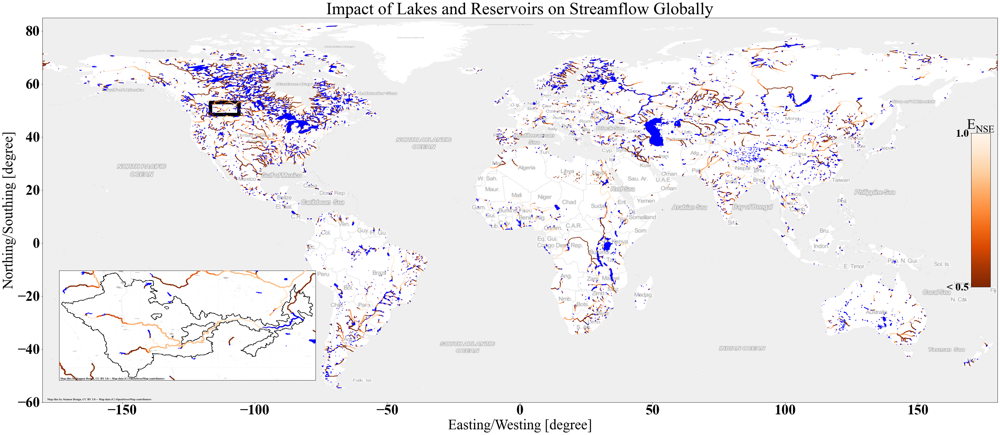

In [12]:
lakes_buffer = gpd.read_file('/Volumes/F:/hydrography/test/hydrolake_sub100km_final_buffer01.shp')
lakes = gpd.read_file('/Volumes/F:/hydrography/test/hydrolake_sub100km_final.shp')

#plotting
fig, ax = plt.subplots(figsize=(40,30))

ax.set_facecolor('white')
fig.patch.set_facecolor('white')

shp_slice = shp [shp['obj']>0.01]

# shp_slice = shp_slice.to_crs(epsg=3857) # trasnforation for the basemap

A = shp_slice.plot (ax=ax, column='obj',
                    cmap='Oranges',
                    vmin=0 , vmax=0.5 , linewidth=2,
                    norm=plt.Normalize(vmin=0, vmax=0.5),
                    zorder=10)#, legend = True)

box.geometry.boundary.plot(color=None,edgecolor='k',linewidth = 10, ax = ax)


lakes_buffer.plot(ax = ax, zorder=10, color= 'blue', linewidth=3)

# add title and save
plt.title('Impact of Lakes and Reservoirs on Streamflow Globally')
plt.xlabel('Easting/Westing [degree]') #xlable which is long
plt.ylabel('Northing/Southing [degree]') #ylable which is lat

#
ax.axes.set_xlim([-180,180])
ax.axes.set_ylim([-60,85])

# add colorbar
cmap = plt.get_cmap('Oranges_r',100)
norm = mpl.colors.Normalize(vmin=0,vmax=0.5)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbaxes = inset_axes(ax, width="2%", height="40%", loc=7) # center left 6, lower center 8, right center 7
cbar = plt.colorbar(sm,\
                    cax=cbaxes,\
                    ticks=[0.0,0.5])#,\
#                     orientation="horizontal")

cbar.ax.set_yticklabels(['< 0.5', '1.0'], fontsize = 30)
cbar.ax.yaxis.set_ticks_position('left')
cbar.ax.set_title('$\mathregular{E_{NSE}}$', fontsize = 40)


# tight
plt.tight_layout()

# add basemap
ctx.add_basemap(ax,
                crs=shp_slice.crs,
                zoom=3,
                alpha = 0.4,
                source=ctx.providers.Stamen.TonerLite) # source=ctx.providers.Stamen.TonerLite

#
ax2 =fig.add_axes([0.07,0.15,0.25,0.40])

A = shp_slice.plot (ax=ax2, column='obj',
                    cmap='Oranges',
                    vmin=0 , vmax=0.5 , linewidth=3,
                    norm=plt.Normalize(vmin=0, vmax=0.5),
                    zorder=10)#, legend = True)

cat_up_dissolve.geometry.boundary.plot(color=None,edgecolor='k',linewidth = 1, ax = ax2)


lakes_sub = lakes
lakes_sub ['Pour_lat'] = lakes_sub ['Pour_lat'].astype(float)
lakes_sub ['Pour_long'] = lakes_sub ['Pour_long'].astype(float)
lakes_sub = lakes_sub [lakes_sub['Pour_lat']<max_lat]
lakes_sub = lakes_sub [lakes_sub['Pour_lat']>min_lat]
lakes_sub = lakes_sub [lakes_sub['Pour_long']<max_lon]
lakes_sub = lakes_sub [lakes_sub['Pour_long']>min_lon]
lakes_sub = lakes_sub.buffer(0.01)
lakes_sub.plot(ax = ax2, zorder=10, color= 'blue', linewidth=1)

# North America
# ax2.axes.set_xlim([-160,-50])
# ax2.axes.set_ylim([15,75])
# saskatoon
# ax2.axes.set_xlim([-117,-105])
# ax2.axes.set_ylim([48,53])
# box for SSR at Saskatoon
ax2.axes.set_xlim([min_lon,max_lon])
ax2.axes.set_ylim([min_lat,max_lat])

ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)

# add basemap
ctx.add_basemap(ax2,
                crs=shp_slice.crs,
                zoom=9,
                alpha = 0.8,
                source=ctx.providers.Stamen.TonerLite) # source=ctx.providers.Stamen.TonerLite


plt.tight_layout()

plt.savefig('../frame/Figure_2.png', dpi=300)
plt.savefig('../frame/Figure_2.jpeg', dpi=300)
plt.savefig('../frame/Figure_2.jpg', dpi=300)


